In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz 
from sklearn import metrics
from sklearn.metrics import roc_curve, auc 
from sklearn.metrics import classification_report 
from sklearn.metrics import confusion_matrix 
from sklearn.model_selection import train_test_split 
import eli5 
from eli5.sklearn import PermutationImportance

from numpy.random import seed
from numpy.random import normal
import shap 
from pdpbox import pdp, info_plots 
np.random.seed(2022) 

pd.options.mode.chained_assignment = None  
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import pandas as pd
from catboost import CatBoostClassifier

In [3]:
import os
print(os.getcwd())
os.chdir("/share/home/linmiao/bio/2022_heartEC_scRNA/mRNA/230508_3Data/0526_top20/0528_top12")
print(os.getcwd())

/share/home/linmiao/bio/2022_heartEC_scRNA/mRNA/230508_3Data
/share/home/linmiao/bio/2022_heartEC_scRNA/mRNA/230508_3Data/0526_top20/0528_top12


genes <- c("CAV1", "TNFAIP2", "TEK", "EPHB4", "JUN", "MMP2", "PDGFRB", "PTEN", "TGFBI", "RHOJ", "TGFBR2", "PDGFRA", "PARVA", "FLT1", "THY1", "ARHGAP24", "AMOT")

In [4]:
#加载训练集1
# 导入数据
dc = pd.read_csv('top20_discovery.csv', index_col=0)
#查看数据集一些信息 
dc.info()
# 从dc中提取变量特征和目标变量
X = np.log(dc.drop(['group', 'AMOT', 'MMP2',"TEK", "PDGFRA", "PTEN"], axis=1))
# print(X.head())
Y = dc['group']
# 将数据切分成训练集和测试集
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=1234,shuffle=True, stratify=None)

<class 'pandas.core.frame.DataFrame'>
Index: 152 entries, 5059_mRNA to HCM437
Data columns (total 18 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CAV1      152 non-null    float64
 1   TNFAIP2   152 non-null    float64
 2   TEK       152 non-null    float64
 3   EPHB4     152 non-null    float64
 4   JUN       152 non-null    float64
 5   MMP2      152 non-null    float64
 6   PDGFRB    152 non-null    float64
 7   PTEN      152 non-null    float64
 8   TGFBI     152 non-null    float64
 9   RHOJ      152 non-null    float64
 10  TGFBR2    152 non-null    float64
 11  PDGFRA    152 non-null    float64
 12  PARVA     152 non-null    float64
 13  FLT1      152 non-null    float64
 14  THY1      152 non-null    float64
 15  ARHGAP24  152 non-null    float64
 16  AMOT      152 non-null    float64
 17  group     152 non-null    int64  
dtypes: float64(17), int64(1)
memory usage: 22.6+ KB


In [5]:
# 加载验证集2
# Load the external validation set 2
V2 = pd.read_csv('top20_validation2.csv', index_col=0)  # Assuming the external validation set is in a CSV file named 'validation1.csv'

# Extract features and target variables
X_V2 = np.log(V2.drop(['group', 'AMOT', 'MMP2',"TEK", "PDGFRA", "PTEN"], axis=1))
Y_V2 = V2['group']
V2.info()
print(X_V2.head())

<class 'pandas.core.frame.DataFrame'>
Index: 23 entries, GSM4887610 to GSM4887632
Data columns (total 18 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CAV1      23 non-null     float64
 1   TNFAIP2   23 non-null     float64
 2   TEK       23 non-null     float64
 3   EPHB4     23 non-null     float64
 4   JUN       23 non-null     float64
 5   MMP2      23 non-null     float64
 6   PDGFRB    23 non-null     float64
 7   PTEN      23 non-null     float64
 8   TGFBI     23 non-null     float64
 9   RHOJ      23 non-null     float64
 10  TGFBR2    23 non-null     float64
 11  PDGFRA    23 non-null     float64
 12  PARVA     23 non-null     float64
 13  FLT1      23 non-null     float64
 14  THY1      23 non-null     float64
 15  ARHGAP24  23 non-null     float64
 16  AMOT      23 non-null     float64
 17  group     23 non-null     int64  
dtypes: float64(17), int64(1)
memory usage: 3.4+ KB
                CAV1   TNFAIP2     EPHB4       JUN   

In [6]:
# 加载验证集3
# Load the external validation set 3
V3 = pd.read_csv('top20_validation3.csv', index_col=0)  # Assuming the external validation set is in a CSV file named 'validation1.csv'

# Extract features and target variables
X_V3 = np.log(V3.drop(['group', 'AMOT', 'MMP2',"TEK", "PDGFRA", "PTEN"], axis=1))
Y_V3 = V3['group']
X_V3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37 entries, HCM269 to sc6_LV
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CAV1      37 non-null     float64
 1   TNFAIP2   37 non-null     float64
 2   EPHB4     37 non-null     float64
 3   JUN       37 non-null     float64
 4   PDGFRB    37 non-null     float64
 5   TGFBI     37 non-null     float64
 6   RHOJ      37 non-null     float64
 7   TGFBR2    37 non-null     float64
 8   PARVA     37 non-null     float64
 9   FLT1      37 non-null     float64
 10  THY1      37 non-null     float64
 11  ARHGAP24  37 non-null     float64
dtypes: float64(12)
memory usage: 3.8+ KB


# 结果保存位置

In [7]:
os.chdir("/share/home/linmiao/bio/2022_heartEC_scRNA/mRNA/230508_3Data/0526_top20/0528_top12")

In [8]:
# 创建空的结果列表
results = []

# 设置循环运行100次
for i in range(100):
    # 设置随机数种子
    seed = i  # 使用循环变量i作为种子值
    np.random.seed(seed)

    
   # 分割数据集
    X_train_val, X_test, Y_train_val, Y_test = train_test_split(X, Y, test_size=0.10, random_state=seed, shuffle=True, stratify=Y)
    X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, test_size=0.1111, random_state=seed, shuffle=True, stratify=Y_train_val)



    # 初始化 CatBoostClassifier 模型
    catboost_model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=8, random_seed=seed)

    # 在训练集上训练 CatBoostClassifier 模型
    catboost_model.fit(X_train, Y_train)

    # 在验证集上进行预测并计算指标
    Y_val_pred_catboost = catboost_model.predict(X_val)
    accuracy_val_catboost = accuracy_score(Y_val, Y_val_pred_catboost)
    precision_val_catboost = precision_score(Y_val, Y_val_pred_catboost)
    recall_val_catboost = recall_score(Y_val, Y_val_pred_catboost)
    f1_val_catboost = f1_score(Y_val, Y_val_pred_catboost)
    roc_auc_val_catboost = roc_auc_score(Y_val, Y_val_pred_catboost)

    # 在外部验证集2上进行预测并计算指标
    Y_V2_pred_catboost = catboost_model.predict(X_V2)
    accuracy_V2_catboost = accuracy_score(Y_V2, Y_V2_pred_catboost)
    precision_V2_catboost = precision_score(Y_V2, Y_V2_pred_catboost)
    recall_V2_catboost = recall_score(Y_V2, Y_V2_pred_catboost)
    f1_V2_catboost = f1_score(Y_V2, Y_V2_pred_catboost)
    roc_auc_V2_catboost = roc_auc_score(Y_V2, Y_V2_pred_catboost)

    # 在外部验证集3上进行预测并计算指标
    Y_V3_pred_catboost = catboost_model.predict(X_V3)
    accuracy_V3_catboost = accuracy_score(Y_V3, Y_V3_pred_catboost)
    precision_V3_catboost = precision_score(Y_V3, Y_V3_pred_catboost)
    recall_V3_catboost = recall_score(Y_V3, Y_V3_pred_catboost)
    f1_V3_catboost = f1_score(Y_V3, Y_V3_pred_catboost)
    roc_auc_V3_catboost = roc_auc_score(Y_V3, Y_V3_pred_catboost)
    
    # 将结果添加到结果列表中
    results.append({
        'Seed': seed,
        'Accuracy_Val': accuracy_val_catboost,
        'Precision_Val': precision_val_catboost,
        'Recall_Val': recall_val_catboost,
        'F1_Score_Val': f1_val_catboost,
        'ROC_AUC_Val': roc_auc_val_catboost,
        'Accuracy_V2': accuracy_V2_catboost,
        'Precision_V2': precision_V2_catboost,
        'Recall_V2': recall_V2_catboost,
        'F1_Score_V2': f1_V2_catboost,
        'ROC_AUC_V2': roc_auc_V2_catboost,
        'Accuracy_V3': accuracy_V3_catboost,
        'Precision_V3': precision_V3_catboost,
        'Recall_V3': recall_V3_catboost,
        'F1_Score_V3': f1_V3_catboost,
        'ROC_AUC_V3': roc_auc_V3_catboost
    })

# 创建DataFrame
results_df = pd.DataFrame(results)

# 计算评估指标的均值和标准差
evaluation_metrics = ['Accuracy', 'Precision', 'Recall', 'F1_Score', 'ROC_AUC']
for metric in evaluation_metrics:
    results_df[f'{metric}_mean'] = results_df[[f'{metric}_Val', f'{metric}_V2', f'{metric}_V3']].mean(axis=1)
    results_df[f'{metric}_std'] = results_df[[f'{metric}_Val', f'{metric}_V2', f'{metric}_V3']].std(axis=1)

# 导出为CSV文件
results_df.to_csv('0517_classification_results.csv', index=False)

0:	learn: 0.5916104	total: 58.6ms	remaining: 58.5s
1:	learn: 0.4929903	total: 63.3ms	remaining: 31.6s
2:	learn: 0.4083424	total: 66.2ms	remaining: 22s
3:	learn: 0.3407557	total: 68.1ms	remaining: 17s
4:	learn: 0.2985604	total: 70.2ms	remaining: 14s
5:	learn: 0.2552185	total: 72.1ms	remaining: 11.9s
6:	learn: 0.2201278	total: 74.1ms	remaining: 10.5s
7:	learn: 0.1887406	total: 76.3ms	remaining: 9.46s
8:	learn: 0.1636790	total: 78.5ms	remaining: 8.65s
9:	learn: 0.1425300	total: 80.6ms	remaining: 7.98s
10:	learn: 0.1276748	total: 82.6ms	remaining: 7.43s
11:	learn: 0.1160201	total: 84.5ms	remaining: 6.96s
12:	learn: 0.1060747	total: 86.5ms	remaining: 6.56s
13:	learn: 0.0949916	total: 88.5ms	remaining: 6.23s
14:	learn: 0.0851249	total: 90.5ms	remaining: 5.94s
15:	learn: 0.0785836	total: 92.6ms	remaining: 5.7s
16:	learn: 0.0747181	total: 94.6ms	remaining: 5.47s
17:	learn: 0.0691175	total: 96.5ms	remaining: 5.26s
18:	learn: 0.0648182	total: 98.3ms	remaining: 5.08s
19:	learn: 0.0611710	total: 1

189:	learn: 0.0033206	total: 436ms	remaining: 1.86s
190:	learn: 0.0033075	total: 438ms	remaining: 1.85s
191:	learn: 0.0032914	total: 440ms	remaining: 1.85s
192:	learn: 0.0032796	total: 442ms	remaining: 1.85s
193:	learn: 0.0032654	total: 444ms	remaining: 1.84s
194:	learn: 0.0032525	total: 446ms	remaining: 1.84s
195:	learn: 0.0032399	total: 448ms	remaining: 1.84s
196:	learn: 0.0032261	total: 450ms	remaining: 1.83s
197:	learn: 0.0032112	total: 452ms	remaining: 1.83s
198:	learn: 0.0031839	total: 454ms	remaining: 1.83s
199:	learn: 0.0031711	total: 456ms	remaining: 1.82s
200:	learn: 0.0031555	total: 458ms	remaining: 1.82s
201:	learn: 0.0031423	total: 460ms	remaining: 1.82s
202:	learn: 0.0031307	total: 462ms	remaining: 1.81s
203:	learn: 0.0031052	total: 464ms	remaining: 1.81s
204:	learn: 0.0030922	total: 466ms	remaining: 1.81s
205:	learn: 0.0030802	total: 468ms	remaining: 1.8s
206:	learn: 0.0030686	total: 470ms	remaining: 1.8s
207:	learn: 0.0030550	total: 472ms	remaining: 1.8s
208:	learn: 0.0

376:	learn: 0.0017100	total: 815ms	remaining: 1.35s
377:	learn: 0.0017026	total: 817ms	remaining: 1.34s
378:	learn: 0.0016986	total: 819ms	remaining: 1.34s
379:	learn: 0.0016950	total: 821ms	remaining: 1.34s
380:	learn: 0.0016951	total: 823ms	remaining: 1.34s
381:	learn: 0.0016902	total: 825ms	remaining: 1.33s
382:	learn: 0.0016859	total: 827ms	remaining: 1.33s
383:	learn: 0.0016828	total: 829ms	remaining: 1.33s
384:	learn: 0.0016787	total: 831ms	remaining: 1.33s
385:	learn: 0.0016754	total: 833ms	remaining: 1.32s
386:	learn: 0.0016717	total: 835ms	remaining: 1.32s
387:	learn: 0.0016626	total: 837ms	remaining: 1.32s
388:	learn: 0.0016586	total: 839ms	remaining: 1.32s
389:	learn: 0.0016552	total: 841ms	remaining: 1.31s
390:	learn: 0.0016517	total: 843ms	remaining: 1.31s
391:	learn: 0.0016480	total: 845ms	remaining: 1.31s
392:	learn: 0.0016479	total: 847ms	remaining: 1.31s
393:	learn: 0.0016479	total: 849ms	remaining: 1.3s
394:	learn: 0.0016445	total: 851ms	remaining: 1.3s
395:	learn: 0.

580:	learn: 0.0013875	total: 1.2s	remaining: 865ms
581:	learn: 0.0013864	total: 1.2s	remaining: 863ms
582:	learn: 0.0013809	total: 1.2s	remaining: 861ms
583:	learn: 0.0013789	total: 1.21s	remaining: 859ms
584:	learn: 0.0013787	total: 1.21s	remaining: 856ms
585:	learn: 0.0013763	total: 1.21s	remaining: 854ms
586:	learn: 0.0013764	total: 1.21s	remaining: 852ms
587:	learn: 0.0013747	total: 1.21s	remaining: 850ms
588:	learn: 0.0013745	total: 1.21s	remaining: 848ms
589:	learn: 0.0013726	total: 1.22s	remaining: 846ms
590:	learn: 0.0013724	total: 1.22s	remaining: 843ms
591:	learn: 0.0013722	total: 1.22s	remaining: 841ms
592:	learn: 0.0013722	total: 1.22s	remaining: 839ms
593:	learn: 0.0013722	total: 1.22s	remaining: 837ms
594:	learn: 0.0013693	total: 1.23s	remaining: 834ms
595:	learn: 0.0013692	total: 1.23s	remaining: 832ms
596:	learn: 0.0013665	total: 1.23s	remaining: 830ms
597:	learn: 0.0013645	total: 1.23s	remaining: 828ms
598:	learn: 0.0013629	total: 1.23s	remaining: 826ms
599:	learn: 0.0

787:	learn: 0.0012317	total: 1.58s	remaining: 426ms
788:	learn: 0.0012315	total: 1.58s	remaining: 424ms
789:	learn: 0.0012314	total: 1.59s	remaining: 422ms
790:	learn: 0.0012315	total: 1.59s	remaining: 420ms
791:	learn: 0.0012315	total: 1.59s	remaining: 418ms
792:	learn: 0.0012315	total: 1.59s	remaining: 416ms
793:	learn: 0.0012315	total: 1.59s	remaining: 414ms
794:	learn: 0.0012315	total: 1.59s	remaining: 411ms
795:	learn: 0.0012301	total: 1.6s	remaining: 410ms
796:	learn: 0.0012299	total: 1.6s	remaining: 407ms
797:	learn: 0.0012299	total: 1.6s	remaining: 405ms
798:	learn: 0.0012299	total: 1.6s	remaining: 403ms
799:	learn: 0.0012299	total: 1.6s	remaining: 401ms
800:	learn: 0.0012269	total: 1.61s	remaining: 399ms
801:	learn: 0.0012248	total: 1.61s	remaining: 397ms
802:	learn: 0.0012248	total: 1.61s	remaining: 395ms
803:	learn: 0.0012247	total: 1.61s	remaining: 393ms
804:	learn: 0.0012246	total: 1.61s	remaining: 391ms
805:	learn: 0.0012247	total: 1.62s	remaining: 389ms
806:	learn: 0.001

989:	learn: 0.0011751	total: 1.97s	remaining: 19.9ms
990:	learn: 0.0011752	total: 1.97s	remaining: 17.9ms
991:	learn: 0.0011738	total: 1.97s	remaining: 15.9ms
992:	learn: 0.0011737	total: 1.97s	remaining: 13.9ms
993:	learn: 0.0011737	total: 1.98s	remaining: 11.9ms
994:	learn: 0.0011738	total: 1.98s	remaining: 9.93ms
995:	learn: 0.0011737	total: 1.98s	remaining: 7.95ms
996:	learn: 0.0011720	total: 1.98s	remaining: 5.96ms
997:	learn: 0.0011720	total: 1.98s	remaining: 3.97ms
998:	learn: 0.0011720	total: 1.98s	remaining: 1.99ms
999:	learn: 0.0011720	total: 1.99s	remaining: 0us
0:	learn: 0.5834681	total: 7.73ms	remaining: 7.72s
1:	learn: 0.4896857	total: 9.93ms	remaining: 4.96s
2:	learn: 0.4087175	total: 12.3ms	remaining: 4.07s
3:	learn: 0.3547399	total: 14.4ms	remaining: 3.59s
4:	learn: 0.3140532	total: 16.5ms	remaining: 3.28s
5:	learn: 0.2670607	total: 18.6ms	remaining: 3.09s
6:	learn: 0.2299360	total: 20.7ms	remaining: 2.93s
7:	learn: 0.1975475	total: 22.7ms	remaining: 2.82s
8:	learn: 0.

220:	learn: 0.0025507	total: 456ms	remaining: 1.61s
221:	learn: 0.0025389	total: 458ms	remaining: 1.6s
222:	learn: 0.0025250	total: 460ms	remaining: 1.6s
223:	learn: 0.0025096	total: 462ms	remaining: 1.6s
224:	learn: 0.0024935	total: 464ms	remaining: 1.6s
225:	learn: 0.0024788	total: 469ms	remaining: 1.61s
226:	learn: 0.0024704	total: 473ms	remaining: 1.61s
227:	learn: 0.0024622	total: 475ms	remaining: 1.61s
228:	learn: 0.0024466	total: 477ms	remaining: 1.6s
229:	learn: 0.0024327	total: 479ms	remaining: 1.6s
230:	learn: 0.0024212	total: 481ms	remaining: 1.6s
231:	learn: 0.0024105	total: 483ms	remaining: 1.6s
232:	learn: 0.0024001	total: 485ms	remaining: 1.6s
233:	learn: 0.0023867	total: 487ms	remaining: 1.59s
234:	learn: 0.0023767	total: 489ms	remaining: 1.59s
235:	learn: 0.0023675	total: 491ms	remaining: 1.59s
236:	learn: 0.0023495	total: 493ms	remaining: 1.59s
237:	learn: 0.0023348	total: 494ms	remaining: 1.58s
238:	learn: 0.0023250	total: 496ms	remaining: 1.58s
239:	learn: 0.0023114

412:	learn: 0.0014846	total: 836ms	remaining: 1.19s
413:	learn: 0.0014809	total: 837ms	remaining: 1.19s
414:	learn: 0.0014774	total: 840ms	remaining: 1.18s
415:	learn: 0.0014770	total: 841ms	remaining: 1.18s
416:	learn: 0.0014769	total: 843ms	remaining: 1.18s
417:	learn: 0.0014765	total: 845ms	remaining: 1.18s
418:	learn: 0.0014732	total: 847ms	remaining: 1.17s
419:	learn: 0.0014732	total: 849ms	remaining: 1.17s
420:	learn: 0.0014705	total: 851ms	remaining: 1.17s
421:	learn: 0.0014656	total: 853ms	remaining: 1.17s
422:	learn: 0.0014620	total: 855ms	remaining: 1.17s
423:	learn: 0.0014585	total: 857ms	remaining: 1.16s
424:	learn: 0.0014579	total: 858ms	remaining: 1.16s
425:	learn: 0.0014554	total: 860ms	remaining: 1.16s
426:	learn: 0.0014554	total: 862ms	remaining: 1.16s
427:	learn: 0.0014530	total: 864ms	remaining: 1.16s
428:	learn: 0.0014530	total: 866ms	remaining: 1.15s
429:	learn: 0.0014499	total: 868ms	remaining: 1.15s
430:	learn: 0.0014486	total: 870ms	remaining: 1.15s
431:	learn: 

617:	learn: 0.0012445	total: 1.22s	remaining: 752ms
618:	learn: 0.0012444	total: 1.22s	remaining: 750ms
619:	learn: 0.0012424	total: 1.22s	remaining: 748ms
620:	learn: 0.0012425	total: 1.22s	remaining: 746ms
621:	learn: 0.0012404	total: 1.22s	remaining: 744ms
622:	learn: 0.0012384	total: 1.23s	remaining: 742ms
623:	learn: 0.0012360	total: 1.23s	remaining: 740ms
624:	learn: 0.0012360	total: 1.23s	remaining: 738ms
625:	learn: 0.0012360	total: 1.23s	remaining: 736ms
626:	learn: 0.0012357	total: 1.23s	remaining: 734ms
627:	learn: 0.0012357	total: 1.24s	remaining: 732ms
628:	learn: 0.0012342	total: 1.24s	remaining: 730ms
629:	learn: 0.0012342	total: 1.24s	remaining: 728ms
630:	learn: 0.0012342	total: 1.24s	remaining: 726ms
631:	learn: 0.0012342	total: 1.24s	remaining: 724ms
632:	learn: 0.0012341	total: 1.24s	remaining: 722ms
633:	learn: 0.0012313	total: 1.25s	remaining: 720ms
634:	learn: 0.0012312	total: 1.25s	remaining: 717ms
635:	learn: 0.0012292	total: 1.25s	remaining: 715ms
636:	learn: 

820:	learn: 0.0011305	total: 1.6s	remaining: 349ms
821:	learn: 0.0011305	total: 1.6s	remaining: 347ms
822:	learn: 0.0011305	total: 1.6s	remaining: 345ms
823:	learn: 0.0011304	total: 1.6s	remaining: 343ms
824:	learn: 0.0011284	total: 1.61s	remaining: 341ms
825:	learn: 0.0011284	total: 1.61s	remaining: 339ms
826:	learn: 0.0011281	total: 1.61s	remaining: 337ms
827:	learn: 0.0011281	total: 1.61s	remaining: 335ms
828:	learn: 0.0011281	total: 1.61s	remaining: 333ms
829:	learn: 0.0011281	total: 1.62s	remaining: 331ms
830:	learn: 0.0011281	total: 1.62s	remaining: 329ms
831:	learn: 0.0011281	total: 1.62s	remaining: 327ms
832:	learn: 0.0011280	total: 1.62s	remaining: 325ms
833:	learn: 0.0011279	total: 1.62s	remaining: 323ms
834:	learn: 0.0011279	total: 1.63s	remaining: 321ms
835:	learn: 0.0011278	total: 1.63s	remaining: 319ms
836:	learn: 0.0011278	total: 1.63s	remaining: 317ms
837:	learn: 0.0011257	total: 1.63s	remaining: 315ms
838:	learn: 0.0011256	total: 1.63s	remaining: 313ms
839:	learn: 0.00

0:	learn: 0.5702868	total: 5.87ms	remaining: 5.86s
1:	learn: 0.4907230	total: 8.1ms	remaining: 4.04s
2:	learn: 0.4067614	total: 9.4ms	remaining: 3.12s
3:	learn: 0.3432611	total: 11.5ms	remaining: 2.86s
4:	learn: 0.2926006	total: 13.4ms	remaining: 2.67s
5:	learn: 0.2562459	total: 15.3ms	remaining: 2.53s
6:	learn: 0.2162749	total: 17.3ms	remaining: 2.45s
7:	learn: 0.1917074	total: 19.2ms	remaining: 2.38s
8:	learn: 0.1716840	total: 21.1ms	remaining: 2.32s
9:	learn: 0.1484724	total: 23.2ms	remaining: 2.3s
10:	learn: 0.1303996	total: 25.2ms	remaining: 2.26s
11:	learn: 0.1202497	total: 27.2ms	remaining: 2.24s
12:	learn: 0.1094288	total: 29.1ms	remaining: 2.21s
13:	learn: 0.1003876	total: 31.1ms	remaining: 2.19s
14:	learn: 0.0896561	total: 33.1ms	remaining: 2.18s
15:	learn: 0.0810835	total: 35.2ms	remaining: 2.16s
16:	learn: 0.0751137	total: 37.4ms	remaining: 2.16s
17:	learn: 0.0698576	total: 39.4ms	remaining: 2.15s
18:	learn: 0.0658289	total: 41.3ms	remaining: 2.13s
19:	learn: 0.0612385	tota

183:	learn: 0.0032412	total: 381ms	remaining: 1.69s
184:	learn: 0.0032238	total: 383ms	remaining: 1.69s
185:	learn: 0.0032032	total: 385ms	remaining: 1.69s
186:	learn: 0.0031831	total: 387ms	remaining: 1.68s
187:	learn: 0.0031632	total: 389ms	remaining: 1.68s
188:	learn: 0.0031479	total: 392ms	remaining: 1.68s
189:	learn: 0.0031286	total: 394ms	remaining: 1.68s
190:	learn: 0.0031108	total: 396ms	remaining: 1.68s
191:	learn: 0.0030934	total: 398ms	remaining: 1.67s
192:	learn: 0.0030762	total: 400ms	remaining: 1.67s
193:	learn: 0.0030573	total: 402ms	remaining: 1.67s
194:	learn: 0.0030418	total: 404ms	remaining: 1.67s
195:	learn: 0.0030276	total: 406ms	remaining: 1.66s
196:	learn: 0.0030109	total: 408ms	remaining: 1.66s
197:	learn: 0.0029940	total: 410ms	remaining: 1.66s
198:	learn: 0.0029747	total: 412ms	remaining: 1.66s
199:	learn: 0.0029600	total: 414ms	remaining: 1.66s
200:	learn: 0.0029452	total: 416ms	remaining: 1.65s
201:	learn: 0.0029294	total: 418ms	remaining: 1.65s
202:	learn: 

362:	learn: 0.0016187	total: 756ms	remaining: 1.33s
363:	learn: 0.0016187	total: 758ms	remaining: 1.32s
364:	learn: 0.0016165	total: 760ms	remaining: 1.32s
365:	learn: 0.0016130	total: 762ms	remaining: 1.32s
366:	learn: 0.0016073	total: 764ms	remaining: 1.32s
367:	learn: 0.0016029	total: 766ms	remaining: 1.31s
368:	learn: 0.0015980	total: 768ms	remaining: 1.31s
369:	learn: 0.0015946	total: 770ms	remaining: 1.31s
370:	learn: 0.0015915	total: 772ms	remaining: 1.31s
371:	learn: 0.0015881	total: 774ms	remaining: 1.31s
372:	learn: 0.0015832	total: 776ms	remaining: 1.3s
373:	learn: 0.0015831	total: 778ms	remaining: 1.3s
374:	learn: 0.0015831	total: 779ms	remaining: 1.3s
375:	learn: 0.0015789	total: 781ms	remaining: 1.3s
376:	learn: 0.0015784	total: 783ms	remaining: 1.29s
377:	learn: 0.0015774	total: 785ms	remaining: 1.29s
378:	learn: 0.0015731	total: 787ms	remaining: 1.29s
379:	learn: 0.0015685	total: 789ms	remaining: 1.29s
380:	learn: 0.0015637	total: 791ms	remaining: 1.28s
381:	learn: 0.00

560:	learn: 0.0012933	total: 1.13s	remaining: 887ms
561:	learn: 0.0012906	total: 1.14s	remaining: 885ms
562:	learn: 0.0012878	total: 1.14s	remaining: 883ms
563:	learn: 0.0012878	total: 1.14s	remaining: 881ms
564:	learn: 0.0012877	total: 1.14s	remaining: 879ms
565:	learn: 0.0012877	total: 1.14s	remaining: 876ms
566:	learn: 0.0012878	total: 1.14s	remaining: 874ms
567:	learn: 0.0012877	total: 1.15s	remaining: 872ms
568:	learn: 0.0012847	total: 1.15s	remaining: 870ms
569:	learn: 0.0012847	total: 1.15s	remaining: 868ms
570:	learn: 0.0012846	total: 1.15s	remaining: 865ms
571:	learn: 0.0012846	total: 1.15s	remaining: 863ms
572:	learn: 0.0012829	total: 1.16s	remaining: 861ms
573:	learn: 0.0012829	total: 1.16s	remaining: 859ms
574:	learn: 0.0012810	total: 1.16s	remaining: 857ms
575:	learn: 0.0012810	total: 1.16s	remaining: 855ms
576:	learn: 0.0012810	total: 1.16s	remaining: 853ms
577:	learn: 0.0012809	total: 1.16s	remaining: 850ms
578:	learn: 0.0012810	total: 1.17s	remaining: 848ms
579:	learn: 

764:	learn: 0.0011676	total: 1.5s	remaining: 463ms
765:	learn: 0.0011676	total: 1.51s	remaining: 461ms
766:	learn: 0.0011676	total: 1.51s	remaining: 458ms
767:	learn: 0.0011672	total: 1.51s	remaining: 457ms
768:	learn: 0.0011666	total: 1.51s	remaining: 454ms
769:	learn: 0.0011667	total: 1.51s	remaining: 452ms
770:	learn: 0.0011662	total: 1.52s	remaining: 450ms
771:	learn: 0.0011662	total: 1.52s	remaining: 448ms
772:	learn: 0.0011658	total: 1.52s	remaining: 446ms
773:	learn: 0.0011658	total: 1.52s	remaining: 444ms
774:	learn: 0.0011659	total: 1.52s	remaining: 442ms
775:	learn: 0.0011659	total: 1.52s	remaining: 440ms
776:	learn: 0.0011659	total: 1.53s	remaining: 438ms
777:	learn: 0.0011658	total: 1.53s	remaining: 436ms
778:	learn: 0.0011640	total: 1.53s	remaining: 434ms
779:	learn: 0.0011642	total: 1.53s	remaining: 432ms
780:	learn: 0.0011615	total: 1.53s	remaining: 430ms
781:	learn: 0.0011594	total: 1.54s	remaining: 428ms
782:	learn: 0.0011593	total: 1.54s	remaining: 426ms
783:	learn: 0

954:	learn: 0.0011102	total: 1.88s	remaining: 88.6ms
955:	learn: 0.0011102	total: 1.88s	remaining: 86.6ms
956:	learn: 0.0011102	total: 1.88s	remaining: 84.6ms
957:	learn: 0.0011101	total: 1.89s	remaining: 82.6ms
958:	learn: 0.0011102	total: 1.89s	remaining: 80.7ms
959:	learn: 0.0011090	total: 1.89s	remaining: 78.7ms
960:	learn: 0.0011090	total: 1.89s	remaining: 76.7ms
961:	learn: 0.0011090	total: 1.89s	remaining: 74.8ms
962:	learn: 0.0011090	total: 1.89s	remaining: 72.8ms
963:	learn: 0.0011088	total: 1.9s	remaining: 70.8ms
964:	learn: 0.0011088	total: 1.9s	remaining: 68.9ms
965:	learn: 0.0011088	total: 1.9s	remaining: 66.9ms
966:	learn: 0.0011088	total: 1.9s	remaining: 64.9ms
967:	learn: 0.0011081	total: 1.9s	remaining: 63ms
968:	learn: 0.0011078	total: 1.91s	remaining: 61ms
969:	learn: 0.0011077	total: 1.91s	remaining: 59ms
970:	learn: 0.0011077	total: 1.91s	remaining: 57ms
971:	learn: 0.0011077	total: 1.91s	remaining: 55.1ms
972:	learn: 0.0011075	total: 1.91s	remaining: 53.1ms
973:	l

186:	learn: 0.0037171	total: 405ms	remaining: 1.76s
187:	learn: 0.0037004	total: 407ms	remaining: 1.76s
188:	learn: 0.0036823	total: 409ms	remaining: 1.75s
189:	learn: 0.0036652	total: 411ms	remaining: 1.75s
190:	learn: 0.0036511	total: 413ms	remaining: 1.75s
191:	learn: 0.0036339	total: 415ms	remaining: 1.75s
192:	learn: 0.0036145	total: 417ms	remaining: 1.75s
193:	learn: 0.0035981	total: 419ms	remaining: 1.74s
194:	learn: 0.0035823	total: 421ms	remaining: 1.74s
195:	learn: 0.0035657	total: 424ms	remaining: 1.74s
196:	learn: 0.0035497	total: 426ms	remaining: 1.74s
197:	learn: 0.0035318	total: 428ms	remaining: 1.73s
198:	learn: 0.0035147	total: 430ms	remaining: 1.73s
199:	learn: 0.0034966	total: 432ms	remaining: 1.73s
200:	learn: 0.0034764	total: 434ms	remaining: 1.72s
201:	learn: 0.0034585	total: 436ms	remaining: 1.72s
202:	learn: 0.0034461	total: 438ms	remaining: 1.72s
203:	learn: 0.0034288	total: 440ms	remaining: 1.72s
204:	learn: 0.0034116	total: 442ms	remaining: 1.71s
205:	learn: 

366:	learn: 0.0019387	total: 784ms	remaining: 1.35s
367:	learn: 0.0019336	total: 786ms	remaining: 1.35s
368:	learn: 0.0019280	total: 788ms	remaining: 1.35s
369:	learn: 0.0019235	total: 790ms	remaining: 1.34s
370:	learn: 0.0019177	total: 792ms	remaining: 1.34s
371:	learn: 0.0019130	total: 794ms	remaining: 1.34s
372:	learn: 0.0019129	total: 796ms	remaining: 1.34s
373:	learn: 0.0019084	total: 798ms	remaining: 1.33s
374:	learn: 0.0019043	total: 800ms	remaining: 1.33s
375:	learn: 0.0018994	total: 802ms	remaining: 1.33s
376:	learn: 0.0018947	total: 804ms	remaining: 1.33s
377:	learn: 0.0018912	total: 806ms	remaining: 1.32s
378:	learn: 0.0018870	total: 808ms	remaining: 1.32s
379:	learn: 0.0018820	total: 810ms	remaining: 1.32s
380:	learn: 0.0018781	total: 812ms	remaining: 1.32s
381:	learn: 0.0018729	total: 815ms	remaining: 1.32s
382:	learn: 0.0018675	total: 817ms	remaining: 1.31s
383:	learn: 0.0018625	total: 818ms	remaining: 1.31s
384:	learn: 0.0018570	total: 820ms	remaining: 1.31s
385:	learn: 

560:	learn: 0.0014673	total: 1.17s	remaining: 913ms
561:	learn: 0.0014646	total: 1.17s	remaining: 911ms
562:	learn: 0.0014620	total: 1.17s	remaining: 909ms
563:	learn: 0.0014620	total: 1.17s	remaining: 907ms
564:	learn: 0.0014597	total: 1.17s	remaining: 905ms
565:	learn: 0.0014592	total: 1.18s	remaining: 902ms
566:	learn: 0.0014568	total: 1.18s	remaining: 900ms
567:	learn: 0.0014542	total: 1.18s	remaining: 898ms
568:	learn: 0.0014542	total: 1.18s	remaining: 896ms
569:	learn: 0.0014519	total: 1.19s	remaining: 894ms
570:	learn: 0.0014493	total: 1.19s	remaining: 892ms
571:	learn: 0.0014471	total: 1.19s	remaining: 890ms
572:	learn: 0.0014471	total: 1.19s	remaining: 887ms
573:	learn: 0.0014467	total: 1.19s	remaining: 885ms
574:	learn: 0.0014466	total: 1.19s	remaining: 883ms
575:	learn: 0.0014438	total: 1.2s	remaining: 881ms
576:	learn: 0.0014411	total: 1.2s	remaining: 879ms
577:	learn: 0.0014411	total: 1.2s	remaining: 876ms
578:	learn: 0.0014385	total: 1.2s	remaining: 874ms
579:	learn: 0.00

760:	learn: 0.0012826	total: 1.54s	remaining: 484ms
761:	learn: 0.0012825	total: 1.54s	remaining: 482ms
762:	learn: 0.0012807	total: 1.55s	remaining: 480ms
763:	learn: 0.0012788	total: 1.55s	remaining: 478ms
764:	learn: 0.0012773	total: 1.55s	remaining: 476ms
765:	learn: 0.0012754	total: 1.55s	remaining: 474ms
766:	learn: 0.0012754	total: 1.55s	remaining: 472ms
767:	learn: 0.0012754	total: 1.55s	remaining: 470ms
768:	learn: 0.0012741	total: 1.56s	remaining: 468ms
769:	learn: 0.0012741	total: 1.56s	remaining: 466ms
770:	learn: 0.0012735	total: 1.56s	remaining: 464ms
771:	learn: 0.0012735	total: 1.56s	remaining: 462ms
772:	learn: 0.0012735	total: 1.56s	remaining: 460ms
773:	learn: 0.0012733	total: 1.57s	remaining: 458ms
774:	learn: 0.0012709	total: 1.57s	remaining: 455ms
775:	learn: 0.0012708	total: 1.57s	remaining: 454ms
776:	learn: 0.0012709	total: 1.57s	remaining: 452ms
777:	learn: 0.0012707	total: 1.57s	remaining: 450ms
778:	learn: 0.0012707	total: 1.58s	remaining: 447ms
779:	learn: 

960:	learn: 0.0011918	total: 1.91s	remaining: 77.7ms
961:	learn: 0.0011917	total: 1.92s	remaining: 75.7ms
962:	learn: 0.0011902	total: 1.92s	remaining: 73.7ms
963:	learn: 0.0011902	total: 1.92s	remaining: 71.7ms
964:	learn: 0.0011901	total: 1.92s	remaining: 69.7ms
965:	learn: 0.0011894	total: 1.92s	remaining: 67.7ms
966:	learn: 0.0011894	total: 1.93s	remaining: 65.7ms
967:	learn: 0.0011877	total: 1.93s	remaining: 63.7ms
968:	learn: 0.0011877	total: 1.93s	remaining: 61.7ms
969:	learn: 0.0011876	total: 1.93s	remaining: 59.7ms
970:	learn: 0.0011875	total: 1.93s	remaining: 57.7ms
971:	learn: 0.0011875	total: 1.93s	remaining: 55.7ms
972:	learn: 0.0011875	total: 1.94s	remaining: 53.7ms
973:	learn: 0.0011875	total: 1.94s	remaining: 51.7ms
974:	learn: 0.0011875	total: 1.94s	remaining: 49.7ms
975:	learn: 0.0011875	total: 1.94s	remaining: 47.7ms
976:	learn: 0.0011875	total: 1.94s	remaining: 45.7ms
977:	learn: 0.0011856	total: 1.94s	remaining: 43.7ms
978:	learn: 0.0011856	total: 1.95s	remaining: 

196:	learn: 0.0032256	total: 417ms	remaining: 1.7s
197:	learn: 0.0032079	total: 419ms	remaining: 1.7s
198:	learn: 0.0031936	total: 421ms	remaining: 1.7s
199:	learn: 0.0031803	total: 424ms	remaining: 1.69s
200:	learn: 0.0031616	total: 426ms	remaining: 1.69s
201:	learn: 0.0031458	total: 428ms	remaining: 1.69s
202:	learn: 0.0031293	total: 430ms	remaining: 1.69s
203:	learn: 0.0031097	total: 432ms	remaining: 1.69s
204:	learn: 0.0030935	total: 434ms	remaining: 1.68s
205:	learn: 0.0030766	total: 436ms	remaining: 1.68s
206:	learn: 0.0030597	total: 438ms	remaining: 1.68s
207:	learn: 0.0030475	total: 440ms	remaining: 1.67s
208:	learn: 0.0030307	total: 442ms	remaining: 1.67s
209:	learn: 0.0030148	total: 444ms	remaining: 1.67s
210:	learn: 0.0030008	total: 446ms	remaining: 1.67s
211:	learn: 0.0029889	total: 448ms	remaining: 1.67s
212:	learn: 0.0029755	total: 450ms	remaining: 1.66s
213:	learn: 0.0029616	total: 452ms	remaining: 1.66s
214:	learn: 0.0029499	total: 454ms	remaining: 1.66s
215:	learn: 0.0

377:	learn: 0.0017089	total: 794ms	remaining: 1.31s
378:	learn: 0.0017068	total: 796ms	remaining: 1.3s
379:	learn: 0.0017055	total: 812ms	remaining: 1.32s
380:	learn: 0.0017014	total: 815ms	remaining: 1.32s
381:	learn: 0.0016976	total: 828ms	remaining: 1.34s
382:	learn: 0.0016978	total: 830ms	remaining: 1.34s
383:	learn: 0.0016923	total: 833ms	remaining: 1.33s
384:	learn: 0.0016886	total: 838ms	remaining: 1.34s
385:	learn: 0.0016845	total: 870ms	remaining: 1.38s
386:	learn: 0.0016823	total: 888ms	remaining: 1.41s
387:	learn: 0.0016782	total: 893ms	remaining: 1.41s
388:	learn: 0.0016735	total: 921ms	remaining: 1.45s
389:	learn: 0.0016703	total: 936ms	remaining: 1.46s
390:	learn: 0.0016675	total: 942ms	remaining: 1.47s
391:	learn: 0.0016656	total: 955ms	remaining: 1.48s
392:	learn: 0.0016605	total: 962ms	remaining: 1.49s
393:	learn: 0.0016574	total: 987ms	remaining: 1.52s
394:	learn: 0.0016529	total: 1.02s	remaining: 1.56s
395:	learn: 0.0016498	total: 1.03s	remaining: 1.57s
396:	learn: 0

560:	learn: 0.0013936	total: 2.6s	remaining: 2.04s
561:	learn: 0.0013936	total: 2.61s	remaining: 2.03s
562:	learn: 0.0013936	total: 2.61s	remaining: 2.02s
563:	learn: 0.0013913	total: 2.61s	remaining: 2.02s
564:	learn: 0.0013881	total: 2.61s	remaining: 2.01s
565:	learn: 0.0013882	total: 2.62s	remaining: 2s
566:	learn: 0.0013873	total: 2.62s	remaining: 2s
567:	learn: 0.0013868	total: 2.62s	remaining: 1.99s
568:	learn: 0.0013868	total: 2.62s	remaining: 1.99s
569:	learn: 0.0013868	total: 2.62s	remaining: 1.98s
570:	learn: 0.0013839	total: 2.63s	remaining: 1.97s
571:	learn: 0.0013839	total: 2.63s	remaining: 1.97s
572:	learn: 0.0013838	total: 2.63s	remaining: 1.96s
573:	learn: 0.0013838	total: 2.63s	remaining: 1.95s
574:	learn: 0.0013837	total: 2.63s	remaining: 1.95s
575:	learn: 0.0013837	total: 2.64s	remaining: 1.94s
576:	learn: 0.0013836	total: 2.64s	remaining: 1.93s
577:	learn: 0.0013812	total: 2.64s	remaining: 1.93s
578:	learn: 0.0013797	total: 2.64s	remaining: 1.92s
579:	learn: 0.00137

795:	learn: 0.0012168	total: 3.18s	remaining: 815ms
796:	learn: 0.0012149	total: 3.18s	remaining: 810ms
797:	learn: 0.0012149	total: 3.18s	remaining: 806ms
798:	learn: 0.0012129	total: 3.18s	remaining: 801ms
799:	learn: 0.0012128	total: 3.19s	remaining: 797ms
800:	learn: 0.0012100	total: 3.19s	remaining: 792ms
801:	learn: 0.0012100	total: 3.19s	remaining: 788ms
802:	learn: 0.0012099	total: 3.19s	remaining: 783ms
803:	learn: 0.0012098	total: 3.19s	remaining: 779ms
804:	learn: 0.0012097	total: 3.19s	remaining: 774ms
805:	learn: 0.0012097	total: 3.2s	remaining: 770ms
806:	learn: 0.0012097	total: 3.2s	remaining: 765ms
807:	learn: 0.0012091	total: 3.2s	remaining: 761ms
808:	learn: 0.0012091	total: 3.2s	remaining: 756ms
809:	learn: 0.0012091	total: 3.2s	remaining: 752ms
810:	learn: 0.0012089	total: 3.21s	remaining: 747ms
811:	learn: 0.0012081	total: 3.21s	remaining: 743ms
812:	learn: 0.0012054	total: 3.21s	remaining: 738ms
813:	learn: 0.0012038	total: 3.21s	remaining: 734ms
814:	learn: 0.001

996:	learn: 0.0011344	total: 3.55s	remaining: 10.7ms
997:	learn: 0.0011343	total: 3.56s	remaining: 7.13ms
998:	learn: 0.0011331	total: 3.56s	remaining: 3.56ms
999:	learn: 0.0011330	total: 3.56s	remaining: 0us
0:	learn: 0.5901933	total: 6.83ms	remaining: 6.82s
1:	learn: 0.5037737	total: 9.47ms	remaining: 4.73s
2:	learn: 0.4236696	total: 12ms	remaining: 3.99s
3:	learn: 0.3699798	total: 14.4ms	remaining: 3.6s
4:	learn: 0.3208918	total: 16.7ms	remaining: 3.33s
5:	learn: 0.2823142	total: 19ms	remaining: 3.15s
6:	learn: 0.2386610	total: 21.3ms	remaining: 3.02s
7:	learn: 0.2111037	total: 23.6ms	remaining: 2.93s
8:	learn: 0.1833321	total: 26ms	remaining: 2.86s
9:	learn: 0.1656176	total: 28.5ms	remaining: 2.82s
10:	learn: 0.1470187	total: 30.8ms	remaining: 2.77s
11:	learn: 0.1333187	total: 33.3ms	remaining: 2.74s
12:	learn: 0.1185902	total: 35.6ms	remaining: 2.7s
13:	learn: 0.1092582	total: 38ms	remaining: 2.68s
14:	learn: 0.0976970	total: 40.3ms	remaining: 2.65s
15:	learn: 0.0892214	total: 42.

197:	learn: 0.0032381	total: 469ms	remaining: 1.9s
198:	learn: 0.0032201	total: 471ms	remaining: 1.9s
199:	learn: 0.0032037	total: 474ms	remaining: 1.89s
200:	learn: 0.0031862	total: 476ms	remaining: 1.89s
201:	learn: 0.0031687	total: 478ms	remaining: 1.89s
202:	learn: 0.0031545	total: 481ms	remaining: 1.89s
203:	learn: 0.0031395	total: 483ms	remaining: 1.88s
204:	learn: 0.0031237	total: 485ms	remaining: 1.88s
205:	learn: 0.0031097	total: 488ms	remaining: 1.88s
206:	learn: 0.0030975	total: 490ms	remaining: 1.88s
207:	learn: 0.0030855	total: 493ms	remaining: 1.88s
208:	learn: 0.0030679	total: 495ms	remaining: 1.87s
209:	learn: 0.0030563	total: 497ms	remaining: 1.87s
210:	learn: 0.0030412	total: 500ms	remaining: 1.87s
211:	learn: 0.0030296	total: 502ms	remaining: 1.86s
212:	learn: 0.0030155	total: 504ms	remaining: 1.86s
213:	learn: 0.0030027	total: 507ms	remaining: 1.86s
214:	learn: 0.0029877	total: 509ms	remaining: 1.86s
215:	learn: 0.0029750	total: 512ms	remaining: 1.86s
216:	learn: 0.

426:	learn: 0.0015591	total: 1.02s	remaining: 1.38s
427:	learn: 0.0015552	total: 1.03s	remaining: 1.37s
428:	learn: 0.0015518	total: 1.03s	remaining: 1.37s
429:	learn: 0.0015484	total: 1.03s	remaining: 1.37s
430:	learn: 0.0015482	total: 1.03s	remaining: 1.36s
431:	learn: 0.0015441	total: 1.03s	remaining: 1.36s
432:	learn: 0.0015413	total: 1.04s	remaining: 1.36s
433:	learn: 0.0015370	total: 1.04s	remaining: 1.35s
434:	learn: 0.0015363	total: 1.04s	remaining: 1.35s
435:	learn: 0.0015322	total: 1.04s	remaining: 1.35s
436:	learn: 0.0015281	total: 1.04s	remaining: 1.35s
437:	learn: 0.0015251	total: 1.05s	remaining: 1.34s
438:	learn: 0.0015205	total: 1.05s	remaining: 1.34s
439:	learn: 0.0015204	total: 1.05s	remaining: 1.34s
440:	learn: 0.0015164	total: 1.05s	remaining: 1.33s
441:	learn: 0.0015125	total: 1.05s	remaining: 1.33s
442:	learn: 0.0015124	total: 1.06s	remaining: 1.33s
443:	learn: 0.0015109	total: 1.06s	remaining: 1.33s
444:	learn: 0.0015070	total: 1.06s	remaining: 1.33s
445:	learn: 

611:	learn: 0.0012468	total: 1.4s	remaining: 890ms
612:	learn: 0.0012468	total: 1.41s	remaining: 888ms
613:	learn: 0.0012467	total: 1.41s	remaining: 885ms
614:	learn: 0.0012467	total: 1.41s	remaining: 883ms
615:	learn: 0.0012467	total: 1.41s	remaining: 880ms
616:	learn: 0.0012448	total: 1.41s	remaining: 878ms
617:	learn: 0.0012446	total: 1.42s	remaining: 875ms
618:	learn: 0.0012421	total: 1.42s	remaining: 873ms
619:	learn: 0.0012398	total: 1.42s	remaining: 870ms
620:	learn: 0.0012380	total: 1.42s	remaining: 868ms
621:	learn: 0.0012379	total: 1.42s	remaining: 865ms
622:	learn: 0.0012378	total: 1.43s	remaining: 863ms
623:	learn: 0.0012370	total: 1.43s	remaining: 860ms
624:	learn: 0.0012347	total: 1.43s	remaining: 858ms
625:	learn: 0.0012331	total: 1.43s	remaining: 855ms
626:	learn: 0.0012314	total: 1.43s	remaining: 853ms
627:	learn: 0.0012302	total: 1.44s	remaining: 850ms
628:	learn: 0.0012284	total: 1.44s	remaining: 848ms
629:	learn: 0.0012284	total: 1.44s	remaining: 845ms
630:	learn: 0

802:	learn: 0.0011607	total: 1.78s	remaining: 437ms
803:	learn: 0.0011607	total: 1.78s	remaining: 435ms
804:	learn: 0.0011607	total: 1.78s	remaining: 432ms
805:	learn: 0.0011607	total: 1.79s	remaining: 430ms
806:	learn: 0.0011607	total: 1.79s	remaining: 428ms
807:	learn: 0.0011607	total: 1.79s	remaining: 425ms
808:	learn: 0.0011607	total: 1.79s	remaining: 423ms
809:	learn: 0.0011606	total: 1.79s	remaining: 421ms
810:	learn: 0.0011593	total: 1.8s	remaining: 419ms
811:	learn: 0.0011592	total: 1.8s	remaining: 416ms
812:	learn: 0.0011591	total: 1.8s	remaining: 414ms
813:	learn: 0.0011581	total: 1.8s	remaining: 412ms
814:	learn: 0.0011580	total: 1.8s	remaining: 409ms
815:	learn: 0.0011580	total: 1.8s	remaining: 407ms
816:	learn: 0.0011580	total: 1.81s	remaining: 405ms
817:	learn: 0.0011572	total: 1.81s	remaining: 403ms
818:	learn: 0.0011572	total: 1.81s	remaining: 400ms
819:	learn: 0.0011553	total: 1.81s	remaining: 398ms
820:	learn: 0.0011539	total: 1.81s	remaining: 396ms
821:	learn: 0.0011

994:	learn: 0.0011005	total: 2.15s	remaining: 10.8ms
995:	learn: 0.0011002	total: 2.15s	remaining: 8.64ms
996:	learn: 0.0011001	total: 2.15s	remaining: 6.48ms
997:	learn: 0.0010988	total: 2.15s	remaining: 4.32ms
998:	learn: 0.0010988	total: 2.16s	remaining: 2.16ms
999:	learn: 0.0010980	total: 2.16s	remaining: 0us
0:	learn: 0.5690950	total: 3.39ms	remaining: 3.39s
1:	learn: 0.4693497	total: 5.57ms	remaining: 2.78s
2:	learn: 0.4112390	total: 7.79ms	remaining: 2.59s
3:	learn: 0.3378101	total: 9.78ms	remaining: 2.44s
4:	learn: 0.2854080	total: 12ms	remaining: 2.38s
5:	learn: 0.2319446	total: 13.6ms	remaining: 2.25s
6:	learn: 0.1921802	total: 15.5ms	remaining: 2.2s
7:	learn: 0.1676824	total: 17ms	remaining: 2.11s
8:	learn: 0.1487598	total: 19.1ms	remaining: 2.1s
9:	learn: 0.1273612	total: 21.1ms	remaining: 2.09s
10:	learn: 0.1148216	total: 23.2ms	remaining: 2.09s
11:	learn: 0.0998919	total: 25.3ms	remaining: 2.08s
12:	learn: 0.0894572	total: 27.4ms	remaining: 2.08s
13:	learn: 0.0801451	tota

233:	learn: 0.0021979	total: 484ms	remaining: 1.58s
234:	learn: 0.0021978	total: 486ms	remaining: 1.58s
235:	learn: 0.0021932	total: 488ms	remaining: 1.58s
236:	learn: 0.0021931	total: 490ms	remaining: 1.58s
237:	learn: 0.0021866	total: 492ms	remaining: 1.57s
238:	learn: 0.0021777	total: 494ms	remaining: 1.57s
239:	learn: 0.0021680	total: 496ms	remaining: 1.57s
240:	learn: 0.0021541	total: 498ms	remaining: 1.57s
241:	learn: 0.0021541	total: 500ms	remaining: 1.56s
242:	learn: 0.0021440	total: 502ms	remaining: 1.56s
243:	learn: 0.0021377	total: 504ms	remaining: 1.56s
244:	learn: 0.0021376	total: 506ms	remaining: 1.56s
245:	learn: 0.0021283	total: 508ms	remaining: 1.56s
246:	learn: 0.0021226	total: 510ms	remaining: 1.55s
247:	learn: 0.0021201	total: 512ms	remaining: 1.55s
248:	learn: 0.0021199	total: 514ms	remaining: 1.55s
249:	learn: 0.0021199	total: 516ms	remaining: 1.55s
250:	learn: 0.0021199	total: 518ms	remaining: 1.54s
251:	learn: 0.0021198	total: 520ms	remaining: 1.54s
252:	learn: 

412:	learn: 0.0016714	total: 860ms	remaining: 1.22s
413:	learn: 0.0016714	total: 862ms	remaining: 1.22s
414:	learn: 0.0016715	total: 864ms	remaining: 1.22s
415:	learn: 0.0016669	total: 866ms	remaining: 1.22s
416:	learn: 0.0016669	total: 868ms	remaining: 1.21s
417:	learn: 0.0016668	total: 870ms	remaining: 1.21s
418:	learn: 0.0016667	total: 872ms	remaining: 1.21s
419:	learn: 0.0016667	total: 873ms	remaining: 1.21s
420:	learn: 0.0016624	total: 875ms	remaining: 1.2s
421:	learn: 0.0016622	total: 877ms	remaining: 1.2s
422:	learn: 0.0016623	total: 879ms	remaining: 1.2s
423:	learn: 0.0016586	total: 881ms	remaining: 1.2s
424:	learn: 0.0016585	total: 883ms	remaining: 1.2s
425:	learn: 0.0016584	total: 885ms	remaining: 1.19s
426:	learn: 0.0016583	total: 887ms	remaining: 1.19s
427:	learn: 0.0016547	total: 889ms	remaining: 1.19s
428:	learn: 0.0016509	total: 891ms	remaining: 1.19s
429:	learn: 0.0016455	total: 894ms	remaining: 1.18s
430:	learn: 0.0016455	total: 896ms	remaining: 1.18s
431:	learn: 0.001

591:	learn: 0.0015405	total: 1.23s	remaining: 848ms
592:	learn: 0.0015402	total: 1.23s	remaining: 847ms
593:	learn: 0.0015357	total: 1.24s	remaining: 845ms
594:	learn: 0.0015356	total: 1.24s	remaining: 843ms
595:	learn: 0.0015328	total: 1.24s	remaining: 841ms
596:	learn: 0.0015314	total: 1.25s	remaining: 841ms
597:	learn: 0.0015313	total: 1.25s	remaining: 839ms
598:	learn: 0.0015279	total: 1.25s	remaining: 837ms
599:	learn: 0.0015246	total: 1.25s	remaining: 835ms
600:	learn: 0.0015245	total: 1.26s	remaining: 834ms
601:	learn: 0.0015246	total: 1.26s	remaining: 832ms
602:	learn: 0.0015245	total: 1.26s	remaining: 832ms
603:	learn: 0.0015245	total: 1.26s	remaining: 830ms
604:	learn: 0.0015245	total: 1.27s	remaining: 830ms
605:	learn: 0.0015245	total: 1.27s	remaining: 828ms
606:	learn: 0.0015245	total: 1.27s	remaining: 826ms
607:	learn: 0.0015244	total: 1.28s	remaining: 824ms
608:	learn: 0.0015244	total: 1.28s	remaining: 822ms
609:	learn: 0.0015213	total: 1.28s	remaining: 820ms
610:	learn: 

756:	learn: 0.0014543	total: 1.6s	remaining: 515ms
757:	learn: 0.0014543	total: 1.61s	remaining: 513ms
758:	learn: 0.0014542	total: 1.61s	remaining: 511ms
759:	learn: 0.0014542	total: 1.61s	remaining: 509ms
760:	learn: 0.0014542	total: 1.61s	remaining: 507ms
761:	learn: 0.0014542	total: 1.62s	remaining: 505ms
762:	learn: 0.0014541	total: 1.62s	remaining: 503ms
763:	learn: 0.0014542	total: 1.62s	remaining: 500ms
764:	learn: 0.0014542	total: 1.62s	remaining: 499ms
765:	learn: 0.0014541	total: 1.63s	remaining: 496ms
766:	learn: 0.0014542	total: 1.63s	remaining: 494ms
767:	learn: 0.0014540	total: 1.63s	remaining: 492ms
768:	learn: 0.0014540	total: 1.63s	remaining: 490ms
769:	learn: 0.0014520	total: 1.63s	remaining: 488ms
770:	learn: 0.0014519	total: 1.64s	remaining: 486ms
771:	learn: 0.0014492	total: 1.64s	remaining: 484ms
772:	learn: 0.0014491	total: 1.64s	remaining: 481ms
773:	learn: 0.0014490	total: 1.64s	remaining: 479ms
774:	learn: 0.0014489	total: 1.64s	remaining: 477ms
775:	learn: 0

949:	learn: 0.0013908	total: 1.98s	remaining: 104ms
950:	learn: 0.0013908	total: 1.99s	remaining: 102ms
951:	learn: 0.0013902	total: 1.99s	remaining: 100ms
952:	learn: 0.0013903	total: 1.99s	remaining: 98.2ms
953:	learn: 0.0013902	total: 1.99s	remaining: 96.1ms
954:	learn: 0.0013902	total: 1.99s	remaining: 94ms
955:	learn: 0.0013902	total: 2s	remaining: 91.9ms
956:	learn: 0.0013902	total: 2s	remaining: 89.8ms
957:	learn: 0.0013902	total: 2s	remaining: 87.7ms
958:	learn: 0.0013902	total: 2s	remaining: 85.6ms
959:	learn: 0.0013876	total: 2s	remaining: 83.5ms
960:	learn: 0.0013876	total: 2.01s	remaining: 81.4ms
961:	learn: 0.0013875	total: 2.01s	remaining: 79.3ms
962:	learn: 0.0013875	total: 2.01s	remaining: 77.2ms
963:	learn: 0.0013875	total: 2.01s	remaining: 75.1ms
964:	learn: 0.0013875	total: 2.01s	remaining: 73.1ms
965:	learn: 0.0013846	total: 2.02s	remaining: 71ms
966:	learn: 0.0013846	total: 2.02s	remaining: 68.9ms
967:	learn: 0.0013846	total: 2.02s	remaining: 66.8ms
968:	learn: 0.0

194:	learn: 0.0033448	total: 397ms	remaining: 1.64s
195:	learn: 0.0033311	total: 399ms	remaining: 1.64s
196:	learn: 0.0033140	total: 401ms	remaining: 1.64s
197:	learn: 0.0032967	total: 403ms	remaining: 1.63s
198:	learn: 0.0032842	total: 405ms	remaining: 1.63s
199:	learn: 0.0032688	total: 407ms	remaining: 1.63s
200:	learn: 0.0032503	total: 409ms	remaining: 1.63s
201:	learn: 0.0032374	total: 411ms	remaining: 1.62s
202:	learn: 0.0032213	total: 413ms	remaining: 1.62s
203:	learn: 0.0032036	total: 415ms	remaining: 1.62s
204:	learn: 0.0031902	total: 417ms	remaining: 1.62s
205:	learn: 0.0031745	total: 419ms	remaining: 1.61s
206:	learn: 0.0031623	total: 421ms	remaining: 1.61s
207:	learn: 0.0031506	total: 423ms	remaining: 1.61s
208:	learn: 0.0031351	total: 425ms	remaining: 1.61s
209:	learn: 0.0031199	total: 427ms	remaining: 1.6s
210:	learn: 0.0031048	total: 429ms	remaining: 1.6s
211:	learn: 0.0030928	total: 431ms	remaining: 1.6s
212:	learn: 0.0030781	total: 433ms	remaining: 1.6s
213:	learn: 0.00

393:	learn: 0.0016775	total: 776ms	remaining: 1.19s
394:	learn: 0.0016745	total: 778ms	remaining: 1.19s
395:	learn: 0.0016735	total: 780ms	remaining: 1.19s
396:	learn: 0.0016674	total: 781ms	remaining: 1.19s
397:	learn: 0.0016658	total: 782ms	remaining: 1.18s
398:	learn: 0.0016657	total: 784ms	remaining: 1.18s
399:	learn: 0.0016624	total: 786ms	remaining: 1.18s
400:	learn: 0.0016624	total: 788ms	remaining: 1.18s
401:	learn: 0.0016623	total: 789ms	remaining: 1.17s
402:	learn: 0.0016624	total: 791ms	remaining: 1.17s
403:	learn: 0.0016551	total: 793ms	remaining: 1.17s
404:	learn: 0.0016550	total: 794ms	remaining: 1.17s
405:	learn: 0.0016519	total: 795ms	remaining: 1.16s
406:	learn: 0.0016486	total: 797ms	remaining: 1.16s
407:	learn: 0.0016433	total: 799ms	remaining: 1.16s
408:	learn: 0.0016432	total: 801ms	remaining: 1.16s
409:	learn: 0.0016395	total: 803ms	remaining: 1.16s
410:	learn: 0.0016352	total: 805ms	remaining: 1.15s
411:	learn: 0.0016352	total: 806ms	remaining: 1.15s
412:	learn: 

603:	learn: 0.0014014	total: 1.15s	remaining: 753ms
604:	learn: 0.0014013	total: 1.15s	remaining: 751ms
605:	learn: 0.0014013	total: 1.15s	remaining: 749ms
606:	learn: 0.0014013	total: 1.15s	remaining: 747ms
607:	learn: 0.0013982	total: 1.16s	remaining: 745ms
608:	learn: 0.0013982	total: 1.16s	remaining: 743ms
609:	learn: 0.0013982	total: 1.16s	remaining: 741ms
610:	learn: 0.0013952	total: 1.16s	remaining: 739ms
611:	learn: 0.0013952	total: 1.16s	remaining: 737ms
612:	learn: 0.0013929	total: 1.16s	remaining: 735ms
613:	learn: 0.0013913	total: 1.17s	remaining: 733ms
614:	learn: 0.0013913	total: 1.17s	remaining: 731ms
615:	learn: 0.0013912	total: 1.17s	remaining: 729ms
616:	learn: 0.0013911	total: 1.17s	remaining: 727ms
617:	learn: 0.0013909	total: 1.17s	remaining: 725ms
618:	learn: 0.0013908	total: 1.17s	remaining: 723ms
619:	learn: 0.0013908	total: 1.18s	remaining: 721ms
620:	learn: 0.0013908	total: 1.18s	remaining: 719ms
621:	learn: 0.0013908	total: 1.18s	remaining: 717ms
622:	learn: 

801:	learn: 0.0012715	total: 1.51s	remaining: 373ms
802:	learn: 0.0012687	total: 1.51s	remaining: 372ms
803:	learn: 0.0012686	total: 1.52s	remaining: 370ms
804:	learn: 0.0012686	total: 1.52s	remaining: 368ms
805:	learn: 0.0012685	total: 1.52s	remaining: 366ms
806:	learn: 0.0012660	total: 1.52s	remaining: 364ms
807:	learn: 0.0012659	total: 1.52s	remaining: 362ms
808:	learn: 0.0012659	total: 1.52s	remaining: 360ms
809:	learn: 0.0012659	total: 1.53s	remaining: 358ms
810:	learn: 0.0012658	total: 1.53s	remaining: 356ms
811:	learn: 0.0012628	total: 1.53s	remaining: 354ms
812:	learn: 0.0012626	total: 1.53s	remaining: 352ms
813:	learn: 0.0012625	total: 1.53s	remaining: 350ms
814:	learn: 0.0012624	total: 1.53s	remaining: 348ms
815:	learn: 0.0012625	total: 1.54s	remaining: 347ms
816:	learn: 0.0012602	total: 1.54s	remaining: 345ms
817:	learn: 0.0012602	total: 1.54s	remaining: 343ms
818:	learn: 0.0012602	total: 1.54s	remaining: 341ms
819:	learn: 0.0012601	total: 1.54s	remaining: 339ms
820:	learn: 

978:	learn: 0.0011220	total: 1.88s	remaining: 40.3ms
979:	learn: 0.0011201	total: 1.88s	remaining: 38.4ms
980:	learn: 0.0011200	total: 1.88s	remaining: 36.5ms
981:	learn: 0.0011200	total: 1.89s	remaining: 34.6ms
982:	learn: 0.0011200	total: 1.89s	remaining: 32.6ms
983:	learn: 0.0011200	total: 1.89s	remaining: 30.7ms
984:	learn: 0.0011200	total: 1.89s	remaining: 28.8ms
985:	learn: 0.0011200	total: 1.89s	remaining: 26.9ms
986:	learn: 0.0011200	total: 1.89s	remaining: 24.9ms
987:	learn: 0.0011200	total: 1.9s	remaining: 23ms
988:	learn: 0.0011199	total: 1.9s	remaining: 21.1ms
989:	learn: 0.0011187	total: 1.9s	remaining: 19.2ms
990:	learn: 0.0011187	total: 1.9s	remaining: 17.3ms
991:	learn: 0.0011164	total: 1.9s	remaining: 15.4ms
992:	learn: 0.0011148	total: 1.91s	remaining: 13.4ms
993:	learn: 0.0011146	total: 1.91s	remaining: 11.5ms
994:	learn: 0.0011134	total: 1.91s	remaining: 9.6ms
995:	learn: 0.0011134	total: 1.91s	remaining: 7.68ms
996:	learn: 0.0011134	total: 1.91s	remaining: 5.76ms
9

211:	learn: 0.0024598	total: 425ms	remaining: 1.58s
212:	learn: 0.0024498	total: 427ms	remaining: 1.58s
213:	learn: 0.0024324	total: 429ms	remaining: 1.57s
214:	learn: 0.0024231	total: 431ms	remaining: 1.57s
215:	learn: 0.0024151	total: 432ms	remaining: 1.57s
216:	learn: 0.0024065	total: 435ms	remaining: 1.57s
217:	learn: 0.0023977	total: 437ms	remaining: 1.57s
218:	learn: 0.0023884	total: 439ms	remaining: 1.56s
219:	learn: 0.0023806	total: 441ms	remaining: 1.56s
220:	learn: 0.0023711	total: 443ms	remaining: 1.56s
221:	learn: 0.0023623	total: 445ms	remaining: 1.56s
222:	learn: 0.0023532	total: 447ms	remaining: 1.56s
223:	learn: 0.0023442	total: 449ms	remaining: 1.55s
224:	learn: 0.0023367	total: 451ms	remaining: 1.55s
225:	learn: 0.0023276	total: 453ms	remaining: 1.55s
226:	learn: 0.0023188	total: 455ms	remaining: 1.55s
227:	learn: 0.0023101	total: 457ms	remaining: 1.55s
228:	learn: 0.0023016	total: 459ms	remaining: 1.54s
229:	learn: 0.0022938	total: 461ms	remaining: 1.54s
230:	learn: 

396:	learn: 0.0015281	total: 797ms	remaining: 1.21s
397:	learn: 0.0015254	total: 799ms	remaining: 1.21s
398:	learn: 0.0015216	total: 801ms	remaining: 1.21s
399:	learn: 0.0015191	total: 803ms	remaining: 1.2s
400:	learn: 0.0015151	total: 805ms	remaining: 1.2s
401:	learn: 0.0015114	total: 807ms	remaining: 1.2s
402:	learn: 0.0015097	total: 809ms	remaining: 1.2s
403:	learn: 0.0015068	total: 811ms	remaining: 1.2s
404:	learn: 0.0015059	total: 813ms	remaining: 1.19s
405:	learn: 0.0015028	total: 815ms	remaining: 1.19s
406:	learn: 0.0015028	total: 817ms	remaining: 1.19s
407:	learn: 0.0015000	total: 819ms	remaining: 1.19s
408:	learn: 0.0014970	total: 821ms	remaining: 1.19s
409:	learn: 0.0014942	total: 823ms	remaining: 1.18s
410:	learn: 0.0014900	total: 825ms	remaining: 1.18s
411:	learn: 0.0014876	total: 827ms	remaining: 1.18s
412:	learn: 0.0014850	total: 829ms	remaining: 1.18s
413:	learn: 0.0014849	total: 831ms	remaining: 1.18s
414:	learn: 0.0014814	total: 833ms	remaining: 1.17s
415:	learn: 0.001

616:	learn: 0.0012226	total: 1.22s	remaining: 759ms
617:	learn: 0.0012224	total: 1.22s	remaining: 757ms
618:	learn: 0.0012209	total: 1.23s	remaining: 755ms
619:	learn: 0.0012203	total: 1.23s	remaining: 753ms
620:	learn: 0.0012201	total: 1.23s	remaining: 751ms
621:	learn: 0.0012200	total: 1.23s	remaining: 749ms
622:	learn: 0.0012180	total: 1.23s	remaining: 747ms
623:	learn: 0.0012180	total: 1.24s	remaining: 745ms
624:	learn: 0.0012180	total: 1.24s	remaining: 742ms
625:	learn: 0.0012178	total: 1.24s	remaining: 740ms
626:	learn: 0.0012162	total: 1.24s	remaining: 738ms
627:	learn: 0.0012143	total: 1.24s	remaining: 736ms
628:	learn: 0.0012143	total: 1.24s	remaining: 734ms
629:	learn: 0.0012142	total: 1.25s	remaining: 732ms
630:	learn: 0.0012139	total: 1.25s	remaining: 730ms
631:	learn: 0.0012138	total: 1.25s	remaining: 728ms
632:	learn: 0.0012124	total: 1.25s	remaining: 726ms
633:	learn: 0.0012107	total: 1.25s	remaining: 724ms
634:	learn: 0.0012105	total: 1.26s	remaining: 722ms
635:	learn: 

819:	learn: 0.0011078	total: 1.59s	remaining: 350ms
820:	learn: 0.0011076	total: 1.6s	remaining: 348ms
821:	learn: 0.0011068	total: 1.6s	remaining: 346ms
822:	learn: 0.0011066	total: 1.6s	remaining: 344ms
823:	learn: 0.0011066	total: 1.6s	remaining: 342ms
824:	learn: 0.0011065	total: 1.6s	remaining: 340ms
825:	learn: 0.0011066	total: 1.6s	remaining: 338ms
826:	learn: 0.0011051	total: 1.61s	remaining: 336ms
827:	learn: 0.0011039	total: 1.61s	remaining: 334ms
828:	learn: 0.0011025	total: 1.61s	remaining: 332ms
829:	learn: 0.0011025	total: 1.61s	remaining: 330ms
830:	learn: 0.0011025	total: 1.61s	remaining: 329ms
831:	learn: 0.0011022	total: 1.62s	remaining: 327ms
832:	learn: 0.0011011	total: 1.62s	remaining: 325ms
833:	learn: 0.0011012	total: 1.62s	remaining: 323ms
834:	learn: 0.0011011	total: 1.62s	remaining: 321ms
835:	learn: 0.0010996	total: 1.63s	remaining: 319ms
836:	learn: 0.0010995	total: 1.63s	remaining: 317ms
837:	learn: 0.0010980	total: 1.63s	remaining: 315ms
838:	learn: 0.0010

998:	learn: 0.0010441	total: 1.92s	remaining: 1.92ms
999:	learn: 0.0010424	total: 1.92s	remaining: 0us
0:	learn: 0.5828763	total: 3.77ms	remaining: 3.77s
1:	learn: 0.4881866	total: 6.37ms	remaining: 3.18s
2:	learn: 0.3980166	total: 8.57ms	remaining: 2.85s
3:	learn: 0.3314865	total: 10.6ms	remaining: 2.64s
4:	learn: 0.2736040	total: 12.6ms	remaining: 2.51s
5:	learn: 0.2341239	total: 14.7ms	remaining: 2.43s
6:	learn: 0.2072265	total: 16.6ms	remaining: 2.35s
7:	learn: 0.1865444	total: 18.6ms	remaining: 2.3s
8:	learn: 0.1652795	total: 20.7ms	remaining: 2.28s
9:	learn: 0.1415525	total: 22.8ms	remaining: 2.26s
10:	learn: 0.1308312	total: 24.9ms	remaining: 2.23s
11:	learn: 0.1173798	total: 26.9ms	remaining: 2.21s
12:	learn: 0.1049138	total: 28.9ms	remaining: 2.19s
13:	learn: 0.0943403	total: 31ms	remaining: 2.18s
14:	learn: 0.0857115	total: 33.2ms	remaining: 2.18s
15:	learn: 0.0800674	total: 35.2ms	remaining: 2.17s
16:	learn: 0.0738072	total: 37.3ms	remaining: 2.16s
17:	learn: 0.0692801	total

235:	learn: 0.0025014	total: 497ms	remaining: 1.61s
236:	learn: 0.0024924	total: 499ms	remaining: 1.61s
237:	learn: 0.0024832	total: 501ms	remaining: 1.6s
238:	learn: 0.0024769	total: 503ms	remaining: 1.6s
239:	learn: 0.0024679	total: 505ms	remaining: 1.6s
240:	learn: 0.0024598	total: 507ms	remaining: 1.6s
241:	learn: 0.0024557	total: 509ms	remaining: 1.59s
242:	learn: 0.0024481	total: 511ms	remaining: 1.59s
243:	learn: 0.0024428	total: 513ms	remaining: 1.59s
244:	learn: 0.0024351	total: 515ms	remaining: 1.59s
245:	learn: 0.0024264	total: 517ms	remaining: 1.58s
246:	learn: 0.0024179	total: 519ms	remaining: 1.58s
247:	learn: 0.0024109	total: 521ms	remaining: 1.58s
248:	learn: 0.0024025	total: 523ms	remaining: 1.58s
249:	learn: 0.0023945	total: 525ms	remaining: 1.57s
250:	learn: 0.0023865	total: 527ms	remaining: 1.57s
251:	learn: 0.0023784	total: 529ms	remaining: 1.57s
252:	learn: 0.0023735	total: 531ms	remaining: 1.57s
253:	learn: 0.0023654	total: 533ms	remaining: 1.56s
254:	learn: 0.00

423:	learn: 0.0016267	total: 878ms	remaining: 1.19s
424:	learn: 0.0016247	total: 880ms	remaining: 1.19s
425:	learn: 0.0016247	total: 881ms	remaining: 1.19s
426:	learn: 0.0016226	total: 883ms	remaining: 1.19s
427:	learn: 0.0016225	total: 885ms	remaining: 1.18s
428:	learn: 0.0016196	total: 887ms	remaining: 1.18s
429:	learn: 0.0016173	total: 889ms	remaining: 1.18s
430:	learn: 0.0016173	total: 891ms	remaining: 1.18s
431:	learn: 0.0016145	total: 893ms	remaining: 1.17s
432:	learn: 0.0016144	total: 894ms	remaining: 1.17s
433:	learn: 0.0016144	total: 896ms	remaining: 1.17s
434:	learn: 0.0016143	total: 898ms	remaining: 1.17s
435:	learn: 0.0016124	total: 900ms	remaining: 1.16s
436:	learn: 0.0016090	total: 902ms	remaining: 1.16s
437:	learn: 0.0016057	total: 903ms	remaining: 1.16s
438:	learn: 0.0016029	total: 905ms	remaining: 1.16s
439:	learn: 0.0015995	total: 907ms	remaining: 1.15s
440:	learn: 0.0015960	total: 909ms	remaining: 1.15s
441:	learn: 0.0015931	total: 911ms	remaining: 1.15s
442:	learn: 

613:	learn: 0.0013089	total: 1.26s	remaining: 790ms
614:	learn: 0.0013089	total: 1.26s	remaining: 788ms
615:	learn: 0.0013079	total: 1.26s	remaining: 786ms
616:	learn: 0.0013057	total: 1.26s	remaining: 784ms
617:	learn: 0.0013056	total: 1.26s	remaining: 781ms
618:	learn: 0.0013041	total: 1.27s	remaining: 779ms
619:	learn: 0.0013040	total: 1.27s	remaining: 777ms
620:	learn: 0.0013041	total: 1.27s	remaining: 775ms
621:	learn: 0.0013026	total: 1.27s	remaining: 773ms
622:	learn: 0.0013026	total: 1.27s	remaining: 771ms
623:	learn: 0.0013024	total: 1.28s	remaining: 769ms
624:	learn: 0.0013023	total: 1.28s	remaining: 767ms
625:	learn: 0.0013002	total: 1.28s	remaining: 765ms
626:	learn: 0.0013001	total: 1.28s	remaining: 763ms
627:	learn: 0.0012993	total: 1.28s	remaining: 761ms
628:	learn: 0.0012993	total: 1.28s	remaining: 758ms
629:	learn: 0.0012990	total: 1.29s	remaining: 756ms
630:	learn: 0.0012988	total: 1.29s	remaining: 754ms
631:	learn: 0.0012989	total: 1.29s	remaining: 752ms
632:	learn: 

814:	learn: 0.0011688	total: 1.63s	remaining: 371ms
815:	learn: 0.0011670	total: 1.64s	remaining: 369ms
816:	learn: 0.0011653	total: 1.64s	remaining: 367ms
817:	learn: 0.0011652	total: 1.64s	remaining: 365ms
818:	learn: 0.0011638	total: 1.64s	remaining: 363ms
819:	learn: 0.0011620	total: 1.64s	remaining: 361ms
820:	learn: 0.0011611	total: 1.65s	remaining: 359ms
821:	learn: 0.0011611	total: 1.65s	remaining: 357ms
822:	learn: 0.0011610	total: 1.65s	remaining: 355ms
823:	learn: 0.0011609	total: 1.65s	remaining: 353ms
824:	learn: 0.0011604	total: 1.65s	remaining: 351ms
825:	learn: 0.0011604	total: 1.66s	remaining: 349ms
826:	learn: 0.0011588	total: 1.66s	remaining: 347ms
827:	learn: 0.0011587	total: 1.66s	remaining: 345ms
828:	learn: 0.0011587	total: 1.66s	remaining: 343ms
829:	learn: 0.0011579	total: 1.66s	remaining: 341ms
830:	learn: 0.0011579	total: 1.66s	remaining: 339ms
831:	learn: 0.0011579	total: 1.67s	remaining: 336ms
832:	learn: 0.0011569	total: 1.67s	remaining: 334ms
833:	learn: 

0:	learn: 0.5651822	total: 5.61ms	remaining: 5.6s
1:	learn: 0.4678319	total: 7.74ms	remaining: 3.86s
2:	learn: 0.4038543	total: 9.9ms	remaining: 3.29s
3:	learn: 0.3441127	total: 11.8ms	remaining: 2.94s
4:	learn: 0.2920415	total: 13.8ms	remaining: 2.74s
5:	learn: 0.2531972	total: 16.1ms	remaining: 2.67s
6:	learn: 0.2007296	total: 17ms	remaining: 2.42s
7:	learn: 0.1765481	total: 18.9ms	remaining: 2.34s
8:	learn: 0.1625535	total: 20.8ms	remaining: 2.29s
9:	learn: 0.1395819	total: 22.7ms	remaining: 2.24s
10:	learn: 0.1277913	total: 24.6ms	remaining: 2.21s
11:	learn: 0.1131557	total: 26.5ms	remaining: 2.18s
12:	learn: 0.1033486	total: 28.4ms	remaining: 2.16s
13:	learn: 0.0937886	total: 30.3ms	remaining: 2.13s
14:	learn: 0.0872610	total: 32.4ms	remaining: 2.12s
15:	learn: 0.0818065	total: 34.2ms	remaining: 2.1s
16:	learn: 0.0756690	total: 36.1ms	remaining: 2.09s
17:	learn: 0.0712586	total: 38ms	remaining: 2.07s
18:	learn: 0.0658743	total: 40.1ms	remaining: 2.07s
19:	learn: 0.0605323	total: 4

193:	learn: 0.0032465	total: 385ms	remaining: 1.6s
194:	learn: 0.0032313	total: 387ms	remaining: 1.6s
195:	learn: 0.0032138	total: 389ms	remaining: 1.59s
196:	learn: 0.0031999	total: 391ms	remaining: 1.59s
197:	learn: 0.0031813	total: 393ms	remaining: 1.59s
198:	learn: 0.0031662	total: 395ms	remaining: 1.59s
199:	learn: 0.0031512	total: 397ms	remaining: 1.59s
200:	learn: 0.0031360	total: 399ms	remaining: 1.58s
201:	learn: 0.0031182	total: 401ms	remaining: 1.58s
202:	learn: 0.0031041	total: 403ms	remaining: 1.58s
203:	learn: 0.0030892	total: 405ms	remaining: 1.58s
204:	learn: 0.0030763	total: 407ms	remaining: 1.58s
205:	learn: 0.0030593	total: 409ms	remaining: 1.58s
206:	learn: 0.0030423	total: 411ms	remaining: 1.57s
207:	learn: 0.0030273	total: 413ms	remaining: 1.57s
208:	learn: 0.0030136	total: 415ms	remaining: 1.57s
209:	learn: 0.0029995	total: 417ms	remaining: 1.57s
210:	learn: 0.0029833	total: 419ms	remaining: 1.56s
211:	learn: 0.0029671	total: 421ms	remaining: 1.56s
212:	learn: 0.

432:	learn: 0.0015185	total: 861ms	remaining: 1.13s
433:	learn: 0.0015142	total: 863ms	remaining: 1.13s
434:	learn: 0.0015142	total: 865ms	remaining: 1.12s
435:	learn: 0.0015142	total: 867ms	remaining: 1.12s
436:	learn: 0.0015104	total: 869ms	remaining: 1.12s
437:	learn: 0.0015072	total: 871ms	remaining: 1.12s
438:	learn: 0.0015071	total: 872ms	remaining: 1.11s
439:	learn: 0.0015055	total: 874ms	remaining: 1.11s
440:	learn: 0.0015014	total: 876ms	remaining: 1.11s
441:	learn: 0.0015014	total: 878ms	remaining: 1.11s
442:	learn: 0.0015003	total: 880ms	remaining: 1.11s
443:	learn: 0.0014970	total: 882ms	remaining: 1.1s
444:	learn: 0.0014931	total: 884ms	remaining: 1.1s
445:	learn: 0.0014909	total: 886ms	remaining: 1.1s
446:	learn: 0.0014898	total: 888ms	remaining: 1.1s
447:	learn: 0.0014898	total: 889ms	remaining: 1.09s
448:	learn: 0.0014860	total: 892ms	remaining: 1.09s
449:	learn: 0.0014860	total: 893ms	remaining: 1.09s
450:	learn: 0.0014858	total: 895ms	remaining: 1.09s
451:	learn: 0.00

635:	learn: 0.0012500	total: 1.24s	remaining: 709ms
636:	learn: 0.0012500	total: 1.24s	remaining: 707ms
637:	learn: 0.0012488	total: 1.24s	remaining: 705ms
638:	learn: 0.0012468	total: 1.24s	remaining: 703ms
639:	learn: 0.0012468	total: 1.25s	remaining: 701ms
640:	learn: 0.0012468	total: 1.25s	remaining: 699ms
641:	learn: 0.0012468	total: 1.25s	remaining: 697ms
642:	learn: 0.0012468	total: 1.25s	remaining: 694ms
643:	learn: 0.0012468	total: 1.25s	remaining: 692ms
644:	learn: 0.0012467	total: 1.25s	remaining: 690ms
645:	learn: 0.0012466	total: 1.25s	remaining: 688ms
646:	learn: 0.0012467	total: 1.26s	remaining: 686ms
647:	learn: 0.0012466	total: 1.26s	remaining: 684ms
648:	learn: 0.0012465	total: 1.26s	remaining: 682ms
649:	learn: 0.0012465	total: 1.26s	remaining: 680ms
650:	learn: 0.0012452	total: 1.26s	remaining: 678ms
651:	learn: 0.0012437	total: 1.27s	remaining: 676ms
652:	learn: 0.0012438	total: 1.27s	remaining: 675ms
653:	learn: 0.0012429	total: 1.27s	remaining: 673ms
654:	learn: 

811:	learn: 0.0011383	total: 1.57s	remaining: 363ms
812:	learn: 0.0011383	total: 1.57s	remaining: 361ms
813:	learn: 0.0011383	total: 1.57s	remaining: 359ms
814:	learn: 0.0011383	total: 1.57s	remaining: 357ms
815:	learn: 0.0011382	total: 1.57s	remaining: 355ms
816:	learn: 0.0011383	total: 1.57s	remaining: 353ms
817:	learn: 0.0011383	total: 1.58s	remaining: 351ms
818:	learn: 0.0011383	total: 1.58s	remaining: 349ms
819:	learn: 0.0011382	total: 1.58s	remaining: 347ms
820:	learn: 0.0011383	total: 1.58s	remaining: 345ms
821:	learn: 0.0011379	total: 1.58s	remaining: 343ms
822:	learn: 0.0011379	total: 1.59s	remaining: 341ms
823:	learn: 0.0011379	total: 1.59s	remaining: 339ms
824:	learn: 0.0011380	total: 1.59s	remaining: 337ms
825:	learn: 0.0011379	total: 1.59s	remaining: 335ms
826:	learn: 0.0011379	total: 1.59s	remaining: 333ms
827:	learn: 0.0011378	total: 1.59s	remaining: 331ms
828:	learn: 0.0011364	total: 1.6s	remaining: 329ms
829:	learn: 0.0011356	total: 1.6s	remaining: 327ms
830:	learn: 0.

0:	learn: 0.5858751	total: 5.12ms	remaining: 5.11s
1:	learn: 0.4759795	total: 7.18ms	remaining: 3.58s
2:	learn: 0.4093726	total: 9.04ms	remaining: 3.01s
3:	learn: 0.3341253	total: 11ms	remaining: 2.73s
4:	learn: 0.2871273	total: 12.9ms	remaining: 2.58s
5:	learn: 0.2502426	total: 14.9ms	remaining: 2.46s
6:	learn: 0.2203161	total: 16.7ms	remaining: 2.37s
7:	learn: 0.1947022	total: 18.5ms	remaining: 2.29s
8:	learn: 0.1698640	total: 20.4ms	remaining: 2.25s
9:	learn: 0.1492778	total: 22.3ms	remaining: 2.21s
10:	learn: 0.1330852	total: 24.2ms	remaining: 2.18s
11:	learn: 0.1229721	total: 26ms	remaining: 2.14s
12:	learn: 0.1117901	total: 27.8ms	remaining: 2.11s
13:	learn: 0.1008051	total: 29.8ms	remaining: 2.1s
14:	learn: 0.0923072	total: 31.9ms	remaining: 2.09s
15:	learn: 0.0866712	total: 33.8ms	remaining: 2.08s
16:	learn: 0.0797558	total: 35.7ms	remaining: 2.06s
17:	learn: 0.0744247	total: 37.5ms	remaining: 2.05s
18:	learn: 0.0700967	total: 39.4ms	remaining: 2.03s
19:	learn: 0.0654917	total:

198:	learn: 0.0030241	total: 384ms	remaining: 1.54s
199:	learn: 0.0030097	total: 386ms	remaining: 1.54s
200:	learn: 0.0029911	total: 388ms	remaining: 1.54s
201:	learn: 0.0029691	total: 390ms	remaining: 1.54s
202:	learn: 0.0029475	total: 391ms	remaining: 1.54s
203:	learn: 0.0029262	total: 393ms	remaining: 1.53s
204:	learn: 0.0029145	total: 395ms	remaining: 1.53s
205:	learn: 0.0029048	total: 397ms	remaining: 1.53s
206:	learn: 0.0028847	total: 399ms	remaining: 1.53s
207:	learn: 0.0028689	total: 401ms	remaining: 1.53s
208:	learn: 0.0028424	total: 402ms	remaining: 1.52s
209:	learn: 0.0028325	total: 404ms	remaining: 1.52s
210:	learn: 0.0028185	total: 406ms	remaining: 1.52s
211:	learn: 0.0028037	total: 408ms	remaining: 1.52s
212:	learn: 0.0027955	total: 410ms	remaining: 1.51s
213:	learn: 0.0027808	total: 412ms	remaining: 1.51s
214:	learn: 0.0027713	total: 414ms	remaining: 1.51s
215:	learn: 0.0027550	total: 417ms	remaining: 1.51s
216:	learn: 0.0027457	total: 419ms	remaining: 1.51s
217:	learn: 

392:	learn: 0.0016763	total: 769ms	remaining: 1.19s
393:	learn: 0.0016719	total: 772ms	remaining: 1.19s
394:	learn: 0.0016684	total: 774ms	remaining: 1.19s
395:	learn: 0.0016642	total: 776ms	remaining: 1.18s
396:	learn: 0.0016608	total: 778ms	remaining: 1.18s
397:	learn: 0.0016564	total: 780ms	remaining: 1.18s
398:	learn: 0.0016564	total: 782ms	remaining: 1.18s
399:	learn: 0.0016523	total: 784ms	remaining: 1.18s
400:	learn: 0.0016501	total: 786ms	remaining: 1.17s
401:	learn: 0.0016462	total: 788ms	remaining: 1.17s
402:	learn: 0.0016428	total: 790ms	remaining: 1.17s
403:	learn: 0.0016397	total: 792ms	remaining: 1.17s
404:	learn: 0.0016396	total: 793ms	remaining: 1.17s
405:	learn: 0.0016396	total: 795ms	remaining: 1.16s
406:	learn: 0.0016378	total: 797ms	remaining: 1.16s
407:	learn: 0.0016378	total: 799ms	remaining: 1.16s
408:	learn: 0.0016350	total: 801ms	remaining: 1.16s
409:	learn: 0.0016334	total: 803ms	remaining: 1.16s
410:	learn: 0.0016302	total: 805ms	remaining: 1.15s
411:	learn: 

581:	learn: 0.0013175	total: 1.15s	remaining: 827ms
582:	learn: 0.0013159	total: 1.15s	remaining: 825ms
583:	learn: 0.0013138	total: 1.16s	remaining: 823ms
584:	learn: 0.0013138	total: 1.16s	remaining: 821ms
585:	learn: 0.0013138	total: 1.16s	remaining: 819ms
586:	learn: 0.0013138	total: 1.16s	remaining: 817ms
587:	learn: 0.0013138	total: 1.16s	remaining: 814ms
588:	learn: 0.0013138	total: 1.16s	remaining: 812ms
589:	learn: 0.0013138	total: 1.17s	remaining: 810ms
590:	learn: 0.0013138	total: 1.17s	remaining: 808ms
591:	learn: 0.0013138	total: 1.17s	remaining: 805ms
592:	learn: 0.0013138	total: 1.17s	remaining: 803ms
593:	learn: 0.0013138	total: 1.17s	remaining: 801ms
594:	learn: 0.0013138	total: 1.19s	remaining: 810ms
595:	learn: 0.0013138	total: 1.19s	remaining: 809ms
596:	learn: 0.0013138	total: 1.19s	remaining: 806ms
597:	learn: 0.0013138	total: 1.2s	remaining: 804ms
598:	learn: 0.0013138	total: 1.2s	remaining: 802ms
599:	learn: 0.0013138	total: 1.2s	remaining: 801ms
600:	learn: 0.0

743:	learn: 0.0012053	total: 2.36s	remaining: 811ms
744:	learn: 0.0012035	total: 2.36s	remaining: 809ms
745:	learn: 0.0012034	total: 2.4s	remaining: 816ms
746:	learn: 0.0012018	total: 2.4s	remaining: 813ms
747:	learn: 0.0012000	total: 2.4s	remaining: 810ms
748:	learn: 0.0011984	total: 2.43s	remaining: 816ms
749:	learn: 0.0011972	total: 2.44s	remaining: 812ms
750:	learn: 0.0011958	total: 2.44s	remaining: 809ms
751:	learn: 0.0011959	total: 2.44s	remaining: 806ms
752:	learn: 0.0011944	total: 2.49s	remaining: 818ms
753:	learn: 0.0011929	total: 2.49s	remaining: 814ms
754:	learn: 0.0011914	total: 2.5s	remaining: 811ms
755:	learn: 0.0011914	total: 2.5s	remaining: 807ms
756:	learn: 0.0011909	total: 2.52s	remaining: 809ms
757:	learn: 0.0011896	total: 2.54s	remaining: 813ms
758:	learn: 0.0011865	total: 2.56s	remaining: 814ms
759:	learn: 0.0011865	total: 2.61s	remaining: 825ms
760:	learn: 0.0011865	total: 2.65s	remaining: 831ms
761:	learn: 0.0011866	total: 2.65s	remaining: 827ms
762:	learn: 0.001

959:	learn: 0.0011220	total: 3.46s	remaining: 144ms
960:	learn: 0.0011211	total: 3.46s	remaining: 140ms
961:	learn: 0.0011210	total: 3.46s	remaining: 137ms
962:	learn: 0.0011209	total: 3.46s	remaining: 133ms
963:	learn: 0.0011209	total: 3.46s	remaining: 129ms
964:	learn: 0.0011208	total: 3.47s	remaining: 126ms
965:	learn: 0.0011207	total: 3.47s	remaining: 122ms
966:	learn: 0.0011207	total: 3.47s	remaining: 118ms
967:	learn: 0.0011207	total: 3.47s	remaining: 115ms
968:	learn: 0.0011190	total: 3.47s	remaining: 111ms
969:	learn: 0.0011191	total: 3.48s	remaining: 108ms
970:	learn: 0.0011188	total: 3.48s	remaining: 104ms
971:	learn: 0.0011188	total: 3.48s	remaining: 100ms
972:	learn: 0.0011170	total: 3.48s	remaining: 96.6ms
973:	learn: 0.0011170	total: 3.48s	remaining: 93ms
974:	learn: 0.0011170	total: 3.48s	remaining: 89.4ms
975:	learn: 0.0011164	total: 3.49s	remaining: 85.8ms
976:	learn: 0.0011164	total: 3.49s	remaining: 82.2ms
977:	learn: 0.0011152	total: 3.49s	remaining: 78.5ms
978:	lea

201:	learn: 0.0026121	total: 411ms	remaining: 1.62s
202:	learn: 0.0026018	total: 413ms	remaining: 1.62s
203:	learn: 0.0025936	total: 415ms	remaining: 1.62s
204:	learn: 0.0025848	total: 417ms	remaining: 1.62s
205:	learn: 0.0025761	total: 419ms	remaining: 1.62s
206:	learn: 0.0025674	total: 421ms	remaining: 1.61s
207:	learn: 0.0025555	total: 424ms	remaining: 1.61s
208:	learn: 0.0025479	total: 428ms	remaining: 1.62s
209:	learn: 0.0025394	total: 431ms	remaining: 1.62s
210:	learn: 0.0025311	total: 433ms	remaining: 1.62s
211:	learn: 0.0025223	total: 435ms	remaining: 1.62s
212:	learn: 0.0025123	total: 437ms	remaining: 1.61s
213:	learn: 0.0025040	total: 439ms	remaining: 1.61s
214:	learn: 0.0024956	total: 441ms	remaining: 1.61s
215:	learn: 0.0024884	total: 443ms	remaining: 1.61s
216:	learn: 0.0024769	total: 445ms	remaining: 1.61s
217:	learn: 0.0024637	total: 447ms	remaining: 1.6s
218:	learn: 0.0024526	total: 449ms	remaining: 1.6s
219:	learn: 0.0024456	total: 451ms	remaining: 1.6s
220:	learn: 0.0

381:	learn: 0.0015441	total: 783ms	remaining: 1.27s
382:	learn: 0.0015442	total: 785ms	remaining: 1.26s
383:	learn: 0.0015405	total: 787ms	remaining: 1.26s
384:	learn: 0.0015405	total: 796ms	remaining: 1.27s
385:	learn: 0.0015347	total: 798ms	remaining: 1.27s
386:	learn: 0.0015307	total: 800ms	remaining: 1.27s
387:	learn: 0.0015307	total: 802ms	remaining: 1.26s
388:	learn: 0.0015267	total: 804ms	remaining: 1.26s
389:	learn: 0.0015236	total: 806ms	remaining: 1.26s
390:	learn: 0.0015204	total: 808ms	remaining: 1.26s
391:	learn: 0.0015166	total: 810ms	remaining: 1.26s
392:	learn: 0.0015144	total: 812ms	remaining: 1.25s
393:	learn: 0.0015097	total: 814ms	remaining: 1.25s
394:	learn: 0.0015065	total: 816ms	remaining: 1.25s
395:	learn: 0.0015038	total: 818ms	remaining: 1.25s
396:	learn: 0.0015002	total: 820ms	remaining: 1.25s
397:	learn: 0.0014978	total: 822ms	remaining: 1.24s
398:	learn: 0.0014943	total: 824ms	remaining: 1.24s
399:	learn: 0.0014912	total: 827ms	remaining: 1.24s
400:	learn: 

569:	learn: 0.0012598	total: 1.16s	remaining: 875ms
570:	learn: 0.0012587	total: 1.16s	remaining: 872ms
571:	learn: 0.0012588	total: 1.16s	remaining: 870ms
572:	learn: 0.0012588	total: 1.16s	remaining: 868ms
573:	learn: 0.0012568	total: 1.17s	remaining: 866ms
574:	learn: 0.0012567	total: 1.17s	remaining: 864ms
575:	learn: 0.0012567	total: 1.17s	remaining: 862ms
576:	learn: 0.0012567	total: 1.17s	remaining: 860ms
577:	learn: 0.0012565	total: 1.17s	remaining: 857ms
578:	learn: 0.0012565	total: 1.18s	remaining: 855ms
579:	learn: 0.0012560	total: 1.18s	remaining: 853ms
580:	learn: 0.0012535	total: 1.18s	remaining: 851ms
581:	learn: 0.0012535	total: 1.18s	remaining: 849ms
582:	learn: 0.0012523	total: 1.18s	remaining: 847ms
583:	learn: 0.0012513	total: 1.19s	remaining: 845ms
584:	learn: 0.0012500	total: 1.19s	remaining: 843ms
585:	learn: 0.0012500	total: 1.19s	remaining: 841ms
586:	learn: 0.0012488	total: 1.19s	remaining: 839ms
587:	learn: 0.0012466	total: 1.19s	remaining: 837ms
588:	learn: 

766:	learn: 0.0011428	total: 1.53s	remaining: 466ms
767:	learn: 0.0011429	total: 1.53s	remaining: 464ms
768:	learn: 0.0011416	total: 1.54s	remaining: 462ms
769:	learn: 0.0011416	total: 1.54s	remaining: 460ms
770:	learn: 0.0011416	total: 1.54s	remaining: 458ms
771:	learn: 0.0011416	total: 1.54s	remaining: 456ms
772:	learn: 0.0011415	total: 1.54s	remaining: 454ms
773:	learn: 0.0011415	total: 1.55s	remaining: 452ms
774:	learn: 0.0011396	total: 1.55s	remaining: 450ms
775:	learn: 0.0011396	total: 1.55s	remaining: 447ms
776:	learn: 0.0011395	total: 1.55s	remaining: 445ms
777:	learn: 0.0011394	total: 1.55s	remaining: 443ms
778:	learn: 0.0011377	total: 1.55s	remaining: 441ms
779:	learn: 0.0011366	total: 1.56s	remaining: 439ms
780:	learn: 0.0011365	total: 1.56s	remaining: 437ms
781:	learn: 0.0011366	total: 1.56s	remaining: 435ms
782:	learn: 0.0011366	total: 1.56s	remaining: 433ms
783:	learn: 0.0011366	total: 1.56s	remaining: 431ms
784:	learn: 0.0011366	total: 1.56s	remaining: 428ms
785:	learn: 

979:	learn: 0.0010432	total: 1.91s	remaining: 39ms
980:	learn: 0.0010413	total: 1.91s	remaining: 37.1ms
981:	learn: 0.0010413	total: 1.92s	remaining: 35.1ms
982:	learn: 0.0010413	total: 1.92s	remaining: 33.2ms
983:	learn: 0.0010412	total: 1.92s	remaining: 31.2ms
984:	learn: 0.0010408	total: 1.92s	remaining: 29.3ms
985:	learn: 0.0010407	total: 1.92s	remaining: 27.3ms
986:	learn: 0.0010396	total: 1.93s	remaining: 25.4ms
987:	learn: 0.0010394	total: 1.93s	remaining: 23.4ms
988:	learn: 0.0010394	total: 1.93s	remaining: 21.5ms
989:	learn: 0.0010394	total: 1.93s	remaining: 19.5ms
990:	learn: 0.0010392	total: 1.93s	remaining: 17.5ms
991:	learn: 0.0010391	total: 1.93s	remaining: 15.6ms
992:	learn: 0.0010378	total: 1.94s	remaining: 13.6ms
993:	learn: 0.0010376	total: 1.94s	remaining: 11.7ms
994:	learn: 0.0010376	total: 1.94s	remaining: 9.74ms
995:	learn: 0.0010376	total: 1.94s	remaining: 7.79ms
996:	learn: 0.0010365	total: 1.94s	remaining: 5.84ms
997:	learn: 0.0010341	total: 1.94s	remaining: 3.

232:	learn: 0.0029339	total: 456ms	remaining: 1.5s
233:	learn: 0.0029211	total: 458ms	remaining: 1.5s
234:	learn: 0.0029073	total: 460ms	remaining: 1.5s
235:	learn: 0.0028932	total: 462ms	remaining: 1.5s
236:	learn: 0.0028759	total: 464ms	remaining: 1.49s
237:	learn: 0.0028635	total: 466ms	remaining: 1.49s
238:	learn: 0.0028513	total: 468ms	remaining: 1.49s
239:	learn: 0.0028419	total: 469ms	remaining: 1.49s
240:	learn: 0.0028285	total: 471ms	remaining: 1.48s
241:	learn: 0.0028197	total: 473ms	remaining: 1.48s
242:	learn: 0.0028106	total: 475ms	remaining: 1.48s
243:	learn: 0.0027996	total: 477ms	remaining: 1.48s
244:	learn: 0.0027886	total: 479ms	remaining: 1.48s
245:	learn: 0.0027776	total: 480ms	remaining: 1.47s
246:	learn: 0.0027649	total: 482ms	remaining: 1.47s
247:	learn: 0.0027526	total: 484ms	remaining: 1.47s
248:	learn: 0.0027373	total: 486ms	remaining: 1.47s
249:	learn: 0.0027262	total: 488ms	remaining: 1.46s
250:	learn: 0.0027159	total: 490ms	remaining: 1.46s
251:	learn: 0.00

428:	learn: 0.0016234	total: 837ms	remaining: 1.11s
429:	learn: 0.0016214	total: 839ms	remaining: 1.11s
430:	learn: 0.0016177	total: 840ms	remaining: 1.11s
431:	learn: 0.0016132	total: 842ms	remaining: 1.11s
432:	learn: 0.0016093	total: 844ms	remaining: 1.1s
433:	learn: 0.0016079	total: 846ms	remaining: 1.1s
434:	learn: 0.0016055	total: 848ms	remaining: 1.1s
435:	learn: 0.0016010	total: 850ms	remaining: 1.1s
436:	learn: 0.0015976	total: 851ms	remaining: 1.1s
437:	learn: 0.0015937	total: 853ms	remaining: 1.09s
438:	learn: 0.0015882	total: 855ms	remaining: 1.09s
439:	learn: 0.0015854	total: 857ms	remaining: 1.09s
440:	learn: 0.0015814	total: 859ms	remaining: 1.09s
441:	learn: 0.0015791	total: 861ms	remaining: 1.09s
442:	learn: 0.0015762	total: 862ms	remaining: 1.08s
443:	learn: 0.0015762	total: 864ms	remaining: 1.08s
444:	learn: 0.0015724	total: 866ms	remaining: 1.08s
445:	learn: 0.0015687	total: 868ms	remaining: 1.08s
446:	learn: 0.0015652	total: 870ms	remaining: 1.07s
447:	learn: 0.001

638:	learn: 0.0013501	total: 1.22s	remaining: 687ms
639:	learn: 0.0013501	total: 1.22s	remaining: 685ms
640:	learn: 0.0013501	total: 1.22s	remaining: 683ms
641:	learn: 0.0013501	total: 1.22s	remaining: 681ms
642:	learn: 0.0013501	total: 1.22s	remaining: 679ms
643:	learn: 0.0013501	total: 1.22s	remaining: 677ms
644:	learn: 0.0013501	total: 1.23s	remaining: 675ms
645:	learn: 0.0013501	total: 1.23s	remaining: 673ms
646:	learn: 0.0013501	total: 1.23s	remaining: 671ms
647:	learn: 0.0013501	total: 1.23s	remaining: 669ms
648:	learn: 0.0013501	total: 1.23s	remaining: 667ms
649:	learn: 0.0013501	total: 1.23s	remaining: 665ms
650:	learn: 0.0013501	total: 1.24s	remaining: 663ms
651:	learn: 0.0013501	total: 1.24s	remaining: 661ms
652:	learn: 0.0013501	total: 1.24s	remaining: 659ms
653:	learn: 0.0013501	total: 1.24s	remaining: 657ms
654:	learn: 0.0013501	total: 1.24s	remaining: 655ms
655:	learn: 0.0013501	total: 1.24s	remaining: 653ms
656:	learn: 0.0013501	total: 1.25s	remaining: 651ms
657:	learn: 

856:	learn: 0.0012726	total: 1.59s	remaining: 266ms
857:	learn: 0.0012725	total: 1.59s	remaining: 264ms
858:	learn: 0.0012708	total: 1.6s	remaining: 262ms
859:	learn: 0.0012707	total: 1.6s	remaining: 260ms
860:	learn: 0.0012707	total: 1.6s	remaining: 258ms
861:	learn: 0.0012707	total: 1.6s	remaining: 257ms
862:	learn: 0.0012707	total: 1.6s	remaining: 255ms
863:	learn: 0.0012707	total: 1.6s	remaining: 253ms
864:	learn: 0.0012707	total: 1.61s	remaining: 251ms
865:	learn: 0.0012707	total: 1.61s	remaining: 249ms
866:	learn: 0.0012694	total: 1.61s	remaining: 247ms
867:	learn: 0.0012693	total: 1.61s	remaining: 245ms
868:	learn: 0.0012694	total: 1.61s	remaining: 243ms
869:	learn: 0.0012681	total: 1.61s	remaining: 241ms
870:	learn: 0.0012662	total: 1.62s	remaining: 240ms
871:	learn: 0.0012661	total: 1.62s	remaining: 238ms
872:	learn: 0.0012661	total: 1.62s	remaining: 236ms
873:	learn: 0.0012661	total: 1.62s	remaining: 234ms
874:	learn: 0.0012661	total: 1.62s	remaining: 232ms
875:	learn: 0.0012

32:	learn: 0.0311422	total: 64.2ms	remaining: 1.88s
33:	learn: 0.0292528	total: 66.8ms	remaining: 1.9s
34:	learn: 0.0274500	total: 68.7ms	remaining: 1.89s
35:	learn: 0.0261492	total: 70.5ms	remaining: 1.89s
36:	learn: 0.0254858	total: 72.5ms	remaining: 1.89s
37:	learn: 0.0244461	total: 74.3ms	remaining: 1.88s
38:	learn: 0.0239171	total: 76.2ms	remaining: 1.88s
39:	learn: 0.0228154	total: 77.9ms	remaining: 1.87s
40:	learn: 0.0218446	total: 79.9ms	remaining: 1.87s
41:	learn: 0.0212746	total: 81.8ms	remaining: 1.86s
42:	learn: 0.0206807	total: 83.6ms	remaining: 1.86s
43:	learn: 0.0195442	total: 85.4ms	remaining: 1.85s
44:	learn: 0.0189445	total: 87.3ms	remaining: 1.85s
45:	learn: 0.0183837	total: 89.1ms	remaining: 1.85s
46:	learn: 0.0176984	total: 91ms	remaining: 1.84s
47:	learn: 0.0172123	total: 92.8ms	remaining: 1.84s
48:	learn: 0.0167866	total: 94.7ms	remaining: 1.84s
49:	learn: 0.0162420	total: 96.9ms	remaining: 1.84s
50:	learn: 0.0158617	total: 98.8ms	remaining: 1.84s
51:	learn: 0.01

292:	learn: 0.0022669	total: 547ms	remaining: 1.32s
293:	learn: 0.0022589	total: 549ms	remaining: 1.32s
294:	learn: 0.0022517	total: 551ms	remaining: 1.32s
295:	learn: 0.0022439	total: 553ms	remaining: 1.31s
296:	learn: 0.0022359	total: 555ms	remaining: 1.31s
297:	learn: 0.0022291	total: 557ms	remaining: 1.31s
298:	learn: 0.0022290	total: 558ms	remaining: 1.31s
299:	learn: 0.0022214	total: 560ms	remaining: 1.31s
300:	learn: 0.0022127	total: 562ms	remaining: 1.3s
301:	learn: 0.0022060	total: 564ms	remaining: 1.3s
302:	learn: 0.0021990	total: 566ms	remaining: 1.3s
303:	learn: 0.0021923	total: 567ms	remaining: 1.3s
304:	learn: 0.0021849	total: 569ms	remaining: 1.3s
305:	learn: 0.0021776	total: 571ms	remaining: 1.29s
306:	learn: 0.0021698	total: 573ms	remaining: 1.29s
307:	learn: 0.0021627	total: 575ms	remaining: 1.29s
308:	learn: 0.0021555	total: 577ms	remaining: 1.29s
309:	learn: 0.0021500	total: 578ms	remaining: 1.29s
310:	learn: 0.0021500	total: 580ms	remaining: 1.28s
311:	learn: 0.002

506:	learn: 0.0015542	total: 926ms	remaining: 900ms
507:	learn: 0.0015543	total: 928ms	remaining: 898ms
508:	learn: 0.0015509	total: 930ms	remaining: 897ms
509:	learn: 0.0015499	total: 931ms	remaining: 895ms
510:	learn: 0.0015475	total: 933ms	remaining: 893ms
511:	learn: 0.0015475	total: 934ms	remaining: 891ms
512:	learn: 0.0015475	total: 936ms	remaining: 889ms
513:	learn: 0.0015461	total: 938ms	remaining: 887ms
514:	learn: 0.0015459	total: 939ms	remaining: 885ms
515:	learn: 0.0015435	total: 941ms	remaining: 883ms
516:	learn: 0.0015417	total: 943ms	remaining: 881ms
517:	learn: 0.0015414	total: 945ms	remaining: 879ms
518:	learn: 0.0015377	total: 946ms	remaining: 877ms
519:	learn: 0.0015377	total: 948ms	remaining: 875ms
520:	learn: 0.0015359	total: 950ms	remaining: 873ms
521:	learn: 0.0015359	total: 951ms	remaining: 871ms
522:	learn: 0.0015359	total: 953ms	remaining: 869ms
523:	learn: 0.0015332	total: 955ms	remaining: 867ms
524:	learn: 0.0015305	total: 957ms	remaining: 865ms
525:	learn: 

695:	learn: 0.0013432	total: 1.25s	remaining: 546ms
696:	learn: 0.0013433	total: 1.25s	remaining: 544ms
697:	learn: 0.0013433	total: 1.25s	remaining: 542ms
698:	learn: 0.0013409	total: 1.25s	remaining: 541ms
699:	learn: 0.0013394	total: 1.26s	remaining: 539ms
700:	learn: 0.0013393	total: 1.26s	remaining: 537ms
701:	learn: 0.0013394	total: 1.26s	remaining: 535ms
702:	learn: 0.0013392	total: 1.26s	remaining: 533ms
703:	learn: 0.0013392	total: 1.26s	remaining: 531ms
704:	learn: 0.0013369	total: 1.26s	remaining: 530ms
705:	learn: 0.0013368	total: 1.27s	remaining: 528ms
706:	learn: 0.0013369	total: 1.27s	remaining: 526ms
707:	learn: 0.0013329	total: 1.27s	remaining: 524ms
708:	learn: 0.0013314	total: 1.27s	remaining: 522ms
709:	learn: 0.0013313	total: 1.27s	remaining: 520ms
710:	learn: 0.0013312	total: 1.27s	remaining: 518ms
711:	learn: 0.0013313	total: 1.28s	remaining: 517ms
712:	learn: 0.0013295	total: 1.28s	remaining: 515ms
713:	learn: 0.0013295	total: 1.28s	remaining: 513ms
714:	learn: 

919:	learn: 0.0012271	total: 1.62s	remaining: 141ms
920:	learn: 0.0012272	total: 1.62s	remaining: 139ms
921:	learn: 0.0012271	total: 1.63s	remaining: 138ms
922:	learn: 0.0012270	total: 1.63s	remaining: 136ms
923:	learn: 0.0012270	total: 1.63s	remaining: 134ms
924:	learn: 0.0012268	total: 1.63s	remaining: 132ms
925:	learn: 0.0012268	total: 1.63s	remaining: 130ms
926:	learn: 0.0012268	total: 1.63s	remaining: 129ms
927:	learn: 0.0012268	total: 1.64s	remaining: 127ms
928:	learn: 0.0012267	total: 1.64s	remaining: 125ms
929:	learn: 0.0012253	total: 1.64s	remaining: 123ms
930:	learn: 0.0012230	total: 1.64s	remaining: 122ms
931:	learn: 0.0012230	total: 1.64s	remaining: 120ms
932:	learn: 0.0012230	total: 1.64s	remaining: 118ms
933:	learn: 0.0012218	total: 1.65s	remaining: 116ms
934:	learn: 0.0012218	total: 1.65s	remaining: 114ms
935:	learn: 0.0012217	total: 1.65s	remaining: 113ms
936:	learn: 0.0012218	total: 1.65s	remaining: 111ms
937:	learn: 0.0012218	total: 1.65s	remaining: 109ms
938:	learn: 

101:	learn: 0.0060381	total: 194ms	remaining: 1.7s
102:	learn: 0.0059671	total: 196ms	remaining: 1.7s
103:	learn: 0.0058972	total: 197ms	remaining: 1.7s
104:	learn: 0.0058292	total: 199ms	remaining: 1.7s
105:	learn: 0.0057636	total: 201ms	remaining: 1.7s
106:	learn: 0.0057064	total: 203ms	remaining: 1.69s
107:	learn: 0.0056543	total: 205ms	remaining: 1.69s
108:	learn: 0.0056036	total: 206ms	remaining: 1.69s
109:	learn: 0.0055412	total: 208ms	remaining: 1.69s
110:	learn: 0.0054934	total: 210ms	remaining: 1.68s
111:	learn: 0.0054449	total: 212ms	remaining: 1.68s
112:	learn: 0.0053882	total: 214ms	remaining: 1.68s
113:	learn: 0.0053356	total: 216ms	remaining: 1.68s
114:	learn: 0.0052810	total: 218ms	remaining: 1.67s
115:	learn: 0.0052373	total: 219ms	remaining: 1.67s
116:	learn: 0.0051921	total: 221ms	remaining: 1.67s
117:	learn: 0.0051498	total: 223ms	remaining: 1.67s
118:	learn: 0.0050964	total: 225ms	remaining: 1.67s
119:	learn: 0.0050558	total: 227ms	remaining: 1.67s
120:	learn: 0.005

302:	learn: 0.0019385	total: 575ms	remaining: 1.32s
303:	learn: 0.0019329	total: 577ms	remaining: 1.32s
304:	learn: 0.0019258	total: 579ms	remaining: 1.32s
305:	learn: 0.0019171	total: 581ms	remaining: 1.32s
306:	learn: 0.0019106	total: 583ms	remaining: 1.32s
307:	learn: 0.0019043	total: 585ms	remaining: 1.31s
308:	learn: 0.0018975	total: 587ms	remaining: 1.31s
309:	learn: 0.0018975	total: 588ms	remaining: 1.31s
310:	learn: 0.0018922	total: 590ms	remaining: 1.31s
311:	learn: 0.0018854	total: 592ms	remaining: 1.3s
312:	learn: 0.0018794	total: 594ms	remaining: 1.3s
313:	learn: 0.0018765	total: 596ms	remaining: 1.3s
314:	learn: 0.0018688	total: 598ms	remaining: 1.3s
315:	learn: 0.0018632	total: 600ms	remaining: 1.3s
316:	learn: 0.0018565	total: 602ms	remaining: 1.3s
317:	learn: 0.0018501	total: 603ms	remaining: 1.29s
318:	learn: 0.0018436	total: 605ms	remaining: 1.29s
319:	learn: 0.0018390	total: 607ms	remaining: 1.29s
320:	learn: 0.0018326	total: 609ms	remaining: 1.29s
321:	learn: 0.0018

513:	learn: 0.0014040	total: 953ms	remaining: 901ms
514:	learn: 0.0014040	total: 955ms	remaining: 899ms
515:	learn: 0.0014038	total: 956ms	remaining: 897ms
516:	learn: 0.0014038	total: 958ms	remaining: 895ms
517:	learn: 0.0014038	total: 960ms	remaining: 893ms
518:	learn: 0.0014038	total: 961ms	remaining: 891ms
519:	learn: 0.0014013	total: 963ms	remaining: 889ms
520:	learn: 0.0014013	total: 965ms	remaining: 887ms
521:	learn: 0.0014012	total: 966ms	remaining: 885ms
522:	learn: 0.0014012	total: 968ms	remaining: 883ms
523:	learn: 0.0013971	total: 970ms	remaining: 881ms
524:	learn: 0.0013936	total: 972ms	remaining: 879ms
525:	learn: 0.0013907	total: 974ms	remaining: 878ms
526:	learn: 0.0013905	total: 975ms	remaining: 875ms
527:	learn: 0.0013895	total: 977ms	remaining: 873ms
528:	learn: 0.0013894	total: 979ms	remaining: 871ms
529:	learn: 0.0013892	total: 981ms	remaining: 870ms
530:	learn: 0.0013889	total: 982ms	remaining: 868ms
531:	learn: 0.0013889	total: 984ms	remaining: 865ms
532:	learn: 

728:	learn: 0.0012737	total: 1.33s	remaining: 493ms
729:	learn: 0.0012737	total: 1.33s	remaining: 491ms
730:	learn: 0.0012722	total: 1.33s	remaining: 489ms
731:	learn: 0.0012720	total: 1.33s	remaining: 487ms
732:	learn: 0.0012694	total: 1.33s	remaining: 486ms
733:	learn: 0.0012686	total: 1.33s	remaining: 484ms
734:	learn: 0.0012686	total: 1.34s	remaining: 482ms
735:	learn: 0.0012662	total: 1.34s	remaining: 480ms
736:	learn: 0.0012661	total: 1.34s	remaining: 478ms
737:	learn: 0.0012660	total: 1.34s	remaining: 476ms
738:	learn: 0.0012661	total: 1.34s	remaining: 474ms
739:	learn: 0.0012655	total: 1.34s	remaining: 473ms
740:	learn: 0.0012631	total: 1.35s	remaining: 471ms
741:	learn: 0.0012606	total: 1.35s	remaining: 469ms
742:	learn: 0.0012606	total: 1.35s	remaining: 467ms
743:	learn: 0.0012578	total: 1.35s	remaining: 465ms
744:	learn: 0.0012578	total: 1.35s	remaining: 464ms
745:	learn: 0.0012575	total: 1.35s	remaining: 462ms
746:	learn: 0.0012547	total: 1.36s	remaining: 460ms
747:	learn: 

929:	learn: 0.0011596	total: 1.7s	remaining: 128ms
930:	learn: 0.0011597	total: 1.7s	remaining: 126ms
931:	learn: 0.0011596	total: 1.71s	remaining: 124ms
932:	learn: 0.0011591	total: 1.71s	remaining: 123ms
933:	learn: 0.0011591	total: 1.71s	remaining: 121ms
934:	learn: 0.0011591	total: 1.71s	remaining: 119ms
935:	learn: 0.0011580	total: 1.71s	remaining: 117ms
936:	learn: 0.0011580	total: 1.71s	remaining: 115ms
937:	learn: 0.0011578	total: 1.72s	remaining: 113ms
938:	learn: 0.0011578	total: 1.72s	remaining: 112ms
939:	learn: 0.0011577	total: 1.72s	remaining: 110ms
940:	learn: 0.0011560	total: 1.72s	remaining: 108ms
941:	learn: 0.0011555	total: 1.72s	remaining: 106ms
942:	learn: 0.0011554	total: 1.73s	remaining: 104ms
943:	learn: 0.0011548	total: 1.73s	remaining: 103ms
944:	learn: 0.0011547	total: 1.73s	remaining: 101ms
945:	learn: 0.0011547	total: 1.73s	remaining: 98.8ms
946:	learn: 0.0011547	total: 1.73s	remaining: 97ms
947:	learn: 0.0011526	total: 1.73s	remaining: 95.2ms
948:	learn: 0

91:	learn: 0.0067017	total: 394ms	remaining: 3.89s
92:	learn: 0.0066314	total: 399ms	remaining: 3.89s
93:	learn: 0.0065573	total: 404ms	remaining: 3.9s
94:	learn: 0.0064865	total: 409ms	remaining: 3.9s
95:	learn: 0.0064148	total: 415ms	remaining: 3.91s
96:	learn: 0.0063431	total: 420ms	remaining: 3.91s
97:	learn: 0.0062759	total: 425ms	remaining: 3.91s
98:	learn: 0.0062105	total: 430ms	remaining: 3.92s
99:	learn: 0.0061505	total: 436ms	remaining: 3.92s
100:	learn: 0.0060874	total: 441ms	remaining: 3.92s
101:	learn: 0.0060075	total: 445ms	remaining: 3.92s
102:	learn: 0.0059468	total: 451ms	remaining: 3.93s
103:	learn: 0.0058889	total: 457ms	remaining: 3.94s
104:	learn: 0.0058322	total: 462ms	remaining: 3.94s
105:	learn: 0.0057751	total: 467ms	remaining: 3.94s
106:	learn: 0.0057244	total: 473ms	remaining: 3.95s
107:	learn: 0.0056744	total: 477ms	remaining: 3.94s
108:	learn: 0.0056252	total: 480ms	remaining: 3.92s
109:	learn: 0.0055711	total: 483ms	remaining: 3.91s
110:	learn: 0.0055230	t

262:	learn: 0.0023187	total: 955ms	remaining: 2.67s
263:	learn: 0.0023104	total: 957ms	remaining: 2.67s
264:	learn: 0.0023015	total: 960ms	remaining: 2.66s
265:	learn: 0.0022907	total: 962ms	remaining: 2.65s
266:	learn: 0.0022825	total: 965ms	remaining: 2.65s
267:	learn: 0.0022734	total: 967ms	remaining: 2.64s
268:	learn: 0.0022650	total: 969ms	remaining: 2.63s
269:	learn: 0.0022568	total: 975ms	remaining: 2.63s
270:	learn: 0.0022483	total: 977ms	remaining: 2.63s
271:	learn: 0.0022400	total: 980ms	remaining: 2.62s
272:	learn: 0.0022323	total: 982ms	remaining: 2.61s
273:	learn: 0.0022243	total: 984ms	remaining: 2.61s
274:	learn: 0.0022162	total: 986ms	remaining: 2.6s
275:	learn: 0.0022077	total: 988ms	remaining: 2.59s
276:	learn: 0.0021993	total: 990ms	remaining: 2.58s
277:	learn: 0.0021909	total: 992ms	remaining: 2.58s
278:	learn: 0.0021840	total: 994ms	remaining: 2.57s
279:	learn: 0.0021762	total: 996ms	remaining: 2.56s
280:	learn: 0.0021677	total: 998ms	remaining: 2.55s
281:	learn: 0

480:	learn: 0.0014284	total: 1.38s	remaining: 1.48s
481:	learn: 0.0014259	total: 1.38s	remaining: 1.48s
482:	learn: 0.0014259	total: 1.38s	remaining: 1.48s
483:	learn: 0.0014226	total: 1.38s	remaining: 1.47s
484:	learn: 0.0014195	total: 1.38s	remaining: 1.47s
485:	learn: 0.0014195	total: 1.38s	remaining: 1.46s
486:	learn: 0.0014179	total: 1.39s	remaining: 1.46s
487:	learn: 0.0014167	total: 1.39s	remaining: 1.46s
488:	learn: 0.0014135	total: 1.39s	remaining: 1.45s
489:	learn: 0.0014122	total: 1.39s	remaining: 1.45s
490:	learn: 0.0014106	total: 1.39s	remaining: 1.44s
491:	learn: 0.0014077	total: 1.4s	remaining: 1.44s
492:	learn: 0.0014079	total: 1.4s	remaining: 1.44s
493:	learn: 0.0014060	total: 1.4s	remaining: 1.43s
494:	learn: 0.0014021	total: 1.4s	remaining: 1.43s
495:	learn: 0.0014002	total: 1.4s	remaining: 1.43s
496:	learn: 0.0013978	total: 1.4s	remaining: 1.42s
497:	learn: 0.0013978	total: 1.41s	remaining: 1.42s
498:	learn: 0.0013977	total: 1.41s	remaining: 1.41s
499:	learn: 0.0013

689:	learn: 0.0012446	total: 1.76s	remaining: 792ms
690:	learn: 0.0012445	total: 1.76s	remaining: 789ms
691:	learn: 0.0012445	total: 1.76s	remaining: 786ms
692:	learn: 0.0012445	total: 1.77s	remaining: 783ms
693:	learn: 0.0012444	total: 1.77s	remaining: 780ms
694:	learn: 0.0012444	total: 1.77s	remaining: 777ms
695:	learn: 0.0012425	total: 1.77s	remaining: 775ms
696:	learn: 0.0012423	total: 1.77s	remaining: 772ms
697:	learn: 0.0012423	total: 1.78s	remaining: 769ms
698:	learn: 0.0012422	total: 1.78s	remaining: 766ms
699:	learn: 0.0012422	total: 1.78s	remaining: 763ms
700:	learn: 0.0012422	total: 1.78s	remaining: 760ms
701:	learn: 0.0012407	total: 1.79s	remaining: 760ms
702:	learn: 0.0012407	total: 1.79s	remaining: 758ms
703:	learn: 0.0012384	total: 1.79s	remaining: 755ms
704:	learn: 0.0012372	total: 1.8s	remaining: 752ms
705:	learn: 0.0012371	total: 1.8s	remaining: 749ms
706:	learn: 0.0012369	total: 1.8s	remaining: 746ms
707:	learn: 0.0012364	total: 1.8s	remaining: 743ms
708:	learn: 0.00

869:	learn: 0.0011693	total: 2.11s	remaining: 315ms
870:	learn: 0.0011693	total: 2.11s	remaining: 312ms
871:	learn: 0.0011693	total: 2.11s	remaining: 310ms
872:	learn: 0.0011693	total: 2.11s	remaining: 307ms
873:	learn: 0.0011693	total: 2.11s	remaining: 305ms
874:	learn: 0.0011693	total: 2.12s	remaining: 302ms
875:	learn: 0.0011693	total: 2.12s	remaining: 300ms
876:	learn: 0.0011693	total: 2.12s	remaining: 297ms
877:	learn: 0.0011693	total: 2.12s	remaining: 295ms
878:	learn: 0.0011693	total: 2.12s	remaining: 292ms
879:	learn: 0.0011692	total: 2.12s	remaining: 290ms
880:	learn: 0.0011692	total: 2.13s	remaining: 287ms
881:	learn: 0.0011674	total: 2.13s	remaining: 285ms
882:	learn: 0.0011673	total: 2.13s	remaining: 282ms
883:	learn: 0.0011673	total: 2.13s	remaining: 280ms
884:	learn: 0.0011673	total: 2.13s	remaining: 277ms
885:	learn: 0.0011672	total: 2.13s	remaining: 275ms
886:	learn: 0.0011656	total: 2.14s	remaining: 272ms
887:	learn: 0.0011653	total: 2.14s	remaining: 270ms
888:	learn: 

38:	learn: 0.0230717	total: 77.2ms	remaining: 1.9s
39:	learn: 0.0223276	total: 79.1ms	remaining: 1.9s
40:	learn: 0.0216463	total: 81ms	remaining: 1.89s
41:	learn: 0.0209753	total: 82.7ms	remaining: 1.89s
42:	learn: 0.0203251	total: 84.5ms	remaining: 1.88s
43:	learn: 0.0197091	total: 86.5ms	remaining: 1.88s
44:	learn: 0.0192599	total: 88.3ms	remaining: 1.87s
45:	learn: 0.0187042	total: 90.3ms	remaining: 1.87s
46:	learn: 0.0181668	total: 92ms	remaining: 1.86s
47:	learn: 0.0176544	total: 93.9ms	remaining: 1.86s
48:	learn: 0.0172194	total: 96.2ms	remaining: 1.87s
49:	learn: 0.0166302	total: 98ms	remaining: 1.86s
50:	learn: 0.0162268	total: 99.9ms	remaining: 1.86s
51:	learn: 0.0156460	total: 102ms	remaining: 1.86s
52:	learn: 0.0152505	total: 104ms	remaining: 1.85s
53:	learn: 0.0148767	total: 106ms	remaining: 1.85s
54:	learn: 0.0145208	total: 108ms	remaining: 1.85s
55:	learn: 0.0140027	total: 109ms	remaining: 1.84s
56:	learn: 0.0136794	total: 112ms	remaining: 1.84s
57:	learn: 0.0132904	total

236:	learn: 0.0024745	total: 455ms	remaining: 1.47s
237:	learn: 0.0024654	total: 457ms	remaining: 1.46s
238:	learn: 0.0024546	total: 459ms	remaining: 1.46s
239:	learn: 0.0024439	total: 461ms	remaining: 1.46s
240:	learn: 0.0024342	total: 463ms	remaining: 1.46s
241:	learn: 0.0024240	total: 465ms	remaining: 1.46s
242:	learn: 0.0024117	total: 467ms	remaining: 1.46s
243:	learn: 0.0024015	total: 469ms	remaining: 1.45s
244:	learn: 0.0023913	total: 471ms	remaining: 1.45s
245:	learn: 0.0023822	total: 473ms	remaining: 1.45s
246:	learn: 0.0023718	total: 475ms	remaining: 1.45s
247:	learn: 0.0023620	total: 477ms	remaining: 1.45s
248:	learn: 0.0023535	total: 479ms	remaining: 1.44s
249:	learn: 0.0023451	total: 481ms	remaining: 1.44s
250:	learn: 0.0023353	total: 483ms	remaining: 1.44s
251:	learn: 0.0023248	total: 485ms	remaining: 1.44s
252:	learn: 0.0023161	total: 487ms	remaining: 1.44s
253:	learn: 0.0023061	total: 488ms	remaining: 1.43s
254:	learn: 0.0022987	total: 490ms	remaining: 1.43s
255:	learn: 

425:	learn: 0.0014404	total: 835ms	remaining: 1.12s
426:	learn: 0.0014403	total: 837ms	remaining: 1.12s
427:	learn: 0.0014372	total: 838ms	remaining: 1.12s
428:	learn: 0.0014341	total: 840ms	remaining: 1.12s
429:	learn: 0.0014312	total: 842ms	remaining: 1.12s
430:	learn: 0.0014282	total: 844ms	remaining: 1.11s
431:	learn: 0.0014282	total: 846ms	remaining: 1.11s
432:	learn: 0.0014248	total: 848ms	remaining: 1.11s
433:	learn: 0.0014222	total: 850ms	remaining: 1.11s
434:	learn: 0.0014194	total: 852ms	remaining: 1.11s
435:	learn: 0.0014194	total: 854ms	remaining: 1.1s
436:	learn: 0.0014172	total: 856ms	remaining: 1.1s
437:	learn: 0.0014130	total: 858ms	remaining: 1.1s
438:	learn: 0.0014104	total: 859ms	remaining: 1.1s
439:	learn: 0.0014062	total: 861ms	remaining: 1.1s
440:	learn: 0.0014046	total: 863ms	remaining: 1.09s
441:	learn: 0.0014021	total: 865ms	remaining: 1.09s
442:	learn: 0.0014021	total: 867ms	remaining: 1.09s
443:	learn: 0.0014020	total: 869ms	remaining: 1.09s
444:	learn: 0.001

631:	learn: 0.0012150	total: 1.22s	remaining: 709ms
632:	learn: 0.0012150	total: 1.22s	remaining: 706ms
633:	learn: 0.0012150	total: 1.22s	remaining: 704ms
634:	learn: 0.0012138	total: 1.22s	remaining: 702ms
635:	learn: 0.0012115	total: 1.22s	remaining: 701ms
636:	learn: 0.0012107	total: 1.23s	remaining: 698ms
637:	learn: 0.0012107	total: 1.23s	remaining: 696ms
638:	learn: 0.0012091	total: 1.23s	remaining: 694ms
639:	learn: 0.0012081	total: 1.23s	remaining: 693ms
640:	learn: 0.0012081	total: 1.23s	remaining: 690ms
641:	learn: 0.0012081	total: 1.23s	remaining: 688ms
642:	learn: 0.0012056	total: 1.24s	remaining: 686ms
643:	learn: 0.0012032	total: 1.24s	remaining: 685ms
644:	learn: 0.0012013	total: 1.24s	remaining: 683ms
645:	learn: 0.0012011	total: 1.24s	remaining: 681ms
646:	learn: 0.0012011	total: 1.24s	remaining: 679ms
647:	learn: 0.0012011	total: 1.25s	remaining: 677ms
648:	learn: 0.0012010	total: 1.25s	remaining: 675ms
649:	learn: 0.0011990	total: 1.25s	remaining: 673ms
650:	learn: 

842:	learn: 0.0011207	total: 1.6s	remaining: 297ms
843:	learn: 0.0011207	total: 1.6s	remaining: 295ms
844:	learn: 0.0011204	total: 1.6s	remaining: 293ms
845:	learn: 0.0011196	total: 1.6s	remaining: 292ms
846:	learn: 0.0011191	total: 1.6s	remaining: 290ms
847:	learn: 0.0011172	total: 1.6s	remaining: 288ms
848:	learn: 0.0011172	total: 1.61s	remaining: 286ms
849:	learn: 0.0011172	total: 1.61s	remaining: 284ms
850:	learn: 0.0011172	total: 1.61s	remaining: 282ms
851:	learn: 0.0011171	total: 1.61s	remaining: 280ms
852:	learn: 0.0011171	total: 1.61s	remaining: 278ms
853:	learn: 0.0011170	total: 1.61s	remaining: 276ms
854:	learn: 0.0011169	total: 1.62s	remaining: 274ms
855:	learn: 0.0011161	total: 1.62s	remaining: 272ms
856:	learn: 0.0011138	total: 1.62s	remaining: 270ms
857:	learn: 0.0011114	total: 1.62s	remaining: 269ms
858:	learn: 0.0011102	total: 1.62s	remaining: 267ms
859:	learn: 0.0011097	total: 1.63s	remaining: 265ms
860:	learn: 0.0011097	total: 1.63s	remaining: 263ms
861:	learn: 0.0011

9:	learn: 0.1683089	total: 30.6ms	remaining: 3.03s
10:	learn: 0.1518327	total: 32.8ms	remaining: 2.95s
11:	learn: 0.1336242	total: 34.7ms	remaining: 2.85s
12:	learn: 0.1227190	total: 36.4ms	remaining: 2.77s
13:	learn: 0.1074615	total: 38.4ms	remaining: 2.71s
14:	learn: 0.0990146	total: 40.2ms	remaining: 2.64s
15:	learn: 0.0927708	total: 42.2ms	remaining: 2.59s
16:	learn: 0.0857468	total: 44.1ms	remaining: 2.55s
17:	learn: 0.0769274	total: 46ms	remaining: 2.51s
18:	learn: 0.0704992	total: 47.7ms	remaining: 2.46s
19:	learn: 0.0667708	total: 49.5ms	remaining: 2.43s
20:	learn: 0.0613171	total: 51.4ms	remaining: 2.39s
21:	learn: 0.0564924	total: 52.3ms	remaining: 2.33s
22:	learn: 0.0516829	total: 54.2ms	remaining: 2.3s
23:	learn: 0.0486402	total: 56ms	remaining: 2.28s
24:	learn: 0.0454439	total: 57.9ms	remaining: 2.26s
25:	learn: 0.0432926	total: 59.8ms	remaining: 2.24s
26:	learn: 0.0411352	total: 61.7ms	remaining: 2.22s
27:	learn: 0.0384615	total: 63.6ms	remaining: 2.21s
28:	learn: 0.03630

212:	learn: 0.0022936	total: 409ms	remaining: 1.51s
213:	learn: 0.0022833	total: 411ms	remaining: 1.51s
214:	learn: 0.0022748	total: 413ms	remaining: 1.51s
215:	learn: 0.0022647	total: 415ms	remaining: 1.51s
216:	learn: 0.0022546	total: 417ms	remaining: 1.5s
217:	learn: 0.0022447	total: 419ms	remaining: 1.5s
218:	learn: 0.0022347	total: 421ms	remaining: 1.5s
219:	learn: 0.0022251	total: 423ms	remaining: 1.5s
220:	learn: 0.0022183	total: 425ms	remaining: 1.5s
221:	learn: 0.0022090	total: 427ms	remaining: 1.49s
222:	learn: 0.0021994	total: 428ms	remaining: 1.49s
223:	learn: 0.0021900	total: 430ms	remaining: 1.49s
224:	learn: 0.0021807	total: 432ms	remaining: 1.49s
225:	learn: 0.0021713	total: 434ms	remaining: 1.49s
226:	learn: 0.0021622	total: 436ms	remaining: 1.49s
227:	learn: 0.0021533	total: 438ms	remaining: 1.48s
228:	learn: 0.0021443	total: 440ms	remaining: 1.48s
229:	learn: 0.0021354	total: 442ms	remaining: 1.48s
230:	learn: 0.0021264	total: 444ms	remaining: 1.48s
231:	learn: 0.002

406:	learn: 0.0013115	total: 788ms	remaining: 1.15s
407:	learn: 0.0013067	total: 790ms	remaining: 1.15s
408:	learn: 0.0013026	total: 792ms	remaining: 1.14s
409:	learn: 0.0012978	total: 794ms	remaining: 1.14s
410:	learn: 0.0012950	total: 796ms	remaining: 1.14s
411:	learn: 0.0012901	total: 798ms	remaining: 1.14s
412:	learn: 0.0012855	total: 800ms	remaining: 1.14s
413:	learn: 0.0012809	total: 801ms	remaining: 1.13s
414:	learn: 0.0012776	total: 803ms	remaining: 1.13s
415:	learn: 0.0012761	total: 805ms	remaining: 1.13s
416:	learn: 0.0012732	total: 807ms	remaining: 1.13s
417:	learn: 0.0012686	total: 809ms	remaining: 1.13s
418:	learn: 0.0012650	total: 811ms	remaining: 1.12s
419:	learn: 0.0012605	total: 813ms	remaining: 1.12s
420:	learn: 0.0012601	total: 815ms	remaining: 1.12s
421:	learn: 0.0012556	total: 817ms	remaining: 1.12s
422:	learn: 0.0012515	total: 819ms	remaining: 1.12s
423:	learn: 0.0012471	total: 821ms	remaining: 1.11s
424:	learn: 0.0012435	total: 822ms	remaining: 1.11s
425:	learn: 

606:	learn: 0.0009639	total: 1.17s	remaining: 754ms
607:	learn: 0.0009616	total: 1.17s	remaining: 752ms
608:	learn: 0.0009589	total: 1.17s	remaining: 751ms
609:	learn: 0.0009589	total: 1.17s	remaining: 749ms
610:	learn: 0.0009587	total: 1.17s	remaining: 747ms
611:	learn: 0.0009570	total: 1.18s	remaining: 745ms
612:	learn: 0.0009563	total: 1.18s	remaining: 743ms
613:	learn: 0.0009563	total: 1.18s	remaining: 741ms
614:	learn: 0.0009563	total: 1.18s	remaining: 739ms
615:	learn: 0.0009558	total: 1.18s	remaining: 737ms
616:	learn: 0.0009548	total: 1.18s	remaining: 735ms
617:	learn: 0.0009526	total: 1.19s	remaining: 733ms
618:	learn: 0.0009512	total: 1.19s	remaining: 731ms
619:	learn: 0.0009511	total: 1.19s	remaining: 729ms
620:	learn: 0.0009512	total: 1.19s	remaining: 727ms
621:	learn: 0.0009510	total: 1.19s	remaining: 725ms
622:	learn: 0.0009509	total: 1.19s	remaining: 723ms
623:	learn: 0.0009487	total: 1.2s	remaining: 721ms
624:	learn: 0.0009485	total: 1.2s	remaining: 719ms
625:	learn: 0.

774:	learn: 0.0008678	total: 1.46s	remaining: 424ms
775:	learn: 0.0008678	total: 1.46s	remaining: 422ms
776:	learn: 0.0008677	total: 1.46s	remaining: 420ms
777:	learn: 0.0008677	total: 1.46s	remaining: 418ms
778:	learn: 0.0008676	total: 1.47s	remaining: 416ms
779:	learn: 0.0008676	total: 1.47s	remaining: 414ms
780:	learn: 0.0008674	total: 1.47s	remaining: 412ms
781:	learn: 0.0008674	total: 1.47s	remaining: 410ms
782:	learn: 0.0008674	total: 1.47s	remaining: 408ms
783:	learn: 0.0008659	total: 1.47s	remaining: 406ms
784:	learn: 0.0008659	total: 1.48s	remaining: 404ms
785:	learn: 0.0008658	total: 1.48s	remaining: 402ms
786:	learn: 0.0008656	total: 1.48s	remaining: 400ms
787:	learn: 0.0008656	total: 1.48s	remaining: 398ms
788:	learn: 0.0008655	total: 1.48s	remaining: 396ms
789:	learn: 0.0008657	total: 1.48s	remaining: 395ms
790:	learn: 0.0008644	total: 1.49s	remaining: 393ms
791:	learn: 0.0008643	total: 1.49s	remaining: 391ms
792:	learn: 0.0008643	total: 1.49s	remaining: 389ms
793:	learn: 

986:	learn: 0.0007922	total: 1.83s	remaining: 24.1ms
987:	learn: 0.0007921	total: 1.83s	remaining: 22.3ms
988:	learn: 0.0007911	total: 1.83s	remaining: 20.4ms
989:	learn: 0.0007911	total: 1.84s	remaining: 18.6ms
990:	learn: 0.0007910	total: 1.84s	remaining: 16.7ms
991:	learn: 0.0007911	total: 1.84s	remaining: 14.8ms
992:	learn: 0.0007909	total: 1.84s	remaining: 13ms
993:	learn: 0.0007907	total: 1.84s	remaining: 11.1ms
994:	learn: 0.0007908	total: 1.84s	remaining: 9.28ms
995:	learn: 0.0007893	total: 1.85s	remaining: 7.42ms
996:	learn: 0.0007893	total: 1.85s	remaining: 5.57ms
997:	learn: 0.0007894	total: 1.85s	remaining: 3.71ms
998:	learn: 0.0007892	total: 1.85s	remaining: 1.85ms
999:	learn: 0.0007880	total: 1.85s	remaining: 0us
0:	learn: 0.5911359	total: 5.22ms	remaining: 5.21s
1:	learn: 0.4913921	total: 7.3ms	remaining: 3.64s
2:	learn: 0.4121176	total: 13.1ms	remaining: 4.35s
3:	learn: 0.3472569	total: 15.1ms	remaining: 3.75s
4:	learn: 0.2873142	total: 17ms	remaining: 3.38s
5:	learn: 0

241:	learn: 0.0021697	total: 476ms	remaining: 1.49s
242:	learn: 0.0021599	total: 478ms	remaining: 1.49s
243:	learn: 0.0021516	total: 480ms	remaining: 1.49s
244:	learn: 0.0021447	total: 482ms	remaining: 1.49s
245:	learn: 0.0021446	total: 484ms	remaining: 1.48s
246:	learn: 0.0021352	total: 486ms	remaining: 1.48s
247:	learn: 0.0021351	total: 487ms	remaining: 1.48s
248:	learn: 0.0021350	total: 489ms	remaining: 1.47s
249:	learn: 0.0021255	total: 491ms	remaining: 1.47s
250:	learn: 0.0021248	total: 493ms	remaining: 1.47s
251:	learn: 0.0021167	total: 495ms	remaining: 1.47s
252:	learn: 0.0021155	total: 496ms	remaining: 1.47s
253:	learn: 0.0021064	total: 498ms	remaining: 1.46s
254:	learn: 0.0020985	total: 500ms	remaining: 1.46s
255:	learn: 0.0020928	total: 502ms	remaining: 1.46s
256:	learn: 0.0020858	total: 504ms	remaining: 1.46s
257:	learn: 0.0020782	total: 506ms	remaining: 1.46s
258:	learn: 0.0020738	total: 508ms	remaining: 1.45s
259:	learn: 0.0020647	total: 510ms	remaining: 1.45s
260:	learn: 

451:	learn: 0.0015613	total: 853ms	remaining: 1.03s
452:	learn: 0.0015578	total: 855ms	remaining: 1.03s
453:	learn: 0.0015577	total: 857ms	remaining: 1.03s
454:	learn: 0.0015536	total: 859ms	remaining: 1.03s
455:	learn: 0.0015535	total: 861ms	remaining: 1.03s
456:	learn: 0.0015535	total: 862ms	remaining: 1.02s
457:	learn: 0.0015507	total: 864ms	remaining: 1.02s
458:	learn: 0.0015471	total: 866ms	remaining: 1.02s
459:	learn: 0.0015471	total: 867ms	remaining: 1.02s
460:	learn: 0.0015459	total: 869ms	remaining: 1.02s
461:	learn: 0.0015423	total: 871ms	remaining: 1.01s
462:	learn: 0.0015396	total: 873ms	remaining: 1.01s
463:	learn: 0.0015396	total: 875ms	remaining: 1.01s
464:	learn: 0.0015396	total: 876ms	remaining: 1.01s
465:	learn: 0.0015392	total: 878ms	remaining: 1.01s
466:	learn: 0.0015366	total: 880ms	remaining: 1s
467:	learn: 0.0015320	total: 882ms	remaining: 1s
468:	learn: 0.0015320	total: 883ms	remaining: 1s
469:	learn: 0.0015319	total: 885ms	remaining: 998ms
470:	learn: 0.0015317

664:	learn: 0.0014056	total: 1.23s	remaining: 618ms
665:	learn: 0.0014054	total: 1.23s	remaining: 616ms
666:	learn: 0.0014046	total: 1.23s	remaining: 614ms
667:	learn: 0.0014043	total: 1.23s	remaining: 612ms
668:	learn: 0.0014043	total: 1.23s	remaining: 610ms
669:	learn: 0.0014015	total: 1.23s	remaining: 608ms
670:	learn: 0.0014014	total: 1.24s	remaining: 606ms
671:	learn: 0.0014015	total: 1.24s	remaining: 604ms
672:	learn: 0.0014012	total: 1.24s	remaining: 602ms
673:	learn: 0.0014012	total: 1.24s	remaining: 600ms
674:	learn: 0.0014010	total: 1.24s	remaining: 599ms
675:	learn: 0.0014009	total: 1.24s	remaining: 597ms
676:	learn: 0.0013981	total: 1.25s	remaining: 595ms
677:	learn: 0.0013975	total: 1.25s	remaining: 593ms
678:	learn: 0.0013962	total: 1.25s	remaining: 591ms
679:	learn: 0.0013962	total: 1.25s	remaining: 589ms
680:	learn: 0.0013962	total: 1.25s	remaining: 587ms
681:	learn: 0.0013961	total: 1.25s	remaining: 585ms
682:	learn: 0.0013961	total: 1.26s	remaining: 583ms
683:	learn: 

884:	learn: 0.0013449	total: 1.6s	remaining: 208ms
885:	learn: 0.0013425	total: 1.6s	remaining: 206ms
886:	learn: 0.0013424	total: 1.6s	remaining: 204ms
887:	learn: 0.0013424	total: 1.6s	remaining: 202ms
888:	learn: 0.0013421	total: 1.6s	remaining: 200ms
889:	learn: 0.0013421	total: 1.61s	remaining: 199ms
890:	learn: 0.0013420	total: 1.61s	remaining: 197ms
891:	learn: 0.0013420	total: 1.61s	remaining: 195ms
892:	learn: 0.0013420	total: 1.61s	remaining: 193ms
893:	learn: 0.0013419	total: 1.61s	remaining: 191ms
894:	learn: 0.0013419	total: 1.61s	remaining: 190ms
895:	learn: 0.0013411	total: 1.62s	remaining: 188ms
896:	learn: 0.0013410	total: 1.62s	remaining: 186ms
897:	learn: 0.0013410	total: 1.62s	remaining: 184ms
898:	learn: 0.0013410	total: 1.62s	remaining: 182ms
899:	learn: 0.0013410	total: 1.62s	remaining: 180ms
900:	learn: 0.0013409	total: 1.63s	remaining: 179ms
901:	learn: 0.0013408	total: 1.63s	remaining: 177ms
902:	learn: 0.0013406	total: 1.64s	remaining: 176ms
903:	learn: 0.001

53:	learn: 0.0140185	total: 101ms	remaining: 1.76s
54:	learn: 0.0136571	total: 103ms	remaining: 1.76s
55:	learn: 0.0133334	total: 105ms	remaining: 1.76s
56:	learn: 0.0130190	total: 106ms	remaining: 1.76s
57:	learn: 0.0126696	total: 108ms	remaining: 1.76s
58:	learn: 0.0124050	total: 110ms	remaining: 1.75s
59:	learn: 0.0121447	total: 112ms	remaining: 1.75s
60:	learn: 0.0118288	total: 114ms	remaining: 1.75s
61:	learn: 0.0115656	total: 115ms	remaining: 1.75s
62:	learn: 0.0113506	total: 117ms	remaining: 1.75s
63:	learn: 0.0111043	total: 119ms	remaining: 1.74s
64:	learn: 0.0106924	total: 121ms	remaining: 1.74s
65:	learn: 0.0104671	total: 123ms	remaining: 1.74s
66:	learn: 0.0102345	total: 125ms	remaining: 1.74s
67:	learn: 0.0100503	total: 127ms	remaining: 1.73s
68:	learn: 0.0098557	total: 129ms	remaining: 1.74s
69:	learn: 0.0096969	total: 131ms	remaining: 1.73s
70:	learn: 0.0095010	total: 133ms	remaining: 1.73s
71:	learn: 0.0093394	total: 134ms	remaining: 1.73s
72:	learn: 0.0091690	total: 136

253:	learn: 0.0025116	total: 480ms	remaining: 1.41s
254:	learn: 0.0025029	total: 482ms	remaining: 1.41s
255:	learn: 0.0024945	total: 483ms	remaining: 1.4s
256:	learn: 0.0024865	total: 485ms	remaining: 1.4s
257:	learn: 0.0024756	total: 487ms	remaining: 1.4s
258:	learn: 0.0024682	total: 489ms	remaining: 1.4s
259:	learn: 0.0024586	total: 491ms	remaining: 1.4s
260:	learn: 0.0024514	total: 493ms	remaining: 1.4s
261:	learn: 0.0024423	total: 495ms	remaining: 1.39s
262:	learn: 0.0024349	total: 497ms	remaining: 1.39s
263:	learn: 0.0024269	total: 499ms	remaining: 1.39s
264:	learn: 0.0024136	total: 501ms	remaining: 1.39s
265:	learn: 0.0024051	total: 503ms	remaining: 1.39s
266:	learn: 0.0023969	total: 505ms	remaining: 1.39s
267:	learn: 0.0023869	total: 507ms	remaining: 1.38s
268:	learn: 0.0023770	total: 508ms	remaining: 1.38s
269:	learn: 0.0023649	total: 510ms	remaining: 1.38s
270:	learn: 0.0023567	total: 512ms	remaining: 1.38s
271:	learn: 0.0023468	total: 514ms	remaining: 1.38s
272:	learn: 0.0023

452:	learn: 0.0015218	total: 860ms	remaining: 1.04s
453:	learn: 0.0015207	total: 862ms	remaining: 1.04s
454:	learn: 0.0015181	total: 864ms	remaining: 1.03s
455:	learn: 0.0015161	total: 865ms	remaining: 1.03s
456:	learn: 0.0015125	total: 867ms	remaining: 1.03s
457:	learn: 0.0015097	total: 869ms	remaining: 1.03s
458:	learn: 0.0015066	total: 871ms	remaining: 1.03s
459:	learn: 0.0015066	total: 873ms	remaining: 1.02s
460:	learn: 0.0015038	total: 874ms	remaining: 1.02s
461:	learn: 0.0015005	total: 876ms	remaining: 1.02s
462:	learn: 0.0014980	total: 878ms	remaining: 1.02s
463:	learn: 0.0014957	total: 880ms	remaining: 1.02s
464:	learn: 0.0014926	total: 882ms	remaining: 1.01s
465:	learn: 0.0014926	total: 884ms	remaining: 1.01s
466:	learn: 0.0014907	total: 885ms	remaining: 1.01s
467:	learn: 0.0014870	total: 887ms	remaining: 1.01s
468:	learn: 0.0014870	total: 889ms	remaining: 1.01s
469:	learn: 0.0014870	total: 890ms	remaining: 1s
470:	learn: 0.0014869	total: 892ms	remaining: 1s
471:	learn: 0.0014

664:	learn: 0.0013198	total: 1.24s	remaining: 623ms
665:	learn: 0.0013174	total: 1.24s	remaining: 621ms
666:	learn: 0.0013152	total: 1.24s	remaining: 619ms
667:	learn: 0.0013137	total: 1.24s	remaining: 617ms
668:	learn: 0.0013130	total: 1.24s	remaining: 615ms
669:	learn: 0.0013129	total: 1.25s	remaining: 613ms
670:	learn: 0.0013105	total: 1.25s	remaining: 611ms
671:	learn: 0.0013105	total: 1.25s	remaining: 610ms
672:	learn: 0.0013105	total: 1.25s	remaining: 608ms
673:	learn: 0.0013106	total: 1.25s	remaining: 606ms
674:	learn: 0.0013106	total: 1.25s	remaining: 604ms
675:	learn: 0.0013105	total: 1.25s	remaining: 602ms
676:	learn: 0.0013106	total: 1.26s	remaining: 600ms
677:	learn: 0.0013106	total: 1.26s	remaining: 598ms
678:	learn: 0.0013106	total: 1.26s	remaining: 596ms
679:	learn: 0.0013105	total: 1.26s	remaining: 594ms
680:	learn: 0.0013105	total: 1.26s	remaining: 592ms
681:	learn: 0.0013104	total: 1.26s	remaining: 590ms
682:	learn: 0.0013103	total: 1.27s	remaining: 588ms
683:	learn: 

882:	learn: 0.0012301	total: 1.61s	remaining: 214ms
883:	learn: 0.0012301	total: 1.61s	remaining: 212ms
884:	learn: 0.0012297	total: 1.61s	remaining: 210ms
885:	learn: 0.0012277	total: 1.62s	remaining: 208ms
886:	learn: 0.0012261	total: 1.62s	remaining: 206ms
887:	learn: 0.0012256	total: 1.62s	remaining: 204ms
888:	learn: 0.0012255	total: 1.62s	remaining: 203ms
889:	learn: 0.0012255	total: 1.62s	remaining: 201ms
890:	learn: 0.0012255	total: 1.63s	remaining: 199ms
891:	learn: 0.0012255	total: 1.63s	remaining: 197ms
892:	learn: 0.0012255	total: 1.63s	remaining: 195ms
893:	learn: 0.0012255	total: 1.63s	remaining: 193ms
894:	learn: 0.0012255	total: 1.63s	remaining: 191ms
895:	learn: 0.0012238	total: 1.63s	remaining: 190ms
896:	learn: 0.0012238	total: 1.64s	remaining: 188ms
897:	learn: 0.0012238	total: 1.64s	remaining: 186ms
898:	learn: 0.0012235	total: 1.64s	remaining: 184ms
899:	learn: 0.0012235	total: 1.64s	remaining: 182ms
900:	learn: 0.0012234	total: 1.64s	remaining: 180ms
901:	learn: 

40:	learn: 0.0217941	total: 90.6ms	remaining: 2.12s
41:	learn: 0.0212216	total: 92.8ms	remaining: 2.12s
42:	learn: 0.0208205	total: 95.1ms	remaining: 2.12s
43:	learn: 0.0202187	total: 96.9ms	remaining: 2.1s
44:	learn: 0.0192484	total: 98.3ms	remaining: 2.08s
45:	learn: 0.0187386	total: 100ms	remaining: 2.08s
46:	learn: 0.0181781	total: 102ms	remaining: 2.07s
47:	learn: 0.0174129	total: 104ms	remaining: 2.06s
48:	learn: 0.0169556	total: 106ms	remaining: 2.05s
49:	learn: 0.0163207	total: 107ms	remaining: 2.04s
50:	learn: 0.0158381	total: 109ms	remaining: 2.03s
51:	learn: 0.0154032	total: 111ms	remaining: 2.02s
52:	learn: 0.0151115	total: 113ms	remaining: 2.02s
53:	learn: 0.0148032	total: 115ms	remaining: 2.01s
54:	learn: 0.0144705	total: 117ms	remaining: 2s
55:	learn: 0.0140677	total: 119ms	remaining: 2s
56:	learn: 0.0137517	total: 120ms	remaining: 1.99s
57:	learn: 0.0133724	total: 122ms	remaining: 1.98s
58:	learn: 0.0131411	total: 124ms	remaining: 1.98s
59:	learn: 0.0128392	total: 126ms

242:	learn: 0.0027695	total: 470ms	remaining: 1.46s
243:	learn: 0.0027563	total: 472ms	remaining: 1.46s
244:	learn: 0.0027433	total: 474ms	remaining: 1.46s
245:	learn: 0.0027285	total: 476ms	remaining: 1.46s
246:	learn: 0.0027158	total: 478ms	remaining: 1.46s
247:	learn: 0.0027059	total: 480ms	remaining: 1.45s
248:	learn: 0.0026961	total: 482ms	remaining: 1.45s
249:	learn: 0.0026858	total: 484ms	remaining: 1.45s
250:	learn: 0.0026743	total: 485ms	remaining: 1.45s
251:	learn: 0.0026644	total: 488ms	remaining: 1.45s
252:	learn: 0.0026542	total: 490ms	remaining: 1.45s
253:	learn: 0.0026433	total: 491ms	remaining: 1.44s
254:	learn: 0.0026283	total: 493ms	remaining: 1.44s
255:	learn: 0.0026180	total: 495ms	remaining: 1.44s
256:	learn: 0.0026081	total: 497ms	remaining: 1.44s
257:	learn: 0.0025964	total: 499ms	remaining: 1.43s
258:	learn: 0.0025860	total: 501ms	remaining: 1.43s
259:	learn: 0.0025772	total: 502ms	remaining: 1.43s
260:	learn: 0.0025688	total: 505ms	remaining: 1.43s
261:	learn: 

442:	learn: 0.0015040	total: 851ms	remaining: 1.07s
443:	learn: 0.0015019	total: 852ms	remaining: 1.07s
444:	learn: 0.0014986	total: 854ms	remaining: 1.06s
445:	learn: 0.0014949	total: 856ms	remaining: 1.06s
446:	learn: 0.0014911	total: 858ms	remaining: 1.06s
447:	learn: 0.0014879	total: 860ms	remaining: 1.06s
448:	learn: 0.0014839	total: 862ms	remaining: 1.06s
449:	learn: 0.0014808	total: 864ms	remaining: 1.05s
450:	learn: 0.0014786	total: 866ms	remaining: 1.05s
451:	learn: 0.0014735	total: 868ms	remaining: 1.05s
452:	learn: 0.0014701	total: 869ms	remaining: 1.05s
453:	learn: 0.0014701	total: 871ms	remaining: 1.05s
454:	learn: 0.0014701	total: 873ms	remaining: 1.04s
455:	learn: 0.0014701	total: 875ms	remaining: 1.04s
456:	learn: 0.0014701	total: 876ms	remaining: 1.04s
457:	learn: 0.0014658	total: 878ms	remaining: 1.04s
458:	learn: 0.0014609	total: 880ms	remaining: 1.04s
459:	learn: 0.0014572	total: 882ms	remaining: 1.03s
460:	learn: 0.0014572	total: 883ms	remaining: 1.03s
461:	learn: 

634:	learn: 0.0012637	total: 1.19s	remaining: 682ms
635:	learn: 0.0012637	total: 1.19s	remaining: 681ms
636:	learn: 0.0012619	total: 1.19s	remaining: 679ms
637:	learn: 0.0012585	total: 1.19s	remaining: 677ms
638:	learn: 0.0012585	total: 1.19s	remaining: 675ms
639:	learn: 0.0012585	total: 1.2s	remaining: 673ms
640:	learn: 0.0012586	total: 1.2s	remaining: 671ms
641:	learn: 0.0012584	total: 1.2s	remaining: 669ms
642:	learn: 0.0012585	total: 1.2s	remaining: 667ms
643:	learn: 0.0012585	total: 1.2s	remaining: 665ms
644:	learn: 0.0012564	total: 1.2s	remaining: 663ms
645:	learn: 0.0012556	total: 1.21s	remaining: 661ms
646:	learn: 0.0012556	total: 1.21s	remaining: 659ms
647:	learn: 0.0012547	total: 1.21s	remaining: 657ms
648:	learn: 0.0012548	total: 1.21s	remaining: 655ms
649:	learn: 0.0012530	total: 1.21s	remaining: 653ms
650:	learn: 0.0012530	total: 1.21s	remaining: 651ms
651:	learn: 0.0012512	total: 1.22s	remaining: 649ms
652:	learn: 0.0012498	total: 1.22s	remaining: 647ms
653:	learn: 0.0012

849:	learn: 0.0011323	total: 1.56s	remaining: 276ms
850:	learn: 0.0011321	total: 1.56s	remaining: 274ms
851:	learn: 0.0011321	total: 1.57s	remaining: 272ms
852:	learn: 0.0011313	total: 1.57s	remaining: 270ms
853:	learn: 0.0011313	total: 1.57s	remaining: 268ms
854:	learn: 0.0011313	total: 1.57s	remaining: 266ms
855:	learn: 0.0011313	total: 1.57s	remaining: 265ms
856:	learn: 0.0011289	total: 1.57s	remaining: 263ms
857:	learn: 0.0011287	total: 1.58s	remaining: 261ms
858:	learn: 0.0011287	total: 1.58s	remaining: 259ms
859:	learn: 0.0011287	total: 1.58s	remaining: 257ms
860:	learn: 0.0011287	total: 1.58s	remaining: 255ms
861:	learn: 0.0011284	total: 1.58s	remaining: 253ms
862:	learn: 0.0011269	total: 1.58s	remaining: 252ms
863:	learn: 0.0011250	total: 1.59s	remaining: 250ms
864:	learn: 0.0011237	total: 1.59s	remaining: 248ms
865:	learn: 0.0011237	total: 1.59s	remaining: 246ms
866:	learn: 0.0011232	total: 1.59s	remaining: 244ms
867:	learn: 0.0011212	total: 1.59s	remaining: 242ms
868:	learn: 

18:	learn: 0.0685507	total: 48.8ms	remaining: 2.52s
19:	learn: 0.0631860	total: 50.6ms	remaining: 2.48s
20:	learn: 0.0584390	total: 52.4ms	remaining: 2.44s
21:	learn: 0.0544904	total: 54.2ms	remaining: 2.41s
22:	learn: 0.0507901	total: 56.1ms	remaining: 2.38s
23:	learn: 0.0485837	total: 57.9ms	remaining: 2.35s
24:	learn: 0.0453384	total: 59.7ms	remaining: 2.33s
25:	learn: 0.0435889	total: 61.5ms	remaining: 2.3s
26:	learn: 0.0412838	total: 63.5ms	remaining: 2.29s
27:	learn: 0.0389133	total: 65.4ms	remaining: 2.27s
28:	learn: 0.0360143	total: 67.3ms	remaining: 2.25s
29:	learn: 0.0334095	total: 68.4ms	remaining: 2.21s
30:	learn: 0.0314825	total: 70.3ms	remaining: 2.2s
31:	learn: 0.0298848	total: 72.2ms	remaining: 2.18s
32:	learn: 0.0283860	total: 74ms	remaining: 2.17s
33:	learn: 0.0273357	total: 75.9ms	remaining: 2.16s
34:	learn: 0.0257376	total: 78.5ms	remaining: 2.16s
35:	learn: 0.0246184	total: 80.3ms	remaining: 2.15s
36:	learn: 0.0237417	total: 82ms	remaining: 2.13s
37:	learn: 0.02285

219:	learn: 0.0022740	total: 423ms	remaining: 1.5s
220:	learn: 0.0022635	total: 425ms	remaining: 1.5s
221:	learn: 0.0022533	total: 427ms	remaining: 1.5s
222:	learn: 0.0022414	total: 429ms	remaining: 1.49s
223:	learn: 0.0022312	total: 430ms	remaining: 1.49s
224:	learn: 0.0022197	total: 432ms	remaining: 1.49s
225:	learn: 0.0022098	total: 434ms	remaining: 1.49s
226:	learn: 0.0021983	total: 436ms	remaining: 1.48s
227:	learn: 0.0021888	total: 438ms	remaining: 1.48s
228:	learn: 0.0021793	total: 440ms	remaining: 1.48s
229:	learn: 0.0021699	total: 442ms	remaining: 1.48s
230:	learn: 0.0021602	total: 443ms	remaining: 1.48s
231:	learn: 0.0021511	total: 445ms	remaining: 1.47s
232:	learn: 0.0021403	total: 447ms	remaining: 1.47s
233:	learn: 0.0021313	total: 449ms	remaining: 1.47s
234:	learn: 0.0021221	total: 451ms	remaining: 1.47s
235:	learn: 0.0021158	total: 453ms	remaining: 1.46s
236:	learn: 0.0021069	total: 454ms	remaining: 1.46s
237:	learn: 0.0020981	total: 456ms	remaining: 1.46s
238:	learn: 0.0

388:	learn: 0.0015556	total: 1.47s	remaining: 2.3s
389:	learn: 0.0015556	total: 1.47s	remaining: 2.3s
390:	learn: 0.0015556	total: 1.48s	remaining: 2.3s
391:	learn: 0.0015556	total: 1.48s	remaining: 2.29s
392:	learn: 0.0015546	total: 1.5s	remaining: 2.32s
393:	learn: 0.0015509	total: 1.51s	remaining: 2.32s
394:	learn: 0.0015468	total: 1.53s	remaining: 2.35s
395:	learn: 0.0015468	total: 1.53s	remaining: 2.34s
396:	learn: 0.0015468	total: 1.54s	remaining: 2.33s
397:	learn: 0.0015468	total: 1.55s	remaining: 2.35s
398:	learn: 0.0015429	total: 1.56s	remaining: 2.35s
399:	learn: 0.0015429	total: 1.57s	remaining: 2.36s
400:	learn: 0.0015429	total: 1.57s	remaining: 2.35s
401:	learn: 0.0015428	total: 1.58s	remaining: 2.35s
402:	learn: 0.0015394	total: 1.59s	remaining: 2.35s
403:	learn: 0.0015374	total: 1.59s	remaining: 2.35s
404:	learn: 0.0015352	total: 1.61s	remaining: 2.36s
405:	learn: 0.0015313	total: 1.61s	remaining: 2.36s
406:	learn: 0.0015288	total: 1.61s	remaining: 2.35s
407:	learn: 0.00

558:	learn: 0.0013240	total: 3.23s	remaining: 2.55s
559:	learn: 0.0013239	total: 3.24s	remaining: 2.55s
560:	learn: 0.0013239	total: 3.25s	remaining: 2.54s
561:	learn: 0.0013222	total: 3.25s	remaining: 2.53s
562:	learn: 0.0013199	total: 3.26s	remaining: 2.53s
563:	learn: 0.0013198	total: 3.26s	remaining: 2.52s
564:	learn: 0.0013196	total: 3.27s	remaining: 2.52s
565:	learn: 0.0013195	total: 3.27s	remaining: 2.51s
566:	learn: 0.0013195	total: 3.28s	remaining: 2.5s
567:	learn: 0.0013193	total: 3.29s	remaining: 2.5s
568:	learn: 0.0013193	total: 3.31s	remaining: 2.5s
569:	learn: 0.0013192	total: 3.31s	remaining: 2.5s
570:	learn: 0.0013193	total: 3.31s	remaining: 2.49s
571:	learn: 0.0013170	total: 3.32s	remaining: 2.49s
572:	learn: 0.0013169	total: 3.33s	remaining: 2.48s
573:	learn: 0.0013168	total: 3.36s	remaining: 2.5s
574:	learn: 0.0013169	total: 3.37s	remaining: 2.49s
575:	learn: 0.0013167	total: 3.38s	remaining: 2.49s
576:	learn: 0.0013167	total: 3.39s	remaining: 2.48s
577:	learn: 0.001

773:	learn: 0.0012085	total: 4.17s	remaining: 1.22s
774:	learn: 0.0012084	total: 4.18s	remaining: 1.21s
775:	learn: 0.0012083	total: 4.18s	remaining: 1.21s
776:	learn: 0.0012084	total: 4.19s	remaining: 1.2s
777:	learn: 0.0012078	total: 4.2s	remaining: 1.2s
778:	learn: 0.0012078	total: 4.23s	remaining: 1.2s
779:	learn: 0.0012063	total: 4.23s	remaining: 1.19s
780:	learn: 0.0012047	total: 4.24s	remaining: 1.19s
781:	learn: 0.0012045	total: 4.24s	remaining: 1.18s
782:	learn: 0.0012045	total: 4.24s	remaining: 1.18s
783:	learn: 0.0012045	total: 4.24s	remaining: 1.17s
784:	learn: 0.0012045	total: 4.25s	remaining: 1.16s
785:	learn: 0.0012045	total: 4.25s	remaining: 1.16s
786:	learn: 0.0012045	total: 4.25s	remaining: 1.15s
787:	learn: 0.0012045	total: 4.25s	remaining: 1.14s
788:	learn: 0.0012045	total: 4.25s	remaining: 1.14s
789:	learn: 0.0012045	total: 4.25s	remaining: 1.13s
790:	learn: 0.0012045	total: 4.26s	remaining: 1.12s
791:	learn: 0.0012045	total: 4.26s	remaining: 1.12s
792:	learn: 0.00

952:	learn: 0.0011863	total: 4.55s	remaining: 224ms
953:	learn: 0.0011863	total: 4.55s	remaining: 219ms
954:	learn: 0.0011863	total: 4.55s	remaining: 214ms
955:	learn: 0.0011862	total: 4.55s	remaining: 210ms
956:	learn: 0.0011861	total: 4.55s	remaining: 205ms
957:	learn: 0.0011860	total: 4.56s	remaining: 200ms
958:	learn: 0.0011858	total: 4.56s	remaining: 195ms
959:	learn: 0.0011859	total: 4.56s	remaining: 190ms
960:	learn: 0.0011858	total: 4.56s	remaining: 185ms
961:	learn: 0.0011856	total: 4.56s	remaining: 180ms
962:	learn: 0.0011855	total: 4.57s	remaining: 175ms
963:	learn: 0.0011855	total: 4.57s	remaining: 171ms
964:	learn: 0.0011854	total: 4.57s	remaining: 166ms
965:	learn: 0.0011830	total: 4.57s	remaining: 161ms
966:	learn: 0.0011808	total: 4.57s	remaining: 156ms
967:	learn: 0.0011806	total: 4.58s	remaining: 151ms
968:	learn: 0.0011806	total: 4.58s	remaining: 146ms
969:	learn: 0.0011805	total: 4.58s	remaining: 142ms
970:	learn: 0.0011805	total: 4.58s	remaining: 137ms
971:	learn: 

120:	learn: 0.0042270	total: 233ms	remaining: 1.69s
121:	learn: 0.0041494	total: 234ms	remaining: 1.68s
122:	learn: 0.0041099	total: 236ms	remaining: 1.68s
123:	learn: 0.0040780	total: 238ms	remaining: 1.68s
124:	learn: 0.0040423	total: 240ms	remaining: 1.68s
125:	learn: 0.0040106	total: 242ms	remaining: 1.68s
126:	learn: 0.0039764	total: 244ms	remaining: 1.67s
127:	learn: 0.0039459	total: 246ms	remaining: 1.67s
128:	learn: 0.0039159	total: 248ms	remaining: 1.67s
129:	learn: 0.0038533	total: 249ms	remaining: 1.66s
130:	learn: 0.0037875	total: 250ms	remaining: 1.66s
131:	learn: 0.0037570	total: 252ms	remaining: 1.65s
132:	learn: 0.0036999	total: 253ms	remaining: 1.65s
133:	learn: 0.0036747	total: 255ms	remaining: 1.65s
134:	learn: 0.0036168	total: 256ms	remaining: 1.64s
135:	learn: 0.0035893	total: 258ms	remaining: 1.64s
136:	learn: 0.0035341	total: 259ms	remaining: 1.63s
137:	learn: 0.0035079	total: 261ms	remaining: 1.63s
138:	learn: 0.0034819	total: 263ms	remaining: 1.63s
139:	learn: 

324:	learn: 0.0015363	total: 613ms	remaining: 1.27s
325:	learn: 0.0015342	total: 615ms	remaining: 1.27s
326:	learn: 0.0015315	total: 617ms	remaining: 1.27s
327:	learn: 0.0015292	total: 618ms	remaining: 1.27s
328:	learn: 0.0015248	total: 620ms	remaining: 1.26s
329:	learn: 0.0015248	total: 622ms	remaining: 1.26s
330:	learn: 0.0015213	total: 624ms	remaining: 1.26s
331:	learn: 0.0015179	total: 626ms	remaining: 1.26s
332:	learn: 0.0015141	total: 628ms	remaining: 1.26s
333:	learn: 0.0015141	total: 629ms	remaining: 1.25s
334:	learn: 0.0015141	total: 631ms	remaining: 1.25s
335:	learn: 0.0015129	total: 633ms	remaining: 1.25s
336:	learn: 0.0015129	total: 634ms	remaining: 1.25s
337:	learn: 0.0015107	total: 636ms	remaining: 1.25s
338:	learn: 0.0015070	total: 638ms	remaining: 1.24s
339:	learn: 0.0014952	total: 639ms	remaining: 1.24s
340:	learn: 0.0014952	total: 641ms	remaining: 1.24s
341:	learn: 0.0014952	total: 642ms	remaining: 1.24s
342:	learn: 0.0014905	total: 644ms	remaining: 1.23s
343:	learn: 

526:	learn: 0.0011053	total: 995ms	remaining: 893ms
527:	learn: 0.0011053	total: 997ms	remaining: 891ms
528:	learn: 0.0011051	total: 999ms	remaining: 889ms
529:	learn: 0.0011046	total: 1s	remaining: 887ms
530:	learn: 0.0011046	total: 1s	remaining: 885ms
531:	learn: 0.0011029	total: 1s	remaining: 883ms
532:	learn: 0.0011028	total: 1s	remaining: 881ms
533:	learn: 0.0011020	total: 1.01s	remaining: 879ms
534:	learn: 0.0010997	total: 1.01s	remaining: 877ms
535:	learn: 0.0010975	total: 1.01s	remaining: 876ms
536:	learn: 0.0010975	total: 1.01s	remaining: 873ms
537:	learn: 0.0010974	total: 1.01s	remaining: 871ms
538:	learn: 0.0010974	total: 1.02s	remaining: 869ms
539:	learn: 0.0010974	total: 1.02s	remaining: 867ms
540:	learn: 0.0010966	total: 1.02s	remaining: 865ms
541:	learn: 0.0010968	total: 1.02s	remaining: 863ms
542:	learn: 0.0010966	total: 1.02s	remaining: 861ms
543:	learn: 0.0010965	total: 1.02s	remaining: 859ms
544:	learn: 0.0010953	total: 1.03s	remaining: 857ms
545:	learn: 0.0010951	to

757:	learn: 0.0010099	total: 1.37s	remaining: 437ms
758:	learn: 0.0010099	total: 1.37s	remaining: 435ms
759:	learn: 0.0010098	total: 1.37s	remaining: 433ms
760:	learn: 0.0010098	total: 1.37s	remaining: 431ms
761:	learn: 0.0010098	total: 1.37s	remaining: 429ms
762:	learn: 0.0010086	total: 1.38s	remaining: 427ms
763:	learn: 0.0010068	total: 1.38s	remaining: 426ms
764:	learn: 0.0010067	total: 1.38s	remaining: 424ms
765:	learn: 0.0010067	total: 1.38s	remaining: 422ms
766:	learn: 0.0010067	total: 1.38s	remaining: 420ms
767:	learn: 0.0010067	total: 1.38s	remaining: 418ms
768:	learn: 0.0010066	total: 1.38s	remaining: 416ms
769:	learn: 0.0010066	total: 1.39s	remaining: 414ms
770:	learn: 0.0010064	total: 1.39s	remaining: 412ms
771:	learn: 0.0010063	total: 1.39s	remaining: 410ms
772:	learn: 0.0010062	total: 1.39s	remaining: 408ms
773:	learn: 0.0010063	total: 1.39s	remaining: 406ms
774:	learn: 0.0010049	total: 1.39s	remaining: 404ms
775:	learn: 0.0010030	total: 1.39s	remaining: 403ms
776:	learn: 

0:	learn: 0.5791460	total: 3.93ms	remaining: 3.93s
1:	learn: 0.4813228	total: 5.92ms	remaining: 2.95s
2:	learn: 0.3999569	total: 7.98ms	remaining: 2.65s
3:	learn: 0.3423540	total: 10ms	remaining: 2.49s
4:	learn: 0.2914669	total: 11.9ms	remaining: 2.37s
5:	learn: 0.2461955	total: 13.8ms	remaining: 2.28s
6:	learn: 0.2093521	total: 15.8ms	remaining: 2.24s
7:	learn: 0.1857357	total: 17.8ms	remaining: 2.21s
8:	learn: 0.1662776	total: 19.8ms	remaining: 2.17s
9:	learn: 0.1496046	total: 21.6ms	remaining: 2.14s
10:	learn: 0.1370580	total: 23.4ms	remaining: 2.1s
11:	learn: 0.1259303	total: 25.4ms	remaining: 2.09s
12:	learn: 0.1119544	total: 27.2ms	remaining: 2.06s
13:	learn: 0.1025568	total: 29.4ms	remaining: 2.07s
14:	learn: 0.0937057	total: 31.3ms	remaining: 2.05s
15:	learn: 0.0869304	total: 33.2ms	remaining: 2.04s
16:	learn: 0.0802137	total: 35.1ms	remaining: 2.03s
17:	learn: 0.0745938	total: 37.1ms	remaining: 2.02s
18:	learn: 0.0690739	total: 38.9ms	remaining: 2.01s
19:	learn: 0.0646965	tota

197:	learn: 0.0030201	total: 384ms	remaining: 1.55s
198:	learn: 0.0030041	total: 386ms	remaining: 1.55s
199:	learn: 0.0029880	total: 388ms	remaining: 1.55s
200:	learn: 0.0029739	total: 390ms	remaining: 1.55s
201:	learn: 0.0029578	total: 392ms	remaining: 1.55s
202:	learn: 0.0029432	total: 393ms	remaining: 1.54s
203:	learn: 0.0029284	total: 395ms	remaining: 1.54s
204:	learn: 0.0029141	total: 397ms	remaining: 1.54s
205:	learn: 0.0028994	total: 399ms	remaining: 1.54s
206:	learn: 0.0028848	total: 401ms	remaining: 1.54s
207:	learn: 0.0028700	total: 403ms	remaining: 1.53s
208:	learn: 0.0028602	total: 405ms	remaining: 1.53s
209:	learn: 0.0028460	total: 407ms	remaining: 1.53s
210:	learn: 0.0028322	total: 408ms	remaining: 1.53s
211:	learn: 0.0028183	total: 410ms	remaining: 1.52s
212:	learn: 0.0028043	total: 412ms	remaining: 1.52s
213:	learn: 0.0027924	total: 414ms	remaining: 1.52s
214:	learn: 0.0027792	total: 416ms	remaining: 1.52s
215:	learn: 0.0027663	total: 418ms	remaining: 1.52s
216:	learn: 

396:	learn: 0.0016366	total: 761ms	remaining: 1.16s
397:	learn: 0.0016332	total: 763ms	remaining: 1.15s
398:	learn: 0.0016332	total: 765ms	remaining: 1.15s
399:	learn: 0.0016288	total: 767ms	remaining: 1.15s
400:	learn: 0.0016255	total: 769ms	remaining: 1.15s
401:	learn: 0.0016222	total: 771ms	remaining: 1.15s
402:	learn: 0.0016191	total: 772ms	remaining: 1.14s
403:	learn: 0.0016163	total: 774ms	remaining: 1.14s
404:	learn: 0.0016125	total: 776ms	remaining: 1.14s
405:	learn: 0.0016094	total: 778ms	remaining: 1.14s
406:	learn: 0.0016059	total: 780ms	remaining: 1.14s
407:	learn: 0.0016026	total: 782ms	remaining: 1.13s
408:	learn: 0.0016001	total: 784ms	remaining: 1.13s
409:	learn: 0.0015977	total: 786ms	remaining: 1.13s
410:	learn: 0.0015933	total: 787ms	remaining: 1.13s
411:	learn: 0.0015933	total: 789ms	remaining: 1.13s
412:	learn: 0.0015904	total: 791ms	remaining: 1.12s
413:	learn: 0.0015873	total: 793ms	remaining: 1.12s
414:	learn: 0.0015873	total: 794ms	remaining: 1.12s
415:	learn: 

637:	learn: 0.0013076	total: 1.2s	remaining: 680ms
638:	learn: 0.0013058	total: 1.2s	remaining: 678ms
639:	learn: 0.0013046	total: 1.2s	remaining: 676ms
640:	learn: 0.0013028	total: 1.2s	remaining: 675ms
641:	learn: 0.0013028	total: 1.21s	remaining: 672ms
642:	learn: 0.0013016	total: 1.21s	remaining: 671ms
643:	learn: 0.0013015	total: 1.21s	remaining: 669ms
644:	learn: 0.0013014	total: 1.21s	remaining: 667ms
645:	learn: 0.0013014	total: 1.21s	remaining: 665ms
646:	learn: 0.0013014	total: 1.21s	remaining: 663ms
647:	learn: 0.0012993	total: 1.22s	remaining: 661ms
648:	learn: 0.0012986	total: 1.22s	remaining: 659ms
649:	learn: 0.0012977	total: 1.22s	remaining: 657ms
650:	learn: 0.0012944	total: 1.22s	remaining: 655ms
651:	learn: 0.0012942	total: 1.22s	remaining: 653ms
652:	learn: 0.0012934	total: 1.23s	remaining: 651ms
653:	learn: 0.0012918	total: 1.23s	remaining: 649ms
654:	learn: 0.0012917	total: 1.23s	remaining: 647ms
655:	learn: 0.0012918	total: 1.23s	remaining: 645ms
656:	learn: 0.00

849:	learn: 0.0011731	total: 1.58s	remaining: 279ms
850:	learn: 0.0011712	total: 1.58s	remaining: 277ms
851:	learn: 0.0011711	total: 1.58s	remaining: 275ms
852:	learn: 0.0011710	total: 1.58s	remaining: 273ms
853:	learn: 0.0011708	total: 1.58s	remaining: 271ms
854:	learn: 0.0011710	total: 1.59s	remaining: 269ms
855:	learn: 0.0011709	total: 1.59s	remaining: 267ms
856:	learn: 0.0011708	total: 1.59s	remaining: 265ms
857:	learn: 0.0011708	total: 1.59s	remaining: 264ms
858:	learn: 0.0011684	total: 1.59s	remaining: 262ms
859:	learn: 0.0011653	total: 1.6s	remaining: 260ms
860:	learn: 0.0011653	total: 1.6s	remaining: 258ms
861:	learn: 0.0011654	total: 1.6s	remaining: 256ms
862:	learn: 0.0011653	total: 1.6s	remaining: 254ms
863:	learn: 0.0011653	total: 1.6s	remaining: 252ms
864:	learn: 0.0011643	total: 1.6s	remaining: 250ms
865:	learn: 0.0011628	total: 1.61s	remaining: 249ms
866:	learn: 0.0011623	total: 1.61s	remaining: 247ms
867:	learn: 0.0011622	total: 1.61s	remaining: 245ms
868:	learn: 0.0011

17:	learn: 0.0699048	total: 37.6ms	remaining: 2.05s
18:	learn: 0.0654526	total: 39.6ms	remaining: 2.04s
19:	learn: 0.0594976	total: 41.8ms	remaining: 2.05s
20:	learn: 0.0555829	total: 43.7ms	remaining: 2.04s
21:	learn: 0.0517529	total: 45.6ms	remaining: 2.03s
22:	learn: 0.0481095	total: 47.5ms	remaining: 2.02s
23:	learn: 0.0453078	total: 49.4ms	remaining: 2.01s
24:	learn: 0.0430041	total: 51.2ms	remaining: 2s
25:	learn: 0.0395582	total: 53.1ms	remaining: 1.99s
26:	learn: 0.0374189	total: 55ms	remaining: 1.98s
27:	learn: 0.0354266	total: 56.9ms	remaining: 1.98s
28:	learn: 0.0332896	total: 58.8ms	remaining: 1.97s
29:	learn: 0.0315553	total: 60.7ms	remaining: 1.96s
30:	learn: 0.0302463	total: 62.7ms	remaining: 1.96s
31:	learn: 0.0291237	total: 64.5ms	remaining: 1.95s
32:	learn: 0.0273379	total: 66.5ms	remaining: 1.95s
33:	learn: 0.0264445	total: 69.4ms	remaining: 1.97s
34:	learn: 0.0256460	total: 71.3ms	remaining: 1.97s
35:	learn: 0.0249216	total: 73.2ms	remaining: 1.96s
36:	learn: 0.0236

214:	learn: 0.0024276	total: 418ms	remaining: 1.52s
215:	learn: 0.0024177	total: 420ms	remaining: 1.52s
216:	learn: 0.0024068	total: 422ms	remaining: 1.52s
217:	learn: 0.0023949	total: 424ms	remaining: 1.52s
218:	learn: 0.0023868	total: 425ms	remaining: 1.52s
219:	learn: 0.0023732	total: 427ms	remaining: 1.51s
220:	learn: 0.0023652	total: 429ms	remaining: 1.51s
221:	learn: 0.0023537	total: 431ms	remaining: 1.51s
222:	learn: 0.0023434	total: 433ms	remaining: 1.51s
223:	learn: 0.0023321	total: 435ms	remaining: 1.51s
224:	learn: 0.0023229	total: 437ms	remaining: 1.5s
225:	learn: 0.0023131	total: 439ms	remaining: 1.5s
226:	learn: 0.0023037	total: 441ms	remaining: 1.5s
227:	learn: 0.0022927	total: 443ms	remaining: 1.5s
228:	learn: 0.0022828	total: 445ms	remaining: 1.5s
229:	learn: 0.0022700	total: 446ms	remaining: 1.49s
230:	learn: 0.0022600	total: 448ms	remaining: 1.49s
231:	learn: 0.0022499	total: 450ms	remaining: 1.49s
232:	learn: 0.0022405	total: 452ms	remaining: 1.49s
233:	learn: 0.002

417:	learn: 0.0014879	total: 795ms	remaining: 1.11s
418:	learn: 0.0014878	total: 797ms	remaining: 1.1s
419:	learn: 0.0014844	total: 799ms	remaining: 1.1s
420:	learn: 0.0014843	total: 801ms	remaining: 1.1s
421:	learn: 0.0014841	total: 803ms	remaining: 1.1s
422:	learn: 0.0014841	total: 804ms	remaining: 1.1s
423:	learn: 0.0014807	total: 806ms	remaining: 1.09s
424:	learn: 0.0014782	total: 808ms	remaining: 1.09s
425:	learn: 0.0014750	total: 810ms	remaining: 1.09s
426:	learn: 0.0014749	total: 811ms	remaining: 1.09s
427:	learn: 0.0014749	total: 813ms	remaining: 1.09s
428:	learn: 0.0014709	total: 815ms	remaining: 1.08s
429:	learn: 0.0014689	total: 817ms	remaining: 1.08s
430:	learn: 0.0014656	total: 819ms	remaining: 1.08s
431:	learn: 0.0014656	total: 820ms	remaining: 1.08s
432:	learn: 0.0014656	total: 822ms	remaining: 1.08s
433:	learn: 0.0014649	total: 824ms	remaining: 1.07s
434:	learn: 0.0014648	total: 826ms	remaining: 1.07s
435:	learn: 0.0014621	total: 827ms	remaining: 1.07s
436:	learn: 0.001

633:	learn: 0.0012680	total: 1.17s	remaining: 676ms
634:	learn: 0.0012680	total: 1.17s	remaining: 675ms
635:	learn: 0.0012656	total: 1.18s	remaining: 673ms
636:	learn: 0.0012656	total: 1.18s	remaining: 671ms
637:	learn: 0.0012656	total: 1.18s	remaining: 669ms
638:	learn: 0.0012629	total: 1.18s	remaining: 667ms
639:	learn: 0.0012629	total: 1.18s	remaining: 665ms
640:	learn: 0.0012630	total: 1.18s	remaining: 663ms
641:	learn: 0.0012600	total: 1.19s	remaining: 662ms
642:	learn: 0.0012571	total: 1.19s	remaining: 660ms
643:	learn: 0.0012554	total: 1.19s	remaining: 658ms
644:	learn: 0.0012554	total: 1.19s	remaining: 656ms
645:	learn: 0.0012554	total: 1.19s	remaining: 654ms
646:	learn: 0.0012531	total: 1.2s	remaining: 652ms
647:	learn: 0.0012512	total: 1.2s	remaining: 650ms
648:	learn: 0.0012512	total: 1.2s	remaining: 648ms
649:	learn: 0.0012497	total: 1.2s	remaining: 647ms
650:	learn: 0.0012496	total: 1.2s	remaining: 645ms
651:	learn: 0.0012487	total: 1.2s	remaining: 643ms
652:	learn: 0.0012

848:	learn: 0.0011777	total: 1.54s	remaining: 274ms
849:	learn: 0.0011776	total: 1.54s	remaining: 273ms
850:	learn: 0.0011775	total: 1.55s	remaining: 271ms
851:	learn: 0.0011775	total: 1.55s	remaining: 269ms
852:	learn: 0.0011775	total: 1.55s	remaining: 267ms
853:	learn: 0.0011775	total: 1.55s	remaining: 265ms
854:	learn: 0.0011774	total: 1.55s	remaining: 263ms
855:	learn: 0.0011775	total: 1.55s	remaining: 261ms
856:	learn: 0.0011754	total: 1.56s	remaining: 260ms
857:	learn: 0.0011753	total: 1.56s	remaining: 258ms
858:	learn: 0.0011744	total: 1.56s	remaining: 256ms
859:	learn: 0.0011737	total: 1.56s	remaining: 254ms
860:	learn: 0.0011736	total: 1.56s	remaining: 252ms
861:	learn: 0.0011713	total: 1.56s	remaining: 250ms
862:	learn: 0.0011712	total: 1.57s	remaining: 249ms
863:	learn: 0.0011710	total: 1.57s	remaining: 247ms
864:	learn: 0.0011711	total: 1.57s	remaining: 245ms
865:	learn: 0.0011710	total: 1.57s	remaining: 243ms
866:	learn: 0.0011708	total: 1.57s	remaining: 241ms
867:	learn: 

20:	learn: 0.0568168	total: 42.2ms	remaining: 1.97s
21:	learn: 0.0540636	total: 44.3ms	remaining: 1.97s
22:	learn: 0.0513378	total: 46.4ms	remaining: 1.97s
23:	learn: 0.0489060	total: 48.3ms	remaining: 1.96s
24:	learn: 0.0455944	total: 50.2ms	remaining: 1.96s
25:	learn: 0.0426022	total: 52.1ms	remaining: 1.95s
26:	learn: 0.0403490	total: 54.1ms	remaining: 1.95s
27:	learn: 0.0385637	total: 55.9ms	remaining: 1.94s
28:	learn: 0.0365293	total: 57.9ms	remaining: 1.94s
29:	learn: 0.0350413	total: 59.7ms	remaining: 1.93s
30:	learn: 0.0332306	total: 62.1ms	remaining: 1.94s
31:	learn: 0.0318116	total: 64ms	remaining: 1.94s
32:	learn: 0.0300550	total: 65.4ms	remaining: 1.92s
33:	learn: 0.0289373	total: 67.5ms	remaining: 1.92s
34:	learn: 0.0277338	total: 69.3ms	remaining: 1.91s
35:	learn: 0.0268819	total: 71.1ms	remaining: 1.9s
36:	learn: 0.0254606	total: 73.1ms	remaining: 1.9s
37:	learn: 0.0244975	total: 75.1ms	remaining: 1.9s
38:	learn: 0.0233504	total: 76.9ms	remaining: 1.89s
39:	learn: 0.0224

219:	learn: 0.0023334	total: 414ms	remaining: 1.47s
220:	learn: 0.0023333	total: 416ms	remaining: 1.47s
221:	learn: 0.0023272	total: 417ms	remaining: 1.46s
222:	learn: 0.0023208	total: 419ms	remaining: 1.46s
223:	learn: 0.0023151	total: 421ms	remaining: 1.46s
224:	learn: 0.0023094	total: 423ms	remaining: 1.46s
225:	learn: 0.0023037	total: 425ms	remaining: 1.45s
226:	learn: 0.0022982	total: 427ms	remaining: 1.45s
227:	learn: 0.0022982	total: 429ms	remaining: 1.45s
228:	learn: 0.0022847	total: 430ms	remaining: 1.45s
229:	learn: 0.0022780	total: 432ms	remaining: 1.45s
230:	learn: 0.0022779	total: 434ms	remaining: 1.44s
231:	learn: 0.0022689	total: 436ms	remaining: 1.44s
232:	learn: 0.0022557	total: 438ms	remaining: 1.44s
233:	learn: 0.0022556	total: 439ms	remaining: 1.44s
234:	learn: 0.0022498	total: 441ms	remaining: 1.44s
235:	learn: 0.0022434	total: 443ms	remaining: 1.43s
236:	learn: 0.0022432	total: 445ms	remaining: 1.43s
237:	learn: 0.0022402	total: 446ms	remaining: 1.43s
238:	learn: 

427:	learn: 0.0016144	total: 789ms	remaining: 1.05s
428:	learn: 0.0016145	total: 790ms	remaining: 1.05s
429:	learn: 0.0016145	total: 792ms	remaining: 1.05s
430:	learn: 0.0016112	total: 793ms	remaining: 1.05s
431:	learn: 0.0016063	total: 795ms	remaining: 1.04s
432:	learn: 0.0016032	total: 797ms	remaining: 1.04s
433:	learn: 0.0015991	total: 799ms	remaining: 1.04s
434:	learn: 0.0015958	total: 801ms	remaining: 1.04s
435:	learn: 0.0015957	total: 803ms	remaining: 1.04s
436:	learn: 0.0015956	total: 804ms	remaining: 1.04s
437:	learn: 0.0015956	total: 806ms	remaining: 1.03s
438:	learn: 0.0015904	total: 808ms	remaining: 1.03s
439:	learn: 0.0015874	total: 809ms	remaining: 1.03s
440:	learn: 0.0015822	total: 811ms	remaining: 1.03s
441:	learn: 0.0015792	total: 813ms	remaining: 1.03s
442:	learn: 0.0015764	total: 815ms	remaining: 1.02s
443:	learn: 0.0015764	total: 817ms	remaining: 1.02s
444:	learn: 0.0015733	total: 819ms	remaining: 1.02s
445:	learn: 0.0015696	total: 820ms	remaining: 1.02s
446:	learn: 

640:	learn: 0.0012817	total: 1.16s	remaining: 652ms
641:	learn: 0.0012812	total: 1.17s	remaining: 650ms
642:	learn: 0.0012811	total: 1.17s	remaining: 648ms
643:	learn: 0.0012811	total: 1.17s	remaining: 646ms
644:	learn: 0.0012810	total: 1.17s	remaining: 644ms
645:	learn: 0.0012810	total: 1.17s	remaining: 643ms
646:	learn: 0.0012810	total: 1.17s	remaining: 641ms
647:	learn: 0.0012792	total: 1.18s	remaining: 639ms
648:	learn: 0.0012776	total: 1.18s	remaining: 637ms
649:	learn: 0.0012757	total: 1.18s	remaining: 635ms
650:	learn: 0.0012757	total: 1.18s	remaining: 633ms
651:	learn: 0.0012740	total: 1.18s	remaining: 632ms
652:	learn: 0.0012721	total: 1.19s	remaining: 630ms
653:	learn: 0.0012699	total: 1.19s	remaining: 628ms
654:	learn: 0.0012693	total: 1.19s	remaining: 626ms
655:	learn: 0.0012674	total: 1.19s	remaining: 624ms
656:	learn: 0.0012656	total: 1.19s	remaining: 622ms
657:	learn: 0.0012637	total: 1.19s	remaining: 621ms
658:	learn: 0.0012616	total: 1.2s	remaining: 619ms
659:	learn: 0

860:	learn: 0.0011238	total: 1.54s	remaining: 249ms
861:	learn: 0.0011215	total: 1.54s	remaining: 247ms
862:	learn: 0.0011215	total: 1.54s	remaining: 245ms
863:	learn: 0.0011215	total: 1.54s	remaining: 243ms
864:	learn: 0.0011214	total: 1.55s	remaining: 241ms
865:	learn: 0.0011215	total: 1.55s	remaining: 240ms
866:	learn: 0.0011214	total: 1.55s	remaining: 238ms
867:	learn: 0.0011203	total: 1.55s	remaining: 236ms
868:	learn: 0.0011202	total: 1.55s	remaining: 234ms
869:	learn: 0.0011202	total: 1.55s	remaining: 232ms
870:	learn: 0.0011203	total: 1.56s	remaining: 231ms
871:	learn: 0.0011193	total: 1.56s	remaining: 229ms
872:	learn: 0.0011192	total: 1.56s	remaining: 227ms
873:	learn: 0.0011183	total: 1.56s	remaining: 225ms
874:	learn: 0.0011169	total: 1.56s	remaining: 223ms
875:	learn: 0.0011168	total: 1.56s	remaining: 222ms
876:	learn: 0.0011154	total: 1.57s	remaining: 220ms
877:	learn: 0.0011137	total: 1.57s	remaining: 218ms
878:	learn: 0.0011137	total: 1.57s	remaining: 216ms
879:	learn: 

31:	learn: 0.0338334	total: 64.3ms	remaining: 1.95s
32:	learn: 0.0326799	total: 66.3ms	remaining: 1.94s
33:	learn: 0.0308789	total: 68.5ms	remaining: 1.94s
34:	learn: 0.0293159	total: 70.2ms	remaining: 1.94s
35:	learn: 0.0281285	total: 72.1ms	remaining: 1.93s
36:	learn: 0.0269555	total: 74ms	remaining: 1.93s
37:	learn: 0.0257951	total: 76ms	remaining: 1.92s
38:	learn: 0.0250590	total: 77.9ms	remaining: 1.92s
39:	learn: 0.0239599	total: 79.8ms	remaining: 1.92s
40:	learn: 0.0230384	total: 81.6ms	remaining: 1.91s
41:	learn: 0.0218187	total: 82.5ms	remaining: 1.88s
42:	learn: 0.0209881	total: 84.5ms	remaining: 1.88s
43:	learn: 0.0202415	total: 87.5ms	remaining: 1.9s
44:	learn: 0.0197542	total: 89.7ms	remaining: 1.9s
45:	learn: 0.0191989	total: 91.8ms	remaining: 1.9s
46:	learn: 0.0187413	total: 93.7ms	remaining: 1.9s
47:	learn: 0.0182619	total: 95.6ms	remaining: 1.9s
48:	learn: 0.0175789	total: 97.8ms	remaining: 1.9s
49:	learn: 0.0170779	total: 99.7ms	remaining: 1.89s
50:	learn: 0.0165346	t

229:	learn: 0.0026375	total: 440ms	remaining: 1.47s
230:	learn: 0.0026276	total: 442ms	remaining: 1.47s
231:	learn: 0.0026166	total: 444ms	remaining: 1.47s
232:	learn: 0.0026029	total: 446ms	remaining: 1.47s
233:	learn: 0.0025838	total: 448ms	remaining: 1.47s
234:	learn: 0.0025694	total: 450ms	remaining: 1.46s
235:	learn: 0.0025571	total: 452ms	remaining: 1.46s
236:	learn: 0.0025475	total: 454ms	remaining: 1.46s
237:	learn: 0.0025379	total: 455ms	remaining: 1.46s
238:	learn: 0.0025290	total: 458ms	remaining: 1.46s
239:	learn: 0.0025210	total: 459ms	remaining: 1.45s
240:	learn: 0.0025124	total: 461ms	remaining: 1.45s
241:	learn: 0.0025040	total: 463ms	remaining: 1.45s
242:	learn: 0.0024924	total: 465ms	remaining: 1.45s
243:	learn: 0.0024834	total: 467ms	remaining: 1.45s
244:	learn: 0.0024753	total: 469ms	remaining: 1.44s
245:	learn: 0.0024547	total: 471ms	remaining: 1.44s
246:	learn: 0.0024434	total: 473ms	remaining: 1.44s
247:	learn: 0.0024325	total: 474ms	remaining: 1.44s
248:	learn: 

431:	learn: 0.0015079	total: 820ms	remaining: 1.08s
432:	learn: 0.0015048	total: 822ms	remaining: 1.08s
433:	learn: 0.0015008	total: 824ms	remaining: 1.07s
434:	learn: 0.0014989	total: 826ms	remaining: 1.07s
435:	learn: 0.0014949	total: 828ms	remaining: 1.07s
436:	learn: 0.0014915	total: 830ms	remaining: 1.07s
437:	learn: 0.0014880	total: 832ms	remaining: 1.07s
438:	learn: 0.0014841	total: 834ms	remaining: 1.06s
439:	learn: 0.0014814	total: 835ms	remaining: 1.06s
440:	learn: 0.0014814	total: 837ms	remaining: 1.06s
441:	learn: 0.0014815	total: 839ms	remaining: 1.06s
442:	learn: 0.0014778	total: 841ms	remaining: 1.06s
443:	learn: 0.0014778	total: 842ms	remaining: 1.05s
444:	learn: 0.0014743	total: 844ms	remaining: 1.05s
445:	learn: 0.0014706	total: 846ms	remaining: 1.05s
446:	learn: 0.0014663	total: 848ms	remaining: 1.05s
447:	learn: 0.0014638	total: 850ms	remaining: 1.05s
448:	learn: 0.0014599	total: 852ms	remaining: 1.04s
449:	learn: 0.0014590	total: 854ms	remaining: 1.04s
450:	learn: 

646:	learn: 0.0012437	total: 1.2s	remaining: 654ms
647:	learn: 0.0012437	total: 1.2s	remaining: 652ms
648:	learn: 0.0012418	total: 1.2s	remaining: 650ms
649:	learn: 0.0012418	total: 1.2s	remaining: 649ms
650:	learn: 0.0012401	total: 1.21s	remaining: 647ms
651:	learn: 0.0012401	total: 1.21s	remaining: 645ms
652:	learn: 0.0012401	total: 1.21s	remaining: 643ms
653:	learn: 0.0012400	total: 1.21s	remaining: 641ms
654:	learn: 0.0012399	total: 1.21s	remaining: 639ms
655:	learn: 0.0012399	total: 1.21s	remaining: 637ms
656:	learn: 0.0012399	total: 1.22s	remaining: 635ms
657:	learn: 0.0012398	total: 1.22s	remaining: 633ms
658:	learn: 0.0012398	total: 1.22s	remaining: 631ms
659:	learn: 0.0012398	total: 1.22s	remaining: 629ms
660:	learn: 0.0012392	total: 1.22s	remaining: 627ms
661:	learn: 0.0012392	total: 1.22s	remaining: 625ms
662:	learn: 0.0012371	total: 1.23s	remaining: 623ms
663:	learn: 0.0012371	total: 1.23s	remaining: 621ms
664:	learn: 0.0012360	total: 1.23s	remaining: 619ms
665:	learn: 0.00

864:	learn: 0.0011273	total: 1.57s	remaining: 246ms
865:	learn: 0.0011274	total: 1.57s	remaining: 244ms
866:	learn: 0.0011243	total: 1.58s	remaining: 242ms
867:	learn: 0.0011244	total: 1.58s	remaining: 240ms
868:	learn: 0.0011229	total: 1.58s	remaining: 238ms
869:	learn: 0.0011229	total: 1.58s	remaining: 236ms
870:	learn: 0.0011229	total: 1.58s	remaining: 235ms
871:	learn: 0.0011228	total: 1.59s	remaining: 233ms
872:	learn: 0.0011227	total: 1.59s	remaining: 231ms
873:	learn: 0.0011227	total: 1.59s	remaining: 229ms
874:	learn: 0.0011227	total: 1.59s	remaining: 227ms
875:	learn: 0.0011219	total: 1.59s	remaining: 226ms
876:	learn: 0.0011213	total: 1.59s	remaining: 224ms
877:	learn: 0.0011212	total: 1.6s	remaining: 222ms
878:	learn: 0.0011206	total: 1.6s	remaining: 220ms
879:	learn: 0.0011183	total: 1.6s	remaining: 218ms
880:	learn: 0.0011166	total: 1.6s	remaining: 216ms
881:	learn: 0.0011166	total: 1.6s	remaining: 215ms
882:	learn: 0.0011164	total: 1.6s	remaining: 213ms
883:	learn: 0.0011

38:	learn: 0.0205881	total: 84ms	remaining: 2.07s
39:	learn: 0.0198444	total: 86ms	remaining: 2.06s
40:	learn: 0.0191992	total: 87.8ms	remaining: 2.05s
41:	learn: 0.0184332	total: 89.8ms	remaining: 2.05s
42:	learn: 0.0179234	total: 91.7ms	remaining: 2.04s
43:	learn: 0.0174658	total: 93.7ms	remaining: 2.04s
44:	learn: 0.0170047	total: 95.6ms	remaining: 2.03s
45:	learn: 0.0165973	total: 97.4ms	remaining: 2.02s
46:	learn: 0.0161303	total: 99.3ms	remaining: 2.01s
47:	learn: 0.0156807	total: 102ms	remaining: 2.02s
48:	learn: 0.0152977	total: 103ms	remaining: 2.01s
49:	learn: 0.0145956	total: 105ms	remaining: 2s
50:	learn: 0.0141030	total: 107ms	remaining: 2s
51:	learn: 0.0137402	total: 109ms	remaining: 1.99s
52:	learn: 0.0132910	total: 111ms	remaining: 1.99s
53:	learn: 0.0130002	total: 113ms	remaining: 1.98s
54:	learn: 0.0126577	total: 115ms	remaining: 1.97s
55:	learn: 0.0121502	total: 116ms	remaining: 1.96s
56:	learn: 0.0119036	total: 118ms	remaining: 1.96s
57:	learn: 0.0116180	total: 120m

235:	learn: 0.0022081	total: 462ms	remaining: 1.5s
236:	learn: 0.0021980	total: 464ms	remaining: 1.49s
237:	learn: 0.0021899	total: 466ms	remaining: 1.49s
238:	learn: 0.0021799	total: 468ms	remaining: 1.49s
239:	learn: 0.0021699	total: 470ms	remaining: 1.49s
240:	learn: 0.0021657	total: 471ms	remaining: 1.48s
241:	learn: 0.0021559	total: 473ms	remaining: 1.48s
242:	learn: 0.0021482	total: 475ms	remaining: 1.48s
243:	learn: 0.0021392	total: 477ms	remaining: 1.48s
244:	learn: 0.0021378	total: 479ms	remaining: 1.48s
245:	learn: 0.0021285	total: 481ms	remaining: 1.47s
246:	learn: 0.0021192	total: 483ms	remaining: 1.47s
247:	learn: 0.0021132	total: 485ms	remaining: 1.47s
248:	learn: 0.0021040	total: 487ms	remaining: 1.47s
249:	learn: 0.0020948	total: 489ms	remaining: 1.47s
250:	learn: 0.0020858	total: 490ms	remaining: 1.46s
251:	learn: 0.0020768	total: 492ms	remaining: 1.46s
252:	learn: 0.0020690	total: 494ms	remaining: 1.46s
253:	learn: 0.0020604	total: 496ms	remaining: 1.46s
254:	learn: 0

438:	learn: 0.0014843	total: 840ms	remaining: 1.07s
439:	learn: 0.0014842	total: 842ms	remaining: 1.07s
440:	learn: 0.0014815	total: 844ms	remaining: 1.07s
441:	learn: 0.0014780	total: 846ms	remaining: 1.07s
442:	learn: 0.0014780	total: 848ms	remaining: 1.06s
443:	learn: 0.0014779	total: 849ms	remaining: 1.06s
444:	learn: 0.0014779	total: 851ms	remaining: 1.06s
445:	learn: 0.0014760	total: 853ms	remaining: 1.06s
446:	learn: 0.0014761	total: 855ms	remaining: 1.06s
447:	learn: 0.0014761	total: 856ms	remaining: 1.05s
448:	learn: 0.0014728	total: 858ms	remaining: 1.05s
449:	learn: 0.0014728	total: 860ms	remaining: 1.05s
450:	learn: 0.0014728	total: 862ms	remaining: 1.05s
451:	learn: 0.0014720	total: 863ms	remaining: 1.05s
452:	learn: 0.0014693	total: 865ms	remaining: 1.04s
453:	learn: 0.0014679	total: 867ms	remaining: 1.04s
454:	learn: 0.0014661	total: 869ms	remaining: 1.04s
455:	learn: 0.0014661	total: 871ms	remaining: 1.04s
456:	learn: 0.0014660	total: 872ms	remaining: 1.04s
457:	learn: 

650:	learn: 0.0012948	total: 1.22s	remaining: 652ms
651:	learn: 0.0012942	total: 1.22s	remaining: 650ms
652:	learn: 0.0012942	total: 1.22s	remaining: 648ms
653:	learn: 0.0012943	total: 1.22s	remaining: 646ms
654:	learn: 0.0012942	total: 1.22s	remaining: 644ms
655:	learn: 0.0012942	total: 1.22s	remaining: 642ms
656:	learn: 0.0012941	total: 1.23s	remaining: 640ms
657:	learn: 0.0012931	total: 1.23s	remaining: 638ms
658:	learn: 0.0012930	total: 1.23s	remaining: 636ms
659:	learn: 0.0012911	total: 1.23s	remaining: 635ms
660:	learn: 0.0012891	total: 1.23s	remaining: 633ms
661:	learn: 0.0012891	total: 1.24s	remaining: 631ms
662:	learn: 0.0012891	total: 1.24s	remaining: 629ms
663:	learn: 0.0012891	total: 1.24s	remaining: 627ms
664:	learn: 0.0012891	total: 1.24s	remaining: 625ms
665:	learn: 0.0012889	total: 1.24s	remaining: 623ms
666:	learn: 0.0012887	total: 1.24s	remaining: 621ms
667:	learn: 0.0012871	total: 1.25s	remaining: 619ms
668:	learn: 0.0012848	total: 1.25s	remaining: 617ms
669:	learn: 

862:	learn: 0.0011737	total: 1.59s	remaining: 252ms
863:	learn: 0.0011737	total: 1.59s	remaining: 250ms
864:	learn: 0.0011735	total: 1.59s	remaining: 249ms
865:	learn: 0.0011735	total: 1.59s	remaining: 247ms
866:	learn: 0.0011734	total: 1.6s	remaining: 245ms
867:	learn: 0.0011734	total: 1.6s	remaining: 243ms
868:	learn: 0.0011734	total: 1.6s	remaining: 241ms
869:	learn: 0.0011733	total: 1.6s	remaining: 239ms
870:	learn: 0.0011732	total: 1.6s	remaining: 237ms
871:	learn: 0.0011730	total: 1.6s	remaining: 236ms
872:	learn: 0.0011728	total: 1.61s	remaining: 234ms
873:	learn: 0.0011727	total: 1.61s	remaining: 232ms
874:	learn: 0.0011727	total: 1.61s	remaining: 230ms
875:	learn: 0.0011725	total: 1.61s	remaining: 228ms
876:	learn: 0.0011725	total: 1.61s	remaining: 226ms
877:	learn: 0.0011725	total: 1.61s	remaining: 224ms
878:	learn: 0.0011724	total: 1.62s	remaining: 223ms
879:	learn: 0.0011723	total: 1.62s	remaining: 221ms
880:	learn: 0.0011722	total: 1.62s	remaining: 219ms
881:	learn: 0.0011

28:	learn: 0.0367708	total: 77.2ms	remaining: 2.58s
29:	learn: 0.0347453	total: 79.1ms	remaining: 2.56s
30:	learn: 0.0332300	total: 80.9ms	remaining: 2.53s
31:	learn: 0.0315865	total: 82.8ms	remaining: 2.5s
32:	learn: 0.0302860	total: 85.4ms	remaining: 2.5s
33:	learn: 0.0289095	total: 87.2ms	remaining: 2.48s
34:	learn: 0.0273915	total: 89.2ms	remaining: 2.46s
35:	learn: 0.0262445	total: 91.1ms	remaining: 2.44s
36:	learn: 0.0250972	total: 92.9ms	remaining: 2.42s
37:	learn: 0.0243606	total: 94.7ms	remaining: 2.4s
38:	learn: 0.0233091	total: 96.5ms	remaining: 2.38s
39:	learn: 0.0222502	total: 98.3ms	remaining: 2.36s
40:	learn: 0.0215746	total: 100ms	remaining: 2.34s
41:	learn: 0.0204573	total: 102ms	remaining: 2.33s
42:	learn: 0.0198148	total: 104ms	remaining: 2.31s
43:	learn: 0.0184757	total: 106ms	remaining: 2.31s
44:	learn: 0.0177458	total: 108ms	remaining: 2.28s
45:	learn: 0.0172730	total: 109ms	remaining: 2.27s
46:	learn: 0.0168347	total: 111ms	remaining: 2.25s
47:	learn: 0.0162871	t

220:	learn: 0.0025668	total: 460ms	remaining: 1.62s
221:	learn: 0.0025514	total: 462ms	remaining: 1.62s
222:	learn: 0.0025382	total: 464ms	remaining: 1.61s
223:	learn: 0.0025253	total: 465ms	remaining: 1.61s
224:	learn: 0.0025118	total: 467ms	remaining: 1.61s
225:	learn: 0.0024979	total: 469ms	remaining: 1.61s
226:	learn: 0.0024848	total: 471ms	remaining: 1.6s
227:	learn: 0.0024715	total: 473ms	remaining: 1.6s
228:	learn: 0.0024608	total: 475ms	remaining: 1.6s
229:	learn: 0.0024495	total: 477ms	remaining: 1.59s
230:	learn: 0.0024399	total: 479ms	remaining: 1.59s
231:	learn: 0.0024257	total: 480ms	remaining: 1.59s
232:	learn: 0.0024155	total: 482ms	remaining: 1.59s
233:	learn: 0.0024036	total: 484ms	remaining: 1.58s
234:	learn: 0.0023883	total: 486ms	remaining: 1.58s
235:	learn: 0.0023808	total: 488ms	remaining: 1.58s
236:	learn: 0.0023660	total: 490ms	remaining: 1.58s
237:	learn: 0.0023557	total: 492ms	remaining: 1.57s
238:	learn: 0.0023485	total: 494ms	remaining: 1.57s
239:	learn: 0.0

449:	learn: 0.0014073	total: 897ms	remaining: 1.09s
450:	learn: 0.0014074	total: 898ms	remaining: 1.09s
451:	learn: 0.0014072	total: 900ms	remaining: 1.09s
452:	learn: 0.0014041	total: 902ms	remaining: 1.09s
453:	learn: 0.0014041	total: 903ms	remaining: 1.09s
454:	learn: 0.0014041	total: 905ms	remaining: 1.08s
455:	learn: 0.0014041	total: 907ms	remaining: 1.08s
456:	learn: 0.0014042	total: 908ms	remaining: 1.08s
457:	learn: 0.0014041	total: 910ms	remaining: 1.08s
458:	learn: 0.0013999	total: 912ms	remaining: 1.07s
459:	learn: 0.0013983	total: 914ms	remaining: 1.07s
460:	learn: 0.0013983	total: 915ms	remaining: 1.07s
461:	learn: 0.0013979	total: 917ms	remaining: 1.07s
462:	learn: 0.0013953	total: 919ms	remaining: 1.06s
463:	learn: 0.0013915	total: 921ms	remaining: 1.06s
464:	learn: 0.0013915	total: 922ms	remaining: 1.06s
465:	learn: 0.0013915	total: 924ms	remaining: 1.06s
466:	learn: 0.0013887	total: 926ms	remaining: 1.06s
467:	learn: 0.0013859	total: 928ms	remaining: 1.05s
468:	learn: 

663:	learn: 0.0012390	total: 1.27s	remaining: 643ms
664:	learn: 0.0012390	total: 1.27s	remaining: 641ms
665:	learn: 0.0012390	total: 1.27s	remaining: 639ms
666:	learn: 0.0012390	total: 1.28s	remaining: 637ms
667:	learn: 0.0012365	total: 1.28s	remaining: 635ms
668:	learn: 0.0012365	total: 1.28s	remaining: 633ms
669:	learn: 0.0012341	total: 1.28s	remaining: 631ms
670:	learn: 0.0012341	total: 1.28s	remaining: 629ms
671:	learn: 0.0012341	total: 1.28s	remaining: 627ms
672:	learn: 0.0012341	total: 1.29s	remaining: 625ms
673:	learn: 0.0012329	total: 1.29s	remaining: 623ms
674:	learn: 0.0012309	total: 1.29s	remaining: 621ms
675:	learn: 0.0012309	total: 1.29s	remaining: 619ms
676:	learn: 0.0012309	total: 1.29s	remaining: 617ms
677:	learn: 0.0012308	total: 1.29s	remaining: 615ms
678:	learn: 0.0012305	total: 1.3s	remaining: 613ms
679:	learn: 0.0012306	total: 1.3s	remaining: 611ms
680:	learn: 0.0012303	total: 1.3s	remaining: 609ms
681:	learn: 0.0012303	total: 1.3s	remaining: 607ms
682:	learn: 0.00

884:	learn: 0.0011353	total: 1.65s	remaining: 214ms
885:	learn: 0.0011353	total: 1.65s	remaining: 212ms
886:	learn: 0.0011353	total: 1.65s	remaining: 210ms
887:	learn: 0.0011353	total: 1.65s	remaining: 208ms
888:	learn: 0.0011347	total: 1.65s	remaining: 206ms
889:	learn: 0.0011347	total: 1.65s	remaining: 204ms
890:	learn: 0.0011340	total: 1.66s	remaining: 203ms
891:	learn: 0.0011339	total: 1.66s	remaining: 201ms
892:	learn: 0.0011339	total: 1.66s	remaining: 199ms
893:	learn: 0.0011339	total: 1.66s	remaining: 197ms
894:	learn: 0.0011339	total: 1.66s	remaining: 195ms
895:	learn: 0.0011339	total: 1.66s	remaining: 193ms
896:	learn: 0.0011339	total: 1.67s	remaining: 191ms
897:	learn: 0.0011339	total: 1.67s	remaining: 189ms
898:	learn: 0.0011337	total: 1.67s	remaining: 187ms
899:	learn: 0.0011337	total: 1.67s	remaining: 186ms
900:	learn: 0.0011335	total: 1.67s	remaining: 184ms
901:	learn: 0.0011334	total: 1.67s	remaining: 182ms
902:	learn: 0.0011334	total: 1.68s	remaining: 180ms
903:	learn: 

60:	learn: 0.0115555	total: 119ms	remaining: 1.83s
61:	learn: 0.0113025	total: 121ms	remaining: 1.82s
62:	learn: 0.0109710	total: 122ms	remaining: 1.82s
63:	learn: 0.0107256	total: 124ms	remaining: 1.81s
64:	learn: 0.0103924	total: 126ms	remaining: 1.81s
65:	learn: 0.0100929	total: 128ms	remaining: 1.81s
66:	learn: 0.0098235	total: 130ms	remaining: 1.81s
67:	learn: 0.0096243	total: 132ms	remaining: 1.8s
68:	learn: 0.0094624	total: 134ms	remaining: 1.8s
69:	learn: 0.0093044	total: 136ms	remaining: 1.8s
70:	learn: 0.0090163	total: 137ms	remaining: 1.79s
71:	learn: 0.0088446	total: 139ms	remaining: 1.79s
72:	learn: 0.0086658	total: 141ms	remaining: 1.79s
73:	learn: 0.0084410	total: 143ms	remaining: 1.79s
74:	learn: 0.0083372	total: 145ms	remaining: 1.79s
75:	learn: 0.0081519	total: 147ms	remaining: 1.78s
76:	learn: 0.0080007	total: 149ms	remaining: 1.78s
77:	learn: 0.0076931	total: 150ms	remaining: 1.77s
78:	learn: 0.0075604	total: 152ms	remaining: 1.77s
79:	learn: 0.0074416	total: 154ms	

307:	learn: 0.0015215	total: 489ms	remaining: 1.1s
308:	learn: 0.0015215	total: 490ms	remaining: 1.1s
309:	learn: 0.0015171	total: 492ms	remaining: 1.09s
310:	learn: 0.0015170	total: 493ms	remaining: 1.09s
311:	learn: 0.0015168	total: 494ms	remaining: 1.09s
312:	learn: 0.0015136	total: 496ms	remaining: 1.09s
313:	learn: 0.0015136	total: 497ms	remaining: 1.08s
314:	learn: 0.0015089	total: 499ms	remaining: 1.08s
315:	learn: 0.0015060	total: 501ms	remaining: 1.08s
316:	learn: 0.0015033	total: 502ms	remaining: 1.08s
317:	learn: 0.0015024	total: 503ms	remaining: 1.08s
318:	learn: 0.0015024	total: 505ms	remaining: 1.08s
319:	learn: 0.0015024	total: 507ms	remaining: 1.08s
320:	learn: 0.0014992	total: 509ms	remaining: 1.07s
321:	learn: 0.0014991	total: 509ms	remaining: 1.07s
322:	learn: 0.0014962	total: 511ms	remaining: 1.07s
323:	learn: 0.0014961	total: 512ms	remaining: 1.07s
324:	learn: 0.0014959	total: 513ms	remaining: 1.06s
325:	learn: 0.0014934	total: 515ms	remaining: 1.06s
326:	learn: 0.

530:	learn: 0.0011430	total: 863ms	remaining: 762ms
531:	learn: 0.0011414	total: 865ms	remaining: 761ms
532:	learn: 0.0011412	total: 867ms	remaining: 759ms
533:	learn: 0.0011393	total: 868ms	remaining: 758ms
534:	learn: 0.0011368	total: 870ms	remaining: 756ms
535:	learn: 0.0011344	total: 872ms	remaining: 755ms
536:	learn: 0.0011344	total: 874ms	remaining: 754ms
537:	learn: 0.0011318	total: 876ms	remaining: 752ms
538:	learn: 0.0011299	total: 878ms	remaining: 751ms
539:	learn: 0.0011299	total: 880ms	remaining: 749ms
540:	learn: 0.0011299	total: 882ms	remaining: 748ms
541:	learn: 0.0011272	total: 884ms	remaining: 747ms
542:	learn: 0.0011249	total: 885ms	remaining: 745ms
543:	learn: 0.0011228	total: 887ms	remaining: 744ms
544:	learn: 0.0011227	total: 889ms	remaining: 742ms
545:	learn: 0.0011202	total: 891ms	remaining: 741ms
546:	learn: 0.0011177	total: 893ms	remaining: 739ms
547:	learn: 0.0011177	total: 895ms	remaining: 738ms
548:	learn: 0.0011152	total: 896ms	remaining: 736ms
549:	learn: 

738:	learn: 0.0009293	total: 1.24s	remaining: 439ms
739:	learn: 0.0009274	total: 1.24s	remaining: 437ms
740:	learn: 0.0009272	total: 1.25s	remaining: 436ms
741:	learn: 0.0009271	total: 1.25s	remaining: 434ms
742:	learn: 0.0009270	total: 1.25s	remaining: 432ms
743:	learn: 0.0009258	total: 1.25s	remaining: 431ms
744:	learn: 0.0009256	total: 1.25s	remaining: 429ms
745:	learn: 0.0009255	total: 1.25s	remaining: 427ms
746:	learn: 0.0009255	total: 1.26s	remaining: 426ms
747:	learn: 0.0009254	total: 1.26s	remaining: 424ms
748:	learn: 0.0009253	total: 1.26s	remaining: 422ms
749:	learn: 0.0009253	total: 1.26s	remaining: 421ms
750:	learn: 0.0009253	total: 1.26s	remaining: 419ms
751:	learn: 0.0009252	total: 1.26s	remaining: 417ms
752:	learn: 0.0009252	total: 1.27s	remaining: 416ms
753:	learn: 0.0009246	total: 1.27s	remaining: 414ms
754:	learn: 0.0009232	total: 1.27s	remaining: 412ms
755:	learn: 0.0009230	total: 1.27s	remaining: 411ms
756:	learn: 0.0009224	total: 1.27s	remaining: 409ms
757:	learn: 

952:	learn: 0.0008526	total: 1.62s	remaining: 79.8ms
953:	learn: 0.0008526	total: 1.62s	remaining: 78.1ms
954:	learn: 0.0008527	total: 1.62s	remaining: 76.4ms
955:	learn: 0.0008525	total: 1.62s	remaining: 74.7ms
956:	learn: 0.0008525	total: 1.63s	remaining: 73ms
957:	learn: 0.0008524	total: 1.63s	remaining: 71.3ms
958:	learn: 0.0008524	total: 1.63s	remaining: 69.6ms
959:	learn: 0.0008523	total: 1.63s	remaining: 67.9ms
960:	learn: 0.0008523	total: 1.63s	remaining: 66.2ms
961:	learn: 0.0008524	total: 1.63s	remaining: 64.5ms
962:	learn: 0.0008522	total: 1.64s	remaining: 62.8ms
963:	learn: 0.0008521	total: 1.64s	remaining: 61.1ms
964:	learn: 0.0008520	total: 1.64s	remaining: 59.4ms
965:	learn: 0.0008520	total: 1.64s	remaining: 57.7ms
966:	learn: 0.0008518	total: 1.64s	remaining: 56ms
967:	learn: 0.0008519	total: 1.64s	remaining: 54.3ms
968:	learn: 0.0008509	total: 1.65s	remaining: 52.6ms
969:	learn: 0.0008508	total: 1.65s	remaining: 50.9ms
970:	learn: 0.0008496	total: 1.65s	remaining: 49.3

115:	learn: 0.0060237	total: 229ms	remaining: 1.75s
116:	learn: 0.0059575	total: 231ms	remaining: 1.74s
117:	learn: 0.0058901	total: 233ms	remaining: 1.74s
118:	learn: 0.0058266	total: 235ms	remaining: 1.74s
119:	learn: 0.0057778	total: 237ms	remaining: 1.74s
120:	learn: 0.0056829	total: 238ms	remaining: 1.73s
121:	learn: 0.0056348	total: 240ms	remaining: 1.73s
122:	learn: 0.0055839	total: 242ms	remaining: 1.73s
123:	learn: 0.0054950	total: 244ms	remaining: 1.73s
124:	learn: 0.0054591	total: 246ms	remaining: 1.72s
125:	learn: 0.0054178	total: 248ms	remaining: 1.72s
126:	learn: 0.0053636	total: 250ms	remaining: 1.72s
127:	learn: 0.0053276	total: 252ms	remaining: 1.72s
128:	learn: 0.0052841	total: 254ms	remaining: 1.71s
129:	learn: 0.0052427	total: 256ms	remaining: 1.71s
130:	learn: 0.0051914	total: 258ms	remaining: 1.71s
131:	learn: 0.0051607	total: 260ms	remaining: 1.71s
132:	learn: 0.0051115	total: 262ms	remaining: 1.71s
133:	learn: 0.0050787	total: 264ms	remaining: 1.7s
134:	learn: 0

312:	learn: 0.0019849	total: 610ms	remaining: 1.34s
313:	learn: 0.0019775	total: 612ms	remaining: 1.34s
314:	learn: 0.0019697	total: 614ms	remaining: 1.33s
315:	learn: 0.0019641	total: 616ms	remaining: 1.33s
316:	learn: 0.0019564	total: 618ms	remaining: 1.33s
317:	learn: 0.0019483	total: 620ms	remaining: 1.33s
318:	learn: 0.0019421	total: 622ms	remaining: 1.33s
319:	learn: 0.0019340	total: 624ms	remaining: 1.33s
320:	learn: 0.0019287	total: 626ms	remaining: 1.32s
321:	learn: 0.0019215	total: 628ms	remaining: 1.32s
322:	learn: 0.0019136	total: 630ms	remaining: 1.32s
323:	learn: 0.0019075	total: 632ms	remaining: 1.32s
324:	learn: 0.0019026	total: 634ms	remaining: 1.32s
325:	learn: 0.0018968	total: 636ms	remaining: 1.31s
326:	learn: 0.0018906	total: 638ms	remaining: 1.31s
327:	learn: 0.0018852	total: 640ms	remaining: 1.31s
328:	learn: 0.0018786	total: 642ms	remaining: 1.31s
329:	learn: 0.0018708	total: 644ms	remaining: 1.31s
330:	learn: 0.0018652	total: 646ms	remaining: 1.3s
331:	learn: 0

507:	learn: 0.0013072	total: 990ms	remaining: 959ms
508:	learn: 0.0013038	total: 992ms	remaining: 957ms
509:	learn: 0.0013033	total: 994ms	remaining: 955ms
510:	learn: 0.0013008	total: 996ms	remaining: 953ms
511:	learn: 0.0012975	total: 998ms	remaining: 951ms
512:	learn: 0.0012948	total: 1s	remaining: 949ms
513:	learn: 0.0012948	total: 1s	remaining: 947ms
514:	learn: 0.0012948	total: 1s	remaining: 945ms
515:	learn: 0.0012946	total: 1s	remaining: 943ms
516:	learn: 0.0012924	total: 1.01s	remaining: 941ms
517:	learn: 0.0012923	total: 1.01s	remaining: 939ms
518:	learn: 0.0012923	total: 1.01s	remaining: 937ms
519:	learn: 0.0012905	total: 1.01s	remaining: 935ms
520:	learn: 0.0012892	total: 1.01s	remaining: 933ms
521:	learn: 0.0012867	total: 1.02s	remaining: 931ms
522:	learn: 0.0012845	total: 1.02s	remaining: 929ms
523:	learn: 0.0012837	total: 1.02s	remaining: 927ms
524:	learn: 0.0012810	total: 1.02s	remaining: 925ms
525:	learn: 0.0012795	total: 1.02s	remaining: 923ms
526:	learn: 0.0012777	to

714:	learn: 0.0011233	total: 1.37s	remaining: 546ms
715:	learn: 0.0011213	total: 1.37s	remaining: 544ms
716:	learn: 0.0011214	total: 1.37s	remaining: 542ms
717:	learn: 0.0011205	total: 1.38s	remaining: 542ms
718:	learn: 0.0011205	total: 1.38s	remaining: 540ms
719:	learn: 0.0011205	total: 1.38s	remaining: 538ms
720:	learn: 0.0011204	total: 1.38s	remaining: 536ms
721:	learn: 0.0011205	total: 1.39s	remaining: 534ms
722:	learn: 0.0011190	total: 1.39s	remaining: 532ms
723:	learn: 0.0011170	total: 1.39s	remaining: 530ms
724:	learn: 0.0011156	total: 1.39s	remaining: 528ms
725:	learn: 0.0011156	total: 1.39s	remaining: 526ms
726:	learn: 0.0011156	total: 1.4s	remaining: 524ms
727:	learn: 0.0011152	total: 1.4s	remaining: 522ms
728:	learn: 0.0011136	total: 1.4s	remaining: 520ms
729:	learn: 0.0011116	total: 1.4s	remaining: 518ms
730:	learn: 0.0011103	total: 1.4s	remaining: 516ms
731:	learn: 0.0011103	total: 1.41s	remaining: 514ms
732:	learn: 0.0011095	total: 1.41s	remaining: 512ms
733:	learn: 0.001

958:	learn: 0.0010615	total: 1.8s	remaining: 76.8ms
959:	learn: 0.0010615	total: 1.8s	remaining: 74.9ms
960:	learn: 0.0010615	total: 1.8s	remaining: 73ms
961:	learn: 0.0010616	total: 1.8s	remaining: 71.2ms
962:	learn: 0.0010615	total: 1.8s	remaining: 69.3ms
963:	learn: 0.0010615	total: 1.8s	remaining: 67.4ms
964:	learn: 0.0010602	total: 1.81s	remaining: 65.5ms
965:	learn: 0.0010602	total: 1.81s	remaining: 63.6ms
966:	learn: 0.0010602	total: 1.81s	remaining: 61.8ms
967:	learn: 0.0010601	total: 1.81s	remaining: 59.9ms
968:	learn: 0.0010584	total: 1.81s	remaining: 58ms
969:	learn: 0.0010584	total: 1.81s	remaining: 56.1ms
970:	learn: 0.0010585	total: 1.82s	remaining: 54.3ms
971:	learn: 0.0010584	total: 1.82s	remaining: 52.4ms
972:	learn: 0.0010581	total: 1.82s	remaining: 50.5ms
973:	learn: 0.0010577	total: 1.82s	remaining: 48.6ms
974:	learn: 0.0010577	total: 1.82s	remaining: 46.8ms
975:	learn: 0.0010577	total: 1.82s	remaining: 44.9ms
976:	learn: 0.0010576	total: 1.83s	remaining: 43ms
977:	

134:	learn: 0.0046100	total: 446ms	remaining: 2.86s
135:	learn: 0.0045776	total: 455ms	remaining: 2.89s
136:	learn: 0.0045486	total: 512ms	remaining: 3.22s
137:	learn: 0.0045227	total: 567ms	remaining: 3.54s
138:	learn: 0.0044764	total: 572ms	remaining: 3.54s
139:	learn: 0.0044519	total: 631ms	remaining: 3.88s
140:	learn: 0.0044268	total: 671ms	remaining: 4.09s
141:	learn: 0.0043973	total: 678ms	remaining: 4.1s
142:	learn: 0.0043665	total: 723ms	remaining: 4.33s
143:	learn: 0.0043431	total: 768ms	remaining: 4.56s
144:	learn: 0.0043181	total: 772ms	remaining: 4.55s
145:	learn: 0.0042848	total: 806ms	remaining: 4.72s
146:	learn: 0.0042545	total: 819ms	remaining: 4.75s
147:	learn: 0.0042234	total: 825ms	remaining: 4.75s
148:	learn: 0.0041936	total: 838ms	remaining: 4.79s
149:	learn: 0.0041640	total: 865ms	remaining: 4.9s
150:	learn: 0.0041369	total: 872ms	remaining: 4.9s
151:	learn: 0.0041133	total: 909ms	remaining: 5.07s
152:	learn: 0.0040881	total: 924ms	remaining: 5.12s
153:	learn: 0.0

316:	learn: 0.0020251	total: 2.07s	remaining: 4.46s
317:	learn: 0.0020190	total: 2.08s	remaining: 4.47s
318:	learn: 0.0020135	total: 2.1s	remaining: 4.48s
319:	learn: 0.0020077	total: 2.1s	remaining: 4.46s
320:	learn: 0.0019997	total: 2.1s	remaining: 4.45s
321:	learn: 0.0019928	total: 2.12s	remaining: 4.47s
322:	learn: 0.0019870	total: 2.12s	remaining: 4.45s
323:	learn: 0.0019821	total: 2.15s	remaining: 4.49s
324:	learn: 0.0019768	total: 2.15s	remaining: 4.47s
325:	learn: 0.0019704	total: 2.16s	remaining: 4.46s
326:	learn: 0.0019648	total: 2.17s	remaining: 4.47s
327:	learn: 0.0019595	total: 2.18s	remaining: 4.46s
328:	learn: 0.0019540	total: 2.18s	remaining: 4.45s
329:	learn: 0.0019480	total: 2.19s	remaining: 4.44s
330:	learn: 0.0019435	total: 2.21s	remaining: 4.48s
331:	learn: 0.0019382	total: 2.22s	remaining: 4.46s
332:	learn: 0.0019315	total: 2.22s	remaining: 4.45s
333:	learn: 0.0019267	total: 2.23s	remaining: 4.46s
334:	learn: 0.0019248	total: 2.24s	remaining: 4.45s
335:	learn: 0.0

502:	learn: 0.0014473	total: 3.26s	remaining: 3.22s
503:	learn: 0.0014460	total: 3.26s	remaining: 3.21s
504:	learn: 0.0014437	total: 3.27s	remaining: 3.2s
505:	learn: 0.0014408	total: 3.27s	remaining: 3.19s
506:	learn: 0.0014406	total: 3.27s	remaining: 3.18s
507:	learn: 0.0014382	total: 3.27s	remaining: 3.17s
508:	learn: 0.0014383	total: 3.28s	remaining: 3.16s
509:	learn: 0.0014381	total: 3.28s	remaining: 3.15s
510:	learn: 0.0014381	total: 3.28s	remaining: 3.14s
511:	learn: 0.0014359	total: 3.28s	remaining: 3.13s
512:	learn: 0.0014332	total: 3.28s	remaining: 3.12s
513:	learn: 0.0014297	total: 3.29s	remaining: 3.11s
514:	learn: 0.0014270	total: 3.29s	remaining: 3.1s
515:	learn: 0.0014268	total: 3.29s	remaining: 3.09s
516:	learn: 0.0014270	total: 3.29s	remaining: 3.08s
517:	learn: 0.0014234	total: 3.29s	remaining: 3.06s
518:	learn: 0.0014196	total: 3.29s	remaining: 3.05s
519:	learn: 0.0014175	total: 3.3s	remaining: 3.04s
520:	learn: 0.0014146	total: 3.3s	remaining: 3.03s
521:	learn: 0.00

711:	learn: 0.0012320	total: 3.64s	remaining: 1.47s
712:	learn: 0.0012308	total: 3.64s	remaining: 1.47s
713:	learn: 0.0012307	total: 3.64s	remaining: 1.46s
714:	learn: 0.0012286	total: 3.65s	remaining: 1.45s
715:	learn: 0.0012284	total: 3.65s	remaining: 1.45s
716:	learn: 0.0012284	total: 3.65s	remaining: 1.44s
717:	learn: 0.0012284	total: 3.65s	remaining: 1.43s
718:	learn: 0.0012285	total: 3.65s	remaining: 1.43s
719:	learn: 0.0012285	total: 3.65s	remaining: 1.42s
720:	learn: 0.0012285	total: 3.66s	remaining: 1.42s
721:	learn: 0.0012285	total: 3.66s	remaining: 1.41s
722:	learn: 0.0012285	total: 3.66s	remaining: 1.4s
723:	learn: 0.0012285	total: 3.66s	remaining: 1.4s
724:	learn: 0.0012285	total: 3.66s	remaining: 1.39s
725:	learn: 0.0012285	total: 3.67s	remaining: 1.38s
726:	learn: 0.0012265	total: 3.67s	remaining: 1.38s
727:	learn: 0.0012258	total: 3.67s	remaining: 1.37s
728:	learn: 0.0012239	total: 3.67s	remaining: 1.36s
729:	learn: 0.0012220	total: 3.67s	remaining: 1.36s
730:	learn: 0.

918:	learn: 0.0011342	total: 4s	remaining: 353ms
919:	learn: 0.0011342	total: 4s	remaining: 348ms
920:	learn: 0.0011342	total: 4s	remaining: 343ms
921:	learn: 0.0011342	total: 4.01s	remaining: 339ms
922:	learn: 0.0011342	total: 4.01s	remaining: 334ms
923:	learn: 0.0011342	total: 4.01s	remaining: 330ms
924:	learn: 0.0011333	total: 4.01s	remaining: 325ms
925:	learn: 0.0011333	total: 4.01s	remaining: 321ms
926:	learn: 0.0011333	total: 4.01s	remaining: 316ms
927:	learn: 0.0011330	total: 4.02s	remaining: 312ms
928:	learn: 0.0011309	total: 4.02s	remaining: 307ms
929:	learn: 0.0011308	total: 4.02s	remaining: 303ms
930:	learn: 0.0011307	total: 4.02s	remaining: 298ms
931:	learn: 0.0011308	total: 4.02s	remaining: 294ms
932:	learn: 0.0011301	total: 4.03s	remaining: 289ms
933:	learn: 0.0011297	total: 4.03s	remaining: 285ms
934:	learn: 0.0011296	total: 4.03s	remaining: 280ms
935:	learn: 0.0011296	total: 4.03s	remaining: 276ms
936:	learn: 0.0011296	total: 4.03s	remaining: 271ms
937:	learn: 0.0011281

113:	learn: 0.0059543	total: 222ms	remaining: 1.72s
114:	learn: 0.0058957	total: 224ms	remaining: 1.72s
115:	learn: 0.0058308	total: 226ms	remaining: 1.72s
116:	learn: 0.0057880	total: 228ms	remaining: 1.72s
117:	learn: 0.0057401	total: 230ms	remaining: 1.72s
118:	learn: 0.0056896	total: 232ms	remaining: 1.72s
119:	learn: 0.0056373	total: 234ms	remaining: 1.71s
120:	learn: 0.0055868	total: 236ms	remaining: 1.71s
121:	learn: 0.0055318	total: 238ms	remaining: 1.71s
122:	learn: 0.0054727	total: 240ms	remaining: 1.71s
123:	learn: 0.0054310	total: 242ms	remaining: 1.71s
124:	learn: 0.0053722	total: 244ms	remaining: 1.71s
125:	learn: 0.0053249	total: 245ms	remaining: 1.7s
126:	learn: 0.0052848	total: 247ms	remaining: 1.7s
127:	learn: 0.0052322	total: 249ms	remaining: 1.7s
128:	learn: 0.0051907	total: 252ms	remaining: 1.7s
129:	learn: 0.0051471	total: 253ms	remaining: 1.7s
130:	learn: 0.0051102	total: 255ms	remaining: 1.69s
131:	learn: 0.0050727	total: 257ms	remaining: 1.69s
132:	learn: 0.005

309:	learn: 0.0019968	total: 604ms	remaining: 1.34s
310:	learn: 0.0019905	total: 606ms	remaining: 1.34s
311:	learn: 0.0019837	total: 607ms	remaining: 1.34s
312:	learn: 0.0019764	total: 609ms	remaining: 1.34s
313:	learn: 0.0019697	total: 611ms	remaining: 1.33s
314:	learn: 0.0019641	total: 613ms	remaining: 1.33s
315:	learn: 0.0019576	total: 615ms	remaining: 1.33s
316:	learn: 0.0019516	total: 617ms	remaining: 1.33s
317:	learn: 0.0019456	total: 619ms	remaining: 1.33s
318:	learn: 0.0019376	total: 621ms	remaining: 1.32s
319:	learn: 0.0019302	total: 623ms	remaining: 1.32s
320:	learn: 0.0019248	total: 625ms	remaining: 1.32s
321:	learn: 0.0019186	total: 627ms	remaining: 1.32s
322:	learn: 0.0019133	total: 629ms	remaining: 1.32s
323:	learn: 0.0019077	total: 630ms	remaining: 1.31s
324:	learn: 0.0019015	total: 632ms	remaining: 1.31s
325:	learn: 0.0018949	total: 634ms	remaining: 1.31s
326:	learn: 0.0018889	total: 636ms	remaining: 1.31s
327:	learn: 0.0018832	total: 638ms	remaining: 1.31s
328:	learn: 

508:	learn: 0.0013546	total: 984ms	remaining: 949ms
509:	learn: 0.0013520	total: 986ms	remaining: 947ms
510:	learn: 0.0013491	total: 988ms	remaining: 945ms
511:	learn: 0.0013491	total: 989ms	remaining: 943ms
512:	learn: 0.0013462	total: 991ms	remaining: 941ms
513:	learn: 0.0013445	total: 993ms	remaining: 939ms
514:	learn: 0.0013417	total: 995ms	remaining: 937ms
515:	learn: 0.0013417	total: 997ms	remaining: 935ms
516:	learn: 0.0013416	total: 998ms	remaining: 933ms
517:	learn: 0.0013385	total: 1s	remaining: 931ms
518:	learn: 0.0013385	total: 1s	remaining: 929ms
519:	learn: 0.0013386	total: 1s	remaining: 927ms
520:	learn: 0.0013385	total: 1.01s	remaining: 926ms
521:	learn: 0.0013385	total: 1.01s	remaining: 924ms
522:	learn: 0.0013376	total: 1.01s	remaining: 922ms
523:	learn: 0.0013370	total: 1.01s	remaining: 919ms
524:	learn: 0.0013336	total: 1.01s	remaining: 917ms
525:	learn: 0.0013335	total: 1.01s	remaining: 915ms
526:	learn: 0.0013334	total: 1.02s	remaining: 913ms
527:	learn: 0.0013334

721:	learn: 0.0011960	total: 1.36s	remaining: 524ms
722:	learn: 0.0011959	total: 1.36s	remaining: 522ms
723:	learn: 0.0011959	total: 1.36s	remaining: 520ms
724:	learn: 0.0011958	total: 1.37s	remaining: 518ms
725:	learn: 0.0011947	total: 1.37s	remaining: 516ms
726:	learn: 0.0011947	total: 1.37s	remaining: 514ms
727:	learn: 0.0011922	total: 1.37s	remaining: 512ms
728:	learn: 0.0011899	total: 1.37s	remaining: 511ms
729:	learn: 0.0011897	total: 1.38s	remaining: 509ms
730:	learn: 0.0011896	total: 1.38s	remaining: 507ms
731:	learn: 0.0011896	total: 1.38s	remaining: 505ms
732:	learn: 0.0011896	total: 1.38s	remaining: 503ms
733:	learn: 0.0011896	total: 1.38s	remaining: 501ms
734:	learn: 0.0011885	total: 1.38s	remaining: 499ms
735:	learn: 0.0011885	total: 1.38s	remaining: 497ms
736:	learn: 0.0011885	total: 1.39s	remaining: 495ms
737:	learn: 0.0011884	total: 1.39s	remaining: 493ms
738:	learn: 0.0011884	total: 1.39s	remaining: 491ms
739:	learn: 0.0011883	total: 1.39s	remaining: 489ms
740:	learn: 

936:	learn: 0.0011102	total: 1.73s	remaining: 117ms
937:	learn: 0.0011102	total: 1.74s	remaining: 115ms
938:	learn: 0.0011102	total: 1.74s	remaining: 113ms
939:	learn: 0.0011102	total: 1.74s	remaining: 111ms
940:	learn: 0.0011102	total: 1.74s	remaining: 109ms
941:	learn: 0.0011102	total: 1.74s	remaining: 107ms
942:	learn: 0.0011102	total: 1.75s	remaining: 105ms
943:	learn: 0.0011102	total: 1.75s	remaining: 104ms
944:	learn: 0.0011102	total: 1.75s	remaining: 102ms
945:	learn: 0.0011101	total: 1.75s	remaining: 99.9ms
946:	learn: 0.0011101	total: 1.75s	remaining: 98.1ms
947:	learn: 0.0011101	total: 1.75s	remaining: 96.2ms
948:	learn: 0.0011102	total: 1.75s	remaining: 94.3ms
949:	learn: 0.0011102	total: 1.76s	remaining: 92.5ms
950:	learn: 0.0011101	total: 1.76s	remaining: 90.6ms
951:	learn: 0.0011101	total: 1.76s	remaining: 88.7ms
952:	learn: 0.0011101	total: 1.76s	remaining: 86.9ms
953:	learn: 0.0011102	total: 1.76s	remaining: 85ms
954:	learn: 0.0011102	total: 1.76s	remaining: 83.2ms
955:

188:	learn: 0.0029405	total: 402ms	remaining: 1.73s
189:	learn: 0.0029253	total: 404ms	remaining: 1.72s
190:	learn: 0.0029104	total: 406ms	remaining: 1.72s
191:	learn: 0.0028963	total: 408ms	remaining: 1.72s
192:	learn: 0.0028816	total: 410ms	remaining: 1.72s
193:	learn: 0.0028671	total: 412ms	remaining: 1.71s
194:	learn: 0.0028528	total: 414ms	remaining: 1.71s
195:	learn: 0.0028386	total: 416ms	remaining: 1.71s
196:	learn: 0.0028244	total: 418ms	remaining: 1.7s
197:	learn: 0.0028105	total: 420ms	remaining: 1.7s
198:	learn: 0.0027984	total: 422ms	remaining: 1.7s
199:	learn: 0.0027847	total: 424ms	remaining: 1.7s
200:	learn: 0.0027713	total: 426ms	remaining: 1.69s
201:	learn: 0.0027577	total: 428ms	remaining: 1.69s
202:	learn: 0.0027447	total: 430ms	remaining: 1.69s
203:	learn: 0.0027315	total: 432ms	remaining: 1.68s
204:	learn: 0.0027181	total: 434ms	remaining: 1.68s
205:	learn: 0.0027056	total: 435ms	remaining: 1.68s
206:	learn: 0.0026934	total: 438ms	remaining: 1.68s
207:	learn: 0.00

381:	learn: 0.0015792	total: 780ms	remaining: 1.26s
382:	learn: 0.0015751	total: 782ms	remaining: 1.26s
383:	learn: 0.0015710	total: 784ms	remaining: 1.26s
384:	learn: 0.0015689	total: 786ms	remaining: 1.25s
385:	learn: 0.0015689	total: 788ms	remaining: 1.25s
386:	learn: 0.0015658	total: 790ms	remaining: 1.25s
387:	learn: 0.0015628	total: 792ms	remaining: 1.25s
388:	learn: 0.0015596	total: 794ms	remaining: 1.25s
389:	learn: 0.0015556	total: 795ms	remaining: 1.24s
390:	learn: 0.0015517	total: 797ms	remaining: 1.24s
391:	learn: 0.0015478	total: 799ms	remaining: 1.24s
392:	learn: 0.0015438	total: 801ms	remaining: 1.24s
393:	learn: 0.0015437	total: 803ms	remaining: 1.24s
394:	learn: 0.0015404	total: 805ms	remaining: 1.23s
395:	learn: 0.0015404	total: 807ms	remaining: 1.23s
396:	learn: 0.0015404	total: 809ms	remaining: 1.23s
397:	learn: 0.0015367	total: 811ms	remaining: 1.23s
398:	learn: 0.0015328	total: 813ms	remaining: 1.22s
399:	learn: 0.0015317	total: 815ms	remaining: 1.22s
400:	learn: 

578:	learn: 0.0012755	total: 1.16s	remaining: 846ms
579:	learn: 0.0012751	total: 1.16s	remaining: 844ms
580:	learn: 0.0012751	total: 1.17s	remaining: 841ms
581:	learn: 0.0012727	total: 1.17s	remaining: 839ms
582:	learn: 0.0012727	total: 1.17s	remaining: 837ms
583:	learn: 0.0012705	total: 1.17s	remaining: 835ms
584:	learn: 0.0012685	total: 1.17s	remaining: 833ms
585:	learn: 0.0012667	total: 1.18s	remaining: 831ms
586:	learn: 0.0012666	total: 1.18s	remaining: 829ms
587:	learn: 0.0012663	total: 1.18s	remaining: 827ms
588:	learn: 0.0012649	total: 1.18s	remaining: 824ms
589:	learn: 0.0012624	total: 1.18s	remaining: 822ms
590:	learn: 0.0012624	total: 1.19s	remaining: 820ms
591:	learn: 0.0012617	total: 1.19s	remaining: 818ms
592:	learn: 0.0012616	total: 1.19s	remaining: 816ms
593:	learn: 0.0012616	total: 1.19s	remaining: 814ms
594:	learn: 0.0012617	total: 1.19s	remaining: 811ms
595:	learn: 0.0012608	total: 1.19s	remaining: 809ms
596:	learn: 0.0012584	total: 1.2s	remaining: 807ms
597:	learn: 0

781:	learn: 0.0011928	total: 1.54s	remaining: 429ms
782:	learn: 0.0011929	total: 1.54s	remaining: 427ms
783:	learn: 0.0011928	total: 1.54s	remaining: 425ms
784:	learn: 0.0011905	total: 1.54s	remaining: 423ms
785:	learn: 0.0011905	total: 1.55s	remaining: 421ms
786:	learn: 0.0011889	total: 1.55s	remaining: 419ms
787:	learn: 0.0011889	total: 1.55s	remaining: 417ms
788:	learn: 0.0011888	total: 1.55s	remaining: 415ms
789:	learn: 0.0011887	total: 1.55s	remaining: 413ms
790:	learn: 0.0011886	total: 1.56s	remaining: 411ms
791:	learn: 0.0011886	total: 1.56s	remaining: 409ms
792:	learn: 0.0011867	total: 1.56s	remaining: 407ms
793:	learn: 0.0011867	total: 1.56s	remaining: 405ms
794:	learn: 0.0011869	total: 1.56s	remaining: 403ms
795:	learn: 0.0011869	total: 1.56s	remaining: 401ms
796:	learn: 0.0011868	total: 1.57s	remaining: 399ms
797:	learn: 0.0011868	total: 1.57s	remaining: 397ms
798:	learn: 0.0011868	total: 1.57s	remaining: 395ms
799:	learn: 0.0011868	total: 1.57s	remaining: 393ms
800:	learn: 

993:	learn: 0.0011343	total: 1.92s	remaining: 11.6ms
994:	learn: 0.0011342	total: 1.92s	remaining: 9.65ms
995:	learn: 0.0011343	total: 1.92s	remaining: 7.72ms
996:	learn: 0.0011342	total: 1.92s	remaining: 5.79ms
997:	learn: 0.0011342	total: 1.93s	remaining: 3.86ms
998:	learn: 0.0011342	total: 1.93s	remaining: 1.93ms
999:	learn: 0.0011342	total: 1.93s	remaining: 0us
0:	learn: 0.5636766	total: 2.44ms	remaining: 2.44s
1:	learn: 0.4724448	total: 4.48ms	remaining: 2.23s
2:	learn: 0.3847876	total: 6.41ms	remaining: 2.13s
3:	learn: 0.3200620	total: 8.34ms	remaining: 2.08s
4:	learn: 0.2735845	total: 10.3ms	remaining: 2.05s
5:	learn: 0.2386575	total: 12.3ms	remaining: 2.03s
6:	learn: 0.2118091	total: 14ms	remaining: 1.99s
7:	learn: 0.1822106	total: 15.9ms	remaining: 1.97s
8:	learn: 0.1558092	total: 17.8ms	remaining: 1.96s
9:	learn: 0.1388868	total: 19.7ms	remaining: 1.95s
10:	learn: 0.1268272	total: 21.7ms	remaining: 1.95s
11:	learn: 0.1135166	total: 23.6ms	remaining: 1.94s
12:	learn: 0.1049947

157:	learn: 0.0039371	total: 300ms	remaining: 1.6s
158:	learn: 0.0039163	total: 302ms	remaining: 1.6s
159:	learn: 0.0038950	total: 304ms	remaining: 1.6s
160:	learn: 0.0038695	total: 306ms	remaining: 1.59s
161:	learn: 0.0038472	total: 308ms	remaining: 1.59s
162:	learn: 0.0038223	total: 311ms	remaining: 1.6s
163:	learn: 0.0037970	total: 314ms	remaining: 1.6s
164:	learn: 0.0037766	total: 316ms	remaining: 1.6s
165:	learn: 0.0037548	total: 318ms	remaining: 1.6s
166:	learn: 0.0037356	total: 320ms	remaining: 1.6s
167:	learn: 0.0037122	total: 322ms	remaining: 1.59s
168:	learn: 0.0036920	total: 324ms	remaining: 1.59s
169:	learn: 0.0036670	total: 326ms	remaining: 1.59s
170:	learn: 0.0036466	total: 328ms	remaining: 1.59s
171:	learn: 0.0036278	total: 330ms	remaining: 1.59s
172:	learn: 0.0036036	total: 332ms	remaining: 1.59s
173:	learn: 0.0035777	total: 334ms	remaining: 1.58s
174:	learn: 0.0035616	total: 336ms	remaining: 1.58s
175:	learn: 0.0035404	total: 338ms	remaining: 1.58s
176:	learn: 0.003518

397:	learn: 0.0015913	total: 777ms	remaining: 1.18s
398:	learn: 0.0015870	total: 779ms	remaining: 1.17s
399:	learn: 0.0015836	total: 781ms	remaining: 1.17s
400:	learn: 0.0015790	total: 783ms	remaining: 1.17s
401:	learn: 0.0015749	total: 785ms	remaining: 1.17s
402:	learn: 0.0015706	total: 787ms	remaining: 1.17s
403:	learn: 0.0015706	total: 789ms	remaining: 1.16s
404:	learn: 0.0015680	total: 791ms	remaining: 1.16s
405:	learn: 0.0015643	total: 793ms	remaining: 1.16s
406:	learn: 0.0015603	total: 795ms	remaining: 1.16s
407:	learn: 0.0015564	total: 797ms	remaining: 1.16s
408:	learn: 0.0015529	total: 798ms	remaining: 1.15s
409:	learn: 0.0015496	total: 800ms	remaining: 1.15s
410:	learn: 0.0015455	total: 802ms	remaining: 1.15s
411:	learn: 0.0015426	total: 804ms	remaining: 1.15s
412:	learn: 0.0015391	total: 806ms	remaining: 1.15s
413:	learn: 0.0015356	total: 808ms	remaining: 1.14s
414:	learn: 0.0015314	total: 810ms	remaining: 1.14s
415:	learn: 0.0015270	total: 812ms	remaining: 1.14s
416:	learn: 

604:	learn: 0.0012051	total: 1.16s	remaining: 758ms
605:	learn: 0.0012051	total: 1.16s	remaining: 756ms
606:	learn: 0.0012051	total: 1.16s	remaining: 754ms
607:	learn: 0.0012051	total: 1.17s	remaining: 751ms
608:	learn: 0.0012050	total: 1.17s	remaining: 749ms
609:	learn: 0.0012031	total: 1.17s	remaining: 748ms
610:	learn: 0.0012027	total: 1.17s	remaining: 745ms
611:	learn: 0.0012006	total: 1.17s	remaining: 743ms
612:	learn: 0.0012006	total: 1.17s	remaining: 742ms
613:	learn: 0.0012004	total: 1.18s	remaining: 739ms
614:	learn: 0.0012003	total: 1.18s	remaining: 737ms
615:	learn: 0.0011989	total: 1.18s	remaining: 736ms
616:	learn: 0.0011980	total: 1.18s	remaining: 734ms
617:	learn: 0.0011979	total: 1.19s	remaining: 733ms
618:	learn: 0.0011978	total: 1.19s	remaining: 730ms
619:	learn: 0.0011978	total: 1.19s	remaining: 728ms
620:	learn: 0.0011968	total: 1.19s	remaining: 727ms
621:	learn: 0.0011942	total: 1.19s	remaining: 725ms
622:	learn: 0.0011940	total: 1.19s	remaining: 723ms
623:	learn: 

785:	learn: 0.0010877	total: 1.48s	remaining: 404ms
786:	learn: 0.0010857	total: 1.49s	remaining: 402ms
787:	learn: 0.0010855	total: 1.49s	remaining: 400ms
788:	learn: 0.0010854	total: 1.49s	remaining: 398ms
789:	learn: 0.0010854	total: 1.49s	remaining: 396ms
790:	learn: 0.0010836	total: 1.49s	remaining: 394ms
791:	learn: 0.0010836	total: 1.49s	remaining: 393ms
792:	learn: 0.0010821	total: 1.5s	remaining: 391ms
793:	learn: 0.0010819	total: 1.5s	remaining: 389ms
794:	learn: 0.0010819	total: 1.5s	remaining: 387ms
795:	learn: 0.0010818	total: 1.5s	remaining: 385ms
796:	learn: 0.0010818	total: 1.5s	remaining: 383ms
797:	learn: 0.0010818	total: 1.5s	remaining: 381ms
798:	learn: 0.0010805	total: 1.51s	remaining: 379ms
799:	learn: 0.0010804	total: 1.51s	remaining: 377ms
800:	learn: 0.0010804	total: 1.51s	remaining: 375ms
801:	learn: 0.0010804	total: 1.51s	remaining: 373ms
802:	learn: 0.0010803	total: 1.51s	remaining: 371ms
803:	learn: 0.0010803	total: 1.51s	remaining: 370ms
804:	learn: 0.0010

0:	learn: 0.5638119	total: 3.14ms	remaining: 3.13s
1:	learn: 0.4667360	total: 5.25ms	remaining: 2.62s
2:	learn: 0.4069862	total: 7.32ms	remaining: 2.43s
3:	learn: 0.3557048	total: 9.3ms	remaining: 2.32s
4:	learn: 0.3066714	total: 11.2ms	remaining: 2.23s
5:	learn: 0.2656806	total: 13.1ms	remaining: 2.17s
6:	learn: 0.2256723	total: 14.9ms	remaining: 2.12s
7:	learn: 0.1949678	total: 16.8ms	remaining: 2.09s
8:	learn: 0.1675698	total: 18.7ms	remaining: 2.06s
9:	learn: 0.1540495	total: 20.7ms	remaining: 2.05s
10:	learn: 0.1386937	total: 22.6ms	remaining: 2.03s
11:	learn: 0.1258673	total: 24.4ms	remaining: 2.01s
12:	learn: 0.1147674	total: 26.3ms	remaining: 1.99s
13:	learn: 0.1036110	total: 28.2ms	remaining: 1.98s
14:	learn: 0.0963768	total: 30.1ms	remaining: 1.98s
15:	learn: 0.0869394	total: 31.9ms	remaining: 1.96s
16:	learn: 0.0812924	total: 33.8ms	remaining: 1.95s
17:	learn: 0.0761523	total: 35.5ms	remaining: 1.94s
18:	learn: 0.0707806	total: 37.5ms	remaining: 1.94s
19:	learn: 0.0665332	to

209:	learn: 0.0019397	total: 379ms	remaining: 1.43s
210:	learn: 0.0019282	total: 381ms	remaining: 1.42s
211:	learn: 0.0019194	total: 383ms	remaining: 1.42s
212:	learn: 0.0019108	total: 385ms	remaining: 1.42s
213:	learn: 0.0019023	total: 386ms	remaining: 1.42s
214:	learn: 0.0018949	total: 388ms	remaining: 1.42s
215:	learn: 0.0018866	total: 390ms	remaining: 1.42s
216:	learn: 0.0018779	total: 392ms	remaining: 1.41s
217:	learn: 0.0018695	total: 394ms	remaining: 1.41s
218:	learn: 0.0018614	total: 396ms	remaining: 1.41s
219:	learn: 0.0018528	total: 397ms	remaining: 1.41s
220:	learn: 0.0018381	total: 399ms	remaining: 1.41s
221:	learn: 0.0018309	total: 401ms	remaining: 1.4s
222:	learn: 0.0018231	total: 407ms	remaining: 1.42s
223:	learn: 0.0018153	total: 409ms	remaining: 1.42s
224:	learn: 0.0018074	total: 410ms	remaining: 1.41s
225:	learn: 0.0018068	total: 412ms	remaining: 1.41s
226:	learn: 0.0018002	total: 414ms	remaining: 1.41s
227:	learn: 0.0017930	total: 416ms	remaining: 1.41s
228:	learn: 0

435:	learn: 0.0012295	total: 751ms	remaining: 971ms
436:	learn: 0.0012292	total: 751ms	remaining: 968ms
437:	learn: 0.0012292	total: 753ms	remaining: 966ms
438:	learn: 0.0012287	total: 755ms	remaining: 965ms
439:	learn: 0.0012287	total: 756ms	remaining: 963ms
440:	learn: 0.0012287	total: 758ms	remaining: 961ms
441:	learn: 0.0012286	total: 760ms	remaining: 959ms
442:	learn: 0.0012270	total: 761ms	remaining: 957ms
443:	learn: 0.0012270	total: 763ms	remaining: 956ms
444:	learn: 0.0012270	total: 765ms	remaining: 954ms
445:	learn: 0.0012267	total: 766ms	remaining: 952ms
446:	learn: 0.0012268	total: 768ms	remaining: 950ms
447:	learn: 0.0012248	total: 769ms	remaining: 948ms
448:	learn: 0.0012246	total: 771ms	remaining: 946ms
449:	learn: 0.0012238	total: 772ms	remaining: 944ms
450:	learn: 0.0012238	total: 774ms	remaining: 942ms
451:	learn: 0.0012225	total: 776ms	remaining: 940ms
452:	learn: 0.0012220	total: 777ms	remaining: 938ms
453:	learn: 0.0012205	total: 778ms	remaining: 936ms
454:	learn: 

694:	learn: 0.0010671	total: 1.12s	remaining: 492ms
695:	learn: 0.0010671	total: 1.12s	remaining: 491ms
696:	learn: 0.0010671	total: 1.12s	remaining: 489ms
697:	learn: 0.0010668	total: 1.13s	remaining: 487ms
698:	learn: 0.0010653	total: 1.13s	remaining: 486ms
699:	learn: 0.0010640	total: 1.13s	remaining: 484ms
700:	learn: 0.0010641	total: 1.13s	remaining: 483ms
701:	learn: 0.0010640	total: 1.13s	remaining: 481ms
702:	learn: 0.0010640	total: 1.13s	remaining: 479ms
703:	learn: 0.0010618	total: 1.14s	remaining: 478ms
704:	learn: 0.0010604	total: 1.14s	remaining: 476ms
705:	learn: 0.0010605	total: 1.14s	remaining: 474ms
706:	learn: 0.0010602	total: 1.14s	remaining: 473ms
707:	learn: 0.0010601	total: 1.14s	remaining: 471ms
708:	learn: 0.0010601	total: 1.14s	remaining: 469ms
709:	learn: 0.0010599	total: 1.14s	remaining: 467ms
710:	learn: 0.0010598	total: 1.15s	remaining: 466ms
711:	learn: 0.0010585	total: 1.15s	remaining: 464ms
712:	learn: 0.0010586	total: 1.15s	remaining: 462ms
713:	learn: 

954:	learn: 0.0009901	total: 1.49s	remaining: 70.2ms
955:	learn: 0.0009901	total: 1.49s	remaining: 68.6ms
956:	learn: 0.0009899	total: 1.49s	remaining: 67ms
957:	learn: 0.0009889	total: 1.49s	remaining: 65.4ms
958:	learn: 0.0009888	total: 1.49s	remaining: 63.9ms
959:	learn: 0.0009888	total: 1.5s	remaining: 62.3ms
960:	learn: 0.0009883	total: 1.5s	remaining: 60.8ms
961:	learn: 0.0009872	total: 1.5s	remaining: 59.5ms
962:	learn: 0.0009872	total: 1.51s	remaining: 57.9ms
963:	learn: 0.0009872	total: 1.51s	remaining: 56.4ms
964:	learn: 0.0009871	total: 1.51s	remaining: 54.8ms
965:	learn: 0.0009869	total: 1.51s	remaining: 53.2ms
966:	learn: 0.0009867	total: 1.51s	remaining: 51.6ms
967:	learn: 0.0009866	total: 1.51s	remaining: 50ms
968:	learn: 0.0009863	total: 1.51s	remaining: 48.5ms
969:	learn: 0.0009862	total: 1.52s	remaining: 46.9ms
970:	learn: 0.0009860	total: 1.52s	remaining: 45.3ms
971:	learn: 0.0009859	total: 1.52s	remaining: 43.7ms
972:	learn: 0.0009859	total: 1.52s	remaining: 42.2ms


149:	learn: 0.0042351	total: 439ms	remaining: 2.49s
150:	learn: 0.0042085	total: 441ms	remaining: 2.48s
151:	learn: 0.0041812	total: 443ms	remaining: 2.47s
152:	learn: 0.0041539	total: 445ms	remaining: 2.46s
153:	learn: 0.0041159	total: 447ms	remaining: 2.45s
154:	learn: 0.0040878	total: 449ms	remaining: 2.45s
155:	learn: 0.0040472	total: 451ms	remaining: 2.44s
156:	learn: 0.0040228	total: 453ms	remaining: 2.43s
157:	learn: 0.0039910	total: 455ms	remaining: 2.42s
158:	learn: 0.0039675	total: 457ms	remaining: 2.41s
159:	learn: 0.0039417	total: 459ms	remaining: 2.41s
160:	learn: 0.0039051	total: 461ms	remaining: 2.4s
161:	learn: 0.0038839	total: 462ms	remaining: 2.39s
162:	learn: 0.0038617	total: 464ms	remaining: 2.38s
163:	learn: 0.0038378	total: 466ms	remaining: 2.38s
164:	learn: 0.0038163	total: 468ms	remaining: 2.37s
165:	learn: 0.0037935	total: 470ms	remaining: 2.36s
166:	learn: 0.0037732	total: 472ms	remaining: 2.35s
167:	learn: 0.0037390	total: 474ms	remaining: 2.35s
168:	learn: 0

346:	learn: 0.0017572	total: 815ms	remaining: 1.53s
347:	learn: 0.0017520	total: 817ms	remaining: 1.53s
348:	learn: 0.0017473	total: 819ms	remaining: 1.53s
349:	learn: 0.0017439	total: 821ms	remaining: 1.52s
350:	learn: 0.0017392	total: 823ms	remaining: 1.52s
351:	learn: 0.0017375	total: 825ms	remaining: 1.52s
352:	learn: 0.0017315	total: 826ms	remaining: 1.51s
353:	learn: 0.0017276	total: 828ms	remaining: 1.51s
354:	learn: 0.0017227	total: 830ms	remaining: 1.51s
355:	learn: 0.0017173	total: 832ms	remaining: 1.5s
356:	learn: 0.0017109	total: 834ms	remaining: 1.5s
357:	learn: 0.0017059	total: 836ms	remaining: 1.5s
358:	learn: 0.0017022	total: 838ms	remaining: 1.5s
359:	learn: 0.0016951	total: 840ms	remaining: 1.49s
360:	learn: 0.0016905	total: 841ms	remaining: 1.49s
361:	learn: 0.0016839	total: 843ms	remaining: 1.49s
362:	learn: 0.0016794	total: 845ms	remaining: 1.48s
363:	learn: 0.0016748	total: 847ms	remaining: 1.48s
364:	learn: 0.0016704	total: 849ms	remaining: 1.48s
365:	learn: 0.00

554:	learn: 0.0013403	total: 1.19s	remaining: 958ms
555:	learn: 0.0013403	total: 1.2s	remaining: 955ms
556:	learn: 0.0013387	total: 1.2s	remaining: 953ms
557:	learn: 0.0013386	total: 1.2s	remaining: 950ms
558:	learn: 0.0013361	total: 1.2s	remaining: 948ms
559:	learn: 0.0013353	total: 1.2s	remaining: 945ms
560:	learn: 0.0013331	total: 1.2s	remaining: 943ms
561:	learn: 0.0013328	total: 1.21s	remaining: 940ms
562:	learn: 0.0013308	total: 1.21s	remaining: 938ms
563:	learn: 0.0013308	total: 1.21s	remaining: 935ms
564:	learn: 0.0013292	total: 1.21s	remaining: 933ms
565:	learn: 0.0013292	total: 1.21s	remaining: 930ms
566:	learn: 0.0013259	total: 1.22s	remaining: 928ms
567:	learn: 0.0013259	total: 1.22s	remaining: 926ms
568:	learn: 0.0013238	total: 1.22s	remaining: 923ms
569:	learn: 0.0013238	total: 1.22s	remaining: 921ms
570:	learn: 0.0013210	total: 1.22s	remaining: 918ms
571:	learn: 0.0013209	total: 1.22s	remaining: 916ms
572:	learn: 0.0013209	total: 1.23s	remaining: 913ms
573:	learn: 0.0013

810:	learn: 0.0011456	total: 1.65s	remaining: 385ms
811:	learn: 0.0011445	total: 1.65s	remaining: 382ms
812:	learn: 0.0011444	total: 1.65s	remaining: 380ms
813:	learn: 0.0011434	total: 1.66s	remaining: 378ms
814:	learn: 0.0011434	total: 1.66s	remaining: 376ms
815:	learn: 0.0011434	total: 1.66s	remaining: 374ms
816:	learn: 0.0011423	total: 1.66s	remaining: 372ms
817:	learn: 0.0011404	total: 1.66s	remaining: 370ms
818:	learn: 0.0011384	total: 1.66s	remaining: 368ms
819:	learn: 0.0011383	total: 1.67s	remaining: 366ms
820:	learn: 0.0011383	total: 1.67s	remaining: 364ms
821:	learn: 0.0011381	total: 1.67s	remaining: 361ms
822:	learn: 0.0011381	total: 1.67s	remaining: 359ms
823:	learn: 0.0011380	total: 1.67s	remaining: 357ms
824:	learn: 0.0011379	total: 1.67s	remaining: 355ms
825:	learn: 0.0011381	total: 1.68s	remaining: 353ms
826:	learn: 0.0011380	total: 1.68s	remaining: 351ms
827:	learn: 0.0011380	total: 1.68s	remaining: 349ms
828:	learn: 0.0011380	total: 1.68s	remaining: 347ms
829:	learn: 

0:	learn: 0.5868875	total: 3.08ms	remaining: 3.08s
1:	learn: 0.4905027	total: 5.26ms	remaining: 2.63s
2:	learn: 0.4205137	total: 7.37ms	remaining: 2.45s
3:	learn: 0.3564720	total: 9.35ms	remaining: 2.33s
4:	learn: 0.3079000	total: 11.5ms	remaining: 2.29s
5:	learn: 0.2690549	total: 13.5ms	remaining: 2.23s
6:	learn: 0.2319549	total: 15.4ms	remaining: 2.19s
7:	learn: 0.2041257	total: 17.4ms	remaining: 2.16s
8:	learn: 0.1812121	total: 19.4ms	remaining: 2.13s
9:	learn: 0.1596341	total: 21.2ms	remaining: 2.1s
10:	learn: 0.1396745	total: 23.2ms	remaining: 2.08s
11:	learn: 0.1269061	total: 25ms	remaining: 2.06s
12:	learn: 0.1182954	total: 26.9ms	remaining: 2.04s
13:	learn: 0.1078529	total: 28.9ms	remaining: 2.03s
14:	learn: 0.0964873	total: 30.8ms	remaining: 2.02s
15:	learn: 0.0892587	total: 32.8ms	remaining: 2.02s
16:	learn: 0.0817263	total: 34.9ms	remaining: 2.02s
17:	learn: 0.0773870	total: 36.9ms	remaining: 2.01s
18:	learn: 0.0723637	total: 38.8ms	remaining: 2s
19:	learn: 0.0651500	total: 

208:	learn: 0.0023858	total: 380ms	remaining: 1.44s
209:	learn: 0.0023783	total: 382ms	remaining: 1.44s
210:	learn: 0.0023703	total: 384ms	remaining: 1.43s
211:	learn: 0.0023635	total: 385ms	remaining: 1.43s
212:	learn: 0.0023554	total: 387ms	remaining: 1.43s
213:	learn: 0.0023335	total: 388ms	remaining: 1.43s
214:	learn: 0.0023251	total: 390ms	remaining: 1.42s
215:	learn: 0.0023169	total: 392ms	remaining: 1.42s
216:	learn: 0.0023103	total: 395ms	remaining: 1.43s
217:	learn: 0.0023028	total: 398ms	remaining: 1.43s
218:	learn: 0.0022817	total: 399ms	remaining: 1.42s
219:	learn: 0.0022761	total: 401ms	remaining: 1.42s
220:	learn: 0.0022556	total: 402ms	remaining: 1.42s
221:	learn: 0.0022357	total: 403ms	remaining: 1.41s
222:	learn: 0.0022157	total: 404ms	remaining: 1.41s
223:	learn: 0.0021963	total: 405ms	remaining: 1.4s
224:	learn: 0.0021901	total: 407ms	remaining: 1.4s
225:	learn: 0.0021856	total: 409ms	remaining: 1.4s
226:	learn: 0.0021789	total: 411ms	remaining: 1.4s
227:	learn: 0.00

427:	learn: 0.0013804	total: 756ms	remaining: 1.01s
428:	learn: 0.0013804	total: 758ms	remaining: 1.01s
429:	learn: 0.0013782	total: 760ms	remaining: 1.01s
430:	learn: 0.0013760	total: 762ms	remaining: 1.01s
431:	learn: 0.0013760	total: 764ms	remaining: 1s
432:	learn: 0.0013735	total: 766ms	remaining: 1s
433:	learn: 0.0013719	total: 768ms	remaining: 1s
434:	learn: 0.0013719	total: 769ms	remaining: 999ms
435:	learn: 0.0013694	total: 771ms	remaining: 997ms
436:	learn: 0.0013676	total: 773ms	remaining: 996ms
437:	learn: 0.0013676	total: 775ms	remaining: 994ms
438:	learn: 0.0013676	total: 776ms	remaining: 992ms
439:	learn: 0.0013612	total: 777ms	remaining: 989ms
440:	learn: 0.0013606	total: 778ms	remaining: 987ms
441:	learn: 0.0013580	total: 780ms	remaining: 985ms
442:	learn: 0.0013581	total: 782ms	remaining: 983ms
443:	learn: 0.0013551	total: 783ms	remaining: 980ms
444:	learn: 0.0013551	total: 785ms	remaining: 979ms
445:	learn: 0.0013551	total: 786ms	remaining: 977ms
446:	learn: 0.0013526

637:	learn: 0.0011640	total: 1.13s	remaining: 644ms
638:	learn: 0.0011640	total: 1.14s	remaining: 643ms
639:	learn: 0.0011641	total: 1.14s	remaining: 642ms
640:	learn: 0.0011641	total: 1.14s	remaining: 640ms
641:	learn: 0.0011641	total: 1.14s	remaining: 638ms
642:	learn: 0.0011641	total: 1.15s	remaining: 636ms
643:	learn: 0.0011641	total: 1.15s	remaining: 634ms
644:	learn: 0.0011641	total: 1.15s	remaining: 632ms
645:	learn: 0.0011641	total: 1.15s	remaining: 631ms
646:	learn: 0.0011641	total: 1.15s	remaining: 629ms
647:	learn: 0.0011641	total: 1.15s	remaining: 627ms
648:	learn: 0.0011635	total: 1.16s	remaining: 625ms
649:	learn: 0.0011633	total: 1.16s	remaining: 623ms
650:	learn: 0.0011619	total: 1.16s	remaining: 621ms
651:	learn: 0.0011618	total: 1.16s	remaining: 620ms
652:	learn: 0.0011619	total: 1.16s	remaining: 618ms
653:	learn: 0.0011619	total: 1.16s	remaining: 616ms
654:	learn: 0.0011601	total: 1.17s	remaining: 614ms
655:	learn: 0.0011583	total: 1.17s	remaining: 613ms
656:	learn: 

855:	learn: 0.0010926	total: 1.51s	remaining: 254ms
856:	learn: 0.0010925	total: 1.51s	remaining: 252ms
857:	learn: 0.0010922	total: 1.51s	remaining: 250ms
858:	learn: 0.0010920	total: 1.51s	remaining: 248ms
859:	learn: 0.0010919	total: 1.51s	remaining: 247ms
860:	learn: 0.0010919	total: 1.52s	remaining: 245ms
861:	learn: 0.0010919	total: 1.52s	remaining: 243ms
862:	learn: 0.0010919	total: 1.52s	remaining: 241ms
863:	learn: 0.0010912	total: 1.52s	remaining: 239ms
864:	learn: 0.0010912	total: 1.52s	remaining: 238ms
865:	learn: 0.0010912	total: 1.52s	remaining: 236ms
866:	learn: 0.0010913	total: 1.52s	remaining: 234ms
867:	learn: 0.0010912	total: 1.53s	remaining: 232ms
868:	learn: 0.0010901	total: 1.53s	remaining: 231ms
869:	learn: 0.0010890	total: 1.53s	remaining: 229ms
870:	learn: 0.0010889	total: 1.53s	remaining: 227ms
871:	learn: 0.0010877	total: 1.53s	remaining: 225ms
872:	learn: 0.0010877	total: 1.54s	remaining: 224ms
873:	learn: 0.0010877	total: 1.54s	remaining: 222ms
874:	learn: 

15:	learn: 0.0859527	total: 39.2ms	remaining: 2.41s
16:	learn: 0.0778263	total: 41.3ms	remaining: 2.39s
17:	learn: 0.0718395	total: 43.4ms	remaining: 2.37s
18:	learn: 0.0667649	total: 45.5ms	remaining: 2.35s
19:	learn: 0.0606299	total: 47.4ms	remaining: 2.32s
20:	learn: 0.0569097	total: 48.8ms	remaining: 2.27s
21:	learn: 0.0526463	total: 50.8ms	remaining: 2.26s
22:	learn: 0.0490203	total: 52.2ms	remaining: 2.21s
23:	learn: 0.0464706	total: 54ms	remaining: 2.2s
24:	learn: 0.0434716	total: 56.1ms	remaining: 2.19s
25:	learn: 0.0413190	total: 58.5ms	remaining: 2.19s
26:	learn: 0.0394854	total: 60.5ms	remaining: 2.18s
27:	learn: 0.0374956	total: 62.4ms	remaining: 2.17s
28:	learn: 0.0358046	total: 64.4ms	remaining: 2.15s
29:	learn: 0.0339979	total: 66.4ms	remaining: 2.15s
30:	learn: 0.0317265	total: 68.3ms	remaining: 2.13s
31:	learn: 0.0304991	total: 71.2ms	remaining: 2.15s
32:	learn: 0.0294028	total: 73.3ms	remaining: 2.15s
33:	learn: 0.0284235	total: 75.3ms	remaining: 2.14s
34:	learn: 0.02

209:	learn: 0.0024648	total: 419ms	remaining: 1.58s
210:	learn: 0.0024553	total: 421ms	remaining: 1.57s
211:	learn: 0.0024420	total: 423ms	remaining: 1.57s
212:	learn: 0.0024328	total: 425ms	remaining: 1.57s
213:	learn: 0.0024325	total: 426ms	remaining: 1.57s
214:	learn: 0.0024215	total: 428ms	remaining: 1.56s
215:	learn: 0.0024139	total: 430ms	remaining: 1.56s
216:	learn: 0.0024059	total: 432ms	remaining: 1.56s
217:	learn: 0.0024060	total: 434ms	remaining: 1.56s
218:	learn: 0.0024059	total: 436ms	remaining: 1.55s
219:	learn: 0.0024059	total: 437ms	remaining: 1.55s
220:	learn: 0.0024059	total: 439ms	remaining: 1.55s
221:	learn: 0.0023967	total: 441ms	remaining: 1.54s
222:	learn: 0.0023874	total: 443ms	remaining: 1.54s
223:	learn: 0.0023769	total: 445ms	remaining: 1.54s
224:	learn: 0.0023767	total: 446ms	remaining: 1.54s
225:	learn: 0.0023767	total: 448ms	remaining: 1.53s
226:	learn: 0.0023659	total: 450ms	remaining: 1.53s
227:	learn: 0.0023658	total: 452ms	remaining: 1.53s
228:	learn: 

418:	learn: 0.0016438	total: 791ms	remaining: 1.1s
419:	learn: 0.0016437	total: 793ms	remaining: 1.09s
420:	learn: 0.0016433	total: 795ms	remaining: 1.09s
421:	learn: 0.0016401	total: 797ms	remaining: 1.09s
422:	learn: 0.0016401	total: 798ms	remaining: 1.09s
423:	learn: 0.0016400	total: 800ms	remaining: 1.09s
424:	learn: 0.0016399	total: 802ms	remaining: 1.08s
425:	learn: 0.0016397	total: 803ms	remaining: 1.08s
426:	learn: 0.0016386	total: 805ms	remaining: 1.08s
427:	learn: 0.0016374	total: 807ms	remaining: 1.08s
428:	learn: 0.0016374	total: 809ms	remaining: 1.08s
429:	learn: 0.0016373	total: 810ms	remaining: 1.07s
430:	learn: 0.0016373	total: 812ms	remaining: 1.07s
431:	learn: 0.0016373	total: 813ms	remaining: 1.07s
432:	learn: 0.0016372	total: 815ms	remaining: 1.07s
433:	learn: 0.0016372	total: 817ms	remaining: 1.06s
434:	learn: 0.0016371	total: 818ms	remaining: 1.06s
435:	learn: 0.0016371	total: 820ms	remaining: 1.06s
436:	learn: 0.0016371	total: 822ms	remaining: 1.06s
437:	learn: 0

633:	learn: 0.0014926	total: 1.16s	remaining: 672ms
634:	learn: 0.0014926	total: 1.17s	remaining: 670ms
635:	learn: 0.0014925	total: 1.17s	remaining: 668ms
636:	learn: 0.0014925	total: 1.17s	remaining: 666ms
637:	learn: 0.0014925	total: 1.17s	remaining: 664ms
638:	learn: 0.0014924	total: 1.17s	remaining: 662ms
639:	learn: 0.0014923	total: 1.17s	remaining: 660ms
640:	learn: 0.0014896	total: 1.18s	remaining: 658ms
641:	learn: 0.0014896	total: 1.18s	remaining: 656ms
642:	learn: 0.0014896	total: 1.18s	remaining: 655ms
643:	learn: 0.0014896	total: 1.18s	remaining: 653ms
644:	learn: 0.0014878	total: 1.18s	remaining: 651ms
645:	learn: 0.0014878	total: 1.18s	remaining: 649ms
646:	learn: 0.0014878	total: 1.19s	remaining: 647ms
647:	learn: 0.0014879	total: 1.19s	remaining: 645ms
648:	learn: 0.0014856	total: 1.19s	remaining: 643ms
649:	learn: 0.0014855	total: 1.19s	remaining: 641ms
650:	learn: 0.0014855	total: 1.19s	remaining: 640ms
651:	learn: 0.0014854	total: 1.19s	remaining: 638ms
652:	learn: 

848:	learn: 0.0012946	total: 1.54s	remaining: 274ms
849:	learn: 0.0012946	total: 1.54s	remaining: 272ms
850:	learn: 0.0012945	total: 1.54s	remaining: 270ms
851:	learn: 0.0012946	total: 1.54s	remaining: 268ms
852:	learn: 0.0012945	total: 1.55s	remaining: 266ms
853:	learn: 0.0012916	total: 1.55s	remaining: 265ms
854:	learn: 0.0012914	total: 1.55s	remaining: 263ms
855:	learn: 0.0012887	total: 1.55s	remaining: 261ms
856:	learn: 0.0012885	total: 1.55s	remaining: 259ms
857:	learn: 0.0012885	total: 1.55s	remaining: 257ms
858:	learn: 0.0012885	total: 1.56s	remaining: 255ms
859:	learn: 0.0012884	total: 1.56s	remaining: 254ms
860:	learn: 0.0012882	total: 1.56s	remaining: 252ms
861:	learn: 0.0012860	total: 1.56s	remaining: 250ms
862:	learn: 0.0012858	total: 1.56s	remaining: 248ms
863:	learn: 0.0012857	total: 1.56s	remaining: 246ms
864:	learn: 0.0012857	total: 1.57s	remaining: 245ms
865:	learn: 0.0012856	total: 1.57s	remaining: 243ms
866:	learn: 0.0012856	total: 1.57s	remaining: 241ms
867:	learn: 

23:	learn: 0.0486523	total: 52.7ms	remaining: 2.14s
24:	learn: 0.0454832	total: 54.7ms	remaining: 2.13s
25:	learn: 0.0425817	total: 56.8ms	remaining: 2.13s
26:	learn: 0.0391129	total: 58.4ms	remaining: 2.1s
27:	learn: 0.0373727	total: 60.2ms	remaining: 2.09s
28:	learn: 0.0352927	total: 62.1ms	remaining: 2.08s
29:	learn: 0.0339431	total: 64.1ms	remaining: 2.07s
30:	learn: 0.0325110	total: 66ms	remaining: 2.06s
31:	learn: 0.0307779	total: 68.8ms	remaining: 2.08s
32:	learn: 0.0297126	total: 70.7ms	remaining: 2.07s
33:	learn: 0.0286562	total: 72.7ms	remaining: 2.06s
34:	learn: 0.0277844	total: 74.7ms	remaining: 2.06s
35:	learn: 0.0260445	total: 76.6ms	remaining: 2.05s
36:	learn: 0.0252155	total: 78.5ms	remaining: 2.04s
37:	learn: 0.0237159	total: 79.6ms	remaining: 2.01s
38:	learn: 0.0229448	total: 81.6ms	remaining: 2.01s
39:	learn: 0.0222191	total: 83.5ms	remaining: 2s
40:	learn: 0.0213084	total: 85.4ms	remaining: 2s
41:	learn: 0.0206128	total: 87.4ms	remaining: 1.99s
42:	learn: 0.0199866	

193:	learn: 0.0033381	total: 384ms	remaining: 1.59s
194:	learn: 0.0033202	total: 386ms	remaining: 1.59s
195:	learn: 0.0033039	total: 388ms	remaining: 1.59s
196:	learn: 0.0032897	total: 390ms	remaining: 1.59s
197:	learn: 0.0032701	total: 392ms	remaining: 1.59s
198:	learn: 0.0032515	total: 394ms	remaining: 1.58s
199:	learn: 0.0032320	total: 396ms	remaining: 1.58s
200:	learn: 0.0032188	total: 398ms	remaining: 1.58s
201:	learn: 0.0032030	total: 400ms	remaining: 1.58s
202:	learn: 0.0031862	total: 402ms	remaining: 1.58s
203:	learn: 0.0031738	total: 404ms	remaining: 1.57s
204:	learn: 0.0031593	total: 406ms	remaining: 1.57s
205:	learn: 0.0031430	total: 407ms	remaining: 1.57s
206:	learn: 0.0031298	total: 409ms	remaining: 1.57s
207:	learn: 0.0031123	total: 411ms	remaining: 1.56s
208:	learn: 0.0030965	total: 413ms	remaining: 1.56s
209:	learn: 0.0030818	total: 415ms	remaining: 1.56s
210:	learn: 0.0030665	total: 417ms	remaining: 1.56s
211:	learn: 0.0030526	total: 419ms	remaining: 1.56s
212:	learn: 

389:	learn: 0.0016670	total: 761ms	remaining: 1.19s
390:	learn: 0.0016625	total: 763ms	remaining: 1.19s
391:	learn: 0.0016624	total: 765ms	remaining: 1.19s
392:	learn: 0.0016624	total: 767ms	remaining: 1.18s
393:	learn: 0.0016571	total: 769ms	remaining: 1.18s
394:	learn: 0.0016571	total: 770ms	remaining: 1.18s
395:	learn: 0.0016570	total: 772ms	remaining: 1.18s
396:	learn: 0.0016562	total: 774ms	remaining: 1.18s
397:	learn: 0.0016562	total: 775ms	remaining: 1.17s
398:	learn: 0.0016513	total: 777ms	remaining: 1.17s
399:	learn: 0.0016476	total: 779ms	remaining: 1.17s
400:	learn: 0.0016439	total: 781ms	remaining: 1.17s
401:	learn: 0.0016437	total: 783ms	remaining: 1.16s
402:	learn: 0.0016398	total: 785ms	remaining: 1.16s
403:	learn: 0.0016385	total: 787ms	remaining: 1.16s
404:	learn: 0.0016343	total: 789ms	remaining: 1.16s
405:	learn: 0.0016304	total: 790ms	remaining: 1.16s
406:	learn: 0.0016302	total: 792ms	remaining: 1.15s
407:	learn: 0.0016274	total: 794ms	remaining: 1.15s
408:	learn: 

574:	learn: 0.0013115	total: 1.1s	remaining: 815ms
575:	learn: 0.0013115	total: 1.1s	remaining: 813ms
576:	learn: 0.0013115	total: 1.1s	remaining: 811ms
577:	learn: 0.0013115	total: 1.11s	remaining: 809ms
578:	learn: 0.0013115	total: 1.11s	remaining: 807ms
579:	learn: 0.0013090	total: 1.11s	remaining: 805ms
580:	learn: 0.0013090	total: 1.11s	remaining: 803ms
581:	learn: 0.0013076	total: 1.11s	remaining: 801ms
582:	learn: 0.0013049	total: 1.12s	remaining: 799ms
583:	learn: 0.0013050	total: 1.12s	remaining: 796ms
584:	learn: 0.0013050	total: 1.12s	remaining: 794ms
585:	learn: 0.0013050	total: 1.12s	remaining: 792ms
586:	learn: 0.0013050	total: 1.12s	remaining: 790ms
587:	learn: 0.0013050	total: 1.12s	remaining: 788ms
588:	learn: 0.0013050	total: 1.13s	remaining: 786ms
589:	learn: 0.0013050	total: 1.13s	remaining: 784ms
590:	learn: 0.0013024	total: 1.13s	remaining: 782ms
591:	learn: 0.0012996	total: 1.13s	remaining: 780ms
592:	learn: 0.0012994	total: 1.13s	remaining: 778ms
593:	learn: 0.0

753:	learn: 0.0012154	total: 1.67s	remaining: 546ms
754:	learn: 0.0012154	total: 1.68s	remaining: 544ms
755:	learn: 0.0012154	total: 1.68s	remaining: 542ms
756:	learn: 0.0012154	total: 1.69s	remaining: 542ms
757:	learn: 0.0012154	total: 1.71s	remaining: 545ms
758:	learn: 0.0012153	total: 1.72s	remaining: 547ms
759:	learn: 0.0012152	total: 1.73s	remaining: 545ms
760:	learn: 0.0012152	total: 1.73s	remaining: 543ms
761:	learn: 0.0012152	total: 1.76s	remaining: 550ms
762:	learn: 0.0012151	total: 1.76s	remaining: 548ms
763:	learn: 0.0012133	total: 1.77s	remaining: 546ms
764:	learn: 0.0012119	total: 1.77s	remaining: 544ms
765:	learn: 0.0012120	total: 1.77s	remaining: 542ms
766:	learn: 0.0012113	total: 1.78s	remaining: 541ms
767:	learn: 0.0012092	total: 1.8s	remaining: 543ms
768:	learn: 0.0012093	total: 1.81s	remaining: 545ms
769:	learn: 0.0012070	total: 1.82s	remaining: 543ms
770:	learn: 0.0012071	total: 1.82s	remaining: 541ms
771:	learn: 0.0012050	total: 1.82s	remaining: 538ms
772:	learn: 0

921:	learn: 0.0011486	total: 2.86s	remaining: 242ms
922:	learn: 0.0011485	total: 2.87s	remaining: 239ms
923:	learn: 0.0011482	total: 2.87s	remaining: 236ms
924:	learn: 0.0011480	total: 2.88s	remaining: 233ms
925:	learn: 0.0011479	total: 2.88s	remaining: 230ms
926:	learn: 0.0011479	total: 2.9s	remaining: 228ms
927:	learn: 0.0011479	total: 2.91s	remaining: 226ms
928:	learn: 0.0011479	total: 2.91s	remaining: 223ms
929:	learn: 0.0011479	total: 2.92s	remaining: 220ms
930:	learn: 0.0011478	total: 2.92s	remaining: 217ms
931:	learn: 0.0011478	total: 2.93s	remaining: 214ms
932:	learn: 0.0011478	total: 2.94s	remaining: 211ms
933:	learn: 0.0011478	total: 2.96s	remaining: 209ms
934:	learn: 0.0011478	total: 2.97s	remaining: 207ms
935:	learn: 0.0011478	total: 2.98s	remaining: 203ms
936:	learn: 0.0011478	total: 2.98s	remaining: 200ms
937:	learn: 0.0011477	total: 2.99s	remaining: 197ms
938:	learn: 0.0011477	total: 2.99s	remaining: 194ms
939:	learn: 0.0011477	total: 3s	remaining: 192ms
940:	learn: 0.00

90:	learn: 0.0073551	total: 263ms	remaining: 2.63s
91:	learn: 0.0072510	total: 265ms	remaining: 2.62s
92:	learn: 0.0071798	total: 267ms	remaining: 2.61s
93:	learn: 0.0071134	total: 269ms	remaining: 2.6s
94:	learn: 0.0070423	total: 271ms	remaining: 2.58s
95:	learn: 0.0069694	total: 287ms	remaining: 2.71s
96:	learn: 0.0069020	total: 289ms	remaining: 2.69s
97:	learn: 0.0068441	total: 292ms	remaining: 2.69s
98:	learn: 0.0067813	total: 294ms	remaining: 2.68s
99:	learn: 0.0067216	total: 302ms	remaining: 2.71s
100:	learn: 0.0066593	total: 304ms	remaining: 2.7s
101:	learn: 0.0066041	total: 305ms	remaining: 2.69s
102:	learn: 0.0065544	total: 307ms	remaining: 2.67s
103:	learn: 0.0064927	total: 309ms	remaining: 2.66s
104:	learn: 0.0064383	total: 311ms	remaining: 2.65s
105:	learn: 0.0063871	total: 313ms	remaining: 2.64s
106:	learn: 0.0063419	total: 315ms	remaining: 2.63s
107:	learn: 0.0062739	total: 317ms	remaining: 2.62s
108:	learn: 0.0062318	total: 319ms	remaining: 2.61s
109:	learn: 0.0061786	to

279:	learn: 0.0026116	total: 644ms	remaining: 1.66s
280:	learn: 0.0026016	total: 646ms	remaining: 1.65s
281:	learn: 0.0025924	total: 648ms	remaining: 1.65s
282:	learn: 0.0025848	total: 650ms	remaining: 1.65s
283:	learn: 0.0025766	total: 652ms	remaining: 1.64s
284:	learn: 0.0025693	total: 653ms	remaining: 1.64s
285:	learn: 0.0025617	total: 655ms	remaining: 1.64s
286:	learn: 0.0025530	total: 657ms	remaining: 1.63s
287:	learn: 0.0025444	total: 659ms	remaining: 1.63s
288:	learn: 0.0025344	total: 661ms	remaining: 1.63s
289:	learn: 0.0025268	total: 663ms	remaining: 1.62s
290:	learn: 0.0025194	total: 665ms	remaining: 1.62s
291:	learn: 0.0025119	total: 667ms	remaining: 1.62s
292:	learn: 0.0025040	total: 668ms	remaining: 1.61s
293:	learn: 0.0024950	total: 670ms	remaining: 1.61s
294:	learn: 0.0024866	total: 672ms	remaining: 1.61s
295:	learn: 0.0024787	total: 674ms	remaining: 1.6s
296:	learn: 0.0024722	total: 676ms	remaining: 1.6s
297:	learn: 0.0024620	total: 677ms	remaining: 1.59s
298:	learn: 0.

483:	learn: 0.0015993	total: 1.02s	remaining: 1.09s
484:	learn: 0.0015957	total: 1.02s	remaining: 1.09s
485:	learn: 0.0015926	total: 1.03s	remaining: 1.09s
486:	learn: 0.0015896	total: 1.03s	remaining: 1.08s
487:	learn: 0.0015865	total: 1.03s	remaining: 1.08s
488:	learn: 0.0015835	total: 1.03s	remaining: 1.08s
489:	learn: 0.0015811	total: 1.03s	remaining: 1.08s
490:	learn: 0.0015780	total: 1.04s	remaining: 1.07s
491:	learn: 0.0015747	total: 1.04s	remaining: 1.07s
492:	learn: 0.0015719	total: 1.04s	remaining: 1.07s
493:	learn: 0.0015691	total: 1.04s	remaining: 1.07s
494:	learn: 0.0015691	total: 1.04s	remaining: 1.06s
495:	learn: 0.0015660	total: 1.05s	remaining: 1.06s
496:	learn: 0.0015653	total: 1.05s	remaining: 1.06s
497:	learn: 0.0015623	total: 1.05s	remaining: 1.06s
498:	learn: 0.0015594	total: 1.05s	remaining: 1.05s
499:	learn: 0.0015573	total: 1.05s	remaining: 1.05s
500:	learn: 0.0015535	total: 1.05s	remaining: 1.05s
501:	learn: 0.0015499	total: 1.06s	remaining: 1.05s
502:	learn: 

691:	learn: 0.0012821	total: 1.4s	remaining: 625ms
692:	learn: 0.0012820	total: 1.41s	remaining: 623ms
693:	learn: 0.0012820	total: 1.41s	remaining: 620ms
694:	learn: 0.0012820	total: 1.41s	remaining: 618ms
695:	learn: 0.0012820	total: 1.42s	remaining: 619ms
696:	learn: 0.0012806	total: 1.42s	remaining: 618ms
697:	learn: 0.0012798	total: 1.42s	remaining: 616ms
698:	learn: 0.0012775	total: 1.43s	remaining: 614ms
699:	learn: 0.0012753	total: 1.43s	remaining: 612ms
700:	learn: 0.0012733	total: 1.43s	remaining: 611ms
701:	learn: 0.0012732	total: 1.43s	remaining: 609ms
702:	learn: 0.0012720	total: 1.44s	remaining: 607ms
703:	learn: 0.0012720	total: 1.44s	remaining: 604ms
704:	learn: 0.0012706	total: 1.44s	remaining: 602ms
705:	learn: 0.0012686	total: 1.44s	remaining: 600ms
706:	learn: 0.0012665	total: 1.44s	remaining: 598ms
707:	learn: 0.0012665	total: 1.45s	remaining: 596ms
708:	learn: 0.0012641	total: 1.45s	remaining: 595ms
709:	learn: 0.0012641	total: 1.45s	remaining: 593ms
710:	learn: 0

928:	learn: 0.0011513	total: 1.84s	remaining: 141ms
929:	learn: 0.0011501	total: 1.84s	remaining: 139ms
930:	learn: 0.0011488	total: 1.84s	remaining: 137ms
931:	learn: 0.0011471	total: 1.84s	remaining: 135ms
932:	learn: 0.0011471	total: 1.85s	remaining: 133ms
933:	learn: 0.0011470	total: 1.85s	remaining: 131ms
934:	learn: 0.0011470	total: 1.85s	remaining: 129ms
935:	learn: 0.0011470	total: 1.85s	remaining: 127ms
936:	learn: 0.0011458	total: 1.85s	remaining: 125ms
937:	learn: 0.0011456	total: 1.85s	remaining: 123ms
938:	learn: 0.0011456	total: 1.86s	remaining: 121ms
939:	learn: 0.0011455	total: 1.86s	remaining: 119ms
940:	learn: 0.0011456	total: 1.86s	remaining: 117ms
941:	learn: 0.0011456	total: 1.86s	remaining: 115ms
942:	learn: 0.0011455	total: 1.86s	remaining: 113ms
943:	learn: 0.0011454	total: 1.86s	remaining: 111ms
944:	learn: 0.0011453	total: 1.87s	remaining: 109ms
945:	learn: 0.0011453	total: 1.87s	remaining: 107ms
946:	learn: 0.0011453	total: 1.87s	remaining: 105ms
947:	learn: 

97:	learn: 0.0062207	total: 191ms	remaining: 1.75s
98:	learn: 0.0061554	total: 192ms	remaining: 1.75s
99:	learn: 0.0060945	total: 194ms	remaining: 1.75s
100:	learn: 0.0060332	total: 196ms	remaining: 1.75s
101:	learn: 0.0059644	total: 198ms	remaining: 1.75s
102:	learn: 0.0058945	total: 200ms	remaining: 1.74s
103:	learn: 0.0058262	total: 202ms	remaining: 1.74s
104:	learn: 0.0057727	total: 204ms	remaining: 1.74s
105:	learn: 0.0057196	total: 206ms	remaining: 1.74s
106:	learn: 0.0056629	total: 208ms	remaining: 1.74s
107:	learn: 0.0055990	total: 210ms	remaining: 1.73s
108:	learn: 0.0055373	total: 211ms	remaining: 1.73s
109:	learn: 0.0054785	total: 213ms	remaining: 1.73s
110:	learn: 0.0054310	total: 215ms	remaining: 1.72s
111:	learn: 0.0053741	total: 217ms	remaining: 1.72s
112:	learn: 0.0053287	total: 219ms	remaining: 1.72s
113:	learn: 0.0052838	total: 221ms	remaining: 1.72s
114:	learn: 0.0052442	total: 223ms	remaining: 1.71s
115:	learn: 0.0052025	total: 224ms	remaining: 1.71s
116:	learn: 0.0

296:	learn: 0.0020512	total: 573ms	remaining: 1.36s
297:	learn: 0.0020446	total: 575ms	remaining: 1.35s
298:	learn: 0.0020376	total: 577ms	remaining: 1.35s
299:	learn: 0.0020313	total: 579ms	remaining: 1.35s
300:	learn: 0.0020255	total: 581ms	remaining: 1.35s
301:	learn: 0.0020185	total: 583ms	remaining: 1.35s
302:	learn: 0.0020125	total: 584ms	remaining: 1.34s
303:	learn: 0.0020066	total: 587ms	remaining: 1.34s
304:	learn: 0.0020003	total: 589ms	remaining: 1.34s
305:	learn: 0.0019939	total: 590ms	remaining: 1.34s
306:	learn: 0.0019846	total: 592ms	remaining: 1.34s
307:	learn: 0.0019788	total: 594ms	remaining: 1.33s
308:	learn: 0.0019739	total: 596ms	remaining: 1.33s
309:	learn: 0.0019689	total: 598ms	remaining: 1.33s
310:	learn: 0.0019638	total: 599ms	remaining: 1.33s
311:	learn: 0.0019580	total: 601ms	remaining: 1.33s
312:	learn: 0.0019522	total: 603ms	remaining: 1.32s
313:	learn: 0.0019471	total: 605ms	remaining: 1.32s
314:	learn: 0.0019414	total: 607ms	remaining: 1.32s
315:	learn: 

500:	learn: 0.0014038	total: 950ms	remaining: 946ms
501:	learn: 0.0014038	total: 952ms	remaining: 944ms
502:	learn: 0.0014038	total: 953ms	remaining: 942ms
503:	learn: 0.0014038	total: 955ms	remaining: 940ms
504:	learn: 0.0014038	total: 957ms	remaining: 938ms
505:	learn: 0.0014038	total: 958ms	remaining: 936ms
506:	learn: 0.0014038	total: 960ms	remaining: 934ms
507:	learn: 0.0014038	total: 973ms	remaining: 943ms
508:	learn: 0.0014038	total: 975ms	remaining: 940ms
509:	learn: 0.0014038	total: 977ms	remaining: 938ms
510:	learn: 0.0014038	total: 978ms	remaining: 936ms
511:	learn: 0.0014038	total: 980ms	remaining: 934ms
512:	learn: 0.0014038	total: 982ms	remaining: 932ms
513:	learn: 0.0014038	total: 984ms	remaining: 930ms
514:	learn: 0.0014038	total: 985ms	remaining: 928ms
515:	learn: 0.0014038	total: 987ms	remaining: 926ms
516:	learn: 0.0014038	total: 989ms	remaining: 924ms
517:	learn: 0.0014038	total: 990ms	remaining: 921ms
518:	learn: 0.0014038	total: 992ms	remaining: 919ms
519:	learn: 

701:	learn: 0.0012491	total: 1.33s	remaining: 564ms
702:	learn: 0.0012470	total: 1.33s	remaining: 562ms
703:	learn: 0.0012468	total: 1.33s	remaining: 560ms
704:	learn: 0.0012462	total: 1.33s	remaining: 558ms
705:	learn: 0.0012430	total: 1.34s	remaining: 556ms
706:	learn: 0.0012429	total: 1.34s	remaining: 554ms
707:	learn: 0.0012420	total: 1.34s	remaining: 552ms
708:	learn: 0.0012403	total: 1.34s	remaining: 550ms
709:	learn: 0.0012386	total: 1.34s	remaining: 549ms
710:	learn: 0.0012387	total: 1.34s	remaining: 547ms
711:	learn: 0.0012373	total: 1.35s	remaining: 545ms
712:	learn: 0.0012356	total: 1.35s	remaining: 543ms
713:	learn: 0.0012353	total: 1.35s	remaining: 541ms
714:	learn: 0.0012350	total: 1.35s	remaining: 539ms
715:	learn: 0.0012336	total: 1.35s	remaining: 537ms
716:	learn: 0.0012318	total: 1.35s	remaining: 535ms
717:	learn: 0.0012318	total: 1.36s	remaining: 533ms
718:	learn: 0.0012298	total: 1.36s	remaining: 531ms
719:	learn: 0.0012298	total: 1.36s	remaining: 529ms
720:	learn: 

919:	learn: 0.0011199	total: 1.71s	remaining: 148ms
920:	learn: 0.0011198	total: 1.71s	remaining: 147ms
921:	learn: 0.0011191	total: 1.71s	remaining: 145ms
922:	learn: 0.0011186	total: 1.71s	remaining: 143ms
923:	learn: 0.0011185	total: 1.71s	remaining: 141ms
924:	learn: 0.0011166	total: 1.72s	remaining: 139ms
925:	learn: 0.0011163	total: 1.72s	remaining: 137ms
926:	learn: 0.0011163	total: 1.72s	remaining: 135ms
927:	learn: 0.0011161	total: 1.72s	remaining: 134ms
928:	learn: 0.0011162	total: 1.72s	remaining: 132ms
929:	learn: 0.0011162	total: 1.73s	remaining: 130ms
930:	learn: 0.0011161	total: 1.73s	remaining: 128ms
931:	learn: 0.0011162	total: 1.73s	remaining: 126ms
932:	learn: 0.0011162	total: 1.73s	remaining: 124ms
933:	learn: 0.0011162	total: 1.73s	remaining: 122ms
934:	learn: 0.0011162	total: 1.73s	remaining: 121ms
935:	learn: 0.0011162	total: 1.74s	remaining: 119ms
936:	learn: 0.0011160	total: 1.74s	remaining: 117ms
937:	learn: 0.0011161	total: 1.74s	remaining: 115ms
938:	learn: 

100:	learn: 0.0066826	total: 190ms	remaining: 1.69s
101:	learn: 0.0066220	total: 192ms	remaining: 1.69s
102:	learn: 0.0065545	total: 194ms	remaining: 1.69s
103:	learn: 0.0064809	total: 196ms	remaining: 1.69s
104:	learn: 0.0064086	total: 198ms	remaining: 1.69s
105:	learn: 0.0063324	total: 200ms	remaining: 1.68s
106:	learn: 0.0062730	total: 202ms	remaining: 1.68s
107:	learn: 0.0062146	total: 203ms	remaining: 1.68s
108:	learn: 0.0061489	total: 205ms	remaining: 1.68s
109:	learn: 0.0060923	total: 207ms	remaining: 1.68s
110:	learn: 0.0060378	total: 209ms	remaining: 1.67s
111:	learn: 0.0059837	total: 211ms	remaining: 1.67s
112:	learn: 0.0058650	total: 212ms	remaining: 1.67s
113:	learn: 0.0057998	total: 214ms	remaining: 1.67s
114:	learn: 0.0057403	total: 216ms	remaining: 1.66s
115:	learn: 0.0056905	total: 218ms	remaining: 1.66s
116:	learn: 0.0056333	total: 220ms	remaining: 1.66s
117:	learn: 0.0055788	total: 222ms	remaining: 1.66s
118:	learn: 0.0055336	total: 224ms	remaining: 1.66s
119:	learn: 

301:	learn: 0.0020811	total: 573ms	remaining: 1.32s
302:	learn: 0.0020738	total: 575ms	remaining: 1.32s
303:	learn: 0.0020683	total: 577ms	remaining: 1.32s
304:	learn: 0.0020608	total: 579ms	remaining: 1.32s
305:	learn: 0.0020558	total: 581ms	remaining: 1.32s
306:	learn: 0.0020508	total: 583ms	remaining: 1.31s
307:	learn: 0.0020455	total: 585ms	remaining: 1.31s
308:	learn: 0.0020400	total: 587ms	remaining: 1.31s
309:	learn: 0.0020331	total: 588ms	remaining: 1.31s
310:	learn: 0.0020270	total: 590ms	remaining: 1.31s
311:	learn: 0.0020221	total: 592ms	remaining: 1.3s
312:	learn: 0.0020170	total: 594ms	remaining: 1.3s
313:	learn: 0.0020123	total: 596ms	remaining: 1.3s
314:	learn: 0.0020070	total: 598ms	remaining: 1.3s
315:	learn: 0.0020021	total: 600ms	remaining: 1.3s
316:	learn: 0.0019948	total: 602ms	remaining: 1.3s
317:	learn: 0.0019871	total: 604ms	remaining: 1.29s
318:	learn: 0.0019792	total: 606ms	remaining: 1.29s
319:	learn: 0.0019727	total: 608ms	remaining: 1.29s
320:	learn: 0.0019

504:	learn: 0.0013617	total: 954ms	remaining: 935ms
505:	learn: 0.0013595	total: 956ms	remaining: 933ms
506:	learn: 0.0013574	total: 957ms	remaining: 931ms
507:	learn: 0.0013538	total: 959ms	remaining: 929ms
508:	learn: 0.0013538	total: 961ms	remaining: 927ms
509:	learn: 0.0013518	total: 963ms	remaining: 925ms
510:	learn: 0.0013491	total: 965ms	remaining: 923ms
511:	learn: 0.0013470	total: 967ms	remaining: 921ms
512:	learn: 0.0013459	total: 968ms	remaining: 919ms
513:	learn: 0.0013436	total: 970ms	remaining: 917ms
514:	learn: 0.0013416	total: 972ms	remaining: 916ms
515:	learn: 0.0013392	total: 974ms	remaining: 914ms
516:	learn: 0.0013373	total: 976ms	remaining: 912ms
517:	learn: 0.0013340	total: 978ms	remaining: 910ms
518:	learn: 0.0013321	total: 980ms	remaining: 908ms
519:	learn: 0.0013321	total: 982ms	remaining: 906ms
520:	learn: 0.0013321	total: 983ms	remaining: 904ms
521:	learn: 0.0013287	total: 985ms	remaining: 902ms
522:	learn: 0.0013287	total: 987ms	remaining: 900ms
523:	learn: 

713:	learn: 0.0011604	total: 1.33s	remaining: 534ms
714:	learn: 0.0011604	total: 1.33s	remaining: 532ms
715:	learn: 0.0011603	total: 1.33s	remaining: 530ms
716:	learn: 0.0011602	total: 1.34s	remaining: 528ms
717:	learn: 0.0011581	total: 1.34s	remaining: 526ms
718:	learn: 0.0011581	total: 1.34s	remaining: 524ms
719:	learn: 0.0011581	total: 1.34s	remaining: 522ms
720:	learn: 0.0011581	total: 1.34s	remaining: 520ms
721:	learn: 0.0011581	total: 1.35s	remaining: 518ms
722:	learn: 0.0011580	total: 1.35s	remaining: 516ms
723:	learn: 0.0011580	total: 1.35s	remaining: 514ms
724:	learn: 0.0011579	total: 1.35s	remaining: 512ms
725:	learn: 0.0011579	total: 1.35s	remaining: 511ms
726:	learn: 0.0011579	total: 1.35s	remaining: 509ms
727:	learn: 0.0011579	total: 1.36s	remaining: 507ms
728:	learn: 0.0011579	total: 1.36s	remaining: 505ms
729:	learn: 0.0011579	total: 1.36s	remaining: 503ms
730:	learn: 0.0011579	total: 1.36s	remaining: 501ms
731:	learn: 0.0011579	total: 1.36s	remaining: 499ms
732:	learn: 

922:	learn: 0.0010914	total: 1.71s	remaining: 142ms
923:	learn: 0.0010914	total: 1.71s	remaining: 141ms
924:	learn: 0.0010907	total: 1.71s	remaining: 139ms
925:	learn: 0.0010907	total: 1.71s	remaining: 137ms
926:	learn: 0.0010907	total: 1.71s	remaining: 135ms
927:	learn: 0.0010907	total: 1.72s	remaining: 133ms
928:	learn: 0.0010907	total: 1.72s	remaining: 131ms
929:	learn: 0.0010895	total: 1.72s	remaining: 129ms
930:	learn: 0.0010895	total: 1.72s	remaining: 128ms
931:	learn: 0.0010894	total: 1.72s	remaining: 126ms
932:	learn: 0.0010880	total: 1.73s	remaining: 124ms
933:	learn: 0.0010880	total: 1.73s	remaining: 122ms
934:	learn: 0.0010856	total: 1.73s	remaining: 120ms
935:	learn: 0.0010855	total: 1.73s	remaining: 118ms
936:	learn: 0.0010842	total: 1.73s	remaining: 116ms
937:	learn: 0.0010842	total: 1.73s	remaining: 115ms
938:	learn: 0.0010841	total: 1.74s	remaining: 113ms
939:	learn: 0.0010841	total: 1.74s	remaining: 111ms
940:	learn: 0.0010841	total: 1.74s	remaining: 109ms
941:	learn: 

151:	learn: 0.0033963	total: 288ms	remaining: 1.61s
152:	learn: 0.0033751	total: 291ms	remaining: 1.61s
153:	learn: 0.0033545	total: 293ms	remaining: 1.61s
154:	learn: 0.0033346	total: 295ms	remaining: 1.61s
155:	learn: 0.0033143	total: 297ms	remaining: 1.61s
156:	learn: 0.0032948	total: 299ms	remaining: 1.6s
157:	learn: 0.0032755	total: 301ms	remaining: 1.6s
158:	learn: 0.0032561	total: 302ms	remaining: 1.6s
159:	learn: 0.0032371	total: 304ms	remaining: 1.6s
160:	learn: 0.0032181	total: 306ms	remaining: 1.6s
161:	learn: 0.0031996	total: 308ms	remaining: 1.59s
162:	learn: 0.0031812	total: 310ms	remaining: 1.59s
163:	learn: 0.0031632	total: 312ms	remaining: 1.59s
164:	learn: 0.0031456	total: 315ms	remaining: 1.59s
165:	learn: 0.0031283	total: 316ms	remaining: 1.59s
166:	learn: 0.0031110	total: 318ms	remaining: 1.59s
167:	learn: 0.0030939	total: 320ms	remaining: 1.59s
168:	learn: 0.0030770	total: 322ms	remaining: 1.58s
169:	learn: 0.0030605	total: 324ms	remaining: 1.58s
170:	learn: 0.003

351:	learn: 0.0017577	total: 661ms	remaining: 1.22s
352:	learn: 0.0017536	total: 663ms	remaining: 1.21s
353:	learn: 0.0017485	total: 664ms	remaining: 1.21s
354:	learn: 0.0017440	total: 666ms	remaining: 1.21s
355:	learn: 0.0017439	total: 668ms	remaining: 1.21s
356:	learn: 0.0017439	total: 669ms	remaining: 1.21s
357:	learn: 0.0017409	total: 671ms	remaining: 1.2s
358:	learn: 0.0017371	total: 673ms	remaining: 1.2s
359:	learn: 0.0017344	total: 675ms	remaining: 1.2s
360:	learn: 0.0017302	total: 677ms	remaining: 1.2s
361:	learn: 0.0017253	total: 679ms	remaining: 1.2s
362:	learn: 0.0017252	total: 680ms	remaining: 1.19s
363:	learn: 0.0017201	total: 682ms	remaining: 1.19s
364:	learn: 0.0017153	total: 684ms	remaining: 1.19s
365:	learn: 0.0017112	total: 686ms	remaining: 1.19s
366:	learn: 0.0017071	total: 688ms	remaining: 1.19s
367:	learn: 0.0017070	total: 689ms	remaining: 1.18s
368:	learn: 0.0017030	total: 691ms	remaining: 1.18s
369:	learn: 0.0017029	total: 693ms	remaining: 1.18s
370:	learn: 0.001

529:	learn: 0.0014734	total: 984ms	remaining: 872ms
530:	learn: 0.0014714	total: 985ms	remaining: 870ms
531:	learn: 0.0014680	total: 987ms	remaining: 869ms
532:	learn: 0.0014681	total: 989ms	remaining: 867ms
533:	learn: 0.0014654	total: 991ms	remaining: 865ms
534:	learn: 0.0014654	total: 993ms	remaining: 863ms
535:	learn: 0.0014626	total: 995ms	remaining: 861ms
536:	learn: 0.0014589	total: 997ms	remaining: 859ms
537:	learn: 0.0014574	total: 999ms	remaining: 858ms
538:	learn: 0.0014539	total: 1s	remaining: 856ms
539:	learn: 0.0014508	total: 1s	remaining: 854ms
540:	learn: 0.0014476	total: 1s	remaining: 852ms
541:	learn: 0.0014464	total: 1.01s	remaining: 851ms
542:	learn: 0.0014463	total: 1.01s	remaining: 850ms
543:	learn: 0.0014432	total: 1.01s	remaining: 848ms
544:	learn: 0.0014403	total: 1.01s	remaining: 847ms
545:	learn: 0.0014404	total: 1.01s	remaining: 845ms
546:	learn: 0.0014403	total: 1.02s	remaining: 844ms
547:	learn: 0.0014402	total: 1.02s	remaining: 842ms
548:	learn: 0.0014401

735:	learn: 0.0012960	total: 1.36s	remaining: 487ms
736:	learn: 0.0012939	total: 1.36s	remaining: 485ms
737:	learn: 0.0012939	total: 1.36s	remaining: 483ms
738:	learn: 0.0012939	total: 1.36s	remaining: 482ms
739:	learn: 0.0012938	total: 1.36s	remaining: 480ms
740:	learn: 0.0012934	total: 1.37s	remaining: 478ms
741:	learn: 0.0012914	total: 1.37s	remaining: 476ms
742:	learn: 0.0012893	total: 1.37s	remaining: 474ms
743:	learn: 0.0012890	total: 1.37s	remaining: 472ms
744:	learn: 0.0012891	total: 1.37s	remaining: 470ms
745:	learn: 0.0012889	total: 1.38s	remaining: 468ms
746:	learn: 0.0012872	total: 1.38s	remaining: 466ms
747:	learn: 0.0012870	total: 1.38s	remaining: 465ms
748:	learn: 0.0012853	total: 1.38s	remaining: 463ms
749:	learn: 0.0012854	total: 1.38s	remaining: 461ms
750:	learn: 0.0012849	total: 1.38s	remaining: 459ms
751:	learn: 0.0012839	total: 1.39s	remaining: 457ms
752:	learn: 0.0012824	total: 1.39s	remaining: 455ms
753:	learn: 0.0012822	total: 1.39s	remaining: 453ms
754:	learn: 

949:	learn: 0.0012114	total: 1.73s	remaining: 91.2ms
950:	learn: 0.0012114	total: 1.73s	remaining: 89.3ms
951:	learn: 0.0012112	total: 1.74s	remaining: 87.5ms
952:	learn: 0.0012112	total: 1.74s	remaining: 85.7ms
953:	learn: 0.0012112	total: 1.74s	remaining: 83.8ms
954:	learn: 0.0012111	total: 1.74s	remaining: 82ms
955:	learn: 0.0012111	total: 1.74s	remaining: 80.2ms
956:	learn: 0.0012111	total: 1.74s	remaining: 78.3ms
957:	learn: 0.0012110	total: 1.75s	remaining: 76.5ms
958:	learn: 0.0012109	total: 1.75s	remaining: 74.7ms
959:	learn: 0.0012109	total: 1.75s	remaining: 72.9ms
960:	learn: 0.0012104	total: 1.75s	remaining: 71ms
961:	learn: 0.0012105	total: 1.75s	remaining: 69.2ms
962:	learn: 0.0012102	total: 1.75s	remaining: 67.4ms
963:	learn: 0.0012100	total: 1.75s	remaining: 65.5ms
964:	learn: 0.0012098	total: 1.76s	remaining: 63.7ms
965:	learn: 0.0012096	total: 1.76s	remaining: 61.9ms
966:	learn: 0.0012097	total: 1.76s	remaining: 60.1ms
967:	learn: 0.0012091	total: 1.76s	remaining: 58.2

111:	learn: 0.0059870	total: 216ms	remaining: 1.71s
112:	learn: 0.0059384	total: 218ms	remaining: 1.71s
113:	learn: 0.0058903	total: 220ms	remaining: 1.71s
114:	learn: 0.0058480	total: 222ms	remaining: 1.71s
115:	learn: 0.0058073	total: 224ms	remaining: 1.71s
116:	learn: 0.0057548	total: 226ms	remaining: 1.7s
117:	learn: 0.0057177	total: 227ms	remaining: 1.7s
118:	learn: 0.0056778	total: 229ms	remaining: 1.7s
119:	learn: 0.0056404	total: 231ms	remaining: 1.7s
120:	learn: 0.0056035	total: 233ms	remaining: 1.69s
121:	learn: 0.0055676	total: 235ms	remaining: 1.69s
122:	learn: 0.0055300	total: 237ms	remaining: 1.69s
123:	learn: 0.0054952	total: 239ms	remaining: 1.69s
124:	learn: 0.0054544	total: 241ms	remaining: 1.69s
125:	learn: 0.0054143	total: 243ms	remaining: 1.68s
126:	learn: 0.0053457	total: 245ms	remaining: 1.68s
127:	learn: 0.0053119	total: 247ms	remaining: 1.68s
128:	learn: 0.0052744	total: 248ms	remaining: 1.68s
129:	learn: 0.0052441	total: 250ms	remaining: 1.67s
130:	learn: 0.00

301:	learn: 0.0021936	total: 593ms	remaining: 1.37s
302:	learn: 0.0021852	total: 595ms	remaining: 1.37s
303:	learn: 0.0021777	total: 597ms	remaining: 1.37s
304:	learn: 0.0021707	total: 599ms	remaining: 1.36s
305:	learn: 0.0021626	total: 601ms	remaining: 1.36s
306:	learn: 0.0021557	total: 603ms	remaining: 1.36s
307:	learn: 0.0021487	total: 605ms	remaining: 1.36s
308:	learn: 0.0021381	total: 607ms	remaining: 1.36s
309:	learn: 0.0021295	total: 609ms	remaining: 1.35s
310:	learn: 0.0021220	total: 611ms	remaining: 1.35s
311:	learn: 0.0021161	total: 613ms	remaining: 1.35s
312:	learn: 0.0021095	total: 615ms	remaining: 1.35s
313:	learn: 0.0020992	total: 617ms	remaining: 1.35s
314:	learn: 0.0020914	total: 619ms	remaining: 1.34s
315:	learn: 0.0020834	total: 621ms	remaining: 1.34s
316:	learn: 0.0020745	total: 622ms	remaining: 1.34s
317:	learn: 0.0020664	total: 624ms	remaining: 1.34s
318:	learn: 0.0020664	total: 626ms	remaining: 1.34s
319:	learn: 0.0020601	total: 628ms	remaining: 1.33s
320:	learn: 

507:	learn: 0.0014384	total: 971ms	remaining: 940ms
508:	learn: 0.0014364	total: 973ms	remaining: 938ms
509:	learn: 0.0014329	total: 974ms	remaining: 936ms
510:	learn: 0.0014299	total: 976ms	remaining: 934ms
511:	learn: 0.0014299	total: 978ms	remaining: 932ms
512:	learn: 0.0014276	total: 980ms	remaining: 930ms
513:	learn: 0.0014245	total: 982ms	remaining: 928ms
514:	learn: 0.0014200	total: 983ms	remaining: 926ms
515:	learn: 0.0014200	total: 985ms	remaining: 924ms
516:	learn: 0.0014200	total: 987ms	remaining: 922ms
517:	learn: 0.0014199	total: 988ms	remaining: 920ms
518:	learn: 0.0014171	total: 990ms	remaining: 918ms
519:	learn: 0.0014153	total: 992ms	remaining: 915ms
520:	learn: 0.0014153	total: 993ms	remaining: 913ms
521:	learn: 0.0014133	total: 995ms	remaining: 911ms
522:	learn: 0.0014133	total: 997ms	remaining: 909ms
523:	learn: 0.0014134	total: 998ms	remaining: 907ms
524:	learn: 0.0014133	total: 1s	remaining: 905ms
525:	learn: 0.0014105	total: 1s	remaining: 903ms
526:	learn: 0.0014

722:	learn: 0.0012663	total: 1.35s	remaining: 516ms
723:	learn: 0.0012663	total: 1.35s	remaining: 514ms
724:	learn: 0.0012662	total: 1.35s	remaining: 512ms
725:	learn: 0.0012663	total: 1.35s	remaining: 510ms
726:	learn: 0.0012663	total: 1.35s	remaining: 508ms
727:	learn: 0.0012662	total: 1.35s	remaining: 506ms
728:	learn: 0.0012660	total: 1.36s	remaining: 504ms
729:	learn: 0.0012648	total: 1.36s	remaining: 502ms
730:	learn: 0.0012648	total: 1.36s	remaining: 500ms
731:	learn: 0.0012624	total: 1.36s	remaining: 498ms
732:	learn: 0.0012588	total: 1.36s	remaining: 497ms
733:	learn: 0.0012588	total: 1.36s	remaining: 495ms
734:	learn: 0.0012588	total: 1.37s	remaining: 493ms
735:	learn: 0.0012588	total: 1.37s	remaining: 491ms
736:	learn: 0.0012588	total: 1.37s	remaining: 489ms
737:	learn: 0.0012586	total: 1.37s	remaining: 487ms
738:	learn: 0.0012587	total: 1.37s	remaining: 485ms
739:	learn: 0.0012579	total: 1.37s	remaining: 483ms
740:	learn: 0.0012579	total: 1.38s	remaining: 481ms
741:	learn: 

938:	learn: 0.0011675	total: 1.72s	remaining: 112ms
939:	learn: 0.0011670	total: 1.72s	remaining: 110ms
940:	learn: 0.0011670	total: 1.72s	remaining: 108ms
941:	learn: 0.0011669	total: 1.72s	remaining: 106ms
942:	learn: 0.0011654	total: 1.73s	remaining: 104ms
943:	learn: 0.0011653	total: 1.73s	remaining: 103ms
944:	learn: 0.0011651	total: 1.73s	remaining: 101ms
945:	learn: 0.0011651	total: 1.73s	remaining: 98.9ms
946:	learn: 0.0011651	total: 1.73s	remaining: 97ms
947:	learn: 0.0011651	total: 1.74s	remaining: 95.2ms
948:	learn: 0.0011640	total: 1.74s	remaining: 93.4ms
949:	learn: 0.0011636	total: 1.74s	remaining: 91.5ms
950:	learn: 0.0011635	total: 1.74s	remaining: 89.7ms
951:	learn: 0.0011635	total: 1.74s	remaining: 87.8ms
952:	learn: 0.0011622	total: 1.74s	remaining: 86ms
953:	learn: 0.0011607	total: 1.75s	remaining: 84.2ms
954:	learn: 0.0011594	total: 1.75s	remaining: 82.3ms
955:	learn: 0.0011594	total: 1.75s	remaining: 80.5ms
956:	learn: 0.0011594	total: 1.75s	remaining: 78.7ms
957:

98:	learn: 0.0066083	total: 196ms	remaining: 1.78s
99:	learn: 0.0065259	total: 198ms	remaining: 1.78s
100:	learn: 0.0064522	total: 200ms	remaining: 1.78s
101:	learn: 0.0063904	total: 202ms	remaining: 1.78s
102:	learn: 0.0063190	total: 204ms	remaining: 1.77s
103:	learn: 0.0062685	total: 206ms	remaining: 1.77s
104:	learn: 0.0062086	total: 208ms	remaining: 1.77s
105:	learn: 0.0061517	total: 210ms	remaining: 1.77s
106:	learn: 0.0060938	total: 212ms	remaining: 1.76s
107:	learn: 0.0060285	total: 214ms	remaining: 1.76s
108:	learn: 0.0059652	total: 216ms	remaining: 1.76s
109:	learn: 0.0059068	total: 218ms	remaining: 1.76s
110:	learn: 0.0058536	total: 220ms	remaining: 1.76s
111:	learn: 0.0057909	total: 222ms	remaining: 1.76s
112:	learn: 0.0057397	total: 223ms	remaining: 1.75s
113:	learn: 0.0056882	total: 225ms	remaining: 1.75s
114:	learn: 0.0056325	total: 227ms	remaining: 1.75s
115:	learn: 0.0055833	total: 229ms	remaining: 1.75s
116:	learn: 0.0055435	total: 231ms	remaining: 1.75s
117:	learn: 0.

291:	learn: 0.0021834	total: 577ms	remaining: 1.4s
292:	learn: 0.0021756	total: 579ms	remaining: 1.4s
293:	learn: 0.0021678	total: 581ms	remaining: 1.39s
294:	learn: 0.0021601	total: 583ms	remaining: 1.39s
295:	learn: 0.0021517	total: 585ms	remaining: 1.39s
296:	learn: 0.0021437	total: 587ms	remaining: 1.39s
297:	learn: 0.0021364	total: 589ms	remaining: 1.39s
298:	learn: 0.0021302	total: 591ms	remaining: 1.38s
299:	learn: 0.0021223	total: 593ms	remaining: 1.38s
300:	learn: 0.0021223	total: 594ms	remaining: 1.38s
301:	learn: 0.0021150	total: 596ms	remaining: 1.38s
302:	learn: 0.0021071	total: 598ms	remaining: 1.38s
303:	learn: 0.0021012	total: 600ms	remaining: 1.37s
304:	learn: 0.0020952	total: 602ms	remaining: 1.37s
305:	learn: 0.0020882	total: 604ms	remaining: 1.37s
306:	learn: 0.0020825	total: 606ms	remaining: 1.37s
307:	learn: 0.0020752	total: 608ms	remaining: 1.36s
308:	learn: 0.0020695	total: 610ms	remaining: 1.36s
309:	learn: 0.0020621	total: 612ms	remaining: 1.36s
310:	learn: 0.

524:	learn: 0.0013852	total: 1.03s	remaining: 928ms
525:	learn: 0.0013851	total: 1.03s	remaining: 926ms
526:	learn: 0.0013824	total: 1.03s	remaining: 924ms
527:	learn: 0.0013798	total: 1.03s	remaining: 923ms
528:	learn: 0.0013771	total: 1.03s	remaining: 921ms
529:	learn: 0.0013763	total: 1.03s	remaining: 918ms
530:	learn: 0.0013740	total: 1.04s	remaining: 917ms
531:	learn: 0.0013714	total: 1.04s	remaining: 915ms
532:	learn: 0.0013682	total: 1.04s	remaining: 913ms
533:	learn: 0.0013661	total: 1.04s	remaining: 911ms
534:	learn: 0.0013634	total: 1.04s	remaining: 909ms
535:	learn: 0.0013622	total: 1.05s	remaining: 907ms
536:	learn: 0.0013622	total: 1.05s	remaining: 905ms
537:	learn: 0.0013621	total: 1.05s	remaining: 903ms
538:	learn: 0.0013613	total: 1.05s	remaining: 901ms
539:	learn: 0.0013613	total: 1.05s	remaining: 899ms
540:	learn: 0.0013612	total: 1.06s	remaining: 897ms
541:	learn: 0.0013599	total: 1.06s	remaining: 895ms
542:	learn: 0.0013572	total: 1.06s	remaining: 893ms
543:	learn: 

729:	learn: 0.0012339	total: 1.4s	remaining: 519ms
730:	learn: 0.0012339	total: 1.4s	remaining: 517ms
731:	learn: 0.0012340	total: 1.41s	remaining: 515ms
732:	learn: 0.0012339	total: 1.41s	remaining: 513ms
733:	learn: 0.0012339	total: 1.41s	remaining: 511ms
734:	learn: 0.0012339	total: 1.41s	remaining: 509ms
735:	learn: 0.0012338	total: 1.41s	remaining: 507ms
736:	learn: 0.0012339	total: 1.41s	remaining: 505ms
737:	learn: 0.0012316	total: 1.42s	remaining: 503ms
738:	learn: 0.0012316	total: 1.42s	remaining: 501ms
739:	learn: 0.0012292	total: 1.42s	remaining: 499ms
740:	learn: 0.0012292	total: 1.42s	remaining: 497ms
741:	learn: 0.0012292	total: 1.42s	remaining: 495ms
742:	learn: 0.0012291	total: 1.43s	remaining: 493ms
743:	learn: 0.0012280	total: 1.43s	remaining: 491ms
744:	learn: 0.0012271	total: 1.43s	remaining: 489ms
745:	learn: 0.0012267	total: 1.43s	remaining: 487ms
746:	learn: 0.0012267	total: 1.43s	remaining: 485ms
747:	learn: 0.0012265	total: 1.43s	remaining: 483ms
748:	learn: 0.

900:	learn: 0.0011567	total: 1.72s	remaining: 189ms
901:	learn: 0.0011567	total: 1.72s	remaining: 187ms
902:	learn: 0.0011566	total: 1.72s	remaining: 185ms
903:	learn: 0.0011565	total: 1.73s	remaining: 183ms
904:	learn: 0.0011565	total: 1.73s	remaining: 181ms
905:	learn: 0.0011565	total: 1.73s	remaining: 179ms
906:	learn: 0.0011565	total: 1.73s	remaining: 177ms
907:	learn: 0.0011565	total: 1.73s	remaining: 176ms
908:	learn: 0.0011565	total: 1.73s	remaining: 174ms
909:	learn: 0.0011564	total: 1.74s	remaining: 172ms
910:	learn: 0.0011542	total: 1.74s	remaining: 170ms
911:	learn: 0.0011542	total: 1.74s	remaining: 168ms
912:	learn: 0.0011543	total: 1.74s	remaining: 166ms
913:	learn: 0.0011542	total: 1.74s	remaining: 164ms
914:	learn: 0.0011540	total: 1.74s	remaining: 162ms
915:	learn: 0.0011539	total: 1.75s	remaining: 160ms
916:	learn: 0.0011537	total: 1.75s	remaining: 158ms
917:	learn: 0.0011537	total: 1.75s	remaining: 156ms
918:	learn: 0.0011537	total: 1.75s	remaining: 154ms
919:	learn: 

159:	learn: 0.0029742	total: 301ms	remaining: 1.58s
160:	learn: 0.0029509	total: 303ms	remaining: 1.58s
161:	learn: 0.0029300	total: 305ms	remaining: 1.58s
162:	learn: 0.0028982	total: 307ms	remaining: 1.57s
163:	learn: 0.0028759	total: 309ms	remaining: 1.57s
164:	learn: 0.0028547	total: 311ms	remaining: 1.57s
165:	learn: 0.0028332	total: 312ms	remaining: 1.57s
166:	learn: 0.0028121	total: 314ms	remaining: 1.57s
167:	learn: 0.0027916	total: 316ms	remaining: 1.57s
168:	learn: 0.0027712	total: 318ms	remaining: 1.56s
169:	learn: 0.0027513	total: 320ms	remaining: 1.56s
170:	learn: 0.0027314	total: 322ms	remaining: 1.56s
171:	learn: 0.0027122	total: 324ms	remaining: 1.56s
172:	learn: 0.0026974	total: 326ms	remaining: 1.56s
173:	learn: 0.0026793	total: 328ms	remaining: 1.56s
174:	learn: 0.0026603	total: 330ms	remaining: 1.55s
175:	learn: 0.0026420	total: 332ms	remaining: 1.55s
176:	learn: 0.0026235	total: 334ms	remaining: 1.55s
177:	learn: 0.0026057	total: 336ms	remaining: 1.55s
178:	learn: 

365:	learn: 0.0015644	total: 675ms	remaining: 1.17s
366:	learn: 0.0015643	total: 676ms	remaining: 1.17s
367:	learn: 0.0015576	total: 678ms	remaining: 1.16s
368:	learn: 0.0015577	total: 680ms	remaining: 1.16s
369:	learn: 0.0015576	total: 682ms	remaining: 1.16s
370:	learn: 0.0015575	total: 683ms	remaining: 1.16s
371:	learn: 0.0015549	total: 685ms	remaining: 1.16s
372:	learn: 0.0015520	total: 687ms	remaining: 1.15s
373:	learn: 0.0015520	total: 689ms	remaining: 1.15s
374:	learn: 0.0015520	total: 690ms	remaining: 1.15s
375:	learn: 0.0015520	total: 692ms	remaining: 1.15s
376:	learn: 0.0015519	total: 694ms	remaining: 1.15s
377:	learn: 0.0015461	total: 695ms	remaining: 1.14s
378:	learn: 0.0015460	total: 697ms	remaining: 1.14s
379:	learn: 0.0015416	total: 699ms	remaining: 1.14s
380:	learn: 0.0015415	total: 701ms	remaining: 1.14s
381:	learn: 0.0015415	total: 702ms	remaining: 1.14s
382:	learn: 0.0015414	total: 704ms	remaining: 1.13s
383:	learn: 0.0015414	total: 706ms	remaining: 1.13s
384:	learn: 

598:	learn: 0.0013895	total: 1.05s	remaining: 701ms
599:	learn: 0.0013894	total: 1.05s	remaining: 699ms
600:	learn: 0.0013894	total: 1.05s	remaining: 697ms
601:	learn: 0.0013853	total: 1.05s	remaining: 695ms
602:	learn: 0.0013848	total: 1.05s	remaining: 693ms
603:	learn: 0.0013849	total: 1.05s	remaining: 691ms
604:	learn: 0.0013847	total: 1.05s	remaining: 689ms
605:	learn: 0.0013846	total: 1.06s	remaining: 687ms
606:	learn: 0.0013818	total: 1.06s	remaining: 686ms
607:	learn: 0.0013817	total: 1.06s	remaining: 684ms
608:	learn: 0.0013817	total: 1.06s	remaining: 682ms
609:	learn: 0.0013817	total: 1.06s	remaining: 680ms
610:	learn: 0.0013818	total: 1.06s	remaining: 678ms
611:	learn: 0.0013817	total: 1.07s	remaining: 676ms
612:	learn: 0.0013817	total: 1.07s	remaining: 674ms
613:	learn: 0.0013818	total: 1.07s	remaining: 673ms
614:	learn: 0.0013817	total: 1.07s	remaining: 670ms
615:	learn: 0.0013817	total: 1.07s	remaining: 668ms
616:	learn: 0.0013817	total: 1.07s	remaining: 666ms
617:	learn: 

856:	learn: 0.0012184	total: 1.42s	remaining: 236ms
857:	learn: 0.0012184	total: 1.42s	remaining: 235ms
858:	learn: 0.0012152	total: 1.42s	remaining: 233ms
859:	learn: 0.0012153	total: 1.42s	remaining: 231ms
860:	learn: 0.0012152	total: 1.42s	remaining: 230ms
861:	learn: 0.0012151	total: 1.42s	remaining: 228ms
862:	learn: 0.0012151	total: 1.42s	remaining: 226ms
863:	learn: 0.0012152	total: 1.43s	remaining: 224ms
864:	learn: 0.0012150	total: 1.43s	remaining: 223ms
865:	learn: 0.0012151	total: 1.43s	remaining: 221ms
866:	learn: 0.0012149	total: 1.43s	remaining: 219ms
867:	learn: 0.0012149	total: 1.43s	remaining: 217ms
868:	learn: 0.0012148	total: 1.43s	remaining: 216ms
869:	learn: 0.0012149	total: 1.43s	remaining: 214ms
870:	learn: 0.0012148	total: 1.43s	remaining: 212ms
871:	learn: 0.0012148	total: 1.44s	remaining: 211ms
872:	learn: 0.0012148	total: 1.44s	remaining: 209ms
873:	learn: 0.0012148	total: 1.44s	remaining: 207ms
874:	learn: 0.0012147	total: 1.44s	remaining: 206ms
875:	learn: 

51:	learn: 0.0168906	total: 119ms	remaining: 2.17s
52:	learn: 0.0165445	total: 121ms	remaining: 2.17s
53:	learn: 0.0158396	total: 123ms	remaining: 2.15s
54:	learn: 0.0153805	total: 125ms	remaining: 2.14s
55:	learn: 0.0151204	total: 127ms	remaining: 2.13s
56:	learn: 0.0148052	total: 129ms	remaining: 2.13s
57:	learn: 0.0143983	total: 130ms	remaining: 2.12s
58:	learn: 0.0140396	total: 132ms	remaining: 2.11s
59:	learn: 0.0137549	total: 134ms	remaining: 2.11s
60:	learn: 0.0134515	total: 136ms	remaining: 2.1s
61:	learn: 0.0129698	total: 139ms	remaining: 2.1s
62:	learn: 0.0126916	total: 141ms	remaining: 2.09s
63:	learn: 0.0124411	total: 150ms	remaining: 2.2s
64:	learn: 0.0121272	total: 153ms	remaining: 2.19s
65:	learn: 0.0118483	total: 155ms	remaining: 2.19s
66:	learn: 0.0115668	total: 158ms	remaining: 2.21s
67:	learn: 0.0112341	total: 161ms	remaining: 2.2s
68:	learn: 0.0108061	total: 162ms	remaining: 2.19s
69:	learn: 0.0106219	total: 164ms	remaining: 2.18s
70:	learn: 0.0104797	total: 166ms	r

215:	learn: 0.0028799	total: 503ms	remaining: 1.83s
216:	learn: 0.0028682	total: 505ms	remaining: 1.82s
217:	learn: 0.0028539	total: 507ms	remaining: 1.82s
218:	learn: 0.0028428	total: 509ms	remaining: 1.81s
219:	learn: 0.0028323	total: 511ms	remaining: 1.81s
220:	learn: 0.0028190	total: 513ms	remaining: 1.81s
221:	learn: 0.0028079	total: 516ms	remaining: 1.81s
222:	learn: 0.0027969	total: 519ms	remaining: 1.81s
223:	learn: 0.0027857	total: 521ms	remaining: 1.8s
224:	learn: 0.0027732	total: 523ms	remaining: 1.8s
225:	learn: 0.0027598	total: 526ms	remaining: 1.8s
226:	learn: 0.0027449	total: 528ms	remaining: 1.8s
227:	learn: 0.0027337	total: 529ms	remaining: 1.79s
228:	learn: 0.0027209	total: 533ms	remaining: 1.79s
229:	learn: 0.0027107	total: 538ms	remaining: 1.8s
230:	learn: 0.0026958	total: 547ms	remaining: 1.82s
231:	learn: 0.0026728	total: 551ms	remaining: 1.82s
232:	learn: 0.0026607	total: 553ms	remaining: 1.82s
233:	learn: 0.0026507	total: 555ms	remaining: 1.82s
234:	learn: 0.002

386:	learn: 0.0015935	total: 886ms	remaining: 1.4s
387:	learn: 0.0015892	total: 888ms	remaining: 1.4s
388:	learn: 0.0015854	total: 890ms	remaining: 1.4s
389:	learn: 0.0015853	total: 891ms	remaining: 1.39s
390:	learn: 0.0015813	total: 894ms	remaining: 1.39s
391:	learn: 0.0015774	total: 896ms	remaining: 1.39s
392:	learn: 0.0015774	total: 897ms	remaining: 1.39s
393:	learn: 0.0015739	total: 899ms	remaining: 1.38s
394:	learn: 0.0015702	total: 901ms	remaining: 1.38s
395:	learn: 0.0015701	total: 903ms	remaining: 1.38s
396:	learn: 0.0015668	total: 905ms	remaining: 1.37s
397:	learn: 0.0015649	total: 907ms	remaining: 1.37s
398:	learn: 0.0015615	total: 909ms	remaining: 1.37s
399:	learn: 0.0015581	total: 918ms	remaining: 1.38s
400:	learn: 0.0015547	total: 921ms	remaining: 1.38s
401:	learn: 0.0015505	total: 923ms	remaining: 1.37s
402:	learn: 0.0015482	total: 925ms	remaining: 1.37s
403:	learn: 0.0015449	total: 927ms	remaining: 1.37s
404:	learn: 0.0015403	total: 929ms	remaining: 1.36s
405:	learn: 0.0

577:	learn: 0.0012809	total: 1.27s	remaining: 925ms
578:	learn: 0.0012809	total: 1.27s	remaining: 923ms
579:	learn: 0.0012774	total: 1.27s	remaining: 920ms
580:	learn: 0.0012774	total: 1.27s	remaining: 918ms
581:	learn: 0.0012774	total: 1.27s	remaining: 915ms
582:	learn: 0.0012774	total: 1.28s	remaining: 913ms
583:	learn: 0.0012741	total: 1.28s	remaining: 911ms
584:	learn: 0.0012736	total: 1.28s	remaining: 908ms
585:	learn: 0.0012734	total: 1.28s	remaining: 906ms
586:	learn: 0.0012727	total: 1.28s	remaining: 903ms
587:	learn: 0.0012726	total: 1.29s	remaining: 905ms
588:	learn: 0.0012703	total: 1.29s	remaining: 903ms
589:	learn: 0.0012702	total: 1.29s	remaining: 900ms
590:	learn: 0.0012702	total: 1.3s	remaining: 898ms
591:	learn: 0.0012674	total: 1.3s	remaining: 896ms
592:	learn: 0.0012657	total: 1.3s	remaining: 893ms
593:	learn: 0.0012656	total: 1.3s	remaining: 891ms
594:	learn: 0.0012655	total: 1.3s	remaining: 888ms
595:	learn: 0.0012656	total: 1.31s	remaining: 886ms
596:	learn: 0.001

783:	learn: 0.0011454	total: 1.64s	remaining: 453ms
784:	learn: 0.0011454	total: 1.64s	remaining: 450ms
785:	learn: 0.0011454	total: 1.65s	remaining: 448ms
786:	learn: 0.0011454	total: 1.65s	remaining: 446ms
787:	learn: 0.0011454	total: 1.65s	remaining: 444ms
788:	learn: 0.0011454	total: 1.65s	remaining: 442ms
789:	learn: 0.0011454	total: 1.65s	remaining: 440ms
790:	learn: 0.0011454	total: 1.66s	remaining: 437ms
791:	learn: 0.0011454	total: 1.66s	remaining: 435ms
792:	learn: 0.0011454	total: 1.66s	remaining: 433ms
793:	learn: 0.0011454	total: 1.66s	remaining: 431ms
794:	learn: 0.0011454	total: 1.66s	remaining: 429ms
795:	learn: 0.0011449	total: 1.66s	remaining: 426ms
796:	learn: 0.0011449	total: 1.67s	remaining: 424ms
797:	learn: 0.0011448	total: 1.67s	remaining: 422ms
798:	learn: 0.0011447	total: 1.67s	remaining: 420ms
799:	learn: 0.0011434	total: 1.67s	remaining: 418ms
800:	learn: 0.0011433	total: 1.67s	remaining: 416ms
801:	learn: 0.0011433	total: 1.67s	remaining: 413ms
802:	learn: 

1:	learn: 0.4893902	total: 5.39ms	remaining: 2.69s
2:	learn: 0.4092784	total: 7.75ms	remaining: 2.58s
3:	learn: 0.3355810	total: 9.05ms	remaining: 2.25s
4:	learn: 0.2908884	total: 10.9ms	remaining: 2.17s
5:	learn: 0.2557304	total: 13.1ms	remaining: 2.17s
6:	learn: 0.2245713	total: 14.9ms	remaining: 2.12s
7:	learn: 0.1960748	total: 16.9ms	remaining: 2.09s
8:	learn: 0.1733638	total: 18.9ms	remaining: 2.08s
9:	learn: 0.1540013	total: 20.8ms	remaining: 2.06s
10:	learn: 0.1395413	total: 23ms	remaining: 2.06s
11:	learn: 0.1290961	total: 24.8ms	remaining: 2.04s
12:	learn: 0.1091063	total: 26.3ms	remaining: 2s
13:	learn: 0.0970711	total: 28.1ms	remaining: 1.98s
14:	learn: 0.0874126	total: 29.6ms	remaining: 1.94s
15:	learn: 0.0802228	total: 31.5ms	remaining: 1.94s
16:	learn: 0.0740053	total: 33.6ms	remaining: 1.94s
17:	learn: 0.0696164	total: 35.5ms	remaining: 1.94s
18:	learn: 0.0652524	total: 37.3ms	remaining: 1.93s
19:	learn: 0.0618727	total: 39.2ms	remaining: 1.92s
20:	learn: 0.0581309	total

199:	learn: 0.0030954	total: 383ms	remaining: 1.53s
200:	learn: 0.0030808	total: 385ms	remaining: 1.53s
201:	learn: 0.0030694	total: 387ms	remaining: 1.53s
202:	learn: 0.0030581	total: 389ms	remaining: 1.53s
203:	learn: 0.0030438	total: 391ms	remaining: 1.52s
204:	learn: 0.0030324	total: 393ms	remaining: 1.52s
205:	learn: 0.0030184	total: 395ms	remaining: 1.52s
206:	learn: 0.0030061	total: 397ms	remaining: 1.52s
207:	learn: 0.0029932	total: 399ms	remaining: 1.52s
208:	learn: 0.0029803	total: 401ms	remaining: 1.52s
209:	learn: 0.0029662	total: 403ms	remaining: 1.51s
210:	learn: 0.0029558	total: 404ms	remaining: 1.51s
211:	learn: 0.0029452	total: 406ms	remaining: 1.51s
212:	learn: 0.0029326	total: 408ms	remaining: 1.51s
213:	learn: 0.0029223	total: 410ms	remaining: 1.51s
214:	learn: 0.0029022	total: 412ms	remaining: 1.5s
215:	learn: 0.0028890	total: 414ms	remaining: 1.5s
216:	learn: 0.0028784	total: 416ms	remaining: 1.5s
217:	learn: 0.0028618	total: 418ms	remaining: 1.5s
218:	learn: 0.00

393:	learn: 0.0017477	total: 762ms	remaining: 1.17s
394:	learn: 0.0017447	total: 764ms	remaining: 1.17s
395:	learn: 0.0017414	total: 766ms	remaining: 1.17s
396:	learn: 0.0017392	total: 768ms	remaining: 1.17s
397:	learn: 0.0017392	total: 769ms	remaining: 1.16s
398:	learn: 0.0017342	total: 771ms	remaining: 1.16s
399:	learn: 0.0017302	total: 773ms	remaining: 1.16s
400:	learn: 0.0017265	total: 775ms	remaining: 1.16s
401:	learn: 0.0017232	total: 777ms	remaining: 1.16s
402:	learn: 0.0017219	total: 779ms	remaining: 1.15s
403:	learn: 0.0017179	total: 781ms	remaining: 1.15s
404:	learn: 0.0017179	total: 782ms	remaining: 1.15s
405:	learn: 0.0017178	total: 784ms	remaining: 1.15s
406:	learn: 0.0017137	total: 786ms	remaining: 1.15s
407:	learn: 0.0017094	total: 788ms	remaining: 1.14s
408:	learn: 0.0017058	total: 790ms	remaining: 1.14s
409:	learn: 0.0017013	total: 792ms	remaining: 1.14s
410:	learn: 0.0016978	total: 794ms	remaining: 1.14s
411:	learn: 0.0016950	total: 796ms	remaining: 1.14s
412:	learn: 

605:	learn: 0.0013930	total: 1.14s	remaining: 744ms
606:	learn: 0.0013929	total: 1.15s	remaining: 742ms
607:	learn: 0.0013909	total: 1.15s	remaining: 740ms
608:	learn: 0.0013887	total: 1.15s	remaining: 738ms
609:	learn: 0.0013887	total: 1.15s	remaining: 736ms
610:	learn: 0.0013869	total: 1.15s	remaining: 734ms
611:	learn: 0.0013852	total: 1.16s	remaining: 732ms
612:	learn: 0.0013830	total: 1.16s	remaining: 730ms
613:	learn: 0.0013828	total: 1.16s	remaining: 728ms
614:	learn: 0.0013828	total: 1.16s	remaining: 726ms
615:	learn: 0.0013812	total: 1.16s	remaining: 724ms
616:	learn: 0.0013812	total: 1.16s	remaining: 722ms
617:	learn: 0.0013801	total: 1.17s	remaining: 721ms
618:	learn: 0.0013801	total: 1.17s	remaining: 718ms
619:	learn: 0.0013801	total: 1.17s	remaining: 716ms
620:	learn: 0.0013800	total: 1.17s	remaining: 714ms
621:	learn: 0.0013779	total: 1.17s	remaining: 712ms
622:	learn: 0.0013758	total: 1.17s	remaining: 711ms
623:	learn: 0.0013742	total: 1.18s	remaining: 709ms
624:	learn: 

815:	learn: 0.0012449	total: 1.52s	remaining: 344ms
816:	learn: 0.0012435	total: 1.52s	remaining: 342ms
817:	learn: 0.0012435	total: 1.53s	remaining: 340ms
818:	learn: 0.0012435	total: 1.53s	remaining: 338ms
819:	learn: 0.0012416	total: 1.53s	remaining: 336ms
820:	learn: 0.0012416	total: 1.53s	remaining: 334ms
821:	learn: 0.0012416	total: 1.53s	remaining: 332ms
822:	learn: 0.0012414	total: 1.53s	remaining: 330ms
823:	learn: 0.0012414	total: 1.54s	remaining: 328ms
824:	learn: 0.0012414	total: 1.54s	remaining: 326ms
825:	learn: 0.0012407	total: 1.54s	remaining: 324ms
826:	learn: 0.0012395	total: 1.54s	remaining: 323ms
827:	learn: 0.0012395	total: 1.54s	remaining: 321ms
828:	learn: 0.0012395	total: 1.54s	remaining: 319ms
829:	learn: 0.0012394	total: 1.55s	remaining: 317ms
830:	learn: 0.0012395	total: 1.55s	remaining: 315ms
831:	learn: 0.0012394	total: 1.55s	remaining: 313ms
832:	learn: 0.0012378	total: 1.55s	remaining: 311ms
833:	learn: 0.0012364	total: 1.55s	remaining: 309ms
834:	learn: 

0:	learn: 0.5698662	total: 3.41ms	remaining: 3.41s
1:	learn: 0.4727655	total: 5.34ms	remaining: 2.66s
2:	learn: 0.3919384	total: 7.29ms	remaining: 2.42s
3:	learn: 0.3265161	total: 9.43ms	remaining: 2.35s
4:	learn: 0.2696689	total: 11.4ms	remaining: 2.27s
5:	learn: 0.2388910	total: 13.3ms	remaining: 2.2s
6:	learn: 0.2128197	total: 15.1ms	remaining: 2.14s
7:	learn: 0.1841261	total: 16.9ms	remaining: 2.1s
8:	learn: 0.1643263	total: 18.9ms	remaining: 2.08s
9:	learn: 0.1486079	total: 20.8ms	remaining: 2.05s
10:	learn: 0.1340611	total: 22.5ms	remaining: 2.03s
11:	learn: 0.1199376	total: 24.4ms	remaining: 2.01s
12:	learn: 0.1083603	total: 26.5ms	remaining: 2.01s
13:	learn: 0.0992088	total: 28.5ms	remaining: 2s
14:	learn: 0.0921487	total: 30.3ms	remaining: 1.99s
15:	learn: 0.0822844	total: 32.2ms	remaining: 1.98s
16:	learn: 0.0749651	total: 34.2ms	remaining: 1.98s
17:	learn: 0.0705332	total: 36ms	remaining: 1.97s
18:	learn: 0.0639955	total: 37.9ms	remaining: 1.96s
19:	learn: 0.0598646	total: 3

197:	learn: 0.0033919	total: 381ms	remaining: 1.54s
198:	learn: 0.0033674	total: 383ms	remaining: 1.54s
199:	learn: 0.0033453	total: 385ms	remaining: 1.54s
200:	learn: 0.0033269	total: 387ms	remaining: 1.54s
201:	learn: 0.0033130	total: 389ms	remaining: 1.53s
202:	learn: 0.0032974	total: 391ms	remaining: 1.53s
203:	learn: 0.0032757	total: 393ms	remaining: 1.53s
204:	learn: 0.0032603	total: 394ms	remaining: 1.53s
205:	learn: 0.0032424	total: 396ms	remaining: 1.53s
206:	learn: 0.0032246	total: 398ms	remaining: 1.52s
207:	learn: 0.0032092	total: 400ms	remaining: 1.52s
208:	learn: 0.0031947	total: 402ms	remaining: 1.52s
209:	learn: 0.0031801	total: 404ms	remaining: 1.52s
210:	learn: 0.0031692	total: 405ms	remaining: 1.52s
211:	learn: 0.0031556	total: 407ms	remaining: 1.51s
212:	learn: 0.0031408	total: 410ms	remaining: 1.51s
213:	learn: 0.0031271	total: 411ms	remaining: 1.51s
214:	learn: 0.0031128	total: 413ms	remaining: 1.51s
215:	learn: 0.0031028	total: 415ms	remaining: 1.51s
216:	learn: 

398:	learn: 0.0017030	total: 759ms	remaining: 1.14s
399:	learn: 0.0016991	total: 760ms	remaining: 1.14s
400:	learn: 0.0016961	total: 762ms	remaining: 1.14s
401:	learn: 0.0016913	total: 764ms	remaining: 1.14s
402:	learn: 0.0016870	total: 766ms	remaining: 1.14s
403:	learn: 0.0016832	total: 768ms	remaining: 1.13s
404:	learn: 0.0016779	total: 770ms	remaining: 1.13s
405:	learn: 0.0016726	total: 772ms	remaining: 1.13s
406:	learn: 0.0016673	total: 774ms	remaining: 1.13s
407:	learn: 0.0016630	total: 776ms	remaining: 1.13s
408:	learn: 0.0016630	total: 778ms	remaining: 1.12s
409:	learn: 0.0016606	total: 780ms	remaining: 1.12s
410:	learn: 0.0016578	total: 781ms	remaining: 1.12s
411:	learn: 0.0016554	total: 783ms	remaining: 1.12s
412:	learn: 0.0016495	total: 785ms	remaining: 1.12s
413:	learn: 0.0016461	total: 787ms	remaining: 1.11s
414:	learn: 0.0016435	total: 789ms	remaining: 1.11s
415:	learn: 0.0016408	total: 791ms	remaining: 1.11s
416:	learn: 0.0016354	total: 793ms	remaining: 1.11s
417:	learn: 

605:	learn: 0.0012920	total: 1.14s	remaining: 741ms
606:	learn: 0.0012917	total: 1.14s	remaining: 739ms
607:	learn: 0.0012894	total: 1.14s	remaining: 737ms
608:	learn: 0.0012874	total: 1.15s	remaining: 735ms
609:	learn: 0.0012874	total: 1.15s	remaining: 733ms
610:	learn: 0.0012855	total: 1.15s	remaining: 731ms
611:	learn: 0.0012849	total: 1.15s	remaining: 730ms
612:	learn: 0.0012828	total: 1.15s	remaining: 728ms
613:	learn: 0.0012808	total: 1.15s	remaining: 726ms
614:	learn: 0.0012808	total: 1.16s	remaining: 724ms
615:	learn: 0.0012809	total: 1.16s	remaining: 722ms
616:	learn: 0.0012795	total: 1.16s	remaining: 720ms
617:	learn: 0.0012775	total: 1.16s	remaining: 718ms
618:	learn: 0.0012774	total: 1.16s	remaining: 717ms
619:	learn: 0.0012755	total: 1.17s	remaining: 715ms
620:	learn: 0.0012743	total: 1.17s	remaining: 713ms
621:	learn: 0.0012743	total: 1.17s	remaining: 711ms
622:	learn: 0.0012728	total: 1.17s	remaining: 709ms
623:	learn: 0.0012728	total: 1.17s	remaining: 708ms
624:	learn: 

816:	learn: 0.0011572	total: 1.51s	remaining: 339ms
817:	learn: 0.0011561	total: 1.52s	remaining: 337ms
818:	learn: 0.0011561	total: 1.52s	remaining: 336ms
819:	learn: 0.0011561	total: 1.52s	remaining: 334ms
820:	learn: 0.0011556	total: 1.52s	remaining: 332ms
821:	learn: 0.0011556	total: 1.52s	remaining: 330ms
822:	learn: 0.0011556	total: 1.52s	remaining: 328ms
823:	learn: 0.0011541	total: 1.53s	remaining: 326ms
824:	learn: 0.0011541	total: 1.53s	remaining: 324ms
825:	learn: 0.0011541	total: 1.53s	remaining: 322ms
826:	learn: 0.0011541	total: 1.53s	remaining: 320ms
827:	learn: 0.0011541	total: 1.53s	remaining: 319ms
828:	learn: 0.0011538	total: 1.53s	remaining: 317ms
829:	learn: 0.0011537	total: 1.54s	remaining: 315ms
830:	learn: 0.0011537	total: 1.54s	remaining: 313ms
831:	learn: 0.0011527	total: 1.54s	remaining: 311ms
832:	learn: 0.0011523	total: 1.54s	remaining: 309ms
833:	learn: 0.0011518	total: 1.54s	remaining: 307ms
834:	learn: 0.0011506	total: 1.54s	remaining: 305ms
835:	learn: 

0:	learn: 0.5675805	total: 3.7ms	remaining: 3.7s
1:	learn: 0.4720387	total: 12.2ms	remaining: 6.11s
2:	learn: 0.3982849	total: 14.2ms	remaining: 4.71s
3:	learn: 0.3398602	total: 16ms	remaining: 3.99s
4:	learn: 0.2906967	total: 18.1ms	remaining: 3.6s
5:	learn: 0.2490214	total: 20.2ms	remaining: 3.34s
6:	learn: 0.2178730	total: 22.1ms	remaining: 3.13s
7:	learn: 0.1908856	total: 23.9ms	remaining: 2.97s
8:	learn: 0.1652264	total: 25.8ms	remaining: 2.84s
9:	learn: 0.1479242	total: 27.7ms	remaining: 2.74s
10:	learn: 0.1344473	total: 29.6ms	remaining: 2.66s
11:	learn: 0.1237668	total: 31.5ms	remaining: 2.59s
12:	learn: 0.1117957	total: 33.3ms	remaining: 2.53s
13:	learn: 0.1008962	total: 35.2ms	remaining: 2.48s
14:	learn: 0.0936239	total: 37ms	remaining: 2.43s
15:	learn: 0.0872582	total: 38.9ms	remaining: 2.39s
16:	learn: 0.0806043	total: 40.8ms	remaining: 2.36s
17:	learn: 0.0743820	total: 42.7ms	remaining: 2.33s
18:	learn: 0.0697424	total: 44.6ms	remaining: 2.3s
19:	learn: 0.0653527	total: 46

204:	learn: 0.0026098	total: 380ms	remaining: 1.47s
205:	learn: 0.0026007	total: 382ms	remaining: 1.47s
206:	learn: 0.0025917	total: 384ms	remaining: 1.47s
207:	learn: 0.0025828	total: 386ms	remaining: 1.47s
208:	learn: 0.0025712	total: 388ms	remaining: 1.47s
209:	learn: 0.0025595	total: 390ms	remaining: 1.47s
210:	learn: 0.0025506	total: 392ms	remaining: 1.46s
211:	learn: 0.0025421	total: 394ms	remaining: 1.46s
212:	learn: 0.0025337	total: 396ms	remaining: 1.46s
213:	learn: 0.0025185	total: 397ms	remaining: 1.46s
214:	learn: 0.0025100	total: 399ms	remaining: 1.46s
215:	learn: 0.0025014	total: 401ms	remaining: 1.45s
216:	learn: 0.0024931	total: 403ms	remaining: 1.45s
217:	learn: 0.0024848	total: 405ms	remaining: 1.45s
218:	learn: 0.0024764	total: 406ms	remaining: 1.45s
219:	learn: 0.0024685	total: 408ms	remaining: 1.45s
220:	learn: 0.0024606	total: 410ms	remaining: 1.45s
221:	learn: 0.0024464	total: 412ms	remaining: 1.44s
222:	learn: 0.0024315	total: 414ms	remaining: 1.44s
223:	learn: 

380:	learn: 0.0016278	total: 706ms	remaining: 1.15s
381:	learn: 0.0016236	total: 708ms	remaining: 1.15s
382:	learn: 0.0016236	total: 710ms	remaining: 1.14s
383:	learn: 0.0016200	total: 712ms	remaining: 1.14s
384:	learn: 0.0016172	total: 714ms	remaining: 1.14s
385:	learn: 0.0016172	total: 715ms	remaining: 1.14s
386:	learn: 0.0016172	total: 717ms	remaining: 1.14s
387:	learn: 0.0016142	total: 719ms	remaining: 1.13s
388:	learn: 0.0016106	total: 721ms	remaining: 1.13s
389:	learn: 0.0016056	total: 722ms	remaining: 1.13s
390:	learn: 0.0016022	total: 724ms	remaining: 1.13s
391:	learn: 0.0015977	total: 726ms	remaining: 1.13s
392:	learn: 0.0015926	total: 728ms	remaining: 1.12s
393:	learn: 0.0015925	total: 729ms	remaining: 1.12s
394:	learn: 0.0015882	total: 731ms	remaining: 1.12s
395:	learn: 0.0015846	total: 733ms	remaining: 1.12s
396:	learn: 0.0015815	total: 735ms	remaining: 1.12s
397:	learn: 0.0015803	total: 737ms	remaining: 1.11s
398:	learn: 0.0015802	total: 738ms	remaining: 1.11s
399:	learn: 

596:	learn: 0.0013368	total: 1.08s	remaining: 731ms
597:	learn: 0.0013332	total: 1.08s	remaining: 729ms
598:	learn: 0.0013320	total: 1.09s	remaining: 727ms
599:	learn: 0.0013286	total: 1.09s	remaining: 725ms
600:	learn: 0.0013286	total: 1.09s	remaining: 724ms
601:	learn: 0.0013285	total: 1.09s	remaining: 722ms
602:	learn: 0.0013267	total: 1.09s	remaining: 720ms
603:	learn: 0.0013266	total: 1.09s	remaining: 718ms
604:	learn: 0.0013263	total: 1.1s	remaining: 716ms
605:	learn: 0.0013251	total: 1.1s	remaining: 714ms
606:	learn: 0.0013233	total: 1.1s	remaining: 712ms
607:	learn: 0.0013222	total: 1.1s	remaining: 710ms
608:	learn: 0.0013222	total: 1.1s	remaining: 709ms
609:	learn: 0.0013221	total: 1.1s	remaining: 707ms
610:	learn: 0.0013198	total: 1.11s	remaining: 705ms
611:	learn: 0.0013173	total: 1.11s	remaining: 703ms
612:	learn: 0.0013157	total: 1.11s	remaining: 701ms
613:	learn: 0.0013156	total: 1.11s	remaining: 700ms
614:	learn: 0.0013138	total: 1.11s	remaining: 698ms
615:	learn: 0.0013

768:	learn: 0.0012094	total: 2.45s	remaining: 736ms
769:	learn: 0.0012081	total: 2.46s	remaining: 734ms
770:	learn: 0.0012080	total: 2.46s	remaining: 732ms
771:	learn: 0.0012079	total: 2.47s	remaining: 730ms
772:	learn: 0.0012079	total: 2.48s	remaining: 727ms
773:	learn: 0.0012068	total: 2.49s	remaining: 727ms
774:	learn: 0.0012067	total: 2.5s	remaining: 725ms
775:	learn: 0.0012069	total: 2.5s	remaining: 722ms
776:	learn: 0.0012068	total: 2.51s	remaining: 719ms
777:	learn: 0.0012068	total: 2.51s	remaining: 717ms
778:	learn: 0.0012068	total: 2.54s	remaining: 720ms
779:	learn: 0.0012068	total: 2.54s	remaining: 717ms
780:	learn: 0.0012067	total: 2.54s	remaining: 714ms
781:	learn: 0.0012068	total: 2.55s	remaining: 710ms
782:	learn: 0.0012068	total: 2.55s	remaining: 707ms
783:	learn: 0.0012068	total: 2.55s	remaining: 704ms
784:	learn: 0.0012065	total: 2.56s	remaining: 700ms
785:	learn: 0.0012048	total: 2.56s	remaining: 698ms
786:	learn: 0.0012048	total: 2.59s	remaining: 702ms
787:	learn: 0.

964:	learn: 0.0011279	total: 3.64s	remaining: 132ms
965:	learn: 0.0011269	total: 3.64s	remaining: 128ms
966:	learn: 0.0011270	total: 3.65s	remaining: 124ms
967:	learn: 0.0011270	total: 3.66s	remaining: 121ms
968:	learn: 0.0011270	total: 3.66s	remaining: 117ms
969:	learn: 0.0011270	total: 3.66s	remaining: 113ms
970:	learn: 0.0011269	total: 3.66s	remaining: 109ms
971:	learn: 0.0011269	total: 3.67s	remaining: 106ms
972:	learn: 0.0011269	total: 3.67s	remaining: 102ms
973:	learn: 0.0011259	total: 3.69s	remaining: 98.5ms
974:	learn: 0.0011259	total: 3.7s	remaining: 94.9ms
975:	learn: 0.0011258	total: 3.7s	remaining: 91.1ms
976:	learn: 0.0011242	total: 3.71s	remaining: 87.3ms
977:	learn: 0.0011241	total: 3.72s	remaining: 83.6ms
978:	learn: 0.0011240	total: 3.72s	remaining: 79.8ms
979:	learn: 0.0011230	total: 3.73s	remaining: 76.1ms
980:	learn: 0.0011223	total: 3.73s	remaining: 72.3ms
981:	learn: 0.0011210	total: 3.74s	remaining: 68.6ms
982:	learn: 0.0011210	total: 3.75s	remaining: 64.8ms
983:

180:	learn: 0.0031906	total: 384ms	remaining: 1.74s
181:	learn: 0.0031757	total: 387ms	remaining: 1.74s
182:	learn: 0.0031602	total: 389ms	remaining: 1.73s
183:	learn: 0.0031450	total: 391ms	remaining: 1.73s
184:	learn: 0.0031219	total: 393ms	remaining: 1.73s
185:	learn: 0.0031003	total: 395ms	remaining: 1.73s
186:	learn: 0.0030783	total: 399ms	remaining: 1.73s
187:	learn: 0.0030581	total: 403ms	remaining: 1.74s
188:	learn: 0.0030416	total: 405ms	remaining: 1.74s
189:	learn: 0.0030273	total: 407ms	remaining: 1.73s
190:	learn: 0.0030136	total: 409ms	remaining: 1.73s
191:	learn: 0.0029996	total: 411ms	remaining: 1.73s
192:	learn: 0.0029852	total: 413ms	remaining: 1.73s
193:	learn: 0.0029715	total: 415ms	remaining: 1.72s
194:	learn: 0.0029538	total: 417ms	remaining: 1.72s
195:	learn: 0.0029365	total: 419ms	remaining: 1.72s
196:	learn: 0.0029191	total: 421ms	remaining: 1.72s
197:	learn: 0.0029003	total: 423ms	remaining: 1.71s
198:	learn: 0.0028839	total: 425ms	remaining: 1.71s
199:	learn: 

360:	learn: 0.0016922	total: 766ms	remaining: 1.36s
361:	learn: 0.0016899	total: 768ms	remaining: 1.35s
362:	learn: 0.0016899	total: 770ms	remaining: 1.35s
363:	learn: 0.0016869	total: 772ms	remaining: 1.35s
364:	learn: 0.0016854	total: 773ms	remaining: 1.34s
365:	learn: 0.0016824	total: 775ms	remaining: 1.34s
366:	learn: 0.0016784	total: 777ms	remaining: 1.34s
367:	learn: 0.0016783	total: 779ms	remaining: 1.34s
368:	learn: 0.0016782	total: 780ms	remaining: 1.33s
369:	learn: 0.0016782	total: 782ms	remaining: 1.33s
370:	learn: 0.0016781	total: 784ms	remaining: 1.33s
371:	learn: 0.0016761	total: 786ms	remaining: 1.33s
372:	learn: 0.0016725	total: 788ms	remaining: 1.32s
373:	learn: 0.0016715	total: 789ms	remaining: 1.32s
374:	learn: 0.0016679	total: 791ms	remaining: 1.32s
375:	learn: 0.0016650	total: 793ms	remaining: 1.32s
376:	learn: 0.0016614	total: 795ms	remaining: 1.31s
377:	learn: 0.0016573	total: 797ms	remaining: 1.31s
378:	learn: 0.0016527	total: 799ms	remaining: 1.31s
379:	learn: 

541:	learn: 0.0014733	total: 1.09s	remaining: 924ms
542:	learn: 0.0014711	total: 1.09s	remaining: 922ms
543:	learn: 0.0014681	total: 1.1s	remaining: 920ms
544:	learn: 0.0014661	total: 1.1s	remaining: 918ms
545:	learn: 0.0014624	total: 1.1s	remaining: 916ms
546:	learn: 0.0014615	total: 1.1s	remaining: 914ms
547:	learn: 0.0014596	total: 1.1s	remaining: 912ms
548:	learn: 0.0014593	total: 1.11s	remaining: 909ms
549:	learn: 0.0014567	total: 1.11s	remaining: 907ms
550:	learn: 0.0014566	total: 1.11s	remaining: 905ms
551:	learn: 0.0014534	total: 1.11s	remaining: 903ms
552:	learn: 0.0014532	total: 1.11s	remaining: 901ms
553:	learn: 0.0014532	total: 1.11s	remaining: 898ms
554:	learn: 0.0014532	total: 1.12s	remaining: 896ms
555:	learn: 0.0014532	total: 1.12s	remaining: 894ms
556:	learn: 0.0014508	total: 1.12s	remaining: 892ms
557:	learn: 0.0014485	total: 1.12s	remaining: 890ms
558:	learn: 0.0014485	total: 1.12s	remaining: 887ms
559:	learn: 0.0014460	total: 1.13s	remaining: 885ms
560:	learn: 0.001

776:	learn: 0.0012974	total: 1.52s	remaining: 436ms
777:	learn: 0.0012974	total: 1.52s	remaining: 434ms
778:	learn: 0.0012947	total: 1.52s	remaining: 432ms
779:	learn: 0.0012947	total: 1.52s	remaining: 430ms
780:	learn: 0.0012947	total: 1.52s	remaining: 428ms
781:	learn: 0.0012947	total: 1.53s	remaining: 426ms
782:	learn: 0.0012946	total: 1.53s	remaining: 424ms
783:	learn: 0.0012946	total: 1.53s	remaining: 422ms
784:	learn: 0.0012946	total: 1.53s	remaining: 420ms
785:	learn: 0.0012942	total: 1.53s	remaining: 418ms
786:	learn: 0.0012917	total: 1.53s	remaining: 416ms
787:	learn: 0.0012917	total: 1.54s	remaining: 414ms
788:	learn: 0.0012917	total: 1.54s	remaining: 412ms
789:	learn: 0.0012916	total: 1.54s	remaining: 409ms
790:	learn: 0.0012915	total: 1.54s	remaining: 407ms
791:	learn: 0.0012916	total: 1.54s	remaining: 405ms
792:	learn: 0.0012916	total: 1.54s	remaining: 403ms
793:	learn: 0.0012890	total: 1.55s	remaining: 401ms
794:	learn: 0.0012883	total: 1.55s	remaining: 399ms
795:	learn: 

988:	learn: 0.0011956	total: 1.89s	remaining: 21ms
989:	learn: 0.0011954	total: 1.89s	remaining: 19.1ms
990:	learn: 0.0011953	total: 1.89s	remaining: 17.2ms
991:	learn: 0.0011953	total: 1.9s	remaining: 15.3ms
992:	learn: 0.0011953	total: 1.9s	remaining: 13.4ms
993:	learn: 0.0011941	total: 1.9s	remaining: 11.5ms
994:	learn: 0.0011941	total: 1.9s	remaining: 9.55ms
995:	learn: 0.0011940	total: 1.9s	remaining: 7.64ms
996:	learn: 0.0011931	total: 1.9s	remaining: 5.73ms
997:	learn: 0.0011930	total: 1.91s	remaining: 3.82ms
998:	learn: 0.0011929	total: 1.91s	remaining: 1.91ms
999:	learn: 0.0011929	total: 1.91s	remaining: 0us
0:	learn: 0.5628359	total: 7.58ms	remaining: 7.58s
1:	learn: 0.4731080	total: 10.3ms	remaining: 5.16s
2:	learn: 0.4088984	total: 12.7ms	remaining: 4.21s
3:	learn: 0.3419607	total: 14.7ms	remaining: 3.67s
4:	learn: 0.2853328	total: 16.7ms	remaining: 3.33s
5:	learn: 0.2478098	total: 18.7ms	remaining: 3.09s
6:	learn: 0.2208881	total: 20.6ms	remaining: 2.92s
7:	learn: 0.195854

241:	learn: 0.0025032	total: 477ms	remaining: 1.49s
242:	learn: 0.0024920	total: 479ms	remaining: 1.49s
243:	learn: 0.0024803	total: 481ms	remaining: 1.49s
244:	learn: 0.0024698	total: 482ms	remaining: 1.49s
245:	learn: 0.0024581	total: 484ms	remaining: 1.48s
246:	learn: 0.0024465	total: 486ms	remaining: 1.48s
247:	learn: 0.0024348	total: 488ms	remaining: 1.48s
248:	learn: 0.0024241	total: 490ms	remaining: 1.48s
249:	learn: 0.0024139	total: 492ms	remaining: 1.48s
250:	learn: 0.0024042	total: 494ms	remaining: 1.47s
251:	learn: 0.0023936	total: 496ms	remaining: 1.47s
252:	learn: 0.0023841	total: 498ms	remaining: 1.47s
253:	learn: 0.0023735	total: 500ms	remaining: 1.47s
254:	learn: 0.0023641	total: 502ms	remaining: 1.47s
255:	learn: 0.0023541	total: 504ms	remaining: 1.46s
256:	learn: 0.0023466	total: 506ms	remaining: 1.46s
257:	learn: 0.0023373	total: 508ms	remaining: 1.46s
258:	learn: 0.0023262	total: 510ms	remaining: 1.46s
259:	learn: 0.0023166	total: 511ms	remaining: 1.46s
260:	learn: 

435:	learn: 0.0014608	total: 855ms	remaining: 1.1s
436:	learn: 0.0014608	total: 857ms	remaining: 1.1s
437:	learn: 0.0014608	total: 858ms	remaining: 1.1s
438:	learn: 0.0014609	total: 860ms	remaining: 1.1s
439:	learn: 0.0014573	total: 862ms	remaining: 1.1s
440:	learn: 0.0014534	total: 864ms	remaining: 1.09s
441:	learn: 0.0014495	total: 866ms	remaining: 1.09s
442:	learn: 0.0014472	total: 868ms	remaining: 1.09s
443:	learn: 0.0014433	total: 870ms	remaining: 1.09s
444:	learn: 0.0014433	total: 871ms	remaining: 1.09s
445:	learn: 0.0014401	total: 873ms	remaining: 1.08s
446:	learn: 0.0014373	total: 875ms	remaining: 1.08s
447:	learn: 0.0014345	total: 877ms	remaining: 1.08s
448:	learn: 0.0014332	total: 879ms	remaining: 1.08s
449:	learn: 0.0014296	total: 881ms	remaining: 1.08s
450:	learn: 0.0014262	total: 883ms	remaining: 1.07s
451:	learn: 0.0014262	total: 884ms	remaining: 1.07s
452:	learn: 0.0014233	total: 886ms	remaining: 1.07s
453:	learn: 0.0014209	total: 888ms	remaining: 1.07s
454:	learn: 0.001

644:	learn: 0.0012646	total: 1.24s	remaining: 680ms
645:	learn: 0.0012639	total: 1.24s	remaining: 678ms
646:	learn: 0.0012623	total: 1.24s	remaining: 676ms
647:	learn: 0.0012605	total: 1.24s	remaining: 674ms
648:	learn: 0.0012605	total: 1.24s	remaining: 672ms
649:	learn: 0.0012605	total: 1.24s	remaining: 670ms
650:	learn: 0.0012605	total: 1.25s	remaining: 668ms
651:	learn: 0.0012605	total: 1.25s	remaining: 666ms
652:	learn: 0.0012605	total: 1.25s	remaining: 664ms
653:	learn: 0.0012604	total: 1.25s	remaining: 662ms
654:	learn: 0.0012582	total: 1.25s	remaining: 660ms
655:	learn: 0.0012557	total: 1.25s	remaining: 658ms
656:	learn: 0.0012534	total: 1.26s	remaining: 656ms
657:	learn: 0.0012512	total: 1.26s	remaining: 654ms
658:	learn: 0.0012512	total: 1.26s	remaining: 652ms
659:	learn: 0.0012512	total: 1.26s	remaining: 650ms
660:	learn: 0.0012511	total: 1.26s	remaining: 648ms
661:	learn: 0.0012487	total: 1.26s	remaining: 646ms
662:	learn: 0.0012461	total: 1.27s	remaining: 644ms
663:	learn: 

858:	learn: 0.0011540	total: 1.61s	remaining: 265ms
859:	learn: 0.0011540	total: 1.61s	remaining: 263ms
860:	learn: 0.0011540	total: 1.62s	remaining: 261ms
861:	learn: 0.0011540	total: 1.62s	remaining: 259ms
862:	learn: 0.0011540	total: 1.62s	remaining: 257ms
863:	learn: 0.0011540	total: 1.62s	remaining: 255ms
864:	learn: 0.0011540	total: 1.62s	remaining: 253ms
865:	learn: 0.0011540	total: 1.62s	remaining: 251ms
866:	learn: 0.0011540	total: 1.63s	remaining: 249ms
867:	learn: 0.0011540	total: 1.63s	remaining: 248ms
868:	learn: 0.0011540	total: 1.63s	remaining: 246ms
869:	learn: 0.0011540	total: 1.63s	remaining: 244ms
870:	learn: 0.0011540	total: 1.63s	remaining: 242ms
871:	learn: 0.0011540	total: 1.63s	remaining: 240ms
872:	learn: 0.0011540	total: 1.64s	remaining: 238ms
873:	learn: 0.0011540	total: 1.64s	remaining: 236ms
874:	learn: 0.0011540	total: 1.64s	remaining: 234ms
875:	learn: 0.0011540	total: 1.64s	remaining: 232ms
876:	learn: 0.0011540	total: 1.64s	remaining: 230ms
877:	learn: 

32:	learn: 0.0291797	total: 69.8ms	remaining: 2.04s
33:	learn: 0.0275574	total: 71.7ms	remaining: 2.04s
34:	learn: 0.0267045	total: 73.6ms	remaining: 2.03s
35:	learn: 0.0255806	total: 75.5ms	remaining: 2.02s
36:	learn: 0.0245122	total: 77.5ms	remaining: 2.02s
37:	learn: 0.0237273	total: 79.3ms	remaining: 2.01s
38:	learn: 0.0228349	total: 81.3ms	remaining: 2s
39:	learn: 0.0221328	total: 83.1ms	remaining: 1.99s
40:	learn: 0.0216746	total: 84.9ms	remaining: 1.99s
41:	learn: 0.0209255	total: 86.8ms	remaining: 1.98s
42:	learn: 0.0203257	total: 88.7ms	remaining: 1.97s
43:	learn: 0.0199159	total: 90.5ms	remaining: 1.97s
44:	learn: 0.0191342	total: 92.5ms	remaining: 1.96s
45:	learn: 0.0180652	total: 93.5ms	remaining: 1.94s
46:	learn: 0.0175182	total: 95.2ms	remaining: 1.93s
47:	learn: 0.0169927	total: 97.1ms	remaining: 1.93s
48:	learn: 0.0164619	total: 99ms	remaining: 1.92s
49:	learn: 0.0159314	total: 101ms	remaining: 1.92s
50:	learn: 0.0155265	total: 103ms	remaining: 1.92s
51:	learn: 0.015134

228:	learn: 0.0024882	total: 443ms	remaining: 1.49s
229:	learn: 0.0024764	total: 445ms	remaining: 1.49s
230:	learn: 0.0024641	total: 446ms	remaining: 1.49s
231:	learn: 0.0024529	total: 448ms	remaining: 1.48s
232:	learn: 0.0024416	total: 450ms	remaining: 1.48s
233:	learn: 0.0024287	total: 452ms	remaining: 1.48s
234:	learn: 0.0024188	total: 454ms	remaining: 1.48s
235:	learn: 0.0024085	total: 456ms	remaining: 1.48s
236:	learn: 0.0023986	total: 458ms	remaining: 1.47s
237:	learn: 0.0023843	total: 460ms	remaining: 1.47s
238:	learn: 0.0023742	total: 462ms	remaining: 1.47s
239:	learn: 0.0023643	total: 464ms	remaining: 1.47s
240:	learn: 0.0023547	total: 466ms	remaining: 1.47s
241:	learn: 0.0023448	total: 468ms	remaining: 1.46s
242:	learn: 0.0023338	total: 470ms	remaining: 1.46s
243:	learn: 0.0023198	total: 472ms	remaining: 1.46s
244:	learn: 0.0023088	total: 474ms	remaining: 1.46s
245:	learn: 0.0022998	total: 475ms	remaining: 1.46s
246:	learn: 0.0022895	total: 477ms	remaining: 1.45s
247:	learn: 

429:	learn: 0.0014168	total: 822ms	remaining: 1.09s
430:	learn: 0.0014168	total: 824ms	remaining: 1.09s
431:	learn: 0.0014168	total: 825ms	remaining: 1.08s
432:	learn: 0.0014168	total: 827ms	remaining: 1.08s
433:	learn: 0.0014169	total: 829ms	remaining: 1.08s
434:	learn: 0.0014134	total: 831ms	remaining: 1.08s
435:	learn: 0.0014135	total: 832ms	remaining: 1.08s
436:	learn: 0.0014102	total: 834ms	remaining: 1.07s
437:	learn: 0.0014102	total: 836ms	remaining: 1.07s
438:	learn: 0.0014102	total: 838ms	remaining: 1.07s
439:	learn: 0.0014067	total: 839ms	remaining: 1.07s
440:	learn: 0.0014028	total: 841ms	remaining: 1.07s
441:	learn: 0.0013992	total: 843ms	remaining: 1.06s
442:	learn: 0.0013992	total: 845ms	remaining: 1.06s
443:	learn: 0.0013991	total: 847ms	remaining: 1.06s
444:	learn: 0.0013949	total: 849ms	remaining: 1.06s
445:	learn: 0.0013949	total: 850ms	remaining: 1.06s
446:	learn: 0.0013948	total: 852ms	remaining: 1.05s
447:	learn: 0.0013948	total: 854ms	remaining: 1.05s
448:	learn: 

644:	learn: 0.0012247	total: 1.2s	remaining: 659ms
645:	learn: 0.0012246	total: 1.2s	remaining: 657ms
646:	learn: 0.0012247	total: 1.2s	remaining: 655ms
647:	learn: 0.0012247	total: 1.2s	remaining: 653ms
648:	learn: 0.0012247	total: 1.2s	remaining: 651ms
649:	learn: 0.0012247	total: 1.21s	remaining: 650ms
650:	learn: 0.0012247	total: 1.21s	remaining: 648ms
651:	learn: 0.0012247	total: 1.21s	remaining: 646ms
652:	learn: 0.0012247	total: 1.21s	remaining: 644ms
653:	learn: 0.0012247	total: 1.21s	remaining: 642ms
654:	learn: 0.0012246	total: 1.21s	remaining: 640ms
655:	learn: 0.0012223	total: 1.22s	remaining: 638ms
656:	learn: 0.0012201	total: 1.22s	remaining: 636ms
657:	learn: 0.0012201	total: 1.22s	remaining: 634ms
658:	learn: 0.0012188	total: 1.22s	remaining: 632ms
659:	learn: 0.0012187	total: 1.22s	remaining: 630ms
660:	learn: 0.0012174	total: 1.23s	remaining: 629ms
661:	learn: 0.0012175	total: 1.23s	remaining: 627ms
662:	learn: 0.0012174	total: 1.23s	remaining: 625ms
663:	learn: 0.001

860:	learn: 0.0011193	total: 1.57s	remaining: 254ms
861:	learn: 0.0011182	total: 1.57s	remaining: 252ms
862:	learn: 0.0011180	total: 1.58s	remaining: 250ms
863:	learn: 0.0011180	total: 1.58s	remaining: 248ms
864:	learn: 0.0011180	total: 1.58s	remaining: 247ms
865:	learn: 0.0011180	total: 1.58s	remaining: 245ms
866:	learn: 0.0011180	total: 1.58s	remaining: 243ms
867:	learn: 0.0011180	total: 1.58s	remaining: 241ms
868:	learn: 0.0011179	total: 1.58s	remaining: 239ms
869:	learn: 0.0011178	total: 1.59s	remaining: 237ms
870:	learn: 0.0011178	total: 1.59s	remaining: 235ms
871:	learn: 0.0011179	total: 1.59s	remaining: 234ms
872:	learn: 0.0011177	total: 1.59s	remaining: 232ms
873:	learn: 0.0011174	total: 1.59s	remaining: 230ms
874:	learn: 0.0011174	total: 1.6s	remaining: 228ms
875:	learn: 0.0011174	total: 1.6s	remaining: 226ms
876:	learn: 0.0011174	total: 1.6s	remaining: 225ms
877:	learn: 0.0011173	total: 1.6s	remaining: 223ms
878:	learn: 0.0011174	total: 1.6s	remaining: 221ms
879:	learn: 0.001

35:	learn: 0.0222745	total: 70.3ms	remaining: 1.88s
36:	learn: 0.0216774	total: 72.2ms	remaining: 1.88s
37:	learn: 0.0207907	total: 74.1ms	remaining: 1.87s
38:	learn: 0.0200915	total: 76.1ms	remaining: 1.88s
39:	learn: 0.0194228	total: 77.9ms	remaining: 1.87s
40:	learn: 0.0187396	total: 79.8ms	remaining: 1.86s
41:	learn: 0.0182568	total: 81.7ms	remaining: 1.86s
42:	learn: 0.0178276	total: 83.5ms	remaining: 1.86s
43:	learn: 0.0170948	total: 85.4ms	remaining: 1.85s
44:	learn: 0.0166638	total: 87.3ms	remaining: 1.85s
45:	learn: 0.0161708	total: 89.2ms	remaining: 1.85s
46:	learn: 0.0157402	total: 91.1ms	remaining: 1.85s
47:	learn: 0.0152173	total: 93ms	remaining: 1.84s
48:	learn: 0.0148034	total: 95ms	remaining: 1.84s
49:	learn: 0.0143225	total: 97.5ms	remaining: 1.85s
50:	learn: 0.0140902	total: 99.4ms	remaining: 1.85s
51:	learn: 0.0136706	total: 101ms	remaining: 1.85s
52:	learn: 0.0134095	total: 103ms	remaining: 1.84s
53:	learn: 0.0130951	total: 105ms	remaining: 1.84s
54:	learn: 0.012710

229:	learn: 0.0024158	total: 447ms	remaining: 1.5s
230:	learn: 0.0024083	total: 449ms	remaining: 1.5s
231:	learn: 0.0023977	total: 451ms	remaining: 1.49s
232:	learn: 0.0023883	total: 453ms	remaining: 1.49s
233:	learn: 0.0023792	total: 455ms	remaining: 1.49s
234:	learn: 0.0023719	total: 457ms	remaining: 1.49s
235:	learn: 0.0023627	total: 459ms	remaining: 1.48s
236:	learn: 0.0023544	total: 461ms	remaining: 1.48s
237:	learn: 0.0023447	total: 462ms	remaining: 1.48s
238:	learn: 0.0023323	total: 464ms	remaining: 1.48s
239:	learn: 0.0023188	total: 466ms	remaining: 1.48s
240:	learn: 0.0023083	total: 468ms	remaining: 1.47s
241:	learn: 0.0022998	total: 470ms	remaining: 1.47s
242:	learn: 0.0022921	total: 472ms	remaining: 1.47s
243:	learn: 0.0022844	total: 474ms	remaining: 1.47s
244:	learn: 0.0022725	total: 476ms	remaining: 1.47s
245:	learn: 0.0022646	total: 478ms	remaining: 1.46s
246:	learn: 0.0022574	total: 480ms	remaining: 1.46s
247:	learn: 0.0022502	total: 482ms	remaining: 1.46s
248:	learn: 0.

429:	learn: 0.0014624	total: 828ms	remaining: 1.1s
430:	learn: 0.0014624	total: 830ms	remaining: 1.09s
431:	learn: 0.0014624	total: 831ms	remaining: 1.09s
432:	learn: 0.0014624	total: 833ms	remaining: 1.09s
433:	learn: 0.0014624	total: 835ms	remaining: 1.09s
434:	learn: 0.0014623	total: 836ms	remaining: 1.09s
435:	learn: 0.0014586	total: 838ms	remaining: 1.08s
436:	learn: 0.0014574	total: 840ms	remaining: 1.08s
437:	learn: 0.0014573	total: 842ms	remaining: 1.08s
438:	learn: 0.0014574	total: 843ms	remaining: 1.08s
439:	learn: 0.0014542	total: 845ms	remaining: 1.07s
440:	learn: 0.0014542	total: 847ms	remaining: 1.07s
441:	learn: 0.0014542	total: 849ms	remaining: 1.07s
442:	learn: 0.0014542	total: 850ms	remaining: 1.07s
443:	learn: 0.0014532	total: 852ms	remaining: 1.07s
444:	learn: 0.0014508	total: 854ms	remaining: 1.06s
445:	learn: 0.0014479	total: 856ms	remaining: 1.06s
446:	learn: 0.0014445	total: 858ms	remaining: 1.06s
447:	learn: 0.0014445	total: 860ms	remaining: 1.06s
448:	learn: 0

639:	learn: 0.0012675	total: 1.2s	remaining: 678ms
640:	learn: 0.0012674	total: 1.21s	remaining: 676ms
641:	learn: 0.0012675	total: 1.21s	remaining: 674ms
642:	learn: 0.0012674	total: 1.21s	remaining: 672ms
643:	learn: 0.0012661	total: 1.21s	remaining: 670ms
644:	learn: 0.0012641	total: 1.21s	remaining: 668ms
645:	learn: 0.0012641	total: 1.22s	remaining: 666ms
646:	learn: 0.0012641	total: 1.22s	remaining: 664ms
647:	learn: 0.0012640	total: 1.22s	remaining: 662ms
648:	learn: 0.0012640	total: 1.22s	remaining: 660ms
649:	learn: 0.0012640	total: 1.22s	remaining: 658ms
650:	learn: 0.0012630	total: 1.22s	remaining: 656ms
651:	learn: 0.0012630	total: 1.23s	remaining: 654ms
652:	learn: 0.0012630	total: 1.23s	remaining: 652ms
653:	learn: 0.0012605	total: 1.23s	remaining: 650ms
654:	learn: 0.0012584	total: 1.23s	remaining: 648ms
655:	learn: 0.0012583	total: 1.23s	remaining: 646ms
656:	learn: 0.0012582	total: 1.23s	remaining: 644ms
657:	learn: 0.0012569	total: 1.24s	remaining: 642ms
658:	learn: 0

854:	learn: 0.0011641	total: 1.58s	remaining: 268ms
855:	learn: 0.0011641	total: 1.58s	remaining: 266ms
856:	learn: 0.0011641	total: 1.58s	remaining: 264ms
857:	learn: 0.0011641	total: 1.58s	remaining: 262ms
858:	learn: 0.0011641	total: 1.58s	remaining: 260ms
859:	learn: 0.0011641	total: 1.59s	remaining: 258ms
860:	learn: 0.0011641	total: 1.59s	remaining: 256ms
861:	learn: 0.0011641	total: 1.59s	remaining: 254ms
862:	learn: 0.0011641	total: 1.59s	remaining: 253ms
863:	learn: 0.0011641	total: 1.59s	remaining: 251ms
864:	learn: 0.0011641	total: 1.59s	remaining: 249ms
865:	learn: 0.0011641	total: 1.6s	remaining: 247ms
866:	learn: 0.0011641	total: 1.6s	remaining: 245ms
867:	learn: 0.0011641	total: 1.6s	remaining: 243ms
868:	learn: 0.0011641	total: 1.6s	remaining: 241ms
869:	learn: 0.0011641	total: 1.6s	remaining: 240ms
870:	learn: 0.0011641	total: 1.6s	remaining: 238ms
871:	learn: 0.0011641	total: 1.61s	remaining: 236ms
872:	learn: 0.0011641	total: 1.61s	remaining: 234ms
873:	learn: 0.0011

23:	learn: 0.0525620	total: 49ms	remaining: 1.99s
24:	learn: 0.0489485	total: 51.1ms	remaining: 1.99s
25:	learn: 0.0464581	total: 53ms	remaining: 1.99s
26:	learn: 0.0441936	total: 54.9ms	remaining: 1.98s
27:	learn: 0.0410230	total: 57ms	remaining: 1.98s
28:	learn: 0.0390216	total: 58.8ms	remaining: 1.97s
29:	learn: 0.0373710	total: 60.8ms	remaining: 1.97s
30:	learn: 0.0351131	total: 62.6ms	remaining: 1.96s
31:	learn: 0.0336905	total: 64.5ms	remaining: 1.95s
32:	learn: 0.0324275	total: 66.5ms	remaining: 1.95s
33:	learn: 0.0312871	total: 68.3ms	remaining: 1.94s
34:	learn: 0.0294760	total: 69.7ms	remaining: 1.92s
35:	learn: 0.0284140	total: 71.6ms	remaining: 1.92s
36:	learn: 0.0274870	total: 73.4ms	remaining: 1.91s
37:	learn: 0.0264806	total: 75.3ms	remaining: 1.91s
38:	learn: 0.0256233	total: 77.4ms	remaining: 1.91s
39:	learn: 0.0243416	total: 79.3ms	remaining: 1.9s
40:	learn: 0.0236517	total: 81.2ms	remaining: 1.9s
41:	learn: 0.0230635	total: 83ms	remaining: 1.89s
42:	learn: 0.0222863	t

219:	learn: 0.0030319	total: 427ms	remaining: 1.51s
220:	learn: 0.0030163	total: 429ms	remaining: 1.51s
221:	learn: 0.0030060	total: 431ms	remaining: 1.51s
222:	learn: 0.0029856	total: 433ms	remaining: 1.51s
223:	learn: 0.0029707	total: 435ms	remaining: 1.51s
224:	learn: 0.0029487	total: 437ms	remaining: 1.5s
225:	learn: 0.0029354	total: 439ms	remaining: 1.5s
226:	learn: 0.0029222	total: 440ms	remaining: 1.5s
227:	learn: 0.0029088	total: 442ms	remaining: 1.5s
228:	learn: 0.0028952	total: 445ms	remaining: 1.5s
229:	learn: 0.0028777	total: 446ms	remaining: 1.49s
230:	learn: 0.0028634	total: 448ms	remaining: 1.49s
231:	learn: 0.0028520	total: 450ms	remaining: 1.49s
232:	learn: 0.0028403	total: 452ms	remaining: 1.49s
233:	learn: 0.0028238	total: 454ms	remaining: 1.49s
234:	learn: 0.0028144	total: 456ms	remaining: 1.48s
235:	learn: 0.0028018	total: 458ms	remaining: 1.48s
236:	learn: 0.0027897	total: 459ms	remaining: 1.48s
237:	learn: 0.0027798	total: 461ms	remaining: 1.48s
238:	learn: 0.002

418:	learn: 0.0016181	total: 808ms	remaining: 1.12s
419:	learn: 0.0016181	total: 810ms	remaining: 1.12s
420:	learn: 0.0016150	total: 812ms	remaining: 1.12s
421:	learn: 0.0016117	total: 814ms	remaining: 1.11s
422:	learn: 0.0016082	total: 816ms	remaining: 1.11s
423:	learn: 0.0016081	total: 817ms	remaining: 1.11s
424:	learn: 0.0016081	total: 819ms	remaining: 1.11s
425:	learn: 0.0016083	total: 821ms	remaining: 1.11s
426:	learn: 0.0016045	total: 824ms	remaining: 1.1s
427:	learn: 0.0016016	total: 826ms	remaining: 1.1s
428:	learn: 0.0016012	total: 829ms	remaining: 1.1s
429:	learn: 0.0015991	total: 831ms	remaining: 1.1s
430:	learn: 0.0015951	total: 832ms	remaining: 1.1s
431:	learn: 0.0015915	total: 834ms	remaining: 1.1s
432:	learn: 0.0015880	total: 836ms	remaining: 1.09s
433:	learn: 0.0015880	total: 838ms	remaining: 1.09s
434:	learn: 0.0015850	total: 840ms	remaining: 1.09s
435:	learn: 0.0015820	total: 842ms	remaining: 1.09s
436:	learn: 0.0015792	total: 844ms	remaining: 1.09s
437:	learn: 0.0015

626:	learn: 0.0013568	total: 1.19s	remaining: 707ms
627:	learn: 0.0013568	total: 1.19s	remaining: 705ms
628:	learn: 0.0013554	total: 1.19s	remaining: 703ms
629:	learn: 0.0013530	total: 1.19s	remaining: 701ms
630:	learn: 0.0013517	total: 1.2s	remaining: 699ms
631:	learn: 0.0013518	total: 1.2s	remaining: 697ms
632:	learn: 0.0013501	total: 1.2s	remaining: 695ms
633:	learn: 0.0013492	total: 1.2s	remaining: 693ms
634:	learn: 0.0013491	total: 1.2s	remaining: 691ms
635:	learn: 0.0013491	total: 1.2s	remaining: 689ms
636:	learn: 0.0013469	total: 1.21s	remaining: 687ms
637:	learn: 0.0013453	total: 1.21s	remaining: 685ms
638:	learn: 0.0013436	total: 1.21s	remaining: 683ms
639:	learn: 0.0013426	total: 1.21s	remaining: 682ms
640:	learn: 0.0013411	total: 1.21s	remaining: 680ms
641:	learn: 0.0013411	total: 1.22s	remaining: 678ms
642:	learn: 0.0013411	total: 1.22s	remaining: 676ms
643:	learn: 0.0013411	total: 1.22s	remaining: 674ms
644:	learn: 0.0013411	total: 1.22s	remaining: 672ms
645:	learn: 0.0013

829:	learn: 0.0012387	total: 1.57s	remaining: 321ms
830:	learn: 0.0012376	total: 1.57s	remaining: 319ms
831:	learn: 0.0012368	total: 1.57s	remaining: 317ms
832:	learn: 0.0012369	total: 1.57s	remaining: 315ms
833:	learn: 0.0012370	total: 1.57s	remaining: 313ms
834:	learn: 0.0012369	total: 1.57s	remaining: 311ms
835:	learn: 0.0012367	total: 1.58s	remaining: 309ms
836:	learn: 0.0012367	total: 1.58s	remaining: 307ms
837:	learn: 0.0012368	total: 1.58s	remaining: 306ms
838:	learn: 0.0012346	total: 1.58s	remaining: 304ms
839:	learn: 0.0012324	total: 1.58s	remaining: 302ms
840:	learn: 0.0012324	total: 1.59s	remaining: 300ms
841:	learn: 0.0012324	total: 1.59s	remaining: 298ms
842:	learn: 0.0012323	total: 1.59s	remaining: 296ms
843:	learn: 0.0012323	total: 1.59s	remaining: 294ms
844:	learn: 0.0012323	total: 1.59s	remaining: 292ms
845:	learn: 0.0012303	total: 1.59s	remaining: 290ms
846:	learn: 0.0012303	total: 1.6s	remaining: 288ms
847:	learn: 0.0012303	total: 1.6s	remaining: 286ms
848:	learn: 0.

3:	learn: 0.3387828	total: 11.6ms	remaining: 2.89s
4:	learn: 0.2902466	total: 13.5ms	remaining: 2.69s
5:	learn: 0.2436318	total: 15.5ms	remaining: 2.57s
6:	learn: 0.2070602	total: 17.4ms	remaining: 2.47s
7:	learn: 0.1794331	total: 19.2ms	remaining: 2.38s
8:	learn: 0.1581205	total: 21.1ms	remaining: 2.32s
9:	learn: 0.1410614	total: 22.9ms	remaining: 2.27s
10:	learn: 0.1260885	total: 24.8ms	remaining: 2.23s
11:	learn: 0.1119036	total: 26.7ms	remaining: 2.2s
12:	learn: 0.1010847	total: 28.5ms	remaining: 2.17s
13:	learn: 0.0908456	total: 29.9ms	remaining: 2.11s
14:	learn: 0.0851513	total: 31.7ms	remaining: 2.08s
15:	learn: 0.0747324	total: 33.1ms	remaining: 2.04s
16:	learn: 0.0696667	total: 35ms	remaining: 2.02s
17:	learn: 0.0642181	total: 36.9ms	remaining: 2.01s
18:	learn: 0.0595498	total: 38.7ms	remaining: 2s
19:	learn: 0.0554499	total: 40.6ms	remaining: 1.99s
20:	learn: 0.0525608	total: 42.5ms	remaining: 1.98s
21:	learn: 0.0498879	total: 44.3ms	remaining: 1.97s
22:	learn: 0.0476823	tota

206:	learn: 0.0028510	total: 389ms	remaining: 1.49s
207:	learn: 0.0028248	total: 391ms	remaining: 1.49s
208:	learn: 0.0028084	total: 393ms	remaining: 1.49s
209:	learn: 0.0027937	total: 397ms	remaining: 1.5s
210:	learn: 0.0027805	total: 399ms	remaining: 1.49s
211:	learn: 0.0027712	total: 401ms	remaining: 1.49s
212:	learn: 0.0027597	total: 403ms	remaining: 1.49s
213:	learn: 0.0027457	total: 405ms	remaining: 1.49s
214:	learn: 0.0027326	total: 407ms	remaining: 1.48s
215:	learn: 0.0027179	total: 408ms	remaining: 1.48s
216:	learn: 0.0027089	total: 410ms	remaining: 1.48s
217:	learn: 0.0027006	total: 412ms	remaining: 1.48s
218:	learn: 0.0026879	total: 414ms	remaining: 1.48s
219:	learn: 0.0026773	total: 416ms	remaining: 1.47s
220:	learn: 0.0026686	total: 418ms	remaining: 1.47s
221:	learn: 0.0026594	total: 420ms	remaining: 1.47s
222:	learn: 0.0026459	total: 422ms	remaining: 1.47s
223:	learn: 0.0026276	total: 424ms	remaining: 1.47s
224:	learn: 0.0026102	total: 426ms	remaining: 1.47s
225:	learn: 0

435:	learn: 0.0014004	total: 822ms	remaining: 1.06s
436:	learn: 0.0013974	total: 824ms	remaining: 1.06s
437:	learn: 0.0013948	total: 826ms	remaining: 1.06s
438:	learn: 0.0013924	total: 828ms	remaining: 1.06s
439:	learn: 0.0013888	total: 830ms	remaining: 1.05s
440:	learn: 0.0013887	total: 831ms	remaining: 1.05s
441:	learn: 0.0013853	total: 833ms	remaining: 1.05s
442:	learn: 0.0013853	total: 835ms	remaining: 1.05s
443:	learn: 0.0013821	total: 837ms	remaining: 1.05s
444:	learn: 0.0013806	total: 839ms	remaining: 1.04s
445:	learn: 0.0013799	total: 840ms	remaining: 1.04s
446:	learn: 0.0013769	total: 842ms	remaining: 1.04s
447:	learn: 0.0013743	total: 844ms	remaining: 1.04s
448:	learn: 0.0013742	total: 846ms	remaining: 1.04s
449:	learn: 0.0013714	total: 848ms	remaining: 1.04s
450:	learn: 0.0013685	total: 850ms	remaining: 1.03s
451:	learn: 0.0013685	total: 851ms	remaining: 1.03s
452:	learn: 0.0013684	total: 853ms	remaining: 1.03s
453:	learn: 0.0013658	total: 855ms	remaining: 1.03s
454:	learn: 

642:	learn: 0.0012002	total: 1.2s	remaining: 668ms
643:	learn: 0.0012002	total: 1.21s	remaining: 666ms
644:	learn: 0.0012002	total: 1.21s	remaining: 664ms
645:	learn: 0.0012002	total: 1.21s	remaining: 662ms
646:	learn: 0.0012002	total: 1.21s	remaining: 660ms
647:	learn: 0.0012002	total: 1.21s	remaining: 658ms
648:	learn: 0.0012002	total: 1.21s	remaining: 656ms
649:	learn: 0.0012002	total: 1.22s	remaining: 654ms
650:	learn: 0.0012002	total: 1.22s	remaining: 652ms
651:	learn: 0.0012002	total: 1.22s	remaining: 650ms
652:	learn: 0.0012002	total: 1.22s	remaining: 648ms
653:	learn: 0.0012002	total: 1.22s	remaining: 646ms
654:	learn: 0.0012002	total: 1.22s	remaining: 645ms
655:	learn: 0.0012002	total: 1.23s	remaining: 643ms
656:	learn: 0.0012002	total: 1.23s	remaining: 641ms
657:	learn: 0.0012002	total: 1.23s	remaining: 639ms
658:	learn: 0.0012002	total: 1.23s	remaining: 637ms
659:	learn: 0.0012002	total: 1.23s	remaining: 635ms
660:	learn: 0.0012002	total: 1.23s	remaining: 633ms
661:	learn: 0

857:	learn: 0.0011090	total: 1.58s	remaining: 262ms
858:	learn: 0.0011073	total: 1.58s	remaining: 260ms
859:	learn: 0.0011072	total: 1.58s	remaining: 258ms
860:	learn: 0.0011058	total: 1.59s	remaining: 256ms
861:	learn: 0.0011057	total: 1.59s	remaining: 254ms
862:	learn: 0.0011046	total: 1.59s	remaining: 252ms
863:	learn: 0.0011034	total: 1.59s	remaining: 251ms
864:	learn: 0.0011016	total: 1.59s	remaining: 249ms
865:	learn: 0.0011002	total: 1.59s	remaining: 247ms
866:	learn: 0.0011002	total: 1.6s	remaining: 245ms
867:	learn: 0.0011002	total: 1.6s	remaining: 243ms
868:	learn: 0.0011002	total: 1.6s	remaining: 241ms
869:	learn: 0.0011002	total: 1.6s	remaining: 239ms
870:	learn: 0.0011002	total: 1.6s	remaining: 238ms
871:	learn: 0.0011002	total: 1.6s	remaining: 236ms
872:	learn: 0.0010983	total: 1.61s	remaining: 234ms
873:	learn: 0.0010967	total: 1.61s	remaining: 232ms
874:	learn: 0.0010945	total: 1.61s	remaining: 230ms
875:	learn: 0.0010945	total: 1.61s	remaining: 228ms
876:	learn: 0.0010

31:	learn: 0.0313871	total: 68.3ms	remaining: 2.06s
32:	learn: 0.0301617	total: 70.3ms	remaining: 2.06s
33:	learn: 0.0288324	total: 72.1ms	remaining: 2.05s
34:	learn: 0.0275440	total: 74ms	remaining: 2.04s
35:	learn: 0.0263434	total: 75.9ms	remaining: 2.03s
36:	learn: 0.0251530	total: 77.7ms	remaining: 2.02s
37:	learn: 0.0238652	total: 78.8ms	remaining: 1.99s
38:	learn: 0.0229041	total: 80.6ms	remaining: 1.99s
39:	learn: 0.0218176	total: 81.7ms	remaining: 1.96s
40:	learn: 0.0210741	total: 83.5ms	remaining: 1.95s
41:	learn: 0.0205574	total: 85.4ms	remaining: 1.95s
42:	learn: 0.0199248	total: 87.3ms	remaining: 1.94s
43:	learn: 0.0193506	total: 89.2ms	remaining: 1.94s
44:	learn: 0.0188385	total: 91ms	remaining: 1.93s
45:	learn: 0.0181718	total: 93.3ms	remaining: 1.94s
46:	learn: 0.0177083	total: 95.2ms	remaining: 1.93s
47:	learn: 0.0172006	total: 97.1ms	remaining: 1.93s
48:	learn: 0.0167920	total: 99ms	remaining: 1.92s
49:	learn: 0.0161493	total: 101ms	remaining: 1.92s
50:	learn: 0.015781

227:	learn: 0.0027122	total: 445ms	remaining: 1.51s
228:	learn: 0.0027012	total: 448ms	remaining: 1.51s
229:	learn: 0.0026872	total: 450ms	remaining: 1.5s
230:	learn: 0.0026775	total: 452ms	remaining: 1.5s
231:	learn: 0.0026655	total: 454ms	remaining: 1.5s
232:	learn: 0.0026524	total: 456ms	remaining: 1.5s
233:	learn: 0.0026420	total: 458ms	remaining: 1.5s
234:	learn: 0.0026349	total: 460ms	remaining: 1.5s
235:	learn: 0.0026206	total: 462ms	remaining: 1.49s
236:	learn: 0.0026083	total: 464ms	remaining: 1.49s
237:	learn: 0.0025979	total: 466ms	remaining: 1.49s
238:	learn: 0.0025844	total: 468ms	remaining: 1.49s
239:	learn: 0.0025752	total: 469ms	remaining: 1.49s
240:	learn: 0.0025653	total: 471ms	remaining: 1.48s
241:	learn: 0.0025559	total: 473ms	remaining: 1.48s
242:	learn: 0.0025475	total: 475ms	remaining: 1.48s
243:	learn: 0.0025358	total: 477ms	remaining: 1.48s
244:	learn: 0.0025266	total: 479ms	remaining: 1.48s
245:	learn: 0.0025123	total: 481ms	remaining: 1.47s
246:	learn: 0.0025

429:	learn: 0.0015191	total: 827ms	remaining: 1.1s
430:	learn: 0.0015154	total: 829ms	remaining: 1.09s
431:	learn: 0.0015113	total: 831ms	remaining: 1.09s
432:	learn: 0.0015074	total: 833ms	remaining: 1.09s
433:	learn: 0.0015039	total: 835ms	remaining: 1.09s
434:	learn: 0.0015007	total: 836ms	remaining: 1.09s
435:	learn: 0.0014979	total: 838ms	remaining: 1.08s
436:	learn: 0.0014947	total: 840ms	remaining: 1.08s
437:	learn: 0.0014908	total: 842ms	remaining: 1.08s
438:	learn: 0.0014872	total: 844ms	remaining: 1.08s
439:	learn: 0.0014844	total: 846ms	remaining: 1.08s
440:	learn: 0.0014805	total: 848ms	remaining: 1.07s
441:	learn: 0.0014805	total: 850ms	remaining: 1.07s
442:	learn: 0.0014796	total: 851ms	remaining: 1.07s
443:	learn: 0.0014790	total: 853ms	remaining: 1.07s
444:	learn: 0.0014763	total: 855ms	remaining: 1.07s
445:	learn: 0.0014733	total: 857ms	remaining: 1.06s
446:	learn: 0.0014702	total: 859ms	remaining: 1.06s
447:	learn: 0.0014669	total: 861ms	remaining: 1.06s
448:	learn: 0

641:	learn: 0.0012385	total: 1.21s	remaining: 672ms
642:	learn: 0.0012385	total: 1.21s	remaining: 671ms
643:	learn: 0.0012385	total: 1.21s	remaining: 669ms
644:	learn: 0.0012385	total: 1.21s	remaining: 667ms
645:	learn: 0.0012385	total: 1.21s	remaining: 664ms
646:	learn: 0.0012383	total: 1.21s	remaining: 663ms
647:	learn: 0.0012382	total: 1.22s	remaining: 661ms
648:	learn: 0.0012383	total: 1.22s	remaining: 659ms
649:	learn: 0.0012383	total: 1.22s	remaining: 657ms
650:	learn: 0.0012370	total: 1.22s	remaining: 655ms
651:	learn: 0.0012369	total: 1.22s	remaining: 653ms
652:	learn: 0.0012369	total: 1.22s	remaining: 651ms
653:	learn: 0.0012368	total: 1.23s	remaining: 649ms
654:	learn: 0.0012345	total: 1.23s	remaining: 647ms
655:	learn: 0.0012332	total: 1.23s	remaining: 645ms
656:	learn: 0.0012332	total: 1.23s	remaining: 643ms
657:	learn: 0.0012332	total: 1.23s	remaining: 641ms
658:	learn: 0.0012297	total: 1.23s	remaining: 639ms
659:	learn: 0.0012296	total: 1.24s	remaining: 637ms
660:	learn: 

861:	learn: 0.0011446	total: 1.58s	remaining: 253ms
862:	learn: 0.0011446	total: 1.58s	remaining: 251ms
863:	learn: 0.0011446	total: 1.58s	remaining: 249ms
864:	learn: 0.0011439	total: 1.59s	remaining: 248ms
865:	learn: 0.0011416	total: 1.59s	remaining: 246ms
866:	learn: 0.0011416	total: 1.59s	remaining: 244ms
867:	learn: 0.0011416	total: 1.59s	remaining: 242ms
868:	learn: 0.0011415	total: 1.59s	remaining: 240ms
869:	learn: 0.0011417	total: 1.59s	remaining: 238ms
870:	learn: 0.0011395	total: 1.6s	remaining: 236ms
871:	learn: 0.0011395	total: 1.6s	remaining: 235ms
872:	learn: 0.0011395	total: 1.6s	remaining: 233ms
873:	learn: 0.0011389	total: 1.6s	remaining: 231ms
874:	learn: 0.0011374	total: 1.6s	remaining: 229ms
875:	learn: 0.0011351	total: 1.6s	remaining: 227ms
876:	learn: 0.0011351	total: 1.61s	remaining: 225ms
877:	learn: 0.0011351	total: 1.61s	remaining: 223ms
878:	learn: 0.0011351	total: 1.61s	remaining: 222ms
879:	learn: 0.0011351	total: 1.61s	remaining: 220ms
880:	learn: 0.0011

35:	learn: 0.0275882	total: 78ms	remaining: 2.09s
36:	learn: 0.0268082	total: 80.3ms	remaining: 2.09s
37:	learn: 0.0255611	total: 82.2ms	remaining: 2.08s
38:	learn: 0.0245887	total: 84.2ms	remaining: 2.07s
39:	learn: 0.0238511	total: 86.1ms	remaining: 2.06s
40:	learn: 0.0229668	total: 87.9ms	remaining: 2.06s
41:	learn: 0.0222675	total: 89.7ms	remaining: 2.05s
42:	learn: 0.0215634	total: 91.6ms	remaining: 2.04s
43:	learn: 0.0209192	total: 93.6ms	remaining: 2.03s
44:	learn: 0.0201635	total: 95.4ms	remaining: 2.02s
45:	learn: 0.0194363	total: 97.3ms	remaining: 2.02s
46:	learn: 0.0189276	total: 99.3ms	remaining: 2.01s
47:	learn: 0.0185305	total: 101ms	remaining: 2s
48:	learn: 0.0181380	total: 104ms	remaining: 2.01s
49:	learn: 0.0177466	total: 106ms	remaining: 2s
50:	learn: 0.0173635	total: 107ms	remaining: 2s
51:	learn: 0.0168507	total: 109ms	remaining: 1.99s
52:	learn: 0.0163496	total: 111ms	remaining: 1.99s
53:	learn: 0.0160685	total: 113ms	remaining: 1.98s
54:	learn: 0.0155932	total: 11

234:	learn: 0.0028385	total: 453ms	remaining: 1.48s
235:	learn: 0.0028289	total: 455ms	remaining: 1.47s
236:	learn: 0.0028185	total: 457ms	remaining: 1.47s
237:	learn: 0.0028071	total: 459ms	remaining: 1.47s
238:	learn: 0.0027980	total: 461ms	remaining: 1.47s
239:	learn: 0.0027844	total: 463ms	remaining: 1.47s
240:	learn: 0.0027742	total: 465ms	remaining: 1.46s
241:	learn: 0.0027639	total: 467ms	remaining: 1.46s
242:	learn: 0.0027528	total: 469ms	remaining: 1.46s
243:	learn: 0.0027383	total: 471ms	remaining: 1.46s
244:	learn: 0.0027281	total: 472ms	remaining: 1.46s
245:	learn: 0.0027149	total: 474ms	remaining: 1.45s
246:	learn: 0.0027018	total: 476ms	remaining: 1.45s
247:	learn: 0.0026889	total: 478ms	remaining: 1.45s
248:	learn: 0.0026760	total: 480ms	remaining: 1.45s
249:	learn: 0.0026641	total: 482ms	remaining: 1.45s
250:	learn: 0.0026555	total: 484ms	remaining: 1.44s
251:	learn: 0.0026452	total: 486ms	remaining: 1.44s
252:	learn: 0.0026362	total: 487ms	remaining: 1.44s
253:	learn: 

437:	learn: 0.0015566	total: 832ms	remaining: 1.07s
438:	learn: 0.0015543	total: 834ms	remaining: 1.06s
439:	learn: 0.0015543	total: 836ms	remaining: 1.06s
440:	learn: 0.0015506	total: 838ms	remaining: 1.06s
441:	learn: 0.0015469	total: 839ms	remaining: 1.06s
442:	learn: 0.0015444	total: 841ms	remaining: 1.06s
443:	learn: 0.0015443	total: 843ms	remaining: 1.05s
444:	learn: 0.0015429	total: 845ms	remaining: 1.05s
445:	learn: 0.0015388	total: 846ms	remaining: 1.05s
446:	learn: 0.0015347	total: 848ms	remaining: 1.05s
447:	learn: 0.0015307	total: 850ms	remaining: 1.05s
448:	learn: 0.0015268	total: 852ms	remaining: 1.04s
449:	learn: 0.0015236	total: 854ms	remaining: 1.04s
450:	learn: 0.0015196	total: 856ms	remaining: 1.04s
451:	learn: 0.0015196	total: 858ms	remaining: 1.04s
452:	learn: 0.0015164	total: 860ms	remaining: 1.04s
453:	learn: 0.0015132	total: 861ms	remaining: 1.03s
454:	learn: 0.0015088	total: 863ms	remaining: 1.03s
455:	learn: 0.0015088	total: 865ms	remaining: 1.03s
456:	learn: 

645:	learn: 0.0012497	total: 1.2s	remaining: 656ms
646:	learn: 0.0012497	total: 1.2s	remaining: 654ms
647:	learn: 0.0012481	total: 1.2s	remaining: 653ms
648:	learn: 0.0012481	total: 1.2s	remaining: 651ms
649:	learn: 0.0012480	total: 1.21s	remaining: 650ms
650:	learn: 0.0012457	total: 1.21s	remaining: 648ms
651:	learn: 0.0012442	total: 1.21s	remaining: 646ms
652:	learn: 0.0012422	total: 1.21s	remaining: 644ms
653:	learn: 0.0012398	total: 1.21s	remaining: 642ms
654:	learn: 0.0012399	total: 1.22s	remaining: 641ms
655:	learn: 0.0012399	total: 1.22s	remaining: 639ms
656:	learn: 0.0012398	total: 1.22s	remaining: 637ms
657:	learn: 0.0012398	total: 1.22s	remaining: 635ms
658:	learn: 0.0012398	total: 1.22s	remaining: 633ms
659:	learn: 0.0012398	total: 1.22s	remaining: 631ms
660:	learn: 0.0012397	total: 1.23s	remaining: 629ms
661:	learn: 0.0012397	total: 1.23s	remaining: 627ms
662:	learn: 0.0012397	total: 1.23s	remaining: 625ms
663:	learn: 0.0012397	total: 1.23s	remaining: 623ms
664:	learn: 0.00

887:	learn: 0.0011322	total: 1.61s	remaining: 204ms
888:	learn: 0.0011323	total: 1.62s	remaining: 202ms
889:	learn: 0.0011323	total: 1.62s	remaining: 200ms
890:	learn: 0.0011306	total: 1.62s	remaining: 198ms
891:	learn: 0.0011306	total: 1.62s	remaining: 196ms
892:	learn: 0.0011305	total: 1.62s	remaining: 195ms
893:	learn: 0.0011305	total: 1.63s	remaining: 193ms
894:	learn: 0.0011302	total: 1.63s	remaining: 191ms
895:	learn: 0.0011301	total: 1.63s	remaining: 189ms
896:	learn: 0.0011301	total: 1.63s	remaining: 187ms
897:	learn: 0.0011301	total: 1.63s	remaining: 185ms
898:	learn: 0.0011301	total: 1.63s	remaining: 184ms
899:	learn: 0.0011276	total: 1.64s	remaining: 182ms
900:	learn: 0.0011258	total: 1.64s	remaining: 180ms
901:	learn: 0.0011245	total: 1.64s	remaining: 178ms
902:	learn: 0.0011244	total: 1.64s	remaining: 176ms
903:	learn: 0.0011244	total: 1.64s	remaining: 174ms
904:	learn: 0.0011243	total: 1.64s	remaining: 173ms
905:	learn: 0.0011234	total: 1.65s	remaining: 171ms
906:	learn: 

57:	learn: 0.0131554	total: 123ms	remaining: 2s
58:	learn: 0.0128955	total: 125ms	remaining: 2s
59:	learn: 0.0126363	total: 127ms	remaining: 1.99s
60:	learn: 0.0122252	total: 129ms	remaining: 1.99s
61:	learn: 0.0119434	total: 131ms	remaining: 1.98s
62:	learn: 0.0116875	total: 133ms	remaining: 1.98s
63:	learn: 0.0114341	total: 135ms	remaining: 1.97s
64:	learn: 0.0111194	total: 137ms	remaining: 1.97s
65:	learn: 0.0108885	total: 139ms	remaining: 1.96s
66:	learn: 0.0106891	total: 141ms	remaining: 1.96s
67:	learn: 0.0103968	total: 142ms	remaining: 1.95s
68:	learn: 0.0102221	total: 144ms	remaining: 1.95s
69:	learn: 0.0100355	total: 146ms	remaining: 1.94s
70:	learn: 0.0098467	total: 148ms	remaining: 1.94s
71:	learn: 0.0097035	total: 150ms	remaining: 1.93s
72:	learn: 0.0095736	total: 152ms	remaining: 1.93s
73:	learn: 0.0093996	total: 154ms	remaining: 1.92s
74:	learn: 0.0092544	total: 156ms	remaining: 1.92s
75:	learn: 0.0091611	total: 157ms	remaining: 1.91s
76:	learn: 0.0090428	total: 159ms	rem

250:	learn: 0.0023422	total: 504ms	remaining: 1.5s
251:	learn: 0.0023347	total: 506ms	remaining: 1.5s
252:	learn: 0.0023294	total: 508ms	remaining: 1.5s
253:	learn: 0.0023211	total: 510ms	remaining: 1.5s
254:	learn: 0.0023124	total: 512ms	remaining: 1.5s
255:	learn: 0.0023041	total: 514ms	remaining: 1.49s
256:	learn: 0.0022948	total: 516ms	remaining: 1.49s
257:	learn: 0.0022847	total: 517ms	remaining: 1.49s
258:	learn: 0.0022766	total: 519ms	remaining: 1.49s
259:	learn: 0.0022679	total: 521ms	remaining: 1.48s
260:	learn: 0.0022581	total: 523ms	remaining: 1.48s
261:	learn: 0.0022488	total: 525ms	remaining: 1.48s
262:	learn: 0.0022392	total: 527ms	remaining: 1.48s
263:	learn: 0.0022310	total: 529ms	remaining: 1.47s
264:	learn: 0.0022224	total: 530ms	remaining: 1.47s
265:	learn: 0.0022114	total: 532ms	remaining: 1.47s
266:	learn: 0.0022036	total: 534ms	remaining: 1.47s
267:	learn: 0.0021931	total: 536ms	remaining: 1.46s
268:	learn: 0.0021846	total: 538ms	remaining: 1.46s
269:	learn: 0.002

456:	learn: 0.0013772	total: 884ms	remaining: 1.05s
457:	learn: 0.0013771	total: 886ms	remaining: 1.05s
458:	learn: 0.0013755	total: 887ms	remaining: 1.04s
459:	learn: 0.0013731	total: 889ms	remaining: 1.04s
460:	learn: 0.0013705	total: 891ms	remaining: 1.04s
461:	learn: 0.0013682	total: 893ms	remaining: 1.04s
462:	learn: 0.0013682	total: 895ms	remaining: 1.04s
463:	learn: 0.0013643	total: 896ms	remaining: 1.03s
464:	learn: 0.0013639	total: 898ms	remaining: 1.03s
465:	learn: 0.0013639	total: 900ms	remaining: 1.03s
466:	learn: 0.0013639	total: 902ms	remaining: 1.03s
467:	learn: 0.0013615	total: 903ms	remaining: 1.03s
468:	learn: 0.0013607	total: 905ms	remaining: 1.02s
469:	learn: 0.0013606	total: 907ms	remaining: 1.02s
470:	learn: 0.0013606	total: 908ms	remaining: 1.02s
471:	learn: 0.0013590	total: 910ms	remaining: 1.02s
472:	learn: 0.0013580	total: 912ms	remaining: 1.02s
473:	learn: 0.0013580	total: 914ms	remaining: 1.01s
474:	learn: 0.0013565	total: 915ms	remaining: 1.01s
475:	learn: 

674:	learn: 0.0011840	total: 1.26s	remaining: 606ms
675:	learn: 0.0011831	total: 1.26s	remaining: 604ms
676:	learn: 0.0011830	total: 1.26s	remaining: 602ms
677:	learn: 0.0011816	total: 1.26s	remaining: 601ms
678:	learn: 0.0011796	total: 1.27s	remaining: 599ms
679:	learn: 0.0011796	total: 1.27s	remaining: 597ms
680:	learn: 0.0011796	total: 1.27s	remaining: 595ms
681:	learn: 0.0011796	total: 1.27s	remaining: 593ms
682:	learn: 0.0011796	total: 1.27s	remaining: 591ms
683:	learn: 0.0011796	total: 1.27s	remaining: 589ms
684:	learn: 0.0011794	total: 1.28s	remaining: 587ms
685:	learn: 0.0011781	total: 1.28s	remaining: 585ms
686:	learn: 0.0011781	total: 1.28s	remaining: 583ms
687:	learn: 0.0011781	total: 1.28s	remaining: 581ms
688:	learn: 0.0011776	total: 1.28s	remaining: 579ms
689:	learn: 0.0011776	total: 1.28s	remaining: 577ms
690:	learn: 0.0011774	total: 1.29s	remaining: 575ms
691:	learn: 0.0011772	total: 1.29s	remaining: 573ms
692:	learn: 0.0011748	total: 1.29s	remaining: 571ms
693:	learn: 

897:	learn: 0.0010710	total: 1.64s	remaining: 186ms
898:	learn: 0.0010690	total: 1.64s	remaining: 184ms
899:	learn: 0.0010690	total: 1.64s	remaining: 182ms
900:	learn: 0.0010675	total: 1.64s	remaining: 180ms
901:	learn: 0.0010671	total: 1.64s	remaining: 179ms
902:	learn: 0.0010664	total: 1.65s	remaining: 177ms
903:	learn: 0.0010651	total: 1.65s	remaining: 175ms
904:	learn: 0.0010643	total: 1.65s	remaining: 173ms
905:	learn: 0.0010643	total: 1.65s	remaining: 171ms
906:	learn: 0.0010643	total: 1.65s	remaining: 169ms
907:	learn: 0.0010640	total: 1.65s	remaining: 168ms
908:	learn: 0.0010640	total: 1.66s	remaining: 166ms
909:	learn: 0.0010640	total: 1.66s	remaining: 164ms
910:	learn: 0.0010640	total: 1.66s	remaining: 162ms
911:	learn: 0.0010639	total: 1.66s	remaining: 160ms
912:	learn: 0.0010638	total: 1.66s	remaining: 159ms
913:	learn: 0.0010637	total: 1.67s	remaining: 157ms
914:	learn: 0.0010635	total: 1.67s	remaining: 155ms
915:	learn: 0.0010634	total: 1.67s	remaining: 153ms
916:	learn: 

97:	learn: 0.0063665	total: 200ms	remaining: 1.84s
98:	learn: 0.0062525	total: 202ms	remaining: 1.83s
99:	learn: 0.0061418	total: 203ms	remaining: 1.83s
100:	learn: 0.0060703	total: 205ms	remaining: 1.82s
101:	learn: 0.0060033	total: 207ms	remaining: 1.82s
102:	learn: 0.0059170	total: 209ms	remaining: 1.82s
103:	learn: 0.0058574	total: 211ms	remaining: 1.82s
104:	learn: 0.0057985	total: 213ms	remaining: 1.81s
105:	learn: 0.0057026	total: 214ms	remaining: 1.81s
106:	learn: 0.0056409	total: 216ms	remaining: 1.8s
107:	learn: 0.0055914	total: 218ms	remaining: 1.8s
108:	learn: 0.0055418	total: 220ms	remaining: 1.8s
109:	learn: 0.0054830	total: 222ms	remaining: 1.8s
110:	learn: 0.0054271	total: 224ms	remaining: 1.79s
111:	learn: 0.0053767	total: 226ms	remaining: 1.79s
112:	learn: 0.0052945	total: 227ms	remaining: 1.78s
113:	learn: 0.0052472	total: 229ms	remaining: 1.78s
114:	learn: 0.0051693	total: 231ms	remaining: 1.77s
115:	learn: 0.0051186	total: 232ms	remaining: 1.77s
116:	learn: 0.00506

287:	learn: 0.0016357	total: 583ms	remaining: 1.44s
288:	learn: 0.0016303	total: 585ms	remaining: 1.44s
289:	learn: 0.0016218	total: 586ms	remaining: 1.44s
290:	learn: 0.0016159	total: 588ms	remaining: 1.43s
291:	learn: 0.0016102	total: 590ms	remaining: 1.43s
292:	learn: 0.0016026	total: 592ms	remaining: 1.43s
293:	learn: 0.0016026	total: 594ms	remaining: 1.43s
294:	learn: 0.0016025	total: 595ms	remaining: 1.42s
295:	learn: 0.0015950	total: 597ms	remaining: 1.42s
296:	learn: 0.0015913	total: 599ms	remaining: 1.42s
297:	learn: 0.0015859	total: 601ms	remaining: 1.42s
298:	learn: 0.0015813	total: 603ms	remaining: 1.41s
299:	learn: 0.0015763	total: 605ms	remaining: 1.41s
300:	learn: 0.0015682	total: 607ms	remaining: 1.41s
301:	learn: 0.0015645	total: 609ms	remaining: 1.41s
302:	learn: 0.0015576	total: 610ms	remaining: 1.4s
303:	learn: 0.0015504	total: 612ms	remaining: 1.4s
304:	learn: 0.0015503	total: 614ms	remaining: 1.4s
305:	learn: 0.0015443	total: 616ms	remaining: 1.4s
306:	learn: 0.00

500:	learn: 0.0011506	total: 958ms	remaining: 954ms
501:	learn: 0.0011505	total: 960ms	remaining: 952ms
502:	learn: 0.0011480	total: 962ms	remaining: 950ms
503:	learn: 0.0011460	total: 963ms	remaining: 948ms
504:	learn: 0.0011459	total: 965ms	remaining: 946ms
505:	learn: 0.0011458	total: 967ms	remaining: 944ms
506:	learn: 0.0011459	total: 968ms	remaining: 942ms
507:	learn: 0.0011450	total: 970ms	remaining: 940ms
508:	learn: 0.0011449	total: 972ms	remaining: 938ms
509:	learn: 0.0011448	total: 974ms	remaining: 935ms
510:	learn: 0.0011449	total: 975ms	remaining: 933ms
511:	learn: 0.0011441	total: 977ms	remaining: 931ms
512:	learn: 0.0011434	total: 979ms	remaining: 929ms
513:	learn: 0.0011414	total: 981ms	remaining: 927ms
514:	learn: 0.0011414	total: 982ms	remaining: 925ms
515:	learn: 0.0011412	total: 984ms	remaining: 923ms
516:	learn: 0.0011413	total: 986ms	remaining: 921ms
517:	learn: 0.0011413	total: 988ms	remaining: 919ms
518:	learn: 0.0011413	total: 989ms	remaining: 917ms
519:	learn: 

722:	learn: 0.0010698	total: 1.33s	remaining: 510ms
723:	learn: 0.0010697	total: 1.33s	remaining: 508ms
724:	learn: 0.0010698	total: 1.33s	remaining: 506ms
725:	learn: 0.0010696	total: 1.34s	remaining: 505ms
726:	learn: 0.0010696	total: 1.34s	remaining: 503ms
727:	learn: 0.0010692	total: 1.34s	remaining: 501ms
728:	learn: 0.0010678	total: 1.34s	remaining: 499ms
729:	learn: 0.0010678	total: 1.34s	remaining: 497ms
730:	learn: 0.0010677	total: 1.34s	remaining: 495ms
731:	learn: 0.0010678	total: 1.35s	remaining: 493ms
732:	learn: 0.0010678	total: 1.35s	remaining: 491ms
733:	learn: 0.0010678	total: 1.35s	remaining: 490ms
734:	learn: 0.0010677	total: 1.35s	remaining: 488ms
735:	learn: 0.0010674	total: 1.35s	remaining: 486ms
736:	learn: 0.0010640	total: 1.35s	remaining: 484ms
737:	learn: 0.0010640	total: 1.36s	remaining: 482ms
738:	learn: 0.0010640	total: 1.36s	remaining: 480ms
739:	learn: 0.0010639	total: 1.36s	remaining: 478ms
740:	learn: 0.0010638	total: 1.36s	remaining: 476ms
741:	learn: 

944:	learn: 0.0010248	total: 1.7s	remaining: 99.1ms
945:	learn: 0.0010248	total: 1.7s	remaining: 97.3ms
946:	learn: 0.0010248	total: 1.71s	remaining: 95.5ms
947:	learn: 0.0010248	total: 1.71s	remaining: 93.7ms
948:	learn: 0.0010247	total: 1.71s	remaining: 91.9ms
949:	learn: 0.0010232	total: 1.71s	remaining: 90.1ms
950:	learn: 0.0010232	total: 1.71s	remaining: 88.2ms
951:	learn: 0.0010231	total: 1.71s	remaining: 86.4ms
952:	learn: 0.0010233	total: 1.72s	remaining: 84.6ms
953:	learn: 0.0010222	total: 1.72s	remaining: 82.8ms
954:	learn: 0.0010221	total: 1.72s	remaining: 81ms
955:	learn: 0.0010219	total: 1.72s	remaining: 79.2ms
956:	learn: 0.0010219	total: 1.72s	remaining: 77.4ms
957:	learn: 0.0010215	total: 1.72s	remaining: 75.6ms
958:	learn: 0.0010187	total: 1.73s	remaining: 73.8ms
959:	learn: 0.0010188	total: 1.73s	remaining: 72ms
960:	learn: 0.0010188	total: 1.73s	remaining: 70.2ms
961:	learn: 0.0010188	total: 1.73s	remaining: 68.4ms
962:	learn: 0.0010188	total: 1.73s	remaining: 66.6ms

112:	learn: 0.0045446	total: 216ms	remaining: 1.69s
113:	learn: 0.0045063	total: 218ms	remaining: 1.69s
114:	learn: 0.0044695	total: 220ms	remaining: 1.69s
115:	learn: 0.0044331	total: 221ms	remaining: 1.69s
116:	learn: 0.0043971	total: 223ms	remaining: 1.68s
117:	learn: 0.0043630	total: 225ms	remaining: 1.68s
118:	learn: 0.0043299	total: 227ms	remaining: 1.68s
119:	learn: 0.0042962	total: 229ms	remaining: 1.68s
120:	learn: 0.0042619	total: 231ms	remaining: 1.68s
121:	learn: 0.0042306	total: 233ms	remaining: 1.67s
122:	learn: 0.0042005	total: 234ms	remaining: 1.67s
123:	learn: 0.0041555	total: 236ms	remaining: 1.67s
124:	learn: 0.0041246	total: 238ms	remaining: 1.67s
125:	learn: 0.0040934	total: 240ms	remaining: 1.66s
126:	learn: 0.0040627	total: 242ms	remaining: 1.66s
127:	learn: 0.0040329	total: 244ms	remaining: 1.66s
128:	learn: 0.0040036	total: 246ms	remaining: 1.66s
129:	learn: 0.0039756	total: 247ms	remaining: 1.66s
130:	learn: 0.0039405	total: 249ms	remaining: 1.65s
131:	learn: 

313:	learn: 0.0017524	total: 596ms	remaining: 1.3s
314:	learn: 0.0017511	total: 598ms	remaining: 1.3s
315:	learn: 0.0017455	total: 600ms	remaining: 1.3s
316:	learn: 0.0017416	total: 601ms	remaining: 1.29s
317:	learn: 0.0017356	total: 603ms	remaining: 1.29s
318:	learn: 0.0017303	total: 605ms	remaining: 1.29s
319:	learn: 0.0017248	total: 607ms	remaining: 1.29s
320:	learn: 0.0017248	total: 609ms	remaining: 1.29s
321:	learn: 0.0017200	total: 610ms	remaining: 1.28s
322:	learn: 0.0017153	total: 612ms	remaining: 1.28s
323:	learn: 0.0017110	total: 614ms	remaining: 1.28s
324:	learn: 0.0017077	total: 616ms	remaining: 1.28s
325:	learn: 0.0017033	total: 618ms	remaining: 1.28s
326:	learn: 0.0017020	total: 620ms	remaining: 1.27s
327:	learn: 0.0016975	total: 622ms	remaining: 1.27s
328:	learn: 0.0016927	total: 624ms	remaining: 1.27s
329:	learn: 0.0016877	total: 626ms	remaining: 1.27s
330:	learn: 0.0016829	total: 627ms	remaining: 1.27s
331:	learn: 0.0016781	total: 629ms	remaining: 1.27s
332:	learn: 0.0

521:	learn: 0.0013168	total: 972ms	remaining: 890ms
522:	learn: 0.0013146	total: 974ms	remaining: 888ms
523:	learn: 0.0013140	total: 976ms	remaining: 886ms
524:	learn: 0.0013132	total: 978ms	remaining: 885ms
525:	learn: 0.0013101	total: 980ms	remaining: 883ms
526:	learn: 0.0013072	total: 981ms	remaining: 881ms
527:	learn: 0.0013043	total: 983ms	remaining: 879ms
528:	learn: 0.0013042	total: 985ms	remaining: 877ms
529:	learn: 0.0013041	total: 987ms	remaining: 875ms
530:	learn: 0.0013042	total: 988ms	remaining: 873ms
531:	learn: 0.0013011	total: 990ms	remaining: 871ms
532:	learn: 0.0013009	total: 992ms	remaining: 869ms
533:	learn: 0.0013009	total: 994ms	remaining: 867ms
534:	learn: 0.0013009	total: 995ms	remaining: 865ms
535:	learn: 0.0013001	total: 997ms	remaining: 863ms
536:	learn: 0.0013001	total: 999ms	remaining: 861ms
537:	learn: 0.0013001	total: 1s	remaining: 859ms
538:	learn: 0.0012997	total: 1s	remaining: 857ms
539:	learn: 0.0012973	total: 1s	remaining: 855ms
540:	learn: 0.0012973

737:	learn: 0.0011419	total: 1.35s	remaining: 479ms
738:	learn: 0.0011418	total: 1.35s	remaining: 478ms
739:	learn: 0.0011397	total: 1.35s	remaining: 476ms
740:	learn: 0.0011397	total: 1.35s	remaining: 474ms
741:	learn: 0.0011398	total: 1.36s	remaining: 472ms
742:	learn: 0.0011390	total: 1.36s	remaining: 470ms
743:	learn: 0.0011390	total: 1.36s	remaining: 468ms
744:	learn: 0.0011390	total: 1.36s	remaining: 466ms
745:	learn: 0.0011390	total: 1.36s	remaining: 464ms
746:	learn: 0.0011377	total: 1.36s	remaining: 463ms
747:	learn: 0.0011376	total: 1.37s	remaining: 461ms
748:	learn: 0.0011365	total: 1.37s	remaining: 459ms
749:	learn: 0.0011364	total: 1.37s	remaining: 457ms
750:	learn: 0.0011364	total: 1.37s	remaining: 455ms
751:	learn: 0.0011341	total: 1.37s	remaining: 453ms
752:	learn: 0.0011341	total: 1.38s	remaining: 451ms
753:	learn: 0.0011341	total: 1.38s	remaining: 450ms
754:	learn: 0.0011321	total: 1.38s	remaining: 448ms
755:	learn: 0.0011319	total: 1.38s	remaining: 446ms
756:	learn: 

955:	learn: 0.0010498	total: 1.73s	remaining: 79.5ms
956:	learn: 0.0010497	total: 1.73s	remaining: 77.7ms
957:	learn: 0.0010499	total: 1.73s	remaining: 75.9ms
958:	learn: 0.0010498	total: 1.73s	remaining: 74.1ms
959:	learn: 0.0010496	total: 1.73s	remaining: 72.3ms
960:	learn: 0.0010496	total: 1.74s	remaining: 70.4ms
961:	learn: 0.0010497	total: 1.74s	remaining: 68.6ms
962:	learn: 0.0010496	total: 1.74s	remaining: 66.8ms
963:	learn: 0.0010495	total: 1.74s	remaining: 65ms
964:	learn: 0.0010495	total: 1.74s	remaining: 63.2ms
965:	learn: 0.0010496	total: 1.74s	remaining: 61.4ms
966:	learn: 0.0010496	total: 1.75s	remaining: 59.6ms
967:	learn: 0.0010494	total: 1.75s	remaining: 57.8ms
968:	learn: 0.0010493	total: 1.75s	remaining: 56ms
969:	learn: 0.0010492	total: 1.75s	remaining: 54.1ms
970:	learn: 0.0010492	total: 1.75s	remaining: 52.3ms
971:	learn: 0.0010484	total: 1.75s	remaining: 50.5ms
972:	learn: 0.0010483	total: 1.76s	remaining: 48.7ms
973:	learn: 0.0010483	total: 1.76s	remaining: 46.9

210:	learn: 0.0033297	total: 421ms	remaining: 1.57s
211:	learn: 0.0033162	total: 422ms	remaining: 1.57s
212:	learn: 0.0032986	total: 424ms	remaining: 1.57s
213:	learn: 0.0032784	total: 426ms	remaining: 1.56s
214:	learn: 0.0032660	total: 428ms	remaining: 1.56s
215:	learn: 0.0032521	total: 430ms	remaining: 1.56s
216:	learn: 0.0032384	total: 432ms	remaining: 1.56s
217:	learn: 0.0032222	total: 434ms	remaining: 1.56s
218:	learn: 0.0032064	total: 436ms	remaining: 1.55s
219:	learn: 0.0031843	total: 438ms	remaining: 1.55s
220:	learn: 0.0031697	total: 440ms	remaining: 1.55s
221:	learn: 0.0031569	total: 442ms	remaining: 1.55s
222:	learn: 0.0031443	total: 444ms	remaining: 1.54s
223:	learn: 0.0031298	total: 445ms	remaining: 1.54s
224:	learn: 0.0031166	total: 447ms	remaining: 1.54s
225:	learn: 0.0031022	total: 449ms	remaining: 1.54s
226:	learn: 0.0030873	total: 451ms	remaining: 1.54s
227:	learn: 0.0030747	total: 453ms	remaining: 1.53s
228:	learn: 0.0030627	total: 455ms	remaining: 1.53s
229:	learn: 

406:	learn: 0.0017093	total: 797ms	remaining: 1.16s
407:	learn: 0.0017073	total: 799ms	remaining: 1.16s
408:	learn: 0.0017038	total: 801ms	remaining: 1.16s
409:	learn: 0.0016996	total: 803ms	remaining: 1.16s
410:	learn: 0.0016966	total: 805ms	remaining: 1.15s
411:	learn: 0.0016966	total: 807ms	remaining: 1.15s
412:	learn: 0.0016966	total: 808ms	remaining: 1.15s
413:	learn: 0.0016966	total: 810ms	remaining: 1.15s
414:	learn: 0.0016912	total: 812ms	remaining: 1.14s
415:	learn: 0.0016892	total: 814ms	remaining: 1.14s
416:	learn: 0.0016848	total: 815ms	remaining: 1.14s
417:	learn: 0.0016783	total: 817ms	remaining: 1.14s
418:	learn: 0.0016748	total: 819ms	remaining: 1.14s
419:	learn: 0.0016707	total: 821ms	remaining: 1.13s
420:	learn: 0.0016672	total: 823ms	remaining: 1.13s
421:	learn: 0.0016673	total: 825ms	remaining: 1.13s
422:	learn: 0.0016635	total: 826ms	remaining: 1.13s
423:	learn: 0.0016597	total: 828ms	remaining: 1.13s
424:	learn: 0.0016562	total: 830ms	remaining: 1.12s
425:	learn: 

617:	learn: 0.0013435	total: 1.18s	remaining: 728ms
618:	learn: 0.0013416	total: 1.18s	remaining: 726ms
619:	learn: 0.0013415	total: 1.18s	remaining: 724ms
620:	learn: 0.0013392	total: 1.18s	remaining: 722ms
621:	learn: 0.0013365	total: 1.19s	remaining: 720ms
622:	learn: 0.0013349	total: 1.19s	remaining: 718ms
623:	learn: 0.0013349	total: 1.19s	remaining: 716ms
624:	learn: 0.0013336	total: 1.19s	remaining: 717ms
625:	learn: 0.0013308	total: 1.2s	remaining: 715ms
626:	learn: 0.0013308	total: 1.2s	remaining: 713ms
627:	learn: 0.0013308	total: 1.2s	remaining: 711ms
628:	learn: 0.0013308	total: 1.2s	remaining: 710ms
629:	learn: 0.0013308	total: 1.2s	remaining: 708ms
630:	learn: 0.0013308	total: 1.21s	remaining: 706ms
631:	learn: 0.0013308	total: 1.21s	remaining: 704ms
632:	learn: 0.0013308	total: 1.21s	remaining: 702ms
633:	learn: 0.0013308	total: 1.21s	remaining: 700ms
634:	learn: 0.0013308	total: 1.21s	remaining: 697ms
635:	learn: 0.0013308	total: 1.21s	remaining: 695ms
636:	learn: 0.001

828:	learn: 0.0011933	total: 1.55s	remaining: 321ms
829:	learn: 0.0011915	total: 1.55s	remaining: 319ms
830:	learn: 0.0011914	total: 1.56s	remaining: 317ms
831:	learn: 0.0011913	total: 1.56s	remaining: 315ms
832:	learn: 0.0011911	total: 1.56s	remaining: 313ms
833:	learn: 0.0011911	total: 1.56s	remaining: 311ms
834:	learn: 0.0011911	total: 1.56s	remaining: 309ms
835:	learn: 0.0011911	total: 1.57s	remaining: 307ms
836:	learn: 0.0011911	total: 1.57s	remaining: 305ms
837:	learn: 0.0011905	total: 1.57s	remaining: 303ms
838:	learn: 0.0011905	total: 1.57s	remaining: 302ms
839:	learn: 0.0011905	total: 1.57s	remaining: 300ms
840:	learn: 0.0011905	total: 1.57s	remaining: 298ms
841:	learn: 0.0011905	total: 1.58s	remaining: 296ms
842:	learn: 0.0011905	total: 1.58s	remaining: 294ms
843:	learn: 0.0011905	total: 1.58s	remaining: 292ms
844:	learn: 0.0011905	total: 1.58s	remaining: 290ms
845:	learn: 0.0011904	total: 1.58s	remaining: 288ms
846:	learn: 0.0011904	total: 1.58s	remaining: 286ms
847:	learn: 

5:	learn: 0.2460231	total: 16.6ms	remaining: 2.75s
6:	learn: 0.2121353	total: 18.5ms	remaining: 2.63s
7:	learn: 0.1871914	total: 20.4ms	remaining: 2.53s
8:	learn: 0.1735247	total: 22.3ms	remaining: 2.46s
9:	learn: 0.1582057	total: 24.2ms	remaining: 2.4s
10:	learn: 0.1394900	total: 26.1ms	remaining: 2.34s
11:	learn: 0.1235725	total: 27.9ms	remaining: 2.29s
12:	learn: 0.1124286	total: 29.6ms	remaining: 2.25s
13:	learn: 0.1018521	total: 31.4ms	remaining: 2.21s
14:	learn: 0.0941751	total: 33.4ms	remaining: 2.19s
15:	learn: 0.0871612	total: 35.1ms	remaining: 2.16s
16:	learn: 0.0792111	total: 37ms	remaining: 2.14s
17:	learn: 0.0724312	total: 38.9ms	remaining: 2.12s
18:	learn: 0.0682202	total: 40.9ms	remaining: 2.11s
19:	learn: 0.0629888	total: 42.8ms	remaining: 2.1s
20:	learn: 0.0588471	total: 44.6ms	remaining: 2.08s
21:	learn: 0.0560470	total: 46.5ms	remaining: 2.07s
22:	learn: 0.0528656	total: 48.4ms	remaining: 2.05s
23:	learn: 0.0493112	total: 50.3ms	remaining: 2.04s
24:	learn: 0.0465990	

205:	learn: 0.0024486	total: 394ms	remaining: 1.52s
206:	learn: 0.0024355	total: 396ms	remaining: 1.52s
207:	learn: 0.0024266	total: 398ms	remaining: 1.51s
208:	learn: 0.0024157	total: 400ms	remaining: 1.51s
209:	learn: 0.0024066	total: 402ms	remaining: 1.51s
210:	learn: 0.0023976	total: 404ms	remaining: 1.51s
211:	learn: 0.0023888	total: 406ms	remaining: 1.51s
212:	learn: 0.0023765	total: 408ms	remaining: 1.51s
213:	learn: 0.0023647	total: 410ms	remaining: 1.5s
214:	learn: 0.0023527	total: 411ms	remaining: 1.5s
215:	learn: 0.0023407	total: 413ms	remaining: 1.5s
216:	learn: 0.0023289	total: 415ms	remaining: 1.5s
217:	learn: 0.0023170	total: 417ms	remaining: 1.5s
218:	learn: 0.0023086	total: 419ms	remaining: 1.5s
219:	learn: 0.0022976	total: 421ms	remaining: 1.49s
220:	learn: 0.0022860	total: 423ms	remaining: 1.49s
221:	learn: 0.0022780	total: 425ms	remaining: 1.49s
222:	learn: 0.0022667	total: 427ms	remaining: 1.49s
223:	learn: 0.0022587	total: 429ms	remaining: 1.49s
224:	learn: 0.0022

397:	learn: 0.0013934	total: 772ms	remaining: 1.17s
398:	learn: 0.0013910	total: 774ms	remaining: 1.17s
399:	learn: 0.0013891	total: 776ms	remaining: 1.16s
400:	learn: 0.0013891	total: 778ms	remaining: 1.16s
401:	learn: 0.0013891	total: 779ms	remaining: 1.16s
402:	learn: 0.0013891	total: 781ms	remaining: 1.16s
403:	learn: 0.0013855	total: 783ms	remaining: 1.15s
404:	learn: 0.0013817	total: 785ms	remaining: 1.15s
405:	learn: 0.0013793	total: 787ms	remaining: 1.15s
406:	learn: 0.0013793	total: 788ms	remaining: 1.15s
407:	learn: 0.0013793	total: 790ms	remaining: 1.15s
408:	learn: 0.0013793	total: 792ms	remaining: 1.14s
409:	learn: 0.0013783	total: 794ms	remaining: 1.14s
410:	learn: 0.0013747	total: 796ms	remaining: 1.14s
411:	learn: 0.0013715	total: 798ms	remaining: 1.14s
412:	learn: 0.0013676	total: 800ms	remaining: 1.14s
413:	learn: 0.0013676	total: 801ms	remaining: 1.13s
414:	learn: 0.0013676	total: 803ms	remaining: 1.13s
415:	learn: 0.0013676	total: 805ms	remaining: 1.13s
416:	learn: 

632:	learn: 0.0011292	total: 1.21s	remaining: 699ms
633:	learn: 0.0011292	total: 1.21s	remaining: 697ms
634:	learn: 0.0011292	total: 1.21s	remaining: 695ms
635:	learn: 0.0011292	total: 1.21s	remaining: 693ms
636:	learn: 0.0011275	total: 1.21s	remaining: 691ms
637:	learn: 0.0011274	total: 1.21s	remaining: 689ms
638:	learn: 0.0011274	total: 1.22s	remaining: 687ms
639:	learn: 0.0011274	total: 1.22s	remaining: 685ms
640:	learn: 0.0011274	total: 1.22s	remaining: 683ms
641:	learn: 0.0011275	total: 1.22s	remaining: 681ms
642:	learn: 0.0011265	total: 1.22s	remaining: 679ms
643:	learn: 0.0011265	total: 1.23s	remaining: 677ms
644:	learn: 0.0011245	total: 1.23s	remaining: 675ms
645:	learn: 0.0011234	total: 1.23s	remaining: 673ms
646:	learn: 0.0011234	total: 1.23s	remaining: 672ms
647:	learn: 0.0011227	total: 1.23s	remaining: 669ms
648:	learn: 0.0011227	total: 1.23s	remaining: 667ms
649:	learn: 0.0011227	total: 1.24s	remaining: 665ms
650:	learn: 0.0011226	total: 1.24s	remaining: 664ms
651:	learn: 

840:	learn: 0.0010564	total: 1.58s	remaining: 299ms
841:	learn: 0.0010564	total: 1.58s	remaining: 297ms
842:	learn: 0.0010564	total: 1.59s	remaining: 295ms
843:	learn: 0.0010564	total: 1.59s	remaining: 294ms
844:	learn: 0.0010566	total: 1.59s	remaining: 292ms
845:	learn: 0.0010563	total: 1.59s	remaining: 290ms
846:	learn: 0.0010562	total: 1.59s	remaining: 288ms
847:	learn: 0.0010546	total: 1.59s	remaining: 286ms
848:	learn: 0.0010543	total: 1.6s	remaining: 284ms
849:	learn: 0.0010542	total: 1.6s	remaining: 282ms
850:	learn: 0.0010542	total: 1.6s	remaining: 280ms
851:	learn: 0.0010542	total: 1.6s	remaining: 278ms
852:	learn: 0.0010529	total: 1.6s	remaining: 276ms
853:	learn: 0.0010529	total: 1.61s	remaining: 275ms
854:	learn: 0.0010529	total: 1.61s	remaining: 273ms
855:	learn: 0.0010529	total: 1.61s	remaining: 271ms
856:	learn: 0.0010529	total: 1.61s	remaining: 269ms
857:	learn: 0.0010528	total: 1.61s	remaining: 267ms
858:	learn: 0.0010528	total: 1.61s	remaining: 265ms
859:	learn: 0.001

0:	learn: 0.5924866	total: 2.49ms	remaining: 2.49s
1:	learn: 0.4869504	total: 4.48ms	remaining: 2.23s
2:	learn: 0.4087207	total: 6.26ms	remaining: 2.08s
3:	learn: 0.3456174	total: 8.22ms	remaining: 2.05s
4:	learn: 0.2914015	total: 9.63ms	remaining: 1.92s
5:	learn: 0.2563086	total: 11.5ms	remaining: 1.9s
6:	learn: 0.2229541	total: 13.4ms	remaining: 1.91s
7:	learn: 0.1939220	total: 15.3ms	remaining: 1.89s
8:	learn: 0.1744803	total: 17.1ms	remaining: 1.89s
9:	learn: 0.1511676	total: 19.1ms	remaining: 1.89s
10:	learn: 0.1316677	total: 20.1ms	remaining: 1.8s
11:	learn: 0.1187603	total: 21.9ms	remaining: 1.8s
12:	learn: 0.1064504	total: 23.7ms	remaining: 1.8s
13:	learn: 0.0971477	total: 25.6ms	remaining: 1.8s
14:	learn: 0.0909098	total: 27.3ms	remaining: 1.79s
15:	learn: 0.0827497	total: 29ms	remaining: 1.79s
16:	learn: 0.0756124	total: 30.8ms	remaining: 1.78s
17:	learn: 0.0701409	total: 32.6ms	remaining: 1.78s
18:	learn: 0.0657551	total: 34.4ms	remaining: 1.78s
19:	learn: 0.0617569	total: 3

201:	learn: 0.0028170	total: 378ms	remaining: 1.49s
202:	learn: 0.0027992	total: 380ms	remaining: 1.49s
203:	learn: 0.0027864	total: 382ms	remaining: 1.49s
204:	learn: 0.0027693	total: 384ms	remaining: 1.49s
205:	learn: 0.0027520	total: 386ms	remaining: 1.49s
206:	learn: 0.0027354	total: 387ms	remaining: 1.48s
207:	learn: 0.0027229	total: 389ms	remaining: 1.48s
208:	learn: 0.0027103	total: 391ms	remaining: 1.48s
209:	learn: 0.0026969	total: 393ms	remaining: 1.48s
210:	learn: 0.0026838	total: 395ms	remaining: 1.48s
211:	learn: 0.0026717	total: 397ms	remaining: 1.48s
212:	learn: 0.0026598	total: 399ms	remaining: 1.47s
213:	learn: 0.0026470	total: 401ms	remaining: 1.47s
214:	learn: 0.0026280	total: 403ms	remaining: 1.47s
215:	learn: 0.0026154	total: 405ms	remaining: 1.47s
216:	learn: 0.0026036	total: 407ms	remaining: 1.47s
217:	learn: 0.0025911	total: 408ms	remaining: 1.47s
218:	learn: 0.0025796	total: 410ms	remaining: 1.46s
219:	learn: 0.0025723	total: 412ms	remaining: 1.46s
220:	learn: 

401:	learn: 0.0015115	total: 754ms	remaining: 1.12s
402:	learn: 0.0015077	total: 756ms	remaining: 1.12s
403:	learn: 0.0015047	total: 758ms	remaining: 1.12s
404:	learn: 0.0015047	total: 760ms	remaining: 1.12s
405:	learn: 0.0015029	total: 762ms	remaining: 1.11s
406:	learn: 0.0014997	total: 763ms	remaining: 1.11s
407:	learn: 0.0014995	total: 765ms	remaining: 1.11s
408:	learn: 0.0014959	total: 767ms	remaining: 1.11s
409:	learn: 0.0014941	total: 769ms	remaining: 1.11s
410:	learn: 0.0014909	total: 770ms	remaining: 1.1s
411:	learn: 0.0014870	total: 773ms	remaining: 1.1s
412:	learn: 0.0014848	total: 775ms	remaining: 1.1s
413:	learn: 0.0014809	total: 777ms	remaining: 1.1s
414:	learn: 0.0014773	total: 779ms	remaining: 1.1s
415:	learn: 0.0014772	total: 780ms	remaining: 1.09s
416:	learn: 0.0014737	total: 782ms	remaining: 1.09s
417:	learn: 0.0014698	total: 784ms	remaining: 1.09s
418:	learn: 0.0014669	total: 787ms	remaining: 1.09s
419:	learn: 0.0014640	total: 788ms	remaining: 1.09s
420:	learn: 0.001

562:	learn: 0.0012754	total: 2.16s	remaining: 1.68s
563:	learn: 0.0012753	total: 2.16s	remaining: 1.67s
564:	learn: 0.0012753	total: 2.17s	remaining: 1.67s
565:	learn: 0.0012746	total: 2.19s	remaining: 1.68s
566:	learn: 0.0012729	total: 2.2s	remaining: 1.68s
567:	learn: 0.0012729	total: 2.22s	remaining: 1.69s
568:	learn: 0.0012707	total: 2.23s	remaining: 1.69s
569:	learn: 0.0012707	total: 2.23s	remaining: 1.69s
570:	learn: 0.0012688	total: 2.24s	remaining: 1.69s
571:	learn: 0.0012687	total: 2.25s	remaining: 1.69s
572:	learn: 0.0012687	total: 2.26s	remaining: 1.68s
573:	learn: 0.0012685	total: 2.27s	remaining: 1.69s
574:	learn: 0.0012684	total: 2.29s	remaining: 1.69s
575:	learn: 0.0012684	total: 2.31s	remaining: 1.7s
576:	learn: 0.0012684	total: 2.31s	remaining: 1.7s
577:	learn: 0.0012671	total: 2.32s	remaining: 1.69s
578:	learn: 0.0012673	total: 2.33s	remaining: 1.69s
579:	learn: 0.0012671	total: 2.34s	remaining: 1.69s
580:	learn: 0.0012647	total: 2.36s	remaining: 1.7s
581:	learn: 0.00

768:	learn: 0.0011330	total: 3.84s	remaining: 1.15s
769:	learn: 0.0011330	total: 3.84s	remaining: 1.15s
770:	learn: 0.0011316	total: 3.85s	remaining: 1.14s
771:	learn: 0.0011316	total: 3.86s	remaining: 1.14s
772:	learn: 0.0011316	total: 3.87s	remaining: 1.14s
773:	learn: 0.0011316	total: 3.87s	remaining: 1.13s
774:	learn: 0.0011310	total: 3.87s	remaining: 1.12s
775:	learn: 0.0011309	total: 3.88s	remaining: 1.12s
776:	learn: 0.0011289	total: 3.88s	remaining: 1.11s
777:	learn: 0.0011258	total: 3.89s	remaining: 1.11s
778:	learn: 0.0011236	total: 3.89s	remaining: 1.1s
779:	learn: 0.0011221	total: 3.89s	remaining: 1.1s
780:	learn: 0.0011209	total: 3.89s	remaining: 1.09s
781:	learn: 0.0011192	total: 3.9s	remaining: 1.08s
782:	learn: 0.0011187	total: 3.9s	remaining: 1.08s
783:	learn: 0.0011180	total: 3.9s	remaining: 1.07s
784:	learn: 0.0011179	total: 3.9s	remaining: 1.07s
785:	learn: 0.0011174	total: 3.9s	remaining: 1.06s
786:	learn: 0.0011166	total: 3.9s	remaining: 1.06s
787:	learn: 0.001116

965:	learn: 0.0010458	total: 4.43s	remaining: 156ms
966:	learn: 0.0010458	total: 4.43s	remaining: 151ms
967:	learn: 0.0010456	total: 4.44s	remaining: 147ms
968:	learn: 0.0010457	total: 4.44s	remaining: 142ms
969:	learn: 0.0010456	total: 4.44s	remaining: 137ms
970:	learn: 0.0010456	total: 4.45s	remaining: 133ms
971:	learn: 0.0010456	total: 4.45s	remaining: 128ms
972:	learn: 0.0010456	total: 4.45s	remaining: 124ms
973:	learn: 0.0010456	total: 4.45s	remaining: 119ms
974:	learn: 0.0010456	total: 4.45s	remaining: 114ms
975:	learn: 0.0010456	total: 4.46s	remaining: 110ms
976:	learn: 0.0010455	total: 4.46s	remaining: 105ms
977:	learn: 0.0010455	total: 4.46s	remaining: 100ms
978:	learn: 0.0010456	total: 4.46s	remaining: 95.7ms
979:	learn: 0.0010455	total: 4.46s	remaining: 91.1ms
980:	learn: 0.0010455	total: 4.46s	remaining: 86.5ms
981:	learn: 0.0010455	total: 4.47s	remaining: 81.9ms
982:	learn: 0.0010455	total: 4.47s	remaining: 77.3ms
983:	learn: 0.0010454	total: 4.47s	remaining: 72.7ms
984:	l

198:	learn: 0.0024736	total: 383ms	remaining: 1.54s
199:	learn: 0.0024612	total: 385ms	remaining: 1.54s
200:	learn: 0.0024482	total: 387ms	remaining: 1.54s
201:	learn: 0.0024347	total: 388ms	remaining: 1.53s
202:	learn: 0.0024223	total: 390ms	remaining: 1.53s
203:	learn: 0.0024096	total: 392ms	remaining: 1.53s
204:	learn: 0.0023972	total: 394ms	remaining: 1.53s
205:	learn: 0.0023856	total: 396ms	remaining: 1.52s
206:	learn: 0.0023754	total: 398ms	remaining: 1.52s
207:	learn: 0.0023631	total: 400ms	remaining: 1.52s
208:	learn: 0.0023508	total: 401ms	remaining: 1.52s
209:	learn: 0.0023398	total: 403ms	remaining: 1.52s
210:	learn: 0.0023268	total: 405ms	remaining: 1.51s
211:	learn: 0.0023152	total: 407ms	remaining: 1.51s
212:	learn: 0.0023061	total: 409ms	remaining: 1.51s
213:	learn: 0.0022954	total: 411ms	remaining: 1.51s
214:	learn: 0.0022839	total: 413ms	remaining: 1.51s
215:	learn: 0.0022726	total: 414ms	remaining: 1.5s
216:	learn: 0.0022620	total: 416ms	remaining: 1.5s
217:	learn: 0.

405:	learn: 0.0014817	total: 757ms	remaining: 1.11s
406:	learn: 0.0014777	total: 759ms	remaining: 1.1s
407:	learn: 0.0014777	total: 761ms	remaining: 1.1s
408:	learn: 0.0014739	total: 763ms	remaining: 1.1s
409:	learn: 0.0014712	total: 764ms	remaining: 1.1s
410:	learn: 0.0014670	total: 766ms	remaining: 1.1s
411:	learn: 0.0014668	total: 768ms	remaining: 1.09s
412:	learn: 0.0014629	total: 770ms	remaining: 1.09s
413:	learn: 0.0014628	total: 771ms	remaining: 1.09s
414:	learn: 0.0014626	total: 773ms	remaining: 1.09s
415:	learn: 0.0014627	total: 775ms	remaining: 1.09s
416:	learn: 0.0014617	total: 776ms	remaining: 1.08s
417:	learn: 0.0014576	total: 778ms	remaining: 1.08s
418:	learn: 0.0014539	total: 780ms	remaining: 1.08s
419:	learn: 0.0014498	total: 782ms	remaining: 1.08s
420:	learn: 0.0014460	total: 784ms	remaining: 1.08s
421:	learn: 0.0014425	total: 786ms	remaining: 1.08s
422:	learn: 0.0014401	total: 788ms	remaining: 1.07s
423:	learn: 0.0014362	total: 789ms	remaining: 1.07s
424:	learn: 0.001

621:	learn: 0.0011901	total: 1.13s	remaining: 689ms
622:	learn: 0.0011902	total: 1.13s	remaining: 687ms
623:	learn: 0.0011898	total: 1.14s	remaining: 685ms
624:	learn: 0.0011896	total: 1.14s	remaining: 683ms
625:	learn: 0.0011896	total: 1.14s	remaining: 681ms
626:	learn: 0.0011896	total: 1.14s	remaining: 679ms
627:	learn: 0.0011869	total: 1.14s	remaining: 677ms
628:	learn: 0.0011868	total: 1.14s	remaining: 675ms
629:	learn: 0.0011845	total: 1.15s	remaining: 673ms
630:	learn: 0.0011845	total: 1.15s	remaining: 672ms
631:	learn: 0.0011845	total: 1.15s	remaining: 670ms
632:	learn: 0.0011845	total: 1.15s	remaining: 668ms
633:	learn: 0.0011845	total: 1.15s	remaining: 666ms
634:	learn: 0.0011844	total: 1.15s	remaining: 664ms
635:	learn: 0.0011844	total: 1.16s	remaining: 662ms
636:	learn: 0.0011844	total: 1.16s	remaining: 660ms
637:	learn: 0.0011844	total: 1.16s	remaining: 658ms
638:	learn: 0.0011844	total: 1.16s	remaining: 656ms
639:	learn: 0.0011844	total: 1.16s	remaining: 654ms
640:	learn: 

838:	learn: 0.0010843	total: 1.51s	remaining: 289ms
839:	learn: 0.0010844	total: 1.51s	remaining: 288ms
840:	learn: 0.0010844	total: 1.51s	remaining: 286ms
841:	learn: 0.0010843	total: 1.51s	remaining: 284ms
842:	learn: 0.0010841	total: 1.51s	remaining: 282ms
843:	learn: 0.0010841	total: 1.52s	remaining: 280ms
844:	learn: 0.0010840	total: 1.52s	remaining: 278ms
845:	learn: 0.0010840	total: 1.52s	remaining: 277ms
846:	learn: 0.0010838	total: 1.52s	remaining: 275ms
847:	learn: 0.0010836	total: 1.52s	remaining: 273ms
848:	learn: 0.0010837	total: 1.52s	remaining: 271ms
849:	learn: 0.0010836	total: 1.53s	remaining: 269ms
850:	learn: 0.0010837	total: 1.53s	remaining: 267ms
851:	learn: 0.0010836	total: 1.53s	remaining: 266ms
852:	learn: 0.0010836	total: 1.53s	remaining: 264ms
853:	learn: 0.0010835	total: 1.53s	remaining: 262ms
854:	learn: 0.0010835	total: 1.53s	remaining: 260ms
855:	learn: 0.0010834	total: 1.54s	remaining: 258ms
856:	learn: 0.0010823	total: 1.54s	remaining: 257ms
857:	learn: 

18:	learn: 0.0639665	total: 39.2ms	remaining: 2.03s
19:	learn: 0.0610151	total: 41.3ms	remaining: 2.02s
20:	learn: 0.0571854	total: 43.1ms	remaining: 2.01s
21:	learn: 0.0526903	total: 45ms	remaining: 2s
22:	learn: 0.0490335	total: 47.1ms	remaining: 2s
23:	learn: 0.0465153	total: 48.9ms	remaining: 1.99s
24:	learn: 0.0443245	total: 50.9ms	remaining: 1.98s
25:	learn: 0.0410712	total: 52.8ms	remaining: 1.98s
26:	learn: 0.0389231	total: 54.8ms	remaining: 1.97s
27:	learn: 0.0372633	total: 56.7ms	remaining: 1.97s
28:	learn: 0.0349162	total: 58.5ms	remaining: 1.96s
29:	learn: 0.0333906	total: 60.4ms	remaining: 1.95s
30:	learn: 0.0321510	total: 62.3ms	remaining: 1.95s
31:	learn: 0.0303995	total: 64.1ms	remaining: 1.94s
32:	learn: 0.0291856	total: 66ms	remaining: 1.93s
33:	learn: 0.0273131	total: 67.8ms	remaining: 1.93s
34:	learn: 0.0263237	total: 69.8ms	remaining: 1.92s
35:	learn: 0.0249374	total: 71.6ms	remaining: 1.92s
36:	learn: 0.0240151	total: 73.5ms	remaining: 1.91s
37:	learn: 0.0232910	t

220:	learn: 0.0027769	total: 415ms	remaining: 1.46s
221:	learn: 0.0027657	total: 417ms	remaining: 1.46s
222:	learn: 0.0027516	total: 419ms	remaining: 1.46s
223:	learn: 0.0027383	total: 421ms	remaining: 1.46s
224:	learn: 0.0027231	total: 423ms	remaining: 1.46s
225:	learn: 0.0027096	total: 425ms	remaining: 1.45s
226:	learn: 0.0027001	total: 427ms	remaining: 1.45s
227:	learn: 0.0026913	total: 429ms	remaining: 1.45s
228:	learn: 0.0026789	total: 431ms	remaining: 1.45s
229:	learn: 0.0026692	total: 432ms	remaining: 1.45s
230:	learn: 0.0026574	total: 434ms	remaining: 1.45s
231:	learn: 0.0026478	total: 436ms	remaining: 1.44s
232:	learn: 0.0026320	total: 438ms	remaining: 1.44s
233:	learn: 0.0026205	total: 441ms	remaining: 1.44s
234:	learn: 0.0026093	total: 443ms	remaining: 1.44s
235:	learn: 0.0026004	total: 445ms	remaining: 1.44s
236:	learn: 0.0025905	total: 447ms	remaining: 1.44s
237:	learn: 0.0025813	total: 449ms	remaining: 1.44s
238:	learn: 0.0025725	total: 451ms	remaining: 1.43s
239:	learn: 

419:	learn: 0.0015583	total: 795ms	remaining: 1.1s
420:	learn: 0.0015583	total: 797ms	remaining: 1.1s
421:	learn: 0.0015583	total: 799ms	remaining: 1.09s
422:	learn: 0.0015584	total: 801ms	remaining: 1.09s
423:	learn: 0.0015539	total: 802ms	remaining: 1.09s
424:	learn: 0.0015506	total: 804ms	remaining: 1.09s
425:	learn: 0.0015481	total: 806ms	remaining: 1.09s
426:	learn: 0.0015454	total: 808ms	remaining: 1.08s
427:	learn: 0.0015447	total: 809ms	remaining: 1.08s
428:	learn: 0.0015407	total: 811ms	remaining: 1.08s
429:	learn: 0.0015380	total: 813ms	remaining: 1.08s
430:	learn: 0.0015332	total: 815ms	remaining: 1.08s
431:	learn: 0.0015303	total: 817ms	remaining: 1.07s
432:	learn: 0.0015257	total: 819ms	remaining: 1.07s
433:	learn: 0.0015216	total: 820ms	remaining: 1.07s
434:	learn: 0.0015215	total: 822ms	remaining: 1.07s
435:	learn: 0.0015184	total: 824ms	remaining: 1.06s
436:	learn: 0.0015182	total: 826ms	remaining: 1.06s
437:	learn: 0.0015151	total: 833ms	remaining: 1.07s
438:	learn: 0.

627:	learn: 0.0012503	total: 1.17s	remaining: 695ms
628:	learn: 0.0012479	total: 1.18s	remaining: 694ms
629:	learn: 0.0012470	total: 1.18s	remaining: 692ms
630:	learn: 0.0012450	total: 1.18s	remaining: 690ms
631:	learn: 0.0012436	total: 1.18s	remaining: 688ms
632:	learn: 0.0012421	total: 1.18s	remaining: 686ms
633:	learn: 0.0012417	total: 1.18s	remaining: 684ms
634:	learn: 0.0012402	total: 1.19s	remaining: 682ms
635:	learn: 0.0012402	total: 1.19s	remaining: 680ms
636:	learn: 0.0012402	total: 1.19s	remaining: 678ms
637:	learn: 0.0012402	total: 1.19s	remaining: 676ms
638:	learn: 0.0012402	total: 1.19s	remaining: 674ms
639:	learn: 0.0012402	total: 1.2s	remaining: 672ms
640:	learn: 0.0012402	total: 1.2s	remaining: 670ms
641:	learn: 0.0012401	total: 1.2s	remaining: 668ms
642:	learn: 0.0012375	total: 1.2s	remaining: 667ms
643:	learn: 0.0012376	total: 1.2s	remaining: 665ms
644:	learn: 0.0012375	total: 1.2s	remaining: 663ms
645:	learn: 0.0012356	total: 1.21s	remaining: 661ms
646:	learn: 0.0012

846:	learn: 0.0011257	total: 1.55s	remaining: 280ms
847:	learn: 0.0011249	total: 1.55s	remaining: 278ms
848:	learn: 0.0011246	total: 1.55s	remaining: 276ms
849:	learn: 0.0011231	total: 1.55s	remaining: 275ms
850:	learn: 0.0011207	total: 1.56s	remaining: 273ms
851:	learn: 0.0011199	total: 1.56s	remaining: 271ms
852:	learn: 0.0011199	total: 1.56s	remaining: 269ms
853:	learn: 0.0011197	total: 1.56s	remaining: 267ms
854:	learn: 0.0011197	total: 1.56s	remaining: 265ms
855:	learn: 0.0011183	total: 1.57s	remaining: 264ms
856:	learn: 0.0011182	total: 1.57s	remaining: 262ms
857:	learn: 0.0011182	total: 1.57s	remaining: 260ms
858:	learn: 0.0011182	total: 1.57s	remaining: 258ms
859:	learn: 0.0011182	total: 1.57s	remaining: 256ms
860:	learn: 0.0011183	total: 1.57s	remaining: 254ms
861:	learn: 0.0011183	total: 1.58s	remaining: 252ms
862:	learn: 0.0011181	total: 1.58s	remaining: 251ms
863:	learn: 0.0011155	total: 1.58s	remaining: 249ms
864:	learn: 0.0011154	total: 1.58s	remaining: 247ms
865:	learn: 

57:	learn: 0.0128112	total: 114ms	remaining: 1.85s
58:	learn: 0.0125602	total: 116ms	remaining: 1.85s
59:	learn: 0.0122585	total: 118ms	remaining: 1.84s
60:	learn: 0.0119254	total: 119ms	remaining: 1.83s
61:	learn: 0.0117030	total: 121ms	remaining: 1.83s
62:	learn: 0.0112777	total: 123ms	remaining: 1.82s
63:	learn: 0.0110604	total: 125ms	remaining: 1.82s
64:	learn: 0.0108289	total: 127ms	remaining: 1.82s
65:	learn: 0.0106226	total: 129ms	remaining: 1.82s
66:	learn: 0.0104349	total: 130ms	remaining: 1.82s
67:	learn: 0.0102845	total: 133ms	remaining: 1.82s
68:	learn: 0.0101536	total: 134ms	remaining: 1.81s
69:	learn: 0.0099825	total: 136ms	remaining: 1.81s
70:	learn: 0.0097305	total: 138ms	remaining: 1.8s
71:	learn: 0.0095520	total: 139ms	remaining: 1.8s
72:	learn: 0.0093978	total: 141ms	remaining: 1.79s
73:	learn: 0.0091917	total: 142ms	remaining: 1.78s
74:	learn: 0.0089936	total: 144ms	remaining: 1.78s
75:	learn: 0.0088735	total: 146ms	remaining: 1.78s
76:	learn: 0.0087267	total: 148ms

257:	learn: 0.0026975	total: 492ms	remaining: 1.42s
258:	learn: 0.0026844	total: 494ms	remaining: 1.41s
259:	learn: 0.0026703	total: 496ms	remaining: 1.41s
260:	learn: 0.0026588	total: 498ms	remaining: 1.41s
261:	learn: 0.0026486	total: 500ms	remaining: 1.41s
262:	learn: 0.0026377	total: 501ms	remaining: 1.41s
263:	learn: 0.0026281	total: 503ms	remaining: 1.4s
264:	learn: 0.0026177	total: 505ms	remaining: 1.4s
265:	learn: 0.0026087	total: 507ms	remaining: 1.4s
266:	learn: 0.0025958	total: 509ms	remaining: 1.4s
267:	learn: 0.0025863	total: 511ms	remaining: 1.4s
268:	learn: 0.0025790	total: 513ms	remaining: 1.39s
269:	learn: 0.0025709	total: 515ms	remaining: 1.39s
270:	learn: 0.0025618	total: 517ms	remaining: 1.39s
271:	learn: 0.0025535	total: 519ms	remaining: 1.39s
272:	learn: 0.0025445	total: 521ms	remaining: 1.39s
273:	learn: 0.0025358	total: 523ms	remaining: 1.39s
274:	learn: 0.0025166	total: 525ms	remaining: 1.38s
275:	learn: 0.0025062	total: 526ms	remaining: 1.38s
276:	learn: 0.002

441:	learn: 0.0015867	total: 873ms	remaining: 1.1s
442:	learn: 0.0015836	total: 875ms	remaining: 1.1s
443:	learn: 0.0015800	total: 877ms	remaining: 1.1s
444:	learn: 0.0015773	total: 879ms	remaining: 1.1s
445:	learn: 0.0015773	total: 881ms	remaining: 1.09s
446:	learn: 0.0015773	total: 882ms	remaining: 1.09s
447:	learn: 0.0015732	total: 884ms	remaining: 1.09s
448:	learn: 0.0015695	total: 886ms	remaining: 1.09s
449:	learn: 0.0015657	total: 888ms	remaining: 1.08s
450:	learn: 0.0015622	total: 890ms	remaining: 1.08s
451:	learn: 0.0015590	total: 892ms	remaining: 1.08s
452:	learn: 0.0015590	total: 893ms	remaining: 1.08s
453:	learn: 0.0015579	total: 895ms	remaining: 1.08s
454:	learn: 0.0015543	total: 897ms	remaining: 1.07s
455:	learn: 0.0015542	total: 899ms	remaining: 1.07s
456:	learn: 0.0015500	total: 900ms	remaining: 1.07s
457:	learn: 0.0015474	total: 902ms	remaining: 1.07s
458:	learn: 0.0015443	total: 904ms	remaining: 1.06s
459:	learn: 0.0015407	total: 906ms	remaining: 1.06s
460:	learn: 0.00

653:	learn: 0.0013117	total: 1.25s	remaining: 662ms
654:	learn: 0.0013116	total: 1.25s	remaining: 660ms
655:	learn: 0.0013116	total: 1.25s	remaining: 658ms
656:	learn: 0.0013116	total: 1.26s	remaining: 656ms
657:	learn: 0.0013116	total: 1.26s	remaining: 654ms
658:	learn: 0.0013098	total: 1.26s	remaining: 652ms
659:	learn: 0.0013076	total: 1.26s	remaining: 650ms
660:	learn: 0.0013076	total: 1.26s	remaining: 648ms
661:	learn: 0.0013066	total: 1.26s	remaining: 646ms
662:	learn: 0.0013066	total: 1.27s	remaining: 644ms
663:	learn: 0.0013064	total: 1.27s	remaining: 642ms
664:	learn: 0.0013064	total: 1.27s	remaining: 640ms
665:	learn: 0.0013061	total: 1.27s	remaining: 638ms
666:	learn: 0.0013061	total: 1.27s	remaining: 636ms
667:	learn: 0.0013061	total: 1.27s	remaining: 634ms
668:	learn: 0.0013042	total: 1.28s	remaining: 632ms
669:	learn: 0.0013042	total: 1.28s	remaining: 630ms
670:	learn: 0.0013042	total: 1.28s	remaining: 628ms
671:	learn: 0.0013042	total: 1.28s	remaining: 626ms
672:	learn: 

875:	learn: 0.0012866	total: 1.63s	remaining: 231ms
876:	learn: 0.0012850	total: 1.63s	remaining: 229ms
877:	learn: 0.0012850	total: 1.63s	remaining: 227ms
878:	learn: 0.0012851	total: 1.63s	remaining: 225ms
879:	learn: 0.0012847	total: 1.64s	remaining: 223ms
880:	learn: 0.0012848	total: 1.64s	remaining: 221ms
881:	learn: 0.0012848	total: 1.64s	remaining: 219ms
882:	learn: 0.0012847	total: 1.64s	remaining: 217ms
883:	learn: 0.0012847	total: 1.64s	remaining: 215ms
884:	learn: 0.0012831	total: 1.64s	remaining: 214ms
885:	learn: 0.0012830	total: 1.65s	remaining: 212ms
886:	learn: 0.0012830	total: 1.65s	remaining: 210ms
887:	learn: 0.0012819	total: 1.65s	remaining: 208ms
888:	learn: 0.0012819	total: 1.65s	remaining: 206ms
889:	learn: 0.0012819	total: 1.65s	remaining: 204ms
890:	learn: 0.0012795	total: 1.65s	remaining: 202ms
891:	learn: 0.0012794	total: 1.66s	remaining: 200ms
892:	learn: 0.0012780	total: 1.66s	remaining: 199ms
893:	learn: 0.0012780	total: 1.66s	remaining: 197ms
894:	learn: 

46:	learn: 0.0167273	total: 97.5ms	remaining: 1.98s
47:	learn: 0.0163104	total: 99.4ms	remaining: 1.97s
48:	learn: 0.0159537	total: 101ms	remaining: 1.97s
49:	learn: 0.0155248	total: 103ms	remaining: 1.96s
50:	learn: 0.0151850	total: 105ms	remaining: 1.95s
51:	learn: 0.0147047	total: 107ms	remaining: 1.95s
52:	learn: 0.0143430	total: 109ms	remaining: 1.95s
53:	learn: 0.0139199	total: 111ms	remaining: 1.95s
54:	learn: 0.0136651	total: 113ms	remaining: 1.94s
55:	learn: 0.0133285	total: 115ms	remaining: 1.93s
56:	learn: 0.0130551	total: 117ms	remaining: 1.93s
57:	learn: 0.0126546	total: 118ms	remaining: 1.92s
58:	learn: 0.0122056	total: 120ms	remaining: 1.91s
59:	learn: 0.0117809	total: 122ms	remaining: 1.91s
60:	learn: 0.0115283	total: 124ms	remaining: 1.9s
61:	learn: 0.0113080	total: 125ms	remaining: 1.9s
62:	learn: 0.0109825	total: 127ms	remaining: 1.89s
63:	learn: 0.0107543	total: 129ms	remaining: 1.89s
64:	learn: 0.0104775	total: 131ms	remaining: 1.89s
65:	learn: 0.0102776	total: 133

247:	learn: 0.0021154	total: 475ms	remaining: 1.44s
248:	learn: 0.0021076	total: 477ms	remaining: 1.44s
249:	learn: 0.0021000	total: 479ms	remaining: 1.44s
250:	learn: 0.0020933	total: 481ms	remaining: 1.43s
251:	learn: 0.0020844	total: 483ms	remaining: 1.43s
252:	learn: 0.0020753	total: 484ms	remaining: 1.43s
253:	learn: 0.0020687	total: 486ms	remaining: 1.43s
254:	learn: 0.0020583	total: 488ms	remaining: 1.43s
255:	learn: 0.0020519	total: 490ms	remaining: 1.42s
256:	learn: 0.0020460	total: 492ms	remaining: 1.42s
257:	learn: 0.0020397	total: 494ms	remaining: 1.42s
258:	learn: 0.0020330	total: 496ms	remaining: 1.42s
259:	learn: 0.0020259	total: 498ms	remaining: 1.42s
260:	learn: 0.0020194	total: 499ms	remaining: 1.41s
261:	learn: 0.0020120	total: 501ms	remaining: 1.41s
262:	learn: 0.0020052	total: 503ms	remaining: 1.41s
263:	learn: 0.0019991	total: 505ms	remaining: 1.41s
264:	learn: 0.0019896	total: 507ms	remaining: 1.41s
265:	learn: 0.0019834	total: 509ms	remaining: 1.4s
266:	learn: 0

456:	learn: 0.0013515	total: 854ms	remaining: 1.01s
457:	learn: 0.0013493	total: 856ms	remaining: 1.01s
458:	learn: 0.0013472	total: 858ms	remaining: 1.01s
459:	learn: 0.0013472	total: 860ms	remaining: 1.01s
460:	learn: 0.0013449	total: 862ms	remaining: 1.01s
461:	learn: 0.0013417	total: 864ms	remaining: 1s
462:	learn: 0.0013396	total: 865ms	remaining: 1s
463:	learn: 0.0013395	total: 867ms	remaining: 1s
464:	learn: 0.0013396	total: 869ms	remaining: 1000ms
465:	learn: 0.0013371	total: 871ms	remaining: 998ms
466:	learn: 0.0013359	total: 872ms	remaining: 996ms
467:	learn: 0.0013359	total: 874ms	remaining: 994ms
468:	learn: 0.0013339	total: 876ms	remaining: 992ms
469:	learn: 0.0013337	total: 878ms	remaining: 990ms
470:	learn: 0.0013318	total: 879ms	remaining: 988ms
471:	learn: 0.0013288	total: 881ms	remaining: 986ms
472:	learn: 0.0013288	total: 883ms	remaining: 984ms
473:	learn: 0.0013288	total: 884ms	remaining: 981ms
474:	learn: 0.0013282	total: 886ms	remaining: 980ms
475:	learn: 0.001325

673:	learn: 0.0011427	total: 1.23s	remaining: 596ms
674:	learn: 0.0011406	total: 1.24s	remaining: 595ms
675:	learn: 0.0011399	total: 1.24s	remaining: 593ms
676:	learn: 0.0011397	total: 1.24s	remaining: 591ms
677:	learn: 0.0011396	total: 1.24s	remaining: 589ms
678:	learn: 0.0011395	total: 1.24s	remaining: 587ms
679:	learn: 0.0011395	total: 1.24s	remaining: 585ms
680:	learn: 0.0011395	total: 1.24s	remaining: 583ms
681:	learn: 0.0011388	total: 1.25s	remaining: 581ms
682:	learn: 0.0011388	total: 1.25s	remaining: 579ms
683:	learn: 0.0011388	total: 1.25s	remaining: 577ms
684:	learn: 0.0011379	total: 1.25s	remaining: 576ms
685:	learn: 0.0011362	total: 1.25s	remaining: 574ms
686:	learn: 0.0011361	total: 1.25s	remaining: 572ms
687:	learn: 0.0011360	total: 1.26s	remaining: 570ms
688:	learn: 0.0011360	total: 1.26s	remaining: 568ms
689:	learn: 0.0011359	total: 1.26s	remaining: 566ms
690:	learn: 0.0011359	total: 1.26s	remaining: 564ms
691:	learn: 0.0011359	total: 1.26s	remaining: 562ms
692:	learn: 

893:	learn: 0.0010619	total: 1.6s	remaining: 190ms
894:	learn: 0.0010618	total: 1.61s	remaining: 189ms
895:	learn: 0.0010618	total: 1.61s	remaining: 187ms
896:	learn: 0.0010617	total: 1.61s	remaining: 185ms
897:	learn: 0.0010618	total: 1.61s	remaining: 183ms
898:	learn: 0.0010598	total: 1.61s	remaining: 181ms
899:	learn: 0.0010597	total: 1.61s	remaining: 180ms
900:	learn: 0.0010586	total: 1.62s	remaining: 178ms
901:	learn: 0.0010572	total: 1.62s	remaining: 176ms
902:	learn: 0.0010571	total: 1.62s	remaining: 174ms
903:	learn: 0.0010572	total: 1.62s	remaining: 172ms
904:	learn: 0.0010556	total: 1.62s	remaining: 171ms
905:	learn: 0.0010555	total: 1.63s	remaining: 169ms
906:	learn: 0.0010547	total: 1.63s	remaining: 167ms
907:	learn: 0.0010547	total: 1.63s	remaining: 165ms
908:	learn: 0.0010547	total: 1.63s	remaining: 163ms
909:	learn: 0.0010547	total: 1.63s	remaining: 162ms
910:	learn: 0.0010541	total: 1.63s	remaining: 160ms
911:	learn: 0.0010541	total: 1.64s	remaining: 158ms
912:	learn: 0

95:	learn: 0.0063094	total: 190ms	remaining: 1.79s
96:	learn: 0.0062514	total: 192ms	remaining: 1.79s
97:	learn: 0.0061720	total: 194ms	remaining: 1.78s
98:	learn: 0.0061155	total: 196ms	remaining: 1.78s
99:	learn: 0.0059876	total: 197ms	remaining: 1.77s
100:	learn: 0.0059097	total: 199ms	remaining: 1.77s
101:	learn: 0.0058533	total: 200ms	remaining: 1.76s
102:	learn: 0.0057789	total: 202ms	remaining: 1.76s
103:	learn: 0.0057184	total: 204ms	remaining: 1.76s
104:	learn: 0.0056711	total: 206ms	remaining: 1.75s
105:	learn: 0.0056173	total: 208ms	remaining: 1.75s
106:	learn: 0.0055636	total: 210ms	remaining: 1.75s
107:	learn: 0.0055102	total: 211ms	remaining: 1.75s
108:	learn: 0.0054627	total: 213ms	remaining: 1.74s
109:	learn: 0.0054192	total: 215ms	remaining: 1.74s
110:	learn: 0.0053696	total: 217ms	remaining: 1.74s
111:	learn: 0.0053196	total: 219ms	remaining: 1.74s
112:	learn: 0.0052508	total: 224ms	remaining: 1.76s
113:	learn: 0.0052107	total: 226ms	remaining: 1.76s
114:	learn: 0.005

290:	learn: 0.0019884	total: 571ms	remaining: 1.39s
291:	learn: 0.0019830	total: 573ms	remaining: 1.39s
292:	learn: 0.0019777	total: 574ms	remaining: 1.39s
293:	learn: 0.0019691	total: 576ms	remaining: 1.38s
294:	learn: 0.0019610	total: 578ms	remaining: 1.38s
295:	learn: 0.0019522	total: 580ms	remaining: 1.38s
296:	learn: 0.0019466	total: 582ms	remaining: 1.38s
297:	learn: 0.0019412	total: 584ms	remaining: 1.38s
298:	learn: 0.0019339	total: 586ms	remaining: 1.37s
299:	learn: 0.0019277	total: 590ms	remaining: 1.38s
300:	learn: 0.0019219	total: 592ms	remaining: 1.37s
301:	learn: 0.0019162	total: 594ms	remaining: 1.37s
302:	learn: 0.0019107	total: 596ms	remaining: 1.37s
303:	learn: 0.0019033	total: 598ms	remaining: 1.37s
304:	learn: 0.0018973	total: 599ms	remaining: 1.37s
305:	learn: 0.0018919	total: 601ms	remaining: 1.36s
306:	learn: 0.0018862	total: 603ms	remaining: 1.36s
307:	learn: 0.0018813	total: 605ms	remaining: 1.36s
308:	learn: 0.0018747	total: 607ms	remaining: 1.36s
309:	learn: 

528:	learn: 0.0013001	total: 1.02s	remaining: 909ms
529:	learn: 0.0012974	total: 1.02s	remaining: 907ms
530:	learn: 0.0012953	total: 1.02s	remaining: 905ms
531:	learn: 0.0012923	total: 1.03s	remaining: 903ms
532:	learn: 0.0012922	total: 1.03s	remaining: 901ms
533:	learn: 0.0012921	total: 1.03s	remaining: 898ms
534:	learn: 0.0012919	total: 1.03s	remaining: 896ms
535:	learn: 0.0012919	total: 1.03s	remaining: 894ms
536:	learn: 0.0012919	total: 1.03s	remaining: 892ms
537:	learn: 0.0012895	total: 1.04s	remaining: 890ms
538:	learn: 0.0012876	total: 1.04s	remaining: 888ms
539:	learn: 0.0012875	total: 1.04s	remaining: 886ms
540:	learn: 0.0012875	total: 1.04s	remaining: 884ms
541:	learn: 0.0012874	total: 1.04s	remaining: 882ms
542:	learn: 0.0012857	total: 1.04s	remaining: 880ms
543:	learn: 0.0012827	total: 1.05s	remaining: 878ms
544:	learn: 0.0012828	total: 1.05s	remaining: 876ms
545:	learn: 0.0012800	total: 1.05s	remaining: 874ms
546:	learn: 0.0012772	total: 1.05s	remaining: 872ms
547:	learn: 

745:	learn: 0.0011390	total: 1.4s	remaining: 476ms
746:	learn: 0.0011390	total: 1.4s	remaining: 474ms
747:	learn: 0.0011379	total: 1.4s	remaining: 472ms
748:	learn: 0.0011380	total: 1.4s	remaining: 470ms
749:	learn: 0.0011372	total: 1.4s	remaining: 468ms
750:	learn: 0.0011370	total: 1.41s	remaining: 466ms
751:	learn: 0.0011370	total: 1.41s	remaining: 464ms
752:	learn: 0.0011370	total: 1.41s	remaining: 463ms
753:	learn: 0.0011370	total: 1.41s	remaining: 461ms
754:	learn: 0.0011370	total: 1.41s	remaining: 459ms
755:	learn: 0.0011370	total: 1.41s	remaining: 457ms
756:	learn: 0.0011370	total: 1.42s	remaining: 455ms
757:	learn: 0.0011356	total: 1.42s	remaining: 453ms
758:	learn: 0.0011335	total: 1.42s	remaining: 451ms
759:	learn: 0.0011323	total: 1.42s	remaining: 449ms
760:	learn: 0.0011322	total: 1.42s	remaining: 447ms
761:	learn: 0.0011322	total: 1.43s	remaining: 445ms
762:	learn: 0.0011322	total: 1.43s	remaining: 443ms
763:	learn: 0.0011322	total: 1.43s	remaining: 441ms
764:	learn: 0.001

944:	learn: 0.0010765	total: 1.74s	remaining: 101ms
945:	learn: 0.0010764	total: 1.74s	remaining: 99.2ms
946:	learn: 0.0010759	total: 1.74s	remaining: 97.4ms
947:	learn: 0.0010759	total: 1.74s	remaining: 95.5ms
948:	learn: 0.0010759	total: 1.74s	remaining: 93.7ms
949:	learn: 0.0010759	total: 1.74s	remaining: 91.8ms
950:	learn: 0.0010757	total: 1.75s	remaining: 90ms
951:	learn: 0.0010739	total: 1.75s	remaining: 88.1ms
952:	learn: 0.0010738	total: 1.75s	remaining: 86.3ms
953:	learn: 0.0010738	total: 1.75s	remaining: 84.4ms
954:	learn: 0.0010736	total: 1.75s	remaining: 82.6ms
955:	learn: 0.0010729	total: 1.75s	remaining: 80.8ms
956:	learn: 0.0010729	total: 1.76s	remaining: 78.9ms
957:	learn: 0.0010729	total: 1.76s	remaining: 77.1ms
958:	learn: 0.0010720	total: 1.76s	remaining: 75.2ms
959:	learn: 0.0010713	total: 1.76s	remaining: 73.4ms
960:	learn: 0.0010709	total: 1.76s	remaining: 71.5ms
961:	learn: 0.0010709	total: 1.76s	remaining: 69.7ms
962:	learn: 0.0010709	total: 1.77s	remaining: 67.

117:	learn: 0.0053172	total: 216ms	remaining: 1.61s
118:	learn: 0.0052780	total: 218ms	remaining: 1.61s
119:	learn: 0.0052282	total: 219ms	remaining: 1.61s
120:	learn: 0.0051893	total: 221ms	remaining: 1.61s
121:	learn: 0.0051569	total: 223ms	remaining: 1.6s
122:	learn: 0.0051192	total: 225ms	remaining: 1.6s
123:	learn: 0.0050724	total: 227ms	remaining: 1.6s
124:	learn: 0.0050157	total: 229ms	remaining: 1.6s
125:	learn: 0.0049813	total: 230ms	remaining: 1.6s
126:	learn: 0.0049515	total: 232ms	remaining: 1.59s
127:	learn: 0.0049123	total: 234ms	remaining: 1.59s
128:	learn: 0.0048695	total: 236ms	remaining: 1.59s
129:	learn: 0.0048372	total: 238ms	remaining: 1.59s
130:	learn: 0.0048007	total: 239ms	remaining: 1.59s
131:	learn: 0.0047662	total: 241ms	remaining: 1.59s
132:	learn: 0.0047378	total: 243ms	remaining: 1.59s
133:	learn: 0.0047075	total: 245ms	remaining: 1.59s
134:	learn: 0.0046790	total: 247ms	remaining: 1.58s
135:	learn: 0.0046216	total: 249ms	remaining: 1.58s
136:	learn: 0.004

322:	learn: 0.0019090	total: 596ms	remaining: 1.25s
323:	learn: 0.0019037	total: 598ms	remaining: 1.25s
324:	learn: 0.0018960	total: 601ms	remaining: 1.25s
325:	learn: 0.0018910	total: 603ms	remaining: 1.25s
326:	learn: 0.0018864	total: 605ms	remaining: 1.24s
327:	learn: 0.0018802	total: 606ms	remaining: 1.24s
328:	learn: 0.0018728	total: 608ms	remaining: 1.24s
329:	learn: 0.0018678	total: 610ms	remaining: 1.24s
330:	learn: 0.0018619	total: 612ms	remaining: 1.24s
331:	learn: 0.0018556	total: 614ms	remaining: 1.23s
332:	learn: 0.0018496	total: 616ms	remaining: 1.23s
333:	learn: 0.0018439	total: 617ms	remaining: 1.23s
334:	learn: 0.0018408	total: 619ms	remaining: 1.23s
335:	learn: 0.0018361	total: 621ms	remaining: 1.23s
336:	learn: 0.0018303	total: 623ms	remaining: 1.23s
337:	learn: 0.0018253	total: 624ms	remaining: 1.22s
338:	learn: 0.0018207	total: 626ms	remaining: 1.22s
339:	learn: 0.0018160	total: 628ms	remaining: 1.22s
340:	learn: 0.0018112	total: 630ms	remaining: 1.22s
341:	learn: 

536:	learn: 0.0013455	total: 979ms	remaining: 844ms
537:	learn: 0.0013426	total: 981ms	remaining: 842ms
538:	learn: 0.0013426	total: 983ms	remaining: 840ms
539:	learn: 0.0013425	total: 984ms	remaining: 838ms
540:	learn: 0.0013404	total: 986ms	remaining: 837ms
541:	learn: 0.0013403	total: 988ms	remaining: 835ms
542:	learn: 0.0013402	total: 989ms	remaining: 833ms
543:	learn: 0.0013403	total: 991ms	remaining: 831ms
544:	learn: 0.0013359	total: 993ms	remaining: 829ms
545:	learn: 0.0013359	total: 995ms	remaining: 827ms
546:	learn: 0.0013359	total: 997ms	remaining: 825ms
547:	learn: 0.0013359	total: 998ms	remaining: 823ms
548:	learn: 0.0013359	total: 1000ms	remaining: 821ms
549:	learn: 0.0013333	total: 1s	remaining: 820ms
550:	learn: 0.0013326	total: 1s	remaining: 818ms
551:	learn: 0.0013325	total: 1s	remaining: 816ms
552:	learn: 0.0013325	total: 1.01s	remaining: 814ms
553:	learn: 0.0013325	total: 1.01s	remaining: 812ms
554:	learn: 0.0013305	total: 1.01s	remaining: 810ms
555:	learn: 0.001330

763:	learn: 0.0012421	total: 1.35s	remaining: 418ms
764:	learn: 0.0012421	total: 1.36s	remaining: 417ms
765:	learn: 0.0012420	total: 1.36s	remaining: 415ms
766:	learn: 0.0012420	total: 1.36s	remaining: 413ms
767:	learn: 0.0012397	total: 1.36s	remaining: 411ms
768:	learn: 0.0012396	total: 1.36s	remaining: 409ms
769:	learn: 0.0012397	total: 1.36s	remaining: 408ms
770:	learn: 0.0012397	total: 1.37s	remaining: 406ms
771:	learn: 0.0012395	total: 1.37s	remaining: 404ms
772:	learn: 0.0012395	total: 1.37s	remaining: 402ms
773:	learn: 0.0012393	total: 1.37s	remaining: 400ms
774:	learn: 0.0012393	total: 1.37s	remaining: 399ms
775:	learn: 0.0012393	total: 1.37s	remaining: 397ms
776:	learn: 0.0012392	total: 1.38s	remaining: 395ms
777:	learn: 0.0012392	total: 1.38s	remaining: 393ms
778:	learn: 0.0012368	total: 1.38s	remaining: 391ms
779:	learn: 0.0012352	total: 1.38s	remaining: 389ms
780:	learn: 0.0012351	total: 1.38s	remaining: 388ms
781:	learn: 0.0012351	total: 1.38s	remaining: 386ms
782:	learn: 

989:	learn: 0.0011859	total: 1.73s	remaining: 17.5ms
990:	learn: 0.0011858	total: 1.73s	remaining: 15.7ms
991:	learn: 0.0011856	total: 1.73s	remaining: 14ms
992:	learn: 0.0011857	total: 1.73s	remaining: 12.2ms
993:	learn: 0.0011856	total: 1.74s	remaining: 10.5ms
994:	learn: 0.0011853	total: 1.74s	remaining: 8.73ms
995:	learn: 0.0011853	total: 1.74s	remaining: 6.98ms
996:	learn: 0.0011852	total: 1.74s	remaining: 5.24ms
997:	learn: 0.0011852	total: 1.74s	remaining: 3.49ms
998:	learn: 0.0011851	total: 1.74s	remaining: 1.74ms
999:	learn: 0.0011852	total: 1.74s	remaining: 0us
0:	learn: 0.5695866	total: 2.25ms	remaining: 2.25s
1:	learn: 0.4889698	total: 4.29ms	remaining: 2.14s
2:	learn: 0.4054847	total: 6.38ms	remaining: 2.12s
3:	learn: 0.3433208	total: 8.31ms	remaining: 2.07s
4:	learn: 0.2964600	total: 10.2ms	remaining: 2.03s
5:	learn: 0.2582425	total: 12.1ms	remaining: 2.01s
6:	learn: 0.2216163	total: 14.1ms	remaining: 2s
7:	learn: 0.1933629	total: 16ms	remaining: 1.98s
8:	learn: 0.1646736

158:	learn: 0.0030629	total: 290ms	remaining: 1.53s
159:	learn: 0.0030391	total: 292ms	remaining: 1.53s
160:	learn: 0.0030149	total: 294ms	remaining: 1.53s
161:	learn: 0.0029912	total: 296ms	remaining: 1.53s
162:	learn: 0.0029682	total: 298ms	remaining: 1.53s
163:	learn: 0.0029455	total: 299ms	remaining: 1.53s
164:	learn: 0.0029232	total: 301ms	remaining: 1.52s
165:	learn: 0.0029014	total: 303ms	remaining: 1.52s
166:	learn: 0.0028796	total: 305ms	remaining: 1.52s
167:	learn: 0.0028585	total: 307ms	remaining: 1.52s
168:	learn: 0.0028372	total: 309ms	remaining: 1.52s
169:	learn: 0.0028167	total: 311ms	remaining: 1.52s
170:	learn: 0.0027964	total: 313ms	remaining: 1.51s
171:	learn: 0.0027762	total: 314ms	remaining: 1.51s
172:	learn: 0.0027563	total: 316ms	remaining: 1.51s
173:	learn: 0.0027369	total: 318ms	remaining: 1.51s
174:	learn: 0.0027177	total: 320ms	remaining: 1.51s
175:	learn: 0.0026988	total: 322ms	remaining: 1.5s
176:	learn: 0.0026797	total: 323ms	remaining: 1.5s
177:	learn: 0.

369:	learn: 0.0013954	total: 667ms	remaining: 1.14s
370:	learn: 0.0013952	total: 668ms	remaining: 1.13s
371:	learn: 0.0013952	total: 670ms	remaining: 1.13s
372:	learn: 0.0013951	total: 671ms	remaining: 1.13s
373:	learn: 0.0013948	total: 673ms	remaining: 1.13s
374:	learn: 0.0013947	total: 674ms	remaining: 1.12s
375:	learn: 0.0013900	total: 676ms	remaining: 1.12s
376:	learn: 0.0013857	total: 678ms	remaining: 1.12s
377:	learn: 0.0013856	total: 679ms	remaining: 1.12s
378:	learn: 0.0013857	total: 681ms	remaining: 1.11s
379:	learn: 0.0013856	total: 683ms	remaining: 1.11s
380:	learn: 0.0013821	total: 684ms	remaining: 1.11s
381:	learn: 0.0013821	total: 686ms	remaining: 1.11s
382:	learn: 0.0013810	total: 687ms	remaining: 1.11s
383:	learn: 0.0013764	total: 689ms	remaining: 1.1s
384:	learn: 0.0013741	total: 691ms	remaining: 1.1s
385:	learn: 0.0013732	total: 692ms	remaining: 1.1s
386:	learn: 0.0013717	total: 694ms	remaining: 1.1s
387:	learn: 0.0013716	total: 696ms	remaining: 1.1s
388:	learn: 0.001

600:	learn: 0.0011679	total: 1.04s	remaining: 692ms
601:	learn: 0.0011678	total: 1.04s	remaining: 690ms
602:	learn: 0.0011678	total: 1.04s	remaining: 688ms
603:	learn: 0.0011678	total: 1.05s	remaining: 686ms
604:	learn: 0.0011677	total: 1.05s	remaining: 684ms
605:	learn: 0.0011658	total: 1.05s	remaining: 683ms
606:	learn: 0.0011658	total: 1.05s	remaining: 681ms
607:	learn: 0.0011634	total: 1.05s	remaining: 679ms
608:	learn: 0.0011631	total: 1.05s	remaining: 677ms
609:	learn: 0.0011619	total: 1.06s	remaining: 675ms
610:	learn: 0.0011619	total: 1.06s	remaining: 673ms
611:	learn: 0.0011617	total: 1.06s	remaining: 672ms
612:	learn: 0.0011617	total: 1.06s	remaining: 670ms
613:	learn: 0.0011617	total: 1.06s	remaining: 668ms
614:	learn: 0.0011594	total: 1.06s	remaining: 666ms
615:	learn: 0.0011593	total: 1.06s	remaining: 664ms
616:	learn: 0.0011593	total: 1.07s	remaining: 664ms
617:	learn: 0.0011593	total: 1.07s	remaining: 662ms
618:	learn: 0.0011592	total: 1.07s	remaining: 660ms
619:	learn: 

832:	learn: 0.0010683	total: 1.42s	remaining: 284ms
833:	learn: 0.0010683	total: 1.42s	remaining: 282ms
834:	learn: 0.0010683	total: 1.42s	remaining: 280ms
835:	learn: 0.0010682	total: 1.42s	remaining: 279ms
836:	learn: 0.0010668	total: 1.42s	remaining: 277ms
837:	learn: 0.0010667	total: 1.42s	remaining: 275ms
838:	learn: 0.0010666	total: 1.43s	remaining: 273ms
839:	learn: 0.0010666	total: 1.43s	remaining: 272ms
840:	learn: 0.0010665	total: 1.43s	remaining: 270ms
841:	learn: 0.0010665	total: 1.43s	remaining: 268ms
842:	learn: 0.0010664	total: 1.43s	remaining: 267ms
843:	learn: 0.0010644	total: 1.43s	remaining: 265ms
844:	learn: 0.0010644	total: 1.44s	remaining: 263ms
845:	learn: 0.0010643	total: 1.44s	remaining: 262ms
846:	learn: 0.0010638	total: 1.44s	remaining: 260ms
847:	learn: 0.0010636	total: 1.44s	remaining: 258ms
848:	learn: 0.0010637	total: 1.44s	remaining: 256ms
849:	learn: 0.0010636	total: 1.44s	remaining: 255ms
850:	learn: 0.0010635	total: 1.44s	remaining: 253ms
851:	learn: 

0:	learn: 0.5831593	total: 4.51ms	remaining: 4.5s
1:	learn: 0.4767588	total: 6.59ms	remaining: 3.29s
2:	learn: 0.3868486	total: 8.74ms	remaining: 2.9s
3:	learn: 0.3258378	total: 10.7ms	remaining: 2.65s
4:	learn: 0.2776174	total: 12.5ms	remaining: 2.48s
5:	learn: 0.2363554	total: 14.3ms	remaining: 2.37s
6:	learn: 0.2014587	total: 16.3ms	remaining: 2.31s
7:	learn: 0.1770527	total: 18.1ms	remaining: 2.24s
8:	learn: 0.1544163	total: 19.9ms	remaining: 2.19s
9:	learn: 0.1403005	total: 21.7ms	remaining: 2.15s
10:	learn: 0.1241705	total: 23.6ms	remaining: 2.12s
11:	learn: 0.1151222	total: 25.4ms	remaining: 2.09s
12:	learn: 0.1044427	total: 27.3ms	remaining: 2.07s
13:	learn: 0.0916238	total: 29.1ms	remaining: 2.05s
14:	learn: 0.0839910	total: 30.9ms	remaining: 2.03s
15:	learn: 0.0772306	total: 32.7ms	remaining: 2.01s
16:	learn: 0.0719076	total: 34.7ms	remaining: 2s
17:	learn: 0.0660715	total: 36.5ms	remaining: 1.99s
18:	learn: 0.0608593	total: 38.6ms	remaining: 1.99s
19:	learn: 0.0563908	total:

202:	learn: 0.0027430	total: 382ms	remaining: 1.5s
203:	learn: 0.0027313	total: 384ms	remaining: 1.5s
204:	learn: 0.0027190	total: 385ms	remaining: 1.49s
205:	learn: 0.0027048	total: 387ms	remaining: 1.49s
206:	learn: 0.0026957	total: 389ms	remaining: 1.49s
207:	learn: 0.0026839	total: 391ms	remaining: 1.49s
208:	learn: 0.0026703	total: 393ms	remaining: 1.49s
209:	learn: 0.0026614	total: 395ms	remaining: 1.48s
210:	learn: 0.0026506	total: 397ms	remaining: 1.48s
211:	learn: 0.0026392	total: 399ms	remaining: 1.48s
212:	learn: 0.0026256	total: 400ms	remaining: 1.48s
213:	learn: 0.0026149	total: 402ms	remaining: 1.48s
214:	learn: 0.0026025	total: 404ms	remaining: 1.48s
215:	learn: 0.0025920	total: 406ms	remaining: 1.47s
216:	learn: 0.0025705	total: 408ms	remaining: 1.47s
217:	learn: 0.0025604	total: 409ms	remaining: 1.47s
218:	learn: 0.0025498	total: 411ms	remaining: 1.47s
219:	learn: 0.0025381	total: 413ms	remaining: 1.47s
220:	learn: 0.0025281	total: 415ms	remaining: 1.46s
221:	learn: 0.

412:	learn: 0.0014747	total: 759ms	remaining: 1.08s
413:	learn: 0.0014745	total: 761ms	remaining: 1.08s
414:	learn: 0.0014746	total: 763ms	remaining: 1.07s
415:	learn: 0.0014716	total: 764ms	remaining: 1.07s
416:	learn: 0.0014675	total: 766ms	remaining: 1.07s
417:	learn: 0.0014646	total: 768ms	remaining: 1.07s
418:	learn: 0.0014618	total: 770ms	remaining: 1.07s
419:	learn: 0.0014619	total: 772ms	remaining: 1.06s
420:	learn: 0.0014619	total: 773ms	remaining: 1.06s
421:	learn: 0.0014575	total: 775ms	remaining: 1.06s
422:	learn: 0.0014574	total: 777ms	remaining: 1.06s
423:	learn: 0.0014574	total: 778ms	remaining: 1.06s
424:	learn: 0.0014542	total: 780ms	remaining: 1.05s
425:	learn: 0.0014518	total: 782ms	remaining: 1.05s
426:	learn: 0.0014491	total: 784ms	remaining: 1.05s
427:	learn: 0.0014468	total: 786ms	remaining: 1.05s
428:	learn: 0.0014437	total: 788ms	remaining: 1.05s
429:	learn: 0.0014396	total: 789ms	remaining: 1.05s
430:	learn: 0.0014365	total: 791ms	remaining: 1.04s
431:	learn: 

632:	learn: 0.0012425	total: 1.14s	remaining: 658ms
633:	learn: 0.0012405	total: 1.14s	remaining: 657ms
634:	learn: 0.0012383	total: 1.14s	remaining: 655ms
635:	learn: 0.0012383	total: 1.14s	remaining: 653ms
636:	learn: 0.0012377	total: 1.14s	remaining: 651ms
637:	learn: 0.0012377	total: 1.14s	remaining: 649ms
638:	learn: 0.0012351	total: 1.15s	remaining: 648ms
639:	learn: 0.0012351	total: 1.15s	remaining: 646ms
640:	learn: 0.0012351	total: 1.15s	remaining: 644ms
641:	learn: 0.0012348	total: 1.15s	remaining: 642ms
642:	learn: 0.0012348	total: 1.15s	remaining: 640ms
643:	learn: 0.0012347	total: 1.15s	remaining: 638ms
644:	learn: 0.0012331	total: 1.16s	remaining: 637ms
645:	learn: 0.0012312	total: 1.16s	remaining: 635ms
646:	learn: 0.0012291	total: 1.16s	remaining: 633ms
647:	learn: 0.0012266	total: 1.16s	remaining: 631ms
648:	learn: 0.0012267	total: 1.16s	remaining: 630ms
649:	learn: 0.0012263	total: 1.17s	remaining: 628ms
650:	learn: 0.0012241	total: 1.17s	remaining: 626ms
651:	learn: 

843:	learn: 0.0011122	total: 1.51s	remaining: 279ms
844:	learn: 0.0011103	total: 1.51s	remaining: 278ms
845:	learn: 0.0011084	total: 1.51s	remaining: 276ms
846:	learn: 0.0011083	total: 1.52s	remaining: 274ms
847:	learn: 0.0011064	total: 1.52s	remaining: 272ms
848:	learn: 0.0011061	total: 1.52s	remaining: 271ms
849:	learn: 0.0011062	total: 1.52s	remaining: 269ms
850:	learn: 0.0011054	total: 1.52s	remaining: 267ms
851:	learn: 0.0011053	total: 1.52s	remaining: 265ms
852:	learn: 0.0011040	total: 1.53s	remaining: 263ms
853:	learn: 0.0011040	total: 1.53s	remaining: 261ms
854:	learn: 0.0011040	total: 1.53s	remaining: 260ms
855:	learn: 0.0011027	total: 1.53s	remaining: 258ms
856:	learn: 0.0011027	total: 1.53s	remaining: 256ms
857:	learn: 0.0011027	total: 1.54s	remaining: 254ms
858:	learn: 0.0011025	total: 1.54s	remaining: 252ms
859:	learn: 0.0011007	total: 1.54s	remaining: 251ms
860:	learn: 0.0011006	total: 1.54s	remaining: 249ms
861:	learn: 0.0010985	total: 1.54s	remaining: 247ms
862:	learn: 

18:	learn: 0.0647640	total: 36.5ms	remaining: 1.88s
19:	learn: 0.0602485	total: 38.1ms	remaining: 1.86s
20:	learn: 0.0557515	total: 40ms	remaining: 1.86s
21:	learn: 0.0518175	total: 41.8ms	remaining: 1.86s
22:	learn: 0.0479338	total: 43.7ms	remaining: 1.85s
23:	learn: 0.0454018	total: 45.5ms	remaining: 1.85s
24:	learn: 0.0434749	total: 47.5ms	remaining: 1.85s
25:	learn: 0.0409605	total: 49.4ms	remaining: 1.85s
26:	learn: 0.0385081	total: 50.9ms	remaining: 1.83s
27:	learn: 0.0362466	total: 52.9ms	remaining: 1.83s
28:	learn: 0.0340026	total: 54.7ms	remaining: 1.83s
29:	learn: 0.0324053	total: 56.6ms	remaining: 1.83s
30:	learn: 0.0309410	total: 58.4ms	remaining: 1.82s
31:	learn: 0.0296008	total: 60.4ms	remaining: 1.83s
32:	learn: 0.0281570	total: 62.4ms	remaining: 1.83s
33:	learn: 0.0271289	total: 64.3ms	remaining: 1.83s
34:	learn: 0.0256339	total: 66.6ms	remaining: 1.83s
35:	learn: 0.0248894	total: 68.6ms	remaining: 1.84s
36:	learn: 0.0242525	total: 70.4ms	remaining: 1.83s
37:	learn: 0.0

223:	learn: 0.0021848	total: 412ms	remaining: 1.43s
224:	learn: 0.0021757	total: 414ms	remaining: 1.42s
225:	learn: 0.0021684	total: 416ms	remaining: 1.42s
226:	learn: 0.0021599	total: 417ms	remaining: 1.42s
227:	learn: 0.0021512	total: 419ms	remaining: 1.42s
228:	learn: 0.0021427	total: 421ms	remaining: 1.42s
229:	learn: 0.0021343	total: 423ms	remaining: 1.42s
230:	learn: 0.0021260	total: 425ms	remaining: 1.41s
231:	learn: 0.0021195	total: 427ms	remaining: 1.41s
232:	learn: 0.0021113	total: 428ms	remaining: 1.41s
233:	learn: 0.0021028	total: 430ms	remaining: 1.41s
234:	learn: 0.0020947	total: 432ms	remaining: 1.41s
235:	learn: 0.0020866	total: 434ms	remaining: 1.41s
236:	learn: 0.0020789	total: 436ms	remaining: 1.4s
237:	learn: 0.0020709	total: 438ms	remaining: 1.4s
238:	learn: 0.0020640	total: 440ms	remaining: 1.4s
239:	learn: 0.0020564	total: 442ms	remaining: 1.4s
240:	learn: 0.0020474	total: 444ms	remaining: 1.4s
241:	learn: 0.0020401	total: 446ms	remaining: 1.4s
242:	learn: 0.0020

430:	learn: 0.0013295	total: 792ms	remaining: 1.04s
431:	learn: 0.0013270	total: 794ms	remaining: 1.04s
432:	learn: 0.0013270	total: 795ms	remaining: 1.04s
433:	learn: 0.0013270	total: 797ms	remaining: 1.04s
434:	learn: 0.0013247	total: 799ms	remaining: 1.04s
435:	learn: 0.0013216	total: 801ms	remaining: 1.03s
436:	learn: 0.0013215	total: 802ms	remaining: 1.03s
437:	learn: 0.0013197	total: 804ms	remaining: 1.03s
438:	learn: 0.0013169	total: 806ms	remaining: 1.03s
439:	learn: 0.0013169	total: 808ms	remaining: 1.03s
440:	learn: 0.0013169	total: 810ms	remaining: 1.03s
441:	learn: 0.0013165	total: 811ms	remaining: 1.02s
442:	learn: 0.0013165	total: 813ms	remaining: 1.02s
443:	learn: 0.0013165	total: 815ms	remaining: 1.02s
444:	learn: 0.0013156	total: 816ms	remaining: 1.02s
445:	learn: 0.0013128	total: 818ms	remaining: 1.02s
446:	learn: 0.0013128	total: 820ms	remaining: 1.01s
447:	learn: 0.0013096	total: 822ms	remaining: 1.01s
448:	learn: 0.0013073	total: 824ms	remaining: 1.01s
449:	learn: 

647:	learn: 0.0010755	total: 1.17s	remaining: 637ms
648:	learn: 0.0010756	total: 1.17s	remaining: 635ms
649:	learn: 0.0010755	total: 1.18s	remaining: 633ms
650:	learn: 0.0010752	total: 1.18s	remaining: 631ms
651:	learn: 0.0010752	total: 1.18s	remaining: 629ms
652:	learn: 0.0010752	total: 1.18s	remaining: 627ms
653:	learn: 0.0010752	total: 1.18s	remaining: 625ms
654:	learn: 0.0010745	total: 1.18s	remaining: 623ms
655:	learn: 0.0010746	total: 1.19s	remaining: 621ms
656:	learn: 0.0010746	total: 1.19s	remaining: 620ms
657:	learn: 0.0010746	total: 1.19s	remaining: 618ms
658:	learn: 0.0010746	total: 1.19s	remaining: 616ms
659:	learn: 0.0010746	total: 1.19s	remaining: 614ms
660:	learn: 0.0010746	total: 1.19s	remaining: 612ms
661:	learn: 0.0010746	total: 1.19s	remaining: 610ms
662:	learn: 0.0010746	total: 1.2s	remaining: 608ms
663:	learn: 0.0010745	total: 1.2s	remaining: 606ms
664:	learn: 0.0010744	total: 1.2s	remaining: 604ms
665:	learn: 0.0010743	total: 1.2s	remaining: 603ms
666:	learn: 0.00

859:	learn: 0.0009707	total: 1.55s	remaining: 252ms
860:	learn: 0.0009699	total: 1.55s	remaining: 250ms
861:	learn: 0.0009679	total: 1.55s	remaining: 249ms
862:	learn: 0.0009676	total: 1.55s	remaining: 247ms
863:	learn: 0.0009676	total: 1.56s	remaining: 245ms
864:	learn: 0.0009669	total: 1.56s	remaining: 243ms
865:	learn: 0.0009649	total: 1.56s	remaining: 241ms
866:	learn: 0.0009648	total: 1.56s	remaining: 240ms
867:	learn: 0.0009633	total: 1.56s	remaining: 238ms
868:	learn: 0.0009634	total: 1.56s	remaining: 236ms
869:	learn: 0.0009615	total: 1.57s	remaining: 234ms
870:	learn: 0.0009617	total: 1.57s	remaining: 232ms
871:	learn: 0.0009608	total: 1.57s	remaining: 231ms
872:	learn: 0.0009608	total: 1.57s	remaining: 229ms
873:	learn: 0.0009606	total: 1.57s	remaining: 227ms
874:	learn: 0.0009599	total: 1.57s	remaining: 225ms
875:	learn: 0.0009598	total: 1.58s	remaining: 223ms
876:	learn: 0.0009598	total: 1.58s	remaining: 221ms
877:	learn: 0.0009598	total: 1.58s	remaining: 220ms
878:	learn: 

34:	learn: 0.0279566	total: 70.3ms	remaining: 1.94s
35:	learn: 0.0269718	total: 72.2ms	remaining: 1.93s
36:	learn: 0.0261063	total: 74.1ms	remaining: 1.93s
37:	learn: 0.0252087	total: 75.9ms	remaining: 1.92s
38:	learn: 0.0245439	total: 77.9ms	remaining: 1.92s
39:	learn: 0.0236478	total: 79.7ms	remaining: 1.91s
40:	learn: 0.0225937	total: 81.7ms	remaining: 1.91s
41:	learn: 0.0217054	total: 83.5ms	remaining: 1.91s
42:	learn: 0.0209198	total: 85.3ms	remaining: 1.9s
43:	learn: 0.0203337	total: 87.1ms	remaining: 1.89s
44:	learn: 0.0195849	total: 89.1ms	remaining: 1.89s
45:	learn: 0.0188900	total: 90.9ms	remaining: 1.89s
46:	learn: 0.0182375	total: 92.8ms	remaining: 1.88s
47:	learn: 0.0176914	total: 94.7ms	remaining: 1.88s
48:	learn: 0.0170334	total: 97.4ms	remaining: 1.89s
49:	learn: 0.0166081	total: 99.3ms	remaining: 1.89s
50:	learn: 0.0162005	total: 101ms	remaining: 1.88s
51:	learn: 0.0157195	total: 103ms	remaining: 1.88s
52:	learn: 0.0153014	total: 105ms	remaining: 1.87s
53:	learn: 0.014

232:	learn: 0.0023511	total: 447ms	remaining: 1.47s
233:	learn: 0.0023419	total: 449ms	remaining: 1.47s
234:	learn: 0.0023306	total: 451ms	remaining: 1.47s
235:	learn: 0.0023214	total: 454ms	remaining: 1.47s
236:	learn: 0.0023116	total: 455ms	remaining: 1.47s
237:	learn: 0.0023007	total: 457ms	remaining: 1.46s
238:	learn: 0.0022909	total: 459ms	remaining: 1.46s
239:	learn: 0.0022789	total: 461ms	remaining: 1.46s
240:	learn: 0.0022707	total: 463ms	remaining: 1.46s
241:	learn: 0.0022586	total: 465ms	remaining: 1.46s
242:	learn: 0.0022494	total: 467ms	remaining: 1.46s
243:	learn: 0.0022405	total: 469ms	remaining: 1.45s
244:	learn: 0.0022319	total: 471ms	remaining: 1.45s
245:	learn: 0.0022246	total: 473ms	remaining: 1.45s
246:	learn: 0.0022167	total: 475ms	remaining: 1.45s
247:	learn: 0.0022053	total: 477ms	remaining: 1.45s
248:	learn: 0.0021984	total: 478ms	remaining: 1.44s
249:	learn: 0.0021916	total: 480ms	remaining: 1.44s
250:	learn: 0.0021844	total: 482ms	remaining: 1.44s
251:	learn: 

479:	learn: 0.0013505	total: 912ms	remaining: 988ms
480:	learn: 0.0013505	total: 915ms	remaining: 987ms
481:	learn: 0.0013481	total: 917ms	remaining: 985ms
482:	learn: 0.0013454	total: 919ms	remaining: 983ms
483:	learn: 0.0013430	total: 921ms	remaining: 982ms
484:	learn: 0.0013407	total: 923ms	remaining: 980ms
485:	learn: 0.0013395	total: 925ms	remaining: 978ms
486:	learn: 0.0013368	total: 927ms	remaining: 976ms
487:	learn: 0.0013342	total: 929ms	remaining: 975ms
488:	learn: 0.0013332	total: 931ms	remaining: 973ms
489:	learn: 0.0013293	total: 933ms	remaining: 971ms
490:	learn: 0.0013265	total: 935ms	remaining: 969ms
491:	learn: 0.0013247	total: 937ms	remaining: 967ms
492:	learn: 0.0013224	total: 939ms	remaining: 965ms
493:	learn: 0.0013210	total: 940ms	remaining: 963ms
494:	learn: 0.0013203	total: 942ms	remaining: 961ms
495:	learn: 0.0013184	total: 944ms	remaining: 959ms
496:	learn: 0.0013184	total: 946ms	remaining: 957ms
497:	learn: 0.0013179	total: 948ms	remaining: 955ms
498:	learn: 

684:	learn: 0.0011935	total: 1.29s	remaining: 594ms
685:	learn: 0.0011934	total: 1.29s	remaining: 592ms
686:	learn: 0.0011934	total: 1.29s	remaining: 590ms
687:	learn: 0.0011934	total: 1.3s	remaining: 588ms
688:	learn: 0.0011934	total: 1.3s	remaining: 586ms
689:	learn: 0.0011934	total: 1.3s	remaining: 584ms
690:	learn: 0.0011934	total: 1.3s	remaining: 582ms
691:	learn: 0.0011933	total: 1.3s	remaining: 580ms
692:	learn: 0.0011932	total: 1.3s	remaining: 578ms
693:	learn: 0.0011932	total: 1.31s	remaining: 576ms
694:	learn: 0.0011932	total: 1.31s	remaining: 574ms
695:	learn: 0.0011932	total: 1.31s	remaining: 572ms
696:	learn: 0.0011932	total: 1.31s	remaining: 570ms
697:	learn: 0.0011932	total: 1.31s	remaining: 568ms
698:	learn: 0.0011932	total: 1.31s	remaining: 566ms
699:	learn: 0.0011930	total: 1.32s	remaining: 564ms
700:	learn: 0.0011931	total: 1.32s	remaining: 562ms
701:	learn: 0.0011914	total: 1.32s	remaining: 560ms
702:	learn: 0.0011896	total: 1.32s	remaining: 558ms
703:	learn: 0.0011

873:	learn: 0.0011315	total: 1.61s	remaining: 232ms
874:	learn: 0.0011315	total: 1.61s	remaining: 230ms
875:	learn: 0.0011315	total: 1.61s	remaining: 228ms
876:	learn: 0.0011315	total: 1.61s	remaining: 226ms
877:	learn: 0.0011315	total: 1.62s	remaining: 225ms
878:	learn: 0.0011315	total: 1.62s	remaining: 223ms
879:	learn: 0.0011304	total: 1.62s	remaining: 221ms
880:	learn: 0.0011304	total: 1.62s	remaining: 219ms
881:	learn: 0.0011301	total: 1.62s	remaining: 217ms
882:	learn: 0.0011299	total: 1.62s	remaining: 215ms
883:	learn: 0.0011300	total: 1.63s	remaining: 213ms
884:	learn: 0.0011300	total: 1.63s	remaining: 212ms
885:	learn: 0.0011287	total: 1.63s	remaining: 210ms
886:	learn: 0.0011287	total: 1.63s	remaining: 208ms
887:	learn: 0.0011287	total: 1.63s	remaining: 206ms
888:	learn: 0.0011286	total: 1.63s	remaining: 204ms
889:	learn: 0.0011287	total: 1.64s	remaining: 202ms
890:	learn: 0.0011281	total: 1.64s	remaining: 200ms
891:	learn: 0.0011281	total: 1.64s	remaining: 199ms
892:	learn: 

45:	learn: 0.0193402	total: 490ms	remaining: 10.2s
46:	learn: 0.0187172	total: 493ms	remaining: 10s
47:	learn: 0.0181160	total: 510ms	remaining: 10.1s
48:	learn: 0.0175552	total: 512ms	remaining: 9.95s
49:	learn: 0.0170200	total: 515ms	remaining: 9.79s
50:	learn: 0.0165180	total: 521ms	remaining: 9.69s
51:	learn: 0.0161564	total: 528ms	remaining: 9.62s
52:	learn: 0.0156380	total: 541ms	remaining: 9.66s
53:	learn: 0.0150487	total: 544ms	remaining: 9.53s
54:	learn: 0.0147050	total: 547ms	remaining: 9.4s
55:	learn: 0.0141691	total: 553ms	remaining: 9.31s
56:	learn: 0.0137708	total: 563ms	remaining: 9.31s
57:	learn: 0.0134467	total: 568ms	remaining: 9.22s
58:	learn: 0.0130411	total: 588ms	remaining: 9.38s
59:	learn: 0.0126689	total: 608ms	remaining: 9.53s
60:	learn: 0.0123556	total: 621ms	remaining: 9.56s
61:	learn: 0.0119242	total: 629ms	remaining: 9.51s
62:	learn: 0.0116015	total: 641ms	remaining: 9.54s
63:	learn: 0.0113443	total: 646ms	remaining: 9.45s
64:	learn: 0.0110307	total: 656ms	

296:	learn: 0.0022074	total: 1.46s	remaining: 3.44s
297:	learn: 0.0022005	total: 1.46s	remaining: 3.43s
298:	learn: 0.0021934	total: 1.46s	remaining: 3.42s
299:	learn: 0.0021878	total: 1.46s	remaining: 3.41s
300:	learn: 0.0021817	total: 1.47s	remaining: 3.4s
301:	learn: 0.0021703	total: 1.47s	remaining: 3.39s
302:	learn: 0.0021668	total: 1.47s	remaining: 3.38s
303:	learn: 0.0021606	total: 1.47s	remaining: 3.37s
304:	learn: 0.0021607	total: 1.47s	remaining: 3.35s
305:	learn: 0.0021541	total: 1.47s	remaining: 3.34s
306:	learn: 0.0021485	total: 1.48s	remaining: 3.33s
307:	learn: 0.0021418	total: 1.48s	remaining: 3.32s
308:	learn: 0.0021357	total: 1.48s	remaining: 3.31s
309:	learn: 0.0021297	total: 1.48s	remaining: 3.3s
310:	learn: 0.0021238	total: 1.48s	remaining: 3.29s
311:	learn: 0.0021180	total: 1.49s	remaining: 3.28s
312:	learn: 0.0021095	total: 1.49s	remaining: 3.27s
313:	learn: 0.0021031	total: 1.49s	remaining: 3.25s
314:	learn: 0.0020958	total: 1.49s	remaining: 3.24s
315:	learn: 0.

496:	learn: 0.0014682	total: 1.83s	remaining: 1.86s
497:	learn: 0.0014656	total: 1.84s	remaining: 1.85s
498:	learn: 0.0014633	total: 1.84s	remaining: 1.84s
499:	learn: 0.0014610	total: 1.84s	remaining: 1.84s
500:	learn: 0.0014595	total: 1.84s	remaining: 1.83s
501:	learn: 0.0014567	total: 1.84s	remaining: 1.83s
502:	learn: 0.0014566	total: 1.84s	remaining: 1.82s
503:	learn: 0.0014564	total: 1.85s	remaining: 1.82s
504:	learn: 0.0014565	total: 1.85s	remaining: 1.81s
505:	learn: 0.0014532	total: 1.85s	remaining: 1.81s
506:	learn: 0.0014508	total: 1.85s	remaining: 1.8s
507:	learn: 0.0014486	total: 1.85s	remaining: 1.8s
508:	learn: 0.0014468	total: 1.86s	remaining: 1.79s
509:	learn: 0.0014441	total: 1.86s	remaining: 1.79s
510:	learn: 0.0014440	total: 1.86s	remaining: 1.78s
511:	learn: 0.0014414	total: 1.86s	remaining: 1.77s
512:	learn: 0.0014393	total: 1.86s	remaining: 1.77s
513:	learn: 0.0014382	total: 1.87s	remaining: 1.76s
514:	learn: 0.0014360	total: 1.87s	remaining: 1.76s
515:	learn: 0.

703:	learn: 0.0012204	total: 2.21s	remaining: 931ms
704:	learn: 0.0012204	total: 2.22s	remaining: 928ms
705:	learn: 0.0012204	total: 2.22s	remaining: 924ms
706:	learn: 0.0012191	total: 2.22s	remaining: 920ms
707:	learn: 0.0012192	total: 2.22s	remaining: 916ms
708:	learn: 0.0012180	total: 2.22s	remaining: 913ms
709:	learn: 0.0012181	total: 2.23s	remaining: 909ms
710:	learn: 0.0012168	total: 2.23s	remaining: 905ms
711:	learn: 0.0012148	total: 2.23s	remaining: 902ms
712:	learn: 0.0012147	total: 2.23s	remaining: 898ms
713:	learn: 0.0012147	total: 2.23s	remaining: 894ms
714:	learn: 0.0012141	total: 2.23s	remaining: 891ms
715:	learn: 0.0012141	total: 2.24s	remaining: 887ms
716:	learn: 0.0012141	total: 2.24s	remaining: 883ms
717:	learn: 0.0012141	total: 2.24s	remaining: 880ms
718:	learn: 0.0012128	total: 2.24s	remaining: 876ms
719:	learn: 0.0012128	total: 2.24s	remaining: 872ms
720:	learn: 0.0012127	total: 2.24s	remaining: 869ms
721:	learn: 0.0012127	total: 2.25s	remaining: 865ms
722:	learn: 

915:	learn: 0.0011126	total: 2.59s	remaining: 238ms
916:	learn: 0.0011125	total: 2.59s	remaining: 235ms
917:	learn: 0.0011124	total: 2.6s	remaining: 232ms
918:	learn: 0.0011114	total: 2.6s	remaining: 229ms
919:	learn: 0.0011114	total: 2.6s	remaining: 226ms
920:	learn: 0.0011114	total: 2.6s	remaining: 223ms
921:	learn: 0.0011113	total: 2.6s	remaining: 220ms
922:	learn: 0.0011113	total: 2.6s	remaining: 217ms
923:	learn: 0.0011103	total: 2.61s	remaining: 214ms
924:	learn: 0.0011085	total: 2.61s	remaining: 212ms
925:	learn: 0.0011084	total: 2.61s	remaining: 209ms
926:	learn: 0.0011084	total: 2.61s	remaining: 206ms
927:	learn: 0.0011083	total: 2.61s	remaining: 203ms
928:	learn: 0.0011074	total: 2.62s	remaining: 200ms
929:	learn: 0.0011073	total: 2.62s	remaining: 197ms
930:	learn: 0.0011059	total: 2.62s	remaining: 194ms
931:	learn: 0.0011058	total: 2.62s	remaining: 191ms
932:	learn: 0.0011059	total: 2.62s	remaining: 188ms
933:	learn: 0.0011057	total: 2.62s	remaining: 185ms
934:	learn: 0.0011

99:	learn: 0.0058355	total: 191ms	remaining: 1.72s
100:	learn: 0.0057593	total: 193ms	remaining: 1.71s
101:	learn: 0.0056877	total: 195ms	remaining: 1.71s
102:	learn: 0.0056035	total: 197ms	remaining: 1.71s
103:	learn: 0.0055331	total: 198ms	remaining: 1.71s
104:	learn: 0.0054537	total: 200ms	remaining: 1.71s
105:	learn: 0.0053834	total: 202ms	remaining: 1.71s
106:	learn: 0.0053091	total: 204ms	remaining: 1.7s
107:	learn: 0.0052435	total: 206ms	remaining: 1.7s
108:	learn: 0.0051842	total: 208ms	remaining: 1.7s
109:	learn: 0.0051232	total: 210ms	remaining: 1.7s
110:	learn: 0.0050616	total: 211ms	remaining: 1.69s
111:	learn: 0.0049981	total: 213ms	remaining: 1.69s
112:	learn: 0.0049412	total: 215ms	remaining: 1.69s
113:	learn: 0.0048803	total: 217ms	remaining: 1.69s
114:	learn: 0.0048263	total: 219ms	remaining: 1.68s
115:	learn: 0.0047687	total: 221ms	remaining: 1.68s
116:	learn: 0.0047177	total: 222ms	remaining: 1.68s
117:	learn: 0.0046629	total: 224ms	remaining: 1.68s
118:	learn: 0.004

261:	learn: 0.0020985	total: 497ms	remaining: 1.4s
262:	learn: 0.0020908	total: 499ms	remaining: 1.4s
263:	learn: 0.0020871	total: 501ms	remaining: 1.4s
264:	learn: 0.0020792	total: 502ms	remaining: 1.39s
265:	learn: 0.0020739	total: 504ms	remaining: 1.39s
266:	learn: 0.0020704	total: 506ms	remaining: 1.39s
267:	learn: 0.0020703	total: 508ms	remaining: 1.39s
268:	learn: 0.0020703	total: 509ms	remaining: 1.38s
269:	learn: 0.0020703	total: 511ms	remaining: 1.38s
270:	learn: 0.0020644	total: 513ms	remaining: 1.38s
271:	learn: 0.0020589	total: 514ms	remaining: 1.38s
272:	learn: 0.0020525	total: 516ms	remaining: 1.38s
273:	learn: 0.0020451	total: 518ms	remaining: 1.37s
274:	learn: 0.0020437	total: 520ms	remaining: 1.37s
275:	learn: 0.0020357	total: 522ms	remaining: 1.37s
276:	learn: 0.0020357	total: 523ms	remaining: 1.37s
277:	learn: 0.0020323	total: 525ms	remaining: 1.36s
278:	learn: 0.0020322	total: 527ms	remaining: 1.36s
279:	learn: 0.0020322	total: 528ms	remaining: 1.36s
280:	learn: 0.0

471:	learn: 0.0015209	total: 873ms	remaining: 977ms
472:	learn: 0.0015207	total: 875ms	remaining: 975ms
473:	learn: 0.0015205	total: 877ms	remaining: 973ms
474:	learn: 0.0015203	total: 879ms	remaining: 971ms
475:	learn: 0.0015173	total: 880ms	remaining: 969ms
476:	learn: 0.0015138	total: 882ms	remaining: 967ms
477:	learn: 0.0015138	total: 884ms	remaining: 965ms
478:	learn: 0.0015138	total: 885ms	remaining: 963ms
479:	learn: 0.0015137	total: 887ms	remaining: 961ms
480:	learn: 0.0015107	total: 889ms	remaining: 959ms
481:	learn: 0.0015069	total: 891ms	remaining: 958ms
482:	learn: 0.0015066	total: 893ms	remaining: 956ms
483:	learn: 0.0015063	total: 895ms	remaining: 954ms
484:	learn: 0.0015047	total: 896ms	remaining: 952ms
485:	learn: 0.0015014	total: 898ms	remaining: 950ms
486:	learn: 0.0015010	total: 900ms	remaining: 948ms
487:	learn: 0.0014988	total: 902ms	remaining: 946ms
488:	learn: 0.0014986	total: 903ms	remaining: 944ms
489:	learn: 0.0014985	total: 905ms	remaining: 942ms
490:	learn: 

664:	learn: 0.0013807	total: 1.2s	remaining: 605ms
665:	learn: 0.0013808	total: 1.2s	remaining: 603ms
666:	learn: 0.0013808	total: 1.2s	remaining: 601ms
667:	learn: 0.0013808	total: 1.2s	remaining: 599ms
668:	learn: 0.0013805	total: 1.21s	remaining: 597ms
669:	learn: 0.0013804	total: 1.21s	remaining: 595ms
670:	learn: 0.0013804	total: 1.21s	remaining: 593ms
671:	learn: 0.0013789	total: 1.21s	remaining: 591ms
672:	learn: 0.0013787	total: 1.21s	remaining: 589ms
673:	learn: 0.0013788	total: 1.21s	remaining: 588ms
674:	learn: 0.0013754	total: 1.22s	remaining: 586ms
675:	learn: 0.0013753	total: 1.22s	remaining: 584ms
676:	learn: 0.0013734	total: 1.22s	remaining: 582ms
677:	learn: 0.0013733	total: 1.22s	remaining: 580ms
678:	learn: 0.0013734	total: 1.22s	remaining: 578ms
679:	learn: 0.0013723	total: 1.23s	remaining: 577ms
680:	learn: 0.0013723	total: 1.23s	remaining: 575ms
681:	learn: 0.0013722	total: 1.23s	remaining: 573ms
682:	learn: 0.0013722	total: 1.23s	remaining: 571ms
683:	learn: 0.00

887:	learn: 0.0012921	total: 1.57s	remaining: 198ms
888:	learn: 0.0012921	total: 1.57s	remaining: 196ms
889:	learn: 0.0012920	total: 1.57s	remaining: 195ms
890:	learn: 0.0012921	total: 1.58s	remaining: 193ms
891:	learn: 0.0012920	total: 1.58s	remaining: 191ms
892:	learn: 0.0012920	total: 1.58s	remaining: 189ms
893:	learn: 0.0012920	total: 1.58s	remaining: 188ms
894:	learn: 0.0012920	total: 1.58s	remaining: 186ms
895:	learn: 0.0012919	total: 1.58s	remaining: 184ms
896:	learn: 0.0012918	total: 1.59s	remaining: 182ms
897:	learn: 0.0012918	total: 1.59s	remaining: 180ms
898:	learn: 0.0012918	total: 1.59s	remaining: 179ms
899:	learn: 0.0012918	total: 1.59s	remaining: 177ms
900:	learn: 0.0012918	total: 1.59s	remaining: 175ms
901:	learn: 0.0012918	total: 1.59s	remaining: 173ms
902:	learn: 0.0012918	total: 1.6s	remaining: 172ms
903:	learn: 0.0012918	total: 1.6s	remaining: 170ms
904:	learn: 0.0012919	total: 1.6s	remaining: 168ms
905:	learn: 0.0012918	total: 1.6s	remaining: 166ms
906:	learn: 0.00

59:	learn: 0.0121717	total: 118ms	remaining: 1.84s
60:	learn: 0.0118485	total: 119ms	remaining: 1.83s
61:	learn: 0.0116467	total: 121ms	remaining: 1.83s
62:	learn: 0.0113940	total: 123ms	remaining: 1.83s
63:	learn: 0.0111681	total: 125ms	remaining: 1.82s
64:	learn: 0.0109538	total: 127ms	remaining: 1.82s
65:	learn: 0.0107268	total: 129ms	remaining: 1.82s
66:	learn: 0.0105226	total: 130ms	remaining: 1.81s
67:	learn: 0.0103704	total: 132ms	remaining: 1.81s
68:	learn: 0.0101621	total: 134ms	remaining: 1.81s
69:	learn: 0.0099368	total: 136ms	remaining: 1.8s
70:	learn: 0.0097810	total: 138ms	remaining: 1.81s
71:	learn: 0.0096577	total: 140ms	remaining: 1.8s
72:	learn: 0.0095039	total: 142ms	remaining: 1.8s
73:	learn: 0.0093707	total: 143ms	remaining: 1.79s
74:	learn: 0.0092231	total: 145ms	remaining: 1.79s
75:	learn: 0.0091231	total: 147ms	remaining: 1.79s
76:	learn: 0.0089388	total: 149ms	remaining: 1.79s
77:	learn: 0.0087840	total: 151ms	remaining: 1.79s
78:	learn: 0.0086654	total: 153ms	

260:	learn: 0.0024044	total: 498ms	remaining: 1.41s
261:	learn: 0.0023975	total: 500ms	remaining: 1.41s
262:	learn: 0.0023893	total: 502ms	remaining: 1.41s
263:	learn: 0.0023814	total: 503ms	remaining: 1.4s
264:	learn: 0.0023737	total: 505ms	remaining: 1.4s
265:	learn: 0.0023663	total: 507ms	remaining: 1.4s
266:	learn: 0.0023590	total: 509ms	remaining: 1.4s
267:	learn: 0.0023502	total: 511ms	remaining: 1.4s
268:	learn: 0.0023423	total: 513ms	remaining: 1.39s
269:	learn: 0.0023347	total: 515ms	remaining: 1.39s
270:	learn: 0.0023232	total: 516ms	remaining: 1.39s
271:	learn: 0.0023178	total: 518ms	remaining: 1.39s
272:	learn: 0.0023101	total: 520ms	remaining: 1.39s
273:	learn: 0.0023048	total: 522ms	remaining: 1.38s
274:	learn: 0.0022979	total: 524ms	remaining: 1.38s
275:	learn: 0.0022904	total: 526ms	remaining: 1.38s
276:	learn: 0.0022836	total: 528ms	remaining: 1.38s
277:	learn: 0.0022755	total: 529ms	remaining: 1.37s
278:	learn: 0.0022665	total: 531ms	remaining: 1.37s
279:	learn: 0.002

468:	learn: 0.0014906	total: 878ms	remaining: 994ms
469:	learn: 0.0014905	total: 880ms	remaining: 992ms
470:	learn: 0.0014883	total: 882ms	remaining: 990ms
471:	learn: 0.0014855	total: 884ms	remaining: 989ms
472:	learn: 0.0014838	total: 886ms	remaining: 987ms
473:	learn: 0.0014819	total: 887ms	remaining: 985ms
474:	learn: 0.0014763	total: 889ms	remaining: 983ms
475:	learn: 0.0014735	total: 891ms	remaining: 981ms
476:	learn: 0.0014736	total: 893ms	remaining: 979ms
477:	learn: 0.0014716	total: 895ms	remaining: 977ms
478:	learn: 0.0014690	total: 896ms	remaining: 975ms
479:	learn: 0.0014688	total: 898ms	remaining: 973ms
480:	learn: 0.0014658	total: 900ms	remaining: 971ms
481:	learn: 0.0014658	total: 902ms	remaining: 969ms
482:	learn: 0.0014658	total: 903ms	remaining: 967ms
483:	learn: 0.0014624	total: 905ms	remaining: 965ms
484:	learn: 0.0014610	total: 907ms	remaining: 963ms
485:	learn: 0.0014583	total: 909ms	remaining: 961ms
486:	learn: 0.0014573	total: 911ms	remaining: 959ms
487:	learn: 

684:	learn: 0.0012161	total: 1.26s	remaining: 580ms
685:	learn: 0.0012160	total: 1.26s	remaining: 578ms
686:	learn: 0.0012160	total: 1.26s	remaining: 576ms
687:	learn: 0.0012162	total: 1.26s	remaining: 574ms
688:	learn: 0.0012147	total: 1.27s	remaining: 572ms
689:	learn: 0.0012139	total: 1.27s	remaining: 570ms
690:	learn: 0.0012117	total: 1.27s	remaining: 568ms
691:	learn: 0.0012117	total: 1.27s	remaining: 566ms
692:	learn: 0.0012117	total: 1.27s	remaining: 564ms
693:	learn: 0.0012117	total: 1.27s	remaining: 563ms
694:	learn: 0.0012114	total: 1.28s	remaining: 561ms
695:	learn: 0.0012088	total: 1.28s	remaining: 559ms
696:	learn: 0.0012088	total: 1.28s	remaining: 557ms
697:	learn: 0.0012089	total: 1.28s	remaining: 555ms
698:	learn: 0.0012081	total: 1.28s	remaining: 553ms
699:	learn: 0.0012081	total: 1.28s	remaining: 551ms
700:	learn: 0.0012069	total: 1.29s	remaining: 549ms
701:	learn: 0.0012058	total: 1.29s	remaining: 547ms
702:	learn: 0.0012057	total: 1.29s	remaining: 546ms
703:	learn: 

897:	learn: 0.0011087	total: 1.64s	remaining: 186ms
898:	learn: 0.0011088	total: 1.64s	remaining: 184ms
899:	learn: 0.0011087	total: 1.64s	remaining: 182ms
900:	learn: 0.0011086	total: 1.64s	remaining: 181ms
901:	learn: 0.0011056	total: 1.65s	remaining: 179ms
902:	learn: 0.0011044	total: 1.65s	remaining: 177ms
903:	learn: 0.0011044	total: 1.65s	remaining: 175ms
904:	learn: 0.0011037	total: 1.65s	remaining: 173ms
905:	learn: 0.0011036	total: 1.65s	remaining: 171ms
906:	learn: 0.0011025	total: 1.65s	remaining: 170ms
907:	learn: 0.0011009	total: 1.66s	remaining: 168ms
908:	learn: 0.0011008	total: 1.66s	remaining: 166ms
909:	learn: 0.0011008	total: 1.66s	remaining: 164ms
910:	learn: 0.0011009	total: 1.66s	remaining: 162ms
911:	learn: 0.0010990	total: 1.66s	remaining: 160ms
912:	learn: 0.0010990	total: 1.66s	remaining: 159ms
913:	learn: 0.0010990	total: 1.67s	remaining: 157ms
914:	learn: 0.0010990	total: 1.67s	remaining: 155ms
915:	learn: 0.0010986	total: 1.67s	remaining: 153ms
916:	learn: 

100:	learn: 0.0054715	total: 188ms	remaining: 1.68s
101:	learn: 0.0054311	total: 190ms	remaining: 1.67s
102:	learn: 0.0053234	total: 191ms	remaining: 1.67s
103:	learn: 0.0052801	total: 193ms	remaining: 1.66s
104:	learn: 0.0052353	total: 195ms	remaining: 1.66s
105:	learn: 0.0051897	total: 197ms	remaining: 1.66s
106:	learn: 0.0051234	total: 198ms	remaining: 1.66s
107:	learn: 0.0050792	total: 200ms	remaining: 1.65s
108:	learn: 0.0050362	total: 202ms	remaining: 1.65s
109:	learn: 0.0049946	total: 204ms	remaining: 1.65s
110:	learn: 0.0049489	total: 206ms	remaining: 1.65s
111:	learn: 0.0049170	total: 207ms	remaining: 1.64s
112:	learn: 0.0048771	total: 209ms	remaining: 1.64s
113:	learn: 0.0048385	total: 211ms	remaining: 1.64s
114:	learn: 0.0047970	total: 213ms	remaining: 1.64s
115:	learn: 0.0047562	total: 215ms	remaining: 1.64s
116:	learn: 0.0047192	total: 217ms	remaining: 1.64s
117:	learn: 0.0046835	total: 219ms	remaining: 1.63s
118:	learn: 0.0046486	total: 220ms	remaining: 1.63s
119:	learn: 

308:	learn: 0.0017409	total: 568ms	remaining: 1.27s
309:	learn: 0.0017406	total: 570ms	remaining: 1.27s
310:	learn: 0.0017402	total: 572ms	remaining: 1.27s
311:	learn: 0.0017347	total: 573ms	remaining: 1.26s
312:	learn: 0.0017287	total: 575ms	remaining: 1.26s
313:	learn: 0.0017232	total: 577ms	remaining: 1.26s
314:	learn: 0.0017173	total: 579ms	remaining: 1.26s
315:	learn: 0.0017174	total: 581ms	remaining: 1.26s
316:	learn: 0.0017121	total: 583ms	remaining: 1.25s
317:	learn: 0.0017061	total: 584ms	remaining: 1.25s
318:	learn: 0.0017013	total: 586ms	remaining: 1.25s
319:	learn: 0.0017012	total: 588ms	remaining: 1.25s
320:	learn: 0.0016961	total: 590ms	remaining: 1.25s
321:	learn: 0.0016911	total: 592ms	remaining: 1.25s
322:	learn: 0.0016910	total: 593ms	remaining: 1.24s
323:	learn: 0.0016909	total: 595ms	remaining: 1.24s
324:	learn: 0.0016866	total: 597ms	remaining: 1.24s
325:	learn: 0.0016810	total: 599ms	remaining: 1.24s
326:	learn: 0.0016789	total: 600ms	remaining: 1.24s
327:	learn: 

523:	learn: 0.0014790	total: 942ms	remaining: 856ms
524:	learn: 0.0014788	total: 944ms	remaining: 854ms
525:	learn: 0.0014788	total: 945ms	remaining: 852ms
526:	learn: 0.0014786	total: 947ms	remaining: 850ms
527:	learn: 0.0014782	total: 949ms	remaining: 848ms
528:	learn: 0.0014781	total: 950ms	remaining: 846ms
529:	learn: 0.0014778	total: 952ms	remaining: 844ms
530:	learn: 0.0014777	total: 954ms	remaining: 842ms
531:	learn: 0.0014774	total: 955ms	remaining: 840ms
532:	learn: 0.0014759	total: 957ms	remaining: 839ms
533:	learn: 0.0014759	total: 959ms	remaining: 837ms
534:	learn: 0.0014758	total: 960ms	remaining: 835ms
535:	learn: 0.0014758	total: 962ms	remaining: 833ms
536:	learn: 0.0014758	total: 964ms	remaining: 831ms
537:	learn: 0.0014725	total: 966ms	remaining: 829ms
538:	learn: 0.0014725	total: 967ms	remaining: 827ms
539:	learn: 0.0014724	total: 969ms	remaining: 825ms
540:	learn: 0.0014720	total: 970ms	remaining: 823ms
541:	learn: 0.0014721	total: 972ms	remaining: 821ms
542:	learn: 

742:	learn: 0.0014058	total: 1.31s	remaining: 455ms
743:	learn: 0.0014058	total: 1.32s	remaining: 453ms
744:	learn: 0.0014049	total: 1.32s	remaining: 451ms
745:	learn: 0.0014045	total: 1.32s	remaining: 449ms
746:	learn: 0.0014045	total: 1.32s	remaining: 448ms
747:	learn: 0.0014044	total: 1.32s	remaining: 446ms
748:	learn: 0.0014017	total: 1.32s	remaining: 444ms
749:	learn: 0.0013992	total: 1.33s	remaining: 442ms
750:	learn: 0.0013991	total: 1.33s	remaining: 441ms
751:	learn: 0.0013989	total: 1.33s	remaining: 439ms
752:	learn: 0.0013989	total: 1.33s	remaining: 437ms
753:	learn: 0.0013950	total: 1.33s	remaining: 435ms
754:	learn: 0.0013911	total: 1.33s	remaining: 433ms
755:	learn: 0.0013909	total: 1.34s	remaining: 432ms
756:	learn: 0.0013908	total: 1.34s	remaining: 430ms
757:	learn: 0.0013906	total: 1.34s	remaining: 428ms
758:	learn: 0.0013905	total: 1.34s	remaining: 426ms
759:	learn: 0.0013905	total: 1.34s	remaining: 424ms
760:	learn: 0.0013904	total: 1.34s	remaining: 423ms
761:	learn: 

963:	learn: 0.0013402	total: 1.68s	remaining: 62.9ms
964:	learn: 0.0013403	total: 1.69s	remaining: 61.1ms
965:	learn: 0.0013401	total: 1.69s	remaining: 59.4ms
966:	learn: 0.0013399	total: 1.69s	remaining: 57.6ms
967:	learn: 0.0013398	total: 1.69s	remaining: 55.9ms
968:	learn: 0.0013398	total: 1.69s	remaining: 54.1ms
969:	learn: 0.0013398	total: 1.69s	remaining: 52.4ms
970:	learn: 0.0013396	total: 1.7s	remaining: 50.6ms
971:	learn: 0.0013393	total: 1.7s	remaining: 48.9ms
972:	learn: 0.0013393	total: 1.7s	remaining: 47.1ms
973:	learn: 0.0013392	total: 1.7s	remaining: 45.4ms
974:	learn: 0.0013391	total: 1.7s	remaining: 43.6ms
975:	learn: 0.0013391	total: 1.7s	remaining: 41.9ms
976:	learn: 0.0013391	total: 1.71s	remaining: 40.1ms
977:	learn: 0.0013389	total: 1.71s	remaining: 38.4ms
978:	learn: 0.0013389	total: 1.71s	remaining: 36.6ms
979:	learn: 0.0013388	total: 1.71s	remaining: 34.9ms
980:	learn: 0.0013389	total: 1.71s	remaining: 33.1ms
981:	learn: 0.0013387	total: 1.71s	remaining: 31.4ms

128:	learn: 0.0047820	total: 244ms	remaining: 1.65s
129:	learn: 0.0047413	total: 246ms	remaining: 1.64s
130:	learn: 0.0046941	total: 248ms	remaining: 1.64s
131:	learn: 0.0046555	total: 249ms	remaining: 1.64s
132:	learn: 0.0046173	total: 251ms	remaining: 1.64s
133:	learn: 0.0045895	total: 253ms	remaining: 1.64s
134:	learn: 0.0045460	total: 255ms	remaining: 1.63s
135:	learn: 0.0045090	total: 257ms	remaining: 1.63s
136:	learn: 0.0044728	total: 259ms	remaining: 1.63s
137:	learn: 0.0044404	total: 260ms	remaining: 1.63s
138:	learn: 0.0044062	total: 262ms	remaining: 1.62s
139:	learn: 0.0043738	total: 264ms	remaining: 1.62s
140:	learn: 0.0043335	total: 266ms	remaining: 1.62s
141:	learn: 0.0042960	total: 268ms	remaining: 1.62s
142:	learn: 0.0042632	total: 269ms	remaining: 1.61s
143:	learn: 0.0042330	total: 271ms	remaining: 1.61s
144:	learn: 0.0042025	total: 273ms	remaining: 1.61s
145:	learn: 0.0041735	total: 275ms	remaining: 1.61s
146:	learn: 0.0041440	total: 277ms	remaining: 1.61s
147:	learn: 

335:	learn: 0.0018365	total: 622ms	remaining: 1.23s
336:	learn: 0.0018313	total: 624ms	remaining: 1.23s
337:	learn: 0.0018270	total: 626ms	remaining: 1.23s
338:	learn: 0.0018222	total: 628ms	remaining: 1.22s
339:	learn: 0.0018223	total: 629ms	remaining: 1.22s
340:	learn: 0.0018215	total: 631ms	remaining: 1.22s
341:	learn: 0.0018181	total: 633ms	remaining: 1.22s
342:	learn: 0.0018180	total: 634ms	remaining: 1.21s
343:	learn: 0.0018127	total: 636ms	remaining: 1.21s
344:	learn: 0.0018076	total: 638ms	remaining: 1.21s
345:	learn: 0.0018036	total: 640ms	remaining: 1.21s
346:	learn: 0.0018035	total: 641ms	remaining: 1.21s
347:	learn: 0.0018036	total: 643ms	remaining: 1.2s
348:	learn: 0.0017986	total: 644ms	remaining: 1.2s
349:	learn: 0.0017939	total: 646ms	remaining: 1.2s
350:	learn: 0.0017893	total: 648ms	remaining: 1.2s
351:	learn: 0.0017893	total: 650ms	remaining: 1.2s
352:	learn: 0.0017893	total: 651ms	remaining: 1.19s
353:	learn: 0.0017847	total: 653ms	remaining: 1.19s
354:	learn: 0.001

552:	learn: 0.0013759	total: 1000ms	remaining: 808ms
553:	learn: 0.0013736	total: 1s	remaining: 806ms
554:	learn: 0.0013717	total: 1s	remaining: 804ms
555:	learn: 0.0013699	total: 1s	remaining: 803ms
556:	learn: 0.0013698	total: 1.01s	remaining: 801ms
557:	learn: 0.0013687	total: 1.01s	remaining: 799ms
558:	learn: 0.0013687	total: 1.01s	remaining: 797ms
559:	learn: 0.0013687	total: 1.01s	remaining: 795ms
560:	learn: 0.0013687	total: 1.01s	remaining: 793ms
561:	learn: 0.0013653	total: 1.01s	remaining: 791ms
562:	learn: 0.0013637	total: 1.02s	remaining: 789ms
563:	learn: 0.0013637	total: 1.02s	remaining: 787ms
564:	learn: 0.0013612	total: 1.02s	remaining: 785ms
565:	learn: 0.0013585	total: 1.02s	remaining: 784ms
566:	learn: 0.0013563	total: 1.02s	remaining: 782ms
567:	learn: 0.0013545	total: 1.02s	remaining: 780ms
568:	learn: 0.0013518	total: 1.03s	remaining: 778ms
569:	learn: 0.0013498	total: 1.03s	remaining: 776ms
570:	learn: 0.0013485	total: 1.03s	remaining: 775ms
571:	learn: 0.001348

776:	learn: 0.0011683	total: 1.38s	remaining: 396ms
777:	learn: 0.0011682	total: 1.38s	remaining: 394ms
778:	learn: 0.0011682	total: 1.38s	remaining: 392ms
779:	learn: 0.0011676	total: 1.38s	remaining: 390ms
780:	learn: 0.0011676	total: 1.38s	remaining: 388ms
781:	learn: 0.0011661	total: 1.39s	remaining: 387ms
782:	learn: 0.0011661	total: 1.39s	remaining: 385ms
783:	learn: 0.0011661	total: 1.39s	remaining: 383ms
784:	learn: 0.0011659	total: 1.39s	remaining: 381ms
785:	learn: 0.0011645	total: 1.39s	remaining: 379ms
786:	learn: 0.0011628	total: 1.39s	remaining: 378ms
787:	learn: 0.0011619	total: 1.4s	remaining: 376ms
788:	learn: 0.0011599	total: 1.4s	remaining: 374ms
789:	learn: 0.0011581	total: 1.4s	remaining: 372ms
790:	learn: 0.0011564	total: 1.4s	remaining: 370ms
791:	learn: 0.0011545	total: 1.4s	remaining: 369ms
792:	learn: 0.0011545	total: 1.41s	remaining: 367ms
793:	learn: 0.0011545	total: 1.41s	remaining: 365ms
794:	learn: 0.0011533	total: 1.41s	remaining: 363ms
795:	learn: 0.001

0:	learn: 0.5892579	total: 2.7ms	remaining: 2.7s
1:	learn: 0.5063831	total: 10.9ms	remaining: 5.46s
2:	learn: 0.4392290	total: 14.1ms	remaining: 4.67s
3:	learn: 0.3711330	total: 16.1ms	remaining: 4s
4:	learn: 0.3099586	total: 17.5ms	remaining: 3.47s
5:	learn: 0.2637989	total: 19.3ms	remaining: 3.2s
6:	learn: 0.2279410	total: 21.2ms	remaining: 3.01s
7:	learn: 0.1972412	total: 23.2ms	remaining: 2.88s
8:	learn: 0.1718925	total: 25.2ms	remaining: 2.77s
9:	learn: 0.1513476	total: 27ms	remaining: 2.67s
10:	learn: 0.1332899	total: 28.9ms	remaining: 2.6s
11:	learn: 0.1193664	total: 30.7ms	remaining: 2.53s
12:	learn: 0.1087433	total: 32.5ms	remaining: 2.47s
13:	learn: 0.1006828	total: 34.4ms	remaining: 2.42s
14:	learn: 0.0934883	total: 36.3ms	remaining: 2.38s
15:	learn: 0.0830874	total: 38.1ms	remaining: 2.34s
16:	learn: 0.0750375	total: 40ms	remaining: 2.31s
17:	learn: 0.0696474	total: 41.9ms	remaining: 2.29s
18:	learn: 0.0645583	total: 43.8ms	remaining: 2.26s
19:	learn: 0.0606565	total: 45.7m

203:	learn: 0.0025270	total: 382ms	remaining: 1.49s
204:	learn: 0.0025154	total: 384ms	remaining: 1.49s
205:	learn: 0.0025043	total: 386ms	remaining: 1.49s
206:	learn: 0.0024934	total: 387ms	remaining: 1.48s
207:	learn: 0.0024823	total: 389ms	remaining: 1.48s
208:	learn: 0.0024730	total: 391ms	remaining: 1.48s
209:	learn: 0.0024609	total: 393ms	remaining: 1.48s
210:	learn: 0.0024503	total: 395ms	remaining: 1.48s
211:	learn: 0.0024385	total: 396ms	remaining: 1.47s
212:	learn: 0.0024278	total: 398ms	remaining: 1.47s
213:	learn: 0.0024177	total: 400ms	remaining: 1.47s
214:	learn: 0.0024062	total: 402ms	remaining: 1.47s
215:	learn: 0.0023960	total: 404ms	remaining: 1.47s
216:	learn: 0.0023859	total: 405ms	remaining: 1.46s
217:	learn: 0.0023759	total: 407ms	remaining: 1.46s
218:	learn: 0.0023660	total: 409ms	remaining: 1.46s
219:	learn: 0.0023659	total: 411ms	remaining: 1.46s
220:	learn: 0.0023599	total: 413ms	remaining: 1.45s
221:	learn: 0.0023508	total: 414ms	remaining: 1.45s
222:	learn: 

417:	learn: 0.0016415	total: 756ms	remaining: 1.05s
418:	learn: 0.0016414	total: 758ms	remaining: 1.05s
419:	learn: 0.0016414	total: 760ms	remaining: 1.05s
420:	learn: 0.0016414	total: 761ms	remaining: 1.05s
421:	learn: 0.0016414	total: 763ms	remaining: 1.04s
422:	learn: 0.0016414	total: 764ms	remaining: 1.04s
423:	learn: 0.0016415	total: 766ms	remaining: 1.04s
424:	learn: 0.0016415	total: 768ms	remaining: 1.04s
425:	learn: 0.0016414	total: 769ms	remaining: 1.04s
426:	learn: 0.0016414	total: 771ms	remaining: 1.03s
427:	learn: 0.0016414	total: 772ms	remaining: 1.03s
428:	learn: 0.0016413	total: 774ms	remaining: 1.03s
429:	learn: 0.0016413	total: 775ms	remaining: 1.03s
430:	learn: 0.0016413	total: 777ms	remaining: 1.02s
431:	learn: 0.0016413	total: 779ms	remaining: 1.02s
432:	learn: 0.0016414	total: 780ms	remaining: 1.02s
433:	learn: 0.0016414	total: 782ms	remaining: 1.02s
434:	learn: 0.0016414	total: 784ms	remaining: 1.02s
435:	learn: 0.0016414	total: 785ms	remaining: 1.01s
436:	learn: 

639:	learn: 0.0014129	total: 1.13s	remaining: 636ms
640:	learn: 0.0014129	total: 1.13s	remaining: 634ms
641:	learn: 0.0014129	total: 1.13s	remaining: 633ms
642:	learn: 0.0014129	total: 1.14s	remaining: 631ms
643:	learn: 0.0014129	total: 1.14s	remaining: 629ms
644:	learn: 0.0014128	total: 1.14s	remaining: 627ms
645:	learn: 0.0014128	total: 1.14s	remaining: 625ms
646:	learn: 0.0014128	total: 1.14s	remaining: 623ms
647:	learn: 0.0014127	total: 1.14s	remaining: 621ms
648:	learn: 0.0014127	total: 1.15s	remaining: 619ms
649:	learn: 0.0014103	total: 1.15s	remaining: 618ms
650:	learn: 0.0014075	total: 1.15s	remaining: 616ms
651:	learn: 0.0014073	total: 1.15s	remaining: 614ms
652:	learn: 0.0014041	total: 1.15s	remaining: 612ms
653:	learn: 0.0014030	total: 1.15s	remaining: 611ms
654:	learn: 0.0013998	total: 1.16s	remaining: 609ms
655:	learn: 0.0013963	total: 1.16s	remaining: 607ms
656:	learn: 0.0013961	total: 1.16s	remaining: 605ms
657:	learn: 0.0013962	total: 1.16s	remaining: 603ms
658:	learn: 

859:	learn: 0.0012610	total: 1.5s	remaining: 245ms
860:	learn: 0.0012608	total: 1.5s	remaining: 243ms
861:	learn: 0.0012607	total: 1.51s	remaining: 241ms
862:	learn: 0.0012606	total: 1.51s	remaining: 240ms
863:	learn: 0.0012598	total: 1.51s	remaining: 238ms
864:	learn: 0.0012572	total: 1.51s	remaining: 236ms
865:	learn: 0.0012571	total: 1.51s	remaining: 234ms
866:	learn: 0.0012560	total: 1.52s	remaining: 233ms
867:	learn: 0.0012558	total: 1.52s	remaining: 231ms
868:	learn: 0.0012559	total: 1.52s	remaining: 229ms
869:	learn: 0.0012559	total: 1.52s	remaining: 227ms
870:	learn: 0.0012558	total: 1.52s	remaining: 226ms
871:	learn: 0.0012546	total: 1.52s	remaining: 224ms
872:	learn: 0.0012545	total: 1.53s	remaining: 222ms
873:	learn: 0.0012542	total: 1.53s	remaining: 220ms
874:	learn: 0.0012542	total: 1.53s	remaining: 219ms
875:	learn: 0.0012542	total: 1.53s	remaining: 217ms
876:	learn: 0.0012539	total: 1.53s	remaining: 215ms
877:	learn: 0.0012538	total: 1.53s	remaining: 213ms
878:	learn: 0.

37:	learn: 0.0219289	total: 75.3ms	remaining: 1.91s
38:	learn: 0.0212193	total: 77.2ms	remaining: 1.9s
39:	learn: 0.0204885	total: 79ms	remaining: 1.9s
40:	learn: 0.0197527	total: 80.8ms	remaining: 1.89s
41:	learn: 0.0190350	total: 82.7ms	remaining: 1.89s
42:	learn: 0.0185169	total: 84.8ms	remaining: 1.89s
43:	learn: 0.0178632	total: 86.7ms	remaining: 1.88s
44:	learn: 0.0175415	total: 88.6ms	remaining: 1.88s
45:	learn: 0.0171887	total: 90.6ms	remaining: 1.88s
46:	learn: 0.0168218	total: 92.5ms	remaining: 1.88s
47:	learn: 0.0165366	total: 94.3ms	remaining: 1.87s
48:	learn: 0.0161809	total: 96.1ms	remaining: 1.86s
49:	learn: 0.0158172	total: 98ms	remaining: 1.86s
50:	learn: 0.0153784	total: 99.9ms	remaining: 1.86s
51:	learn: 0.0149306	total: 102ms	remaining: 1.85s
52:	learn: 0.0145188	total: 104ms	remaining: 1.85s
53:	learn: 0.0141268	total: 106ms	remaining: 1.85s
54:	learn: 0.0137789	total: 108ms	remaining: 1.85s
55:	learn: 0.0135328	total: 110ms	remaining: 1.85s
56:	learn: 0.0132040	to

217:	learn: 0.0026732	total: 935ms	remaining: 3.35s
218:	learn: 0.0026622	total: 939ms	remaining: 3.35s
219:	learn: 0.0026542	total: 961ms	remaining: 3.41s
220:	learn: 0.0026398	total: 973ms	remaining: 3.43s
221:	learn: 0.0026276	total: 1s	remaining: 3.51s
222:	learn: 0.0026166	total: 1.02s	remaining: 3.54s
223:	learn: 0.0026070	total: 1.04s	remaining: 3.59s
224:	learn: 0.0025972	total: 1.05s	remaining: 3.63s
225:	learn: 0.0025816	total: 1.06s	remaining: 3.62s
226:	learn: 0.0025730	total: 1.07s	remaining: 3.64s
227:	learn: 0.0025648	total: 1.07s	remaining: 3.63s
228:	learn: 0.0025534	total: 1.07s	remaining: 3.62s
229:	learn: 0.0025390	total: 1.1s	remaining: 3.69s
230:	learn: 0.0025281	total: 1.12s	remaining: 3.73s
231:	learn: 0.0025205	total: 1.12s	remaining: 3.72s
232:	learn: 0.0025104	total: 1.13s	remaining: 3.71s
233:	learn: 0.0025008	total: 1.13s	remaining: 3.7s
234:	learn: 0.0024899	total: 1.15s	remaining: 3.74s
235:	learn: 0.0024769	total: 1.16s	remaining: 3.75s
236:	learn: 0.002

390:	learn: 0.0015420	total: 1.51s	remaining: 2.36s
391:	learn: 0.0015398	total: 1.51s	remaining: 2.35s
392:	learn: 0.0015373	total: 1.52s	remaining: 2.34s
393:	learn: 0.0015370	total: 1.52s	remaining: 2.33s
394:	learn: 0.0015333	total: 1.52s	remaining: 2.33s
395:	learn: 0.0015305	total: 1.52s	remaining: 2.32s
396:	learn: 0.0015305	total: 1.52s	remaining: 2.31s
397:	learn: 0.0015305	total: 1.52s	remaining: 2.31s
398:	learn: 0.0015274	total: 1.53s	remaining: 2.3s
399:	learn: 0.0015245	total: 1.53s	remaining: 2.29s
400:	learn: 0.0015244	total: 1.53s	remaining: 2.29s
401:	learn: 0.0015245	total: 1.53s	remaining: 2.28s
402:	learn: 0.0015244	total: 1.53s	remaining: 2.27s
403:	learn: 0.0015244	total: 1.53s	remaining: 2.26s
404:	learn: 0.0015237	total: 1.54s	remaining: 2.26s
405:	learn: 0.0015202	total: 1.54s	remaining: 2.25s
406:	learn: 0.0015174	total: 1.54s	remaining: 2.24s
407:	learn: 0.0015143	total: 1.54s	remaining: 2.24s
408:	learn: 0.0015143	total: 1.54s	remaining: 2.23s
409:	learn: 0

602:	learn: 0.0012657	total: 1.89s	remaining: 1.25s
603:	learn: 0.0012657	total: 1.89s	remaining: 1.24s
604:	learn: 0.0012657	total: 1.89s	remaining: 1.24s
605:	learn: 0.0012657	total: 1.9s	remaining: 1.23s
606:	learn: 0.0012653	total: 1.9s	remaining: 1.23s
607:	learn: 0.0012653	total: 1.9s	remaining: 1.22s
608:	learn: 0.0012653	total: 1.9s	remaining: 1.22s
609:	learn: 0.0012654	total: 1.9s	remaining: 1.22s
610:	learn: 0.0012629	total: 1.91s	remaining: 1.21s
611:	learn: 0.0012599	total: 1.91s	remaining: 1.21s
612:	learn: 0.0012587	total: 1.91s	remaining: 1.21s
613:	learn: 0.0012568	total: 1.91s	remaining: 1.2s
614:	learn: 0.0012547	total: 1.91s	remaining: 1.2s
615:	learn: 0.0012548	total: 1.91s	remaining: 1.19s
616:	learn: 0.0012548	total: 1.92s	remaining: 1.19s
617:	learn: 0.0012548	total: 1.92s	remaining: 1.19s
618:	learn: 0.0012548	total: 1.92s	remaining: 1.18s
619:	learn: 0.0012548	total: 1.92s	remaining: 1.18s
620:	learn: 0.0012547	total: 1.92s	remaining: 1.17s
621:	learn: 0.00125

816:	learn: 0.0011847	total: 2.26s	remaining: 507ms
817:	learn: 0.0011847	total: 2.27s	remaining: 504ms
818:	learn: 0.0011847	total: 2.27s	remaining: 501ms
819:	learn: 0.0011847	total: 2.27s	remaining: 498ms
820:	learn: 0.0011846	total: 2.27s	remaining: 495ms
821:	learn: 0.0011846	total: 2.27s	remaining: 492ms
822:	learn: 0.0011846	total: 2.27s	remaining: 489ms
823:	learn: 0.0011845	total: 2.28s	remaining: 486ms
824:	learn: 0.0011846	total: 2.28s	remaining: 483ms
825:	learn: 0.0011846	total: 2.28s	remaining: 480ms
826:	learn: 0.0011846	total: 2.28s	remaining: 477ms
827:	learn: 0.0011846	total: 2.28s	remaining: 474ms
828:	learn: 0.0011846	total: 2.28s	remaining: 471ms
829:	learn: 0.0011845	total: 2.29s	remaining: 468ms
830:	learn: 0.0011845	total: 2.29s	remaining: 465ms
831:	learn: 0.0011845	total: 2.29s	remaining: 462ms
832:	learn: 0.0011845	total: 2.29s	remaining: 459ms
833:	learn: 0.0011844	total: 2.29s	remaining: 456ms
834:	learn: 0.0011844	total: 2.29s	remaining: 453ms
835:	learn: 

0:	learn: 0.5876803	total: 4.3ms	remaining: 4.3s
1:	learn: 0.4812611	total: 6.24ms	remaining: 3.11s
2:	learn: 0.4076869	total: 8.04ms	remaining: 2.67s
3:	learn: 0.3493991	total: 9.99ms	remaining: 2.49s
4:	learn: 0.3100754	total: 12ms	remaining: 2.38s
5:	learn: 0.2778590	total: 13.8ms	remaining: 2.29s
6:	learn: 0.2451448	total: 15.8ms	remaining: 2.24s
7:	learn: 0.2142855	total: 17.6ms	remaining: 2.18s
8:	learn: 0.1842010	total: 19.5ms	remaining: 2.15s
9:	learn: 0.1633353	total: 21.3ms	remaining: 2.11s
10:	learn: 0.1436887	total: 23.1ms	remaining: 2.08s
11:	learn: 0.1244874	total: 25.1ms	remaining: 2.06s
12:	learn: 0.1094937	total: 26.5ms	remaining: 2.01s
13:	learn: 0.0998637	total: 28.4ms	remaining: 2s
14:	learn: 0.0916949	total: 30.4ms	remaining: 1.99s
15:	learn: 0.0839554	total: 32.3ms	remaining: 1.99s
16:	learn: 0.0767892	total: 34.1ms	remaining: 1.97s
17:	learn: 0.0708907	total: 36ms	remaining: 1.96s
18:	learn: 0.0669115	total: 37.9ms	remaining: 1.96s
19:	learn: 0.0619456	total: 39.

202:	learn: 0.0028885	total: 381ms	remaining: 1.5s
203:	learn: 0.0028752	total: 383ms	remaining: 1.5s
204:	learn: 0.0028632	total: 385ms	remaining: 1.49s
205:	learn: 0.0028458	total: 387ms	remaining: 1.49s
206:	learn: 0.0028340	total: 389ms	remaining: 1.49s
207:	learn: 0.0028202	total: 391ms	remaining: 1.49s
208:	learn: 0.0028075	total: 393ms	remaining: 1.49s
209:	learn: 0.0027909	total: 395ms	remaining: 1.48s
210:	learn: 0.0027798	total: 396ms	remaining: 1.48s
211:	learn: 0.0027671	total: 398ms	remaining: 1.48s
212:	learn: 0.0027540	total: 400ms	remaining: 1.48s
213:	learn: 0.0027435	total: 402ms	remaining: 1.48s
214:	learn: 0.0027297	total: 404ms	remaining: 1.48s
215:	learn: 0.0027189	total: 406ms	remaining: 1.47s
216:	learn: 0.0027039	total: 408ms	remaining: 1.47s
217:	learn: 0.0026916	total: 410ms	remaining: 1.47s
218:	learn: 0.0026785	total: 413ms	remaining: 1.47s
219:	learn: 0.0026606	total: 416ms	remaining: 1.47s
220:	learn: 0.0026499	total: 418ms	remaining: 1.47s
221:	learn: 0.

403:	learn: 0.0015190	total: 758ms	remaining: 1.12s
404:	learn: 0.0015160	total: 760ms	remaining: 1.12s
405:	learn: 0.0015126	total: 762ms	remaining: 1.11s
406:	learn: 0.0015076	total: 764ms	remaining: 1.11s
407:	learn: 0.0015025	total: 766ms	remaining: 1.11s
408:	learn: 0.0014987	total: 768ms	remaining: 1.11s
409:	learn: 0.0014957	total: 770ms	remaining: 1.11s
410:	learn: 0.0014927	total: 772ms	remaining: 1.11s
411:	learn: 0.0014866	total: 774ms	remaining: 1.1s
412:	learn: 0.0014848	total: 775ms	remaining: 1.1s
413:	learn: 0.0014819	total: 777ms	remaining: 1.1s
414:	learn: 0.0014797	total: 779ms	remaining: 1.1s
415:	learn: 0.0014772	total: 781ms	remaining: 1.09s
416:	learn: 0.0014740	total: 782ms	remaining: 1.09s
417:	learn: 0.0014733	total: 784ms	remaining: 1.09s
418:	learn: 0.0014706	total: 786ms	remaining: 1.09s
419:	learn: 0.0014706	total: 788ms	remaining: 1.09s
420:	learn: 0.0014673	total: 789ms	remaining: 1.08s
421:	learn: 0.0014650	total: 791ms	remaining: 1.08s
422:	learn: 0.00

617:	learn: 0.0012435	total: 1.14s	remaining: 703ms
618:	learn: 0.0012436	total: 1.14s	remaining: 701ms
619:	learn: 0.0012408	total: 1.14s	remaining: 699ms
620:	learn: 0.0012408	total: 1.14s	remaining: 697ms
621:	learn: 0.0012408	total: 1.14s	remaining: 695ms
622:	learn: 0.0012396	total: 1.15s	remaining: 693ms
623:	learn: 0.0012396	total: 1.15s	remaining: 692ms
624:	learn: 0.0012395	total: 1.15s	remaining: 690ms
625:	learn: 0.0012375	total: 1.15s	remaining: 688ms
626:	learn: 0.0012376	total: 1.15s	remaining: 686ms
627:	learn: 0.0012372	total: 1.15s	remaining: 684ms
628:	learn: 0.0012372	total: 1.16s	remaining: 682ms
629:	learn: 0.0012372	total: 1.16s	remaining: 680ms
630:	learn: 0.0012372	total: 1.16s	remaining: 678ms
631:	learn: 0.0012370	total: 1.16s	remaining: 676ms
632:	learn: 0.0012359	total: 1.16s	remaining: 674ms
633:	learn: 0.0012355	total: 1.16s	remaining: 673ms
634:	learn: 0.0012355	total: 1.17s	remaining: 671ms
635:	learn: 0.0012355	total: 1.17s	remaining: 669ms
636:	learn: 

837:	learn: 0.0011487	total: 1.51s	remaining: 291ms
838:	learn: 0.0011487	total: 1.51s	remaining: 290ms
839:	learn: 0.0011487	total: 1.51s	remaining: 288ms
840:	learn: 0.0011469	total: 1.51s	remaining: 286ms
841:	learn: 0.0011448	total: 1.51s	remaining: 284ms
842:	learn: 0.0011429	total: 1.52s	remaining: 282ms
843:	learn: 0.0011427	total: 1.52s	remaining: 281ms
844:	learn: 0.0011428	total: 1.52s	remaining: 279ms
845:	learn: 0.0011401	total: 1.52s	remaining: 277ms
846:	learn: 0.0011384	total: 1.52s	remaining: 275ms
847:	learn: 0.0011384	total: 1.52s	remaining: 273ms
848:	learn: 0.0011368	total: 1.53s	remaining: 271ms
849:	learn: 0.0011368	total: 1.53s	remaining: 270ms
850:	learn: 0.0011368	total: 1.53s	remaining: 268ms
851:	learn: 0.0011368	total: 1.53s	remaining: 266ms
852:	learn: 0.0011352	total: 1.53s	remaining: 264ms
853:	learn: 0.0011345	total: 1.53s	remaining: 262ms
854:	learn: 0.0011345	total: 1.54s	remaining: 261ms
855:	learn: 0.0011345	total: 1.54s	remaining: 259ms
856:	learn: 

18:	learn: 0.0723780	total: 35.7ms	remaining: 1.84s
19:	learn: 0.0677861	total: 37.5ms	remaining: 1.84s
20:	learn: 0.0626258	total: 39.5ms	remaining: 1.84s
21:	learn: 0.0592106	total: 41.5ms	remaining: 1.84s
22:	learn: 0.0541703	total: 42.9ms	remaining: 1.82s
23:	learn: 0.0498325	total: 44.7ms	remaining: 1.82s
24:	learn: 0.0467494	total: 46.6ms	remaining: 1.82s
25:	learn: 0.0445443	total: 48.6ms	remaining: 1.82s
26:	learn: 0.0422861	total: 50.5ms	remaining: 1.82s
27:	learn: 0.0403079	total: 52.3ms	remaining: 1.81s
28:	learn: 0.0386868	total: 54.1ms	remaining: 1.81s
29:	learn: 0.0362245	total: 56.1ms	remaining: 1.81s
30:	learn: 0.0345907	total: 58.1ms	remaining: 1.81s
31:	learn: 0.0330170	total: 59.9ms	remaining: 1.81s
32:	learn: 0.0311481	total: 61.6ms	remaining: 1.81s
33:	learn: 0.0301159	total: 63.9ms	remaining: 1.81s
34:	learn: 0.0290834	total: 65.8ms	remaining: 1.81s
35:	learn: 0.0274109	total: 67.5ms	remaining: 1.81s
36:	learn: 0.0262317	total: 69.5ms	remaining: 1.81s
37:	learn: 0

262:	learn: 0.0022364	total: 503ms	remaining: 1.41s
263:	learn: 0.0022263	total: 505ms	remaining: 1.41s
264:	learn: 0.0022157	total: 506ms	remaining: 1.4s
265:	learn: 0.0022054	total: 508ms	remaining: 1.4s
266:	learn: 0.0021961	total: 510ms	remaining: 1.4s
267:	learn: 0.0021899	total: 512ms	remaining: 1.4s
268:	learn: 0.0021830	total: 514ms	remaining: 1.4s
269:	learn: 0.0021754	total: 516ms	remaining: 1.39s
270:	learn: 0.0021684	total: 518ms	remaining: 1.39s
271:	learn: 0.0021608	total: 519ms	remaining: 1.39s
272:	learn: 0.0021541	total: 521ms	remaining: 1.39s
273:	learn: 0.0021449	total: 523ms	remaining: 1.39s
274:	learn: 0.0021366	total: 525ms	remaining: 1.38s
275:	learn: 0.0021282	total: 527ms	remaining: 1.38s
276:	learn: 0.0021202	total: 529ms	remaining: 1.38s
277:	learn: 0.0021136	total: 531ms	remaining: 1.38s
278:	learn: 0.0021027	total: 533ms	remaining: 1.38s
279:	learn: 0.0020933	total: 535ms	remaining: 1.37s
280:	learn: 0.0020881	total: 536ms	remaining: 1.37s
281:	learn: 0.002

469:	learn: 0.0014047	total: 882ms	remaining: 994ms
470:	learn: 0.0014008	total: 884ms	remaining: 992ms
471:	learn: 0.0013973	total: 885ms	remaining: 991ms
472:	learn: 0.0013938	total: 887ms	remaining: 989ms
473:	learn: 0.0013915	total: 889ms	remaining: 987ms
474:	learn: 0.0013883	total: 891ms	remaining: 985ms
475:	learn: 0.0013883	total: 893ms	remaining: 983ms
476:	learn: 0.0013844	total: 895ms	remaining: 981ms
477:	learn: 0.0013844	total: 896ms	remaining: 979ms
478:	learn: 0.0013808	total: 898ms	remaining: 977ms
479:	learn: 0.0013786	total: 900ms	remaining: 975ms
480:	learn: 0.0013750	total: 902ms	remaining: 973ms
481:	learn: 0.0013736	total: 904ms	remaining: 971ms
482:	learn: 0.0013729	total: 905ms	remaining: 969ms
483:	learn: 0.0013715	total: 907ms	remaining: 967ms
484:	learn: 0.0013682	total: 909ms	remaining: 965ms
485:	learn: 0.0013649	total: 911ms	remaining: 963ms
486:	learn: 0.0013614	total: 913ms	remaining: 961ms
487:	learn: 0.0013614	total: 914ms	remaining: 959ms
488:	learn: 

683:	learn: 0.0011799	total: 1.26s	remaining: 581ms
684:	learn: 0.0011772	total: 1.26s	remaining: 579ms
685:	learn: 0.0011746	total: 1.26s	remaining: 578ms
686:	learn: 0.0011732	total: 1.26s	remaining: 576ms
687:	learn: 0.0011731	total: 1.26s	remaining: 574ms
688:	learn: 0.0011731	total: 1.27s	remaining: 572ms
689:	learn: 0.0011730	total: 1.27s	remaining: 570ms
690:	learn: 0.0011714	total: 1.27s	remaining: 568ms
691:	learn: 0.0011712	total: 1.27s	remaining: 566ms
692:	learn: 0.0011686	total: 1.27s	remaining: 564ms
693:	learn: 0.0011686	total: 1.27s	remaining: 563ms
694:	learn: 0.0011680	total: 1.28s	remaining: 561ms
695:	learn: 0.0011680	total: 1.28s	remaining: 559ms
696:	learn: 0.0011680	total: 1.28s	remaining: 557ms
697:	learn: 0.0011680	total: 1.28s	remaining: 555ms
698:	learn: 0.0011680	total: 1.28s	remaining: 553ms
699:	learn: 0.0011680	total: 1.28s	remaining: 551ms
700:	learn: 0.0011680	total: 1.29s	remaining: 549ms
701:	learn: 0.0011680	total: 1.29s	remaining: 547ms
702:	learn: 

903:	learn: 0.0011079	total: 1.63s	remaining: 173ms
904:	learn: 0.0011078	total: 1.63s	remaining: 172ms
905:	learn: 0.0011078	total: 1.64s	remaining: 170ms
906:	learn: 0.0011078	total: 1.64s	remaining: 168ms
907:	learn: 0.0011077	total: 1.64s	remaining: 166ms
908:	learn: 0.0011077	total: 1.64s	remaining: 164ms
909:	learn: 0.0011077	total: 1.64s	remaining: 162ms
910:	learn: 0.0011056	total: 1.64s	remaining: 161ms
911:	learn: 0.0011056	total: 1.65s	remaining: 159ms
912:	learn: 0.0011055	total: 1.65s	remaining: 157ms
913:	learn: 0.0011054	total: 1.65s	remaining: 155ms
914:	learn: 0.0011054	total: 1.65s	remaining: 153ms
915:	learn: 0.0011054	total: 1.65s	remaining: 152ms
916:	learn: 0.0011038	total: 1.66s	remaining: 150ms
917:	learn: 0.0011038	total: 1.66s	remaining: 148ms
918:	learn: 0.0011038	total: 1.66s	remaining: 146ms
919:	learn: 0.0011038	total: 1.66s	remaining: 144ms
920:	learn: 0.0011025	total: 1.66s	remaining: 143ms
921:	learn: 0.0011025	total: 1.66s	remaining: 141ms
922:	learn: 

97:	learn: 0.0064377	total: 189ms	remaining: 1.74s
98:	learn: 0.0063587	total: 191ms	remaining: 1.74s
99:	learn: 0.0062991	total: 193ms	remaining: 1.74s
100:	learn: 0.0062144	total: 195ms	remaining: 1.74s
101:	learn: 0.0061434	total: 197ms	remaining: 1.73s
102:	learn: 0.0060735	total: 199ms	remaining: 1.73s
103:	learn: 0.0060088	total: 201ms	remaining: 1.73s
104:	learn: 0.0059431	total: 202ms	remaining: 1.73s
105:	learn: 0.0058905	total: 204ms	remaining: 1.72s
106:	learn: 0.0058286	total: 206ms	remaining: 1.72s
107:	learn: 0.0057560	total: 208ms	remaining: 1.72s
108:	learn: 0.0056908	total: 210ms	remaining: 1.72s
109:	learn: 0.0056297	total: 212ms	remaining: 1.71s
110:	learn: 0.0055497	total: 214ms	remaining: 1.71s
111:	learn: 0.0054812	total: 216ms	remaining: 1.71s
112:	learn: 0.0054188	total: 218ms	remaining: 1.71s
113:	learn: 0.0053537	total: 219ms	remaining: 1.71s
114:	learn: 0.0052841	total: 221ms	remaining: 1.7s
115:	learn: 0.0052271	total: 223ms	remaining: 1.7s
116:	learn: 0.005

300:	learn: 0.0017347	total: 571ms	remaining: 1.33s
301:	learn: 0.0017283	total: 573ms	remaining: 1.32s
302:	learn: 0.0017223	total: 575ms	remaining: 1.32s
303:	learn: 0.0017188	total: 577ms	remaining: 1.32s
304:	learn: 0.0017152	total: 579ms	remaining: 1.32s
305:	learn: 0.0017078	total: 580ms	remaining: 1.32s
306:	learn: 0.0017012	total: 582ms	remaining: 1.31s
307:	learn: 0.0016956	total: 584ms	remaining: 1.31s
308:	learn: 0.0016915	total: 586ms	remaining: 1.31s
309:	learn: 0.0016845	total: 588ms	remaining: 1.31s
310:	learn: 0.0016792	total: 589ms	remaining: 1.3s
311:	learn: 0.0016734	total: 591ms	remaining: 1.3s
312:	learn: 0.0016680	total: 593ms	remaining: 1.3s
313:	learn: 0.0016629	total: 595ms	remaining: 1.3s
314:	learn: 0.0016588	total: 597ms	remaining: 1.3s
315:	learn: 0.0016538	total: 599ms	remaining: 1.3s
316:	learn: 0.0016508	total: 601ms	remaining: 1.29s
317:	learn: 0.0016447	total: 603ms	remaining: 1.29s
318:	learn: 0.0016446	total: 604ms	remaining: 1.29s
319:	learn: 0.0016

510:	learn: 0.0012881	total: 950ms	remaining: 909ms
511:	learn: 0.0012881	total: 952ms	remaining: 908ms
512:	learn: 0.0012881	total: 954ms	remaining: 905ms
513:	learn: 0.0012881	total: 956ms	remaining: 904ms
514:	learn: 0.0012881	total: 958ms	remaining: 902ms
515:	learn: 0.0012880	total: 959ms	remaining: 900ms
516:	learn: 0.0012873	total: 961ms	remaining: 898ms
517:	learn: 0.0012850	total: 963ms	remaining: 896ms
518:	learn: 0.0012849	total: 965ms	remaining: 894ms
519:	learn: 0.0012849	total: 966ms	remaining: 892ms
520:	learn: 0.0012816	total: 968ms	remaining: 890ms
521:	learn: 0.0012804	total: 970ms	remaining: 888ms
522:	learn: 0.0012785	total: 972ms	remaining: 886ms
523:	learn: 0.0012785	total: 973ms	remaining: 884ms
524:	learn: 0.0012785	total: 975ms	remaining: 882ms
525:	learn: 0.0012785	total: 976ms	remaining: 880ms
526:	learn: 0.0012780	total: 978ms	remaining: 878ms
527:	learn: 0.0012780	total: 980ms	remaining: 876ms
528:	learn: 0.0012780	total: 981ms	remaining: 874ms
529:	learn: 

722:	learn: 0.0011554	total: 1.33s	remaining: 508ms
723:	learn: 0.0011532	total: 1.33s	remaining: 506ms
724:	learn: 0.0011507	total: 1.33s	remaining: 504ms
725:	learn: 0.0011506	total: 1.33s	remaining: 503ms
726:	learn: 0.0011506	total: 1.33s	remaining: 501ms
727:	learn: 0.0011506	total: 1.33s	remaining: 499ms
728:	learn: 0.0011506	total: 1.34s	remaining: 497ms
729:	learn: 0.0011482	total: 1.34s	remaining: 495ms
730:	learn: 0.0011478	total: 1.34s	remaining: 493ms
731:	learn: 0.0011476	total: 1.34s	remaining: 491ms
732:	learn: 0.0011457	total: 1.34s	remaining: 489ms
733:	learn: 0.0011456	total: 1.34s	remaining: 487ms
734:	learn: 0.0011456	total: 1.35s	remaining: 486ms
735:	learn: 0.0011444	total: 1.35s	remaining: 484ms
736:	learn: 0.0011444	total: 1.35s	remaining: 482ms
737:	learn: 0.0011443	total: 1.35s	remaining: 480ms
738:	learn: 0.0011441	total: 1.35s	remaining: 478ms
739:	learn: 0.0011441	total: 1.35s	remaining: 476ms
740:	learn: 0.0011433	total: 1.36s	remaining: 474ms
741:	learn: 

933:	learn: 0.0010605	total: 1.7s	remaining: 120ms
934:	learn: 0.0010605	total: 1.7s	remaining: 118ms
935:	learn: 0.0010606	total: 1.7s	remaining: 116ms
936:	learn: 0.0010605	total: 1.7s	remaining: 115ms
937:	learn: 0.0010605	total: 1.71s	remaining: 113ms
938:	learn: 0.0010604	total: 1.71s	remaining: 111ms
939:	learn: 0.0010603	total: 1.71s	remaining: 109ms
940:	learn: 0.0010603	total: 1.71s	remaining: 107ms
941:	learn: 0.0010601	total: 1.71s	remaining: 105ms
942:	learn: 0.0010601	total: 1.71s	remaining: 104ms
943:	learn: 0.0010601	total: 1.72s	remaining: 102ms
944:	learn: 0.0010600	total: 1.72s	remaining: 100ms
945:	learn: 0.0010599	total: 1.72s	remaining: 98.1ms
946:	learn: 0.0010600	total: 1.72s	remaining: 96.3ms
947:	learn: 0.0010599	total: 1.72s	remaining: 94.5ms
948:	learn: 0.0010599	total: 1.72s	remaining: 92.7ms
949:	learn: 0.0010599	total: 1.73s	remaining: 90.9ms
950:	learn: 0.0010600	total: 1.73s	remaining: 89ms
951:	learn: 0.0010599	total: 1.73s	remaining: 87.2ms
952:	learn:

100:	learn: 0.0063100	total: 197ms	remaining: 1.76s
101:	learn: 0.0062509	total: 199ms	remaining: 1.75s
102:	learn: 0.0061818	total: 201ms	remaining: 1.75s
103:	learn: 0.0061319	total: 203ms	remaining: 1.75s
104:	learn: 0.0060697	total: 205ms	remaining: 1.75s
105:	learn: 0.0059999	total: 207ms	remaining: 1.74s
106:	learn: 0.0059414	total: 209ms	remaining: 1.74s
107:	learn: 0.0058933	total: 211ms	remaining: 1.74s
108:	learn: 0.0058332	total: 213ms	remaining: 1.74s
109:	learn: 0.0057794	total: 214ms	remaining: 1.73s
110:	learn: 0.0057289	total: 216ms	remaining: 1.73s
111:	learn: 0.0056852	total: 218ms	remaining: 1.73s
112:	learn: 0.0056418	total: 220ms	remaining: 1.73s
113:	learn: 0.0055869	total: 222ms	remaining: 1.73s
114:	learn: 0.0055313	total: 224ms	remaining: 1.72s
115:	learn: 0.0054936	total: 226ms	remaining: 1.72s
116:	learn: 0.0054551	total: 228ms	remaining: 1.72s
117:	learn: 0.0054162	total: 230ms	remaining: 1.72s
118:	learn: 0.0053768	total: 231ms	remaining: 1.71s
119:	learn: 

297:	learn: 0.0021920	total: 578ms	remaining: 1.36s
298:	learn: 0.0021839	total: 580ms	remaining: 1.36s
299:	learn: 0.0021776	total: 582ms	remaining: 1.36s
300:	learn: 0.0021700	total: 584ms	remaining: 1.35s
301:	learn: 0.0021600	total: 586ms	remaining: 1.35s
302:	learn: 0.0021520	total: 588ms	remaining: 1.35s
303:	learn: 0.0021445	total: 590ms	remaining: 1.35s
304:	learn: 0.0021371	total: 591ms	remaining: 1.35s
305:	learn: 0.0021319	total: 593ms	remaining: 1.34s
306:	learn: 0.0021256	total: 595ms	remaining: 1.34s
307:	learn: 0.0021181	total: 597ms	remaining: 1.34s
308:	learn: 0.0021091	total: 599ms	remaining: 1.34s
309:	learn: 0.0021025	total: 601ms	remaining: 1.34s
310:	learn: 0.0020942	total: 603ms	remaining: 1.33s
311:	learn: 0.0020849	total: 605ms	remaining: 1.33s
312:	learn: 0.0020764	total: 607ms	remaining: 1.33s
313:	learn: 0.0020675	total: 609ms	remaining: 1.33s
314:	learn: 0.0020613	total: 611ms	remaining: 1.33s
315:	learn: 0.0020541	total: 612ms	remaining: 1.32s
316:	learn: 

501:	learn: 0.0014342	total: 957ms	remaining: 949ms
502:	learn: 0.0014315	total: 959ms	remaining: 948ms
503:	learn: 0.0014290	total: 961ms	remaining: 946ms
504:	learn: 0.0014276	total: 963ms	remaining: 944ms
505:	learn: 0.0014253	total: 965ms	remaining: 942ms
506:	learn: 0.0014235	total: 966ms	remaining: 940ms
507:	learn: 0.0014218	total: 968ms	remaining: 938ms
508:	learn: 0.0014218	total: 970ms	remaining: 935ms
509:	learn: 0.0014202	total: 972ms	remaining: 934ms
510:	learn: 0.0014202	total: 973ms	remaining: 931ms
511:	learn: 0.0014174	total: 975ms	remaining: 929ms
512:	learn: 0.0014174	total: 977ms	remaining: 927ms
513:	learn: 0.0014174	total: 978ms	remaining: 925ms
514:	learn: 0.0014164	total: 980ms	remaining: 923ms
515:	learn: 0.0014163	total: 982ms	remaining: 921ms
516:	learn: 0.0014136	total: 984ms	remaining: 919ms
517:	learn: 0.0014134	total: 986ms	remaining: 917ms
518:	learn: 0.0014118	total: 988ms	remaining: 915ms
519:	learn: 0.0014118	total: 989ms	remaining: 913ms
520:	learn: 

714:	learn: 0.0012205	total: 1.35s	remaining: 537ms
715:	learn: 0.0012196	total: 1.35s	remaining: 535ms
716:	learn: 0.0012172	total: 1.35s	remaining: 533ms
717:	learn: 0.0012173	total: 1.35s	remaining: 531ms
718:	learn: 0.0012150	total: 1.35s	remaining: 530ms
719:	learn: 0.0012151	total: 1.36s	remaining: 528ms
720:	learn: 0.0012133	total: 1.36s	remaining: 526ms
721:	learn: 0.0012115	total: 1.36s	remaining: 524ms
722:	learn: 0.0012116	total: 1.36s	remaining: 522ms
723:	learn: 0.0012116	total: 1.36s	remaining: 520ms
724:	learn: 0.0012116	total: 1.36s	remaining: 518ms
725:	learn: 0.0012116	total: 1.37s	remaining: 516ms
726:	learn: 0.0012116	total: 1.37s	remaining: 514ms
727:	learn: 0.0012116	total: 1.37s	remaining: 512ms
728:	learn: 0.0012116	total: 1.37s	remaining: 510ms
729:	learn: 0.0012116	total: 1.37s	remaining: 508ms
730:	learn: 0.0012116	total: 1.38s	remaining: 506ms
731:	learn: 0.0012116	total: 1.38s	remaining: 504ms
732:	learn: 0.0012116	total: 1.38s	remaining: 502ms
733:	learn: 

928:	learn: 0.0011355	total: 1.72s	remaining: 132ms
929:	learn: 0.0011327	total: 1.72s	remaining: 130ms
930:	learn: 0.0011326	total: 1.73s	remaining: 128ms
931:	learn: 0.0011325	total: 1.73s	remaining: 126ms
932:	learn: 0.0011325	total: 1.73s	remaining: 124ms
933:	learn: 0.0011325	total: 1.73s	remaining: 122ms
934:	learn: 0.0011326	total: 1.73s	remaining: 120ms
935:	learn: 0.0011326	total: 1.73s	remaining: 119ms
936:	learn: 0.0011326	total: 1.74s	remaining: 117ms
937:	learn: 0.0011326	total: 1.74s	remaining: 115ms
938:	learn: 0.0011325	total: 1.74s	remaining: 113ms
939:	learn: 0.0011324	total: 1.74s	remaining: 111ms
940:	learn: 0.0011324	total: 1.74s	remaining: 109ms
941:	learn: 0.0011324	total: 1.74s	remaining: 107ms
942:	learn: 0.0011324	total: 1.75s	remaining: 106ms
943:	learn: 0.0011323	total: 1.75s	remaining: 104ms
944:	learn: 0.0011323	total: 1.75s	remaining: 102ms
945:	learn: 0.0011322	total: 1.75s	remaining: 99.9ms
946:	learn: 0.0011322	total: 1.75s	remaining: 98.1ms
947:	learn

99:	learn: 0.0056528	total: 200ms	remaining: 1.8s
100:	learn: 0.0055874	total: 202ms	remaining: 1.79s
101:	learn: 0.0055259	total: 203ms	remaining: 1.79s
102:	learn: 0.0054684	total: 205ms	remaining: 1.79s
103:	learn: 0.0054136	total: 207ms	remaining: 1.78s
104:	learn: 0.0053465	total: 209ms	remaining: 1.78s
105:	learn: 0.0052722	total: 211ms	remaining: 1.78s
106:	learn: 0.0052010	total: 213ms	remaining: 1.77s
107:	learn: 0.0051432	total: 215ms	remaining: 1.77s
108:	learn: 0.0050716	total: 217ms	remaining: 1.77s
109:	learn: 0.0049971	total: 219ms	remaining: 1.77s
110:	learn: 0.0049415	total: 221ms	remaining: 1.77s
111:	learn: 0.0048663	total: 222ms	remaining: 1.76s
112:	learn: 0.0048087	total: 224ms	remaining: 1.76s
113:	learn: 0.0047597	total: 226ms	remaining: 1.76s
114:	learn: 0.0046929	total: 228ms	remaining: 1.75s
115:	learn: 0.0046272	total: 230ms	remaining: 1.75s
116:	learn: 0.0045627	total: 232ms	remaining: 1.75s
117:	learn: 0.0045308	total: 234ms	remaining: 1.75s
118:	learn: 0.

301:	learn: 0.0016118	total: 582ms	remaining: 1.34s
302:	learn: 0.0016072	total: 584ms	remaining: 1.34s
303:	learn: 0.0016022	total: 585ms	remaining: 1.34s
304:	learn: 0.0015970	total: 587ms	remaining: 1.34s
305:	learn: 0.0015928	total: 589ms	remaining: 1.34s
306:	learn: 0.0015860	total: 591ms	remaining: 1.33s
307:	learn: 0.0015816	total: 593ms	remaining: 1.33s
308:	learn: 0.0015768	total: 595ms	remaining: 1.33s
309:	learn: 0.0015706	total: 597ms	remaining: 1.33s
310:	learn: 0.0015642	total: 599ms	remaining: 1.33s
311:	learn: 0.0015582	total: 601ms	remaining: 1.32s
312:	learn: 0.0015562	total: 602ms	remaining: 1.32s
313:	learn: 0.0015513	total: 604ms	remaining: 1.32s
314:	learn: 0.0015463	total: 606ms	remaining: 1.32s
315:	learn: 0.0015408	total: 608ms	remaining: 1.31s
316:	learn: 0.0015385	total: 610ms	remaining: 1.31s
317:	learn: 0.0015351	total: 611ms	remaining: 1.31s
318:	learn: 0.0015337	total: 613ms	remaining: 1.31s
319:	learn: 0.0015271	total: 615ms	remaining: 1.31s
320:	learn: 

515:	learn: 0.0011980	total: 958ms	remaining: 898ms
516:	learn: 0.0011980	total: 959ms	remaining: 896ms
517:	learn: 0.0011955	total: 961ms	remaining: 894ms
518:	learn: 0.0011937	total: 963ms	remaining: 892ms
519:	learn: 0.0011920	total: 965ms	remaining: 890ms
520:	learn: 0.0011905	total: 967ms	remaining: 889ms
521:	learn: 0.0011905	total: 968ms	remaining: 887ms
522:	learn: 0.0011905	total: 970ms	remaining: 885ms
523:	learn: 0.0011905	total: 971ms	remaining: 882ms
524:	learn: 0.0011905	total: 973ms	remaining: 880ms
525:	learn: 0.0011904	total: 975ms	remaining: 878ms
526:	learn: 0.0011903	total: 976ms	remaining: 876ms
527:	learn: 0.0011902	total: 978ms	remaining: 874ms
528:	learn: 0.0011875	total: 980ms	remaining: 872ms
529:	learn: 0.0011843	total: 982ms	remaining: 870ms
530:	learn: 0.0011825	total: 983ms	remaining: 869ms
531:	learn: 0.0011825	total: 985ms	remaining: 867ms
532:	learn: 0.0011825	total: 987ms	remaining: 864ms
533:	learn: 0.0011825	total: 988ms	remaining: 862ms
534:	learn: 

733:	learn: 0.0010672	total: 1.33s	remaining: 482ms
734:	learn: 0.0010672	total: 1.33s	remaining: 480ms
735:	learn: 0.0010672	total: 1.33s	remaining: 478ms
736:	learn: 0.0010672	total: 1.33s	remaining: 477ms
737:	learn: 0.0010664	total: 1.34s	remaining: 475ms
738:	learn: 0.0010664	total: 1.34s	remaining: 473ms
739:	learn: 0.0010664	total: 1.34s	remaining: 471ms
740:	learn: 0.0010656	total: 1.34s	remaining: 469ms
741:	learn: 0.0010631	total: 1.34s	remaining: 467ms
742:	learn: 0.0010631	total: 1.34s	remaining: 465ms
743:	learn: 0.0010629	total: 1.35s	remaining: 464ms
744:	learn: 0.0010630	total: 1.35s	remaining: 462ms
745:	learn: 0.0010630	total: 1.35s	remaining: 460ms
746:	learn: 0.0010607	total: 1.35s	remaining: 458ms
747:	learn: 0.0010605	total: 1.35s	remaining: 456ms
748:	learn: 0.0010605	total: 1.36s	remaining: 454ms
749:	learn: 0.0010585	total: 1.36s	remaining: 453ms
750:	learn: 0.0010585	total: 1.36s	remaining: 451ms
751:	learn: 0.0010584	total: 1.36s	remaining: 449ms
752:	learn: 

934:	learn: 0.0010137	total: 1.7s	remaining: 118ms
935:	learn: 0.0010137	total: 1.7s	remaining: 117ms
936:	learn: 0.0010137	total: 1.71s	remaining: 115ms
937:	learn: 0.0010132	total: 1.71s	remaining: 113ms
938:	learn: 0.0010131	total: 1.72s	remaining: 112ms
939:	learn: 0.0010131	total: 1.72s	remaining: 110ms
940:	learn: 0.0010131	total: 1.73s	remaining: 108ms
941:	learn: 0.0010115	total: 1.73s	remaining: 107ms
942:	learn: 0.0010115	total: 1.74s	remaining: 105ms
943:	learn: 0.0010110	total: 1.74s	remaining: 103ms
944:	learn: 0.0010110	total: 1.74s	remaining: 101ms
945:	learn: 0.0010109	total: 1.75s	remaining: 99.7ms
946:	learn: 0.0010110	total: 1.75s	remaining: 97.9ms
947:	learn: 0.0010110	total: 1.75s	remaining: 96.2ms
948:	learn: 0.0010091	total: 1.76s	remaining: 94.5ms
949:	learn: 0.0010084	total: 1.76s	remaining: 92.8ms
950:	learn: 0.0010085	total: 1.76s	remaining: 91ms
951:	learn: 0.0010084	total: 1.77s	remaining: 89.2ms
952:	learn: 0.0010084	total: 1.77s	remaining: 87.5ms
953:	lea

98:	learn: 0.0053085	total: 863ms	remaining: 7.85s
99:	learn: 0.0052241	total: 890ms	remaining: 8.01s
100:	learn: 0.0051646	total: 896ms	remaining: 7.97s
101:	learn: 0.0050897	total: 905ms	remaining: 7.97s
102:	learn: 0.0050213	total: 907ms	remaining: 7.9s
103:	learn: 0.0049375	total: 920ms	remaining: 7.92s
104:	learn: 0.0048569	total: 921ms	remaining: 7.85s
105:	learn: 0.0047764	total: 923ms	remaining: 7.78s
106:	learn: 0.0047076	total: 925ms	remaining: 7.72s
107:	learn: 0.0046595	total: 937ms	remaining: 7.74s
108:	learn: 0.0045946	total: 947ms	remaining: 7.75s
109:	learn: 0.0045453	total: 967ms	remaining: 7.83s
110:	learn: 0.0044848	total: 975ms	remaining: 7.81s
111:	learn: 0.0044183	total: 979ms	remaining: 7.76s
112:	learn: 0.0043754	total: 981ms	remaining: 7.7s
113:	learn: 0.0043189	total: 984ms	remaining: 7.64s
114:	learn: 0.0042638	total: 985ms	remaining: 7.58s
115:	learn: 0.0042099	total: 988ms	remaining: 7.53s
116:	learn: 0.0041689	total: 990ms	remaining: 7.47s
117:	learn: 0.00

269:	learn: 0.0015119	total: 1.51s	remaining: 4.08s
270:	learn: 0.0015088	total: 1.51s	remaining: 4.06s
271:	learn: 0.0015034	total: 1.51s	remaining: 4.05s
272:	learn: 0.0014984	total: 1.51s	remaining: 4.03s
273:	learn: 0.0014926	total: 1.51s	remaining: 4.02s
274:	learn: 0.0014876	total: 1.52s	remaining: 4s
275:	learn: 0.0014817	total: 1.52s	remaining: 3.99s
276:	learn: 0.0014769	total: 1.52s	remaining: 3.97s
277:	learn: 0.0014716	total: 1.52s	remaining: 3.96s
278:	learn: 0.0014668	total: 1.52s	remaining: 3.94s
279:	learn: 0.0014625	total: 1.53s	remaining: 3.93s
280:	learn: 0.0014570	total: 1.53s	remaining: 3.91s
281:	learn: 0.0014513	total: 1.53s	remaining: 3.9s
282:	learn: 0.0014474	total: 1.53s	remaining: 3.88s
283:	learn: 0.0014437	total: 1.53s	remaining: 3.87s
284:	learn: 0.0014390	total: 1.54s	remaining: 3.86s
285:	learn: 0.0014350	total: 1.54s	remaining: 3.84s
286:	learn: 0.0014310	total: 1.54s	remaining: 3.83s
287:	learn: 0.0014265	total: 1.54s	remaining: 3.81s
288:	learn: 0.00

480:	learn: 0.0011688	total: 1.88s	remaining: 2.03s
481:	learn: 0.0011687	total: 1.89s	remaining: 2.03s
482:	learn: 0.0011657	total: 1.89s	remaining: 2.02s
483:	learn: 0.0011638	total: 1.89s	remaining: 2.01s
484:	learn: 0.0011636	total: 1.89s	remaining: 2.01s
485:	learn: 0.0011636	total: 1.89s	remaining: 2s
486:	learn: 0.0011624	total: 1.89s	remaining: 2s
487:	learn: 0.0011620	total: 1.9s	remaining: 1.99s
488:	learn: 0.0011618	total: 1.9s	remaining: 1.98s
489:	learn: 0.0011618	total: 1.9s	remaining: 1.98s
490:	learn: 0.0011618	total: 1.9s	remaining: 1.97s
491:	learn: 0.0011589	total: 1.9s	remaining: 1.97s
492:	learn: 0.0011554	total: 1.91s	remaining: 1.96s
493:	learn: 0.0011531	total: 1.91s	remaining: 1.95s
494:	learn: 0.0011531	total: 1.91s	remaining: 1.95s
495:	learn: 0.0011529	total: 1.91s	remaining: 1.94s
496:	learn: 0.0011515	total: 1.91s	remaining: 1.94s
497:	learn: 0.0011496	total: 1.91s	remaining: 1.93s
498:	learn: 0.0011495	total: 1.92s	remaining: 1.92s
499:	learn: 0.0011466	t

705:	learn: 0.0010672	total: 2.26s	remaining: 942ms
706:	learn: 0.0010671	total: 2.26s	remaining: 938ms
707:	learn: 0.0010671	total: 2.27s	remaining: 935ms
708:	learn: 0.0010670	total: 2.27s	remaining: 931ms
709:	learn: 0.0010670	total: 2.27s	remaining: 927ms
710:	learn: 0.0010642	total: 2.27s	remaining: 923ms
711:	learn: 0.0010613	total: 2.27s	remaining: 919ms
712:	learn: 0.0010613	total: 2.27s	remaining: 916ms
713:	learn: 0.0010614	total: 2.28s	remaining: 912ms
714:	learn: 0.0010613	total: 2.28s	remaining: 908ms
715:	learn: 0.0010612	total: 2.28s	remaining: 904ms
716:	learn: 0.0010611	total: 2.28s	remaining: 901ms
717:	learn: 0.0010609	total: 2.28s	remaining: 897ms
718:	learn: 0.0010593	total: 2.28s	remaining: 893ms
719:	learn: 0.0010593	total: 2.29s	remaining: 889ms
720:	learn: 0.0010587	total: 2.29s	remaining: 885ms
721:	learn: 0.0010588	total: 2.29s	remaining: 881ms
722:	learn: 0.0010588	total: 2.29s	remaining: 877ms
723:	learn: 0.0010588	total: 2.29s	remaining: 873ms
724:	learn: 

932:	learn: 0.0010122	total: 2.64s	remaining: 190ms
933:	learn: 0.0010121	total: 2.64s	remaining: 187ms
934:	learn: 0.0010121	total: 2.64s	remaining: 184ms
935:	learn: 0.0010121	total: 2.64s	remaining: 181ms
936:	learn: 0.0010121	total: 2.65s	remaining: 178ms
937:	learn: 0.0010120	total: 2.65s	remaining: 175ms
938:	learn: 0.0010120	total: 2.65s	remaining: 172ms
939:	learn: 0.0010115	total: 2.65s	remaining: 169ms
940:	learn: 0.0010114	total: 2.65s	remaining: 166ms
941:	learn: 0.0010113	total: 2.65s	remaining: 163ms
942:	learn: 0.0010113	total: 2.65s	remaining: 160ms
943:	learn: 0.0010113	total: 2.66s	remaining: 158ms
944:	learn: 0.0010113	total: 2.66s	remaining: 155ms
945:	learn: 0.0010113	total: 2.66s	remaining: 152ms
946:	learn: 0.0010113	total: 2.66s	remaining: 149ms
947:	learn: 0.0010112	total: 2.66s	remaining: 146ms
948:	learn: 0.0010112	total: 2.67s	remaining: 143ms
949:	learn: 0.0010089	total: 2.67s	remaining: 140ms
950:	learn: 0.0010089	total: 2.67s	remaining: 138ms
951:	learn: 

91:	learn: 0.0067544	total: 202ms	remaining: 2s
92:	learn: 0.0066637	total: 204ms	remaining: 1.99s
93:	learn: 0.0065611	total: 206ms	remaining: 1.99s
94:	learn: 0.0064794	total: 208ms	remaining: 1.98s
95:	learn: 0.0064006	total: 210ms	remaining: 1.98s
96:	learn: 0.0063336	total: 212ms	remaining: 1.97s
97:	learn: 0.0062634	total: 214ms	remaining: 1.97s
98:	learn: 0.0061929	total: 216ms	remaining: 1.97s
99:	learn: 0.0061204	total: 218ms	remaining: 1.96s
100:	learn: 0.0060477	total: 220ms	remaining: 1.96s
101:	learn: 0.0059771	total: 222ms	remaining: 1.95s
102:	learn: 0.0059064	total: 224ms	remaining: 1.95s
103:	learn: 0.0058348	total: 226ms	remaining: 1.95s
104:	learn: 0.0057833	total: 228ms	remaining: 1.94s
105:	learn: 0.0057154	total: 230ms	remaining: 1.94s
106:	learn: 0.0056540	total: 232ms	remaining: 1.93s
107:	learn: 0.0055951	total: 234ms	remaining: 1.93s
108:	learn: 0.0055348	total: 236ms	remaining: 1.93s
109:	learn: 0.0054746	total: 237ms	remaining: 1.92s
110:	learn: 0.0054184	to

285:	learn: 0.0020186	total: 584ms	remaining: 1.46s
286:	learn: 0.0020121	total: 589ms	remaining: 1.46s
287:	learn: 0.0020045	total: 591ms	remaining: 1.46s
288:	learn: 0.0019980	total: 593ms	remaining: 1.46s
289:	learn: 0.0019909	total: 595ms	remaining: 1.46s
290:	learn: 0.0019832	total: 597ms	remaining: 1.45s
291:	learn: 0.0019759	total: 599ms	remaining: 1.45s
292:	learn: 0.0019691	total: 600ms	remaining: 1.45s
293:	learn: 0.0019624	total: 602ms	remaining: 1.45s
294:	learn: 0.0019552	total: 604ms	remaining: 1.44s
295:	learn: 0.0019488	total: 606ms	remaining: 1.44s
296:	learn: 0.0019425	total: 608ms	remaining: 1.44s
297:	learn: 0.0019368	total: 610ms	remaining: 1.44s
298:	learn: 0.0019305	total: 612ms	remaining: 1.43s
299:	learn: 0.0019304	total: 614ms	remaining: 1.43s
300:	learn: 0.0019241	total: 616ms	remaining: 1.43s
301:	learn: 0.0019203	total: 617ms	remaining: 1.43s
302:	learn: 0.0019134	total: 619ms	remaining: 1.42s
303:	learn: 0.0019071	total: 621ms	remaining: 1.42s
304:	learn: 

443:	learn: 0.0014317	total: 968ms	remaining: 1.21s
444:	learn: 0.0014316	total: 969ms	remaining: 1.21s
445:	learn: 0.0014276	total: 971ms	remaining: 1.21s
446:	learn: 0.0014239	total: 973ms	remaining: 1.2s
447:	learn: 0.0014214	total: 975ms	remaining: 1.2s
448:	learn: 0.0014188	total: 978ms	remaining: 1.2s
449:	learn: 0.0014187	total: 989ms	remaining: 1.21s
450:	learn: 0.0014155	total: 991ms	remaining: 1.21s
451:	learn: 0.0014119	total: 998ms	remaining: 1.21s
452:	learn: 0.0014119	total: 1s	remaining: 1.21s
453:	learn: 0.0014119	total: 1.01s	remaining: 1.21s
454:	learn: 0.0014116	total: 1.01s	remaining: 1.21s
455:	learn: 0.0014079	total: 1.01s	remaining: 1.21s
456:	learn: 0.0014079	total: 1.01s	remaining: 1.2s
457:	learn: 0.0014076	total: 1.02s	remaining: 1.2s
458:	learn: 0.0014047	total: 1.02s	remaining: 1.2s
459:	learn: 0.0014020	total: 1.02s	remaining: 1.2s
460:	learn: 0.0013988	total: 1.02s	remaining: 1.2s
461:	learn: 0.0013960	total: 1.02s	remaining: 1.19s
462:	learn: 0.0013959	t

678:	learn: 0.0012330	total: 1.53s	remaining: 723ms
679:	learn: 0.0012328	total: 1.53s	remaining: 720ms
680:	learn: 0.0012327	total: 1.53s	remaining: 718ms
681:	learn: 0.0012327	total: 1.53s	remaining: 716ms
682:	learn: 0.0012312	total: 1.54s	remaining: 713ms
683:	learn: 0.0012312	total: 1.54s	remaining: 711ms
684:	learn: 0.0012312	total: 1.54s	remaining: 708ms
685:	learn: 0.0012312	total: 1.54s	remaining: 706ms
686:	learn: 0.0012295	total: 1.54s	remaining: 703ms
687:	learn: 0.0012294	total: 1.54s	remaining: 701ms
688:	learn: 0.0012279	total: 1.55s	remaining: 698ms
689:	learn: 0.0012260	total: 1.55s	remaining: 696ms
690:	learn: 0.0012261	total: 1.55s	remaining: 693ms
691:	learn: 0.0012261	total: 1.55s	remaining: 691ms
692:	learn: 0.0012260	total: 1.55s	remaining: 688ms
693:	learn: 0.0012257	total: 1.55s	remaining: 686ms
694:	learn: 0.0012256	total: 1.56s	remaining: 683ms
695:	learn: 0.0012255	total: 1.56s	remaining: 681ms
696:	learn: 0.0012256	total: 1.57s	remaining: 681ms
697:	learn: 

847:	learn: 0.0011683	total: 1.9s	remaining: 341ms
848:	learn: 0.0011683	total: 1.91s	remaining: 339ms
849:	learn: 0.0011683	total: 1.91s	remaining: 337ms
850:	learn: 0.0011683	total: 1.91s	remaining: 335ms
851:	learn: 0.0011682	total: 1.91s	remaining: 332ms
852:	learn: 0.0011683	total: 1.92s	remaining: 330ms
853:	learn: 0.0011683	total: 1.92s	remaining: 328ms
854:	learn: 0.0011682	total: 1.92s	remaining: 326ms
855:	learn: 0.0011681	total: 1.92s	remaining: 323ms
856:	learn: 0.0011681	total: 1.92s	remaining: 321ms
857:	learn: 0.0011681	total: 1.93s	remaining: 319ms
858:	learn: 0.0011667	total: 1.93s	remaining: 316ms
859:	learn: 0.0011646	total: 1.93s	remaining: 314ms
860:	learn: 0.0011645	total: 1.93s	remaining: 312ms
861:	learn: 0.0011645	total: 1.93s	remaining: 309ms
862:	learn: 0.0011645	total: 1.93s	remaining: 307ms
863:	learn: 0.0011645	total: 1.94s	remaining: 305ms
864:	learn: 0.0011644	total: 1.94s	remaining: 303ms
865:	learn: 0.0011625	total: 1.94s	remaining: 300ms
866:	learn: 0

73:	learn: 0.0092760	total: 197ms	remaining: 2.47s
74:	learn: 0.0091521	total: 200ms	remaining: 2.46s
75:	learn: 0.0089867	total: 202ms	remaining: 2.45s
76:	learn: 0.0088258	total: 204ms	remaining: 2.44s
77:	learn: 0.0086665	total: 206ms	remaining: 2.43s
78:	learn: 0.0085394	total: 208ms	remaining: 2.42s
79:	learn: 0.0083395	total: 210ms	remaining: 2.41s
80:	learn: 0.0082454	total: 212ms	remaining: 2.41s
81:	learn: 0.0081493	total: 214ms	remaining: 2.4s
82:	learn: 0.0080122	total: 216ms	remaining: 2.39s
83:	learn: 0.0078841	total: 218ms	remaining: 2.38s
84:	learn: 0.0077643	total: 220ms	remaining: 2.37s
85:	learn: 0.0076850	total: 222ms	remaining: 2.36s
86:	learn: 0.0075593	total: 224ms	remaining: 2.35s
87:	learn: 0.0074797	total: 226ms	remaining: 2.34s
88:	learn: 0.0073663	total: 228ms	remaining: 2.33s
89:	learn: 0.0072352	total: 230ms	remaining: 2.33s
90:	learn: 0.0071236	total: 232ms	remaining: 2.32s
91:	learn: 0.0070258	total: 234ms	remaining: 2.31s
92:	learn: 0.0069335	total: 236m

254:	learn: 0.0023199	total: 574ms	remaining: 1.68s
255:	learn: 0.0023118	total: 576ms	remaining: 1.68s
256:	learn: 0.0023057	total: 578ms	remaining: 1.67s
257:	learn: 0.0023010	total: 580ms	remaining: 1.67s
258:	learn: 0.0022931	total: 582ms	remaining: 1.66s
259:	learn: 0.0022931	total: 583ms	remaining: 1.66s
260:	learn: 0.0022899	total: 585ms	remaining: 1.66s
261:	learn: 0.0022899	total: 587ms	remaining: 1.65s
262:	learn: 0.0022803	total: 590ms	remaining: 1.65s
263:	learn: 0.0022738	total: 592ms	remaining: 1.65s
264:	learn: 0.0022737	total: 594ms	remaining: 1.65s
265:	learn: 0.0022655	total: 596ms	remaining: 1.64s
266:	learn: 0.0022600	total: 598ms	remaining: 1.64s
267:	learn: 0.0022542	total: 600ms	remaining: 1.64s
268:	learn: 0.0022455	total: 602ms	remaining: 1.63s
269:	learn: 0.0022377	total: 603ms	remaining: 1.63s
270:	learn: 0.0022303	total: 605ms	remaining: 1.63s
271:	learn: 0.0022232	total: 607ms	remaining: 1.62s
272:	learn: 0.0022139	total: 609ms	remaining: 1.62s
273:	learn: 

435:	learn: 0.0017839	total: 951ms	remaining: 1.23s
436:	learn: 0.0017810	total: 953ms	remaining: 1.23s
437:	learn: 0.0017778	total: 955ms	remaining: 1.22s
438:	learn: 0.0017778	total: 956ms	remaining: 1.22s
439:	learn: 0.0017743	total: 958ms	remaining: 1.22s
440:	learn: 0.0017744	total: 960ms	remaining: 1.22s
441:	learn: 0.0017743	total: 961ms	remaining: 1.21s
442:	learn: 0.0017701	total: 963ms	remaining: 1.21s
443:	learn: 0.0017644	total: 965ms	remaining: 1.21s
444:	learn: 0.0017644	total: 967ms	remaining: 1.21s
445:	learn: 0.0017629	total: 968ms	remaining: 1.2s
446:	learn: 0.0017630	total: 970ms	remaining: 1.2s
447:	learn: 0.0017575	total: 972ms	remaining: 1.2s
448:	learn: 0.0017548	total: 974ms	remaining: 1.2s
449:	learn: 0.0017541	total: 976ms	remaining: 1.19s
450:	learn: 0.0017514	total: 979ms	remaining: 1.19s
451:	learn: 0.0017457	total: 981ms	remaining: 1.19s
452:	learn: 0.0017426	total: 983ms	remaining: 1.19s
453:	learn: 0.0017426	total: 985ms	remaining: 1.18s
454:	learn: 0.00

612:	learn: 0.0015124	total: 1.32s	remaining: 837ms
613:	learn: 0.0015092	total: 1.33s	remaining: 835ms
614:	learn: 0.0015091	total: 1.33s	remaining: 832ms
615:	learn: 0.0015089	total: 1.33s	remaining: 830ms
616:	learn: 0.0015089	total: 1.33s	remaining: 827ms
617:	learn: 0.0015088	total: 1.33s	remaining: 825ms
618:	learn: 0.0015085	total: 1.34s	remaining: 823ms
619:	learn: 0.0015054	total: 1.34s	remaining: 821ms
620:	learn: 0.0015054	total: 1.34s	remaining: 818ms
621:	learn: 0.0015055	total: 1.34s	remaining: 816ms
622:	learn: 0.0015035	total: 1.34s	remaining: 814ms
623:	learn: 0.0015033	total: 1.35s	remaining: 811ms
624:	learn: 0.0014992	total: 1.35s	remaining: 810ms
625:	learn: 0.0014965	total: 1.35s	remaining: 807ms
626:	learn: 0.0014964	total: 1.35s	remaining: 805ms
627:	learn: 0.0014964	total: 1.35s	remaining: 803ms
628:	learn: 0.0014932	total: 1.36s	remaining: 800ms
629:	learn: 0.0014925	total: 1.36s	remaining: 798ms
630:	learn: 0.0014925	total: 1.36s	remaining: 796ms
631:	learn: 

801:	learn: 0.0013920	total: 1.7s	remaining: 421ms
802:	learn: 0.0013919	total: 1.71s	remaining: 419ms
803:	learn: 0.0013920	total: 1.71s	remaining: 416ms
804:	learn: 0.0013884	total: 1.71s	remaining: 414ms
805:	learn: 0.0013849	total: 1.71s	remaining: 412ms
806:	learn: 0.0013849	total: 1.71s	remaining: 410ms
807:	learn: 0.0013845	total: 1.72s	remaining: 408ms
808:	learn: 0.0013842	total: 1.72s	remaining: 406ms
809:	learn: 0.0013839	total: 1.72s	remaining: 404ms
810:	learn: 0.0013839	total: 1.72s	remaining: 402ms
811:	learn: 0.0013838	total: 1.73s	remaining: 400ms
812:	learn: 0.0013828	total: 1.73s	remaining: 398ms
813:	learn: 0.0013828	total: 1.73s	remaining: 395ms
814:	learn: 0.0013827	total: 1.73s	remaining: 393ms
815:	learn: 0.0013799	total: 1.73s	remaining: 391ms
816:	learn: 0.0013775	total: 1.74s	remaining: 389ms
817:	learn: 0.0013772	total: 1.74s	remaining: 387ms
818:	learn: 0.0013760	total: 1.74s	remaining: 385ms
819:	learn: 0.0013758	total: 1.74s	remaining: 382ms
820:	learn: 0

993:	learn: 0.0012703	total: 2.08s	remaining: 12.6ms
994:	learn: 0.0012704	total: 2.08s	remaining: 10.5ms
995:	learn: 0.0012703	total: 2.09s	remaining: 8.38ms
996:	learn: 0.0012689	total: 2.09s	remaining: 6.29ms
997:	learn: 0.0012690	total: 2.09s	remaining: 4.19ms
998:	learn: 0.0012666	total: 2.09s	remaining: 2.09ms
999:	learn: 0.0012654	total: 2.09s	remaining: 0us
0:	learn: 0.5736323	total: 11.9ms	remaining: 11.9s
1:	learn: 0.4641361	total: 15.1ms	remaining: 7.53s
2:	learn: 0.3736983	total: 22.1ms	remaining: 7.34s
3:	learn: 0.3247692	total: 25.7ms	remaining: 6.4s
4:	learn: 0.2789929	total: 29.9ms	remaining: 5.94s
5:	learn: 0.2314622	total: 32.5ms	remaining: 5.38s
6:	learn: 0.2003754	total: 35.8ms	remaining: 5.07s
7:	learn: 0.1825355	total: 38.5ms	remaining: 4.77s
8:	learn: 0.1613319	total: 41.9ms	remaining: 4.61s
9:	learn: 0.1424594	total: 45.4ms	remaining: 4.49s
10:	learn: 0.1260951	total: 48.2ms	remaining: 4.33s
11:	learn: 0.1106976	total: 51ms	remaining: 4.2s
12:	learn: 0.1024709	t

197:	learn: 0.0029859	total: 637ms	remaining: 2.58s
198:	learn: 0.0029714	total: 639ms	remaining: 2.57s
199:	learn: 0.0029608	total: 641ms	remaining: 2.56s
200:	learn: 0.0029461	total: 643ms	remaining: 2.56s
201:	learn: 0.0029341	total: 645ms	remaining: 2.55s
202:	learn: 0.0029198	total: 648ms	remaining: 2.54s
203:	learn: 0.0029074	total: 650ms	remaining: 2.54s
204:	learn: 0.0028932	total: 652ms	remaining: 2.53s
205:	learn: 0.0028794	total: 654ms	remaining: 2.52s
206:	learn: 0.0028635	total: 656ms	remaining: 2.51s
207:	learn: 0.0028467	total: 658ms	remaining: 2.51s
208:	learn: 0.0028319	total: 660ms	remaining: 2.5s
209:	learn: 0.0028184	total: 663ms	remaining: 2.49s
210:	learn: 0.0028075	total: 665ms	remaining: 2.49s
211:	learn: 0.0027957	total: 667ms	remaining: 2.48s
212:	learn: 0.0027832	total: 669ms	remaining: 2.47s
213:	learn: 0.0027731	total: 671ms	remaining: 2.46s
214:	learn: 0.0027638	total: 675ms	remaining: 2.46s
215:	learn: 0.0027520	total: 678ms	remaining: 2.46s
216:	learn: 0

361:	learn: 0.0016213	total: 1.01s	remaining: 1.77s
362:	learn: 0.0016163	total: 1.01s	remaining: 1.77s
363:	learn: 0.0016122	total: 1.01s	remaining: 1.77s
364:	learn: 0.0016078	total: 1.01s	remaining: 1.76s
365:	learn: 0.0016044	total: 1.02s	remaining: 1.76s
366:	learn: 0.0016005	total: 1.02s	remaining: 1.76s
367:	learn: 0.0015963	total: 1.02s	remaining: 1.75s
368:	learn: 0.0015926	total: 1.02s	remaining: 1.75s
369:	learn: 0.0015926	total: 1.02s	remaining: 1.75s
370:	learn: 0.0015883	total: 1.03s	remaining: 1.74s
371:	learn: 0.0015850	total: 1.03s	remaining: 1.74s
372:	learn: 0.0015815	total: 1.03s	remaining: 1.74s
373:	learn: 0.0015789	total: 1.03s	remaining: 1.73s
374:	learn: 0.0015789	total: 1.04s	remaining: 1.73s
375:	learn: 0.0015790	total: 1.04s	remaining: 1.72s
376:	learn: 0.0015791	total: 1.04s	remaining: 1.72s
377:	learn: 0.0015732	total: 1.04s	remaining: 1.72s
378:	learn: 0.0015732	total: 1.04s	remaining: 1.71s
379:	learn: 0.0015692	total: 1.05s	remaining: 1.71s
380:	learn: 

530:	learn: 0.0013132	total: 1.39s	remaining: 1.22s
531:	learn: 0.0013117	total: 1.39s	remaining: 1.22s
532:	learn: 0.0013116	total: 1.39s	remaining: 1.22s
533:	learn: 0.0013117	total: 1.39s	remaining: 1.22s
534:	learn: 0.0013116	total: 1.4s	remaining: 1.21s
535:	learn: 0.0013090	total: 1.4s	remaining: 1.21s
536:	learn: 0.0013068	total: 1.4s	remaining: 1.21s
537:	learn: 0.0013068	total: 1.4s	remaining: 1.2s
538:	learn: 0.0013067	total: 1.4s	remaining: 1.2s
539:	learn: 0.0013067	total: 1.41s	remaining: 1.2s
540:	learn: 0.0013067	total: 1.41s	remaining: 1.19s
541:	learn: 0.0013044	total: 1.41s	remaining: 1.19s
542:	learn: 0.0013022	total: 1.41s	remaining: 1.19s
543:	learn: 0.0013022	total: 1.41s	remaining: 1.18s
544:	learn: 0.0013022	total: 1.41s	remaining: 1.18s
545:	learn: 0.0013022	total: 1.42s	remaining: 1.18s
546:	learn: 0.0013022	total: 1.42s	remaining: 1.17s
547:	learn: 0.0013022	total: 1.42s	remaining: 1.17s
548:	learn: 0.0013022	total: 1.42s	remaining: 1.17s
549:	learn: 0.001302

718:	learn: 0.0012145	total: 1.77s	remaining: 691ms
719:	learn: 0.0012146	total: 1.77s	remaining: 689ms
720:	learn: 0.0012144	total: 1.77s	remaining: 686ms
721:	learn: 0.0012144	total: 1.77s	remaining: 684ms
722:	learn: 0.0012126	total: 1.78s	remaining: 681ms
723:	learn: 0.0012124	total: 1.78s	remaining: 678ms
724:	learn: 0.0012122	total: 1.78s	remaining: 676ms
725:	learn: 0.0012122	total: 1.78s	remaining: 673ms
726:	learn: 0.0012122	total: 1.78s	remaining: 670ms
727:	learn: 0.0012122	total: 1.79s	remaining: 668ms
728:	learn: 0.0012122	total: 1.79s	remaining: 665ms
729:	learn: 0.0012122	total: 1.79s	remaining: 662ms
730:	learn: 0.0012121	total: 1.79s	remaining: 660ms
731:	learn: 0.0012121	total: 1.8s	remaining: 658ms
732:	learn: 0.0012121	total: 1.8s	remaining: 655ms
733:	learn: 0.0012120	total: 1.8s	remaining: 652ms
734:	learn: 0.0012102	total: 1.8s	remaining: 650ms
735:	learn: 0.0012080	total: 1.8s	remaining: 647ms
736:	learn: 0.0012079	total: 1.81s	remaining: 645ms
737:	learn: 0.001

900:	learn: 0.0011761	total: 2.15s	remaining: 236ms
901:	learn: 0.0011760	total: 2.15s	remaining: 233ms
902:	learn: 0.0011748	total: 2.15s	remaining: 231ms
903:	learn: 0.0011747	total: 2.15s	remaining: 228ms
904:	learn: 0.0011747	total: 2.15s	remaining: 226ms
905:	learn: 0.0011747	total: 2.15s	remaining: 224ms
906:	learn: 0.0011747	total: 2.16s	remaining: 221ms
907:	learn: 0.0011746	total: 2.16s	remaining: 219ms
908:	learn: 0.0011729	total: 2.16s	remaining: 216ms
909:	learn: 0.0011719	total: 2.16s	remaining: 214ms
910:	learn: 0.0011719	total: 2.16s	remaining: 211ms
911:	learn: 0.0011719	total: 2.17s	remaining: 209ms
912:	learn: 0.0011719	total: 2.17s	remaining: 207ms
913:	learn: 0.0011719	total: 2.17s	remaining: 204ms
914:	learn: 0.0011719	total: 2.17s	remaining: 202ms
915:	learn: 0.0011719	total: 2.17s	remaining: 199ms
916:	learn: 0.0011718	total: 2.17s	remaining: 197ms
917:	learn: 0.0011718	total: 2.18s	remaining: 194ms
918:	learn: 0.0011717	total: 2.18s	remaining: 192ms
919:	learn: 

81:	learn: 0.0080781	total: 201ms	remaining: 2.25s
82:	learn: 0.0079643	total: 204ms	remaining: 2.25s
83:	learn: 0.0078809	total: 206ms	remaining: 2.24s
84:	learn: 0.0077709	total: 208ms	remaining: 2.24s
85:	learn: 0.0076805	total: 210ms	remaining: 2.23s
86:	learn: 0.0075812	total: 212ms	remaining: 2.22s
87:	learn: 0.0074973	total: 214ms	remaining: 2.22s
88:	learn: 0.0073292	total: 216ms	remaining: 2.21s
89:	learn: 0.0072320	total: 218ms	remaining: 2.2s
90:	learn: 0.0071650	total: 220ms	remaining: 2.2s
91:	learn: 0.0070844	total: 222ms	remaining: 2.19s
92:	learn: 0.0070274	total: 225ms	remaining: 2.19s
93:	learn: 0.0069398	total: 227ms	remaining: 2.19s
94:	learn: 0.0068551	total: 229ms	remaining: 2.18s
95:	learn: 0.0067725	total: 231ms	remaining: 2.18s
96:	learn: 0.0066913	total: 233ms	remaining: 2.17s
97:	learn: 0.0066084	total: 235ms	remaining: 2.17s
98:	learn: 0.0065306	total: 237ms	remaining: 2.16s
99:	learn: 0.0064500	total: 240ms	remaining: 2.15s
100:	learn: 0.0063844	total: 242m

242:	learn: 0.0026424	total: 583ms	remaining: 1.82s
243:	learn: 0.0026294	total: 585ms	remaining: 1.81s
244:	learn: 0.0026169	total: 587ms	remaining: 1.81s
245:	learn: 0.0026001	total: 589ms	remaining: 1.8s
246:	learn: 0.0025801	total: 591ms	remaining: 1.8s
247:	learn: 0.0025691	total: 593ms	remaining: 1.8s
248:	learn: 0.0025611	total: 597ms	remaining: 1.8s
249:	learn: 0.0025503	total: 599ms	remaining: 1.8s
250:	learn: 0.0025423	total: 602ms	remaining: 1.79s
251:	learn: 0.0025314	total: 604ms	remaining: 1.79s
252:	learn: 0.0025239	total: 606ms	remaining: 1.79s
253:	learn: 0.0025132	total: 608ms	remaining: 1.79s
254:	learn: 0.0025038	total: 611ms	remaining: 1.78s
255:	learn: 0.0024878	total: 613ms	remaining: 1.78s
256:	learn: 0.0024796	total: 615ms	remaining: 1.78s
257:	learn: 0.0024712	total: 617ms	remaining: 1.77s
258:	learn: 0.0024607	total: 620ms	remaining: 1.77s
259:	learn: 0.0024525	total: 622ms	remaining: 1.77s
260:	learn: 0.0024369	total: 624ms	remaining: 1.77s
261:	learn: 0.002

487:	learn: 0.0014157	total: 1.2s	remaining: 1.26s
488:	learn: 0.0014119	total: 1.2s	remaining: 1.25s
489:	learn: 0.0014118	total: 1.2s	remaining: 1.25s
490:	learn: 0.0014118	total: 1.21s	remaining: 1.25s
491:	learn: 0.0014090	total: 1.21s	remaining: 1.25s
492:	learn: 0.0014047	total: 1.21s	remaining: 1.24s
493:	learn: 0.0014047	total: 1.21s	remaining: 1.24s
494:	learn: 0.0014047	total: 1.22s	remaining: 1.24s
495:	learn: 0.0014047	total: 1.22s	remaining: 1.24s
496:	learn: 0.0014047	total: 1.22s	remaining: 1.23s
497:	learn: 0.0014035	total: 1.22s	remaining: 1.23s
498:	learn: 0.0014013	total: 1.22s	remaining: 1.23s
499:	learn: 0.0013979	total: 1.23s	remaining: 1.23s
500:	learn: 0.0013962	total: 1.23s	remaining: 1.22s
501:	learn: 0.0013927	total: 1.23s	remaining: 1.22s
502:	learn: 0.0013888	total: 1.23s	remaining: 1.22s
503:	learn: 0.0013872	total: 1.24s	remaining: 1.22s
504:	learn: 0.0013873	total: 1.24s	remaining: 1.22s
505:	learn: 0.0013846	total: 1.25s	remaining: 1.22s
506:	learn: 0.0

667:	learn: 0.0012576	total: 1.58s	remaining: 787ms
668:	learn: 0.0012541	total: 1.59s	remaining: 785ms
669:	learn: 0.0012536	total: 1.59s	remaining: 782ms
670:	learn: 0.0012535	total: 1.59s	remaining: 780ms
671:	learn: 0.0012535	total: 1.59s	remaining: 777ms
672:	learn: 0.0012535	total: 1.59s	remaining: 775ms
673:	learn: 0.0012535	total: 1.6s	remaining: 772ms
674:	learn: 0.0012502	total: 1.6s	remaining: 770ms
675:	learn: 0.0012491	total: 1.6s	remaining: 767ms
676:	learn: 0.0012473	total: 1.6s	remaining: 765ms
677:	learn: 0.0012473	total: 1.6s	remaining: 762ms
678:	learn: 0.0012473	total: 1.61s	remaining: 760ms
679:	learn: 0.0012461	total: 1.61s	remaining: 757ms
680:	learn: 0.0012461	total: 1.61s	remaining: 755ms
681:	learn: 0.0012461	total: 1.61s	remaining: 752ms
682:	learn: 0.0012447	total: 1.61s	remaining: 750ms
683:	learn: 0.0012447	total: 1.62s	remaining: 747ms
684:	learn: 0.0012447	total: 1.62s	remaining: 744ms
685:	learn: 0.0012439	total: 1.62s	remaining: 742ms
686:	learn: 0.001

846:	learn: 0.0011720	total: 1.96s	remaining: 354ms
847:	learn: 0.0011720	total: 1.96s	remaining: 351ms
848:	learn: 0.0011719	total: 1.96s	remaining: 349ms
849:	learn: 0.0011719	total: 1.96s	remaining: 347ms
850:	learn: 0.0011719	total: 1.97s	remaining: 344ms
851:	learn: 0.0011720	total: 1.97s	remaining: 342ms
852:	learn: 0.0011719	total: 1.97s	remaining: 339ms
853:	learn: 0.0011719	total: 1.97s	remaining: 337ms
854:	learn: 0.0011718	total: 1.97s	remaining: 334ms
855:	learn: 0.0011707	total: 1.97s	remaining: 332ms
856:	learn: 0.0011706	total: 1.98s	remaining: 331ms
857:	learn: 0.0011705	total: 1.98s	remaining: 328ms
858:	learn: 0.0011683	total: 1.99s	remaining: 326ms
859:	learn: 0.0011683	total: 1.99s	remaining: 324ms
860:	learn: 0.0011670	total: 1.99s	remaining: 321ms
861:	learn: 0.0011670	total: 1.99s	remaining: 319ms
862:	learn: 0.0011669	total: 1.99s	remaining: 317ms
863:	learn: 0.0011655	total: 2s	remaining: 314ms
864:	learn: 0.0011655	total: 2s	remaining: 312ms
865:	learn: 0.0011

42:	learn: 0.0209750	total: 201ms	remaining: 4.47s
43:	learn: 0.0204600	total: 207ms	remaining: 4.49s
44:	learn: 0.0198420	total: 216ms	remaining: 4.58s
45:	learn: 0.0190692	total: 226ms	remaining: 4.68s
46:	learn: 0.0185070	total: 230ms	remaining: 4.67s
47:	learn: 0.0177212	total: 241ms	remaining: 4.78s
48:	learn: 0.0172094	total: 244ms	remaining: 4.74s
49:	learn: 0.0167007	total: 247ms	remaining: 4.7s
50:	learn: 0.0162382	total: 250ms	remaining: 4.66s
51:	learn: 0.0158738	total: 253ms	remaining: 4.61s
52:	learn: 0.0155072	total: 258ms	remaining: 4.61s
53:	learn: 0.0150415	total: 269ms	remaining: 4.72s
54:	learn: 0.0145954	total: 272ms	remaining: 4.68s
55:	learn: 0.0137571	total: 278ms	remaining: 4.69s
56:	learn: 0.0134029	total: 283ms	remaining: 4.68s
57:	learn: 0.0131470	total: 285ms	remaining: 4.63s
58:	learn: 0.0128915	total: 288ms	remaining: 4.59s
59:	learn: 0.0126399	total: 290ms	remaining: 4.54s
60:	learn: 0.0123962	total: 292ms	remaining: 4.5s
61:	learn: 0.0121601	total: 294ms

267:	learn: 0.0024605	total: 771ms	remaining: 2.11s
268:	learn: 0.0024504	total: 773ms	remaining: 2.1s
269:	learn: 0.0024434	total: 775ms	remaining: 2.1s
270:	learn: 0.0024345	total: 777ms	remaining: 2.09s
271:	learn: 0.0024262	total: 782ms	remaining: 2.09s
272:	learn: 0.0024194	total: 791ms	remaining: 2.11s
273:	learn: 0.0024113	total: 793ms	remaining: 2.1s
274:	learn: 0.0024042	total: 796ms	remaining: 2.1s
275:	learn: 0.0023956	total: 799ms	remaining: 2.09s
276:	learn: 0.0023873	total: 801ms	remaining: 2.09s
277:	learn: 0.0023805	total: 803ms	remaining: 2.08s
278:	learn: 0.0023725	total: 806ms	remaining: 2.08s
279:	learn: 0.0023652	total: 808ms	remaining: 2.08s
280:	learn: 0.0023564	total: 812ms	remaining: 2.08s
281:	learn: 0.0023486	total: 817ms	remaining: 2.08s
282:	learn: 0.0023416	total: 819ms	remaining: 2.08s
283:	learn: 0.0023352	total: 821ms	remaining: 2.07s
284:	learn: 0.0023257	total: 824ms	remaining: 2.07s
285:	learn: 0.0023180	total: 826ms	remaining: 2.06s
286:	learn: 0.00

481:	learn: 0.0015296	total: 1.35s	remaining: 1.45s
482:	learn: 0.0015295	total: 1.35s	remaining: 1.45s
483:	learn: 0.0015261	total: 1.36s	remaining: 1.45s
484:	learn: 0.0015228	total: 1.36s	remaining: 1.44s
485:	learn: 0.0015193	total: 1.36s	remaining: 1.44s
486:	learn: 0.0015192	total: 1.36s	remaining: 1.44s
487:	learn: 0.0015175	total: 1.37s	remaining: 1.44s
488:	learn: 0.0015175	total: 1.38s	remaining: 1.44s
489:	learn: 0.0015143	total: 1.38s	remaining: 1.43s
490:	learn: 0.0015143	total: 1.38s	remaining: 1.43s
491:	learn: 0.0015127	total: 1.38s	remaining: 1.43s
492:	learn: 0.0015109	total: 1.38s	remaining: 1.42s
493:	learn: 0.0015084	total: 1.39s	remaining: 1.42s
494:	learn: 0.0015062	total: 1.39s	remaining: 1.42s
495:	learn: 0.0015034	total: 1.39s	remaining: 1.41s
496:	learn: 0.0015033	total: 1.39s	remaining: 1.41s
497:	learn: 0.0015013	total: 1.39s	remaining: 1.41s
498:	learn: 0.0014994	total: 1.4s	remaining: 1.4s
499:	learn: 0.0014954	total: 1.4s	remaining: 1.4s
500:	learn: 0.00

707:	learn: 0.0012651	total: 1.93s	remaining: 794ms
708:	learn: 0.0012627	total: 1.93s	remaining: 791ms
709:	learn: 0.0012627	total: 1.93s	remaining: 788ms
710:	learn: 0.0012628	total: 1.93s	remaining: 785ms
711:	learn: 0.0012627	total: 1.93s	remaining: 782ms
712:	learn: 0.0012626	total: 1.94s	remaining: 779ms
713:	learn: 0.0012626	total: 1.94s	remaining: 776ms
714:	learn: 0.0012607	total: 1.94s	remaining: 773ms
715:	learn: 0.0012606	total: 1.94s	remaining: 770ms
716:	learn: 0.0012606	total: 1.94s	remaining: 767ms
717:	learn: 0.0012606	total: 1.95s	remaining: 764ms
718:	learn: 0.0012606	total: 1.95s	remaining: 762ms
719:	learn: 0.0012605	total: 1.95s	remaining: 759ms
720:	learn: 0.0012605	total: 1.95s	remaining: 756ms
721:	learn: 0.0012605	total: 1.96s	remaining: 753ms
722:	learn: 0.0012604	total: 1.96s	remaining: 750ms
723:	learn: 0.0012604	total: 1.96s	remaining: 748ms
724:	learn: 0.0012603	total: 1.96s	remaining: 745ms
725:	learn: 0.0012603	total: 1.97s	remaining: 742ms
726:	learn: 

868:	learn: 0.0011730	total: 2.31s	remaining: 348ms
869:	learn: 0.0011730	total: 2.31s	remaining: 345ms
870:	learn: 0.0011731	total: 2.31s	remaining: 343ms
871:	learn: 0.0011707	total: 2.31s	remaining: 340ms
872:	learn: 0.0011708	total: 2.32s	remaining: 337ms
873:	learn: 0.0011708	total: 2.32s	remaining: 335ms
874:	learn: 0.0011692	total: 2.32s	remaining: 332ms
875:	learn: 0.0011690	total: 2.33s	remaining: 330ms
876:	learn: 0.0011690	total: 2.34s	remaining: 328ms
877:	learn: 0.0011691	total: 2.34s	remaining: 326ms
878:	learn: 0.0011691	total: 2.35s	remaining: 323ms
879:	learn: 0.0011670	total: 2.35s	remaining: 320ms
880:	learn: 0.0011669	total: 2.35s	remaining: 317ms
881:	learn: 0.0011668	total: 2.35s	remaining: 315ms
882:	learn: 0.0011669	total: 2.36s	remaining: 312ms
883:	learn: 0.0011668	total: 2.36s	remaining: 310ms
884:	learn: 0.0011650	total: 2.36s	remaining: 307ms
885:	learn: 0.0011624	total: 2.36s	remaining: 304ms
886:	learn: 0.0011604	total: 2.37s	remaining: 301ms
887:	learn: 

41:	learn: 0.0212004	total: 201ms	remaining: 4.58s
42:	learn: 0.0204035	total: 204ms	remaining: 4.54s
43:	learn: 0.0197740	total: 207ms	remaining: 4.51s
44:	learn: 0.0193165	total: 219ms	remaining: 4.66s
45:	learn: 0.0188183	total: 222ms	remaining: 4.61s
46:	learn: 0.0184111	total: 231ms	remaining: 4.69s
47:	learn: 0.0176419	total: 238ms	remaining: 4.72s
48:	learn: 0.0170425	total: 242ms	remaining: 4.7s
49:	learn: 0.0165639	total: 246ms	remaining: 4.67s
50:	learn: 0.0160670	total: 249ms	remaining: 4.63s
51:	learn: 0.0153235	total: 250ms	remaining: 4.56s
52:	learn: 0.0149235	total: 253ms	remaining: 4.52s
53:	learn: 0.0143826	total: 264ms	remaining: 4.62s
54:	learn: 0.0140666	total: 267ms	remaining: 4.58s
55:	learn: 0.0136807	total: 270ms	remaining: 4.55s
56:	learn: 0.0133274	total: 273ms	remaining: 4.51s
57:	learn: 0.0130944	total: 280ms	remaining: 4.54s
58:	learn: 0.0126337	total: 282ms	remaining: 4.5s
59:	learn: 0.0123980	total: 287ms	remaining: 4.5s
60:	learn: 0.0120604	total: 293ms	

229:	learn: 0.0021406	total: 775ms	remaining: 2.59s
230:	learn: 0.0021323	total: 777ms	remaining: 2.59s
231:	learn: 0.0021233	total: 779ms	remaining: 2.58s
232:	learn: 0.0021150	total: 781ms	remaining: 2.57s
233:	learn: 0.0021028	total: 783ms	remaining: 2.56s
234:	learn: 0.0020913	total: 785ms	remaining: 2.56s
235:	learn: 0.0020832	total: 787ms	remaining: 2.55s
236:	learn: 0.0020757	total: 789ms	remaining: 2.54s
237:	learn: 0.0020667	total: 791ms	remaining: 2.53s
238:	learn: 0.0020600	total: 793ms	remaining: 2.52s
239:	learn: 0.0020516	total: 795ms	remaining: 2.52s
240:	learn: 0.0020393	total: 797ms	remaining: 2.51s
241:	learn: 0.0020316	total: 799ms	remaining: 2.5s
242:	learn: 0.0020195	total: 801ms	remaining: 2.5s
243:	learn: 0.0020120	total: 803ms	remaining: 2.49s
244:	learn: 0.0020040	total: 805ms	remaining: 2.48s
245:	learn: 0.0019931	total: 807ms	remaining: 2.47s
246:	learn: 0.0019824	total: 810ms	remaining: 2.47s
247:	learn: 0.0019757	total: 813ms	remaining: 2.46s
248:	learn: 0.

414:	learn: 0.0013910	total: 1.15s	remaining: 1.62s
415:	learn: 0.0013910	total: 1.15s	remaining: 1.62s
416:	learn: 0.0013875	total: 1.15s	remaining: 1.61s
417:	learn: 0.0013875	total: 1.16s	remaining: 1.61s
418:	learn: 0.0013874	total: 1.16s	remaining: 1.6s
419:	learn: 0.0013874	total: 1.16s	remaining: 1.6s
420:	learn: 0.0013874	total: 1.16s	remaining: 1.6s
421:	learn: 0.0013846	total: 1.16s	remaining: 1.59s
422:	learn: 0.0013811	total: 1.17s	remaining: 1.59s
423:	learn: 0.0013811	total: 1.17s	remaining: 1.58s
424:	learn: 0.0013811	total: 1.17s	remaining: 1.58s
425:	learn: 0.0013810	total: 1.17s	remaining: 1.58s
426:	learn: 0.0013775	total: 1.17s	remaining: 1.57s
427:	learn: 0.0013732	total: 1.17s	remaining: 1.57s
428:	learn: 0.0013733	total: 1.18s	remaining: 1.56s
429:	learn: 0.0013723	total: 1.18s	remaining: 1.56s
430:	learn: 0.0013723	total: 1.18s	remaining: 1.56s
431:	learn: 0.0013723	total: 1.18s	remaining: 1.55s
432:	learn: 0.0013709	total: 1.18s	remaining: 1.55s
433:	learn: 0.0

584:	learn: 0.0012795	total: 1.53s	remaining: 1.08s
585:	learn: 0.0012794	total: 1.53s	remaining: 1.08s
586:	learn: 0.0012769	total: 1.53s	remaining: 1.08s
587:	learn: 0.0012769	total: 1.53s	remaining: 1.07s
588:	learn: 0.0012749	total: 1.53s	remaining: 1.07s
589:	learn: 0.0012723	total: 1.54s	remaining: 1.07s
590:	learn: 0.0012722	total: 1.54s	remaining: 1.06s
591:	learn: 0.0012722	total: 1.54s	remaining: 1.06s
592:	learn: 0.0012694	total: 1.54s	remaining: 1.06s
593:	learn: 0.0012694	total: 1.54s	remaining: 1.05s
594:	learn: 0.0012671	total: 1.55s	remaining: 1.05s
595:	learn: 0.0012671	total: 1.55s	remaining: 1.05s
596:	learn: 0.0012671	total: 1.55s	remaining: 1.05s
597:	learn: 0.0012671	total: 1.55s	remaining: 1.04s
598:	learn: 0.0012671	total: 1.55s	remaining: 1.04s
599:	learn: 0.0012671	total: 1.55s	remaining: 1.04s
600:	learn: 0.0012672	total: 1.56s	remaining: 1.03s
601:	learn: 0.0012671	total: 1.56s	remaining: 1.03s
602:	learn: 0.0012670	total: 1.56s	remaining: 1.03s
603:	learn: 

782:	learn: 0.0012138	total: 1.9s	remaining: 527ms
783:	learn: 0.0012138	total: 1.9s	remaining: 525ms
784:	learn: 0.0012137	total: 1.91s	remaining: 522ms
785:	learn: 0.0012137	total: 1.91s	remaining: 519ms
786:	learn: 0.0012116	total: 1.91s	remaining: 517ms
787:	learn: 0.0012117	total: 1.91s	remaining: 514ms
788:	learn: 0.0012116	total: 1.91s	remaining: 511ms
789:	learn: 0.0012115	total: 1.91s	remaining: 509ms
790:	learn: 0.0012107	total: 1.92s	remaining: 506ms
791:	learn: 0.0012107	total: 1.92s	remaining: 504ms
792:	learn: 0.0012106	total: 1.92s	remaining: 501ms
793:	learn: 0.0012105	total: 1.92s	remaining: 498ms
794:	learn: 0.0012106	total: 1.92s	remaining: 496ms
795:	learn: 0.0012106	total: 1.92s	remaining: 493ms
796:	learn: 0.0012104	total: 1.93s	remaining: 491ms
797:	learn: 0.0012104	total: 1.93s	remaining: 488ms
798:	learn: 0.0012103	total: 1.93s	remaining: 485ms
799:	learn: 0.0012103	total: 1.93s	remaining: 483ms
800:	learn: 0.0012102	total: 1.93s	remaining: 480ms
801:	learn: 0.

970:	learn: 0.0011576	total: 2.28s	remaining: 68.1ms
971:	learn: 0.0011570	total: 2.28s	remaining: 65.7ms
972:	learn: 0.0011559	total: 2.28s	remaining: 63.4ms
973:	learn: 0.0011560	total: 2.29s	remaining: 61ms
974:	learn: 0.0011560	total: 2.29s	remaining: 58.6ms
975:	learn: 0.0011559	total: 2.29s	remaining: 56.3ms
976:	learn: 0.0011559	total: 2.29s	remaining: 53.9ms
977:	learn: 0.0011559	total: 2.29s	remaining: 51.6ms
978:	learn: 0.0011558	total: 2.29s	remaining: 49.2ms
979:	learn: 0.0011559	total: 2.3s	remaining: 46.9ms
980:	learn: 0.0011540	total: 2.3s	remaining: 44.5ms
981:	learn: 0.0011527	total: 2.3s	remaining: 42.2ms
982:	learn: 0.0011527	total: 2.3s	remaining: 39.8ms
983:	learn: 0.0011524	total: 2.3s	remaining: 37.5ms
984:	learn: 0.0011523	total: 2.31s	remaining: 35.1ms
985:	learn: 0.0011522	total: 2.31s	remaining: 32.8ms
986:	learn: 0.0011493	total: 2.31s	remaining: 30.4ms
987:	learn: 0.0011492	total: 2.31s	remaining: 28.1ms
988:	learn: 0.0011484	total: 2.31s	remaining: 25.7ms


180:	learn: 0.0030939	total: 406ms	remaining: 1.84s
181:	learn: 0.0030733	total: 409ms	remaining: 1.84s
182:	learn: 0.0030528	total: 411ms	remaining: 1.83s
183:	learn: 0.0030332	total: 413ms	remaining: 1.83s
184:	learn: 0.0030134	total: 415ms	remaining: 1.83s
185:	learn: 0.0029939	total: 417ms	remaining: 1.83s
186:	learn: 0.0029726	total: 420ms	remaining: 1.82s
187:	learn: 0.0029520	total: 422ms	remaining: 1.82s
188:	learn: 0.0029327	total: 424ms	remaining: 1.82s
189:	learn: 0.0029122	total: 426ms	remaining: 1.81s
190:	learn: 0.0028941	total: 428ms	remaining: 1.81s
191:	learn: 0.0028730	total: 430ms	remaining: 1.81s
192:	learn: 0.0028532	total: 432ms	remaining: 1.81s
193:	learn: 0.0028365	total: 434ms	remaining: 1.8s
194:	learn: 0.0028174	total: 436ms	remaining: 1.8s
195:	learn: 0.0028020	total: 438ms	remaining: 1.8s
196:	learn: 0.0027850	total: 440ms	remaining: 1.79s
197:	learn: 0.0027693	total: 443ms	remaining: 1.79s
198:	learn: 0.0027518	total: 445ms	remaining: 1.79s
199:	learn: 0.0

359:	learn: 0.0014932	total: 780ms	remaining: 1.39s
360:	learn: 0.0014932	total: 782ms	remaining: 1.38s
361:	learn: 0.0014886	total: 784ms	remaining: 1.38s
362:	learn: 0.0014849	total: 786ms	remaining: 1.38s
363:	learn: 0.0014807	total: 788ms	remaining: 1.38s
364:	learn: 0.0014789	total: 790ms	remaining: 1.38s
365:	learn: 0.0014784	total: 792ms	remaining: 1.37s
366:	learn: 0.0014783	total: 794ms	remaining: 1.37s
367:	learn: 0.0014782	total: 796ms	remaining: 1.37s
368:	learn: 0.0014763	total: 798ms	remaining: 1.36s
369:	learn: 0.0014756	total: 799ms	remaining: 1.36s
370:	learn: 0.0014712	total: 802ms	remaining: 1.36s
371:	learn: 0.0014668	total: 804ms	remaining: 1.36s
372:	learn: 0.0014663	total: 806ms	remaining: 1.35s
373:	learn: 0.0014615	total: 808ms	remaining: 1.35s
374:	learn: 0.0014615	total: 810ms	remaining: 1.35s
375:	learn: 0.0014615	total: 812ms	remaining: 1.35s
376:	learn: 0.0014615	total: 814ms	remaining: 1.34s
377:	learn: 0.0014605	total: 816ms	remaining: 1.34s
378:	learn: 

533:	learn: 0.0012719	total: 1.16s	remaining: 1.01s
534:	learn: 0.0012705	total: 1.16s	remaining: 1s
535:	learn: 0.0012675	total: 1.16s	remaining: 1s
536:	learn: 0.0012669	total: 1.16s	remaining: 1s
537:	learn: 0.0012668	total: 1.16s	remaining: 999ms
538:	learn: 0.0012668	total: 1.16s	remaining: 996ms
539:	learn: 0.0012668	total: 1.17s	remaining: 994ms
540:	learn: 0.0012668	total: 1.17s	remaining: 991ms
541:	learn: 0.0012668	total: 1.17s	remaining: 989ms
542:	learn: 0.0012667	total: 1.17s	remaining: 986ms
543:	learn: 0.0012667	total: 1.17s	remaining: 984ms
544:	learn: 0.0012652	total: 1.18s	remaining: 982ms
545:	learn: 0.0012652	total: 1.18s	remaining: 979ms
546:	learn: 0.0012651	total: 1.18s	remaining: 977ms
547:	learn: 0.0012652	total: 1.18s	remaining: 975ms
548:	learn: 0.0012649	total: 1.18s	remaining: 972ms
549:	learn: 0.0012649	total: 1.19s	remaining: 970ms
550:	learn: 0.0012649	total: 1.19s	remaining: 967ms
551:	learn: 0.0012649	total: 1.19s	remaining: 965ms
552:	learn: 0.0012649

728:	learn: 0.0011704	total: 1.72s	remaining: 641ms
729:	learn: 0.0011703	total: 1.73s	remaining: 639ms
730:	learn: 0.0011703	total: 1.73s	remaining: 636ms
731:	learn: 0.0011702	total: 1.73s	remaining: 633ms
732:	learn: 0.0011692	total: 1.73s	remaining: 631ms
733:	learn: 0.0011679	total: 1.73s	remaining: 629ms
734:	learn: 0.0011679	total: 1.74s	remaining: 626ms
735:	learn: 0.0011679	total: 1.74s	remaining: 624ms
736:	learn: 0.0011679	total: 1.74s	remaining: 621ms
737:	learn: 0.0011679	total: 1.74s	remaining: 619ms
738:	learn: 0.0011669	total: 1.74s	remaining: 616ms
739:	learn: 0.0011669	total: 1.75s	remaining: 614ms
740:	learn: 0.0011669	total: 1.75s	remaining: 611ms
741:	learn: 0.0011648	total: 1.75s	remaining: 609ms
742:	learn: 0.0011648	total: 1.75s	remaining: 606ms
743:	learn: 0.0011648	total: 1.75s	remaining: 604ms
744:	learn: 0.0011619	total: 1.76s	remaining: 601ms
745:	learn: 0.0011603	total: 1.76s	remaining: 599ms
746:	learn: 0.0011598	total: 1.76s	remaining: 596ms
747:	learn: 

891:	learn: 0.0011261	total: 2.1s	remaining: 254ms
892:	learn: 0.0011261	total: 2.1s	remaining: 252ms
893:	learn: 0.0011260	total: 2.1s	remaining: 250ms
894:	learn: 0.0011250	total: 2.11s	remaining: 247ms
895:	learn: 0.0011250	total: 2.11s	remaining: 245ms
896:	learn: 0.0011250	total: 2.11s	remaining: 242ms
897:	learn: 0.0011250	total: 2.11s	remaining: 240ms
898:	learn: 0.0011250	total: 2.11s	remaining: 237ms
899:	learn: 0.0011249	total: 2.12s	remaining: 235ms
900:	learn: 0.0011243	total: 2.12s	remaining: 233ms
901:	learn: 0.0011243	total: 2.12s	remaining: 230ms
902:	learn: 0.0011232	total: 2.12s	remaining: 228ms
903:	learn: 0.0011231	total: 2.13s	remaining: 226ms
904:	learn: 0.0011220	total: 2.13s	remaining: 223ms
905:	learn: 0.0011220	total: 2.13s	remaining: 221ms
906:	learn: 0.0011220	total: 2.13s	remaining: 219ms
907:	learn: 0.0011219	total: 2.13s	remaining: 216ms
908:	learn: 0.0011219	total: 2.13s	remaining: 214ms
909:	learn: 0.0011218	total: 2.14s	remaining: 211ms
910:	learn: 0.0

63:	learn: 0.0112657	total: 204ms	remaining: 2.99s
64:	learn: 0.0109876	total: 206ms	remaining: 2.97s
65:	learn: 0.0104074	total: 208ms	remaining: 2.94s
66:	learn: 0.0102399	total: 210ms	remaining: 2.92s
67:	learn: 0.0100471	total: 212ms	remaining: 2.9s
68:	learn: 0.0097405	total: 214ms	remaining: 2.89s
69:	learn: 0.0095369	total: 216ms	remaining: 2.87s
70:	learn: 0.0090465	total: 217ms	remaining: 2.84s
71:	learn: 0.0088568	total: 220ms	remaining: 2.83s
72:	learn: 0.0087037	total: 222ms	remaining: 2.82s
73:	learn: 0.0085584	total: 224ms	remaining: 2.8s
74:	learn: 0.0084116	total: 226ms	remaining: 2.79s
75:	learn: 0.0082161	total: 229ms	remaining: 2.78s
76:	learn: 0.0080881	total: 231ms	remaining: 2.77s
77:	learn: 0.0079491	total: 233ms	remaining: 2.75s
78:	learn: 0.0078311	total: 235ms	remaining: 2.74s
79:	learn: 0.0076600	total: 238ms	remaining: 2.73s
80:	learn: 0.0075109	total: 239ms	remaining: 2.71s
81:	learn: 0.0073414	total: 241ms	remaining: 2.7s
82:	learn: 0.0072586	total: 244ms	

235:	learn: 0.0025345	total: 581ms	remaining: 1.88s
236:	learn: 0.0025260	total: 583ms	remaining: 1.88s
237:	learn: 0.0025177	total: 585ms	remaining: 1.87s
238:	learn: 0.0025080	total: 588ms	remaining: 1.87s
239:	learn: 0.0024984	total: 590ms	remaining: 1.87s
240:	learn: 0.0024904	total: 592ms	remaining: 1.86s
241:	learn: 0.0024808	total: 594ms	remaining: 1.86s
242:	learn: 0.0024739	total: 596ms	remaining: 1.86s
243:	learn: 0.0024648	total: 598ms	remaining: 1.85s
244:	learn: 0.0024555	total: 601ms	remaining: 1.85s
245:	learn: 0.0024464	total: 603ms	remaining: 1.85s
246:	learn: 0.0024407	total: 605ms	remaining: 1.84s
247:	learn: 0.0024351	total: 607ms	remaining: 1.84s
248:	learn: 0.0024261	total: 609ms	remaining: 1.84s
249:	learn: 0.0024174	total: 612ms	remaining: 1.84s
250:	learn: 0.0024110	total: 615ms	remaining: 1.83s
251:	learn: 0.0024022	total: 617ms	remaining: 1.83s
252:	learn: 0.0023935	total: 620ms	remaining: 1.83s
253:	learn: 0.0023847	total: 623ms	remaining: 1.83s
254:	learn: 

477:	learn: 0.0021105	total: 1.15s	remaining: 1.25s
478:	learn: 0.0021105	total: 1.15s	remaining: 1.25s
479:	learn: 0.0021105	total: 1.15s	remaining: 1.25s
480:	learn: 0.0021105	total: 1.16s	remaining: 1.25s
481:	learn: 0.0021105	total: 1.16s	remaining: 1.24s
482:	learn: 0.0021105	total: 1.16s	remaining: 1.24s
483:	learn: 0.0021105	total: 1.16s	remaining: 1.24s
484:	learn: 0.0021105	total: 1.16s	remaining: 1.24s
485:	learn: 0.0021105	total: 1.17s	remaining: 1.23s
486:	learn: 0.0021105	total: 1.17s	remaining: 1.23s
487:	learn: 0.0021105	total: 1.17s	remaining: 1.23s
488:	learn: 0.0021105	total: 1.17s	remaining: 1.22s
489:	learn: 0.0021105	total: 1.17s	remaining: 1.22s
490:	learn: 0.0021105	total: 1.18s	remaining: 1.22s
491:	learn: 0.0021105	total: 1.18s	remaining: 1.22s
492:	learn: 0.0021105	total: 1.18s	remaining: 1.21s
493:	learn: 0.0021105	total: 1.18s	remaining: 1.21s
494:	learn: 0.0021105	total: 1.18s	remaining: 1.21s
495:	learn: 0.0021105	total: 1.19s	remaining: 1.21s
496:	learn: 

695:	learn: 0.0021105	total: 1.72s	remaining: 751ms
696:	learn: 0.0021105	total: 1.72s	remaining: 748ms
697:	learn: 0.0021105	total: 1.72s	remaining: 746ms
698:	learn: 0.0021105	total: 1.73s	remaining: 743ms
699:	learn: 0.0021105	total: 1.73s	remaining: 740ms
700:	learn: 0.0021105	total: 1.73s	remaining: 738ms
701:	learn: 0.0021105	total: 1.73s	remaining: 735ms
702:	learn: 0.0021105	total: 1.73s	remaining: 732ms
703:	learn: 0.0021105	total: 1.74s	remaining: 730ms
704:	learn: 0.0021105	total: 1.74s	remaining: 727ms
705:	learn: 0.0021105	total: 1.74s	remaining: 725ms
706:	learn: 0.0021105	total: 1.74s	remaining: 722ms
707:	learn: 0.0021105	total: 1.74s	remaining: 719ms
708:	learn: 0.0021105	total: 1.75s	remaining: 717ms
709:	learn: 0.0021105	total: 1.75s	remaining: 714ms
710:	learn: 0.0021105	total: 1.75s	remaining: 711ms
711:	learn: 0.0021105	total: 1.75s	remaining: 709ms
712:	learn: 0.0021105	total: 1.75s	remaining: 706ms
713:	learn: 0.0021105	total: 1.75s	remaining: 703ms
714:	learn: 

930:	learn: 0.0021105	total: 2.28s	remaining: 169ms
931:	learn: 0.0021105	total: 2.28s	remaining: 166ms
932:	learn: 0.0021105	total: 2.28s	remaining: 164ms
933:	learn: 0.0021105	total: 2.28s	remaining: 161ms
934:	learn: 0.0021105	total: 2.28s	remaining: 159ms
935:	learn: 0.0021105	total: 2.28s	remaining: 156ms
936:	learn: 0.0021105	total: 2.29s	remaining: 154ms
937:	learn: 0.0021105	total: 2.29s	remaining: 151ms
938:	learn: 0.0021105	total: 2.29s	remaining: 149ms
939:	learn: 0.0021105	total: 2.29s	remaining: 146ms
940:	learn: 0.0021105	total: 2.29s	remaining: 144ms
941:	learn: 0.0021105	total: 2.29s	remaining: 141ms
942:	learn: 0.0021105	total: 2.3s	remaining: 139ms
943:	learn: 0.0021105	total: 2.3s	remaining: 136ms
944:	learn: 0.0021105	total: 2.3s	remaining: 134ms
945:	learn: 0.0021105	total: 2.3s	remaining: 131ms
946:	learn: 0.0021105	total: 2.3s	remaining: 129ms
947:	learn: 0.0021105	total: 2.31s	remaining: 126ms
948:	learn: 0.0021105	total: 2.31s	remaining: 124ms
949:	learn: 0.002

92:	learn: 0.0075564	total: 389ms	remaining: 3.79s
93:	learn: 0.0074576	total: 399ms	remaining: 3.84s
94:	learn: 0.0073822	total: 401ms	remaining: 3.82s
95:	learn: 0.0073008	total: 404ms	remaining: 3.81s
96:	learn: 0.0072221	total: 407ms	remaining: 3.79s
97:	learn: 0.0071400	total: 411ms	remaining: 3.78s
98:	learn: 0.0070602	total: 413ms	remaining: 3.76s
99:	learn: 0.0069856	total: 419ms	remaining: 3.77s
100:	learn: 0.0069029	total: 422ms	remaining: 3.75s
101:	learn: 0.0068137	total: 424ms	remaining: 3.73s
102:	learn: 0.0067464	total: 427ms	remaining: 3.72s
103:	learn: 0.0066791	total: 434ms	remaining: 3.74s
104:	learn: 0.0066093	total: 437ms	remaining: 3.73s
105:	learn: 0.0065540	total: 440ms	remaining: 3.71s
106:	learn: 0.0064753	total: 443ms	remaining: 3.69s
107:	learn: 0.0064140	total: 445ms	remaining: 3.68s
108:	learn: 0.0063422	total: 448ms	remaining: 3.66s
109:	learn: 0.0062714	total: 451ms	remaining: 3.65s
110:	learn: 0.0062195	total: 453ms	remaining: 3.63s
111:	learn: 0.006144

270:	learn: 0.0024578	total: 1.16s	remaining: 3.12s
271:	learn: 0.0024484	total: 1.16s	remaining: 3.11s
272:	learn: 0.0024412	total: 1.17s	remaining: 3.1s
273:	learn: 0.0024271	total: 1.17s	remaining: 3.1s
274:	learn: 0.0024189	total: 1.17s	remaining: 3.08s
275:	learn: 0.0024109	total: 1.17s	remaining: 3.08s
276:	learn: 0.0024034	total: 1.18s	remaining: 3.07s
277:	learn: 0.0023976	total: 1.18s	remaining: 3.06s
278:	learn: 0.0023851	total: 1.18s	remaining: 3.05s
279:	learn: 0.0023773	total: 1.18s	remaining: 3.04s
280:	learn: 0.0023677	total: 1.19s	remaining: 3.04s
281:	learn: 0.0023589	total: 1.19s	remaining: 3.04s
282:	learn: 0.0023530	total: 1.2s	remaining: 3.03s
283:	learn: 0.0023448	total: 1.2s	remaining: 3.03s
284:	learn: 0.0023356	total: 1.21s	remaining: 3.04s
285:	learn: 0.0023278	total: 1.22s	remaining: 3.03s
286:	learn: 0.0023198	total: 1.22s	remaining: 3.03s
287:	learn: 0.0023135	total: 1.22s	remaining: 3.02s
288:	learn: 0.0023068	total: 1.22s	remaining: 3.01s
289:	learn: 0.00

476:	learn: 0.0015425	total: 1.96s	remaining: 2.15s
477:	learn: 0.0015402	total: 1.97s	remaining: 2.15s
478:	learn: 0.0015386	total: 1.97s	remaining: 2.15s
479:	learn: 0.0015385	total: 1.98s	remaining: 2.14s
480:	learn: 0.0015385	total: 1.98s	remaining: 2.13s
481:	learn: 0.0015369	total: 1.98s	remaining: 2.13s
482:	learn: 0.0015326	total: 1.99s	remaining: 2.13s
483:	learn: 0.0015293	total: 1.99s	remaining: 2.12s
484:	learn: 0.0015266	total: 1.99s	remaining: 2.12s
485:	learn: 0.0015265	total: 2s	remaining: 2.11s
486:	learn: 0.0015237	total: 2.01s	remaining: 2.11s
487:	learn: 0.0015208	total: 2.01s	remaining: 2.11s
488:	learn: 0.0015183	total: 2.02s	remaining: 2.11s
489:	learn: 0.0015149	total: 2.02s	remaining: 2.1s
490:	learn: 0.0015130	total: 2.03s	remaining: 2.1s
491:	learn: 0.0015130	total: 2.03s	remaining: 2.1s
492:	learn: 0.0015109	total: 2.03s	remaining: 2.09s
493:	learn: 0.0015079	total: 2.04s	remaining: 2.09s
494:	learn: 0.0015078	total: 2.04s	remaining: 2.08s
495:	learn: 0.0015

664:	learn: 0.0013296	total: 2.53s	remaining: 1.28s
665:	learn: 0.0013280	total: 2.54s	remaining: 1.27s
666:	learn: 0.0013244	total: 2.54s	remaining: 1.27s
667:	learn: 0.0013244	total: 2.54s	remaining: 1.26s
668:	learn: 0.0013244	total: 2.54s	remaining: 1.26s
669:	learn: 0.0013244	total: 2.55s	remaining: 1.25s
670:	learn: 0.0013217	total: 2.55s	remaining: 1.25s
671:	learn: 0.0013190	total: 2.55s	remaining: 1.25s
672:	learn: 0.0013165	total: 2.55s	remaining: 1.24s
673:	learn: 0.0013145	total: 2.56s	remaining: 1.24s
674:	learn: 0.0013137	total: 2.56s	remaining: 1.23s
675:	learn: 0.0013110	total: 2.56s	remaining: 1.23s
676:	learn: 0.0013095	total: 2.56s	remaining: 1.22s
677:	learn: 0.0013090	total: 2.57s	remaining: 1.22s
678:	learn: 0.0013090	total: 2.57s	remaining: 1.22s
679:	learn: 0.0013089	total: 2.57s	remaining: 1.21s
680:	learn: 0.0013089	total: 2.57s	remaining: 1.21s
681:	learn: 0.0013070	total: 2.58s	remaining: 1.2s
682:	learn: 0.0013069	total: 2.58s	remaining: 1.2s
683:	learn: 0.

884:	learn: 0.0011856	total: 3.11s	remaining: 404ms
885:	learn: 0.0011855	total: 3.11s	remaining: 400ms
886:	learn: 0.0011854	total: 3.11s	remaining: 397ms
887:	learn: 0.0011853	total: 3.11s	remaining: 393ms
888:	learn: 0.0011840	total: 3.12s	remaining: 389ms
889:	learn: 0.0011839	total: 3.12s	remaining: 385ms
890:	learn: 0.0011839	total: 3.12s	remaining: 382ms
891:	learn: 0.0011837	total: 3.12s	remaining: 378ms
892:	learn: 0.0011827	total: 3.12s	remaining: 374ms
893:	learn: 0.0011826	total: 3.13s	remaining: 371ms
894:	learn: 0.0011826	total: 3.13s	remaining: 367ms
895:	learn: 0.0011804	total: 3.13s	remaining: 363ms
896:	learn: 0.0011803	total: 3.13s	remaining: 360ms
897:	learn: 0.0011803	total: 3.13s	remaining: 356ms
898:	learn: 0.0011803	total: 3.14s	remaining: 352ms
899:	learn: 0.0011803	total: 3.14s	remaining: 349ms
900:	learn: 0.0011802	total: 3.14s	remaining: 345ms
901:	learn: 0.0011802	total: 3.14s	remaining: 342ms
902:	learn: 0.0011802	total: 3.15s	remaining: 338ms
903:	learn: 

79:	learn: 0.0075372	total: 199ms	remaining: 2.28s
80:	learn: 0.0074269	total: 203ms	remaining: 2.31s
81:	learn: 0.0073201	total: 212ms	remaining: 2.37s
82:	learn: 0.0072207	total: 214ms	remaining: 2.36s
83:	learn: 0.0071235	total: 216ms	remaining: 2.35s
84:	learn: 0.0070561	total: 218ms	remaining: 2.34s
85:	learn: 0.0069645	total: 220ms	remaining: 2.33s
86:	learn: 0.0068546	total: 222ms	remaining: 2.33s
87:	learn: 0.0067445	total: 224ms	remaining: 2.32s
88:	learn: 0.0066648	total: 226ms	remaining: 2.31s
89:	learn: 0.0065646	total: 228ms	remaining: 2.31s
90:	learn: 0.0065045	total: 230ms	remaining: 2.3s
91:	learn: 0.0064388	total: 232ms	remaining: 2.29s
92:	learn: 0.0063341	total: 234ms	remaining: 2.28s
93:	learn: 0.0062744	total: 237ms	remaining: 2.28s
94:	learn: 0.0062084	total: 239ms	remaining: 2.28s
95:	learn: 0.0061542	total: 242ms	remaining: 2.27s
96:	learn: 0.0060810	total: 243ms	remaining: 2.27s
97:	learn: 0.0060311	total: 246ms	remaining: 2.27s
98:	learn: 0.0059615	total: 249m

320:	learn: 0.0017038	total: 771ms	remaining: 1.63s
321:	learn: 0.0017001	total: 775ms	remaining: 1.63s
322:	learn: 0.0016952	total: 777ms	remaining: 1.63s
323:	learn: 0.0016918	total: 780ms	remaining: 1.63s
324:	learn: 0.0016882	total: 782ms	remaining: 1.62s
325:	learn: 0.0016846	total: 784ms	remaining: 1.62s
326:	learn: 0.0016845	total: 786ms	remaining: 1.62s
327:	learn: 0.0016814	total: 788ms	remaining: 1.61s
328:	learn: 0.0016814	total: 790ms	remaining: 1.61s
329:	learn: 0.0016779	total: 795ms	remaining: 1.61s
330:	learn: 0.0016738	total: 797ms	remaining: 1.61s
331:	learn: 0.0016702	total: 799ms	remaining: 1.61s
332:	learn: 0.0016702	total: 801ms	remaining: 1.6s
333:	learn: 0.0016702	total: 803ms	remaining: 1.6s
334:	learn: 0.0016701	total: 805ms	remaining: 1.6s
335:	learn: 0.0016667	total: 809ms	remaining: 1.6s
336:	learn: 0.0016631	total: 811ms	remaining: 1.59s
337:	learn: 0.0016587	total: 813ms	remaining: 1.59s
338:	learn: 0.0016554	total: 815ms	remaining: 1.59s
339:	learn: 0.00

480:	learn: 0.0013614	total: 1.15s	remaining: 1.24s
481:	learn: 0.0013591	total: 1.15s	remaining: 1.24s
482:	learn: 0.0013591	total: 1.16s	remaining: 1.24s
483:	learn: 0.0013591	total: 1.16s	remaining: 1.23s
484:	learn: 0.0013591	total: 1.16s	remaining: 1.23s
485:	learn: 0.0013591	total: 1.16s	remaining: 1.23s
486:	learn: 0.0013575	total: 1.16s	remaining: 1.22s
487:	learn: 0.0013540	total: 1.17s	remaining: 1.22s
488:	learn: 0.0013524	total: 1.17s	remaining: 1.22s
489:	learn: 0.0013506	total: 1.17s	remaining: 1.22s
490:	learn: 0.0013483	total: 1.17s	remaining: 1.21s
491:	learn: 0.0013483	total: 1.17s	remaining: 1.21s
492:	learn: 0.0013483	total: 1.17s	remaining: 1.21s
493:	learn: 0.0013483	total: 1.18s	remaining: 1.21s
494:	learn: 0.0013483	total: 1.18s	remaining: 1.2s
495:	learn: 0.0013462	total: 1.18s	remaining: 1.2s
496:	learn: 0.0013460	total: 1.19s	remaining: 1.2s
497:	learn: 0.0013426	total: 1.19s	remaining: 1.2s
498:	learn: 0.0013392	total: 1.19s	remaining: 1.2s
499:	learn: 0.001

669:	learn: 0.0012019	total: 1.53s	remaining: 755ms
670:	learn: 0.0011997	total: 1.53s	remaining: 752ms
671:	learn: 0.0011997	total: 1.54s	remaining: 750ms
672:	learn: 0.0011980	total: 1.54s	remaining: 748ms
673:	learn: 0.0011979	total: 1.54s	remaining: 745ms
674:	learn: 0.0011962	total: 1.54s	remaining: 743ms
675:	learn: 0.0011963	total: 1.54s	remaining: 741ms
676:	learn: 0.0011962	total: 1.55s	remaining: 738ms
677:	learn: 0.0011961	total: 1.55s	remaining: 736ms
678:	learn: 0.0011950	total: 1.55s	remaining: 733ms
679:	learn: 0.0011947	total: 1.55s	remaining: 731ms
680:	learn: 0.0011942	total: 1.55s	remaining: 729ms
681:	learn: 0.0011939	total: 1.56s	remaining: 727ms
682:	learn: 0.0011938	total: 1.56s	remaining: 725ms
683:	learn: 0.0011938	total: 1.56s	remaining: 722ms
684:	learn: 0.0011938	total: 1.56s	remaining: 720ms
685:	learn: 0.0011937	total: 1.57s	remaining: 717ms
686:	learn: 0.0011933	total: 1.57s	remaining: 715ms
687:	learn: 0.0011933	total: 1.57s	remaining: 712ms
688:	learn: 

901:	learn: 0.0011262	total: 2.11s	remaining: 230ms
902:	learn: 0.0011261	total: 2.11s	remaining: 227ms
903:	learn: 0.0011261	total: 2.12s	remaining: 225ms
904:	learn: 0.0011262	total: 2.12s	remaining: 222ms
905:	learn: 0.0011258	total: 2.12s	remaining: 220ms
906:	learn: 0.0011258	total: 2.12s	remaining: 218ms
907:	learn: 0.0011258	total: 2.12s	remaining: 215ms
908:	learn: 0.0011257	total: 2.13s	remaining: 213ms
909:	learn: 0.0011256	total: 2.13s	remaining: 211ms
910:	learn: 0.0011256	total: 2.13s	remaining: 208ms
911:	learn: 0.0011255	total: 2.13s	remaining: 206ms
912:	learn: 0.0011255	total: 2.13s	remaining: 204ms
913:	learn: 0.0011256	total: 2.14s	remaining: 201ms
914:	learn: 0.0011256	total: 2.14s	remaining: 199ms
915:	learn: 0.0011246	total: 2.14s	remaining: 196ms
916:	learn: 0.0011246	total: 2.14s	remaining: 194ms
917:	learn: 0.0011223	total: 2.15s	remaining: 192ms
918:	learn: 0.0011223	total: 2.15s	remaining: 189ms
919:	learn: 0.0011223	total: 2.15s	remaining: 187ms
920:	learn: 

115:	learn: 0.0057030	total: 447ms	remaining: 3.41s
116:	learn: 0.0056591	total: 458ms	remaining: 3.46s
117:	learn: 0.0056055	total: 463ms	remaining: 3.46s
118:	learn: 0.0055493	total: 466ms	remaining: 3.45s
119:	learn: 0.0055077	total: 473ms	remaining: 3.47s
120:	learn: 0.0054564	total: 476ms	remaining: 3.46s
121:	learn: 0.0054181	total: 487ms	remaining: 3.51s
122:	learn: 0.0053614	total: 490ms	remaining: 3.49s
123:	learn: 0.0053249	total: 493ms	remaining: 3.48s
124:	learn: 0.0052805	total: 495ms	remaining: 3.47s
125:	learn: 0.0052431	total: 498ms	remaining: 3.45s
126:	learn: 0.0052003	total: 501ms	remaining: 3.44s
127:	learn: 0.0051660	total: 503ms	remaining: 3.43s
128:	learn: 0.0051201	total: 507ms	remaining: 3.42s
129:	learn: 0.0050815	total: 510ms	remaining: 3.41s
130:	learn: 0.0050419	total: 513ms	remaining: 3.4s
131:	learn: 0.0050094	total: 516ms	remaining: 3.39s
132:	learn: 0.0049728	total: 519ms	remaining: 3.38s
133:	learn: 0.0049329	total: 522ms	remaining: 3.37s
134:	learn: 0

309:	learn: 0.0020353	total: 1.2s	remaining: 2.67s
310:	learn: 0.0020272	total: 1.2s	remaining: 2.67s
311:	learn: 0.0020202	total: 1.21s	remaining: 2.66s
312:	learn: 0.0020155	total: 1.21s	remaining: 2.65s
313:	learn: 0.0020089	total: 1.21s	remaining: 2.65s
314:	learn: 0.0020019	total: 1.21s	remaining: 2.64s
315:	learn: 0.0019946	total: 1.22s	remaining: 2.63s
316:	learn: 0.0019892	total: 1.22s	remaining: 2.63s
317:	learn: 0.0019832	total: 1.22s	remaining: 2.62s
318:	learn: 0.0019773	total: 1.23s	remaining: 2.62s
319:	learn: 0.0019705	total: 1.23s	remaining: 2.61s
320:	learn: 0.0019637	total: 1.24s	remaining: 2.62s
321:	learn: 0.0019577	total: 1.24s	remaining: 2.61s
322:	learn: 0.0019529	total: 1.24s	remaining: 2.6s
323:	learn: 0.0019472	total: 1.25s	remaining: 2.6s
324:	learn: 0.0019421	total: 1.25s	remaining: 2.6s
325:	learn: 0.0019376	total: 1.25s	remaining: 2.59s
326:	learn: 0.0019320	total: 1.26s	remaining: 2.59s
327:	learn: 0.0019260	total: 1.26s	remaining: 2.58s
328:	learn: 0.001

474:	learn: 0.0014064	total: 1.77s	remaining: 1.96s
475:	learn: 0.0014059	total: 1.77s	remaining: 1.95s
476:	learn: 0.0014059	total: 1.78s	remaining: 1.96s
477:	learn: 0.0014058	total: 1.79s	remaining: 1.95s
478:	learn: 0.0014058	total: 1.79s	remaining: 1.95s
479:	learn: 0.0014048	total: 1.79s	remaining: 1.94s
480:	learn: 0.0014049	total: 1.8s	remaining: 1.94s
481:	learn: 0.0014021	total: 1.8s	remaining: 1.93s
482:	learn: 0.0013986	total: 1.8s	remaining: 1.93s
483:	learn: 0.0013954	total: 1.8s	remaining: 1.92s
484:	learn: 0.0013918	total: 1.81s	remaining: 1.92s
485:	learn: 0.0013882	total: 1.81s	remaining: 1.91s
486:	learn: 0.0013854	total: 1.81s	remaining: 1.91s
487:	learn: 0.0013841	total: 1.81s	remaining: 1.9s
488:	learn: 0.0013807	total: 1.82s	remaining: 1.9s
489:	learn: 0.0013786	total: 1.82s	remaining: 1.9s
490:	learn: 0.0013758	total: 1.82s	remaining: 1.89s
491:	learn: 0.0013758	total: 1.83s	remaining: 1.89s
492:	learn: 0.0013738	total: 1.83s	remaining: 1.88s
493:	learn: 0.00137

647:	learn: 0.0012435	total: 2.34s	remaining: 1.27s
648:	learn: 0.0012416	total: 2.34s	remaining: 1.27s
649:	learn: 0.0012416	total: 2.34s	remaining: 1.26s
650:	learn: 0.0012416	total: 2.35s	remaining: 1.26s
651:	learn: 0.0012416	total: 2.35s	remaining: 1.25s
652:	learn: 0.0012415	total: 2.35s	remaining: 1.25s
653:	learn: 0.0012416	total: 2.35s	remaining: 1.24s
654:	learn: 0.0012398	total: 2.35s	remaining: 1.24s
655:	learn: 0.0012397	total: 2.35s	remaining: 1.23s
656:	learn: 0.0012387	total: 2.36s	remaining: 1.23s
657:	learn: 0.0012375	total: 2.36s	remaining: 1.23s
658:	learn: 0.0012361	total: 2.36s	remaining: 1.22s
659:	learn: 0.0012361	total: 2.36s	remaining: 1.22s
660:	learn: 0.0012361	total: 2.36s	remaining: 1.21s
661:	learn: 0.0012361	total: 2.37s	remaining: 1.21s
662:	learn: 0.0012358	total: 2.37s	remaining: 1.2s
663:	learn: 0.0012358	total: 2.37s	remaining: 1.2s
664:	learn: 0.0012346	total: 2.37s	remaining: 1.2s
665:	learn: 0.0012345	total: 2.37s	remaining: 1.19s
666:	learn: 0.0

824:	learn: 0.0011765	total: 2.72s	remaining: 577ms
825:	learn: 0.0011746	total: 2.72s	remaining: 573ms
826:	learn: 0.0011744	total: 2.72s	remaining: 570ms
827:	learn: 0.0011745	total: 2.72s	remaining: 566ms
828:	learn: 0.0011744	total: 2.73s	remaining: 563ms
829:	learn: 0.0011744	total: 2.73s	remaining: 559ms
830:	learn: 0.0011723	total: 2.73s	remaining: 555ms
831:	learn: 0.0011722	total: 2.73s	remaining: 552ms
832:	learn: 0.0011722	total: 2.73s	remaining: 548ms
833:	learn: 0.0011721	total: 2.74s	remaining: 545ms
834:	learn: 0.0011720	total: 2.74s	remaining: 541ms
835:	learn: 0.0011720	total: 2.74s	remaining: 538ms
836:	learn: 0.0011703	total: 2.74s	remaining: 534ms
837:	learn: 0.0011703	total: 2.75s	remaining: 531ms
838:	learn: 0.0011702	total: 2.75s	remaining: 527ms
839:	learn: 0.0011690	total: 2.75s	remaining: 524ms
840:	learn: 0.0011690	total: 2.75s	remaining: 520ms
841:	learn: 0.0011690	total: 2.75s	remaining: 517ms
842:	learn: 0.0011671	total: 2.75s	remaining: 513ms
843:	learn: 

# ROC

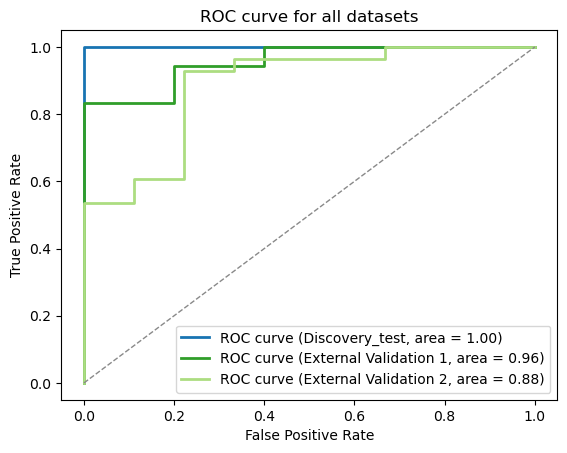

In [19]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 初始化画布
plt.figure()

# 数据集1
fpr1, tpr1, _ = roc_curve(Y_val, catboost_model.predict_proba(X_val)[:,1])
roc_auc1 = auc(fpr1, tpr1)
plt.plot(fpr1, tpr1, color='#1874B2', lw=2, label='ROC curve (Discovery_test, area = %0.2f)' % roc_auc1)

# 数据集2
fpr2, tpr2, _ = roc_curve(Y_V2, catboost_model.predict_proba(X_V2)[:,1])
roc_auc2 = auc(fpr2, tpr2)
plt.plot(fpr2, tpr2, color='#309E29', lw=2, label='ROC curve (External Validation 1, area = %0.2f)' % roc_auc2)

# 数据集3
fpr3, tpr3, _ = roc_curve(Y_V3, catboost_model.predict_proba(X_V3)[:,1])
roc_auc3 = auc(fpr3, tpr3)
plt.plot(fpr3, tpr3, color='#ACDD81', lw=2, label='ROC curve (External Validation 2, area = %0.2f)' % roc_auc3)

# 对角线
plt.plot([0, 1], [0, 1], color='#898989', lw=1, linestyle='--')

# 设置坐标轴范围和标签等
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for all datasets')
plt.legend(loc="lower right")

# 显示图形
plt.savefig("0528_ROC.pdf")
plt.savefig("0528_ROC.jpg", dpi=600, format='jpg')
plt.show()

In [10]:
# PRC

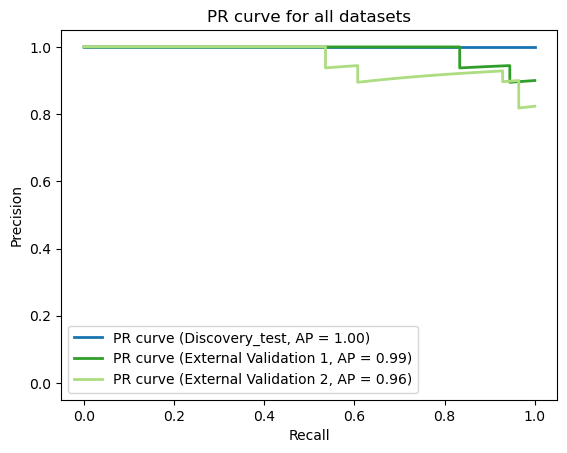

In [20]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

# 初始化画布
plt.figure()

# 数据集1
precision1, recall1, _ = precision_recall_curve(Y_val, catboost_model.predict_proba(X_val)[:,1])
ap1 = average_precision_score(Y_val, catboost_model.predict_proba(X_val)[:,1])
plt.plot(recall1, precision1, color='#1874B2', lw=2, label='PR curve (Discovery_test, AP = %0.2f)' % ap1)

# 数据集2
precision2, recall2, _ = precision_recall_curve(Y_V2, catboost_model.predict_proba(X_V2)[:,1])
ap2 = average_precision_score(Y_V2, catboost_model.predict_proba(X_V2)[:,1])
plt.plot(recall2, precision2, color='#309E29', lw=2, label='PR curve (External Validation 1, AP = %0.2f)' % ap2)

# 数据集3
precision3, recall3, _ = precision_recall_curve(Y_V3, catboost_model.predict_proba(X_V3)[:,1])
ap3 = average_precision_score(Y_V3, catboost_model.predict_proba(X_V3)[:,1])
plt.plot(recall3, precision3, color='#ACDD81', lw=2, label='PR curve (External Validation 2, AP = %0.2f)' % ap3)

# 设置坐标轴范围和标签等
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR curve for all datasets')
plt.legend(loc="lower left")

# 显示图形
plt.savefig("0528_PRC.pdf")
plt.savefig("0528_PRC.jpg", dpi=600, format='jpg')
plt.show()


In [12]:
from sklearn.metrics import confusion_matrix
from scipy.stats import norm

def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn+fp)
    return specificity

def npv_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn+fn)
    return npv

def confidence_interval(p, n, z=1.96):  # default value for z is set to calculate a 95% CI
    center = p
    radius = z * ((p*(1-p)/n)**0.5)
    return (max(0, center - radius), min(1, center + radius))

In [13]:
# 创建空的结果列表
results = []

# 设置循环运行100次
for i in range(100):
    # 设置随机数种子
    seed = i  # 使用循环变量i作为种子值
    np.random.seed(seed)

    # 分割数据集
    X_train_val, X_test, Y_train_val, Y_test = train_test_split(X, Y, test_size=0.10, random_state=seed, shuffle=True, stratify=Y)
    X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, test_size=0.1111, random_state=seed, shuffle=True, stratify=Y_train_val)
    # 初始化 CatBoostClassifier 模型
    catboost_model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=8, random_seed=seed)

    # 在训练集上训练 CatBoostClassifier 模型
    catboost_model.fit(X_train, Y_train)

    # 在验证集上进行预测并计算指标
    Y_val_pred_catboost = catboost_model.predict(X_val)
    accuracy_val_catboost = accuracy_score(Y_val, Y_val_pred_catboost)
    precision_val_catboost = precision_score(Y_val, Y_val_pred_catboost)
    recall_val_catboost = recall_score(Y_val, Y_val_pred_catboost)
    f1_val_catboost = f1_score(Y_val, Y_val_pred_catboost)
    roc_auc_val_catboost = roc_auc_score(Y_val, Y_val_pred_catboost)
    specificity_val_catboost = specificity_score(Y_val, Y_val_pred_catboost)
    npv_val_catboost = npv_score(Y_val, Y_val_pred_catboost)
    Y_val_score_catboost = catboost_model.predict_proba(X_val)[:, 1]
    pr_auc_val_catboost = average_precision_score(Y_val, Y_val_score_catboost)

    # 在外部验证集2上进行预测并计算指标
    Y_V2_pred_catboost = catboost_model.predict(X_V2)
    accuracy_V2_catboost = accuracy_score(Y_V2, Y_V2_pred_catboost)
    precision_V2_catboost = precision_score(Y_V2, Y_V2_pred_catboost)
    recall_V2_catboost = recall_score(Y_V2, Y_V2_pred_catboost)
    f1_V2_catboost = f1_score(Y_V2, Y_V2_pred_catboost)
    roc_auc_V2_catboost = roc_auc_score(Y_V2, Y_V2_pred_catboost)
    specificity_V2_catboost = specificity_score(Y_V2, Y_V2_pred_catboost)
    npv_V2_catboost = npv_score(Y_V2, Y_V2_pred_catboost)
    Y_V2_score_catboost = catboost_model.predict_proba(X_V2)[:, 1]
    pr_auc_V2_catboost = average_precision_score(Y_V2, Y_V2_score_catboost)
    
    
    # 在外部验证集3上进行预测并计算指标
    Y_V3_pred_catboost = catboost_model.predict(X_V3)
    accuracy_V3_catboost = accuracy_score(Y_V3, Y_V3_pred_catboost)
    precision_V3_catboost = precision_score(Y_V3, Y_V3_pred_catboost)
    recall_V3_catboost = recall_score(Y_V3, Y_V3_pred_catboost)
    f1_V3_catboost = f1_score(Y_V3, Y_V3_pred_catboost)
    roc_auc_V3_catboost = roc_auc_score(Y_V3, Y_V3_pred_catboost)
    specificity_V3_catboost = specificity_score(Y_V3, Y_V3_pred_catboost)
    npv_V3_catboost = npv_score(Y_V3, Y_V3_pred_catboost)
    Y_V3_score_catboost = catboost_model.predict_proba(X_V3)[:, 1]
    pr_auc_V3_catboost = average_precision_score(Y_V3, Y_V3_score_catboost)

    # 将结果添加到结果列表中
    results.append({
        'Seed': seed,
        'Accuracy_Val': accuracy_val_catboost,
        'Precision_Val': precision_val_catboost,
        'Recall_Val': recall_val_catboost,
        'F1_Score_Val': f1_val_catboost,
        'ROC_AUC_Val': roc_auc_val_catboost,
        'Accuracy_V2': accuracy_V2_catboost,
        'Precision_V2': precision_V2_catboost,
        'Recall_V2': recall_V2_catboost,
        'F1_Score_V2': f1_V2_catboost,
        'ROC_AUC_V2': roc_auc_V2_catboost,
        'Accuracy_V3': accuracy_V3_catboost,
        'Precision_V3': precision_V3_catboost,
        'Recall_V3': recall_V3_catboost,
        'F1_Score_V3': f1_V3_catboost,
        'ROC_AUC_V3': roc_auc_V3_catboost,
        'Specificity_Val': specificity_val_catboost,
        'NPV_Val': npv_val_catboost,
        'Specificity_V2': specificity_V2_catboost,
        'NPV_V2': npv_V2_catboost,
        'Specificity_V3': specificity_V3_catboost,
        'NPV_V3': npv_V3_catboost,
        'PR_AUC_Val': pr_auc_val_catboost,
        'PR_AUC_V2': pr_auc_V2_catboost,
        'PR_AUC_V3': pr_auc_V3_catboost
    })

# 创建DataFrame
results_df = pd.DataFrame(results)

n_val = len(X_val)
n_v2 = len(X_V2)
n_v3 = len(X_V3)


# 计算评估指标的均值和标准差
evaluation_metrics = ['Accuracy', 'Precision', 'Recall', 'F1_Score', 'ROC_AUC', 'Specificity', 'NPV','PR_AUC']
for metric in evaluation_metrics:
    results_df[f'{metric}_Val_CI'] = results_df[f'{metric}_Val'].apply(lambda x: confidence_interval(x, n_val))
    results_df[f'{metric}_V2_CI'] = results_df[f'{metric}_V2'].apply(lambda x: confidence_interval(x, n_v2))
    results_df[f'{metric}_V3_CI'] = results_df[f'{metric}_V3'].apply(lambda x: confidence_interval(x, n_v3))
    

for index, row in results_df.iterrows():
    print(f'Seed {row["Seed"]}:')
    for metric in evaluation_metrics:
        print(f'Val {metric} = {row[f"{metric}_Val"]*100}% [{row[f"{metric}_Val_CI"][0]*100}-{row[f"{metric}_Val_CI"][1]*100}%]')
        print(f'V2 {metric} = {row[f"{metric}_V2"]*100}% [{row[f"{metric}_V2_CI"][0]*100}-{row[f"{metric}_V2_CI"][1]*100}%]')
        print(f'V3 {metric} = {row[f"{metric}_V3"]*100}% [{row[f"{metric}_V3_CI"][0]*100}-{row[f"{metric}_V3_CI"][1]*100}%]')


    
# 导出为CSV文件
results_df.to_csv('0601_results_with_confidence_intervals.csv', index=False)

0:	learn: 0.5916104	total: 4.34ms	remaining: 4.34s
1:	learn: 0.4929903	total: 6.91ms	remaining: 3.45s
2:	learn: 0.4083424	total: 9.17ms	remaining: 3.05s
3:	learn: 0.3407557	total: 11.2ms	remaining: 2.78s
4:	learn: 0.2985604	total: 13.1ms	remaining: 2.61s
5:	learn: 0.2552185	total: 15.4ms	remaining: 2.55s
6:	learn: 0.2201278	total: 17.5ms	remaining: 2.48s
7:	learn: 0.1887406	total: 21.2ms	remaining: 2.63s
8:	learn: 0.1636790	total: 23.3ms	remaining: 2.57s
9:	learn: 0.1425300	total: 25.4ms	remaining: 2.51s
10:	learn: 0.1276748	total: 27.3ms	remaining: 2.45s
11:	learn: 0.1160201	total: 29.2ms	remaining: 2.4s
12:	learn: 0.1060747	total: 31ms	remaining: 2.35s
13:	learn: 0.0949916	total: 32.9ms	remaining: 2.32s
14:	learn: 0.0851249	total: 34.8ms	remaining: 2.29s
15:	learn: 0.0785836	total: 36.7ms	remaining: 2.26s
16:	learn: 0.0747181	total: 38.6ms	remaining: 2.23s
17:	learn: 0.0691175	total: 40.5ms	remaining: 2.21s
18:	learn: 0.0648182	total: 42.2ms	remaining: 2.18s
19:	learn: 0.0611710	tota

162:	learn: 0.0038541	total: 384ms	remaining: 1.97s
163:	learn: 0.0038211	total: 386ms	remaining: 1.97s
164:	learn: 0.0037996	total: 388ms	remaining: 1.96s
165:	learn: 0.0037764	total: 396ms	remaining: 1.99s
166:	learn: 0.0037540	total: 398ms	remaining: 1.99s
167:	learn: 0.0037048	total: 400ms	remaining: 1.98s
168:	learn: 0.0036885	total: 403ms	remaining: 1.98s
169:	learn: 0.0036689	total: 409ms	remaining: 2s
170:	learn: 0.0036513	total: 412ms	remaining: 2s
171:	learn: 0.0036324	total: 418ms	remaining: 2.01s
172:	learn: 0.0036138	total: 429ms	remaining: 2.05s
173:	learn: 0.0035973	total: 432ms	remaining: 2.05s
174:	learn: 0.0035793	total: 434ms	remaining: 2.05s
175:	learn: 0.0035632	total: 437ms	remaining: 2.04s
176:	learn: 0.0035467	total: 452ms	remaining: 2.1s
177:	learn: 0.0035314	total: 456ms	remaining: 2.1s
178:	learn: 0.0035154	total: 468ms	remaining: 2.15s
179:	learn: 0.0034978	total: 474ms	remaining: 2.16s
180:	learn: 0.0034831	total: 478ms	remaining: 2.16s
181:	learn: 0.003467

340:	learn: 0.0018841	total: 1.14s	remaining: 2.21s
341:	learn: 0.0018802	total: 1.14s	remaining: 2.2s
342:	learn: 0.0018760	total: 1.15s	remaining: 2.2s
343:	learn: 0.0018698	total: 1.15s	remaining: 2.2s
344:	learn: 0.0018652	total: 1.16s	remaining: 2.2s
345:	learn: 0.0018603	total: 1.17s	remaining: 2.21s
346:	learn: 0.0018490	total: 1.18s	remaining: 2.22s
347:	learn: 0.0018447	total: 1.18s	remaining: 2.21s
348:	learn: 0.0018389	total: 1.18s	remaining: 2.21s
349:	learn: 0.0018331	total: 1.19s	remaining: 2.2s
350:	learn: 0.0018265	total: 1.19s	remaining: 2.2s
351:	learn: 0.0018217	total: 1.19s	remaining: 2.19s
352:	learn: 0.0018175	total: 1.19s	remaining: 2.19s
353:	learn: 0.0018129	total: 1.2s	remaining: 2.19s
354:	learn: 0.0018076	total: 1.21s	remaining: 2.19s
355:	learn: 0.0018027	total: 1.21s	remaining: 2.18s
356:	learn: 0.0017981	total: 1.21s	remaining: 2.18s
357:	learn: 0.0017944	total: 1.22s	remaining: 2.18s
358:	learn: 0.0017902	total: 1.22s	remaining: 2.17s
359:	learn: 0.00178

525:	learn: 0.0014518	total: 1.92s	remaining: 1.73s
526:	learn: 0.0014518	total: 1.92s	remaining: 1.72s
527:	learn: 0.0014518	total: 1.93s	remaining: 1.72s
528:	learn: 0.0014518	total: 1.93s	remaining: 1.72s
529:	learn: 0.0014518	total: 1.93s	remaining: 1.71s
530:	learn: 0.0014518	total: 1.94s	remaining: 1.71s
531:	learn: 0.0014518	total: 1.94s	remaining: 1.71s
532:	learn: 0.0014518	total: 1.94s	remaining: 1.7s
533:	learn: 0.0014518	total: 1.95s	remaining: 1.7s
534:	learn: 0.0014518	total: 1.95s	remaining: 1.7s
535:	learn: 0.0014518	total: 1.96s	remaining: 1.69s
536:	learn: 0.0014518	total: 1.96s	remaining: 1.69s
537:	learn: 0.0014518	total: 1.96s	remaining: 1.68s
538:	learn: 0.0014511	total: 1.96s	remaining: 1.68s
539:	learn: 0.0014483	total: 1.97s	remaining: 1.68s
540:	learn: 0.0014426	total: 1.97s	remaining: 1.67s
541:	learn: 0.0014378	total: 1.98s	remaining: 1.67s
542:	learn: 0.0014369	total: 1.98s	remaining: 1.67s
543:	learn: 0.0014352	total: 1.98s	remaining: 1.66s
544:	learn: 0.0

746:	learn: 0.0012500	total: 2.67s	remaining: 906ms
747:	learn: 0.0012500	total: 2.68s	remaining: 902ms
748:	learn: 0.0012481	total: 2.68s	remaining: 898ms
749:	learn: 0.0012480	total: 2.68s	remaining: 894ms
750:	learn: 0.0012463	total: 2.69s	remaining: 891ms
751:	learn: 0.0012463	total: 2.7s	remaining: 889ms
752:	learn: 0.0012463	total: 2.7s	remaining: 885ms
753:	learn: 0.0012463	total: 2.7s	remaining: 881ms
754:	learn: 0.0012462	total: 2.7s	remaining: 878ms
755:	learn: 0.0012461	total: 2.71s	remaining: 874ms
756:	learn: 0.0012444	total: 2.71s	remaining: 870ms
757:	learn: 0.0012444	total: 2.71s	remaining: 866ms
758:	learn: 0.0012443	total: 2.72s	remaining: 863ms
759:	learn: 0.0012442	total: 2.72s	remaining: 859ms
760:	learn: 0.0012442	total: 2.73s	remaining: 856ms
761:	learn: 0.0012442	total: 2.73s	remaining: 853ms
762:	learn: 0.0012441	total: 2.73s	remaining: 849ms
763:	learn: 0.0012430	total: 2.74s	remaining: 846ms
764:	learn: 0.0012429	total: 2.74s	remaining: 842ms
765:	learn: 0.00

933:	learn: 0.0011825	total: 3.23s	remaining: 228ms
934:	learn: 0.0011825	total: 3.24s	remaining: 225ms
935:	learn: 0.0011815	total: 3.24s	remaining: 222ms
936:	learn: 0.0011815	total: 3.24s	remaining: 218ms
937:	learn: 0.0011815	total: 3.24s	remaining: 214ms
938:	learn: 0.0011815	total: 3.25s	remaining: 211ms
939:	learn: 0.0011814	total: 3.25s	remaining: 207ms
940:	learn: 0.0011814	total: 3.25s	remaining: 204ms
941:	learn: 0.0011814	total: 3.25s	remaining: 200ms
942:	learn: 0.0011793	total: 3.26s	remaining: 197ms
943:	learn: 0.0011794	total: 3.26s	remaining: 193ms
944:	learn: 0.0011793	total: 3.26s	remaining: 190ms
945:	learn: 0.0011793	total: 3.27s	remaining: 186ms
946:	learn: 0.0011792	total: 3.27s	remaining: 183ms
947:	learn: 0.0011792	total: 3.27s	remaining: 179ms
948:	learn: 0.0011792	total: 3.27s	remaining: 176ms
949:	learn: 0.0011792	total: 3.27s	remaining: 172ms
950:	learn: 0.0011792	total: 3.28s	remaining: 169ms
951:	learn: 0.0011792	total: 3.28s	remaining: 165ms
952:	learn: 

184:	learn: 0.0031279	total: 388ms	remaining: 1.71s
185:	learn: 0.0031096	total: 390ms	remaining: 1.71s
186:	learn: 0.0030917	total: 392ms	remaining: 1.7s
187:	learn: 0.0030750	total: 394ms	remaining: 1.7s
188:	learn: 0.0030582	total: 396ms	remaining: 1.7s
189:	learn: 0.0030461	total: 398ms	remaining: 1.7s
190:	learn: 0.0030164	total: 400ms	remaining: 1.69s
191:	learn: 0.0029980	total: 402ms	remaining: 1.69s
192:	learn: 0.0029763	total: 404ms	remaining: 1.69s
193:	learn: 0.0029604	total: 406ms	remaining: 1.69s
194:	learn: 0.0029504	total: 408ms	remaining: 1.69s
195:	learn: 0.0029405	total: 411ms	remaining: 1.69s
196:	learn: 0.0029251	total: 413ms	remaining: 1.68s
197:	learn: 0.0029149	total: 415ms	remaining: 1.68s
198:	learn: 0.0029051	total: 418ms	remaining: 1.68s
199:	learn: 0.0028689	total: 420ms	remaining: 1.68s
200:	learn: 0.0028491	total: 421ms	remaining: 1.68s
201:	learn: 0.0028345	total: 423ms	remaining: 1.67s
202:	learn: 0.0028245	total: 426ms	remaining: 1.67s
203:	learn: 0.00

393:	learn: 0.0015331	total: 817ms	remaining: 1.25s
394:	learn: 0.0015299	total: 818ms	remaining: 1.25s
395:	learn: 0.0015256	total: 820ms	remaining: 1.25s
396:	learn: 0.0015218	total: 822ms	remaining: 1.25s
397:	learn: 0.0015185	total: 824ms	remaining: 1.25s
398:	learn: 0.0015161	total: 827ms	remaining: 1.25s
399:	learn: 0.0015132	total: 834ms	remaining: 1.25s
400:	learn: 0.0015131	total: 836ms	remaining: 1.25s
401:	learn: 0.0015106	total: 843ms	remaining: 1.25s
402:	learn: 0.0015079	total: 846ms	remaining: 1.25s
403:	learn: 0.0015057	total: 850ms	remaining: 1.25s
404:	learn: 0.0015034	total: 852ms	remaining: 1.25s
405:	learn: 0.0014983	total: 854ms	remaining: 1.25s
406:	learn: 0.0014943	total: 856ms	remaining: 1.25s
407:	learn: 0.0014938	total: 858ms	remaining: 1.24s
408:	learn: 0.0014929	total: 860ms	remaining: 1.24s
409:	learn: 0.0014928	total: 862ms	remaining: 1.24s
410:	learn: 0.0014895	total: 864ms	remaining: 1.24s
411:	learn: 0.0014869	total: 866ms	remaining: 1.24s
412:	learn: 

568:	learn: 0.0012839	total: 1.2s	remaining: 910ms
569:	learn: 0.0012839	total: 1.2s	remaining: 908ms
570:	learn: 0.0012814	total: 1.21s	remaining: 907ms
571:	learn: 0.0012814	total: 1.21s	remaining: 904ms
572:	learn: 0.0012797	total: 1.21s	remaining: 903ms
573:	learn: 0.0012796	total: 1.21s	remaining: 900ms
574:	learn: 0.0012774	total: 1.22s	remaining: 898ms
575:	learn: 0.0012773	total: 1.22s	remaining: 896ms
576:	learn: 0.0012753	total: 1.22s	remaining: 894ms
577:	learn: 0.0012732	total: 1.22s	remaining: 892ms
578:	learn: 0.0012707	total: 1.22s	remaining: 889ms
579:	learn: 0.0012706	total: 1.23s	remaining: 887ms
580:	learn: 0.0012688	total: 1.23s	remaining: 886ms
581:	learn: 0.0012688	total: 1.23s	remaining: 883ms
582:	learn: 0.0012688	total: 1.23s	remaining: 881ms
583:	learn: 0.0012659	total: 1.23s	remaining: 879ms
584:	learn: 0.0012660	total: 1.24s	remaining: 876ms
585:	learn: 0.0012641	total: 1.24s	remaining: 874ms
586:	learn: 0.0012615	total: 1.24s	remaining: 873ms
587:	learn: 0.

746:	learn: 0.0011702	total: 1.57s	remaining: 534ms
747:	learn: 0.0011688	total: 1.58s	remaining: 531ms
748:	learn: 0.0011687	total: 1.58s	remaining: 529ms
749:	learn: 0.0011675	total: 1.58s	remaining: 527ms
750:	learn: 0.0011675	total: 1.58s	remaining: 525ms
751:	learn: 0.0011675	total: 1.58s	remaining: 523ms
752:	learn: 0.0011673	total: 1.59s	remaining: 520ms
753:	learn: 0.0011672	total: 1.59s	remaining: 518ms
754:	learn: 0.0011651	total: 1.59s	remaining: 516ms
755:	learn: 0.0011650	total: 1.59s	remaining: 514ms
756:	learn: 0.0011629	total: 1.59s	remaining: 512ms
757:	learn: 0.0011609	total: 1.6s	remaining: 510ms
758:	learn: 0.0011609	total: 1.6s	remaining: 507ms
759:	learn: 0.0011608	total: 1.6s	remaining: 505ms
760:	learn: 0.0011594	total: 1.6s	remaining: 503ms
761:	learn: 0.0011595	total: 1.6s	remaining: 501ms
762:	learn: 0.0011560	total: 1.6s	remaining: 499ms
763:	learn: 0.0011560	total: 1.61s	remaining: 496ms
764:	learn: 0.0011561	total: 1.61s	remaining: 494ms
765:	learn: 0.0011

987:	learn: 0.0010684	total: 2.15s	remaining: 26.1ms
988:	learn: 0.0010684	total: 2.16s	remaining: 24ms
989:	learn: 0.0010666	total: 2.16s	remaining: 21.8ms
990:	learn: 0.0010649	total: 2.16s	remaining: 19.6ms
991:	learn: 0.0010649	total: 2.16s	remaining: 17.5ms
992:	learn: 0.0010649	total: 2.17s	remaining: 15.3ms
993:	learn: 0.0010649	total: 2.17s	remaining: 13.1ms
994:	learn: 0.0010649	total: 2.17s	remaining: 10.9ms
995:	learn: 0.0010648	total: 2.17s	remaining: 8.72ms
996:	learn: 0.0010645	total: 2.17s	remaining: 6.54ms
997:	learn: 0.0010645	total: 2.18s	remaining: 4.36ms
998:	learn: 0.0010645	total: 2.18s	remaining: 2.18ms
999:	learn: 0.0010645	total: 2.18s	remaining: 0us
0:	learn: 0.5702868	total: 21.7ms	remaining: 21.6s
1:	learn: 0.4907230	total: 34ms	remaining: 17s
2:	learn: 0.4067614	total: 45.1ms	remaining: 15s
3:	learn: 0.3432611	total: 54.8ms	remaining: 13.6s
4:	learn: 0.2926006	total: 57.8ms	remaining: 11.5s
5:	learn: 0.2562459	total: 78.2ms	remaining: 13s
6:	learn: 0.216274

195:	learn: 0.0030276	total: 791ms	remaining: 3.25s
196:	learn: 0.0030109	total: 794ms	remaining: 3.23s
197:	learn: 0.0029940	total: 796ms	remaining: 3.22s
198:	learn: 0.0029747	total: 798ms	remaining: 3.21s
199:	learn: 0.0029600	total: 800ms	remaining: 3.2s
200:	learn: 0.0029452	total: 802ms	remaining: 3.19s
201:	learn: 0.0029294	total: 804ms	remaining: 3.18s
202:	learn: 0.0029146	total: 807ms	remaining: 3.17s
203:	learn: 0.0029040	total: 809ms	remaining: 3.16s
204:	learn: 0.0028876	total: 811ms	remaining: 3.15s
205:	learn: 0.0028726	total: 814ms	remaining: 3.13s
206:	learn: 0.0028569	total: 815ms	remaining: 3.12s
207:	learn: 0.0028418	total: 817ms	remaining: 3.11s
208:	learn: 0.0028286	total: 819ms	remaining: 3.1s
209:	learn: 0.0028152	total: 821ms	remaining: 3.09s
210:	learn: 0.0028001	total: 823ms	remaining: 3.08s
211:	learn: 0.0027853	total: 825ms	remaining: 3.07s
212:	learn: 0.0027718	total: 827ms	remaining: 3.06s
213:	learn: 0.0027583	total: 829ms	remaining: 3.04s
214:	learn: 0.

429:	learn: 0.0014437	total: 1.35s	remaining: 1.79s
430:	learn: 0.0014403	total: 1.36s	remaining: 1.79s
431:	learn: 0.0014403	total: 1.36s	remaining: 1.79s
432:	learn: 0.0014402	total: 1.36s	remaining: 1.78s
433:	learn: 0.0014387	total: 1.36s	remaining: 1.78s
434:	learn: 0.0014387	total: 1.36s	remaining: 1.77s
435:	learn: 0.0014387	total: 1.37s	remaining: 1.77s
436:	learn: 0.0014351	total: 1.37s	remaining: 1.76s
437:	learn: 0.0014351	total: 1.37s	remaining: 1.76s
438:	learn: 0.0014351	total: 1.37s	remaining: 1.75s
439:	learn: 0.0014351	total: 1.38s	remaining: 1.75s
440:	learn: 0.0014351	total: 1.38s	remaining: 1.75s
441:	learn: 0.0014350	total: 1.38s	remaining: 1.74s
442:	learn: 0.0014321	total: 1.38s	remaining: 1.74s
443:	learn: 0.0014310	total: 1.38s	remaining: 1.73s
444:	learn: 0.0014284	total: 1.39s	remaining: 1.73s
445:	learn: 0.0014285	total: 1.39s	remaining: 1.72s
446:	learn: 0.0014284	total: 1.39s	remaining: 1.72s
447:	learn: 0.0014270	total: 1.39s	remaining: 1.71s
448:	learn: 

616:	learn: 0.0012555	total: 1.74s	remaining: 1.08s
617:	learn: 0.0012533	total: 1.74s	remaining: 1.08s
618:	learn: 0.0012534	total: 1.74s	remaining: 1.07s
619:	learn: 0.0012534	total: 1.74s	remaining: 1.07s
620:	learn: 0.0012513	total: 1.75s	remaining: 1.07s
621:	learn: 0.0012490	total: 1.75s	remaining: 1.06s
622:	learn: 0.0012472	total: 1.75s	remaining: 1.06s
623:	learn: 0.0012445	total: 1.75s	remaining: 1.06s
624:	learn: 0.0012445	total: 1.75s	remaining: 1.05s
625:	learn: 0.0012445	total: 1.76s	remaining: 1.05s
626:	learn: 0.0012444	total: 1.76s	remaining: 1.04s
627:	learn: 0.0012442	total: 1.76s	remaining: 1.04s
628:	learn: 0.0012442	total: 1.76s	remaining: 1.04s
629:	learn: 0.0012440	total: 1.76s	remaining: 1.03s
630:	learn: 0.0012441	total: 1.76s	remaining: 1.03s
631:	learn: 0.0012441	total: 1.77s	remaining: 1.03s
632:	learn: 0.0012420	total: 1.77s	remaining: 1.02s
633:	learn: 0.0012419	total: 1.77s	remaining: 1.02s
634:	learn: 0.0012420	total: 1.77s	remaining: 1.02s
635:	learn: 

855:	learn: 0.0011319	total: 2.31s	remaining: 390ms
856:	learn: 0.0011319	total: 2.32s	remaining: 388ms
857:	learn: 0.0011319	total: 2.33s	remaining: 385ms
858:	learn: 0.0011319	total: 2.33s	remaining: 382ms
859:	learn: 0.0011295	total: 2.33s	remaining: 379ms
860:	learn: 0.0011284	total: 2.33s	remaining: 377ms
861:	learn: 0.0011283	total: 2.33s	remaining: 374ms
862:	learn: 0.0011283	total: 2.33s	remaining: 371ms
863:	learn: 0.0011281	total: 2.34s	remaining: 368ms
864:	learn: 0.0011281	total: 2.34s	remaining: 365ms
865:	learn: 0.0011281	total: 2.34s	remaining: 362ms
866:	learn: 0.0011280	total: 2.34s	remaining: 360ms
867:	learn: 0.0011267	total: 2.35s	remaining: 357ms
868:	learn: 0.0011267	total: 2.35s	remaining: 354ms
869:	learn: 0.0011266	total: 2.35s	remaining: 351ms
870:	learn: 0.0011266	total: 2.35s	remaining: 348ms
871:	learn: 0.0011266	total: 2.35s	remaining: 345ms
872:	learn: 0.0011266	total: 2.35s	remaining: 343ms
873:	learn: 0.0011266	total: 2.36s	remaining: 340ms
874:	learn: 

73:	learn: 0.0094787	total: 183ms	remaining: 2.29s
74:	learn: 0.0093360	total: 185ms	remaining: 2.28s
75:	learn: 0.0092164	total: 187ms	remaining: 2.28s
76:	learn: 0.0091037	total: 192ms	remaining: 2.3s
77:	learn: 0.0089831	total: 194ms	remaining: 2.29s
78:	learn: 0.0088649	total: 196ms	remaining: 2.28s
79:	learn: 0.0087393	total: 198ms	remaining: 2.27s
80:	learn: 0.0086156	total: 200ms	remaining: 2.26s
81:	learn: 0.0085032	total: 201ms	remaining: 2.25s
82:	learn: 0.0084126	total: 203ms	remaining: 2.25s
83:	learn: 0.0083142	total: 205ms	remaining: 2.24s
84:	learn: 0.0082254	total: 207ms	remaining: 2.23s
85:	learn: 0.0081240	total: 209ms	remaining: 2.22s
86:	learn: 0.0080154	total: 211ms	remaining: 2.21s
87:	learn: 0.0079150	total: 213ms	remaining: 2.21s
88:	learn: 0.0078251	total: 215ms	remaining: 2.2s
89:	learn: 0.0077456	total: 217ms	remaining: 2.19s
90:	learn: 0.0076706	total: 218ms	remaining: 2.18s
91:	learn: 0.0075895	total: 220ms	remaining: 2.17s
92:	learn: 0.0075156	total: 222ms

312:	learn: 0.0022467	total: 707ms	remaining: 1.55s
313:	learn: 0.0022385	total: 709ms	remaining: 1.55s
314:	learn: 0.0022324	total: 711ms	remaining: 1.54s
315:	learn: 0.0022265	total: 713ms	remaining: 1.54s
316:	learn: 0.0022186	total: 715ms	remaining: 1.54s
317:	learn: 0.0022132	total: 717ms	remaining: 1.54s
318:	learn: 0.0022068	total: 719ms	remaining: 1.53s
319:	learn: 0.0021998	total: 721ms	remaining: 1.53s
320:	learn: 0.0021927	total: 723ms	remaining: 1.53s
321:	learn: 0.0021864	total: 726ms	remaining: 1.53s
322:	learn: 0.0021797	total: 727ms	remaining: 1.52s
323:	learn: 0.0021734	total: 729ms	remaining: 1.52s
324:	learn: 0.0021664	total: 731ms	remaining: 1.52s
325:	learn: 0.0021591	total: 734ms	remaining: 1.52s
326:	learn: 0.0021518	total: 736ms	remaining: 1.51s
327:	learn: 0.0021449	total: 738ms	remaining: 1.51s
328:	learn: 0.0021394	total: 739ms	remaining: 1.51s
329:	learn: 0.0021331	total: 741ms	remaining: 1.5s
330:	learn: 0.0021268	total: 744ms	remaining: 1.5s
331:	learn: 0.

486:	learn: 0.0015654	total: 1.08s	remaining: 1.14s
487:	learn: 0.0015653	total: 1.08s	remaining: 1.13s
488:	learn: 0.0015652	total: 1.08s	remaining: 1.13s
489:	learn: 0.0015651	total: 1.09s	remaining: 1.13s
490:	learn: 0.0015622	total: 1.09s	remaining: 1.13s
491:	learn: 0.0015587	total: 1.09s	remaining: 1.13s
492:	learn: 0.0015541	total: 1.09s	remaining: 1.12s
493:	learn: 0.0015513	total: 1.09s	remaining: 1.12s
494:	learn: 0.0015512	total: 1.1s	remaining: 1.12s
495:	learn: 0.0015485	total: 1.1s	remaining: 1.12s
496:	learn: 0.0015446	total: 1.1s	remaining: 1.11s
497:	learn: 0.0015430	total: 1.1s	remaining: 1.11s
498:	learn: 0.0015412	total: 1.1s	remaining: 1.11s
499:	learn: 0.0015412	total: 1.11s	remaining: 1.11s
500:	learn: 0.0015398	total: 1.11s	remaining: 1.1s
501:	learn: 0.0015398	total: 1.11s	remaining: 1.1s
502:	learn: 0.0015386	total: 1.11s	remaining: 1.1s
503:	learn: 0.0015386	total: 1.11s	remaining: 1.1s
504:	learn: 0.0015363	total: 1.12s	remaining: 1.09s
505:	learn: 0.0015363

673:	learn: 0.0013410	total: 1.46s	remaining: 705ms
674:	learn: 0.0013383	total: 1.46s	remaining: 702ms
675:	learn: 0.0013383	total: 1.46s	remaining: 700ms
676:	learn: 0.0013382	total: 1.46s	remaining: 698ms
677:	learn: 0.0013361	total: 1.47s	remaining: 696ms
678:	learn: 0.0013361	total: 1.47s	remaining: 693ms
679:	learn: 0.0013337	total: 1.47s	remaining: 691ms
680:	learn: 0.0013326	total: 1.47s	remaining: 689ms
681:	learn: 0.0013315	total: 1.47s	remaining: 687ms
682:	learn: 0.0013293	total: 1.47s	remaining: 684ms
683:	learn: 0.0013257	total: 1.48s	remaining: 682ms
684:	learn: 0.0013256	total: 1.48s	remaining: 680ms
685:	learn: 0.0013247	total: 1.48s	remaining: 677ms
686:	learn: 0.0013224	total: 1.48s	remaining: 675ms
687:	learn: 0.0013198	total: 1.48s	remaining: 673ms
688:	learn: 0.0013198	total: 1.49s	remaining: 670ms
689:	learn: 0.0013198	total: 1.49s	remaining: 668ms
690:	learn: 0.0013191	total: 1.49s	remaining: 666ms
691:	learn: 0.0013171	total: 1.49s	remaining: 664ms
692:	learn: 

833:	learn: 0.0012389	total: 1.84s	remaining: 366ms
834:	learn: 0.0012388	total: 1.84s	remaining: 364ms
835:	learn: 0.0012375	total: 1.85s	remaining: 363ms
836:	learn: 0.0012363	total: 1.85s	remaining: 361ms
837:	learn: 0.0012363	total: 1.85s	remaining: 359ms
838:	learn: 0.0012349	total: 1.86s	remaining: 356ms
839:	learn: 0.0012349	total: 1.86s	remaining: 354ms
840:	learn: 0.0012331	total: 1.86s	remaining: 352ms
841:	learn: 0.0012331	total: 1.86s	remaining: 350ms
842:	learn: 0.0012315	total: 1.87s	remaining: 348ms
843:	learn: 0.0012301	total: 1.87s	remaining: 345ms
844:	learn: 0.0012293	total: 1.87s	remaining: 343ms
845:	learn: 0.0012279	total: 1.87s	remaining: 341ms
846:	learn: 0.0012279	total: 1.87s	remaining: 339ms
847:	learn: 0.0012278	total: 1.88s	remaining: 336ms
848:	learn: 0.0012278	total: 1.88s	remaining: 334ms
849:	learn: 0.0012279	total: 1.88s	remaining: 332ms
850:	learn: 0.0012279	total: 1.88s	remaining: 329ms
851:	learn: 0.0012278	total: 1.88s	remaining: 327ms
852:	learn: 

0:	learn: 0.5524978	total: 6.75ms	remaining: 6.74s
1:	learn: 0.4466365	total: 11ms	remaining: 5.48s
2:	learn: 0.3852296	total: 14.5ms	remaining: 4.82s
3:	learn: 0.3395126	total: 18ms	remaining: 4.49s
4:	learn: 0.3032099	total: 28.2ms	remaining: 5.62s
5:	learn: 0.2582874	total: 31.9ms	remaining: 5.28s
6:	learn: 0.2284363	total: 40ms	remaining: 5.67s
7:	learn: 0.1996740	total: 45.5ms	remaining: 5.64s
8:	learn: 0.1772159	total: 48.5ms	remaining: 5.34s
9:	learn: 0.1628522	total: 51.1ms	remaining: 5.06s
10:	learn: 0.1420948	total: 53.7ms	remaining: 4.83s
11:	learn: 0.1283869	total: 56.5ms	remaining: 4.65s
12:	learn: 0.1101336	total: 59ms	remaining: 4.48s
13:	learn: 0.0987706	total: 61.9ms	remaining: 4.36s
14:	learn: 0.0889618	total: 64.7ms	remaining: 4.25s
15:	learn: 0.0794196	total: 67.5ms	remaining: 4.15s
16:	learn: 0.0739532	total: 71ms	remaining: 4.1s
17:	learn: 0.0684343	total: 73.7ms	remaining: 4.02s
18:	learn: 0.0637564	total: 76.4ms	remaining: 3.95s
19:	learn: 0.0593835	total: 80.2m

215:	learn: 0.0029371	total: 567ms	remaining: 2.06s
216:	learn: 0.0029242	total: 569ms	remaining: 2.05s
217:	learn: 0.0029107	total: 571ms	remaining: 2.05s
218:	learn: 0.0028978	total: 574ms	remaining: 2.05s
219:	learn: 0.0028860	total: 576ms	remaining: 2.04s
220:	learn: 0.0028688	total: 579ms	remaining: 2.04s
221:	learn: 0.0028577	total: 582ms	remaining: 2.04s
222:	learn: 0.0028468	total: 584ms	remaining: 2.03s
223:	learn: 0.0028346	total: 586ms	remaining: 2.03s
224:	learn: 0.0028242	total: 588ms	remaining: 2.03s
225:	learn: 0.0028059	total: 590ms	remaining: 2.02s
226:	learn: 0.0027906	total: 593ms	remaining: 2.02s
227:	learn: 0.0027789	total: 595ms	remaining: 2.01s
228:	learn: 0.0027644	total: 597ms	remaining: 2.01s
229:	learn: 0.0027493	total: 599ms	remaining: 2s
230:	learn: 0.0027364	total: 601ms	remaining: 2s
231:	learn: 0.0027213	total: 603ms	remaining: 2s
232:	learn: 0.0027099	total: 605ms	remaining: 1.99s
233:	learn: 0.0026994	total: 608ms	remaining: 1.99s
234:	learn: 0.0026897

459:	learn: 0.0015368	total: 1.13s	remaining: 1.32s
460:	learn: 0.0015347	total: 1.13s	remaining: 1.32s
461:	learn: 0.0015314	total: 1.13s	remaining: 1.32s
462:	learn: 0.0015277	total: 1.14s	remaining: 1.32s
463:	learn: 0.0015262	total: 1.14s	remaining: 1.31s
464:	learn: 0.0015231	total: 1.14s	remaining: 1.31s
465:	learn: 0.0015229	total: 1.14s	remaining: 1.31s
466:	learn: 0.0015216	total: 1.14s	remaining: 1.3s
467:	learn: 0.0015216	total: 1.15s	remaining: 1.3s
468:	learn: 0.0015201	total: 1.15s	remaining: 1.3s
469:	learn: 0.0015170	total: 1.15s	remaining: 1.29s
470:	learn: 0.0015138	total: 1.15s	remaining: 1.29s
471:	learn: 0.0015138	total: 1.16s	remaining: 1.29s
472:	learn: 0.0015138	total: 1.16s	remaining: 1.29s
473:	learn: 0.0015136	total: 1.16s	remaining: 1.29s
474:	learn: 0.0015118	total: 1.16s	remaining: 1.28s
475:	learn: 0.0015093	total: 1.16s	remaining: 1.28s
476:	learn: 0.0015074	total: 1.17s	remaining: 1.28s
477:	learn: 0.0015043	total: 1.17s	remaining: 1.28s
478:	learn: 0.0

639:	learn: 0.0013353	total: 1.51s	remaining: 847ms
640:	learn: 0.0013353	total: 1.51s	remaining: 845ms
641:	learn: 0.0013352	total: 1.51s	remaining: 842ms
642:	learn: 0.0013325	total: 1.51s	remaining: 839ms
643:	learn: 0.0013324	total: 1.52s	remaining: 842ms
644:	learn: 0.0013305	total: 1.53s	remaining: 840ms
645:	learn: 0.0013282	total: 1.53s	remaining: 838ms
646:	learn: 0.0013280	total: 1.53s	remaining: 835ms
647:	learn: 0.0013262	total: 1.53s	remaining: 833ms
648:	learn: 0.0013238	total: 1.53s	remaining: 830ms
649:	learn: 0.0013202	total: 1.54s	remaining: 828ms
650:	learn: 0.0013199	total: 1.54s	remaining: 825ms
651:	learn: 0.0013178	total: 1.54s	remaining: 822ms
652:	learn: 0.0013146	total: 1.54s	remaining: 820ms
653:	learn: 0.0013146	total: 1.54s	remaining: 818ms
654:	learn: 0.0013139	total: 1.55s	remaining: 815ms
655:	learn: 0.0013138	total: 1.55s	remaining: 812ms
656:	learn: 0.0013138	total: 1.55s	remaining: 810ms
657:	learn: 0.0013124	total: 1.55s	remaining: 807ms
658:	learn: 

813:	learn: 0.0012038	total: 1.89s	remaining: 431ms
814:	learn: 0.0012036	total: 1.89s	remaining: 429ms
815:	learn: 0.0012032	total: 1.89s	remaining: 426ms
816:	learn: 0.0012027	total: 1.89s	remaining: 424ms
817:	learn: 0.0012007	total: 1.9s	remaining: 422ms
818:	learn: 0.0012007	total: 1.9s	remaining: 420ms
819:	learn: 0.0012007	total: 1.9s	remaining: 417ms
820:	learn: 0.0011989	total: 1.9s	remaining: 415ms
821:	learn: 0.0011989	total: 1.91s	remaining: 413ms
822:	learn: 0.0011973	total: 1.91s	remaining: 410ms
823:	learn: 0.0011974	total: 1.91s	remaining: 408ms
824:	learn: 0.0011970	total: 1.91s	remaining: 406ms
825:	learn: 0.0011969	total: 1.91s	remaining: 403ms
826:	learn: 0.0011946	total: 1.92s	remaining: 401ms
827:	learn: 0.0011946	total: 1.92s	remaining: 399ms
828:	learn: 0.0011945	total: 1.92s	remaining: 396ms
829:	learn: 0.0011945	total: 1.92s	remaining: 394ms
830:	learn: 0.0011935	total: 1.93s	remaining: 392ms
831:	learn: 0.0011934	total: 1.93s	remaining: 389ms
832:	learn: 0.00

0:	learn: 0.5901933	total: 3.87ms	remaining: 3.87s
1:	learn: 0.5037737	total: 5.96ms	remaining: 2.98s
2:	learn: 0.4236696	total: 8.6ms	remaining: 2.86s
3:	learn: 0.3699798	total: 19.7ms	remaining: 4.91s
4:	learn: 0.3208918	total: 22ms	remaining: 4.37s
5:	learn: 0.2823142	total: 24.4ms	remaining: 4.04s
6:	learn: 0.2386610	total: 26.4ms	remaining: 3.75s
7:	learn: 0.2111037	total: 28.6ms	remaining: 3.54s
8:	learn: 0.1833321	total: 31ms	remaining: 3.42s
9:	learn: 0.1656176	total: 33ms	remaining: 3.27s
10:	learn: 0.1470187	total: 35.9ms	remaining: 3.23s
11:	learn: 0.1333187	total: 40ms	remaining: 3.29s
12:	learn: 0.1185902	total: 43.7ms	remaining: 3.32s
13:	learn: 0.1092582	total: 46ms	remaining: 3.24s
14:	learn: 0.0976970	total: 48.3ms	remaining: 3.17s
15:	learn: 0.0892214	total: 50.8ms	remaining: 3.13s
16:	learn: 0.0837954	total: 54.3ms	remaining: 3.14s
17:	learn: 0.0796745	total: 56.6ms	remaining: 3.09s
18:	learn: 0.0739799	total: 58.6ms	remaining: 3.02s
19:	learn: 0.0695190	total: 60.6m

163:	learn: 0.0038751	total: 377ms	remaining: 1.92s
164:	learn: 0.0038517	total: 379ms	remaining: 1.92s
165:	learn: 0.0038319	total: 382ms	remaining: 1.92s
166:	learn: 0.0038132	total: 384ms	remaining: 1.92s
167:	learn: 0.0037954	total: 387ms	remaining: 1.92s
168:	learn: 0.0037768	total: 389ms	remaining: 1.91s
169:	learn: 0.0037589	total: 391ms	remaining: 1.91s
170:	learn: 0.0037337	total: 393ms	remaining: 1.91s
171:	learn: 0.0037121	total: 396ms	remaining: 1.91s
172:	learn: 0.0036920	total: 399ms	remaining: 1.91s
173:	learn: 0.0036742	total: 401ms	remaining: 1.9s
174:	learn: 0.0036544	total: 403ms	remaining: 1.9s
175:	learn: 0.0036392	total: 408ms	remaining: 1.91s
176:	learn: 0.0036220	total: 412ms	remaining: 1.92s
177:	learn: 0.0036052	total: 415ms	remaining: 1.92s
178:	learn: 0.0035888	total: 418ms	remaining: 1.92s
179:	learn: 0.0035665	total: 420ms	remaining: 1.91s
180:	learn: 0.0035491	total: 422ms	remaining: 1.91s
181:	learn: 0.0035287	total: 424ms	remaining: 1.9s
182:	learn: 0.0

375:	learn: 0.0017157	total: 948ms	remaining: 1.57s
376:	learn: 0.0017110	total: 950ms	remaining: 1.57s
377:	learn: 0.0017067	total: 952ms	remaining: 1.57s
378:	learn: 0.0017067	total: 954ms	remaining: 1.56s
379:	learn: 0.0017066	total: 957ms	remaining: 1.56s
380:	learn: 0.0017020	total: 959ms	remaining: 1.56s
381:	learn: 0.0016981	total: 961ms	remaining: 1.55s
382:	learn: 0.0016941	total: 963ms	remaining: 1.55s
383:	learn: 0.0016893	total: 966ms	remaining: 1.55s
384:	learn: 0.0016852	total: 968ms	remaining: 1.55s
385:	learn: 0.0016810	total: 970ms	remaining: 1.54s
386:	learn: 0.0016771	total: 973ms	remaining: 1.54s
387:	learn: 0.0016725	total: 975ms	remaining: 1.54s
388:	learn: 0.0016685	total: 977ms	remaining: 1.53s
389:	learn: 0.0016637	total: 979ms	remaining: 1.53s
390:	learn: 0.0016599	total: 981ms	remaining: 1.53s
391:	learn: 0.0016564	total: 983ms	remaining: 1.52s
392:	learn: 0.0016558	total: 985ms	remaining: 1.52s
393:	learn: 0.0016515	total: 987ms	remaining: 1.52s
394:	learn: 

572:	learn: 0.0012941	total: 1.91s	remaining: 1.42s
573:	learn: 0.0012914	total: 1.91s	remaining: 1.42s
574:	learn: 0.0012915	total: 1.92s	remaining: 1.42s
575:	learn: 0.0012889	total: 1.93s	remaining: 1.42s
576:	learn: 0.0012889	total: 1.93s	remaining: 1.42s
577:	learn: 0.0012889	total: 1.94s	remaining: 1.42s
578:	learn: 0.0012866	total: 1.94s	remaining: 1.41s
579:	learn: 0.0012841	total: 1.94s	remaining: 1.41s
580:	learn: 0.0012816	total: 1.95s	remaining: 1.4s
581:	learn: 0.0012791	total: 1.95s	remaining: 1.4s
582:	learn: 0.0012790	total: 1.95s	remaining: 1.39s
583:	learn: 0.0012770	total: 1.95s	remaining: 1.39s
584:	learn: 0.0012747	total: 1.95s	remaining: 1.39s
585:	learn: 0.0012733	total: 1.96s	remaining: 1.38s
586:	learn: 0.0012734	total: 1.96s	remaining: 1.38s
587:	learn: 0.0012703	total: 1.96s	remaining: 1.37s
588:	learn: 0.0012702	total: 1.96s	remaining: 1.37s
589:	learn: 0.0012691	total: 1.97s	remaining: 1.37s
590:	learn: 0.0012690	total: 1.97s	remaining: 1.36s
591:	learn: 0.

772:	learn: 0.0011645	total: 2.71s	remaining: 796ms
773:	learn: 0.0011644	total: 2.71s	remaining: 792ms
774:	learn: 0.0011629	total: 2.71s	remaining: 788ms
775:	learn: 0.0011629	total: 2.72s	remaining: 784ms
776:	learn: 0.0011629	total: 2.72s	remaining: 780ms
777:	learn: 0.0011618	total: 2.72s	remaining: 776ms
778:	learn: 0.0011617	total: 2.72s	remaining: 772ms
779:	learn: 0.0011617	total: 2.72s	remaining: 768ms
780:	learn: 0.0011617	total: 2.73s	remaining: 764ms
781:	learn: 0.0011617	total: 2.73s	remaining: 760ms
782:	learn: 0.0011617	total: 2.73s	remaining: 756ms
783:	learn: 0.0011617	total: 2.73s	remaining: 752ms
784:	learn: 0.0011607	total: 2.73s	remaining: 749ms
785:	learn: 0.0011607	total: 2.73s	remaining: 745ms
786:	learn: 0.0011607	total: 2.74s	remaining: 742ms
787:	learn: 0.0011607	total: 2.74s	remaining: 738ms
788:	learn: 0.0011607	total: 2.75s	remaining: 734ms
789:	learn: 0.0011607	total: 2.75s	remaining: 730ms
790:	learn: 0.0011607	total: 2.75s	remaining: 727ms
791:	learn: 

966:	learn: 0.0011038	total: 3.09s	remaining: 105ms
967:	learn: 0.0011029	total: 3.09s	remaining: 102ms
968:	learn: 0.0011029	total: 3.09s	remaining: 98.9ms
969:	learn: 0.0011029	total: 3.09s	remaining: 95.7ms
970:	learn: 0.0011028	total: 3.1s	remaining: 92.5ms
971:	learn: 0.0011028	total: 3.1s	remaining: 89.2ms
972:	learn: 0.0011028	total: 3.1s	remaining: 86ms
973:	learn: 0.0011023	total: 3.1s	remaining: 82.8ms
974:	learn: 0.0011023	total: 3.1s	remaining: 79.6ms
975:	learn: 0.0011023	total: 3.11s	remaining: 76.4ms
976:	learn: 0.0011022	total: 3.11s	remaining: 73.2ms
977:	learn: 0.0011022	total: 3.11s	remaining: 70ms
978:	learn: 0.0011021	total: 3.11s	remaining: 66.7ms
979:	learn: 0.0011021	total: 3.11s	remaining: 63.5ms
980:	learn: 0.0011021	total: 3.12s	remaining: 60.3ms
981:	learn: 0.0011021	total: 3.12s	remaining: 57.2ms
982:	learn: 0.0011022	total: 3.12s	remaining: 54ms
983:	learn: 0.0011020	total: 3.12s	remaining: 50.8ms
984:	learn: 0.0011020	total: 3.12s	remaining: 47.6ms
985:	l

135:	learn: 0.0038014	total: 392ms	remaining: 2.49s
136:	learn: 0.0037773	total: 394ms	remaining: 2.48s
137:	learn: 0.0037469	total: 396ms	remaining: 2.47s
138:	learn: 0.0037195	total: 397ms	remaining: 2.46s
139:	learn: 0.0036900	total: 400ms	remaining: 2.46s
140:	learn: 0.0036671	total: 414ms	remaining: 2.52s
141:	learn: 0.0036434	total: 417ms	remaining: 2.52s
142:	learn: 0.0036177	total: 427ms	remaining: 2.56s
143:	learn: 0.0035921	total: 431ms	remaining: 2.56s
144:	learn: 0.0035670	total: 434ms	remaining: 2.56s
145:	learn: 0.0035467	total: 436ms	remaining: 2.55s
146:	learn: 0.0035219	total: 439ms	remaining: 2.54s
147:	learn: 0.0034955	total: 441ms	remaining: 2.54s
148:	learn: 0.0034761	total: 443ms	remaining: 2.53s
149:	learn: 0.0034571	total: 453ms	remaining: 2.57s
150:	learn: 0.0034361	total: 457ms	remaining: 2.57s
151:	learn: 0.0034123	total: 459ms	remaining: 2.56s
152:	learn: 0.0033906	total: 461ms	remaining: 2.55s
153:	learn: 0.0033716	total: 463ms	remaining: 2.54s
154:	learn: 

382:	learn: 0.0017015	total: 965ms	remaining: 1.55s
383:	learn: 0.0017014	total: 967ms	remaining: 1.55s
384:	learn: 0.0017014	total: 969ms	remaining: 1.55s
385:	learn: 0.0016970	total: 970ms	remaining: 1.54s
386:	learn: 0.0016971	total: 972ms	remaining: 1.54s
387:	learn: 0.0016970	total: 974ms	remaining: 1.54s
388:	learn: 0.0016971	total: 976ms	remaining: 1.53s
389:	learn: 0.0016971	total: 978ms	remaining: 1.53s
390:	learn: 0.0016970	total: 980ms	remaining: 1.52s
391:	learn: 0.0016971	total: 982ms	remaining: 1.52s
392:	learn: 0.0016970	total: 984ms	remaining: 1.52s
393:	learn: 0.0016970	total: 986ms	remaining: 1.52s
394:	learn: 0.0016970	total: 988ms	remaining: 1.51s
395:	learn: 0.0016970	total: 990ms	remaining: 1.51s
396:	learn: 0.0016970	total: 992ms	remaining: 1.51s
397:	learn: 0.0016970	total: 995ms	remaining: 1.5s
398:	learn: 0.0016939	total: 998ms	remaining: 1.5s
399:	learn: 0.0016905	total: 1s	remaining: 1.5s
400:	learn: 0.0016868	total: 1s	remaining: 1.5s
401:	learn: 0.0016867	

564:	learn: 0.0015726	total: 1.35s	remaining: 1.04s
565:	learn: 0.0015726	total: 1.35s	remaining: 1.03s
566:	learn: 0.0015725	total: 1.35s	remaining: 1.03s
567:	learn: 0.0015689	total: 1.35s	remaining: 1.03s
568:	learn: 0.0015656	total: 1.36s	remaining: 1.03s
569:	learn: 0.0015650	total: 1.36s	remaining: 1.02s
570:	learn: 0.0015650	total: 1.36s	remaining: 1.02s
571:	learn: 0.0015649	total: 1.36s	remaining: 1.02s
572:	learn: 0.0015648	total: 1.36s	remaining: 1.02s
573:	learn: 0.0015648	total: 1.37s	remaining: 1.01s
574:	learn: 0.0015635	total: 1.37s	remaining: 1.01s
575:	learn: 0.0015608	total: 1.37s	remaining: 1.01s
576:	learn: 0.0015607	total: 1.37s	remaining: 1.01s
577:	learn: 0.0015607	total: 1.37s	remaining: 1s
578:	learn: 0.0015606	total: 1.38s	remaining: 1s
579:	learn: 0.0015576	total: 1.38s	remaining: 998ms
580:	learn: 0.0015575	total: 1.38s	remaining: 996ms
581:	learn: 0.0015575	total: 1.38s	remaining: 994ms
582:	learn: 0.0015576	total: 1.39s	remaining: 991ms
583:	learn: 0.0015

758:	learn: 0.0014542	total: 1.79s	remaining: 570ms
759:	learn: 0.0014542	total: 1.8s	remaining: 567ms
760:	learn: 0.0014542	total: 1.8s	remaining: 565ms
761:	learn: 0.0014542	total: 1.8s	remaining: 563ms
762:	learn: 0.0014541	total: 1.8s	remaining: 561ms
763:	learn: 0.0014542	total: 1.81s	remaining: 558ms
764:	learn: 0.0014542	total: 1.81s	remaining: 556ms
765:	learn: 0.0014541	total: 1.81s	remaining: 553ms
766:	learn: 0.0014542	total: 1.81s	remaining: 551ms
767:	learn: 0.0014540	total: 1.81s	remaining: 548ms
768:	learn: 0.0014540	total: 1.82s	remaining: 546ms
769:	learn: 0.0014520	total: 1.82s	remaining: 543ms
770:	learn: 0.0014519	total: 1.82s	remaining: 541ms
771:	learn: 0.0014492	total: 1.82s	remaining: 538ms
772:	learn: 0.0014491	total: 1.82s	remaining: 536ms
773:	learn: 0.0014490	total: 1.83s	remaining: 533ms
774:	learn: 0.0014489	total: 1.83s	remaining: 531ms
775:	learn: 0.0014485	total: 1.83s	remaining: 528ms
776:	learn: 0.0014484	total: 1.83s	remaining: 526ms
777:	learn: 0.00

919:	learn: 0.0013976	total: 2.18s	remaining: 189ms
920:	learn: 0.0013976	total: 2.18s	remaining: 187ms
921:	learn: 0.0013975	total: 2.18s	remaining: 185ms
922:	learn: 0.0013974	total: 2.19s	remaining: 182ms
923:	learn: 0.0013975	total: 2.19s	remaining: 180ms
924:	learn: 0.0013975	total: 2.19s	remaining: 178ms
925:	learn: 0.0013975	total: 2.2s	remaining: 176ms
926:	learn: 0.0013974	total: 2.2s	remaining: 174ms
927:	learn: 0.0013973	total: 2.21s	remaining: 171ms
928:	learn: 0.0013972	total: 2.21s	remaining: 169ms
929:	learn: 0.0013971	total: 2.21s	remaining: 167ms
930:	learn: 0.0013972	total: 2.22s	remaining: 164ms
931:	learn: 0.0013971	total: 2.22s	remaining: 162ms
932:	learn: 0.0013971	total: 2.22s	remaining: 159ms
933:	learn: 0.0013971	total: 2.22s	remaining: 157ms
934:	learn: 0.0013970	total: 2.22s	remaining: 155ms
935:	learn: 0.0013968	total: 2.23s	remaining: 152ms
936:	learn: 0.0013967	total: 2.23s	remaining: 150ms
937:	learn: 0.0013969	total: 2.23s	remaining: 148ms
938:	learn: 0.

123:	learn: 0.0053504	total: 396ms	remaining: 2.8s
124:	learn: 0.0053019	total: 398ms	remaining: 2.79s
125:	learn: 0.0052573	total: 400ms	remaining: 2.77s
126:	learn: 0.0052097	total: 402ms	remaining: 2.76s
127:	learn: 0.0051630	total: 404ms	remaining: 2.75s
128:	learn: 0.0051262	total: 407ms	remaining: 2.75s
129:	learn: 0.0050795	total: 408ms	remaining: 2.73s
130:	learn: 0.0050362	total: 411ms	remaining: 2.72s
131:	learn: 0.0049926	total: 414ms	remaining: 2.72s
132:	learn: 0.0049576	total: 418ms	remaining: 2.73s
133:	learn: 0.0049208	total: 425ms	remaining: 2.75s
134:	learn: 0.0048793	total: 427ms	remaining: 2.74s
135:	learn: 0.0048396	total: 430ms	remaining: 2.73s
136:	learn: 0.0048064	total: 433ms	remaining: 2.73s
137:	learn: 0.0047640	total: 435ms	remaining: 2.72s
138:	learn: 0.0047365	total: 439ms	remaining: 2.72s
139:	learn: 0.0047056	total: 441ms	remaining: 2.71s
140:	learn: 0.0046706	total: 444ms	remaining: 2.71s
141:	learn: 0.0046306	total: 446ms	remaining: 2.7s
142:	learn: 0.

293:	learn: 0.0022333	total: 969ms	remaining: 2.33s
294:	learn: 0.0022254	total: 972ms	remaining: 2.32s
295:	learn: 0.0022167	total: 974ms	remaining: 2.32s
296:	learn: 0.0022100	total: 984ms	remaining: 2.33s
297:	learn: 0.0021968	total: 986ms	remaining: 2.32s
298:	learn: 0.0021883	total: 989ms	remaining: 2.32s
299:	learn: 0.0021682	total: 990ms	remaining: 2.31s
300:	learn: 0.0021599	total: 998ms	remaining: 2.32s
301:	learn: 0.0021529	total: 1s	remaining: 2.31s
302:	learn: 0.0021458	total: 1s	remaining: 2.31s
303:	learn: 0.0021379	total: 1.01s	remaining: 2.3s
304:	learn: 0.0021256	total: 1.01s	remaining: 2.3s
305:	learn: 0.0021200	total: 1.01s	remaining: 2.29s
306:	learn: 0.0021066	total: 1.01s	remaining: 2.29s
307:	learn: 0.0020997	total: 1.01s	remaining: 2.28s
308:	learn: 0.0020921	total: 1.02s	remaining: 2.28s
309:	learn: 0.0020848	total: 1.02s	remaining: 2.28s
310:	learn: 0.0020801	total: 1.02s	remaining: 2.27s
311:	learn: 0.0020609	total: 1.02s	remaining: 2.26s
312:	learn: 0.002054

524:	learn: 0.0014604	total: 1.54s	remaining: 1.39s
525:	learn: 0.0014604	total: 1.54s	remaining: 1.39s
526:	learn: 0.0014604	total: 1.54s	remaining: 1.39s
527:	learn: 0.0014603	total: 1.55s	remaining: 1.38s
528:	learn: 0.0014603	total: 1.55s	remaining: 1.38s
529:	learn: 0.0014603	total: 1.55s	remaining: 1.37s
530:	learn: 0.0014602	total: 1.55s	remaining: 1.37s
531:	learn: 0.0014603	total: 1.55s	remaining: 1.37s
532:	learn: 0.0014603	total: 1.55s	remaining: 1.36s
533:	learn: 0.0014602	total: 1.56s	remaining: 1.36s
534:	learn: 0.0014591	total: 1.56s	remaining: 1.35s
535:	learn: 0.0014589	total: 1.56s	remaining: 1.35s
536:	learn: 0.0014589	total: 1.56s	remaining: 1.35s
537:	learn: 0.0014537	total: 1.56s	remaining: 1.34s
538:	learn: 0.0014501	total: 1.57s	remaining: 1.34s
539:	learn: 0.0014501	total: 1.57s	remaining: 1.34s
540:	learn: 0.0014474	total: 1.57s	remaining: 1.33s
541:	learn: 0.0014447	total: 1.57s	remaining: 1.33s
542:	learn: 0.0014447	total: 1.57s	remaining: 1.32s
543:	learn: 

705:	learn: 0.0013349	total: 1.92s	remaining: 800ms
706:	learn: 0.0013349	total: 1.93s	remaining: 799ms
707:	learn: 0.0013348	total: 1.93s	remaining: 797ms
708:	learn: 0.0013349	total: 1.94s	remaining: 798ms
709:	learn: 0.0013331	total: 1.95s	remaining: 795ms
710:	learn: 0.0013330	total: 1.95s	remaining: 792ms
711:	learn: 0.0013329	total: 1.95s	remaining: 789ms
712:	learn: 0.0013329	total: 1.95s	remaining: 787ms
713:	learn: 0.0013301	total: 1.96s	remaining: 784ms
714:	learn: 0.0013261	total: 1.96s	remaining: 781ms
715:	learn: 0.0013239	total: 1.97s	remaining: 781ms
716:	learn: 0.0013213	total: 1.97s	remaining: 778ms
717:	learn: 0.0013186	total: 1.98s	remaining: 776ms
718:	learn: 0.0013185	total: 1.98s	remaining: 774ms
719:	learn: 0.0013155	total: 1.99s	remaining: 773ms
720:	learn: 0.0013155	total: 1.99s	remaining: 770ms
721:	learn: 0.0013153	total: 1.99s	remaining: 768ms
722:	learn: 0.0013137	total: 2s	remaining: 767ms
723:	learn: 0.0013136	total: 2.01s	remaining: 765ms
724:	learn: 0.0

877:	learn: 0.0012210	total: 2.67s	remaining: 371ms
878:	learn: 0.0012209	total: 2.67s	remaining: 368ms
879:	learn: 0.0012209	total: 2.67s	remaining: 364ms
880:	learn: 0.0012194	total: 2.67s	remaining: 361ms
881:	learn: 0.0012170	total: 2.68s	remaining: 358ms
882:	learn: 0.0012171	total: 2.68s	remaining: 355ms
883:	learn: 0.0012170	total: 2.68s	remaining: 352ms
884:	learn: 0.0012170	total: 2.68s	remaining: 348ms
885:	learn: 0.0012170	total: 2.68s	remaining: 345ms
886:	learn: 0.0012168	total: 2.68s	remaining: 342ms
887:	learn: 0.0012164	total: 2.69s	remaining: 339ms
888:	learn: 0.0012152	total: 2.69s	remaining: 336ms
889:	learn: 0.0012126	total: 2.69s	remaining: 333ms
890:	learn: 0.0012125	total: 2.69s	remaining: 330ms
891:	learn: 0.0012126	total: 2.69s	remaining: 326ms
892:	learn: 0.0012086	total: 2.7s	remaining: 323ms
893:	learn: 0.0012079	total: 2.7s	remaining: 320ms
894:	learn: 0.0012057	total: 2.7s	remaining: 317ms
895:	learn: 0.0012056	total: 2.7s	remaining: 314ms
896:	learn: 0.00

73:	learn: 0.0087897	total: 333ms	remaining: 4.17s
74:	learn: 0.0086585	total: 335ms	remaining: 4.14s
75:	learn: 0.0085091	total: 341ms	remaining: 4.14s
76:	learn: 0.0083432	total: 348ms	remaining: 4.17s
77:	learn: 0.0081590	total: 362ms	remaining: 4.27s
78:	learn: 0.0079683	total: 365ms	remaining: 4.26s
79:	learn: 0.0078231	total: 368ms	remaining: 4.23s
80:	learn: 0.0076886	total: 371ms	remaining: 4.2s
81:	learn: 0.0075163	total: 374ms	remaining: 4.18s
82:	learn: 0.0073899	total: 376ms	remaining: 4.16s
83:	learn: 0.0072731	total: 385ms	remaining: 4.2s
84:	learn: 0.0071584	total: 387ms	remaining: 4.17s
85:	learn: 0.0070319	total: 390ms	remaining: 4.15s
86:	learn: 0.0069336	total: 410ms	remaining: 4.3s
87:	learn: 0.0068043	total: 413ms	remaining: 4.28s
88:	learn: 0.0066990	total: 423ms	remaining: 4.33s
89:	learn: 0.0065845	total: 425ms	remaining: 4.3s
90:	learn: 0.0064962	total: 430ms	remaining: 4.3s
91:	learn: 0.0064124	total: 436ms	remaining: 4.3s
92:	learn: 0.0063167	total: 439ms	rem

245:	learn: 0.0021584	total: 1.1s	remaining: 3.37s
246:	learn: 0.0021502	total: 1.11s	remaining: 3.38s
247:	learn: 0.0021439	total: 1.12s	remaining: 3.39s
248:	learn: 0.0021354	total: 1.12s	remaining: 3.38s
249:	learn: 0.0021292	total: 1.12s	remaining: 3.37s
250:	learn: 0.0021231	total: 1.12s	remaining: 3.35s
251:	learn: 0.0021167	total: 1.13s	remaining: 3.34s
252:	learn: 0.0021107	total: 1.13s	remaining: 3.33s
253:	learn: 0.0021053	total: 1.13s	remaining: 3.32s
254:	learn: 0.0020993	total: 1.13s	remaining: 3.31s
255:	learn: 0.0020929	total: 1.13s	remaining: 3.3s
256:	learn: 0.0020869	total: 1.14s	remaining: 3.29s
257:	learn: 0.0020811	total: 1.14s	remaining: 3.27s
258:	learn: 0.0020754	total: 1.14s	remaining: 3.26s
259:	learn: 0.0020674	total: 1.14s	remaining: 3.25s
260:	learn: 0.0020618	total: 1.14s	remaining: 3.24s
261:	learn: 0.0020561	total: 1.15s	remaining: 3.23s
262:	learn: 0.0020504	total: 1.15s	remaining: 3.22s
263:	learn: 0.0020436	total: 1.15s	remaining: 3.21s
264:	learn: 0.

413:	learn: 0.0014849	total: 1.48s	remaining: 2.1s
414:	learn: 0.0014814	total: 1.48s	remaining: 2.09s
415:	learn: 0.0014789	total: 1.48s	remaining: 2.08s
416:	learn: 0.0014759	total: 1.49s	remaining: 2.08s
417:	learn: 0.0014759	total: 1.5s	remaining: 2.1s
418:	learn: 0.0014742	total: 1.51s	remaining: 2.09s
419:	learn: 0.0014724	total: 1.51s	remaining: 2.09s
420:	learn: 0.0014694	total: 1.52s	remaining: 2.09s
421:	learn: 0.0014677	total: 1.52s	remaining: 2.08s
422:	learn: 0.0014661	total: 1.52s	remaining: 2.07s
423:	learn: 0.0014630	total: 1.52s	remaining: 2.07s
424:	learn: 0.0014614	total: 1.52s	remaining: 2.06s
425:	learn: 0.0014590	total: 1.53s	remaining: 2.06s
426:	learn: 0.0014579	total: 1.53s	remaining: 2.05s
427:	learn: 0.0014567	total: 1.53s	remaining: 2.04s
428:	learn: 0.0014548	total: 1.53s	remaining: 2.04s
429:	learn: 0.0014521	total: 1.53s	remaining: 2.03s
430:	learn: 0.0014498	total: 1.54s	remaining: 2.03s
431:	learn: 0.0014497	total: 1.54s	remaining: 2.02s
432:	learn: 0.0

652:	learn: 0.0011944	total: 2.06s	remaining: 1.1s
653:	learn: 0.0011944	total: 2.06s	remaining: 1.09s
654:	learn: 0.0011943	total: 2.07s	remaining: 1.09s
655:	learn: 0.0011942	total: 2.07s	remaining: 1.08s
656:	learn: 0.0011942	total: 2.07s	remaining: 1.08s
657:	learn: 0.0011942	total: 2.07s	remaining: 1.08s
658:	learn: 0.0011923	total: 2.07s	remaining: 1.07s
659:	learn: 0.0011923	total: 2.08s	remaining: 1.07s
660:	learn: 0.0011923	total: 2.08s	remaining: 1.06s
661:	learn: 0.0011915	total: 2.08s	remaining: 1.06s
662:	learn: 0.0011898	total: 2.08s	remaining: 1.06s
663:	learn: 0.0011898	total: 2.08s	remaining: 1.05s
664:	learn: 0.0011887	total: 2.09s	remaining: 1.05s
665:	learn: 0.0011887	total: 2.09s	remaining: 1.05s
666:	learn: 0.0011886	total: 2.09s	remaining: 1.04s
667:	learn: 0.0011886	total: 2.1s	remaining: 1.04s
668:	learn: 0.0011885	total: 2.1s	remaining: 1.04s
669:	learn: 0.0011874	total: 2.11s	remaining: 1.04s
670:	learn: 0.0011874	total: 2.11s	remaining: 1.04s
671:	learn: 0.0

832:	learn: 0.0011011	total: 2.45s	remaining: 491ms
833:	learn: 0.0011012	total: 2.45s	remaining: 488ms
834:	learn: 0.0011011	total: 2.45s	remaining: 485ms
835:	learn: 0.0010996	total: 2.46s	remaining: 482ms
836:	learn: 0.0010995	total: 2.46s	remaining: 479ms
837:	learn: 0.0010980	total: 2.46s	remaining: 475ms
838:	learn: 0.0010979	total: 2.46s	remaining: 472ms
839:	learn: 0.0010979	total: 2.46s	remaining: 469ms
840:	learn: 0.0010978	total: 2.46s	remaining: 466ms
841:	learn: 0.0010979	total: 2.47s	remaining: 463ms
842:	learn: 0.0010977	total: 2.47s	remaining: 460ms
843:	learn: 0.0010978	total: 2.47s	remaining: 457ms
844:	learn: 0.0010977	total: 2.47s	remaining: 454ms
845:	learn: 0.0010977	total: 2.47s	remaining: 450ms
846:	learn: 0.0010978	total: 2.48s	remaining: 447ms
847:	learn: 0.0010968	total: 2.48s	remaining: 444ms
848:	learn: 0.0010966	total: 2.48s	remaining: 441ms
849:	learn: 0.0010967	total: 2.48s	remaining: 438ms
850:	learn: 0.0010964	total: 2.49s	remaining: 436ms
851:	learn: 

0:	learn: 0.5828763	total: 13ms	remaining: 13s
1:	learn: 0.4881866	total: 19.5ms	remaining: 9.75s
2:	learn: 0.3980166	total: 23.3ms	remaining: 7.75s
3:	learn: 0.3314865	total: 36.6ms	remaining: 9.12s
4:	learn: 0.2736040	total: 40.1ms	remaining: 7.98s
5:	learn: 0.2341239	total: 43.3ms	remaining: 7.17s
6:	learn: 0.2072265	total: 45.7ms	remaining: 6.49s
7:	learn: 0.1865444	total: 48.7ms	remaining: 6.04s
8:	learn: 0.1652795	total: 51.5ms	remaining: 5.67s
9:	learn: 0.1415525	total: 54.2ms	remaining: 5.36s
10:	learn: 0.1308312	total: 56.9ms	remaining: 5.12s
11:	learn: 0.1173798	total: 60.3ms	remaining: 4.97s
12:	learn: 0.1049138	total: 62.9ms	remaining: 4.78s
13:	learn: 0.0943403	total: 73ms	remaining: 5.14s
14:	learn: 0.0857115	total: 75.4ms	remaining: 4.95s
15:	learn: 0.0800674	total: 77.9ms	remaining: 4.79s
16:	learn: 0.0738072	total: 81.5ms	remaining: 4.71s
17:	learn: 0.0692801	total: 84ms	remaining: 4.58s
18:	learn: 0.0630459	total: 86.4ms	remaining: 4.46s
19:	learn: 0.0585454	total: 88

188:	learn: 0.0030354	total: 567ms	remaining: 2.43s
189:	learn: 0.0030198	total: 569ms	remaining: 2.42s
190:	learn: 0.0030037	total: 572ms	remaining: 2.42s
191:	learn: 0.0029883	total: 574ms	remaining: 2.42s
192:	learn: 0.0029731	total: 576ms	remaining: 2.41s
193:	learn: 0.0029581	total: 579ms	remaining: 2.4s
194:	learn: 0.0029432	total: 585ms	remaining: 2.41s
195:	learn: 0.0029285	total: 587ms	remaining: 2.41s
196:	learn: 0.0029138	total: 590ms	remaining: 2.4s
197:	learn: 0.0028994	total: 592ms	remaining: 2.4s
198:	learn: 0.0028851	total: 594ms	remaining: 2.39s
199:	learn: 0.0028723	total: 597ms	remaining: 2.39s
200:	learn: 0.0028611	total: 601ms	remaining: 2.39s
201:	learn: 0.0028500	total: 603ms	remaining: 2.38s
202:	learn: 0.0028365	total: 612ms	remaining: 2.4s
203:	learn: 0.0028226	total: 614ms	remaining: 2.4s
204:	learn: 0.0028093	total: 616ms	remaining: 2.39s
205:	learn: 0.0027972	total: 619ms	remaining: 2.39s
206:	learn: 0.0027854	total: 622ms	remaining: 2.38s
207:	learn: 0.002

364:	learn: 0.0017958	total: 1.12s	remaining: 1.95s
365:	learn: 0.0017912	total: 1.12s	remaining: 1.94s
366:	learn: 0.0017868	total: 1.12s	remaining: 1.94s
367:	learn: 0.0017839	total: 1.13s	remaining: 1.93s
368:	learn: 0.0017792	total: 1.13s	remaining: 1.94s
369:	learn: 0.0017750	total: 1.14s	remaining: 1.93s
370:	learn: 0.0017706	total: 1.14s	remaining: 1.93s
371:	learn: 0.0017674	total: 1.14s	remaining: 1.93s
372:	learn: 0.0017631	total: 1.14s	remaining: 1.92s
373:	learn: 0.0017589	total: 1.15s	remaining: 1.92s
374:	learn: 0.0017546	total: 1.15s	remaining: 1.91s
375:	learn: 0.0017502	total: 1.15s	remaining: 1.91s
376:	learn: 0.0017459	total: 1.15s	remaining: 1.91s
377:	learn: 0.0017416	total: 1.16s	remaining: 1.9s
378:	learn: 0.0017376	total: 1.16s	remaining: 1.9s
379:	learn: 0.0017359	total: 1.16s	remaining: 1.9s
380:	learn: 0.0017318	total: 1.18s	remaining: 1.91s
381:	learn: 0.0017317	total: 1.18s	remaining: 1.91s
382:	learn: 0.0017276	total: 1.19s	remaining: 1.91s
383:	learn: 0.0

558:	learn: 0.0013507	total: 1.7s	remaining: 1.34s
559:	learn: 0.0013480	total: 1.7s	remaining: 1.34s
560:	learn: 0.0013480	total: 1.71s	remaining: 1.33s
561:	learn: 0.0013479	total: 1.71s	remaining: 1.33s
562:	learn: 0.0013479	total: 1.71s	remaining: 1.33s
563:	learn: 0.0013479	total: 1.72s	remaining: 1.33s
564:	learn: 0.0013458	total: 1.72s	remaining: 1.32s
565:	learn: 0.0013441	total: 1.72s	remaining: 1.32s
566:	learn: 0.0013440	total: 1.73s	remaining: 1.32s
567:	learn: 0.0013440	total: 1.73s	remaining: 1.32s
568:	learn: 0.0013440	total: 1.74s	remaining: 1.31s
569:	learn: 0.0013428	total: 1.75s	remaining: 1.32s
570:	learn: 0.0013402	total: 1.75s	remaining: 1.31s
571:	learn: 0.0013402	total: 1.75s	remaining: 1.31s
572:	learn: 0.0013387	total: 1.76s	remaining: 1.31s
573:	learn: 0.0013387	total: 1.77s	remaining: 1.31s
574:	learn: 0.0013368	total: 1.77s	remaining: 1.31s
575:	learn: 0.0013367	total: 1.8s	remaining: 1.32s
576:	learn: 0.0013343	total: 1.8s	remaining: 1.32s
577:	learn: 0.00

787:	learn: 0.0011854	total: 2.33s	remaining: 626ms
788:	learn: 0.0011854	total: 2.33s	remaining: 622ms
789:	learn: 0.0011854	total: 2.33s	remaining: 619ms
790:	learn: 0.0011854	total: 2.33s	remaining: 616ms
791:	learn: 0.0011838	total: 2.33s	remaining: 613ms
792:	learn: 0.0011837	total: 2.33s	remaining: 610ms
793:	learn: 0.0011836	total: 2.34s	remaining: 608ms
794:	learn: 0.0011836	total: 2.35s	remaining: 605ms
795:	learn: 0.0011836	total: 2.35s	remaining: 602ms
796:	learn: 0.0011835	total: 2.35s	remaining: 598ms
797:	learn: 0.0011824	total: 2.35s	remaining: 595ms
798:	learn: 0.0011816	total: 2.35s	remaining: 592ms
799:	learn: 0.0011805	total: 2.36s	remaining: 589ms
800:	learn: 0.0011803	total: 2.36s	remaining: 586ms
801:	learn: 0.0011803	total: 2.36s	remaining: 583ms
802:	learn: 0.0011796	total: 2.36s	remaining: 580ms
803:	learn: 0.0011795	total: 2.36s	remaining: 576ms
804:	learn: 0.0011796	total: 2.37s	remaining: 573ms
805:	learn: 0.0011795	total: 2.37s	remaining: 570ms
806:	learn: 

976:	learn: 0.0011107	total: 2.71s	remaining: 63.8ms
977:	learn: 0.0011107	total: 2.71s	remaining: 61ms
978:	learn: 0.0011105	total: 2.71s	remaining: 58.2ms
979:	learn: 0.0011093	total: 2.71s	remaining: 55.4ms
980:	learn: 0.0011077	total: 2.71s	remaining: 52.6ms
981:	learn: 0.0011067	total: 2.72s	remaining: 49.8ms
982:	learn: 0.0011065	total: 2.72s	remaining: 47ms
983:	learn: 0.0011062	total: 2.72s	remaining: 44.2ms
984:	learn: 0.0011060	total: 2.72s	remaining: 41.5ms
985:	learn: 0.0011059	total: 2.72s	remaining: 38.7ms
986:	learn: 0.0011060	total: 2.73s	remaining: 35.9ms
987:	learn: 0.0011059	total: 2.73s	remaining: 33.1ms
988:	learn: 0.0011059	total: 2.73s	remaining: 30.4ms
989:	learn: 0.0011053	total: 2.73s	remaining: 27.6ms
990:	learn: 0.0011053	total: 2.73s	remaining: 24.8ms
991:	learn: 0.0011053	total: 2.73s	remaining: 22.1ms
992:	learn: 0.0011053	total: 2.74s	remaining: 19.3ms
993:	learn: 0.0011037	total: 2.74s	remaining: 16.5ms
994:	learn: 0.0011019	total: 2.74s	remaining: 13.8

215:	learn: 0.0029172	total: 439ms	remaining: 1.59s
216:	learn: 0.0029041	total: 441ms	remaining: 1.59s
217:	learn: 0.0028890	total: 443ms	remaining: 1.59s
218:	learn: 0.0028760	total: 444ms	remaining: 1.58s
219:	learn: 0.0028614	total: 446ms	remaining: 1.58s
220:	learn: 0.0028468	total: 448ms	remaining: 1.58s
221:	learn: 0.0028319	total: 450ms	remaining: 1.58s
222:	learn: 0.0028202	total: 452ms	remaining: 1.57s
223:	learn: 0.0028068	total: 454ms	remaining: 1.57s
224:	learn: 0.0027944	total: 456ms	remaining: 1.57s
225:	learn: 0.0027804	total: 457ms	remaining: 1.57s
226:	learn: 0.0027671	total: 459ms	remaining: 1.56s
227:	learn: 0.0027554	total: 462ms	remaining: 1.56s
228:	learn: 0.0027440	total: 464ms	remaining: 1.56s
229:	learn: 0.0027310	total: 465ms	remaining: 1.56s
230:	learn: 0.0027196	total: 467ms	remaining: 1.55s
231:	learn: 0.0027060	total: 469ms	remaining: 1.55s
232:	learn: 0.0026930	total: 471ms	remaining: 1.55s
233:	learn: 0.0026827	total: 473ms	remaining: 1.55s
234:	learn: 

388:	learn: 0.0016298	total: 820ms	remaining: 1.29s
389:	learn: 0.0016298	total: 822ms	remaining: 1.29s
390:	learn: 0.0016271	total: 824ms	remaining: 1.28s
391:	learn: 0.0016234	total: 826ms	remaining: 1.28s
392:	learn: 0.0016190	total: 828ms	remaining: 1.28s
393:	learn: 0.0016173	total: 831ms	remaining: 1.28s
394:	learn: 0.0016130	total: 833ms	remaining: 1.27s
395:	learn: 0.0016085	total: 843ms	remaining: 1.29s
396:	learn: 0.0016038	total: 847ms	remaining: 1.29s
397:	learn: 0.0015990	total: 851ms	remaining: 1.29s
398:	learn: 0.0015938	total: 855ms	remaining: 1.29s
399:	learn: 0.0015938	total: 857ms	remaining: 1.28s
400:	learn: 0.0015937	total: 860ms	remaining: 1.28s
401:	learn: 0.0015897	total: 862ms	remaining: 1.28s
402:	learn: 0.0015878	total: 864ms	remaining: 1.28s
403:	learn: 0.0015835	total: 866ms	remaining: 1.28s
404:	learn: 0.0015798	total: 868ms	remaining: 1.27s
405:	learn: 0.0015762	total: 870ms	remaining: 1.27s
406:	learn: 0.0015731	total: 872ms	remaining: 1.27s
407:	learn: 

564:	learn: 0.0013146	total: 1.21s	remaining: 928ms
565:	learn: 0.0013133	total: 1.21s	remaining: 926ms
566:	learn: 0.0013102	total: 1.21s	remaining: 923ms
567:	learn: 0.0013077	total: 1.21s	remaining: 921ms
568:	learn: 0.0013057	total: 1.21s	remaining: 919ms
569:	learn: 0.0013028	total: 1.22s	remaining: 917ms
570:	learn: 0.0013026	total: 1.22s	remaining: 914ms
571:	learn: 0.0013026	total: 1.22s	remaining: 912ms
572:	learn: 0.0013014	total: 1.22s	remaining: 909ms
573:	learn: 0.0013006	total: 1.22s	remaining: 907ms
574:	learn: 0.0013006	total: 1.22s	remaining: 905ms
575:	learn: 0.0013006	total: 1.23s	remaining: 902ms
576:	learn: 0.0013006	total: 1.23s	remaining: 900ms
577:	learn: 0.0013006	total: 1.23s	remaining: 898ms
578:	learn: 0.0013006	total: 1.23s	remaining: 896ms
579:	learn: 0.0013006	total: 1.23s	remaining: 893ms
580:	learn: 0.0013006	total: 1.24s	remaining: 891ms
581:	learn: 0.0013007	total: 1.24s	remaining: 889ms
582:	learn: 0.0013006	total: 1.24s	remaining: 886ms
583:	learn: 

750:	learn: 0.0011799	total: 1.77s	remaining: 586ms
751:	learn: 0.0011799	total: 1.77s	remaining: 583ms
752:	learn: 0.0011798	total: 1.77s	remaining: 581ms
753:	learn: 0.0011783	total: 1.77s	remaining: 579ms
754:	learn: 0.0011783	total: 1.78s	remaining: 576ms
755:	learn: 0.0011775	total: 1.78s	remaining: 574ms
756:	learn: 0.0011750	total: 1.78s	remaining: 572ms
757:	learn: 0.0011727	total: 1.78s	remaining: 570ms
758:	learn: 0.0011709	total: 1.79s	remaining: 568ms
759:	learn: 0.0011699	total: 1.79s	remaining: 566ms
760:	learn: 0.0011675	total: 1.8s	remaining: 565ms
761:	learn: 0.0011676	total: 1.81s	remaining: 566ms
762:	learn: 0.0011675	total: 1.81s	remaining: 563ms
763:	learn: 0.0011665	total: 1.82s	remaining: 561ms
764:	learn: 0.0011642	total: 1.82s	remaining: 559ms
765:	learn: 0.0011625	total: 1.83s	remaining: 559ms
766:	learn: 0.0011614	total: 1.83s	remaining: 557ms
767:	learn: 0.0011613	total: 1.84s	remaining: 555ms
768:	learn: 0.0011613	total: 1.84s	remaining: 553ms
769:	learn: 0

924:	learn: 0.0010946	total: 2.52s	remaining: 204ms
925:	learn: 0.0010944	total: 2.52s	remaining: 201ms
926:	learn: 0.0010944	total: 2.52s	remaining: 199ms
927:	learn: 0.0010944	total: 2.52s	remaining: 196ms
928:	learn: 0.0010933	total: 2.53s	remaining: 193ms
929:	learn: 0.0010932	total: 2.53s	remaining: 190ms
930:	learn: 0.0010916	total: 2.53s	remaining: 188ms
931:	learn: 0.0010916	total: 2.54s	remaining: 185ms
932:	learn: 0.0010897	total: 2.54s	remaining: 182ms
933:	learn: 0.0010897	total: 2.54s	remaining: 180ms
934:	learn: 0.0010897	total: 2.54s	remaining: 177ms
935:	learn: 0.0010897	total: 2.55s	remaining: 174ms
936:	learn: 0.0010896	total: 2.55s	remaining: 172ms
937:	learn: 0.0010895	total: 2.56s	remaining: 169ms
938:	learn: 0.0010896	total: 2.56s	remaining: 166ms
939:	learn: 0.0010877	total: 2.56s	remaining: 163ms
940:	learn: 0.0010877	total: 2.56s	remaining: 161ms
941:	learn: 0.0010877	total: 2.56s	remaining: 158ms
942:	learn: 0.0010877	total: 2.57s	remaining: 155ms
943:	learn: 

86:	learn: 0.0080368	total: 394ms	remaining: 4.14s
87:	learn: 0.0079110	total: 397ms	remaining: 4.12s
88:	learn: 0.0077871	total: 400ms	remaining: 4.1s
89:	learn: 0.0076627	total: 403ms	remaining: 4.08s
90:	learn: 0.0074919	total: 406ms	remaining: 4.05s
91:	learn: 0.0073902	total: 417ms	remaining: 4.11s
92:	learn: 0.0072730	total: 419ms	remaining: 4.09s
93:	learn: 0.0071944	total: 422ms	remaining: 4.07s
94:	learn: 0.0071181	total: 427ms	remaining: 4.06s
95:	learn: 0.0069525	total: 437ms	remaining: 4.12s
96:	learn: 0.0068594	total: 440ms	remaining: 4.1s
97:	learn: 0.0067858	total: 443ms	remaining: 4.07s
98:	learn: 0.0067382	total: 445ms	remaining: 4.05s
99:	learn: 0.0066884	total: 448ms	remaining: 4.03s
100:	learn: 0.0066412	total: 451ms	remaining: 4.01s
101:	learn: 0.0065163	total: 453ms	remaining: 3.99s
102:	learn: 0.0063902	total: 456ms	remaining: 3.97s
103:	learn: 0.0063159	total: 460ms	remaining: 3.96s
104:	learn: 0.0062434	total: 475ms	remaining: 4.05s
105:	learn: 0.0061731	total:

263:	learn: 0.0022978	total: 1.11s	remaining: 3.09s
264:	learn: 0.0022906	total: 1.11s	remaining: 3.08s
265:	learn: 0.0022835	total: 1.11s	remaining: 3.07s
266:	learn: 0.0022772	total: 1.11s	remaining: 3.06s
267:	learn: 0.0022708	total: 1.12s	remaining: 3.05s
268:	learn: 0.0022617	total: 1.12s	remaining: 3.04s
269:	learn: 0.0022554	total: 1.12s	remaining: 3.03s
270:	learn: 0.0022478	total: 1.12s	remaining: 3.02s
271:	learn: 0.0022417	total: 1.13s	remaining: 3.01s
272:	learn: 0.0022354	total: 1.13s	remaining: 3s
273:	learn: 0.0022292	total: 1.13s	remaining: 3s
274:	learn: 0.0022217	total: 1.13s	remaining: 2.99s
275:	learn: 0.0022156	total: 1.14s	remaining: 2.98s
276:	learn: 0.0022101	total: 1.14s	remaining: 2.97s
277:	learn: 0.0022048	total: 1.14s	remaining: 2.96s
278:	learn: 0.0021973	total: 1.14s	remaining: 2.95s
279:	learn: 0.0021912	total: 1.14s	remaining: 2.94s
280:	learn: 0.0021858	total: 1.15s	remaining: 2.93s
281:	learn: 0.0021767	total: 1.15s	remaining: 2.92s
282:	learn: 0.0021

437:	learn: 0.0015719	total: 1.49s	remaining: 1.91s
438:	learn: 0.0015689	total: 1.49s	remaining: 1.9s
439:	learn: 0.0015646	total: 1.49s	remaining: 1.9s
440:	learn: 0.0015615	total: 1.49s	remaining: 1.89s
441:	learn: 0.0015572	total: 1.5s	remaining: 1.89s
442:	learn: 0.0015536	total: 1.5s	remaining: 1.88s
443:	learn: 0.0015511	total: 1.5s	remaining: 1.88s
444:	learn: 0.0015511	total: 1.5s	remaining: 1.87s
445:	learn: 0.0015508	total: 1.5s	remaining: 1.87s
446:	learn: 0.0015477	total: 1.51s	remaining: 1.86s
447:	learn: 0.0015447	total: 1.51s	remaining: 1.86s
448:	learn: 0.0015445	total: 1.51s	remaining: 1.85s
449:	learn: 0.0015412	total: 1.51s	remaining: 1.85s
450:	learn: 0.0015379	total: 1.52s	remaining: 1.84s
451:	learn: 0.0015343	total: 1.52s	remaining: 1.84s
452:	learn: 0.0015312	total: 1.52s	remaining: 1.83s
453:	learn: 0.0015312	total: 1.52s	remaining: 1.83s
454:	learn: 0.0015303	total: 1.52s	remaining: 1.82s
455:	learn: 0.0015268	total: 1.52s	remaining: 1.82s
456:	learn: 0.00152

609:	learn: 0.0013138	total: 1.87s	remaining: 1.2s
610:	learn: 0.0013138	total: 1.87s	remaining: 1.19s
611:	learn: 0.0013138	total: 1.87s	remaining: 1.19s
612:	learn: 0.0013138	total: 1.88s	remaining: 1.19s
613:	learn: 0.0013138	total: 1.88s	remaining: 1.18s
614:	learn: 0.0013138	total: 1.88s	remaining: 1.18s
615:	learn: 0.0013138	total: 1.88s	remaining: 1.17s
616:	learn: 0.0013138	total: 1.88s	remaining: 1.17s
617:	learn: 0.0013138	total: 1.89s	remaining: 1.17s
618:	learn: 0.0013138	total: 1.89s	remaining: 1.16s
619:	learn: 0.0013118	total: 1.89s	remaining: 1.16s
620:	learn: 0.0013103	total: 1.89s	remaining: 1.15s
621:	learn: 0.0013103	total: 1.89s	remaining: 1.15s
622:	learn: 0.0013075	total: 1.9s	remaining: 1.15s
623:	learn: 0.0013075	total: 1.9s	remaining: 1.14s
624:	learn: 0.0013050	total: 1.9s	remaining: 1.14s
625:	learn: 0.0013048	total: 1.9s	remaining: 1.14s
626:	learn: 0.0013048	total: 1.91s	remaining: 1.13s
627:	learn: 0.0013024	total: 1.91s	remaining: 1.13s
628:	learn: 0.001

794:	learn: 0.0011747	total: 2.26s	remaining: 582ms
795:	learn: 0.0011747	total: 2.26s	remaining: 579ms
796:	learn: 0.0011747	total: 2.26s	remaining: 576ms
797:	learn: 0.0011747	total: 2.26s	remaining: 573ms
798:	learn: 0.0011746	total: 2.26s	remaining: 570ms
799:	learn: 0.0011742	total: 2.27s	remaining: 566ms
800:	learn: 0.0011742	total: 2.27s	remaining: 563ms
801:	learn: 0.0011741	total: 2.27s	remaining: 560ms
802:	learn: 0.0011740	total: 2.27s	remaining: 557ms
803:	learn: 0.0011718	total: 2.27s	remaining: 554ms
804:	learn: 0.0011705	total: 2.27s	remaining: 551ms
805:	learn: 0.0011706	total: 2.28s	remaining: 548ms
806:	learn: 0.0011704	total: 2.28s	remaining: 545ms
807:	learn: 0.0011705	total: 2.28s	remaining: 542ms
808:	learn: 0.0011705	total: 2.28s	remaining: 539ms
809:	learn: 0.0011705	total: 2.29s	remaining: 536ms
810:	learn: 0.0011705	total: 2.29s	remaining: 533ms
811:	learn: 0.0011694	total: 2.29s	remaining: 530ms
812:	learn: 0.0011695	total: 2.29s	remaining: 527ms
813:	learn: 

967:	learn: 0.0011207	total: 2.64s	remaining: 87.3ms
968:	learn: 0.0011190	total: 2.64s	remaining: 84.5ms
969:	learn: 0.0011191	total: 2.64s	remaining: 81.8ms
970:	learn: 0.0011188	total: 2.65s	remaining: 79.1ms
971:	learn: 0.0011188	total: 2.65s	remaining: 76.5ms
972:	learn: 0.0011170	total: 2.66s	remaining: 73.7ms
973:	learn: 0.0011170	total: 2.66s	remaining: 71ms
974:	learn: 0.0011170	total: 2.66s	remaining: 68.2ms
975:	learn: 0.0011164	total: 2.66s	remaining: 65.5ms
976:	learn: 0.0011164	total: 2.66s	remaining: 62.7ms
977:	learn: 0.0011152	total: 2.67s	remaining: 60ms
978:	learn: 0.0011140	total: 2.67s	remaining: 57.2ms
979:	learn: 0.0011140	total: 2.67s	remaining: 54.5ms
980:	learn: 0.0011140	total: 2.67s	remaining: 51.8ms
981:	learn: 0.0011140	total: 2.67s	remaining: 49ms
982:	learn: 0.0011139	total: 2.68s	remaining: 46.3ms
983:	learn: 0.0011139	total: 2.68s	remaining: 43.6ms
984:	learn: 0.0011139	total: 2.68s	remaining: 40.8ms
985:	learn: 0.0011139	total: 2.68s	remaining: 38.1ms

136:	learn: 0.0034767	total: 387ms	remaining: 2.44s
137:	learn: 0.0034546	total: 390ms	remaining: 2.43s
138:	learn: 0.0034360	total: 392ms	remaining: 2.43s
139:	learn: 0.0034180	total: 395ms	remaining: 2.43s
140:	learn: 0.0033965	total: 397ms	remaining: 2.42s
141:	learn: 0.0033790	total: 399ms	remaining: 2.41s
142:	learn: 0.0033658	total: 401ms	remaining: 2.4s
143:	learn: 0.0033482	total: 403ms	remaining: 2.4s
144:	learn: 0.0033307	total: 406ms	remaining: 2.39s
145:	learn: 0.0033157	total: 408ms	remaining: 2.38s
146:	learn: 0.0033006	total: 410ms	remaining: 2.38s
147:	learn: 0.0032858	total: 412ms	remaining: 2.37s
148:	learn: 0.0032706	total: 414ms	remaining: 2.36s
149:	learn: 0.0032550	total: 416ms	remaining: 2.36s
150:	learn: 0.0032409	total: 418ms	remaining: 2.35s
151:	learn: 0.0032269	total: 420ms	remaining: 2.34s
152:	learn: 0.0031964	total: 422ms	remaining: 2.34s
153:	learn: 0.0031824	total: 425ms	remaining: 2.33s
154:	learn: 0.0031683	total: 427ms	remaining: 2.33s
155:	learn: 0.

298:	learn: 0.0018621	total: 948ms	remaining: 2.22s
299:	learn: 0.0018552	total: 950ms	remaining: 2.22s
300:	learn: 0.0018489	total: 952ms	remaining: 2.21s
301:	learn: 0.0018444	total: 955ms	remaining: 2.21s
302:	learn: 0.0018390	total: 957ms	remaining: 2.2s
303:	learn: 0.0018333	total: 960ms	remaining: 2.2s
304:	learn: 0.0018271	total: 963ms	remaining: 2.19s
305:	learn: 0.0018228	total: 965ms	remaining: 2.19s
306:	learn: 0.0018178	total: 968ms	remaining: 2.18s
307:	learn: 0.0018136	total: 970ms	remaining: 2.18s
308:	learn: 0.0018083	total: 973ms	remaining: 2.17s
309:	learn: 0.0018036	total: 975ms	remaining: 2.17s
310:	learn: 0.0017981	total: 979ms	remaining: 2.17s
311:	learn: 0.0017926	total: 981ms	remaining: 2.16s
312:	learn: 0.0017883	total: 984ms	remaining: 2.16s
313:	learn: 0.0017827	total: 997ms	remaining: 2.18s
314:	learn: 0.0017772	total: 1000ms	remaining: 2.17s
315:	learn: 0.0017715	total: 1s	remaining: 2.17s
316:	learn: 0.0017672	total: 1s	remaining: 2.16s
317:	learn: 0.00176

521:	learn: 0.0012935	total: 1.72s	remaining: 1.57s
522:	learn: 0.0012934	total: 1.72s	remaining: 1.57s
523:	learn: 0.0012933	total: 1.72s	remaining: 1.56s
524:	learn: 0.0012935	total: 1.72s	remaining: 1.56s
525:	learn: 0.0012901	total: 1.72s	remaining: 1.55s
526:	learn: 0.0012866	total: 1.72s	remaining: 1.55s
527:	learn: 0.0012853	total: 1.73s	remaining: 1.54s
528:	learn: 0.0012838	total: 1.73s	remaining: 1.54s
529:	learn: 0.0012814	total: 1.73s	remaining: 1.53s
530:	learn: 0.0012814	total: 1.73s	remaining: 1.53s
531:	learn: 0.0012814	total: 1.73s	remaining: 1.52s
532:	learn: 0.0012815	total: 1.74s	remaining: 1.52s
533:	learn: 0.0012815	total: 1.74s	remaining: 1.52s
534:	learn: 0.0012813	total: 1.74s	remaining: 1.51s
535:	learn: 0.0012813	total: 1.74s	remaining: 1.51s
536:	learn: 0.0012813	total: 1.74s	remaining: 1.5s
537:	learn: 0.0012813	total: 1.75s	remaining: 1.5s
538:	learn: 0.0012813	total: 1.75s	remaining: 1.49s
539:	learn: 0.0012813	total: 1.75s	remaining: 1.49s
540:	learn: 0.

702:	learn: 0.0011774	total: 2.09s	remaining: 882ms
703:	learn: 0.0011774	total: 2.09s	remaining: 879ms
704:	learn: 0.0011772	total: 2.09s	remaining: 875ms
705:	learn: 0.0011745	total: 2.09s	remaining: 872ms
706:	learn: 0.0011745	total: 2.1s	remaining: 868ms
707:	learn: 0.0011732	total: 2.1s	remaining: 865ms
708:	learn: 0.0011731	total: 2.1s	remaining: 862ms
709:	learn: 0.0011731	total: 2.1s	remaining: 858ms
710:	learn: 0.0011731	total: 2.1s	remaining: 855ms
711:	learn: 0.0011730	total: 2.1s	remaining: 851ms
712:	learn: 0.0011729	total: 2.11s	remaining: 848ms
713:	learn: 0.0011729	total: 2.11s	remaining: 845ms
714:	learn: 0.0011729	total: 2.11s	remaining: 842ms
715:	learn: 0.0011725	total: 2.11s	remaining: 838ms
716:	learn: 0.0011720	total: 2.12s	remaining: 835ms
717:	learn: 0.0011702	total: 2.12s	remaining: 832ms
718:	learn: 0.0011702	total: 2.12s	remaining: 828ms
719:	learn: 0.0011702	total: 2.12s	remaining: 825ms
720:	learn: 0.0011702	total: 2.12s	remaining: 822ms
721:	learn: 0.0011

872:	learn: 0.0010886	total: 2.47s	remaining: 359ms
873:	learn: 0.0010887	total: 2.47s	remaining: 356ms
874:	learn: 0.0010886	total: 2.47s	remaining: 353ms
875:	learn: 0.0010885	total: 2.47s	remaining: 350ms
876:	learn: 0.0010885	total: 2.48s	remaining: 347ms
877:	learn: 0.0010869	total: 2.48s	remaining: 344ms
878:	learn: 0.0010869	total: 2.48s	remaining: 341ms
879:	learn: 0.0010855	total: 2.48s	remaining: 338ms
880:	learn: 0.0010855	total: 2.48s	remaining: 335ms
881:	learn: 0.0010853	total: 2.48s	remaining: 332ms
882:	learn: 0.0010853	total: 2.48s	remaining: 329ms
883:	learn: 0.0010851	total: 2.49s	remaining: 326ms
884:	learn: 0.0010830	total: 2.49s	remaining: 323ms
885:	learn: 0.0010823	total: 2.49s	remaining: 320ms
886:	learn: 0.0010822	total: 2.49s	remaining: 318ms
887:	learn: 0.0010803	total: 2.5s	remaining: 315ms
888:	learn: 0.0010796	total: 2.5s	remaining: 312ms
889:	learn: 0.0010778	total: 2.5s	remaining: 309ms
890:	learn: 0.0010778	total: 2.5s	remaining: 307ms
891:	learn: 0.00

87:	learn: 0.0076744	total: 194ms	remaining: 2.02s
88:	learn: 0.0075604	total: 197ms	remaining: 2.01s
89:	learn: 0.0074782	total: 198ms	remaining: 2.01s
90:	learn: 0.0073982	total: 201ms	remaining: 2.01s
91:	learn: 0.0073252	total: 203ms	remaining: 2s
92:	learn: 0.0072336	total: 205ms	remaining: 2s
93:	learn: 0.0071559	total: 207ms	remaining: 1.99s
94:	learn: 0.0070871	total: 208ms	remaining: 1.99s
95:	learn: 0.0070087	total: 210ms	remaining: 1.98s
96:	learn: 0.0069174	total: 212ms	remaining: 1.97s
97:	learn: 0.0068272	total: 214ms	remaining: 1.97s
98:	learn: 0.0067548	total: 216ms	remaining: 1.97s
99:	learn: 0.0066900	total: 218ms	remaining: 1.96s
100:	learn: 0.0066281	total: 223ms	remaining: 1.98s
101:	learn: 0.0065452	total: 225ms	remaining: 1.98s
102:	learn: 0.0064830	total: 227ms	remaining: 1.98s
103:	learn: 0.0064208	total: 229ms	remaining: 1.97s
104:	learn: 0.0063595	total: 232ms	remaining: 1.97s
105:	learn: 0.0062996	total: 234ms	remaining: 1.97s
106:	learn: 0.0062434	total: 23

264:	learn: 0.0025667	total: 570ms	remaining: 1.58s
265:	learn: 0.0025566	total: 572ms	remaining: 1.58s
266:	learn: 0.0025454	total: 574ms	remaining: 1.58s
267:	learn: 0.0025328	total: 576ms	remaining: 1.57s
268:	learn: 0.0025215	total: 578ms	remaining: 1.57s
269:	learn: 0.0025114	total: 580ms	remaining: 1.57s
270:	learn: 0.0025016	total: 582ms	remaining: 1.56s
271:	learn: 0.0024926	total: 584ms	remaining: 1.56s
272:	learn: 0.0024845	total: 585ms	remaining: 1.56s
273:	learn: 0.0024767	total: 587ms	remaining: 1.56s
274:	learn: 0.0024667	total: 589ms	remaining: 1.55s
275:	learn: 0.0024564	total: 591ms	remaining: 1.55s
276:	learn: 0.0024482	total: 593ms	remaining: 1.55s
277:	learn: 0.0024411	total: 595ms	remaining: 1.54s
278:	learn: 0.0024332	total: 597ms	remaining: 1.54s
279:	learn: 0.0024255	total: 599ms	remaining: 1.54s
280:	learn: 0.0024149	total: 601ms	remaining: 1.54s
281:	learn: 0.0024038	total: 603ms	remaining: 1.53s
282:	learn: 0.0023952	total: 604ms	remaining: 1.53s
283:	learn: 

443:	learn: 0.0015762	total: 944ms	remaining: 1.18s
444:	learn: 0.0015724	total: 946ms	remaining: 1.18s
445:	learn: 0.0015687	total: 948ms	remaining: 1.18s
446:	learn: 0.0015652	total: 950ms	remaining: 1.18s
447:	learn: 0.0015623	total: 952ms	remaining: 1.17s
448:	learn: 0.0015596	total: 954ms	remaining: 1.17s
449:	learn: 0.0015595	total: 955ms	remaining: 1.17s
450:	learn: 0.0015583	total: 957ms	remaining: 1.17s
451:	learn: 0.0015583	total: 959ms	remaining: 1.16s
452:	learn: 0.0015534	total: 961ms	remaining: 1.16s
453:	learn: 0.0015502	total: 963ms	remaining: 1.16s
454:	learn: 0.0015470	total: 965ms	remaining: 1.16s
455:	learn: 0.0015469	total: 967ms	remaining: 1.15s
456:	learn: 0.0015434	total: 969ms	remaining: 1.15s
457:	learn: 0.0015430	total: 970ms	remaining: 1.15s
458:	learn: 0.0015430	total: 972ms	remaining: 1.15s
459:	learn: 0.0015403	total: 974ms	remaining: 1.14s
460:	learn: 0.0015403	total: 976ms	remaining: 1.14s
461:	learn: 0.0015369	total: 978ms	remaining: 1.14s
462:	learn: 

620:	learn: 0.0013501	total: 1.32s	remaining: 807ms
621:	learn: 0.0013501	total: 1.32s	remaining: 804ms
622:	learn: 0.0013501	total: 1.32s	remaining: 802ms
623:	learn: 0.0013501	total: 1.33s	remaining: 800ms
624:	learn: 0.0013501	total: 1.33s	remaining: 797ms
625:	learn: 0.0013501	total: 1.33s	remaining: 795ms
626:	learn: 0.0013501	total: 1.33s	remaining: 793ms
627:	learn: 0.0013501	total: 1.33s	remaining: 790ms
628:	learn: 0.0013501	total: 1.33s	remaining: 788ms
629:	learn: 0.0013501	total: 1.34s	remaining: 785ms
630:	learn: 0.0013501	total: 1.34s	remaining: 783ms
631:	learn: 0.0013501	total: 1.34s	remaining: 781ms
632:	learn: 0.0013501	total: 1.34s	remaining: 778ms
633:	learn: 0.0013501	total: 1.34s	remaining: 776ms
634:	learn: 0.0013501	total: 1.34s	remaining: 773ms
635:	learn: 0.0013501	total: 1.35s	remaining: 771ms
636:	learn: 0.0013501	total: 1.35s	remaining: 770ms
637:	learn: 0.0013501	total: 1.35s	remaining: 768ms
638:	learn: 0.0013501	total: 1.35s	remaining: 766ms
639:	learn: 

782:	learn: 0.0013070	total: 1.71s	remaining: 474ms
783:	learn: 0.0013052	total: 1.71s	remaining: 471ms
784:	learn: 0.0013026	total: 1.71s	remaining: 469ms
785:	learn: 0.0013026	total: 1.72s	remaining: 467ms
786:	learn: 0.0013026	total: 1.72s	remaining: 466ms
787:	learn: 0.0013026	total: 1.73s	remaining: 465ms
788:	learn: 0.0013026	total: 1.73s	remaining: 463ms
789:	learn: 0.0013026	total: 1.73s	remaining: 460ms
790:	learn: 0.0013026	total: 1.74s	remaining: 460ms
791:	learn: 0.0013004	total: 1.74s	remaining: 458ms
792:	learn: 0.0012999	total: 1.74s	remaining: 455ms
793:	learn: 0.0012988	total: 1.75s	remaining: 454ms
794:	learn: 0.0012958	total: 1.75s	remaining: 452ms
795:	learn: 0.0012956	total: 1.76s	remaining: 450ms
796:	learn: 0.0012954	total: 1.76s	remaining: 448ms
797:	learn: 0.0012931	total: 1.76s	remaining: 446ms
798:	learn: 0.0012931	total: 1.77s	remaining: 445ms
799:	learn: 0.0012920	total: 1.78s	remaining: 444ms
800:	learn: 0.0012918	total: 1.78s	remaining: 443ms
801:	learn: 

0:	learn: 0.5518266	total: 10.5ms	remaining: 10.4s
1:	learn: 0.4486555	total: 12.9ms	remaining: 6.44s
2:	learn: 0.3936128	total: 15.3ms	remaining: 5.08s
3:	learn: 0.3401075	total: 17.6ms	remaining: 4.39s
4:	learn: 0.2968180	total: 23.1ms	remaining: 4.59s
5:	learn: 0.2605782	total: 26.1ms	remaining: 4.33s
6:	learn: 0.2240735	total: 28.4ms	remaining: 4.03s
7:	learn: 0.1934719	total: 30.9ms	remaining: 3.84s
8:	learn: 0.1728820	total: 33.1ms	remaining: 3.64s
9:	learn: 0.1511857	total: 34.9ms	remaining: 3.46s
10:	learn: 0.1365164	total: 36.8ms	remaining: 3.31s
11:	learn: 0.1229577	total: 38.2ms	remaining: 3.14s
12:	learn: 0.1091540	total: 40.7ms	remaining: 3.09s
13:	learn: 0.0974869	total: 42.5ms	remaining: 3s
14:	learn: 0.0897480	total: 44.8ms	remaining: 2.94s
15:	learn: 0.0840660	total: 46.9ms	remaining: 2.89s
16:	learn: 0.0776455	total: 48.9ms	remaining: 2.83s
17:	learn: 0.0714933	total: 50.8ms	remaining: 2.77s
18:	learn: 0.0669167	total: 53.8ms	remaining: 2.77s
19:	learn: 0.0623931	tota

217:	learn: 0.0029839	total: 573ms	remaining: 2.06s
218:	learn: 0.0029732	total: 575ms	remaining: 2.05s
219:	learn: 0.0029595	total: 578ms	remaining: 2.05s
220:	learn: 0.0029461	total: 580ms	remaining: 2.04s
221:	learn: 0.0029351	total: 584ms	remaining: 2.05s
222:	learn: 0.0029145	total: 586ms	remaining: 2.04s
223:	learn: 0.0028984	total: 588ms	remaining: 2.04s
224:	learn: 0.0028820	total: 592ms	remaining: 2.04s
225:	learn: 0.0028672	total: 594ms	remaining: 2.03s
226:	learn: 0.0028587	total: 601ms	remaining: 2.05s
227:	learn: 0.0028433	total: 604ms	remaining: 2.04s
228:	learn: 0.0028326	total: 606ms	remaining: 2.04s
229:	learn: 0.0028223	total: 609ms	remaining: 2.04s
230:	learn: 0.0028128	total: 617ms	remaining: 2.06s
231:	learn: 0.0028048	total: 632ms	remaining: 2.09s
232:	learn: 0.0027937	total: 636ms	remaining: 2.09s
233:	learn: 0.0027857	total: 644ms	remaining: 2.11s
234:	learn: 0.0027704	total: 646ms	remaining: 2.1s
235:	learn: 0.0027602	total: 649ms	remaining: 2.1s
236:	learn: 0.

432:	learn: 0.0016893	total: 1.14s	remaining: 1.49s
433:	learn: 0.0016851	total: 1.14s	remaining: 1.49s
434:	learn: 0.0016823	total: 1.14s	remaining: 1.49s
435:	learn: 0.0016780	total: 1.15s	remaining: 1.48s
436:	learn: 0.0016781	total: 1.15s	remaining: 1.48s
437:	learn: 0.0016750	total: 1.15s	remaining: 1.48s
438:	learn: 0.0016714	total: 1.15s	remaining: 1.47s
439:	learn: 0.0016705	total: 1.16s	remaining: 1.47s
440:	learn: 0.0016674	total: 1.16s	remaining: 1.47s
441:	learn: 0.0016643	total: 1.16s	remaining: 1.46s
442:	learn: 0.0016643	total: 1.16s	remaining: 1.46s
443:	learn: 0.0016600	total: 1.16s	remaining: 1.46s
444:	learn: 0.0016600	total: 1.17s	remaining: 1.45s
445:	learn: 0.0016546	total: 1.17s	remaining: 1.45s
446:	learn: 0.0016527	total: 1.17s	remaining: 1.45s
447:	learn: 0.0016526	total: 1.17s	remaining: 1.44s
448:	learn: 0.0016483	total: 1.17s	remaining: 1.44s
449:	learn: 0.0016450	total: 1.17s	remaining: 1.44s
450:	learn: 0.0016410	total: 1.18s	remaining: 1.43s
451:	learn: 

636:	learn: 0.0013913	total: 1.57s	remaining: 896ms
637:	learn: 0.0013913	total: 1.57s	remaining: 893ms
638:	learn: 0.0013912	total: 1.57s	remaining: 890ms
639:	learn: 0.0013892	total: 1.58s	remaining: 887ms
640:	learn: 0.0013850	total: 1.58s	remaining: 885ms
641:	learn: 0.0013810	total: 1.58s	remaining: 882ms
642:	learn: 0.0013810	total: 1.58s	remaining: 879ms
643:	learn: 0.0013789	total: 1.58s	remaining: 877ms
644:	learn: 0.0013788	total: 1.59s	remaining: 874ms
645:	learn: 0.0013786	total: 1.59s	remaining: 871ms
646:	learn: 0.0013786	total: 1.59s	remaining: 868ms
647:	learn: 0.0013786	total: 1.59s	remaining: 865ms
648:	learn: 0.0013787	total: 1.59s	remaining: 862ms
649:	learn: 0.0013785	total: 1.59s	remaining: 859ms
650:	learn: 0.0013785	total: 1.6s	remaining: 857ms
651:	learn: 0.0013785	total: 1.6s	remaining: 854ms
652:	learn: 0.0013785	total: 1.6s	remaining: 851ms
653:	learn: 0.0013785	total: 1.6s	remaining: 849ms
654:	learn: 0.0013785	total: 1.6s	remaining: 846ms
655:	learn: 0.001

813:	learn: 0.0012638	total: 1.95s	remaining: 445ms
814:	learn: 0.0012636	total: 1.95s	remaining: 442ms
815:	learn: 0.0012636	total: 1.95s	remaining: 440ms
816:	learn: 0.0012636	total: 1.95s	remaining: 437ms
817:	learn: 0.0012636	total: 1.95s	remaining: 435ms
818:	learn: 0.0012636	total: 1.96s	remaining: 432ms
819:	learn: 0.0012635	total: 1.96s	remaining: 430ms
820:	learn: 0.0012626	total: 1.96s	remaining: 427ms
821:	learn: 0.0012626	total: 1.96s	remaining: 425ms
822:	learn: 0.0012626	total: 1.96s	remaining: 422ms
823:	learn: 0.0012626	total: 1.96s	remaining: 420ms
824:	learn: 0.0012626	total: 1.97s	remaining: 417ms
825:	learn: 0.0012625	total: 1.97s	remaining: 415ms
826:	learn: 0.0012625	total: 1.97s	remaining: 412ms
827:	learn: 0.0012624	total: 1.97s	remaining: 410ms
828:	learn: 0.0012614	total: 1.97s	remaining: 407ms
829:	learn: 0.0012605	total: 1.98s	remaining: 405ms
830:	learn: 0.0012604	total: 1.98s	remaining: 402ms
831:	learn: 0.0012598	total: 1.98s	remaining: 400ms
832:	learn: 

0:	learn: 0.5841742	total: 19.5ms	remaining: 19.5s
1:	learn: 0.4895335	total: 30ms	remaining: 15s
2:	learn: 0.3974298	total: 35.3ms	remaining: 11.7s
3:	learn: 0.3373229	total: 38.5ms	remaining: 9.59s
4:	learn: 0.2888832	total: 45.5ms	remaining: 9.06s
5:	learn: 0.2548937	total: 49.6ms	remaining: 8.21s
6:	learn: 0.2289428	total: 57.6ms	remaining: 8.16s
7:	learn: 0.1962438	total: 68.8ms	remaining: 8.53s
8:	learn: 0.1693845	total: 82.2ms	remaining: 9.05s
9:	learn: 0.1439807	total: 85.8ms	remaining: 8.49s
10:	learn: 0.1327122	total: 101ms	remaining: 9.08s
11:	learn: 0.1207101	total: 115ms	remaining: 9.45s
12:	learn: 0.1089553	total: 119ms	remaining: 9.07s
13:	learn: 0.1020669	total: 122ms	remaining: 8.62s
14:	learn: 0.0939060	total: 125ms	remaining: 8.21s
15:	learn: 0.0862878	total: 128ms	remaining: 7.87s
16:	learn: 0.0791120	total: 131ms	remaining: 7.56s
17:	learn: 0.0732299	total: 135ms	remaining: 7.36s
18:	learn: 0.0685595	total: 137ms	remaining: 7.1s
19:	learn: 0.0622898	total: 140ms	re

222:	learn: 0.0026383	total: 1.2s	remaining: 4.18s
223:	learn: 0.0026249	total: 1.2s	remaining: 4.16s
224:	learn: 0.0026156	total: 1.2s	remaining: 4.15s
225:	learn: 0.0026038	total: 1.21s	remaining: 4.13s
226:	learn: 0.0025910	total: 1.21s	remaining: 4.12s
227:	learn: 0.0025794	total: 1.21s	remaining: 4.1s
228:	learn: 0.0025674	total: 1.21s	remaining: 4.08s
229:	learn: 0.0025548	total: 1.21s	remaining: 4.07s
230:	learn: 0.0025455	total: 1.22s	remaining: 4.05s
231:	learn: 0.0025366	total: 1.22s	remaining: 4.03s
232:	learn: 0.0025232	total: 1.22s	remaining: 4.02s
233:	learn: 0.0025135	total: 1.22s	remaining: 4s
234:	learn: 0.0025022	total: 1.23s	remaining: 3.99s
235:	learn: 0.0024938	total: 1.23s	remaining: 3.97s
236:	learn: 0.0024828	total: 1.23s	remaining: 3.96s
237:	learn: 0.0024736	total: 1.23s	remaining: 3.94s
238:	learn: 0.0024629	total: 1.23s	remaining: 3.93s
239:	learn: 0.0024525	total: 1.24s	remaining: 3.91s
240:	learn: 0.0024413	total: 1.24s	remaining: 3.9s
241:	learn: 0.002430

385:	learn: 0.0015815	total: 1.58s	remaining: 2.52s
386:	learn: 0.0015768	total: 1.59s	remaining: 2.51s
387:	learn: 0.0015767	total: 1.59s	remaining: 2.5s
388:	learn: 0.0015767	total: 1.59s	remaining: 2.5s
389:	learn: 0.0015767	total: 1.59s	remaining: 2.49s
390:	learn: 0.0015767	total: 1.59s	remaining: 2.48s
391:	learn: 0.0015767	total: 1.6s	remaining: 2.48s
392:	learn: 0.0015754	total: 1.6s	remaining: 2.48s
393:	learn: 0.0015726	total: 1.61s	remaining: 2.47s
394:	learn: 0.0015690	total: 1.61s	remaining: 2.46s
395:	learn: 0.0015675	total: 1.61s	remaining: 2.46s
396:	learn: 0.0015648	total: 1.61s	remaining: 2.45s
397:	learn: 0.0015613	total: 1.61s	remaining: 2.44s
398:	learn: 0.0015569	total: 1.62s	remaining: 2.44s
399:	learn: 0.0015532	total: 1.62s	remaining: 2.43s
400:	learn: 0.0015500	total: 1.62s	remaining: 2.42s
401:	learn: 0.0015455	total: 1.62s	remaining: 2.42s
402:	learn: 0.0015430	total: 1.63s	remaining: 2.41s
403:	learn: 0.0015398	total: 1.63s	remaining: 2.4s
404:	learn: 0.001

557:	learn: 0.0013672	total: 1.96s	remaining: 1.55s
558:	learn: 0.0013632	total: 1.96s	remaining: 1.55s
559:	learn: 0.0013630	total: 1.97s	remaining: 1.54s
560:	learn: 0.0013609	total: 1.97s	remaining: 1.54s
561:	learn: 0.0013610	total: 1.97s	remaining: 1.53s
562:	learn: 0.0013582	total: 1.97s	remaining: 1.53s
563:	learn: 0.0013577	total: 1.97s	remaining: 1.53s
564:	learn: 0.0013557	total: 1.98s	remaining: 1.52s
565:	learn: 0.0013529	total: 1.98s	remaining: 1.52s
566:	learn: 0.0013526	total: 1.98s	remaining: 1.51s
567:	learn: 0.0013526	total: 1.98s	remaining: 1.51s
568:	learn: 0.0013507	total: 1.99s	remaining: 1.5s
569:	learn: 0.0013508	total: 1.99s	remaining: 1.5s
570:	learn: 0.0013507	total: 1.99s	remaining: 1.49s
571:	learn: 0.0013507	total: 1.99s	remaining: 1.49s
572:	learn: 0.0013507	total: 2s	remaining: 1.49s
573:	learn: 0.0013487	total: 2s	remaining: 1.48s
574:	learn: 0.0013488	total: 2s	remaining: 1.48s
575:	learn: 0.0013460	total: 2s	remaining: 1.47s
576:	learn: 0.0013459	tota

732:	learn: 0.0012694	total: 2.34s	remaining: 852ms
733:	learn: 0.0012686	total: 2.34s	remaining: 848ms
734:	learn: 0.0012686	total: 2.34s	remaining: 845ms
735:	learn: 0.0012662	total: 2.34s	remaining: 841ms
736:	learn: 0.0012661	total: 2.35s	remaining: 838ms
737:	learn: 0.0012660	total: 2.35s	remaining: 834ms
738:	learn: 0.0012661	total: 2.35s	remaining: 830ms
739:	learn: 0.0012655	total: 2.35s	remaining: 827ms
740:	learn: 0.0012631	total: 2.35s	remaining: 823ms
741:	learn: 0.0012606	total: 2.36s	remaining: 819ms
742:	learn: 0.0012606	total: 2.36s	remaining: 816ms
743:	learn: 0.0012578	total: 2.36s	remaining: 812ms
744:	learn: 0.0012578	total: 2.36s	remaining: 809ms
745:	learn: 0.0012575	total: 2.36s	remaining: 805ms
746:	learn: 0.0012547	total: 2.37s	remaining: 801ms
747:	learn: 0.0012531	total: 2.37s	remaining: 798ms
748:	learn: 0.0012510	total: 2.37s	remaining: 794ms
749:	learn: 0.0012507	total: 2.37s	remaining: 791ms
750:	learn: 0.0012506	total: 2.37s	remaining: 787ms
751:	learn: 

917:	learn: 0.0011624	total: 2.71s	remaining: 242ms
918:	learn: 0.0011624	total: 2.71s	remaining: 239ms
919:	learn: 0.0011624	total: 2.72s	remaining: 236ms
920:	learn: 0.0011605	total: 2.72s	remaining: 233ms
921:	learn: 0.0011606	total: 2.72s	remaining: 230ms
922:	learn: 0.0011606	total: 2.73s	remaining: 227ms
923:	learn: 0.0011606	total: 2.73s	remaining: 224ms
924:	learn: 0.0011606	total: 2.73s	remaining: 221ms
925:	learn: 0.0011605	total: 2.73s	remaining: 218ms
926:	learn: 0.0011606	total: 2.73s	remaining: 215ms
927:	learn: 0.0011604	total: 2.73s	remaining: 212ms
928:	learn: 0.0011596	total: 2.74s	remaining: 209ms
929:	learn: 0.0011596	total: 2.74s	remaining: 206ms
930:	learn: 0.0011597	total: 2.74s	remaining: 203ms
931:	learn: 0.0011596	total: 2.74s	remaining: 200ms
932:	learn: 0.0011591	total: 2.75s	remaining: 197ms
933:	learn: 0.0011591	total: 2.75s	remaining: 194ms
934:	learn: 0.0011591	total: 2.75s	remaining: 191ms
935:	learn: 0.0011580	total: 2.75s	remaining: 188ms
936:	learn: 

80:	learn: 0.0076896	total: 194ms	remaining: 2.2s
81:	learn: 0.0075411	total: 197ms	remaining: 2.2s
82:	learn: 0.0074518	total: 199ms	remaining: 2.2s
83:	learn: 0.0073813	total: 201ms	remaining: 2.2s
84:	learn: 0.0072692	total: 203ms	remaining: 2.19s
85:	learn: 0.0071808	total: 206ms	remaining: 2.19s
86:	learn: 0.0071102	total: 208ms	remaining: 2.18s
87:	learn: 0.0070214	total: 210ms	remaining: 2.17s
88:	learn: 0.0069390	total: 212ms	remaining: 2.17s
89:	learn: 0.0068578	total: 214ms	remaining: 2.16s
90:	learn: 0.0067778	total: 216ms	remaining: 2.16s
91:	learn: 0.0067017	total: 218ms	remaining: 2.15s
92:	learn: 0.0066314	total: 220ms	remaining: 2.15s
93:	learn: 0.0065573	total: 222ms	remaining: 2.14s
94:	learn: 0.0064865	total: 235ms	remaining: 2.23s
95:	learn: 0.0064148	total: 237ms	remaining: 2.23s
96:	learn: 0.0063431	total: 239ms	remaining: 2.22s
97:	learn: 0.0062759	total: 242ms	remaining: 2.23s
98:	learn: 0.0062105	total: 244ms	remaining: 2.22s
99:	learn: 0.0061505	total: 246ms	r

279:	learn: 0.0021762	total: 677ms	remaining: 1.74s
280:	learn: 0.0021677	total: 680ms	remaining: 1.74s
281:	learn: 0.0021599	total: 682ms	remaining: 1.74s
282:	learn: 0.0021526	total: 684ms	remaining: 1.73s
283:	learn: 0.0021447	total: 686ms	remaining: 1.73s
284:	learn: 0.0021361	total: 688ms	remaining: 1.73s
285:	learn: 0.0021288	total: 690ms	remaining: 1.72s
286:	learn: 0.0021225	total: 692ms	remaining: 1.72s
287:	learn: 0.0021157	total: 695ms	remaining: 1.72s
288:	learn: 0.0021069	total: 700ms	remaining: 1.72s
289:	learn: 0.0020996	total: 702ms	remaining: 1.72s
290:	learn: 0.0020926	total: 705ms	remaining: 1.72s
291:	learn: 0.0020863	total: 707ms	remaining: 1.71s
292:	learn: 0.0020793	total: 709ms	remaining: 1.71s
293:	learn: 0.0020730	total: 712ms	remaining: 1.71s
294:	learn: 0.0020668	total: 714ms	remaining: 1.71s
295:	learn: 0.0020603	total: 716ms	remaining: 1.7s
296:	learn: 0.0020521	total: 718ms	remaining: 1.7s
297:	learn: 0.0020450	total: 720ms	remaining: 1.7s
298:	learn: 0.0

448:	learn: 0.0014848	total: 1.05s	remaining: 1.29s
449:	learn: 0.0014847	total: 1.06s	remaining: 1.29s
450:	learn: 0.0014848	total: 1.06s	remaining: 1.29s
451:	learn: 0.0014817	total: 1.06s	remaining: 1.28s
452:	learn: 0.0014801	total: 1.06s	remaining: 1.28s
453:	learn: 0.0014801	total: 1.06s	remaining: 1.28s
454:	learn: 0.0014801	total: 1.07s	remaining: 1.28s
455:	learn: 0.0014781	total: 1.07s	remaining: 1.27s
456:	learn: 0.0014738	total: 1.07s	remaining: 1.27s
457:	learn: 0.0014710	total: 1.07s	remaining: 1.27s
458:	learn: 0.0014685	total: 1.07s	remaining: 1.27s
459:	learn: 0.0014685	total: 1.08s	remaining: 1.26s
460:	learn: 0.0014657	total: 1.08s	remaining: 1.26s
461:	learn: 0.0014631	total: 1.08s	remaining: 1.26s
462:	learn: 0.0014631	total: 1.08s	remaining: 1.25s
463:	learn: 0.0014594	total: 1.08s	remaining: 1.25s
464:	learn: 0.0014572	total: 1.09s	remaining: 1.25s
465:	learn: 0.0014552	total: 1.09s	remaining: 1.25s
466:	learn: 0.0014529	total: 1.09s	remaining: 1.24s
467:	learn: 

660:	learn: 0.0012595	total: 1.62s	remaining: 833ms
661:	learn: 0.0012576	total: 1.63s	remaining: 831ms
662:	learn: 0.0012559	total: 1.63s	remaining: 828ms
663:	learn: 0.0012558	total: 1.64s	remaining: 829ms
664:	learn: 0.0012558	total: 1.65s	remaining: 829ms
665:	learn: 0.0012535	total: 1.65s	remaining: 826ms
666:	learn: 0.0012526	total: 1.65s	remaining: 823ms
667:	learn: 0.0012525	total: 1.65s	remaining: 821ms
668:	learn: 0.0012525	total: 1.66s	remaining: 820ms
669:	learn: 0.0012525	total: 1.66s	remaining: 818ms
670:	learn: 0.0012525	total: 1.66s	remaining: 815ms
671:	learn: 0.0012525	total: 1.66s	remaining: 812ms
672:	learn: 0.0012525	total: 1.68s	remaining: 816ms
673:	learn: 0.0012524	total: 1.68s	remaining: 814ms
674:	learn: 0.0012524	total: 1.69s	remaining: 816ms
675:	learn: 0.0012499	total: 1.7s	remaining: 814ms
676:	learn: 0.0012499	total: 1.7s	remaining: 812ms
677:	learn: 0.0012499	total: 1.7s	remaining: 809ms
678:	learn: 0.0012475	total: 1.71s	remaining: 807ms
679:	learn: 0.0

819:	learn: 0.0011829	total: 2.22s	remaining: 487ms
820:	learn: 0.0011828	total: 2.22s	remaining: 485ms
821:	learn: 0.0011828	total: 2.22s	remaining: 482ms
822:	learn: 0.0011828	total: 2.23s	remaining: 479ms
823:	learn: 0.0011828	total: 2.23s	remaining: 476ms
824:	learn: 0.0011828	total: 2.23s	remaining: 473ms
825:	learn: 0.0011828	total: 2.23s	remaining: 470ms
826:	learn: 0.0011828	total: 2.23s	remaining: 468ms
827:	learn: 0.0011817	total: 2.24s	remaining: 465ms
828:	learn: 0.0011794	total: 2.24s	remaining: 462ms
829:	learn: 0.0011794	total: 2.24s	remaining: 459ms
830:	learn: 0.0011794	total: 2.24s	remaining: 456ms
831:	learn: 0.0011794	total: 2.25s	remaining: 453ms
832:	learn: 0.0011794	total: 2.25s	remaining: 451ms
833:	learn: 0.0011794	total: 2.25s	remaining: 448ms
834:	learn: 0.0011794	total: 2.25s	remaining: 445ms
835:	learn: 0.0011794	total: 2.25s	remaining: 442ms
836:	learn: 0.0011793	total: 2.25s	remaining: 439ms
837:	learn: 0.0011782	total: 2.26s	remaining: 436ms
838:	learn: 

986:	learn: 0.0011337	total: 2.6s	remaining: 34.3ms
987:	learn: 0.0011336	total: 2.6s	remaining: 31.6ms
988:	learn: 0.0011336	total: 2.61s	remaining: 29ms
989:	learn: 0.0011336	total: 2.61s	remaining: 26.4ms
990:	learn: 0.0011336	total: 2.62s	remaining: 23.8ms
991:	learn: 0.0011336	total: 2.62s	remaining: 21.1ms
992:	learn: 0.0011336	total: 2.62s	remaining: 18.5ms
993:	learn: 0.0011336	total: 2.62s	remaining: 15.8ms
994:	learn: 0.0011336	total: 2.63s	remaining: 13.2ms
995:	learn: 0.0011335	total: 2.63s	remaining: 10.6ms
996:	learn: 0.0011335	total: 2.63s	remaining: 7.91ms
997:	learn: 0.0011335	total: 2.63s	remaining: 5.27ms
998:	learn: 0.0011321	total: 2.63s	remaining: 2.64ms
999:	learn: 0.0011320	total: 2.64s	remaining: 0us
0:	learn: 0.5586379	total: 7.03ms	remaining: 7.02s
1:	learn: 0.4609654	total: 10.1ms	remaining: 5.02s
2:	learn: 0.3880304	total: 16.2ms	remaining: 5.39s
3:	learn: 0.3331681	total: 22.5ms	remaining: 5.6s
4:	learn: 0.2913781	total: 25ms	remaining: 4.97s
5:	learn: 0.2

151:	learn: 0.0040194	total: 581ms	remaining: 3.24s
152:	learn: 0.0039846	total: 584ms	remaining: 3.23s
153:	learn: 0.0039570	total: 588ms	remaining: 3.23s
154:	learn: 0.0039269	total: 601ms	remaining: 3.27s
155:	learn: 0.0038827	total: 609ms	remaining: 3.29s
156:	learn: 0.0038534	total: 612ms	remaining: 3.28s
157:	learn: 0.0038293	total: 620ms	remaining: 3.3s
158:	learn: 0.0038100	total: 625ms	remaining: 3.31s
159:	learn: 0.0037726	total: 627ms	remaining: 3.29s
160:	learn: 0.0037506	total: 629ms	remaining: 3.28s
161:	learn: 0.0037234	total: 631ms	remaining: 3.26s
162:	learn: 0.0036976	total: 633ms	remaining: 3.25s
163:	learn: 0.0036708	total: 635ms	remaining: 3.23s
164:	learn: 0.0036382	total: 637ms	remaining: 3.22s
165:	learn: 0.0036133	total: 641ms	remaining: 3.22s
166:	learn: 0.0035931	total: 643ms	remaining: 3.21s
167:	learn: 0.0035619	total: 645ms	remaining: 3.19s
168:	learn: 0.0035351	total: 647ms	remaining: 3.18s
169:	learn: 0.0035171	total: 649ms	remaining: 3.17s
170:	learn: 0

367:	learn: 0.0016039	total: 1.16s	remaining: 1.99s
368:	learn: 0.0016005	total: 1.16s	remaining: 1.98s
369:	learn: 0.0015964	total: 1.17s	remaining: 1.99s
370:	learn: 0.0015921	total: 1.17s	remaining: 1.99s
371:	learn: 0.0015881	total: 1.18s	remaining: 1.99s
372:	learn: 0.0015879	total: 1.19s	remaining: 1.99s
373:	learn: 0.0015844	total: 1.19s	remaining: 1.99s
374:	learn: 0.0015794	total: 1.19s	remaining: 1.98s
375:	learn: 0.0015756	total: 1.19s	remaining: 1.98s
376:	learn: 0.0015731	total: 1.2s	remaining: 1.97s
377:	learn: 0.0015691	total: 1.2s	remaining: 1.98s
378:	learn: 0.0015647	total: 1.2s	remaining: 1.97s
379:	learn: 0.0015596	total: 1.21s	remaining: 1.97s
380:	learn: 0.0015550	total: 1.21s	remaining: 1.96s
381:	learn: 0.0015513	total: 1.21s	remaining: 1.96s
382:	learn: 0.0015477	total: 1.21s	remaining: 1.96s
383:	learn: 0.0015434	total: 1.22s	remaining: 1.95s
384:	learn: 0.0015402	total: 1.22s	remaining: 1.95s
385:	learn: 0.0015384	total: 1.22s	remaining: 1.94s
386:	learn: 0.0

580:	learn: 0.0012546	total: 1.73s	remaining: 1.25s
581:	learn: 0.0012546	total: 1.74s	remaining: 1.25s
582:	learn: 0.0012546	total: 1.74s	remaining: 1.24s
583:	learn: 0.0012546	total: 1.74s	remaining: 1.24s
584:	learn: 0.0012546	total: 1.74s	remaining: 1.24s
585:	learn: 0.0012546	total: 1.74s	remaining: 1.23s
586:	learn: 0.0012546	total: 1.75s	remaining: 1.23s
587:	learn: 0.0012522	total: 1.75s	remaining: 1.22s
588:	learn: 0.0012521	total: 1.75s	remaining: 1.22s
589:	learn: 0.0012518	total: 1.75s	remaining: 1.22s
590:	learn: 0.0012518	total: 1.75s	remaining: 1.21s
591:	learn: 0.0012518	total: 1.75s	remaining: 1.21s
592:	learn: 0.0012517	total: 1.76s	remaining: 1.21s
593:	learn: 0.0012498	total: 1.76s	remaining: 1.2s
594:	learn: 0.0012497	total: 1.76s	remaining: 1.2s
595:	learn: 0.0012497	total: 1.76s	remaining: 1.19s
596:	learn: 0.0012497	total: 1.76s	remaining: 1.19s
597:	learn: 0.0012481	total: 1.77s	remaining: 1.19s
598:	learn: 0.0012466	total: 1.77s	remaining: 1.18s
599:	learn: 0.

763:	learn: 0.0011382	total: 2.11s	remaining: 652ms
764:	learn: 0.0011382	total: 2.11s	remaining: 649ms
765:	learn: 0.0011380	total: 2.12s	remaining: 647ms
766:	learn: 0.0011380	total: 2.12s	remaining: 643ms
767:	learn: 0.0011380	total: 2.12s	remaining: 640ms
768:	learn: 0.0011380	total: 2.12s	remaining: 637ms
769:	learn: 0.0011379	total: 2.12s	remaining: 634ms
770:	learn: 0.0011379	total: 2.13s	remaining: 631ms
771:	learn: 0.0011379	total: 2.13s	remaining: 628ms
772:	learn: 0.0011379	total: 2.13s	remaining: 626ms
773:	learn: 0.0011378	total: 2.13s	remaining: 623ms
774:	learn: 0.0011378	total: 2.13s	remaining: 620ms
775:	learn: 0.0011378	total: 2.14s	remaining: 617ms
776:	learn: 0.0011378	total: 2.14s	remaining: 614ms
777:	learn: 0.0011377	total: 2.14s	remaining: 611ms
778:	learn: 0.0011378	total: 2.14s	remaining: 608ms
779:	learn: 0.0011377	total: 2.14s	remaining: 605ms
780:	learn: 0.0011378	total: 2.15s	remaining: 602ms
781:	learn: 0.0011365	total: 2.15s	remaining: 599ms
782:	learn: 

950:	learn: 0.0010835	total: 2.51s	remaining: 129ms
951:	learn: 0.0010835	total: 2.52s	remaining: 127ms
952:	learn: 0.0010831	total: 2.52s	remaining: 124ms
953:	learn: 0.0010830	total: 2.52s	remaining: 122ms
954:	learn: 0.0010830	total: 2.52s	remaining: 119ms
955:	learn: 0.0010830	total: 2.52s	remaining: 116ms
956:	learn: 0.0010830	total: 2.53s	remaining: 114ms
957:	learn: 0.0010830	total: 2.53s	remaining: 111ms
958:	learn: 0.0010830	total: 2.53s	remaining: 108ms
959:	learn: 0.0010830	total: 2.53s	remaining: 106ms
960:	learn: 0.0010829	total: 2.54s	remaining: 103ms
961:	learn: 0.0010812	total: 2.54s	remaining: 100ms
962:	learn: 0.0010804	total: 2.54s	remaining: 97.6ms
963:	learn: 0.0010803	total: 2.54s	remaining: 94.9ms
964:	learn: 0.0010804	total: 2.54s	remaining: 92.3ms
965:	learn: 0.0010803	total: 2.54s	remaining: 89.6ms
966:	learn: 0.0010803	total: 2.55s	remaining: 86.9ms
967:	learn: 0.0010803	total: 2.55s	remaining: 84.3ms
968:	learn: 0.0010803	total: 2.55s	remaining: 81.6ms
969:	

169:	learn: 0.0027918	total: 407ms	remaining: 1.99s
170:	learn: 0.0027799	total: 409ms	remaining: 1.98s
171:	learn: 0.0027667	total: 411ms	remaining: 1.98s
172:	learn: 0.0027454	total: 413ms	remaining: 1.98s
173:	learn: 0.0027340	total: 415ms	remaining: 1.97s
174:	learn: 0.0027226	total: 417ms	remaining: 1.97s
175:	learn: 0.0027060	total: 419ms	remaining: 1.96s
176:	learn: 0.0026895	total: 421ms	remaining: 1.96s
177:	learn: 0.0026783	total: 423ms	remaining: 1.95s
178:	learn: 0.0026585	total: 425ms	remaining: 1.95s
179:	learn: 0.0026475	total: 427ms	remaining: 1.94s
180:	learn: 0.0026279	total: 429ms	remaining: 1.94s
181:	learn: 0.0026174	total: 439ms	remaining: 1.97s
182:	learn: 0.0026072	total: 442ms	remaining: 1.97s
183:	learn: 0.0025961	total: 445ms	remaining: 1.97s
184:	learn: 0.0025811	total: 455ms	remaining: 2s
185:	learn: 0.0025710	total: 457ms	remaining: 2s
186:	learn: 0.0025605	total: 459ms	remaining: 2s
187:	learn: 0.0025499	total: 462ms	remaining: 2s
188:	learn: 0.0025392	to

393:	learn: 0.0013633	total: 977ms	remaining: 1.5s
394:	learn: 0.0013599	total: 979ms	remaining: 1.5s
395:	learn: 0.0013549	total: 986ms	remaining: 1.5s
396:	learn: 0.0013507	total: 990ms	remaining: 1.5s
397:	learn: 0.0013463	total: 993ms	remaining: 1.5s
398:	learn: 0.0013424	total: 995ms	remaining: 1.5s
399:	learn: 0.0013386	total: 997ms	remaining: 1.5s
400:	learn: 0.0013360	total: 999ms	remaining: 1.49s
401:	learn: 0.0013323	total: 1s	remaining: 1.49s
402:	learn: 0.0013272	total: 1s	remaining: 1.49s
403:	learn: 0.0013229	total: 1s	remaining: 1.48s
404:	learn: 0.0013213	total: 1.01s	remaining: 1.48s
405:	learn: 0.0013163	total: 1.01s	remaining: 1.48s
406:	learn: 0.0013115	total: 1.01s	remaining: 1.47s
407:	learn: 0.0013067	total: 1.01s	remaining: 1.47s
408:	learn: 0.0013026	total: 1.01s	remaining: 1.47s
409:	learn: 0.0012978	total: 1.02s	remaining: 1.46s
410:	learn: 0.0012950	total: 1.02s	remaining: 1.46s
411:	learn: 0.0012901	total: 1.02s	remaining: 1.46s
412:	learn: 0.0012855	total:

569:	learn: 0.0009886	total: 1.35s	remaining: 1.02s
570:	learn: 0.0009857	total: 1.36s	remaining: 1.02s
571:	learn: 0.0009857	total: 1.36s	remaining: 1.02s
572:	learn: 0.0009857	total: 1.36s	remaining: 1.01s
573:	learn: 0.0009857	total: 1.36s	remaining: 1.01s
574:	learn: 0.0009839	total: 1.36s	remaining: 1.01s
575:	learn: 0.0009839	total: 1.37s	remaining: 1.01s
576:	learn: 0.0009839	total: 1.37s	remaining: 1s
577:	learn: 0.0009839	total: 1.37s	remaining: 1s
578:	learn: 0.0009837	total: 1.37s	remaining: 998ms
579:	learn: 0.0009837	total: 1.37s	remaining: 995ms
580:	learn: 0.0009835	total: 1.38s	remaining: 993ms
581:	learn: 0.0009835	total: 1.38s	remaining: 990ms
582:	learn: 0.0009812	total: 1.38s	remaining: 987ms
583:	learn: 0.0009812	total: 1.38s	remaining: 985ms
584:	learn: 0.0009811	total: 1.38s	remaining: 982ms
585:	learn: 0.0009811	total: 1.39s	remaining: 980ms
586:	learn: 0.0009787	total: 1.39s	remaining: 977ms
587:	learn: 0.0009780	total: 1.39s	remaining: 975ms
588:	learn: 0.0009

751:	learn: 0.0008781	total: 1.73s	remaining: 571ms
752:	learn: 0.0008762	total: 1.73s	remaining: 569ms
753:	learn: 0.0008762	total: 1.74s	remaining: 566ms
754:	learn: 0.0008763	total: 1.74s	remaining: 564ms
755:	learn: 0.0008763	total: 1.74s	remaining: 561ms
756:	learn: 0.0008762	total: 1.74s	remaining: 559ms
757:	learn: 0.0008762	total: 1.74s	remaining: 557ms
758:	learn: 0.0008762	total: 1.75s	remaining: 554ms
759:	learn: 0.0008762	total: 1.75s	remaining: 552ms
760:	learn: 0.0008761	total: 1.75s	remaining: 550ms
761:	learn: 0.0008754	total: 1.76s	remaining: 549ms
762:	learn: 0.0008754	total: 1.76s	remaining: 546ms
763:	learn: 0.0008754	total: 1.76s	remaining: 544ms
764:	learn: 0.0008733	total: 1.76s	remaining: 542ms
765:	learn: 0.0008713	total: 1.76s	remaining: 539ms
766:	learn: 0.0008711	total: 1.77s	remaining: 537ms
767:	learn: 0.0008712	total: 1.77s	remaining: 534ms
768:	learn: 0.0008694	total: 1.77s	remaining: 532ms
769:	learn: 0.0008679	total: 1.77s	remaining: 530ms
770:	learn: 

948:	learn: 0.0008034	total: 2.1s	remaining: 113ms
949:	learn: 0.0008034	total: 2.1s	remaining: 111ms
950:	learn: 0.0008034	total: 2.11s	remaining: 109ms
951:	learn: 0.0008033	total: 2.11s	remaining: 106ms
952:	learn: 0.0008032	total: 2.11s	remaining: 104ms
953:	learn: 0.0008030	total: 2.11s	remaining: 102ms
954:	learn: 0.0008015	total: 2.11s	remaining: 99.6ms
955:	learn: 0.0008014	total: 2.12s	remaining: 97.4ms
956:	learn: 0.0008008	total: 2.12s	remaining: 95.1ms
957:	learn: 0.0008006	total: 2.12s	remaining: 92.9ms
958:	learn: 0.0008001	total: 2.12s	remaining: 90.7ms
959:	learn: 0.0008002	total: 2.12s	remaining: 88.5ms
960:	learn: 0.0008000	total: 2.12s	remaining: 86.2ms
961:	learn: 0.0007987	total: 2.13s	remaining: 84ms
962:	learn: 0.0007986	total: 2.13s	remaining: 81.8ms
963:	learn: 0.0007986	total: 2.13s	remaining: 79.5ms
964:	learn: 0.0007971	total: 2.13s	remaining: 77.3ms
965:	learn: 0.0007971	total: 2.13s	remaining: 75.1ms
966:	learn: 0.0007970	total: 2.13s	remaining: 72.9ms
967

155:	learn: 0.0032829	total: 583ms	remaining: 3.15s
156:	learn: 0.0032564	total: 585ms	remaining: 3.14s
157:	learn: 0.0032319	total: 587ms	remaining: 3.13s
158:	learn: 0.0032045	total: 589ms	remaining: 3.11s
159:	learn: 0.0031810	total: 591ms	remaining: 3.1s
160:	learn: 0.0031576	total: 593ms	remaining: 3.09s
161:	learn: 0.0031346	total: 596ms	remaining: 3.08s
162:	learn: 0.0031112	total: 599ms	remaining: 3.07s
163:	learn: 0.0030880	total: 601ms	remaining: 3.06s
164:	learn: 0.0030646	total: 603ms	remaining: 3.05s
165:	learn: 0.0030421	total: 612ms	remaining: 3.07s
166:	learn: 0.0030198	total: 614ms	remaining: 3.06s
167:	learn: 0.0029992	total: 616ms	remaining: 3.05s
168:	learn: 0.0029779	total: 618ms	remaining: 3.04s
169:	learn: 0.0029579	total: 620ms	remaining: 3.03s
170:	learn: 0.0029369	total: 623ms	remaining: 3.02s
171:	learn: 0.0029181	total: 625ms	remaining: 3.01s
172:	learn: 0.0028976	total: 627ms	remaining: 3s
173:	learn: 0.0028780	total: 629ms	remaining: 2.99s
174:	learn: 0.00

323:	learn: 0.0018267	total: 1.17s	remaining: 2.43s
324:	learn: 0.0018267	total: 1.17s	remaining: 2.43s
325:	learn: 0.0018201	total: 1.17s	remaining: 2.42s
326:	learn: 0.0018193	total: 1.17s	remaining: 2.41s
327:	learn: 0.0018147	total: 1.17s	remaining: 2.41s
328:	learn: 0.0018090	total: 1.18s	remaining: 2.4s
329:	learn: 0.0018042	total: 1.18s	remaining: 2.39s
330:	learn: 0.0017975	total: 1.18s	remaining: 2.39s
331:	learn: 0.0017976	total: 1.18s	remaining: 2.38s
332:	learn: 0.0017972	total: 1.18s	remaining: 2.37s
333:	learn: 0.0017906	total: 1.19s	remaining: 2.37s
334:	learn: 0.0017906	total: 1.19s	remaining: 2.36s
335:	learn: 0.0017860	total: 1.19s	remaining: 2.36s
336:	learn: 0.0017828	total: 1.2s	remaining: 2.35s
337:	learn: 0.0017792	total: 1.2s	remaining: 2.35s
338:	learn: 0.0017746	total: 1.2s	remaining: 2.34s
339:	learn: 0.0017682	total: 1.2s	remaining: 2.33s
340:	learn: 0.0017619	total: 1.2s	remaining: 2.33s
341:	learn: 0.0017564	total: 1.21s	remaining: 2.32s
342:	learn: 0.0017

511:	learn: 0.0014886	total: 1.54s	remaining: 1.47s
512:	learn: 0.0014884	total: 1.54s	remaining: 1.46s
513:	learn: 0.0014885	total: 1.54s	remaining: 1.46s
514:	learn: 0.0014883	total: 1.54s	remaining: 1.46s
515:	learn: 0.0014883	total: 1.55s	remaining: 1.45s
516:	learn: 0.0014882	total: 1.55s	remaining: 1.45s
517:	learn: 0.0014882	total: 1.55s	remaining: 1.44s
518:	learn: 0.0014856	total: 1.55s	remaining: 1.44s
519:	learn: 0.0014856	total: 1.56s	remaining: 1.44s
520:	learn: 0.0014856	total: 1.56s	remaining: 1.43s
521:	learn: 0.0014855	total: 1.56s	remaining: 1.43s
522:	learn: 0.0014853	total: 1.56s	remaining: 1.43s
523:	learn: 0.0014853	total: 1.57s	remaining: 1.43s
524:	learn: 0.0014820	total: 1.57s	remaining: 1.43s
525:	learn: 0.0014819	total: 1.58s	remaining: 1.42s
526:	learn: 0.0014819	total: 1.58s	remaining: 1.42s
527:	learn: 0.0014820	total: 1.58s	remaining: 1.42s
528:	learn: 0.0014799	total: 1.59s	remaining: 1.41s
529:	learn: 0.0014772	total: 1.59s	remaining: 1.41s
530:	learn: 

710:	learn: 0.0013873	total: 1.97s	remaining: 801ms
711:	learn: 0.0013874	total: 1.97s	remaining: 798ms
712:	learn: 0.0013870	total: 1.98s	remaining: 795ms
713:	learn: 0.0013870	total: 1.98s	remaining: 792ms
714:	learn: 0.0013870	total: 1.98s	remaining: 789ms
715:	learn: 0.0013870	total: 1.98s	remaining: 786ms
716:	learn: 0.0013868	total: 1.98s	remaining: 783ms
717:	learn: 0.0013868	total: 1.99s	remaining: 781ms
718:	learn: 0.0013868	total: 1.99s	remaining: 778ms
719:	learn: 0.0013867	total: 1.99s	remaining: 775ms
720:	learn: 0.0013866	total: 1.99s	remaining: 772ms
721:	learn: 0.0013864	total: 2s	remaining: 769ms
722:	learn: 0.0013862	total: 2s	remaining: 765ms
723:	learn: 0.0013862	total: 2s	remaining: 762ms
724:	learn: 0.0013861	total: 2s	remaining: 759ms
725:	learn: 0.0013861	total: 2s	remaining: 756ms
726:	learn: 0.0013834	total: 2s	remaining: 753ms
727:	learn: 0.0013834	total: 2.01s	remaining: 751ms
728:	learn: 0.0013834	total: 2.01s	remaining: 748ms
729:	learn: 0.0013834	total: 2

893:	learn: 0.0013419	total: 2.35s	remaining: 278ms
894:	learn: 0.0013419	total: 2.35s	remaining: 275ms
895:	learn: 0.0013411	total: 2.35s	remaining: 273ms
896:	learn: 0.0013410	total: 2.35s	remaining: 270ms
897:	learn: 0.0013410	total: 2.35s	remaining: 267ms
898:	learn: 0.0013410	total: 2.35s	remaining: 265ms
899:	learn: 0.0013410	total: 2.36s	remaining: 262ms
900:	learn: 0.0013409	total: 2.36s	remaining: 259ms
901:	learn: 0.0013408	total: 2.36s	remaining: 256ms
902:	learn: 0.0013406	total: 2.36s	remaining: 254ms
903:	learn: 0.0013407	total: 2.36s	remaining: 251ms
904:	learn: 0.0013405	total: 2.36s	remaining: 248ms
905:	learn: 0.0013404	total: 2.37s	remaining: 246ms
906:	learn: 0.0013406	total: 2.37s	remaining: 243ms
907:	learn: 0.0013405	total: 2.37s	remaining: 240ms
908:	learn: 0.0013402	total: 2.37s	remaining: 237ms
909:	learn: 0.0013402	total: 2.37s	remaining: 235ms
910:	learn: 0.0013402	total: 2.38s	remaining: 232ms
911:	learn: 0.0013402	total: 2.38s	remaining: 229ms
912:	learn: 

120:	learn: 0.0054601	total: 270ms	remaining: 1.96s
121:	learn: 0.0054122	total: 273ms	remaining: 1.96s
122:	learn: 0.0053723	total: 274ms	remaining: 1.96s
123:	learn: 0.0053063	total: 276ms	remaining: 1.95s
124:	learn: 0.0052416	total: 278ms	remaining: 1.95s
125:	learn: 0.0052061	total: 280ms	remaining: 1.94s
126:	learn: 0.0051547	total: 282ms	remaining: 1.94s
127:	learn: 0.0050934	total: 284ms	remaining: 1.94s
128:	learn: 0.0050349	total: 286ms	remaining: 1.93s
129:	learn: 0.0050027	total: 288ms	remaining: 1.93s
130:	learn: 0.0049622	total: 290ms	remaining: 1.92s
131:	learn: 0.0049304	total: 291ms	remaining: 1.92s
132:	learn: 0.0048999	total: 293ms	remaining: 1.91s
133:	learn: 0.0048455	total: 295ms	remaining: 1.91s
134:	learn: 0.0048113	total: 300ms	remaining: 1.92s
135:	learn: 0.0047795	total: 303ms	remaining: 1.92s
136:	learn: 0.0047509	total: 304ms	remaining: 1.92s
137:	learn: 0.0047225	total: 306ms	remaining: 1.91s
138:	learn: 0.0046909	total: 308ms	remaining: 1.91s
139:	learn: 

296:	learn: 0.0021663	total: 647ms	remaining: 1.53s
297:	learn: 0.0021598	total: 650ms	remaining: 1.53s
298:	learn: 0.0021539	total: 652ms	remaining: 1.53s
299:	learn: 0.0021478	total: 654ms	remaining: 1.52s
300:	learn: 0.0021398	total: 656ms	remaining: 1.52s
301:	learn: 0.0021337	total: 657ms	remaining: 1.52s
302:	learn: 0.0021267	total: 659ms	remaining: 1.52s
303:	learn: 0.0021211	total: 661ms	remaining: 1.51s
304:	learn: 0.0021156	total: 663ms	remaining: 1.51s
305:	learn: 0.0021091	total: 665ms	remaining: 1.51s
306:	learn: 0.0021025	total: 667ms	remaining: 1.51s
307:	learn: 0.0020970	total: 670ms	remaining: 1.5s
308:	learn: 0.0020909	total: 672ms	remaining: 1.5s
309:	learn: 0.0020849	total: 674ms	remaining: 1.5s
310:	learn: 0.0020761	total: 676ms	remaining: 1.5s
311:	learn: 0.0020704	total: 678ms	remaining: 1.5s
312:	learn: 0.0020646	total: 680ms	remaining: 1.49s
313:	learn: 0.0020581	total: 682ms	remaining: 1.49s
314:	learn: 0.0020524	total: 684ms	remaining: 1.49s
315:	learn: 0.002

480:	learn: 0.0014662	total: 1.02s	remaining: 1.1s
481:	learn: 0.0014662	total: 1.03s	remaining: 1.1s
482:	learn: 0.0014662	total: 1.03s	remaining: 1.1s
483:	learn: 0.0014658	total: 1.03s	remaining: 1.1s
484:	learn: 0.0014624	total: 1.03s	remaining: 1.09s
485:	learn: 0.0014624	total: 1.03s	remaining: 1.09s
486:	learn: 0.0014594	total: 1.03s	remaining: 1.09s
487:	learn: 0.0014571	total: 1.04s	remaining: 1.09s
488:	learn: 0.0014553	total: 1.04s	remaining: 1.09s
489:	learn: 0.0014526	total: 1.04s	remaining: 1.08s
490:	learn: 0.0014526	total: 1.04s	remaining: 1.08s
491:	learn: 0.0014516	total: 1.04s	remaining: 1.08s
492:	learn: 0.0014500	total: 1.05s	remaining: 1.08s
493:	learn: 0.0014469	total: 1.05s	remaining: 1.07s
494:	learn: 0.0014469	total: 1.05s	remaining: 1.07s
495:	learn: 0.0014443	total: 1.05s	remaining: 1.07s
496:	learn: 0.0014417	total: 1.05s	remaining: 1.07s
497:	learn: 0.0014389	total: 1.06s	remaining: 1.06s
498:	learn: 0.0014365	total: 1.06s	remaining: 1.06s
499:	learn: 0.00

662:	learn: 0.0013223	total: 1.4s	remaining: 713ms
663:	learn: 0.0013198	total: 1.4s	remaining: 711ms
664:	learn: 0.0013198	total: 1.42s	remaining: 716ms
665:	learn: 0.0013174	total: 1.42s	remaining: 714ms
666:	learn: 0.0013152	total: 1.43s	remaining: 712ms
667:	learn: 0.0013137	total: 1.43s	remaining: 711ms
668:	learn: 0.0013130	total: 1.43s	remaining: 709ms
669:	learn: 0.0013129	total: 1.43s	remaining: 707ms
670:	learn: 0.0013105	total: 1.44s	remaining: 705ms
671:	learn: 0.0013105	total: 1.44s	remaining: 703ms
672:	learn: 0.0013105	total: 1.44s	remaining: 700ms
673:	learn: 0.0013106	total: 1.44s	remaining: 698ms
674:	learn: 0.0013106	total: 1.45s	remaining: 696ms
675:	learn: 0.0013105	total: 1.45s	remaining: 695ms
676:	learn: 0.0013106	total: 1.45s	remaining: 693ms
677:	learn: 0.0013106	total: 1.46s	remaining: 691ms
678:	learn: 0.0013106	total: 1.46s	remaining: 689ms
679:	learn: 0.0013105	total: 1.46s	remaining: 687ms
680:	learn: 0.0013105	total: 1.47s	remaining: 687ms
681:	learn: 0.

836:	learn: 0.0012478	total: 1.77s	remaining: 345ms
837:	learn: 0.0012478	total: 1.77s	remaining: 343ms
838:	learn: 0.0012477	total: 1.78s	remaining: 341ms
839:	learn: 0.0012462	total: 1.78s	remaining: 339ms
840:	learn: 0.0012462	total: 1.78s	remaining: 337ms
841:	learn: 0.0012453	total: 1.78s	remaining: 335ms
842:	learn: 0.0012438	total: 1.78s	remaining: 332ms
843:	learn: 0.0012436	total: 1.79s	remaining: 330ms
844:	learn: 0.0012436	total: 1.79s	remaining: 328ms
845:	learn: 0.0012436	total: 1.79s	remaining: 326ms
846:	learn: 0.0012435	total: 1.79s	remaining: 324ms
847:	learn: 0.0012428	total: 1.79s	remaining: 321ms
848:	learn: 0.0012428	total: 1.79s	remaining: 319ms
849:	learn: 0.0012413	total: 1.8s	remaining: 317ms
850:	learn: 0.0012392	total: 1.8s	remaining: 315ms
851:	learn: 0.0012391	total: 1.8s	remaining: 313ms
852:	learn: 0.0012391	total: 1.8s	remaining: 311ms
853:	learn: 0.0012390	total: 1.8s	remaining: 308ms
854:	learn: 0.0012389	total: 1.8s	remaining: 306ms
855:	learn: 0.0012

0:	learn: 0.5431604	total: 10.6ms	remaining: 10.6s
1:	learn: 0.4377727	total: 14.3ms	remaining: 7.16s
2:	learn: 0.3641328	total: 17.1ms	remaining: 5.69s
3:	learn: 0.3008358	total: 19.7ms	remaining: 4.91s
4:	learn: 0.2285407	total: 29.2ms	remaining: 5.81s
5:	learn: 0.1966874	total: 32.6ms	remaining: 5.41s
6:	learn: 0.1731559	total: 35.1ms	remaining: 4.98s
7:	learn: 0.1506562	total: 42.2ms	remaining: 5.23s
8:	learn: 0.1366338	total: 44.7ms	remaining: 4.92s
9:	learn: 0.1252558	total: 47.2ms	remaining: 4.67s
10:	learn: 0.1110744	total: 49.3ms	remaining: 4.44s
11:	learn: 0.1011674	total: 51.7ms	remaining: 4.25s
12:	learn: 0.0935628	total: 53.8ms	remaining: 4.08s
13:	learn: 0.0888252	total: 60.9ms	remaining: 4.29s
14:	learn: 0.0815932	total: 63ms	remaining: 4.14s
15:	learn: 0.0764308	total: 65.5ms	remaining: 4.03s
16:	learn: 0.0708787	total: 67.5ms	remaining: 3.9s
17:	learn: 0.0671148	total: 70.1ms	remaining: 3.82s
18:	learn: 0.0628670	total: 72.3ms	remaining: 3.73s
19:	learn: 0.0588339	tota

196:	learn: 0.0034549	total: 595ms	remaining: 2.42s
197:	learn: 0.0034376	total: 598ms	remaining: 2.42s
198:	learn: 0.0034218	total: 614ms	remaining: 2.47s
199:	learn: 0.0034053	total: 622ms	remaining: 2.49s
200:	learn: 0.0033889	total: 633ms	remaining: 2.52s
201:	learn: 0.0033722	total: 636ms	remaining: 2.51s
202:	learn: 0.0033492	total: 646ms	remaining: 2.54s
203:	learn: 0.0033327	total: 654ms	remaining: 2.55s
204:	learn: 0.0033169	total: 657ms	remaining: 2.55s
205:	learn: 0.0033017	total: 660ms	remaining: 2.54s
206:	learn: 0.0032859	total: 664ms	remaining: 2.54s
207:	learn: 0.0032702	total: 668ms	remaining: 2.54s
208:	learn: 0.0032551	total: 671ms	remaining: 2.54s
209:	learn: 0.0032402	total: 675ms	remaining: 2.54s
210:	learn: 0.0032216	total: 678ms	remaining: 2.53s
211:	learn: 0.0032034	total: 681ms	remaining: 2.53s
212:	learn: 0.0031916	total: 703ms	remaining: 2.6s
213:	learn: 0.0031798	total: 711ms	remaining: 2.61s
214:	learn: 0.0031674	total: 714ms	remaining: 2.61s
215:	learn: 0

369:	learn: 0.0017597	total: 1.61s	remaining: 2.74s
370:	learn: 0.0017556	total: 1.62s	remaining: 2.75s
371:	learn: 0.0017506	total: 1.64s	remaining: 2.76s
372:	learn: 0.0017458	total: 1.64s	remaining: 2.76s
373:	learn: 0.0017408	total: 1.65s	remaining: 2.76s
374:	learn: 0.0017345	total: 1.65s	remaining: 2.75s
375:	learn: 0.0017291	total: 1.66s	remaining: 2.75s
376:	learn: 0.0017243	total: 1.66s	remaining: 2.75s
377:	learn: 0.0017204	total: 1.67s	remaining: 2.74s
378:	learn: 0.0017159	total: 1.67s	remaining: 2.73s
379:	learn: 0.0017118	total: 1.71s	remaining: 2.78s
380:	learn: 0.0017077	total: 1.71s	remaining: 2.78s
381:	learn: 0.0017031	total: 1.73s	remaining: 2.8s
382:	learn: 0.0016971	total: 1.76s	remaining: 2.84s
383:	learn: 0.0016934	total: 1.77s	remaining: 2.84s
384:	learn: 0.0016895	total: 1.78s	remaining: 2.84s
385:	learn: 0.0016853	total: 1.79s	remaining: 2.85s
386:	learn: 0.0016794	total: 1.79s	remaining: 2.84s
387:	learn: 0.0016734	total: 1.79s	remaining: 2.83s
388:	learn: 0

569:	learn: 0.0012991	total: 2.38s	remaining: 1.8s
570:	learn: 0.0012967	total: 2.42s	remaining: 1.81s
571:	learn: 0.0012943	total: 2.42s	remaining: 1.81s
572:	learn: 0.0012943	total: 2.43s	remaining: 1.81s
573:	learn: 0.0012942	total: 2.43s	remaining: 1.8s
574:	learn: 0.0012913	total: 2.44s	remaining: 1.8s
575:	learn: 0.0012890	total: 2.44s	remaining: 1.8s
576:	learn: 0.0012890	total: 2.44s	remaining: 1.79s
577:	learn: 0.0012890	total: 2.45s	remaining: 1.79s
578:	learn: 0.0012890	total: 2.45s	remaining: 1.78s
579:	learn: 0.0012890	total: 2.45s	remaining: 1.77s
580:	learn: 0.0012890	total: 2.45s	remaining: 1.77s
581:	learn: 0.0012890	total: 2.46s	remaining: 1.76s
582:	learn: 0.0012890	total: 2.47s	remaining: 1.76s
583:	learn: 0.0012890	total: 2.47s	remaining: 1.76s
584:	learn: 0.0012890	total: 2.47s	remaining: 1.75s
585:	learn: 0.0012890	total: 2.47s	remaining: 1.75s
586:	learn: 0.0012890	total: 2.48s	remaining: 1.74s
587:	learn: 0.0012890	total: 2.48s	remaining: 1.74s
588:	learn: 0.00

788:	learn: 0.0011588	total: 2.95s	remaining: 789ms
789:	learn: 0.0011587	total: 2.95s	remaining: 785ms
790:	learn: 0.0011587	total: 2.95s	remaining: 781ms
791:	learn: 0.0011587	total: 2.96s	remaining: 776ms
792:	learn: 0.0011565	total: 2.96s	remaining: 772ms
793:	learn: 0.0011546	total: 2.96s	remaining: 768ms
794:	learn: 0.0011546	total: 2.96s	remaining: 764ms
795:	learn: 0.0011545	total: 2.96s	remaining: 760ms
796:	learn: 0.0011544	total: 2.96s	remaining: 755ms
797:	learn: 0.0011527	total: 2.97s	remaining: 751ms
798:	learn: 0.0011527	total: 2.97s	remaining: 747ms
799:	learn: 0.0011511	total: 2.97s	remaining: 743ms
800:	learn: 0.0011511	total: 2.97s	remaining: 739ms
801:	learn: 0.0011510	total: 2.97s	remaining: 734ms
802:	learn: 0.0011498	total: 2.98s	remaining: 730ms
803:	learn: 0.0011498	total: 2.98s	remaining: 726ms
804:	learn: 0.0011498	total: 2.98s	remaining: 722ms
805:	learn: 0.0011498	total: 2.98s	remaining: 718ms
806:	learn: 0.0011498	total: 2.98s	remaining: 714ms
807:	learn: 

972:	learn: 0.0010963	total: 3.33s	remaining: 92.4ms
973:	learn: 0.0010963	total: 3.33s	remaining: 89ms
974:	learn: 0.0010962	total: 3.33s	remaining: 85.5ms
975:	learn: 0.0010962	total: 3.33s	remaining: 82ms
976:	learn: 0.0010961	total: 3.34s	remaining: 78.6ms
977:	learn: 0.0010961	total: 3.34s	remaining: 75.1ms
978:	learn: 0.0010960	total: 3.34s	remaining: 71.7ms
979:	learn: 0.0010960	total: 3.34s	remaining: 68.2ms
980:	learn: 0.0010960	total: 3.34s	remaining: 64.8ms
981:	learn: 0.0010961	total: 3.35s	remaining: 61.3ms
982:	learn: 0.0010960	total: 3.35s	remaining: 57.9ms
983:	learn: 0.0010960	total: 3.35s	remaining: 54.5ms
984:	learn: 0.0010959	total: 3.35s	remaining: 51ms
985:	learn: 0.0010942	total: 3.35s	remaining: 47.6ms
986:	learn: 0.0010941	total: 3.35s	remaining: 44.2ms
987:	learn: 0.0010933	total: 3.36s	remaining: 40.8ms
988:	learn: 0.0010931	total: 3.36s	remaining: 37.4ms
989:	learn: 0.0010931	total: 3.36s	remaining: 34ms
990:	learn: 0.0010930	total: 3.36s	remaining: 30.5ms
9

206:	learn: 0.0024187	total: 594ms	remaining: 2.28s
207:	learn: 0.0024048	total: 596ms	remaining: 2.27s
208:	learn: 0.0023910	total: 598ms	remaining: 2.26s
209:	learn: 0.0023791	total: 600ms	remaining: 2.26s
210:	learn: 0.0023677	total: 602ms	remaining: 2.25s
211:	learn: 0.0023565	total: 604ms	remaining: 2.24s
212:	learn: 0.0023469	total: 606ms	remaining: 2.24s
213:	learn: 0.0023357	total: 608ms	remaining: 2.23s
214:	learn: 0.0023246	total: 610ms	remaining: 2.23s
215:	learn: 0.0023192	total: 612ms	remaining: 2.22s
216:	learn: 0.0023085	total: 614ms	remaining: 2.21s
217:	learn: 0.0022977	total: 616ms	remaining: 2.21s
218:	learn: 0.0022872	total: 618ms	remaining: 2.2s
219:	learn: 0.0022740	total: 620ms	remaining: 2.2s
220:	learn: 0.0022635	total: 622ms	remaining: 2.19s
221:	learn: 0.0022533	total: 624ms	remaining: 2.19s
222:	learn: 0.0022414	total: 626ms	remaining: 2.18s
223:	learn: 0.0022312	total: 629ms	remaining: 2.18s
224:	learn: 0.0022197	total: 632ms	remaining: 2.18s
225:	learn: 0.

374:	learn: 0.0015653	total: 970ms	remaining: 1.62s
375:	learn: 0.0015632	total: 972ms	remaining: 1.61s
376:	learn: 0.0015632	total: 974ms	remaining: 1.61s
377:	learn: 0.0015632	total: 976ms	remaining: 1.6s
378:	learn: 0.0015631	total: 977ms	remaining: 1.6s
379:	learn: 0.0015630	total: 979ms	remaining: 1.6s
380:	learn: 0.0015615	total: 981ms	remaining: 1.59s
381:	learn: 0.0015599	total: 983ms	remaining: 1.59s
382:	learn: 0.0015564	total: 985ms	remaining: 1.59s
383:	learn: 0.0015562	total: 987ms	remaining: 1.58s
384:	learn: 0.0015562	total: 989ms	remaining: 1.58s
385:	learn: 0.0015559	total: 991ms	remaining: 1.58s
386:	learn: 0.0015560	total: 993ms	remaining: 1.57s
387:	learn: 0.0015557	total: 994ms	remaining: 1.57s
388:	learn: 0.0015556	total: 996ms	remaining: 1.56s
389:	learn: 0.0015556	total: 998ms	remaining: 1.56s
390:	learn: 0.0015556	total: 1000ms	remaining: 1.56s
391:	learn: 0.0015556	total: 1s	remaining: 1.55s
392:	learn: 0.0015546	total: 1s	remaining: 1.55s
393:	learn: 0.001550

558:	learn: 0.0013240	total: 1.35s	remaining: 1.07s
559:	learn: 0.0013239	total: 1.35s	remaining: 1.06s
560:	learn: 0.0013239	total: 1.36s	remaining: 1.06s
561:	learn: 0.0013222	total: 1.36s	remaining: 1.06s
562:	learn: 0.0013199	total: 1.36s	remaining: 1.06s
563:	learn: 0.0013198	total: 1.36s	remaining: 1.05s
564:	learn: 0.0013196	total: 1.37s	remaining: 1.05s
565:	learn: 0.0013195	total: 1.38s	remaining: 1.05s
566:	learn: 0.0013195	total: 1.38s	remaining: 1.05s
567:	learn: 0.0013193	total: 1.38s	remaining: 1.05s
568:	learn: 0.0013193	total: 1.38s	remaining: 1.05s
569:	learn: 0.0013192	total: 1.38s	remaining: 1.04s
570:	learn: 0.0013193	total: 1.39s	remaining: 1.05s
571:	learn: 0.0013170	total: 1.4s	remaining: 1.05s
572:	learn: 0.0013169	total: 1.41s	remaining: 1.05s
573:	learn: 0.0013168	total: 1.41s	remaining: 1.04s
574:	learn: 0.0013169	total: 1.41s	remaining: 1.04s
575:	learn: 0.0013167	total: 1.41s	remaining: 1.04s
576:	learn: 0.0013167	total: 1.42s	remaining: 1.04s
577:	learn: 0

803:	learn: 0.0012045	total: 1.93s	remaining: 470ms
804:	learn: 0.0012045	total: 1.93s	remaining: 468ms
805:	learn: 0.0012045	total: 1.93s	remaining: 465ms
806:	learn: 0.0012045	total: 1.93s	remaining: 462ms
807:	learn: 0.0012045	total: 1.94s	remaining: 460ms
808:	learn: 0.0012045	total: 1.94s	remaining: 457ms
809:	learn: 0.0012045	total: 1.94s	remaining: 455ms
810:	learn: 0.0012045	total: 1.94s	remaining: 452ms
811:	learn: 0.0012045	total: 1.94s	remaining: 450ms
812:	learn: 0.0012045	total: 1.94s	remaining: 447ms
813:	learn: 0.0012045	total: 1.95s	remaining: 445ms
814:	learn: 0.0012045	total: 1.95s	remaining: 442ms
815:	learn: 0.0012045	total: 1.95s	remaining: 440ms
816:	learn: 0.0012045	total: 1.95s	remaining: 437ms
817:	learn: 0.0012045	total: 1.95s	remaining: 435ms
818:	learn: 0.0012045	total: 1.96s	remaining: 432ms
819:	learn: 0.0012045	total: 1.96s	remaining: 430ms
820:	learn: 0.0012045	total: 1.96s	remaining: 427ms
821:	learn: 0.0012045	total: 1.96s	remaining: 425ms
822:	learn: 

989:	learn: 0.0011775	total: 2.29s	remaining: 23.1ms
990:	learn: 0.0011774	total: 2.29s	remaining: 20.8ms
991:	learn: 0.0011774	total: 2.29s	remaining: 18.5ms
992:	learn: 0.0011772	total: 2.3s	remaining: 16.2ms
993:	learn: 0.0011764	total: 2.3s	remaining: 13.9ms
994:	learn: 0.0011752	total: 2.31s	remaining: 11.6ms
995:	learn: 0.0011730	total: 2.31s	remaining: 9.27ms
996:	learn: 0.0011714	total: 2.31s	remaining: 6.95ms
997:	learn: 0.0011714	total: 2.31s	remaining: 4.63ms
998:	learn: 0.0011714	total: 2.31s	remaining: 2.32ms
999:	learn: 0.0011698	total: 2.31s	remaining: 0us
0:	learn: 0.5699896	total: 3.21ms	remaining: 3.21s
1:	learn: 0.5026501	total: 5.26ms	remaining: 2.63s
2:	learn: 0.4171932	total: 7.34ms	remaining: 2.44s
3:	learn: 0.3537131	total: 9.39ms	remaining: 2.34s
4:	learn: 0.2942326	total: 11.3ms	remaining: 2.25s
5:	learn: 0.2586424	total: 13.3ms	remaining: 2.2s
6:	learn: 0.2204047	total: 15.2ms	remaining: 2.16s
7:	learn: 0.1959965	total: 17.7ms	remaining: 2.19s
8:	learn: 0.172

178:	learn: 0.0024202	total: 380ms	remaining: 1.74s
179:	learn: 0.0024079	total: 381ms	remaining: 1.74s
180:	learn: 0.0023957	total: 383ms	remaining: 1.73s
181:	learn: 0.0023839	total: 385ms	remaining: 1.73s
182:	learn: 0.0023734	total: 387ms	remaining: 1.73s
183:	learn: 0.0023617	total: 389ms	remaining: 1.73s
184:	learn: 0.0023504	total: 398ms	remaining: 1.75s
185:	learn: 0.0023355	total: 400ms	remaining: 1.75s
186:	learn: 0.0023244	total: 402ms	remaining: 1.75s
187:	learn: 0.0023134	total: 405ms	remaining: 1.75s
188:	learn: 0.0023062	total: 409ms	remaining: 1.75s
189:	learn: 0.0022995	total: 413ms	remaining: 1.76s
190:	learn: 0.0022895	total: 415ms	remaining: 1.76s
191:	learn: 0.0022677	total: 416ms	remaining: 1.75s
192:	learn: 0.0022551	total: 426ms	remaining: 1.78s
193:	learn: 0.0022464	total: 433ms	remaining: 1.8s
194:	learn: 0.0022361	total: 435ms	remaining: 1.8s
195:	learn: 0.0022252	total: 437ms	remaining: 1.79s
196:	learn: 0.0022155	total: 439ms	remaining: 1.79s
197:	learn: 0.

349:	learn: 0.0014586	total: 754ms	remaining: 1.4s
350:	learn: 0.0014543	total: 756ms	remaining: 1.4s
351:	learn: 0.0014508	total: 757ms	remaining: 1.39s
352:	learn: 0.0014507	total: 759ms	remaining: 1.39s
353:	learn: 0.0014476	total: 761ms	remaining: 1.39s
354:	learn: 0.0014449	total: 763ms	remaining: 1.39s
355:	learn: 0.0014405	total: 765ms	remaining: 1.38s
356:	learn: 0.0014370	total: 767ms	remaining: 1.38s
357:	learn: 0.0014342	total: 769ms	remaining: 1.38s
358:	learn: 0.0014342	total: 770ms	remaining: 1.38s
359:	learn: 0.0014236	total: 772ms	remaining: 1.37s
360:	learn: 0.0014201	total: 773ms	remaining: 1.37s
361:	learn: 0.0014200	total: 775ms	remaining: 1.36s
362:	learn: 0.0014199	total: 776ms	remaining: 1.36s
363:	learn: 0.0014165	total: 778ms	remaining: 1.36s
364:	learn: 0.0014165	total: 780ms	remaining: 1.36s
365:	learn: 0.0014136	total: 782ms	remaining: 1.35s
366:	learn: 0.0014088	total: 784ms	remaining: 1.35s
367:	learn: 0.0014060	total: 786ms	remaining: 1.35s
368:	learn: 0.

531:	learn: 0.0011029	total: 1.13s	remaining: 998ms
532:	learn: 0.0011028	total: 1.14s	remaining: 995ms
533:	learn: 0.0011020	total: 1.14s	remaining: 993ms
534:	learn: 0.0010997	total: 1.14s	remaining: 991ms
535:	learn: 0.0010975	total: 1.14s	remaining: 989ms
536:	learn: 0.0010975	total: 1.14s	remaining: 986ms
537:	learn: 0.0010974	total: 1.15s	remaining: 985ms
538:	learn: 0.0010974	total: 1.15s	remaining: 984ms
539:	learn: 0.0010974	total: 1.15s	remaining: 981ms
540:	learn: 0.0010966	total: 1.15s	remaining: 979ms
541:	learn: 0.0010968	total: 1.16s	remaining: 977ms
542:	learn: 0.0010966	total: 1.16s	remaining: 975ms
543:	learn: 0.0010965	total: 1.16s	remaining: 972ms
544:	learn: 0.0010953	total: 1.16s	remaining: 970ms
545:	learn: 0.0010951	total: 1.16s	remaining: 968ms
546:	learn: 0.0010950	total: 1.17s	remaining: 965ms
547:	learn: 0.0010943	total: 1.17s	remaining: 963ms
548:	learn: 0.0010943	total: 1.17s	remaining: 960ms
549:	learn: 0.0010940	total: 1.17s	remaining: 958ms
550:	learn: 

737:	learn: 0.0010142	total: 1.5s	remaining: 534ms
738:	learn: 0.0010142	total: 1.5s	remaining: 532ms
739:	learn: 0.0010142	total: 1.51s	remaining: 530ms
740:	learn: 0.0010140	total: 1.51s	remaining: 528ms
741:	learn: 0.0010139	total: 1.51s	remaining: 525ms
742:	learn: 0.0010139	total: 1.51s	remaining: 523ms
743:	learn: 0.0010139	total: 1.51s	remaining: 521ms
744:	learn: 0.0010139	total: 1.51s	remaining: 518ms
745:	learn: 0.0010139	total: 1.51s	remaining: 516ms
746:	learn: 0.0010139	total: 1.52s	remaining: 514ms
747:	learn: 0.0010139	total: 1.52s	remaining: 511ms
748:	learn: 0.0010138	total: 1.52s	remaining: 509ms
749:	learn: 0.0010125	total: 1.52s	remaining: 507ms
750:	learn: 0.0010111	total: 1.52s	remaining: 505ms
751:	learn: 0.0010111	total: 1.52s	remaining: 503ms
752:	learn: 0.0010111	total: 1.53s	remaining: 501ms
753:	learn: 0.0010101	total: 1.53s	remaining: 498ms
754:	learn: 0.0010101	total: 1.53s	remaining: 496ms
755:	learn: 0.0010101	total: 1.53s	remaining: 494ms
756:	learn: 0.

959:	learn: 0.0009689	total: 1.87s	remaining: 78.1ms
960:	learn: 0.0009688	total: 1.88s	remaining: 76.1ms
961:	learn: 0.0009684	total: 1.88s	remaining: 74.1ms
962:	learn: 0.0009684	total: 1.88s	remaining: 72.2ms
963:	learn: 0.0009682	total: 1.88s	remaining: 70.2ms
964:	learn: 0.0009683	total: 1.88s	remaining: 68.3ms
965:	learn: 0.0009681	total: 1.88s	remaining: 66.3ms
966:	learn: 0.0009680	total: 1.89s	remaining: 64.4ms
967:	learn: 0.0009679	total: 1.89s	remaining: 62.4ms
968:	learn: 0.0009679	total: 1.89s	remaining: 60.4ms
969:	learn: 0.0009678	total: 1.89s	remaining: 58.5ms
970:	learn: 0.0009679	total: 1.89s	remaining: 56.5ms
971:	learn: 0.0009677	total: 1.89s	remaining: 54.6ms
972:	learn: 0.0009666	total: 1.9s	remaining: 52.7ms
973:	learn: 0.0009666	total: 1.9s	remaining: 50.7ms
974:	learn: 0.0009666	total: 1.9s	remaining: 48.8ms
975:	learn: 0.0009666	total: 1.9s	remaining: 46.8ms
976:	learn: 0.0009655	total: 1.91s	remaining: 44.9ms
977:	learn: 0.0009656	total: 1.91s	remaining: 42.9

168:	learn: 0.0035616	total: 379ms	remaining: 1.86s
169:	learn: 0.0035397	total: 381ms	remaining: 1.86s
170:	learn: 0.0035148	total: 383ms	remaining: 1.85s
171:	learn: 0.0034929	total: 385ms	remaining: 1.85s
172:	learn: 0.0034731	total: 386ms	remaining: 1.85s
173:	learn: 0.0034506	total: 388ms	remaining: 1.84s
174:	learn: 0.0034308	total: 390ms	remaining: 1.84s
175:	learn: 0.0034112	total: 392ms	remaining: 1.83s
176:	learn: 0.0033920	total: 394ms	remaining: 1.83s
177:	learn: 0.0033710	total: 395ms	remaining: 1.83s
178:	learn: 0.0033523	total: 397ms	remaining: 1.82s
179:	learn: 0.0033335	total: 399ms	remaining: 1.82s
180:	learn: 0.0033140	total: 401ms	remaining: 1.81s
181:	learn: 0.0032951	total: 403ms	remaining: 1.81s
182:	learn: 0.0032778	total: 404ms	remaining: 1.8s
183:	learn: 0.0032592	total: 406ms	remaining: 1.8s
184:	learn: 0.0032405	total: 408ms	remaining: 1.8s
185:	learn: 0.0032223	total: 410ms	remaining: 1.79s
186:	learn: 0.0032098	total: 412ms	remaining: 1.79s
187:	learn: 0.0

327:	learn: 0.0018898	total: 757ms	remaining: 1.55s
328:	learn: 0.0018836	total: 759ms	remaining: 1.55s
329:	learn: 0.0018786	total: 761ms	remaining: 1.54s
330:	learn: 0.0018743	total: 763ms	remaining: 1.54s
331:	learn: 0.0018703	total: 766ms	remaining: 1.54s
332:	learn: 0.0018657	total: 768ms	remaining: 1.54s
333:	learn: 0.0018613	total: 770ms	remaining: 1.53s
334:	learn: 0.0018573	total: 772ms	remaining: 1.53s
335:	learn: 0.0018573	total: 774ms	remaining: 1.53s
336:	learn: 0.0018529	total: 776ms	remaining: 1.53s
337:	learn: 0.0018490	total: 778ms	remaining: 1.52s
338:	learn: 0.0018454	total: 780ms	remaining: 1.52s
339:	learn: 0.0018370	total: 782ms	remaining: 1.52s
340:	learn: 0.0018332	total: 784ms	remaining: 1.52s
341:	learn: 0.0018294	total: 786ms	remaining: 1.51s
342:	learn: 0.0018243	total: 789ms	remaining: 1.51s
343:	learn: 0.0018191	total: 791ms	remaining: 1.51s
344:	learn: 0.0018191	total: 793ms	remaining: 1.5s
345:	learn: 0.0018114	total: 795ms	remaining: 1.5s
346:	learn: 0.

562:	learn: 0.0013671	total: 1.33s	remaining: 1.03s
563:	learn: 0.0013646	total: 1.33s	remaining: 1.03s
564:	learn: 0.0013629	total: 1.33s	remaining: 1.03s
565:	learn: 0.0013606	total: 1.33s	remaining: 1.02s
566:	learn: 0.0013602	total: 1.34s	remaining: 1.02s
567:	learn: 0.0013602	total: 1.34s	remaining: 1.02s
568:	learn: 0.0013602	total: 1.34s	remaining: 1.01s
569:	learn: 0.0013602	total: 1.34s	remaining: 1.01s
570:	learn: 0.0013602	total: 1.34s	remaining: 1.01s
571:	learn: 0.0013602	total: 1.35s	remaining: 1.01s
572:	learn: 0.0013602	total: 1.35s	remaining: 1s
573:	learn: 0.0013602	total: 1.35s	remaining: 1s
574:	learn: 0.0013602	total: 1.36s	remaining: 1s
575:	learn: 0.0013602	total: 1.36s	remaining: 1s
576:	learn: 0.0013603	total: 1.36s	remaining: 997ms
577:	learn: 0.0013586	total: 1.36s	remaining: 995ms
578:	learn: 0.0013566	total: 1.36s	remaining: 992ms
579:	learn: 0.0013566	total: 1.37s	remaining: 989ms
580:	learn: 0.0013566	total: 1.37s	remaining: 986ms
581:	learn: 0.0013566	to

760:	learn: 0.0012234	total: 1.7s	remaining: 535ms
761:	learn: 0.0012232	total: 1.71s	remaining: 533ms
762:	learn: 0.0012232	total: 1.71s	remaining: 531ms
763:	learn: 0.0012230	total: 1.71s	remaining: 528ms
764:	learn: 0.0012229	total: 1.71s	remaining: 526ms
765:	learn: 0.0012229	total: 1.71s	remaining: 523ms
766:	learn: 0.0012228	total: 1.72s	remaining: 521ms
767:	learn: 0.0012228	total: 1.72s	remaining: 519ms
768:	learn: 0.0012223	total: 1.72s	remaining: 516ms
769:	learn: 0.0012223	total: 1.72s	remaining: 514ms
770:	learn: 0.0012223	total: 1.72s	remaining: 511ms
771:	learn: 0.0012205	total: 1.72s	remaining: 509ms
772:	learn: 0.0012205	total: 1.73s	remaining: 507ms
773:	learn: 0.0012193	total: 1.73s	remaining: 504ms
774:	learn: 0.0012190	total: 1.73s	remaining: 502ms
775:	learn: 0.0012190	total: 1.73s	remaining: 500ms
776:	learn: 0.0012190	total: 1.73s	remaining: 497ms
777:	learn: 0.0012189	total: 1.73s	remaining: 495ms
778:	learn: 0.0012189	total: 1.74s	remaining: 493ms
779:	learn: 0

952:	learn: 0.0011247	total: 2.08s	remaining: 103ms
953:	learn: 0.0011247	total: 2.08s	remaining: 100ms
954:	learn: 0.0011246	total: 2.08s	remaining: 98.1ms
955:	learn: 0.0011246	total: 2.08s	remaining: 95.9ms
956:	learn: 0.0011246	total: 2.09s	remaining: 93.8ms
957:	learn: 0.0011246	total: 2.09s	remaining: 91.6ms
958:	learn: 0.0011246	total: 2.09s	remaining: 89.4ms
959:	learn: 0.0011246	total: 2.09s	remaining: 87.2ms
960:	learn: 0.0011232	total: 2.09s	remaining: 85ms
961:	learn: 0.0011212	total: 2.1s	remaining: 82.8ms
962:	learn: 0.0011196	total: 2.1s	remaining: 80.6ms
963:	learn: 0.0011196	total: 2.1s	remaining: 78.4ms
964:	learn: 0.0011182	total: 2.1s	remaining: 76.2ms
965:	learn: 0.0011166	total: 2.1s	remaining: 74ms
966:	learn: 0.0011165	total: 2.1s	remaining: 71.8ms
967:	learn: 0.0011165	total: 2.11s	remaining: 69.6ms
968:	learn: 0.0011157	total: 2.11s	remaining: 67.5ms
969:	learn: 0.0011158	total: 2.11s	remaining: 65.3ms
970:	learn: 0.0011157	total: 2.11s	remaining: 63.1ms
971:	

135:	learn: 0.0038309	total: 382ms	remaining: 2.42s
136:	learn: 0.0037996	total: 384ms	remaining: 2.42s
137:	learn: 0.0037701	total: 387ms	remaining: 2.42s
138:	learn: 0.0037363	total: 390ms	remaining: 2.42s
139:	learn: 0.0037073	total: 392ms	remaining: 2.41s
140:	learn: 0.0036836	total: 394ms	remaining: 2.4s
141:	learn: 0.0036547	total: 397ms	remaining: 2.4s
142:	learn: 0.0036287	total: 399ms	remaining: 2.39s
143:	learn: 0.0036035	total: 401ms	remaining: 2.39s
144:	learn: 0.0035832	total: 403ms	remaining: 2.38s
145:	learn: 0.0035569	total: 411ms	remaining: 2.4s
146:	learn: 0.0035350	total: 413ms	remaining: 2.4s
147:	learn: 0.0035096	total: 415ms	remaining: 2.39s
148:	learn: 0.0034836	total: 417ms	remaining: 2.38s
149:	learn: 0.0034567	total: 419ms	remaining: 2.37s
150:	learn: 0.0034318	total: 421ms	remaining: 2.37s
151:	learn: 0.0034133	total: 424ms	remaining: 2.37s
152:	learn: 0.0033932	total: 426ms	remaining: 2.36s
153:	learn: 0.0033718	total: 428ms	remaining: 2.35s
154:	learn: 0.00

366:	learn: 0.0016000	total: 961ms	remaining: 1.66s
367:	learn: 0.0015950	total: 964ms	remaining: 1.65s
368:	learn: 0.0015913	total: 965ms	remaining: 1.65s
369:	learn: 0.0015874	total: 969ms	remaining: 1.65s
370:	learn: 0.0015832	total: 970ms	remaining: 1.65s
371:	learn: 0.0015799	total: 972ms	remaining: 1.64s
372:	learn: 0.0015790	total: 974ms	remaining: 1.64s
373:	learn: 0.0015751	total: 976ms	remaining: 1.63s
374:	learn: 0.0015705	total: 977ms	remaining: 1.63s
375:	learn: 0.0015692	total: 979ms	remaining: 1.62s
376:	learn: 0.0015654	total: 982ms	remaining: 1.62s
377:	learn: 0.0015653	total: 984ms	remaining: 1.62s
378:	learn: 0.0015652	total: 986ms	remaining: 1.61s
379:	learn: 0.0015616	total: 988ms	remaining: 1.61s
380:	learn: 0.0015617	total: 992ms	remaining: 1.61s
381:	learn: 0.0015616	total: 994ms	remaining: 1.61s
382:	learn: 0.0015573	total: 996ms	remaining: 1.6s
383:	learn: 0.0015544	total: 998ms	remaining: 1.6s
384:	learn: 0.0015544	total: 999ms	remaining: 1.6s
385:	learn: 0.0

591:	learn: 0.0012857	total: 1.52s	remaining: 1.05s
592:	learn: 0.0012856	total: 1.53s	remaining: 1.05s
593:	learn: 0.0012856	total: 1.53s	remaining: 1.04s
594:	learn: 0.0012856	total: 1.53s	remaining: 1.04s
595:	learn: 0.0012856	total: 1.53s	remaining: 1.04s
596:	learn: 0.0012856	total: 1.54s	remaining: 1.04s
597:	learn: 0.0012856	total: 1.54s	remaining: 1.03s
598:	learn: 0.0012856	total: 1.54s	remaining: 1.03s
599:	learn: 0.0012856	total: 1.54s	remaining: 1.03s
600:	learn: 0.0012834	total: 1.54s	remaining: 1.03s
601:	learn: 0.0012833	total: 1.55s	remaining: 1.02s
602:	learn: 0.0012833	total: 1.55s	remaining: 1.02s
603:	learn: 0.0012832	total: 1.55s	remaining: 1.02s
604:	learn: 0.0012832	total: 1.55s	remaining: 1.01s
605:	learn: 0.0012832	total: 1.56s	remaining: 1.01s
606:	learn: 0.0012832	total: 1.56s	remaining: 1.01s
607:	learn: 0.0012806	total: 1.56s	remaining: 1.01s
608:	learn: 0.0012796	total: 1.56s	remaining: 1s
609:	learn: 0.0012769	total: 1.57s	remaining: 1s
610:	learn: 0.0012

758:	learn: 0.0012028	total: 1.9s	remaining: 602ms
759:	learn: 0.0012014	total: 1.9s	remaining: 599ms
760:	learn: 0.0012014	total: 1.9s	remaining: 596ms
761:	learn: 0.0012015	total: 1.9s	remaining: 594ms
762:	learn: 0.0012014	total: 1.9s	remaining: 591ms
763:	learn: 0.0011990	total: 1.91s	remaining: 589ms
764:	learn: 0.0011990	total: 1.91s	remaining: 586ms
765:	learn: 0.0011989	total: 1.91s	remaining: 583ms
766:	learn: 0.0011988	total: 1.91s	remaining: 580ms
767:	learn: 0.0011987	total: 1.91s	remaining: 578ms
768:	learn: 0.0011986	total: 1.91s	remaining: 575ms
769:	learn: 0.0011979	total: 1.92s	remaining: 572ms
770:	learn: 0.0011978	total: 1.92s	remaining: 570ms
771:	learn: 0.0011977	total: 1.92s	remaining: 567ms
772:	learn: 0.0011977	total: 1.92s	remaining: 564ms
773:	learn: 0.0011954	total: 1.92s	remaining: 562ms
774:	learn: 0.0011954	total: 1.93s	remaining: 559ms
775:	learn: 0.0011955	total: 1.93s	remaining: 557ms
776:	learn: 0.0011954	total: 1.93s	remaining: 554ms
777:	learn: 0.001

944:	learn: 0.0011458	total: 2.27s	remaining: 132ms
945:	learn: 0.0011458	total: 2.27s	remaining: 130ms
946:	learn: 0.0011458	total: 2.27s	remaining: 127ms
947:	learn: 0.0011458	total: 2.28s	remaining: 125ms
948:	learn: 0.0011456	total: 2.28s	remaining: 122ms
949:	learn: 0.0011456	total: 2.28s	remaining: 120ms
950:	learn: 0.0011455	total: 2.28s	remaining: 118ms
951:	learn: 0.0011454	total: 2.28s	remaining: 115ms
952:	learn: 0.0011439	total: 2.29s	remaining: 113ms
953:	learn: 0.0011439	total: 2.29s	remaining: 110ms
954:	learn: 0.0011429	total: 2.29s	remaining: 108ms
955:	learn: 0.0011429	total: 2.29s	remaining: 105ms
956:	learn: 0.0011428	total: 2.29s	remaining: 103ms
957:	learn: 0.0011405	total: 2.29s	remaining: 101ms
958:	learn: 0.0011405	total: 2.29s	remaining: 98.2ms
959:	learn: 0.0011404	total: 2.3s	remaining: 95.7ms
960:	learn: 0.0011403	total: 2.3s	remaining: 93.3ms
961:	learn: 0.0011385	total: 2.3s	remaining: 90.9ms
962:	learn: 0.0011384	total: 2.3s	remaining: 88.5ms
963:	learn:

171:	learn: 0.0029378	total: 393ms	remaining: 1.89s
172:	learn: 0.0029212	total: 395ms	remaining: 1.89s
173:	learn: 0.0029098	total: 397ms	remaining: 1.88s
174:	learn: 0.0028864	total: 399ms	remaining: 1.88s
175:	learn: 0.0028767	total: 401ms	remaining: 1.88s
176:	learn: 0.0028632	total: 403ms	remaining: 1.87s
177:	learn: 0.0028522	total: 405ms	remaining: 1.87s
178:	learn: 0.0028363	total: 407ms	remaining: 1.86s
179:	learn: 0.0028156	total: 409ms	remaining: 1.86s
180:	learn: 0.0027953	total: 410ms	remaining: 1.86s
181:	learn: 0.0027752	total: 412ms	remaining: 1.85s
182:	learn: 0.0027555	total: 414ms	remaining: 1.85s
183:	learn: 0.0027390	total: 416ms	remaining: 1.84s
184:	learn: 0.0027245	total: 418ms	remaining: 1.84s
185:	learn: 0.0027055	total: 420ms	remaining: 1.84s
186:	learn: 0.0026919	total: 422ms	remaining: 1.83s
187:	learn: 0.0026772	total: 424ms	remaining: 1.83s
188:	learn: 0.0026696	total: 426ms	remaining: 1.83s
189:	learn: 0.0026587	total: 429ms	remaining: 1.83s
190:	learn: 

348:	learn: 0.0018234	total: 791ms	remaining: 1.48s
349:	learn: 0.0018192	total: 804ms	remaining: 1.49s
350:	learn: 0.0018144	total: 807ms	remaining: 1.49s
351:	learn: 0.0018144	total: 810ms	remaining: 1.49s
352:	learn: 0.0018144	total: 812ms	remaining: 1.49s
353:	learn: 0.0018095	total: 814ms	remaining: 1.49s
354:	learn: 0.0018061	total: 818ms	remaining: 1.49s
355:	learn: 0.0018020	total: 820ms	remaining: 1.48s
356:	learn: 0.0017965	total: 822ms	remaining: 1.48s
357:	learn: 0.0017931	total: 824ms	remaining: 1.48s
358:	learn: 0.0017857	total: 827ms	remaining: 1.48s
359:	learn: 0.0017821	total: 829ms	remaining: 1.47s
360:	learn: 0.0017770	total: 831ms	remaining: 1.47s
361:	learn: 0.0017730	total: 833ms	remaining: 1.47s
362:	learn: 0.0017730	total: 835ms	remaining: 1.47s
363:	learn: 0.0017731	total: 837ms	remaining: 1.46s
364:	learn: 0.0017691	total: 839ms	remaining: 1.46s
365:	learn: 0.0017643	total: 841ms	remaining: 1.46s
366:	learn: 0.0017593	total: 843ms	remaining: 1.45s
367:	learn: 

525:	learn: 0.0014425	total: 1.17s	remaining: 1.05s
526:	learn: 0.0014427	total: 1.17s	remaining: 1.05s
527:	learn: 0.0014397	total: 1.17s	remaining: 1.04s
528:	learn: 0.0014396	total: 1.17s	remaining: 1.04s
529:	learn: 0.0014365	total: 1.17s	remaining: 1.04s
530:	learn: 0.0014339	total: 1.18s	remaining: 1.04s
531:	learn: 0.0014319	total: 1.18s	remaining: 1.03s
532:	learn: 0.0014319	total: 1.18s	remaining: 1.03s
533:	learn: 0.0014285	total: 1.18s	remaining: 1.03s
534:	learn: 0.0014265	total: 1.18s	remaining: 1.03s
535:	learn: 0.0014264	total: 1.18s	remaining: 1.02s
536:	learn: 0.0014239	total: 1.19s	remaining: 1.02s
537:	learn: 0.0014237	total: 1.19s	remaining: 1.02s
538:	learn: 0.0014237	total: 1.19s	remaining: 1.02s
539:	learn: 0.0014237	total: 1.19s	remaining: 1.01s
540:	learn: 0.0014237	total: 1.19s	remaining: 1.01s
541:	learn: 0.0014237	total: 1.19s	remaining: 1.01s
542:	learn: 0.0014237	total: 1.2s	remaining: 1.01s
543:	learn: 0.0014237	total: 1.2s	remaining: 1s
544:	learn: 0.001

711:	learn: 0.0012116	total: 1.54s	remaining: 624ms
712:	learn: 0.0012102	total: 1.54s	remaining: 622ms
713:	learn: 0.0012092	total: 1.55s	remaining: 619ms
714:	learn: 0.0012069	total: 1.55s	remaining: 617ms
715:	learn: 0.0012070	total: 1.55s	remaining: 615ms
716:	learn: 0.0012047	total: 1.55s	remaining: 612ms
717:	learn: 0.0012033	total: 1.55s	remaining: 610ms
718:	learn: 0.0012018	total: 1.55s	remaining: 608ms
719:	learn: 0.0012017	total: 1.56s	remaining: 606ms
720:	learn: 0.0012017	total: 1.56s	remaining: 603ms
721:	learn: 0.0012017	total: 1.56s	remaining: 601ms
722:	learn: 0.0012000	total: 1.56s	remaining: 599ms
723:	learn: 0.0012000	total: 1.56s	remaining: 596ms
724:	learn: 0.0012000	total: 1.57s	remaining: 594ms
725:	learn: 0.0012000	total: 1.57s	remaining: 592ms
726:	learn: 0.0011999	total: 1.57s	remaining: 590ms
727:	learn: 0.0012000	total: 1.57s	remaining: 587ms
728:	learn: 0.0012000	total: 1.57s	remaining: 585ms
729:	learn: 0.0011999	total: 1.57s	remaining: 583ms
730:	learn: 

906:	learn: 0.0011035	total: 1.92s	remaining: 197ms
907:	learn: 0.0011035	total: 1.92s	remaining: 194ms
908:	learn: 0.0011035	total: 1.92s	remaining: 192ms
909:	learn: 0.0011024	total: 1.92s	remaining: 190ms
910:	learn: 0.0011009	total: 1.92s	remaining: 188ms
911:	learn: 0.0011004	total: 1.93s	remaining: 186ms
912:	learn: 0.0011004	total: 1.93s	remaining: 184ms
913:	learn: 0.0011004	total: 1.93s	remaining: 182ms
914:	learn: 0.0010984	total: 1.93s	remaining: 179ms
915:	learn: 0.0010985	total: 1.93s	remaining: 177ms
916:	learn: 0.0010985	total: 1.93s	remaining: 175ms
917:	learn: 0.0010979	total: 1.94s	remaining: 173ms
918:	learn: 0.0010980	total: 1.94s	remaining: 171ms
919:	learn: 0.0010967	total: 1.94s	remaining: 169ms
920:	learn: 0.0010953	total: 1.94s	remaining: 167ms
921:	learn: 0.0010954	total: 1.94s	remaining: 164ms
922:	learn: 0.0010934	total: 1.95s	remaining: 162ms
923:	learn: 0.0010934	total: 1.95s	remaining: 160ms
924:	learn: 0.0010933	total: 1.95s	remaining: 158ms
925:	learn: 

85:	learn: 0.0075821	total: 187ms	remaining: 1.99s
86:	learn: 0.0075040	total: 190ms	remaining: 1.99s
87:	learn: 0.0073566	total: 192ms	remaining: 1.99s
88:	learn: 0.0072820	total: 193ms	remaining: 1.98s
89:	learn: 0.0072174	total: 195ms	remaining: 1.97s
90:	learn: 0.0071452	total: 197ms	remaining: 1.97s
91:	learn: 0.0070754	total: 199ms	remaining: 1.97s
92:	learn: 0.0070110	total: 202ms	remaining: 1.97s
93:	learn: 0.0069517	total: 204ms	remaining: 1.96s
94:	learn: 0.0068728	total: 206ms	remaining: 1.96s
95:	learn: 0.0067506	total: 207ms	remaining: 1.95s
96:	learn: 0.0066784	total: 209ms	remaining: 1.95s
97:	learn: 0.0066166	total: 211ms	remaining: 1.95s
98:	learn: 0.0064888	total: 214ms	remaining: 1.94s
99:	learn: 0.0064132	total: 216ms	remaining: 1.94s
100:	learn: 0.0063600	total: 218ms	remaining: 1.94s
101:	learn: 0.0063111	total: 220ms	remaining: 1.94s
102:	learn: 0.0062341	total: 222ms	remaining: 1.94s
103:	learn: 0.0061892	total: 225ms	remaining: 1.94s
104:	learn: 0.0061411	total

265:	learn: 0.0022588	total: 566ms	remaining: 1.56s
266:	learn: 0.0022506	total: 568ms	remaining: 1.56s
267:	learn: 0.0022389	total: 569ms	remaining: 1.55s
268:	learn: 0.0022318	total: 571ms	remaining: 1.55s
269:	learn: 0.0022245	total: 573ms	remaining: 1.55s
270:	learn: 0.0022152	total: 575ms	remaining: 1.55s
271:	learn: 0.0022068	total: 578ms	remaining: 1.55s
272:	learn: 0.0021977	total: 580ms	remaining: 1.54s
273:	learn: 0.0021910	total: 582ms	remaining: 1.54s
274:	learn: 0.0021835	total: 584ms	remaining: 1.54s
275:	learn: 0.0021754	total: 586ms	remaining: 1.54s
276:	learn: 0.0021691	total: 588ms	remaining: 1.53s
277:	learn: 0.0021617	total: 591ms	remaining: 1.53s
278:	learn: 0.0021532	total: 593ms	remaining: 1.53s
279:	learn: 0.0021453	total: 596ms	remaining: 1.53s
280:	learn: 0.0021370	total: 597ms	remaining: 1.53s
281:	learn: 0.0021324	total: 599ms	remaining: 1.52s
282:	learn: 0.0021258	total: 601ms	remaining: 1.52s
283:	learn: 0.0021176	total: 603ms	remaining: 1.52s
284:	learn: 

428:	learn: 0.0015114	total: 1.01s	remaining: 1.34s
429:	learn: 0.0015081	total: 1.02s	remaining: 1.35s
430:	learn: 0.0015080	total: 1.02s	remaining: 1.34s
431:	learn: 0.0015079	total: 1.02s	remaining: 1.35s
432:	learn: 0.0015048	total: 1.03s	remaining: 1.34s
433:	learn: 0.0015008	total: 1.03s	remaining: 1.34s
434:	learn: 0.0014989	total: 1.03s	remaining: 1.34s
435:	learn: 0.0014949	total: 1.03s	remaining: 1.34s
436:	learn: 0.0014915	total: 1.04s	remaining: 1.34s
437:	learn: 0.0014880	total: 1.04s	remaining: 1.33s
438:	learn: 0.0014841	total: 1.04s	remaining: 1.33s
439:	learn: 0.0014814	total: 1.04s	remaining: 1.33s
440:	learn: 0.0014814	total: 1.04s	remaining: 1.32s
441:	learn: 0.0014815	total: 1.05s	remaining: 1.32s
442:	learn: 0.0014778	total: 1.05s	remaining: 1.32s
443:	learn: 0.0014778	total: 1.05s	remaining: 1.32s
444:	learn: 0.0014743	total: 1.06s	remaining: 1.32s
445:	learn: 0.0014706	total: 1.06s	remaining: 1.31s
446:	learn: 0.0014663	total: 1.06s	remaining: 1.31s
447:	learn: 

594:	learn: 0.0012869	total: 1.39s	remaining: 944ms
595:	learn: 0.0012842	total: 1.39s	remaining: 942ms
596:	learn: 0.0012842	total: 1.39s	remaining: 939ms
597:	learn: 0.0012816	total: 1.39s	remaining: 937ms
598:	learn: 0.0012794	total: 1.4s	remaining: 934ms
599:	learn: 0.0012795	total: 1.4s	remaining: 931ms
600:	learn: 0.0012772	total: 1.4s	remaining: 929ms
601:	learn: 0.0012748	total: 1.4s	remaining: 926ms
602:	learn: 0.0012731	total: 1.4s	remaining: 924ms
603:	learn: 0.0012729	total: 1.4s	remaining: 921ms
604:	learn: 0.0012696	total: 1.41s	remaining: 919ms
605:	learn: 0.0012694	total: 1.41s	remaining: 916ms
606:	learn: 0.0012694	total: 1.41s	remaining: 913ms
607:	learn: 0.0012695	total: 1.41s	remaining: 910ms
608:	learn: 0.0012668	total: 1.42s	remaining: 911ms
609:	learn: 0.0012667	total: 1.42s	remaining: 909ms
610:	learn: 0.0012667	total: 1.42s	remaining: 906ms
611:	learn: 0.0012667	total: 1.42s	remaining: 903ms
612:	learn: 0.0012648	total: 1.43s	remaining: 901ms
613:	learn: 0.0012

777:	learn: 0.0011723	total: 1.76s	remaining: 503ms
778:	learn: 0.0011712	total: 1.76s	remaining: 501ms
779:	learn: 0.0011687	total: 1.77s	remaining: 499ms
780:	learn: 0.0011687	total: 1.77s	remaining: 496ms
781:	learn: 0.0011687	total: 1.77s	remaining: 495ms
782:	learn: 0.0011686	total: 1.78s	remaining: 492ms
783:	learn: 0.0011683	total: 1.78s	remaining: 490ms
784:	learn: 0.0011683	total: 1.78s	remaining: 488ms
785:	learn: 0.0011679	total: 1.78s	remaining: 485ms
786:	learn: 0.0011656	total: 1.78s	remaining: 483ms
787:	learn: 0.0011631	total: 1.79s	remaining: 481ms
788:	learn: 0.0011632	total: 1.79s	remaining: 478ms
789:	learn: 0.0011630	total: 1.79s	remaining: 476ms
790:	learn: 0.0011631	total: 1.79s	remaining: 474ms
791:	learn: 0.0011630	total: 1.79s	remaining: 471ms
792:	learn: 0.0011629	total: 1.8s	remaining: 469ms
793:	learn: 0.0011629	total: 1.8s	remaining: 467ms
794:	learn: 0.0011613	total: 1.8s	remaining: 465ms
795:	learn: 0.0011612	total: 1.81s	remaining: 463ms
796:	learn: 0.0

0:	learn: 0.5823715	total: 11.3ms	remaining: 11.3s
1:	learn: 0.4820786	total: 22.9ms	remaining: 11.4s
2:	learn: 0.4134227	total: 28.2ms	remaining: 9.36s
3:	learn: 0.3534135	total: 36.1ms	remaining: 8.98s
4:	learn: 0.2996812	total: 39.4ms	remaining: 7.85s
5:	learn: 0.2638465	total: 43.2ms	remaining: 7.16s
6:	learn: 0.2234818	total: 48.1ms	remaining: 6.82s
7:	learn: 0.1935615	total: 50.9ms	remaining: 6.32s
8:	learn: 0.1675034	total: 53.7ms	remaining: 5.91s
9:	learn: 0.1513853	total: 56.9ms	remaining: 5.63s
10:	learn: 0.1335418	total: 64.4ms	remaining: 5.79s
11:	learn: 0.1223894	total: 69.4ms	remaining: 5.71s
12:	learn: 0.1092195	total: 72.1ms	remaining: 5.47s
13:	learn: 0.0969908	total: 74.7ms	remaining: 5.26s
14:	learn: 0.0890064	total: 77.3ms	remaining: 5.07s
15:	learn: 0.0801752	total: 87.5ms	remaining: 5.38s
16:	learn: 0.0740772	total: 93.9ms	remaining: 5.43s
17:	learn: 0.0678377	total: 105ms	remaining: 5.71s
18:	learn: 0.0627713	total: 108ms	remaining: 5.56s
19:	learn: 0.0571361	tot

181:	learn: 0.0029148	total: 575ms	remaining: 2.58s
182:	learn: 0.0028970	total: 577ms	remaining: 2.58s
183:	learn: 0.0028792	total: 579ms	remaining: 2.57s
184:	learn: 0.0028649	total: 581ms	remaining: 2.56s
185:	learn: 0.0028499	total: 583ms	remaining: 2.55s
186:	learn: 0.0028279	total: 585ms	remaining: 2.54s
187:	learn: 0.0028116	total: 587ms	remaining: 2.54s
188:	learn: 0.0027986	total: 589ms	remaining: 2.53s
189:	learn: 0.0027821	total: 591ms	remaining: 2.52s
190:	learn: 0.0027658	total: 593ms	remaining: 2.51s
191:	learn: 0.0027451	total: 595ms	remaining: 2.5s
192:	learn: 0.0027309	total: 597ms	remaining: 2.5s
193:	learn: 0.0027154	total: 599ms	remaining: 2.49s
194:	learn: 0.0027003	total: 601ms	remaining: 2.48s
195:	learn: 0.0026882	total: 604ms	remaining: 2.48s
196:	learn: 0.0026687	total: 606ms	remaining: 2.47s
197:	learn: 0.0026537	total: 608ms	remaining: 2.46s
198:	learn: 0.0026349	total: 610ms	remaining: 2.45s
199:	learn: 0.0026205	total: 612ms	remaining: 2.45s
200:	learn: 0.

355:	learn: 0.0016220	total: 947ms	remaining: 1.71s
356:	learn: 0.0016220	total: 949ms	remaining: 1.71s
357:	learn: 0.0016189	total: 957ms	remaining: 1.72s
358:	learn: 0.0016145	total: 959ms	remaining: 1.71s
359:	learn: 0.0016099	total: 961ms	remaining: 1.71s
360:	learn: 0.0016099	total: 963ms	remaining: 1.7s
361:	learn: 0.0016050	total: 965ms	remaining: 1.7s
362:	learn: 0.0015996	total: 968ms	remaining: 1.7s
363:	learn: 0.0015996	total: 970ms	remaining: 1.7s
364:	learn: 0.0015996	total: 972ms	remaining: 1.69s
365:	learn: 0.0015995	total: 974ms	remaining: 1.69s
366:	learn: 0.0015953	total: 976ms	remaining: 1.68s
367:	learn: 0.0015953	total: 978ms	remaining: 1.68s
368:	learn: 0.0015912	total: 980ms	remaining: 1.68s
369:	learn: 0.0015876	total: 983ms	remaining: 1.67s
370:	learn: 0.0015849	total: 985ms	remaining: 1.67s
371:	learn: 0.0015806	total: 987ms	remaining: 1.67s
372:	learn: 0.0015806	total: 989ms	remaining: 1.66s
373:	learn: 0.0015771	total: 991ms	remaining: 1.66s
374:	learn: 0.00

527:	learn: 0.0014126	total: 1.32s	remaining: 1.18s
528:	learn: 0.0014119	total: 1.33s	remaining: 1.18s
529:	learn: 0.0014118	total: 1.33s	remaining: 1.18s
530:	learn: 0.0014092	total: 1.33s	remaining: 1.17s
531:	learn: 0.0014064	total: 1.33s	remaining: 1.17s
532:	learn: 0.0014049	total: 1.33s	remaining: 1.17s
533:	learn: 0.0014046	total: 1.34s	remaining: 1.17s
534:	learn: 0.0014020	total: 1.34s	remaining: 1.16s
535:	learn: 0.0013987	total: 1.34s	remaining: 1.16s
536:	learn: 0.0013954	total: 1.34s	remaining: 1.16s
537:	learn: 0.0013932	total: 1.34s	remaining: 1.16s
538:	learn: 0.0013933	total: 1.35s	remaining: 1.15s
539:	learn: 0.0013927	total: 1.35s	remaining: 1.15s
540:	learn: 0.0013912	total: 1.35s	remaining: 1.15s
541:	learn: 0.0013881	total: 1.35s	remaining: 1.14s
542:	learn: 0.0013863	total: 1.35s	remaining: 1.14s
543:	learn: 0.0013850	total: 1.36s	remaining: 1.14s
544:	learn: 0.0013825	total: 1.36s	remaining: 1.13s
545:	learn: 0.0013793	total: 1.36s	remaining: 1.13s
546:	learn: 

710:	learn: 0.0012591	total: 1.9s	remaining: 771ms
711:	learn: 0.0012591	total: 1.9s	remaining: 769ms
712:	learn: 0.0012575	total: 1.9s	remaining: 766ms
713:	learn: 0.0012570	total: 1.91s	remaining: 766ms
714:	learn: 0.0012569	total: 1.91s	remaining: 763ms
715:	learn: 0.0012554	total: 1.92s	remaining: 760ms
716:	learn: 0.0012554	total: 1.95s	remaining: 769ms
717:	learn: 0.0012529	total: 1.95s	remaining: 767ms
718:	learn: 0.0012510	total: 1.96s	remaining: 764ms
719:	learn: 0.0012511	total: 1.96s	remaining: 762ms
720:	learn: 0.0012496	total: 1.96s	remaining: 759ms
721:	learn: 0.0012474	total: 1.97s	remaining: 757ms
722:	learn: 0.0012473	total: 1.97s	remaining: 754ms
723:	learn: 0.0012471	total: 1.98s	remaining: 754ms
724:	learn: 0.0012471	total: 1.98s	remaining: 751ms
725:	learn: 0.0012462	total: 1.98s	remaining: 748ms
726:	learn: 0.0012462	total: 1.98s	remaining: 745ms
727:	learn: 0.0012461	total: 1.99s	remaining: 743ms
728:	learn: 0.0012461	total: 1.99s	remaining: 740ms
729:	learn: 0.0

882:	learn: 0.0011720	total: 2.5s	remaining: 331ms
883:	learn: 0.0011699	total: 2.5s	remaining: 328ms
884:	learn: 0.0011693	total: 2.5s	remaining: 325ms
885:	learn: 0.0011692	total: 2.51s	remaining: 323ms
886:	learn: 0.0011691	total: 2.53s	remaining: 322ms
887:	learn: 0.0011691	total: 2.53s	remaining: 319ms
888:	learn: 0.0011690	total: 2.54s	remaining: 317ms
889:	learn: 0.0011690	total: 2.55s	remaining: 315ms
890:	learn: 0.0011691	total: 2.56s	remaining: 313ms
891:	learn: 0.0011679	total: 2.56s	remaining: 310ms
892:	learn: 0.0011678	total: 2.57s	remaining: 308ms
893:	learn: 0.0011667	total: 2.57s	remaining: 305ms
894:	learn: 0.0011665	total: 2.57s	remaining: 302ms
895:	learn: 0.0011665	total: 2.57s	remaining: 299ms
896:	learn: 0.0011665	total: 2.58s	remaining: 296ms
897:	learn: 0.0011664	total: 2.58s	remaining: 293ms
898:	learn: 0.0011665	total: 2.58s	remaining: 290ms
899:	learn: 0.0011664	total: 2.59s	remaining: 288ms
900:	learn: 0.0011663	total: 2.59s	remaining: 285ms
901:	learn: 0.0

110:	learn: 0.0055544	total: 265ms	remaining: 2.13s
111:	learn: 0.0055090	total: 268ms	remaining: 2.12s
112:	learn: 0.0054605	total: 270ms	remaining: 2.12s
113:	learn: 0.0054174	total: 272ms	remaining: 2.11s
114:	learn: 0.0053692	total: 274ms	remaining: 2.11s
115:	learn: 0.0053078	total: 276ms	remaining: 2.1s
116:	learn: 0.0052584	total: 278ms	remaining: 2.1s
117:	learn: 0.0052102	total: 280ms	remaining: 2.09s
118:	learn: 0.0051508	total: 282ms	remaining: 2.09s
119:	learn: 0.0051090	total: 284ms	remaining: 2.08s
120:	learn: 0.0050536	total: 286ms	remaining: 2.08s
121:	learn: 0.0050079	total: 288ms	remaining: 2.07s
122:	learn: 0.0049499	total: 290ms	remaining: 2.07s
123:	learn: 0.0048967	total: 292ms	remaining: 2.06s
124:	learn: 0.0048440	total: 295ms	remaining: 2.06s
125:	learn: 0.0048103	total: 297ms	remaining: 2.06s
126:	learn: 0.0047615	total: 299ms	remaining: 2.05s
127:	learn: 0.0047279	total: 300ms	remaining: 2.05s
128:	learn: 0.0046912	total: 303ms	remaining: 2.04s
129:	learn: 0.

285:	learn: 0.0019395	total: 644ms	remaining: 1.61s
286:	learn: 0.0019338	total: 646ms	remaining: 1.6s
287:	learn: 0.0019260	total: 648ms	remaining: 1.6s
288:	learn: 0.0019200	total: 650ms	remaining: 1.6s
289:	learn: 0.0019151	total: 653ms	remaining: 1.6s
290:	learn: 0.0019069	total: 654ms	remaining: 1.59s
291:	learn: 0.0019004	total: 657ms	remaining: 1.59s
292:	learn: 0.0018940	total: 659ms	remaining: 1.59s
293:	learn: 0.0018861	total: 662ms	remaining: 1.59s
294:	learn: 0.0018796	total: 664ms	remaining: 1.59s
295:	learn: 0.0018722	total: 666ms	remaining: 1.58s
296:	learn: 0.0018660	total: 668ms	remaining: 1.58s
297:	learn: 0.0018603	total: 671ms	remaining: 1.58s
298:	learn: 0.0018529	total: 673ms	remaining: 1.58s
299:	learn: 0.0018468	total: 676ms	remaining: 1.58s
300:	learn: 0.0018423	total: 679ms	remaining: 1.58s
301:	learn: 0.0018364	total: 682ms	remaining: 1.58s
302:	learn: 0.0018296	total: 685ms	remaining: 1.57s
303:	learn: 0.0018238	total: 687ms	remaining: 1.57s
304:	learn: 0.00

459:	learn: 0.0013983	total: 1.02s	remaining: 1.2s
460:	learn: 0.0013983	total: 1.02s	remaining: 1.19s
461:	learn: 0.0013979	total: 1.02s	remaining: 1.19s
462:	learn: 0.0013953	total: 1.02s	remaining: 1.19s
463:	learn: 0.0013915	total: 1.03s	remaining: 1.19s
464:	learn: 0.0013915	total: 1.03s	remaining: 1.18s
465:	learn: 0.0013915	total: 1.03s	remaining: 1.18s
466:	learn: 0.0013887	total: 1.03s	remaining: 1.18s
467:	learn: 0.0013859	total: 1.03s	remaining: 1.18s
468:	learn: 0.0013840	total: 1.04s	remaining: 1.17s
469:	learn: 0.0013813	total: 1.04s	remaining: 1.17s
470:	learn: 0.0013813	total: 1.04s	remaining: 1.17s
471:	learn: 0.0013813	total: 1.04s	remaining: 1.17s
472:	learn: 0.0013813	total: 1.04s	remaining: 1.16s
473:	learn: 0.0013813	total: 1.04s	remaining: 1.16s
474:	learn: 0.0013813	total: 1.05s	remaining: 1.16s
475:	learn: 0.0013813	total: 1.05s	remaining: 1.16s
476:	learn: 0.0013813	total: 1.05s	remaining: 1.15s
477:	learn: 0.0013813	total: 1.05s	remaining: 1.15s
478:	learn: 0

620:	learn: 0.0012544	total: 1.4s	remaining: 854ms
621:	learn: 0.0012544	total: 1.4s	remaining: 852ms
622:	learn: 0.0012545	total: 1.4s	remaining: 849ms
623:	learn: 0.0012545	total: 1.41s	remaining: 847ms
624:	learn: 0.0012545	total: 1.41s	remaining: 845ms
625:	learn: 0.0012544	total: 1.42s	remaining: 846ms
626:	learn: 0.0012544	total: 1.42s	remaining: 844ms
627:	learn: 0.0012543	total: 1.42s	remaining: 841ms
628:	learn: 0.0012543	total: 1.42s	remaining: 839ms
629:	learn: 0.0012542	total: 1.42s	remaining: 836ms
630:	learn: 0.0012523	total: 1.43s	remaining: 834ms
631:	learn: 0.0012523	total: 1.43s	remaining: 831ms
632:	learn: 0.0012511	total: 1.43s	remaining: 829ms
633:	learn: 0.0012510	total: 1.43s	remaining: 828ms
634:	learn: 0.0012510	total: 1.44s	remaining: 825ms
635:	learn: 0.0012500	total: 1.44s	remaining: 823ms
636:	learn: 0.0012499	total: 1.44s	remaining: 820ms
637:	learn: 0.0012499	total: 1.44s	remaining: 818ms
638:	learn: 0.0012499	total: 1.44s	remaining: 815ms
639:	learn: 0.0

809:	learn: 0.0011519	total: 1.77s	remaining: 416ms
810:	learn: 0.0011519	total: 1.78s	remaining: 414ms
811:	learn: 0.0011520	total: 1.78s	remaining: 412ms
812:	learn: 0.0011520	total: 1.78s	remaining: 410ms
813:	learn: 0.0011520	total: 1.78s	remaining: 407ms
814:	learn: 0.0011519	total: 1.78s	remaining: 405ms
815:	learn: 0.0011516	total: 1.79s	remaining: 403ms
816:	learn: 0.0011516	total: 1.79s	remaining: 401ms
817:	learn: 0.0011516	total: 1.79s	remaining: 399ms
818:	learn: 0.0011515	total: 1.79s	remaining: 396ms
819:	learn: 0.0011515	total: 1.79s	remaining: 394ms
820:	learn: 0.0011515	total: 1.8s	remaining: 392ms
821:	learn: 0.0011515	total: 1.8s	remaining: 390ms
822:	learn: 0.0011515	total: 1.8s	remaining: 387ms
823:	learn: 0.0011514	total: 1.8s	remaining: 385ms
824:	learn: 0.0011515	total: 1.8s	remaining: 383ms
825:	learn: 0.0011515	total: 1.81s	remaining: 381ms
826:	learn: 0.0011514	total: 1.81s	remaining: 378ms
827:	learn: 0.0011505	total: 1.81s	remaining: 376ms
828:	learn: 0.001

997:	learn: 0.0011078	total: 2.15s	remaining: 4.31ms
998:	learn: 0.0011078	total: 2.15s	remaining: 2.15ms
999:	learn: 0.0011078	total: 2.16s	remaining: 0us
0:	learn: 0.5578056	total: 33.2ms	remaining: 33.2s
1:	learn: 0.4861162	total: 43.3ms	remaining: 21.6s
2:	learn: 0.4102098	total: 55.9ms	remaining: 18.6s
3:	learn: 0.3573185	total: 72.6ms	remaining: 18.1s
4:	learn: 0.3062486	total: 76.2ms	remaining: 15.2s
5:	learn: 0.2706452	total: 110ms	remaining: 18.3s
6:	learn: 0.2288631	total: 114ms	remaining: 16.2s
7:	learn: 0.1997488	total: 123ms	remaining: 15.2s
8:	learn: 0.1765249	total: 126ms	remaining: 13.9s
9:	learn: 0.1509191	total: 162ms	remaining: 16.1s
10:	learn: 0.1322251	total: 173ms	remaining: 15.6s
11:	learn: 0.1185882	total: 176ms	remaining: 14.5s
12:	learn: 0.1076179	total: 179ms	remaining: 13.6s
13:	learn: 0.0979584	total: 181ms	remaining: 12.8s
14:	learn: 0.0898532	total: 184ms	remaining: 12.1s
15:	learn: 0.0837765	total: 187ms	remaining: 11.5s
16:	learn: 0.0763815	total: 196ms

179:	learn: 0.0024884	total: 611ms	remaining: 2.78s
180:	learn: 0.0024737	total: 614ms	remaining: 2.78s
181:	learn: 0.0024538	total: 617ms	remaining: 2.77s
182:	learn: 0.0024424	total: 619ms	remaining: 2.76s
183:	learn: 0.0024309	total: 620ms	remaining: 2.75s
184:	learn: 0.0024085	total: 621ms	remaining: 2.73s
185:	learn: 0.0023959	total: 623ms	remaining: 2.73s
186:	learn: 0.0023743	total: 624ms	remaining: 2.71s
187:	learn: 0.0023624	total: 627ms	remaining: 2.71s
188:	learn: 0.0023445	total: 628ms	remaining: 2.69s
189:	learn: 0.0023254	total: 629ms	remaining: 2.68s
190:	learn: 0.0023164	total: 631ms	remaining: 2.67s
191:	learn: 0.0022963	total: 632ms	remaining: 2.66s
192:	learn: 0.0022806	total: 635ms	remaining: 2.65s
193:	learn: 0.0022638	total: 636ms	remaining: 2.64s
194:	learn: 0.0022562	total: 639ms	remaining: 2.64s
195:	learn: 0.0022398	total: 640ms	remaining: 2.62s
196:	learn: 0.0022210	total: 641ms	remaining: 2.61s
197:	learn: 0.0022027	total: 643ms	remaining: 2.6s
198:	learn: 0

363:	learn: 0.0014481	total: 986ms	remaining: 1.72s
364:	learn: 0.0014480	total: 987ms	remaining: 1.72s
365:	learn: 0.0014466	total: 989ms	remaining: 1.71s
366:	learn: 0.0014466	total: 991ms	remaining: 1.71s
367:	learn: 0.0014463	total: 995ms	remaining: 1.71s
368:	learn: 0.0014464	total: 996ms	remaining: 1.7s
369:	learn: 0.0014420	total: 998ms	remaining: 1.7s
370:	learn: 0.0014418	total: 1s	remaining: 1.7s
371:	learn: 0.0014402	total: 1s	remaining: 1.69s
372:	learn: 0.0014372	total: 1s	remaining: 1.69s
373:	learn: 0.0014372	total: 1.01s	remaining: 1.69s
374:	learn: 0.0014337	total: 1.02s	remaining: 1.7s
375:	learn: 0.0014337	total: 1.02s	remaining: 1.69s
376:	learn: 0.0014302	total: 1.03s	remaining: 1.7s
377:	learn: 0.0014303	total: 1.03s	remaining: 1.69s
378:	learn: 0.0014302	total: 1.04s	remaining: 1.7s
379:	learn: 0.0014276	total: 1.04s	remaining: 1.7s
380:	learn: 0.0014264	total: 1.04s	remaining: 1.69s
381:	learn: 0.0014261	total: 1.04s	remaining: 1.69s
382:	learn: 0.0014227	total:

542:	learn: 0.0011249	total: 1.62s	remaining: 1.36s
543:	learn: 0.0011228	total: 1.62s	remaining: 1.36s
544:	learn: 0.0011227	total: 1.62s	remaining: 1.35s
545:	learn: 0.0011202	total: 1.62s	remaining: 1.35s
546:	learn: 0.0011177	total: 1.63s	remaining: 1.35s
547:	learn: 0.0011177	total: 1.63s	remaining: 1.34s
548:	learn: 0.0011152	total: 1.64s	remaining: 1.34s
549:	learn: 0.0011128	total: 1.64s	remaining: 1.34s
550:	learn: 0.0011101	total: 1.64s	remaining: 1.34s
551:	learn: 0.0011076	total: 1.65s	remaining: 1.34s
552:	learn: 0.0011049	total: 1.65s	remaining: 1.33s
553:	learn: 0.0011024	total: 1.65s	remaining: 1.33s
554:	learn: 0.0011024	total: 1.65s	remaining: 1.33s
555:	learn: 0.0010999	total: 1.66s	remaining: 1.32s
556:	learn: 0.0010971	total: 1.66s	remaining: 1.32s
557:	learn: 0.0010970	total: 1.66s	remaining: 1.32s
558:	learn: 0.0010969	total: 1.67s	remaining: 1.32s
559:	learn: 0.0010946	total: 1.68s	remaining: 1.32s
560:	learn: 0.0010921	total: 1.68s	remaining: 1.32s
561:	learn: 

752:	learn: 0.0009252	total: 2.21s	remaining: 723ms
753:	learn: 0.0009246	total: 2.21s	remaining: 720ms
754:	learn: 0.0009232	total: 2.21s	remaining: 717ms
755:	learn: 0.0009230	total: 2.21s	remaining: 714ms
756:	learn: 0.0009224	total: 2.21s	remaining: 711ms
757:	learn: 0.0009223	total: 2.21s	remaining: 707ms
758:	learn: 0.0009205	total: 2.22s	remaining: 704ms
759:	learn: 0.0009195	total: 2.22s	remaining: 701ms
760:	learn: 0.0009195	total: 2.23s	remaining: 700ms
761:	learn: 0.0009193	total: 2.23s	remaining: 697ms
762:	learn: 0.0009183	total: 2.23s	remaining: 694ms
763:	learn: 0.0009174	total: 2.24s	remaining: 692ms
764:	learn: 0.0009165	total: 2.24s	remaining: 689ms
765:	learn: 0.0009163	total: 2.25s	remaining: 688ms
766:	learn: 0.0009150	total: 2.25s	remaining: 685ms
767:	learn: 0.0009139	total: 2.25s	remaining: 681ms
768:	learn: 0.0009139	total: 2.26s	remaining: 678ms
769:	learn: 0.0009138	total: 2.26s	remaining: 675ms
770:	learn: 0.0009137	total: 2.28s	remaining: 679ms
771:	learn: 

936:	learn: 0.0008554	total: 2.78s	remaining: 187ms
937:	learn: 0.0008554	total: 2.79s	remaining: 184ms
938:	learn: 0.0008553	total: 2.79s	remaining: 181ms
939:	learn: 0.0008554	total: 2.79s	remaining: 178ms
940:	learn: 0.0008554	total: 2.79s	remaining: 175ms
941:	learn: 0.0008552	total: 2.8s	remaining: 173ms
942:	learn: 0.0008546	total: 2.81s	remaining: 170ms
943:	learn: 0.0008544	total: 2.81s	remaining: 167ms
944:	learn: 0.0008535	total: 2.81s	remaining: 164ms
945:	learn: 0.0008528	total: 2.81s	remaining: 161ms
946:	learn: 0.0008527	total: 2.82s	remaining: 158ms
947:	learn: 0.0008526	total: 2.82s	remaining: 155ms
948:	learn: 0.0008526	total: 2.82s	remaining: 152ms
949:	learn: 0.0008526	total: 2.82s	remaining: 149ms
950:	learn: 0.0008526	total: 2.82s	remaining: 146ms
951:	learn: 0.0008526	total: 2.83s	remaining: 143ms
952:	learn: 0.0008526	total: 2.83s	remaining: 140ms
953:	learn: 0.0008526	total: 2.83s	remaining: 136ms
954:	learn: 0.0008527	total: 2.83s	remaining: 133ms
955:	learn: 0

156:	learn: 0.0041914	total: 391ms	remaining: 2.1s
157:	learn: 0.0041637	total: 394ms	remaining: 2.1s
158:	learn: 0.0041306	total: 396ms	remaining: 2.1s
159:	learn: 0.0041048	total: 399ms	remaining: 2.09s
160:	learn: 0.0040724	total: 401ms	remaining: 2.09s
161:	learn: 0.0040435	total: 403ms	remaining: 2.09s
162:	learn: 0.0040083	total: 406ms	remaining: 2.08s
163:	learn: 0.0039806	total: 408ms	remaining: 2.08s
164:	learn: 0.0039472	total: 410ms	remaining: 2.08s
165:	learn: 0.0039227	total: 412ms	remaining: 2.07s
166:	learn: 0.0038953	total: 415ms	remaining: 2.07s
167:	learn: 0.0038706	total: 417ms	remaining: 2.06s
168:	learn: 0.0038424	total: 420ms	remaining: 2.06s
169:	learn: 0.0038024	total: 422ms	remaining: 2.06s
170:	learn: 0.0037661	total: 424ms	remaining: 2.06s
171:	learn: 0.0037496	total: 433ms	remaining: 2.08s
172:	learn: 0.0037268	total: 435ms	remaining: 2.08s
173:	learn: 0.0036960	total: 438ms	remaining: 2.08s
174:	learn: 0.0036661	total: 440ms	remaining: 2.08s
175:	learn: 0.0

317:	learn: 0.0019483	total: 775ms	remaining: 1.66s
318:	learn: 0.0019421	total: 777ms	remaining: 1.66s
319:	learn: 0.0019340	total: 779ms	remaining: 1.66s
320:	learn: 0.0019287	total: 781ms	remaining: 1.65s
321:	learn: 0.0019215	total: 783ms	remaining: 1.65s
322:	learn: 0.0019136	total: 785ms	remaining: 1.65s
323:	learn: 0.0019075	total: 787ms	remaining: 1.64s
324:	learn: 0.0019026	total: 789ms	remaining: 1.64s
325:	learn: 0.0018968	total: 791ms	remaining: 1.64s
326:	learn: 0.0018906	total: 793ms	remaining: 1.63s
327:	learn: 0.0018852	total: 795ms	remaining: 1.63s
328:	learn: 0.0018786	total: 797ms	remaining: 1.62s
329:	learn: 0.0018708	total: 799ms	remaining: 1.62s
330:	learn: 0.0018652	total: 800ms	remaining: 1.62s
331:	learn: 0.0018612	total: 802ms	remaining: 1.61s
332:	learn: 0.0018551	total: 804ms	remaining: 1.61s
333:	learn: 0.0018478	total: 806ms	remaining: 1.61s
334:	learn: 0.0018422	total: 809ms	remaining: 1.6s
335:	learn: 0.0018355	total: 810ms	remaining: 1.6s
336:	learn: 0.

499:	learn: 0.0013233	total: 1.17s	remaining: 1.17s
500:	learn: 0.0013207	total: 1.17s	remaining: 1.17s
501:	learn: 0.0013178	total: 1.17s	remaining: 1.16s
502:	learn: 0.0013178	total: 1.17s	remaining: 1.16s
503:	learn: 0.0013178	total: 1.18s	remaining: 1.16s
504:	learn: 0.0013154	total: 1.18s	remaining: 1.15s
505:	learn: 0.0013125	total: 1.18s	remaining: 1.15s
506:	learn: 0.0013095	total: 1.18s	remaining: 1.15s
507:	learn: 0.0013072	total: 1.18s	remaining: 1.15s
508:	learn: 0.0013038	total: 1.19s	remaining: 1.14s
509:	learn: 0.0013033	total: 1.19s	remaining: 1.14s
510:	learn: 0.0013008	total: 1.19s	remaining: 1.14s
511:	learn: 0.0012975	total: 1.19s	remaining: 1.14s
512:	learn: 0.0012948	total: 1.19s	remaining: 1.13s
513:	learn: 0.0012948	total: 1.2s	remaining: 1.13s
514:	learn: 0.0012948	total: 1.2s	remaining: 1.13s
515:	learn: 0.0012946	total: 1.2s	remaining: 1.13s
516:	learn: 0.0012924	total: 1.2s	remaining: 1.12s
517:	learn: 0.0012923	total: 1.21s	remaining: 1.12s
518:	learn: 0.00

690:	learn: 0.0011385	total: 1.55s	remaining: 692ms
691:	learn: 0.0011380	total: 1.55s	remaining: 690ms
692:	learn: 0.0011378	total: 1.55s	remaining: 687ms
693:	learn: 0.0011378	total: 1.56s	remaining: 687ms
694:	learn: 0.0011376	total: 1.57s	remaining: 688ms
695:	learn: 0.0011356	total: 1.57s	remaining: 685ms
696:	learn: 0.0011352	total: 1.57s	remaining: 683ms
697:	learn: 0.0011352	total: 1.57s	remaining: 680ms
698:	learn: 0.0011351	total: 1.57s	remaining: 678ms
699:	learn: 0.0011337	total: 1.57s	remaining: 675ms
700:	learn: 0.0011316	total: 1.58s	remaining: 673ms
701:	learn: 0.0011315	total: 1.58s	remaining: 671ms
702:	learn: 0.0011315	total: 1.58s	remaining: 668ms
703:	learn: 0.0011314	total: 1.58s	remaining: 666ms
704:	learn: 0.0011306	total: 1.58s	remaining: 663ms
705:	learn: 0.0011299	total: 1.59s	remaining: 661ms
706:	learn: 0.0011299	total: 1.59s	remaining: 659ms
707:	learn: 0.0011272	total: 1.59s	remaining: 657ms
708:	learn: 0.0011271	total: 1.59s	remaining: 654ms
709:	learn: 

871:	learn: 0.0010737	total: 2.1s	remaining: 309ms
872:	learn: 0.0010738	total: 2.1s	remaining: 306ms
873:	learn: 0.0010735	total: 2.11s	remaining: 304ms
874:	learn: 0.0010735	total: 2.11s	remaining: 302ms
875:	learn: 0.0010735	total: 2.12s	remaining: 300ms
876:	learn: 0.0010734	total: 2.12s	remaining: 297ms
877:	learn: 0.0010734	total: 2.12s	remaining: 295ms
878:	learn: 0.0010734	total: 2.13s	remaining: 293ms
879:	learn: 0.0010734	total: 2.13s	remaining: 291ms
880:	learn: 0.0010733	total: 2.13s	remaining: 288ms
881:	learn: 0.0010730	total: 2.14s	remaining: 286ms
882:	learn: 0.0010730	total: 2.14s	remaining: 284ms
883:	learn: 0.0010730	total: 2.14s	remaining: 281ms
884:	learn: 0.0010728	total: 2.15s	remaining: 279ms
885:	learn: 0.0010728	total: 2.15s	remaining: 277ms
886:	learn: 0.0010727	total: 2.15s	remaining: 274ms
887:	learn: 0.0010727	total: 2.15s	remaining: 272ms
888:	learn: 0.0010727	total: 2.16s	remaining: 270ms
889:	learn: 0.0010727	total: 2.17s	remaining: 268ms
890:	learn: 0.

50:	learn: 0.0157765	total: 206ms	remaining: 3.84s
51:	learn: 0.0153465	total: 209ms	remaining: 3.8s
52:	learn: 0.0149906	total: 211ms	remaining: 3.76s
53:	learn: 0.0146002	total: 213ms	remaining: 3.73s
54:	learn: 0.0142252	total: 215ms	remaining: 3.69s
55:	learn: 0.0139247	total: 217ms	remaining: 3.65s
56:	learn: 0.0135376	total: 219ms	remaining: 3.62s
57:	learn: 0.0132606	total: 221ms	remaining: 3.58s
58:	learn: 0.0128685	total: 223ms	remaining: 3.55s
59:	learn: 0.0125409	total: 225ms	remaining: 3.52s
60:	learn: 0.0122522	total: 227ms	remaining: 3.49s
61:	learn: 0.0119853	total: 229ms	remaining: 3.46s
62:	learn: 0.0115788	total: 231ms	remaining: 3.43s
63:	learn: 0.0112965	total: 233ms	remaining: 3.4s
64:	learn: 0.0110585	total: 235ms	remaining: 3.38s
65:	learn: 0.0107987	total: 236ms	remaining: 3.34s
66:	learn: 0.0105572	total: 238ms	remaining: 3.32s
67:	learn: 0.0103572	total: 241ms	remaining: 3.3s
68:	learn: 0.0101664	total: 243ms	remaining: 3.27s
69:	learn: 0.0099924	total: 245ms	

210:	learn: 0.0029566	total: 590ms	remaining: 2.21s
211:	learn: 0.0029427	total: 598ms	remaining: 2.22s
212:	learn: 0.0029280	total: 605ms	remaining: 2.23s
213:	learn: 0.0029154	total: 607ms	remaining: 2.23s
214:	learn: 0.0029029	total: 609ms	remaining: 2.22s
215:	learn: 0.0028885	total: 612ms	remaining: 2.22s
216:	learn: 0.0028761	total: 615ms	remaining: 2.22s
217:	learn: 0.0028573	total: 617ms	remaining: 2.21s
218:	learn: 0.0028455	total: 619ms	remaining: 2.21s
219:	learn: 0.0028320	total: 621ms	remaining: 2.2s
220:	learn: 0.0028196	total: 623ms	remaining: 2.2s
221:	learn: 0.0028047	total: 625ms	remaining: 2.19s
222:	learn: 0.0027935	total: 627ms	remaining: 2.19s
223:	learn: 0.0027818	total: 630ms	remaining: 2.18s
224:	learn: 0.0027685	total: 632ms	remaining: 2.18s
225:	learn: 0.0027573	total: 634ms	remaining: 2.17s
226:	learn: 0.0027476	total: 636ms	remaining: 2.17s
227:	learn: 0.0027362	total: 638ms	remaining: 2.16s
228:	learn: 0.0027255	total: 641ms	remaining: 2.16s
229:	learn: 0.

394:	learn: 0.0016888	total: 1.16s	remaining: 1.78s
395:	learn: 0.0016857	total: 1.17s	remaining: 1.78s
396:	learn: 0.0016820	total: 1.17s	remaining: 1.77s
397:	learn: 0.0016776	total: 1.17s	remaining: 1.77s
398:	learn: 0.0016776	total: 1.17s	remaining: 1.76s
399:	learn: 0.0016746	total: 1.17s	remaining: 1.76s
400:	learn: 0.0016745	total: 1.18s	remaining: 1.75s
401:	learn: 0.0016709	total: 1.18s	remaining: 1.75s
402:	learn: 0.0016673	total: 1.18s	remaining: 1.75s
403:	learn: 0.0016641	total: 1.18s	remaining: 1.74s
404:	learn: 0.0016640	total: 1.18s	remaining: 1.74s
405:	learn: 0.0016606	total: 1.18s	remaining: 1.73s
406:	learn: 0.0016567	total: 1.19s	remaining: 1.73s
407:	learn: 0.0016545	total: 1.19s	remaining: 1.72s
408:	learn: 0.0016489	total: 1.19s	remaining: 1.72s
409:	learn: 0.0016486	total: 1.19s	remaining: 1.72s
410:	learn: 0.0016447	total: 1.19s	remaining: 1.71s
411:	learn: 0.0016404	total: 1.2s	remaining: 1.71s
412:	learn: 0.0016365	total: 1.2s	remaining: 1.7s
413:	learn: 0.0

558:	learn: 0.0013627	total: 1.54s	remaining: 1.22s
559:	learn: 0.0013627	total: 1.55s	remaining: 1.22s
560:	learn: 0.0013603	total: 1.55s	remaining: 1.21s
561:	learn: 0.0013574	total: 1.55s	remaining: 1.21s
562:	learn: 0.0013540	total: 1.55s	remaining: 1.21s
563:	learn: 0.0013538	total: 1.55s	remaining: 1.2s
564:	learn: 0.0013525	total: 1.56s	remaining: 1.2s
565:	learn: 0.0013510	total: 1.56s	remaining: 1.19s
566:	learn: 0.0013489	total: 1.56s	remaining: 1.19s
567:	learn: 0.0013471	total: 1.56s	remaining: 1.19s
568:	learn: 0.0013436	total: 1.56s	remaining: 1.18s
569:	learn: 0.0013437	total: 1.56s	remaining: 1.18s
570:	learn: 0.0013424	total: 1.57s	remaining: 1.18s
571:	learn: 0.0013404	total: 1.57s	remaining: 1.17s
572:	learn: 0.0013384	total: 1.58s	remaining: 1.18s
573:	learn: 0.0013384	total: 1.58s	remaining: 1.17s
574:	learn: 0.0013383	total: 1.58s	remaining: 1.17s
575:	learn: 0.0013349	total: 1.59s	remaining: 1.17s
576:	learn: 0.0013338	total: 1.59s	remaining: 1.17s
577:	learn: 0.

730:	learn: 0.0012219	total: 1.93s	remaining: 710ms
731:	learn: 0.0012200	total: 1.93s	remaining: 707ms
732:	learn: 0.0012178	total: 1.93s	remaining: 705ms
733:	learn: 0.0012174	total: 1.94s	remaining: 703ms
734:	learn: 0.0012174	total: 1.95s	remaining: 702ms
735:	learn: 0.0012174	total: 1.95s	remaining: 699ms
736:	learn: 0.0012173	total: 1.95s	remaining: 697ms
737:	learn: 0.0012155	total: 1.95s	remaining: 694ms
738:	learn: 0.0012137	total: 1.96s	remaining: 691ms
739:	learn: 0.0012137	total: 1.96s	remaining: 688ms
740:	learn: 0.0012122	total: 1.96s	remaining: 685ms
741:	learn: 0.0012122	total: 1.96s	remaining: 682ms
742:	learn: 0.0012122	total: 1.96s	remaining: 680ms
743:	learn: 0.0012109	total: 1.97s	remaining: 677ms
744:	learn: 0.0012109	total: 1.97s	remaining: 674ms
745:	learn: 0.0012082	total: 1.97s	remaining: 671ms
746:	learn: 0.0012070	total: 1.97s	remaining: 668ms
747:	learn: 0.0012056	total: 1.98s	remaining: 666ms
748:	learn: 0.0012046	total: 1.98s	remaining: 663ms
749:	learn: 

949:	learn: 0.0011207	total: 2.51s	remaining: 132ms
950:	learn: 0.0011207	total: 2.51s	remaining: 129ms
951:	learn: 0.0011207	total: 2.51s	remaining: 127ms
952:	learn: 0.0011207	total: 2.52s	remaining: 124ms
953:	learn: 0.0011205	total: 2.52s	remaining: 121ms
954:	learn: 0.0011204	total: 2.52s	remaining: 119ms
955:	learn: 0.0011204	total: 2.52s	remaining: 116ms
956:	learn: 0.0011199	total: 2.52s	remaining: 113ms
957:	learn: 0.0011185	total: 2.52s	remaining: 111ms
958:	learn: 0.0011187	total: 2.52s	remaining: 108ms
959:	learn: 0.0011171	total: 2.53s	remaining: 105ms
960:	learn: 0.0011171	total: 2.53s	remaining: 103ms
961:	learn: 0.0011146	total: 2.53s	remaining: 100ms
962:	learn: 0.0011145	total: 2.53s	remaining: 97.3ms
963:	learn: 0.0011144	total: 2.54s	remaining: 94.7ms
964:	learn: 0.0011144	total: 2.54s	remaining: 92.2ms
965:	learn: 0.0011144	total: 2.55s	remaining: 89.8ms
966:	learn: 0.0011127	total: 2.56s	remaining: 87.2ms
967:	learn: 0.0011116	total: 2.56s	remaining: 84.6ms
968:	l

120:	learn: 0.0055868	total: 378ms	remaining: 2.74s
121:	learn: 0.0055318	total: 380ms	remaining: 2.73s
122:	learn: 0.0054727	total: 382ms	remaining: 2.72s
123:	learn: 0.0054310	total: 384ms	remaining: 2.71s
124:	learn: 0.0053722	total: 386ms	remaining: 2.71s
125:	learn: 0.0053249	total: 389ms	remaining: 2.69s
126:	learn: 0.0052848	total: 393ms	remaining: 2.7s
127:	learn: 0.0052322	total: 395ms	remaining: 2.69s
128:	learn: 0.0051907	total: 398ms	remaining: 2.69s
129:	learn: 0.0051471	total: 400ms	remaining: 2.68s
130:	learn: 0.0051102	total: 402ms	remaining: 2.67s
131:	learn: 0.0050727	total: 404ms	remaining: 2.66s
132:	learn: 0.0050210	total: 406ms	remaining: 2.65s
133:	learn: 0.0049743	total: 408ms	remaining: 2.64s
134:	learn: 0.0049293	total: 410ms	remaining: 2.63s
135:	learn: 0.0048887	total: 413ms	remaining: 2.62s
136:	learn: 0.0048423	total: 415ms	remaining: 2.61s
137:	learn: 0.0048083	total: 417ms	remaining: 2.6s
138:	learn: 0.0047668	total: 419ms	remaining: 2.59s
139:	learn: 0.

345:	learn: 0.0017935	total: 939ms	remaining: 1.77s
346:	learn: 0.0017880	total: 941ms	remaining: 1.77s
347:	learn: 0.0017880	total: 943ms	remaining: 1.77s
348:	learn: 0.0017831	total: 945ms	remaining: 1.76s
349:	learn: 0.0017779	total: 947ms	remaining: 1.76s
350:	learn: 0.0017772	total: 948ms	remaining: 1.75s
351:	learn: 0.0017724	total: 951ms	remaining: 1.75s
352:	learn: 0.0017673	total: 953ms	remaining: 1.75s
353:	learn: 0.0017625	total: 955ms	remaining: 1.74s
354:	learn: 0.0017567	total: 957ms	remaining: 1.74s
355:	learn: 0.0017517	total: 959ms	remaining: 1.73s
356:	learn: 0.0017472	total: 961ms	remaining: 1.73s
357:	learn: 0.0017413	total: 962ms	remaining: 1.73s
358:	learn: 0.0017355	total: 965ms	remaining: 1.72s
359:	learn: 0.0017355	total: 966ms	remaining: 1.72s
360:	learn: 0.0017308	total: 968ms	remaining: 1.71s
361:	learn: 0.0017261	total: 970ms	remaining: 1.71s
362:	learn: 0.0017226	total: 973ms	remaining: 1.71s
363:	learn: 0.0017174	total: 975ms	remaining: 1.7s
364:	learn: 0

583:	learn: 0.0012731	total: 1.51s	remaining: 1.08s
584:	learn: 0.0012707	total: 1.51s	remaining: 1.07s
585:	learn: 0.0012707	total: 1.52s	remaining: 1.07s
586:	learn: 0.0012707	total: 1.52s	remaining: 1.07s
587:	learn: 0.0012682	total: 1.52s	remaining: 1.07s
588:	learn: 0.0012681	total: 1.52s	remaining: 1.06s
589:	learn: 0.0012682	total: 1.52s	remaining: 1.06s
590:	learn: 0.0012659	total: 1.53s	remaining: 1.06s
591:	learn: 0.0012641	total: 1.53s	remaining: 1.05s
592:	learn: 0.0012641	total: 1.53s	remaining: 1.05s
593:	learn: 0.0012641	total: 1.53s	remaining: 1.05s
594:	learn: 0.0012618	total: 1.54s	remaining: 1.04s
595:	learn: 0.0012618	total: 1.54s	remaining: 1.04s
596:	learn: 0.0012616	total: 1.54s	remaining: 1.04s
597:	learn: 0.0012615	total: 1.54s	remaining: 1.04s
598:	learn: 0.0012616	total: 1.54s	remaining: 1.03s
599:	learn: 0.0012613	total: 1.54s	remaining: 1.03s
600:	learn: 0.0012614	total: 1.55s	remaining: 1.03s
601:	learn: 0.0012614	total: 1.55s	remaining: 1.02s
602:	learn: 

779:	learn: 0.0011648	total: 1.89s	remaining: 533ms
780:	learn: 0.0011648	total: 1.89s	remaining: 530ms
781:	learn: 0.0011649	total: 1.89s	remaining: 527ms
782:	learn: 0.0011644	total: 1.89s	remaining: 525ms
783:	learn: 0.0011643	total: 1.9s	remaining: 522ms
784:	learn: 0.0011616	total: 1.9s	remaining: 520ms
785:	learn: 0.0011616	total: 1.9s	remaining: 517ms
786:	learn: 0.0011616	total: 1.9s	remaining: 514ms
787:	learn: 0.0011615	total: 1.9s	remaining: 512ms
788:	learn: 0.0011616	total: 1.9s	remaining: 509ms
789:	learn: 0.0011614	total: 1.91s	remaining: 507ms
790:	learn: 0.0011603	total: 1.91s	remaining: 504ms
791:	learn: 0.0011603	total: 1.91s	remaining: 501ms
792:	learn: 0.0011589	total: 1.91s	remaining: 499ms
793:	learn: 0.0011570	total: 1.91s	remaining: 496ms
794:	learn: 0.0011569	total: 1.92s	remaining: 494ms
795:	learn: 0.0011570	total: 1.92s	remaining: 491ms
796:	learn: 0.0011570	total: 1.92s	remaining: 489ms
797:	learn: 0.0011570	total: 1.92s	remaining: 486ms
798:	learn: 0.0011

967:	learn: 0.0011057	total: 2.28s	remaining: 75.2ms
968:	learn: 0.0011056	total: 2.28s	remaining: 72.9ms
969:	learn: 0.0011056	total: 2.28s	remaining: 70.5ms
970:	learn: 0.0011053	total: 2.28s	remaining: 68.2ms
971:	learn: 0.0011052	total: 2.28s	remaining: 65.8ms
972:	learn: 0.0011051	total: 2.29s	remaining: 63.4ms
973:	learn: 0.0011051	total: 2.29s	remaining: 61.1ms
974:	learn: 0.0011050	total: 2.29s	remaining: 58.7ms
975:	learn: 0.0011036	total: 2.29s	remaining: 56.4ms
976:	learn: 0.0011036	total: 2.29s	remaining: 54ms
977:	learn: 0.0011036	total: 2.29s	remaining: 51.6ms
978:	learn: 0.0011036	total: 2.3s	remaining: 49.3ms
979:	learn: 0.0011036	total: 2.3s	remaining: 46.9ms
980:	learn: 0.0011037	total: 2.3s	remaining: 44.6ms
981:	learn: 0.0011036	total: 2.3s	remaining: 42.2ms
982:	learn: 0.0011019	total: 2.31s	remaining: 39.9ms
983:	learn: 0.0011011	total: 2.31s	remaining: 37.5ms
984:	learn: 0.0011011	total: 2.31s	remaining: 35.2ms
985:	learn: 0.0011010	total: 2.31s	remaining: 32.8ms

148:	learn: 0.0037011	total: 380ms	remaining: 2.17s
149:	learn: 0.0036777	total: 383ms	remaining: 2.17s
150:	learn: 0.0036527	total: 385ms	remaining: 2.17s
151:	learn: 0.0036321	total: 387ms	remaining: 2.16s
152:	learn: 0.0036100	total: 389ms	remaining: 2.15s
153:	learn: 0.0035879	total: 393ms	remaining: 2.16s
154:	learn: 0.0035692	total: 394ms	remaining: 2.15s
155:	learn: 0.0035458	total: 396ms	remaining: 2.14s
156:	learn: 0.0035234	total: 398ms	remaining: 2.14s
157:	learn: 0.0035022	total: 400ms	remaining: 2.13s
158:	learn: 0.0034828	total: 403ms	remaining: 2.13s
159:	learn: 0.0034607	total: 404ms	remaining: 2.12s
160:	learn: 0.0034379	total: 407ms	remaining: 2.12s
161:	learn: 0.0034166	total: 409ms	remaining: 2.12s
162:	learn: 0.0033954	total: 411ms	remaining: 2.11s
163:	learn: 0.0033760	total: 413ms	remaining: 2.11s
164:	learn: 0.0033556	total: 415ms	remaining: 2.1s
165:	learn: 0.0033354	total: 417ms	remaining: 2.1s
166:	learn: 0.0033156	total: 419ms	remaining: 2.09s
167:	learn: 0.

306:	learn: 0.0018527	total: 759ms	remaining: 1.71s
307:	learn: 0.0018475	total: 761ms	remaining: 1.71s
308:	learn: 0.0018419	total: 763ms	remaining: 1.71s
309:	learn: 0.0018364	total: 765ms	remaining: 1.7s
310:	learn: 0.0018309	total: 767ms	remaining: 1.7s
311:	learn: 0.0018255	total: 769ms	remaining: 1.69s
312:	learn: 0.0018198	total: 770ms	remaining: 1.69s
313:	learn: 0.0018145	total: 773ms	remaining: 1.69s
314:	learn: 0.0018091	total: 776ms	remaining: 1.69s
315:	learn: 0.0018037	total: 778ms	remaining: 1.68s
316:	learn: 0.0017984	total: 780ms	remaining: 1.68s
317:	learn: 0.0017930	total: 782ms	remaining: 1.68s
318:	learn: 0.0017875	total: 784ms	remaining: 1.67s
319:	learn: 0.0017821	total: 786ms	remaining: 1.67s
320:	learn: 0.0017765	total: 789ms	remaining: 1.67s
321:	learn: 0.0017713	total: 791ms	remaining: 1.66s
322:	learn: 0.0017662	total: 793ms	remaining: 1.66s
323:	learn: 0.0017612	total: 794ms	remaining: 1.66s
324:	learn: 0.0017560	total: 797ms	remaining: 1.65s
325:	learn: 0.

486:	learn: 0.0013929	total: 1.13s	remaining: 1.19s
487:	learn: 0.0013907	total: 1.13s	remaining: 1.19s
488:	learn: 0.0013882	total: 1.14s	remaining: 1.19s
489:	learn: 0.0013862	total: 1.14s	remaining: 1.18s
490:	learn: 0.0013830	total: 1.14s	remaining: 1.18s
491:	learn: 0.0013809	total: 1.14s	remaining: 1.18s
492:	learn: 0.0013781	total: 1.15s	remaining: 1.18s
493:	learn: 0.0013781	total: 1.15s	remaining: 1.18s
494:	learn: 0.0013758	total: 1.15s	remaining: 1.17s
495:	learn: 0.0013728	total: 1.15s	remaining: 1.17s
496:	learn: 0.0013697	total: 1.15s	remaining: 1.17s
497:	learn: 0.0013675	total: 1.16s	remaining: 1.17s
498:	learn: 0.0013675	total: 1.16s	remaining: 1.16s
499:	learn: 0.0013675	total: 1.16s	remaining: 1.16s
500:	learn: 0.0013661	total: 1.16s	remaining: 1.16s
501:	learn: 0.0013633	total: 1.16s	remaining: 1.15s
502:	learn: 0.0013633	total: 1.17s	remaining: 1.15s
503:	learn: 0.0013605	total: 1.17s	remaining: 1.15s
504:	learn: 0.0013591	total: 1.17s	remaining: 1.15s
505:	learn: 

673:	learn: 0.0012429	total: 1.51s	remaining: 730ms
674:	learn: 0.0012406	total: 1.51s	remaining: 727ms
675:	learn: 0.0012406	total: 1.51s	remaining: 725ms
676:	learn: 0.0012406	total: 1.51s	remaining: 722ms
677:	learn: 0.0012395	total: 1.52s	remaining: 720ms
678:	learn: 0.0012378	total: 1.52s	remaining: 718ms
679:	learn: 0.0012353	total: 1.52s	remaining: 715ms
680:	learn: 0.0012336	total: 1.52s	remaining: 713ms
681:	learn: 0.0012336	total: 1.52s	remaining: 711ms
682:	learn: 0.0012322	total: 1.53s	remaining: 708ms
683:	learn: 0.0012306	total: 1.53s	remaining: 706ms
684:	learn: 0.0012306	total: 1.53s	remaining: 704ms
685:	learn: 0.0012307	total: 1.53s	remaining: 701ms
686:	learn: 0.0012306	total: 1.53s	remaining: 699ms
687:	learn: 0.0012296	total: 1.53s	remaining: 697ms
688:	learn: 0.0012270	total: 1.54s	remaining: 694ms
689:	learn: 0.0012257	total: 1.54s	remaining: 692ms
690:	learn: 0.0012257	total: 1.54s	remaining: 689ms
691:	learn: 0.0012243	total: 1.54s	remaining: 687ms
692:	learn: 

836:	learn: 0.0011738	total: 1.89s	remaining: 368ms
837:	learn: 0.0011738	total: 1.89s	remaining: 365ms
838:	learn: 0.0011738	total: 1.89s	remaining: 363ms
839:	learn: 0.0011738	total: 1.9s	remaining: 361ms
840:	learn: 0.0011738	total: 1.9s	remaining: 359ms
841:	learn: 0.0011736	total: 1.9s	remaining: 357ms
842:	learn: 0.0011721	total: 1.9s	remaining: 355ms
843:	learn: 0.0011706	total: 1.91s	remaining: 352ms
844:	learn: 0.0011705	total: 1.91s	remaining: 350ms
845:	learn: 0.0011690	total: 1.91s	remaining: 348ms
846:	learn: 0.0011684	total: 1.91s	remaining: 346ms
847:	learn: 0.0011683	total: 1.92s	remaining: 344ms
848:	learn: 0.0011682	total: 1.92s	remaining: 341ms
849:	learn: 0.0011670	total: 1.92s	remaining: 339ms
850:	learn: 0.0011658	total: 1.92s	remaining: 337ms
851:	learn: 0.0011658	total: 1.93s	remaining: 335ms
852:	learn: 0.0011658	total: 1.93s	remaining: 332ms
853:	learn: 0.0011658	total: 1.93s	remaining: 330ms
854:	learn: 0.0011657	total: 1.93s	remaining: 328ms
855:	learn: 0.00

0:	learn: 0.5636766	total: 13.3ms	remaining: 13.3s
1:	learn: 0.4724448	total: 15.5ms	remaining: 7.71s
2:	learn: 0.3847876	total: 17.5ms	remaining: 5.8s
3:	learn: 0.3200620	total: 19.6ms	remaining: 4.89s
4:	learn: 0.2735845	total: 23ms	remaining: 4.58s
5:	learn: 0.2386575	total: 25.4ms	remaining: 4.21s
6:	learn: 0.2118091	total: 28ms	remaining: 3.97s
7:	learn: 0.1822106	total: 30.7ms	remaining: 3.8s
8:	learn: 0.1558092	total: 33.5ms	remaining: 3.68s
9:	learn: 0.1388868	total: 36.8ms	remaining: 3.64s
10:	learn: 0.1268272	total: 38.8ms	remaining: 3.48s
11:	learn: 0.1135166	total: 43.6ms	remaining: 3.59s
12:	learn: 0.1049947	total: 46.5ms	remaining: 3.53s
13:	learn: 0.0958367	total: 52.4ms	remaining: 3.69s
14:	learn: 0.0877532	total: 55.2ms	remaining: 3.62s
15:	learn: 0.0805244	total: 57.9ms	remaining: 3.56s
16:	learn: 0.0756270	total: 68.5ms	remaining: 3.96s
17:	learn: 0.0693296	total: 70.7ms	remaining: 3.86s
18:	learn: 0.0651556	total: 72.7ms	remaining: 3.75s
19:	learn: 0.0607063	total: 

176:	learn: 0.0035187	total: 600ms	remaining: 2.79s
177:	learn: 0.0035019	total: 602ms	remaining: 2.78s
178:	learn: 0.0034815	total: 604ms	remaining: 2.77s
179:	learn: 0.0034649	total: 607ms	remaining: 2.76s
180:	learn: 0.0034443	total: 609ms	remaining: 2.76s
181:	learn: 0.0034224	total: 612ms	remaining: 2.75s
182:	learn: 0.0034038	total: 616ms	remaining: 2.75s
183:	learn: 0.0033825	total: 618ms	remaining: 2.74s
184:	learn: 0.0033670	total: 623ms	remaining: 2.75s
185:	learn: 0.0033486	total: 626ms	remaining: 2.74s
186:	learn: 0.0033325	total: 628ms	remaining: 2.73s
187:	learn: 0.0033172	total: 630ms	remaining: 2.72s
188:	learn: 0.0032999	total: 633ms	remaining: 2.72s
189:	learn: 0.0032833	total: 635ms	remaining: 2.71s
190:	learn: 0.0032639	total: 637ms	remaining: 2.7s
191:	learn: 0.0032489	total: 643ms	remaining: 2.7s
192:	learn: 0.0032313	total: 651ms	remaining: 2.72s
193:	learn: 0.0032161	total: 653ms	remaining: 2.71s
194:	learn: 0.0032015	total: 665ms	remaining: 2.74s
195:	learn: 0.

367:	learn: 0.0017023	total: 1.39s	remaining: 2.38s
368:	learn: 0.0017023	total: 1.39s	remaining: 2.38s
369:	learn: 0.0016970	total: 1.4s	remaining: 2.38s
370:	learn: 0.0016919	total: 1.4s	remaining: 2.37s
371:	learn: 0.0016870	total: 1.4s	remaining: 2.36s
372:	learn: 0.0016820	total: 1.4s	remaining: 2.36s
373:	learn: 0.0016779	total: 1.4s	remaining: 2.35s
374:	learn: 0.0016746	total: 1.41s	remaining: 2.34s
375:	learn: 0.0016695	total: 1.41s	remaining: 2.34s
376:	learn: 0.0016644	total: 1.41s	remaining: 2.33s
377:	learn: 0.0016595	total: 1.41s	remaining: 2.33s
378:	learn: 0.0016548	total: 1.42s	remaining: 2.32s
379:	learn: 0.0016499	total: 1.42s	remaining: 2.32s
380:	learn: 0.0016501	total: 1.42s	remaining: 2.31s
381:	learn: 0.0016472	total: 1.42s	remaining: 2.3s
382:	learn: 0.0016441	total: 1.43s	remaining: 2.3s
383:	learn: 0.0016413	total: 1.43s	remaining: 2.29s
384:	learn: 0.0016366	total: 1.43s	remaining: 2.28s
385:	learn: 0.0016319	total: 1.43s	remaining: 2.28s
386:	learn: 0.00163

605:	learn: 0.0012051	total: 1.97s	remaining: 1.28s
606:	learn: 0.0012051	total: 1.97s	remaining: 1.27s
607:	learn: 0.0012051	total: 1.97s	remaining: 1.27s
608:	learn: 0.0012050	total: 1.97s	remaining: 1.27s
609:	learn: 0.0012031	total: 1.97s	remaining: 1.26s
610:	learn: 0.0012027	total: 1.98s	remaining: 1.26s
611:	learn: 0.0012006	total: 1.98s	remaining: 1.25s
612:	learn: 0.0012006	total: 1.98s	remaining: 1.25s
613:	learn: 0.0012004	total: 1.98s	remaining: 1.25s
614:	learn: 0.0012003	total: 1.98s	remaining: 1.24s
615:	learn: 0.0011989	total: 1.99s	remaining: 1.24s
616:	learn: 0.0011980	total: 1.99s	remaining: 1.23s
617:	learn: 0.0011979	total: 1.99s	remaining: 1.23s
618:	learn: 0.0011978	total: 2s	remaining: 1.23s
619:	learn: 0.0011978	total: 2s	remaining: 1.23s
620:	learn: 0.0011968	total: 2s	remaining: 1.22s
621:	learn: 0.0011942	total: 2s	remaining: 1.22s
622:	learn: 0.0011940	total: 2.01s	remaining: 1.21s
623:	learn: 0.0011929	total: 2.01s	remaining: 1.21s
624:	learn: 0.0011912	to

840:	learn: 0.0010746	total: 2.55s	remaining: 482ms
841:	learn: 0.0010735	total: 2.55s	remaining: 479ms
842:	learn: 0.0010727	total: 2.56s	remaining: 477ms
843:	learn: 0.0010727	total: 2.56s	remaining: 474ms
844:	learn: 0.0010727	total: 2.57s	remaining: 471ms
845:	learn: 0.0010727	total: 2.57s	remaining: 468ms
846:	learn: 0.0010726	total: 2.57s	remaining: 464ms
847:	learn: 0.0010726	total: 2.57s	remaining: 461ms
848:	learn: 0.0010726	total: 2.58s	remaining: 458ms
849:	learn: 0.0010725	total: 2.58s	remaining: 455ms
850:	learn: 0.0010725	total: 2.58s	remaining: 452ms
851:	learn: 0.0010725	total: 2.58s	remaining: 448ms
852:	learn: 0.0010723	total: 2.58s	remaining: 445ms
853:	learn: 0.0010722	total: 2.58s	remaining: 442ms
854:	learn: 0.0010723	total: 2.59s	remaining: 439ms
855:	learn: 0.0010722	total: 2.59s	remaining: 435ms
856:	learn: 0.0010705	total: 2.59s	remaining: 432ms
857:	learn: 0.0010689	total: 2.59s	remaining: 429ms
858:	learn: 0.0010689	total: 2.59s	remaining: 426ms
859:	learn: 

0:	learn: 0.5638119	total: 19.5ms	remaining: 19.5s
1:	learn: 0.4667360	total: 22.5ms	remaining: 11.2s
2:	learn: 0.4069862	total: 26.2ms	remaining: 8.71s
3:	learn: 0.3557048	total: 33.4ms	remaining: 8.3s
4:	learn: 0.3066714	total: 38.3ms	remaining: 7.62s
5:	learn: 0.2656806	total: 42.3ms	remaining: 7.01s
6:	learn: 0.2256723	total: 45ms	remaining: 6.38s
7:	learn: 0.1949678	total: 47.1ms	remaining: 5.84s
8:	learn: 0.1675698	total: 49.1ms	remaining: 5.41s
9:	learn: 0.1540495	total: 51.2ms	remaining: 5.07s
10:	learn: 0.1386937	total: 53.4ms	remaining: 4.8s
11:	learn: 0.1258673	total: 56ms	remaining: 4.61s
12:	learn: 0.1147674	total: 62.3ms	remaining: 4.73s
13:	learn: 0.1036110	total: 64.9ms	remaining: 4.57s
14:	learn: 0.0963768	total: 70.2ms	remaining: 4.61s
15:	learn: 0.0869394	total: 73.5ms	remaining: 4.52s
16:	learn: 0.0812924	total: 75.6ms	remaining: 4.37s
17:	learn: 0.0761523	total: 82.3ms	remaining: 4.49s
18:	learn: 0.0707806	total: 84.9ms	remaining: 4.38s
19:	learn: 0.0665332	total: 

228:	learn: 0.0017876	total: 586ms	remaining: 1.97s
229:	learn: 0.0017801	total: 588ms	remaining: 1.97s
230:	learn: 0.0017772	total: 589ms	remaining: 1.96s
231:	learn: 0.0017634	total: 590ms	remaining: 1.95s
232:	learn: 0.0017553	total: 592ms	remaining: 1.95s
233:	learn: 0.0017510	total: 594ms	remaining: 1.94s
234:	learn: 0.0017467	total: 596ms	remaining: 1.94s
235:	learn: 0.0017416	total: 598ms	remaining: 1.94s
236:	learn: 0.0017363	total: 600ms	remaining: 1.93s
237:	learn: 0.0017292	total: 602ms	remaining: 1.93s
238:	learn: 0.0017250	total: 604ms	remaining: 1.92s
239:	learn: 0.0017181	total: 606ms	remaining: 1.92s
240:	learn: 0.0017111	total: 608ms	remaining: 1.91s
241:	learn: 0.0017043	total: 610ms	remaining: 1.91s
242:	learn: 0.0016975	total: 612ms	remaining: 1.91s
243:	learn: 0.0016798	total: 613ms	remaining: 1.9s
244:	learn: 0.0016674	total: 614ms	remaining: 1.89s
245:	learn: 0.0016553	total: 616ms	remaining: 1.89s
246:	learn: 0.0016490	total: 618ms	remaining: 1.88s
247:	learn: 0

408:	learn: 0.0012719	total: 961ms	remaining: 1.39s
409:	learn: 0.0012718	total: 962ms	remaining: 1.38s
410:	learn: 0.0012691	total: 963ms	remaining: 1.38s
411:	learn: 0.0012663	total: 965ms	remaining: 1.38s
412:	learn: 0.0012636	total: 967ms	remaining: 1.37s
413:	learn: 0.0012620	total: 969ms	remaining: 1.37s
414:	learn: 0.0012620	total: 970ms	remaining: 1.37s
415:	learn: 0.0012620	total: 971ms	remaining: 1.36s
416:	learn: 0.0012620	total: 972ms	remaining: 1.36s
417:	learn: 0.0012610	total: 973ms	remaining: 1.35s
418:	learn: 0.0012609	total: 974ms	remaining: 1.35s
419:	learn: 0.0012577	total: 976ms	remaining: 1.35s
420:	learn: 0.0012545	total: 978ms	remaining: 1.34s
421:	learn: 0.0012527	total: 980ms	remaining: 1.34s
422:	learn: 0.0012527	total: 982ms	remaining: 1.34s
423:	learn: 0.0012509	total: 985ms	remaining: 1.34s
424:	learn: 0.0012509	total: 986ms	remaining: 1.33s
425:	learn: 0.0012475	total: 989ms	remaining: 1.33s
426:	learn: 0.0012419	total: 990ms	remaining: 1.33s
427:	learn: 

637:	learn: 0.0011022	total: 1.33s	remaining: 755ms
638:	learn: 0.0011020	total: 1.33s	remaining: 753ms
639:	learn: 0.0011021	total: 1.33s	remaining: 750ms
640:	learn: 0.0011004	total: 1.33s	remaining: 748ms
641:	learn: 0.0011004	total: 1.34s	remaining: 745ms
642:	learn: 0.0010984	total: 1.34s	remaining: 743ms
643:	learn: 0.0010984	total: 1.34s	remaining: 740ms
644:	learn: 0.0010940	total: 1.34s	remaining: 737ms
645:	learn: 0.0010929	total: 1.34s	remaining: 735ms
646:	learn: 0.0010929	total: 1.34s	remaining: 733ms
647:	learn: 0.0010899	total: 1.34s	remaining: 730ms
648:	learn: 0.0010898	total: 1.35s	remaining: 728ms
649:	learn: 0.0010898	total: 1.35s	remaining: 726ms
650:	learn: 0.0010874	total: 1.35s	remaining: 723ms
651:	learn: 0.0010864	total: 1.35s	remaining: 721ms
652:	learn: 0.0010865	total: 1.35s	remaining: 719ms
653:	learn: 0.0010854	total: 1.35s	remaining: 717ms
654:	learn: 0.0010843	total: 1.36s	remaining: 715ms
655:	learn: 0.0010843	total: 1.36s	remaining: 713ms
656:	learn: 

864:	learn: 0.0010131	total: 1.7s	remaining: 265ms
865:	learn: 0.0010130	total: 1.7s	remaining: 263ms
866:	learn: 0.0010131	total: 1.7s	remaining: 261ms
867:	learn: 0.0010130	total: 1.7s	remaining: 259ms
868:	learn: 0.0010130	total: 1.71s	remaining: 257ms
869:	learn: 0.0010130	total: 1.71s	remaining: 255ms
870:	learn: 0.0010131	total: 1.71s	remaining: 253ms
871:	learn: 0.0010108	total: 1.71s	remaining: 251ms
872:	learn: 0.0010101	total: 1.71s	remaining: 249ms
873:	learn: 0.0010101	total: 1.71s	remaining: 247ms
874:	learn: 0.0010100	total: 1.72s	remaining: 245ms
875:	learn: 0.0010099	total: 1.72s	remaining: 243ms
876:	learn: 0.0010097	total: 1.72s	remaining: 241ms
877:	learn: 0.0010096	total: 1.72s	remaining: 239ms
878:	learn: 0.0010096	total: 1.72s	remaining: 237ms
879:	learn: 0.0010096	total: 1.73s	remaining: 235ms
880:	learn: 0.0010094	total: 1.73s	remaining: 233ms
881:	learn: 0.0010094	total: 1.73s	remaining: 231ms
882:	learn: 0.0010093	total: 1.73s	remaining: 229ms
883:	learn: 0.00

79:	learn: 0.0082746	total: 189ms	remaining: 2.17s
80:	learn: 0.0080955	total: 191ms	remaining: 2.17s
81:	learn: 0.0079746	total: 193ms	remaining: 2.16s
82:	learn: 0.0078826	total: 196ms	remaining: 2.17s
83:	learn: 0.0077699	total: 198ms	remaining: 2.16s
84:	learn: 0.0076672	total: 200ms	remaining: 2.15s
85:	learn: 0.0075824	total: 203ms	remaining: 2.15s
86:	learn: 0.0074839	total: 205ms	remaining: 2.15s
87:	learn: 0.0074007	total: 207ms	remaining: 2.15s
88:	learn: 0.0073343	total: 209ms	remaining: 2.14s
89:	learn: 0.0072283	total: 211ms	remaining: 2.13s
90:	learn: 0.0071545	total: 213ms	remaining: 2.13s
91:	learn: 0.0070810	total: 215ms	remaining: 2.12s
92:	learn: 0.0070002	total: 217ms	remaining: 2.12s
93:	learn: 0.0069291	total: 219ms	remaining: 2.11s
94:	learn: 0.0068576	total: 221ms	remaining: 2.11s
95:	learn: 0.0067961	total: 223ms	remaining: 2.1s
96:	learn: 0.0067267	total: 226ms	remaining: 2.1s
97:	learn: 0.0066629	total: 228ms	remaining: 2.1s
98:	learn: 0.0065968	total: 230ms	

251:	learn: 0.0024439	total: 570ms	remaining: 1.69s
252:	learn: 0.0024354	total: 572ms	remaining: 1.69s
253:	learn: 0.0024272	total: 579ms	remaining: 1.7s
254:	learn: 0.0024174	total: 588ms	remaining: 1.72s
255:	learn: 0.0024092	total: 591ms	remaining: 1.72s
256:	learn: 0.0023998	total: 593ms	remaining: 1.71s
257:	learn: 0.0023873	total: 595ms	remaining: 1.71s
258:	learn: 0.0023771	total: 597ms	remaining: 1.71s
259:	learn: 0.0023678	total: 599ms	remaining: 1.7s
260:	learn: 0.0023533	total: 601ms	remaining: 1.7s
261:	learn: 0.0023414	total: 603ms	remaining: 1.7s
262:	learn: 0.0023330	total: 605ms	remaining: 1.69s
263:	learn: 0.0023258	total: 607ms	remaining: 1.69s
264:	learn: 0.0023145	total: 609ms	remaining: 1.69s
265:	learn: 0.0023061	total: 611ms	remaining: 1.69s
266:	learn: 0.0022977	total: 613ms	remaining: 1.68s
267:	learn: 0.0022892	total: 615ms	remaining: 1.68s
268:	learn: 0.0022789	total: 617ms	remaining: 1.68s
269:	learn: 0.0022706	total: 619ms	remaining: 1.67s
270:	learn: 0.00

483:	learn: 0.0014250	total: 1.37s	remaining: 1.47s
484:	learn: 0.0014216	total: 1.38s	remaining: 1.46s
485:	learn: 0.0014216	total: 1.38s	remaining: 1.46s
486:	learn: 0.0014216	total: 1.38s	remaining: 1.45s
487:	learn: 0.0014216	total: 1.38s	remaining: 1.45s
488:	learn: 0.0014191	total: 1.38s	remaining: 1.45s
489:	learn: 0.0014169	total: 1.39s	remaining: 1.44s
490:	learn: 0.0014153	total: 1.39s	remaining: 1.44s
491:	learn: 0.0014153	total: 1.39s	remaining: 1.44s
492:	learn: 0.0014126	total: 1.39s	remaining: 1.43s
493:	learn: 0.0014079	total: 1.39s	remaining: 1.43s
494:	learn: 0.0014079	total: 1.4s	remaining: 1.42s
495:	learn: 0.0014079	total: 1.4s	remaining: 1.42s
496:	learn: 0.0014069	total: 1.4s	remaining: 1.42s
497:	learn: 0.0014044	total: 1.4s	remaining: 1.41s
498:	learn: 0.0014043	total: 1.4s	remaining: 1.41s
499:	learn: 0.0014010	total: 1.41s	remaining: 1.41s
500:	learn: 0.0014010	total: 1.41s	remaining: 1.4s
501:	learn: 0.0013984	total: 1.41s	remaining: 1.4s
502:	learn: 0.00139

658:	learn: 0.0012488	total: 1.76s	remaining: 910ms
659:	learn: 0.0012466	total: 1.76s	remaining: 907ms
660:	learn: 0.0012446	total: 1.76s	remaining: 904ms
661:	learn: 0.0012446	total: 1.76s	remaining: 901ms
662:	learn: 0.0012446	total: 1.77s	remaining: 898ms
663:	learn: 0.0012445	total: 1.77s	remaining: 895ms
664:	learn: 0.0012426	total: 1.77s	remaining: 892ms
665:	learn: 0.0012425	total: 1.77s	remaining: 889ms
666:	learn: 0.0012425	total: 1.77s	remaining: 886ms
667:	learn: 0.0012389	total: 1.77s	remaining: 883ms
668:	learn: 0.0012381	total: 1.78s	remaining: 880ms
669:	learn: 0.0012355	total: 1.78s	remaining: 877ms
670:	learn: 0.0012355	total: 1.78s	remaining: 873ms
671:	learn: 0.0012355	total: 1.78s	remaining: 870ms
672:	learn: 0.0012355	total: 1.78s	remaining: 867ms
673:	learn: 0.0012333	total: 1.79s	remaining: 864ms
674:	learn: 0.0012316	total: 1.79s	remaining: 862ms
675:	learn: 0.0012316	total: 1.79s	remaining: 861ms
676:	learn: 0.0012309	total: 1.8s	remaining: 858ms
677:	learn: 0

901:	learn: 0.0011231	total: 2.34s	remaining: 254ms
902:	learn: 0.0011231	total: 2.34s	remaining: 252ms
903:	learn: 0.0011231	total: 2.34s	remaining: 249ms
904:	learn: 0.0011218	total: 2.35s	remaining: 246ms
905:	learn: 0.0011209	total: 2.35s	remaining: 244ms
906:	learn: 0.0011208	total: 2.35s	remaining: 241ms
907:	learn: 0.0011191	total: 2.35s	remaining: 239ms
908:	learn: 0.0011191	total: 2.36s	remaining: 236ms
909:	learn: 0.0011191	total: 2.36s	remaining: 234ms
910:	learn: 0.0011191	total: 2.36s	remaining: 231ms
911:	learn: 0.0011183	total: 2.38s	remaining: 229ms
912:	learn: 0.0011172	total: 2.39s	remaining: 228ms
913:	learn: 0.0011171	total: 2.4s	remaining: 226ms
914:	learn: 0.0011171	total: 2.4s	remaining: 223ms
915:	learn: 0.0011171	total: 2.4s	remaining: 220ms
916:	learn: 0.0011171	total: 2.41s	remaining: 218ms
917:	learn: 0.0011171	total: 2.41s	remaining: 215ms
918:	learn: 0.0011161	total: 2.41s	remaining: 213ms
919:	learn: 0.0011153	total: 2.42s	remaining: 210ms
920:	learn: 0.0

91:	learn: 0.0057466	total: 247ms	remaining: 2.44s
92:	learn: 0.0056207	total: 248ms	remaining: 2.42s
93:	learn: 0.0055346	total: 250ms	remaining: 2.41s
94:	learn: 0.0054279	total: 252ms	remaining: 2.4s
95:	learn: 0.0053667	total: 254ms	remaining: 2.39s
96:	learn: 0.0052911	total: 256ms	remaining: 2.39s
97:	learn: 0.0051866	total: 258ms	remaining: 2.37s
98:	learn: 0.0050883	total: 259ms	remaining: 2.36s
99:	learn: 0.0050386	total: 261ms	remaining: 2.35s
100:	learn: 0.0049711	total: 264ms	remaining: 2.35s
101:	learn: 0.0049051	total: 266ms	remaining: 2.34s
102:	learn: 0.0048515	total: 269ms	remaining: 2.34s
103:	learn: 0.0048098	total: 271ms	remaining: 2.33s
104:	learn: 0.0047683	total: 273ms	remaining: 2.32s
105:	learn: 0.0046717	total: 274ms	remaining: 2.31s
106:	learn: 0.0046399	total: 276ms	remaining: 2.3s
107:	learn: 0.0045970	total: 278ms	remaining: 2.29s
108:	learn: 0.0045162	total: 279ms	remaining: 2.28s
109:	learn: 0.0044890	total: 281ms	remaining: 2.27s
110:	learn: 0.0044607	t

270:	learn: 0.0018789	total: 632ms	remaining: 1.7s
271:	learn: 0.0018788	total: 640ms	remaining: 1.71s
272:	learn: 0.0018789	total: 641ms	remaining: 1.71s
273:	learn: 0.0018785	total: 643ms	remaining: 1.7s
274:	learn: 0.0018744	total: 645ms	remaining: 1.7s
275:	learn: 0.0018742	total: 647ms	remaining: 1.7s
276:	learn: 0.0018654	total: 649ms	remaining: 1.69s
277:	learn: 0.0018631	total: 651ms	remaining: 1.69s
278:	learn: 0.0018592	total: 653ms	remaining: 1.69s
279:	learn: 0.0018550	total: 655ms	remaining: 1.68s
280:	learn: 0.0018504	total: 657ms	remaining: 1.68s
281:	learn: 0.0018504	total: 658ms	remaining: 1.68s
282:	learn: 0.0018480	total: 660ms	remaining: 1.67s
283:	learn: 0.0018426	total: 662ms	remaining: 1.67s
284:	learn: 0.0018426	total: 664ms	remaining: 1.67s
285:	learn: 0.0018375	total: 667ms	remaining: 1.66s
286:	learn: 0.0018323	total: 669ms	remaining: 1.66s
287:	learn: 0.0018191	total: 670ms	remaining: 1.66s
288:	learn: 0.0018191	total: 672ms	remaining: 1.65s
289:	learn: 0.00

441:	learn: 0.0013580	total: 1.02s	remaining: 1.29s
442:	learn: 0.0013581	total: 1.02s	remaining: 1.28s
443:	learn: 0.0013551	total: 1.02s	remaining: 1.28s
444:	learn: 0.0013551	total: 1.02s	remaining: 1.28s
445:	learn: 0.0013551	total: 1.03s	remaining: 1.27s
446:	learn: 0.0013526	total: 1.03s	remaining: 1.27s
447:	learn: 0.0013514	total: 1.03s	remaining: 1.27s
448:	learn: 0.0013492	total: 1.03s	remaining: 1.27s
449:	learn: 0.0013492	total: 1.03s	remaining: 1.26s
450:	learn: 0.0013492	total: 1.03s	remaining: 1.26s
451:	learn: 0.0013492	total: 1.04s	remaining: 1.26s
452:	learn: 0.0013492	total: 1.04s	remaining: 1.25s
453:	learn: 0.0013492	total: 1.04s	remaining: 1.25s
454:	learn: 0.0013440	total: 1.04s	remaining: 1.25s
455:	learn: 0.0013419	total: 1.04s	remaining: 1.25s
456:	learn: 0.0013398	total: 1.05s	remaining: 1.24s
457:	learn: 0.0013398	total: 1.05s	remaining: 1.24s
458:	learn: 0.0013398	total: 1.05s	remaining: 1.24s
459:	learn: 0.0013398	total: 1.05s	remaining: 1.24s
460:	learn: 

628:	learn: 0.0011722	total: 1.41s	remaining: 831ms
629:	learn: 0.0011706	total: 1.42s	remaining: 835ms
630:	learn: 0.0011697	total: 1.42s	remaining: 833ms
631:	learn: 0.0011694	total: 1.43s	remaining: 830ms
632:	learn: 0.0011694	total: 1.43s	remaining: 828ms
633:	learn: 0.0011693	total: 1.43s	remaining: 825ms
634:	learn: 0.0011675	total: 1.43s	remaining: 823ms
635:	learn: 0.0011659	total: 1.43s	remaining: 820ms
636:	learn: 0.0011657	total: 1.44s	remaining: 818ms
637:	learn: 0.0011640	total: 1.44s	remaining: 815ms
638:	learn: 0.0011640	total: 1.44s	remaining: 813ms
639:	learn: 0.0011641	total: 1.44s	remaining: 811ms
640:	learn: 0.0011641	total: 1.44s	remaining: 809ms
641:	learn: 0.0011641	total: 1.45s	remaining: 807ms
642:	learn: 0.0011641	total: 1.47s	remaining: 818ms
643:	learn: 0.0011641	total: 1.49s	remaining: 822ms
644:	learn: 0.0011641	total: 1.5s	remaining: 825ms
645:	learn: 0.0011641	total: 1.5s	remaining: 825ms
646:	learn: 0.0011641	total: 1.51s	remaining: 823ms
647:	learn: 0.

858:	learn: 0.0010920	total: 1.98s	remaining: 325ms
859:	learn: 0.0010919	total: 1.98s	remaining: 322ms
860:	learn: 0.0010919	total: 1.98s	remaining: 320ms
861:	learn: 0.0010919	total: 1.98s	remaining: 317ms
862:	learn: 0.0010919	total: 1.98s	remaining: 315ms
863:	learn: 0.0010912	total: 1.99s	remaining: 313ms
864:	learn: 0.0010912	total: 1.99s	remaining: 310ms
865:	learn: 0.0010912	total: 1.99s	remaining: 308ms
866:	learn: 0.0010913	total: 1.99s	remaining: 306ms
867:	learn: 0.0010912	total: 1.99s	remaining: 303ms
868:	learn: 0.0010901	total: 2s	remaining: 301ms
869:	learn: 0.0010890	total: 2s	remaining: 299ms
870:	learn: 0.0010889	total: 2s	remaining: 296ms
871:	learn: 0.0010877	total: 2s	remaining: 294ms
872:	learn: 0.0010877	total: 2.01s	remaining: 292ms
873:	learn: 0.0010877	total: 2.01s	remaining: 290ms
874:	learn: 0.0010866	total: 2.01s	remaining: 287ms
875:	learn: 0.0010858	total: 2.01s	remaining: 285ms
876:	learn: 0.0010858	total: 2.02s	remaining: 283ms
877:	learn: 0.0010852	to

86:	learn: 0.0069084	total: 199ms	remaining: 2.09s
87:	learn: 0.0067940	total: 201ms	remaining: 2.09s
88:	learn: 0.0066794	total: 206ms	remaining: 2.1s
89:	learn: 0.0065979	total: 209ms	remaining: 2.11s
90:	learn: 0.0064932	total: 211ms	remaining: 2.11s
91:	learn: 0.0064168	total: 213ms	remaining: 2.1s
92:	learn: 0.0063502	total: 215ms	remaining: 2.1s
93:	learn: 0.0062363	total: 217ms	remaining: 2.09s
94:	learn: 0.0061314	total: 219ms	remaining: 2.09s
95:	learn: 0.0060367	total: 221ms	remaining: 2.08s
96:	learn: 0.0059278	total: 223ms	remaining: 2.08s
97:	learn: 0.0058648	total: 225ms	remaining: 2.07s
98:	learn: 0.0057910	total: 227ms	remaining: 2.07s
99:	learn: 0.0057191	total: 229ms	remaining: 2.06s
100:	learn: 0.0056267	total: 231ms	remaining: 2.06s
101:	learn: 0.0055862	total: 233ms	remaining: 2.05s
102:	learn: 0.0055111	total: 235ms	remaining: 2.05s
103:	learn: 0.0054584	total: 237ms	remaining: 2.04s
104:	learn: 0.0054079	total: 239ms	remaining: 2.04s
105:	learn: 0.0053502	total: 

294:	learn: 0.0019730	total: 669ms	remaining: 1.6s
295:	learn: 0.0019660	total: 671ms	remaining: 1.6s
296:	learn: 0.0019659	total: 674ms	remaining: 1.59s
297:	learn: 0.0019588	total: 677ms	remaining: 1.59s
298:	learn: 0.0019529	total: 680ms	remaining: 1.59s
299:	learn: 0.0019528	total: 681ms	remaining: 1.59s
300:	learn: 0.0019449	total: 683ms	remaining: 1.59s
301:	learn: 0.0019402	total: 685ms	remaining: 1.58s
302:	learn: 0.0019335	total: 687ms	remaining: 1.58s
303:	learn: 0.0019270	total: 689ms	remaining: 1.58s
304:	learn: 0.0019270	total: 691ms	remaining: 1.57s
305:	learn: 0.0019268	total: 693ms	remaining: 1.57s
306:	learn: 0.0019212	total: 695ms	remaining: 1.57s
307:	learn: 0.0019205	total: 698ms	remaining: 1.57s
308:	learn: 0.0019140	total: 700ms	remaining: 1.56s
309:	learn: 0.0019139	total: 702ms	remaining: 1.56s
310:	learn: 0.0019139	total: 704ms	remaining: 1.56s
311:	learn: 0.0019139	total: 706ms	remaining: 1.56s
312:	learn: 0.0019137	total: 708ms	remaining: 1.55s
313:	learn: 0.

486:	learn: 0.0015884	total: 1.04s	remaining: 1.09s
487:	learn: 0.0015840	total: 1.04s	remaining: 1.09s
488:	learn: 0.0015831	total: 1.04s	remaining: 1.09s
489:	learn: 0.0015826	total: 1.04s	remaining: 1.09s
490:	learn: 0.0015800	total: 1.05s	remaining: 1.08s
491:	learn: 0.0015799	total: 1.05s	remaining: 1.08s
492:	learn: 0.0015798	total: 1.05s	remaining: 1.08s
493:	learn: 0.0015795	total: 1.05s	remaining: 1.08s
494:	learn: 0.0015784	total: 1.05s	remaining: 1.08s
495:	learn: 0.0015785	total: 1.06s	remaining: 1.07s
496:	learn: 0.0015783	total: 1.06s	remaining: 1.07s
497:	learn: 0.0015783	total: 1.06s	remaining: 1.07s
498:	learn: 0.0015783	total: 1.06s	remaining: 1.07s
499:	learn: 0.0015784	total: 1.06s	remaining: 1.06s
500:	learn: 0.0015782	total: 1.06s	remaining: 1.06s
501:	learn: 0.0015781	total: 1.07s	remaining: 1.06s
502:	learn: 0.0015781	total: 1.07s	remaining: 1.06s
503:	learn: 0.0015750	total: 1.07s	remaining: 1.05s
504:	learn: 0.0015748	total: 1.07s	remaining: 1.05s
505:	learn: 

675:	learn: 0.0014672	total: 1.61s	remaining: 771ms
676:	learn: 0.0014671	total: 1.61s	remaining: 768ms
677:	learn: 0.0014639	total: 1.61s	remaining: 766ms
678:	learn: 0.0014608	total: 1.61s	remaining: 763ms
679:	learn: 0.0014606	total: 1.62s	remaining: 764ms
680:	learn: 0.0014604	total: 1.63s	remaining: 761ms
681:	learn: 0.0014579	total: 1.63s	remaining: 759ms
682:	learn: 0.0014578	total: 1.63s	remaining: 756ms
683:	learn: 0.0014578	total: 1.63s	remaining: 754ms
684:	learn: 0.0014548	total: 1.63s	remaining: 751ms
685:	learn: 0.0014516	total: 1.64s	remaining: 749ms
686:	learn: 0.0014507	total: 1.64s	remaining: 746ms
687:	learn: 0.0014506	total: 1.65s	remaining: 747ms
688:	learn: 0.0014505	total: 1.65s	remaining: 744ms
689:	learn: 0.0014504	total: 1.65s	remaining: 742ms
690:	learn: 0.0014495	total: 1.65s	remaining: 739ms
691:	learn: 0.0014486	total: 1.66s	remaining: 737ms
692:	learn: 0.0014471	total: 1.66s	remaining: 734ms
693:	learn: 0.0014468	total: 1.66s	remaining: 732ms
694:	learn: 

874:	learn: 0.0012830	total: 2.18s	remaining: 312ms
875:	learn: 0.0012829	total: 2.18s	remaining: 309ms
876:	learn: 0.0012821	total: 2.18s	remaining: 306ms
877:	learn: 0.0012804	total: 2.19s	remaining: 304ms
878:	learn: 0.0012804	total: 2.19s	remaining: 302ms
879:	learn: 0.0012793	total: 2.19s	remaining: 299ms
880:	learn: 0.0012793	total: 2.2s	remaining: 297ms
881:	learn: 0.0012792	total: 2.2s	remaining: 294ms
882:	learn: 0.0012791	total: 2.2s	remaining: 292ms
883:	learn: 0.0012792	total: 2.21s	remaining: 289ms
884:	learn: 0.0012790	total: 2.21s	remaining: 287ms
885:	learn: 0.0012790	total: 2.21s	remaining: 284ms
886:	learn: 0.0012790	total: 2.21s	remaining: 282ms
887:	learn: 0.0012790	total: 2.21s	remaining: 279ms
888:	learn: 0.0012788	total: 2.22s	remaining: 277ms
889:	learn: 0.0012788	total: 2.22s	remaining: 275ms
890:	learn: 0.0012788	total: 2.23s	remaining: 273ms
891:	learn: 0.0012788	total: 2.23s	remaining: 270ms
892:	learn: 0.0012789	total: 2.23s	remaining: 268ms
893:	learn: 0.0

59:	learn: 0.0121966	total: 205ms	remaining: 3.22s
60:	learn: 0.0118254	total: 207ms	remaining: 3.19s
61:	learn: 0.0115788	total: 210ms	remaining: 3.17s
62:	learn: 0.0113440	total: 212ms	remaining: 3.15s
63:	learn: 0.0111214	total: 214ms	remaining: 3.13s
64:	learn: 0.0108775	total: 216ms	remaining: 3.11s
65:	learn: 0.0105987	total: 218ms	remaining: 3.08s
66:	learn: 0.0104166	total: 219ms	remaining: 3.05s
67:	learn: 0.0102107	total: 221ms	remaining: 3.03s
68:	learn: 0.0098711	total: 222ms	remaining: 3s
69:	learn: 0.0096789	total: 226ms	remaining: 3.01s
70:	learn: 0.0095000	total: 229ms	remaining: 2.99s
71:	learn: 0.0093544	total: 232ms	remaining: 2.99s
72:	learn: 0.0092148	total: 236ms	remaining: 2.99s
73:	learn: 0.0090471	total: 238ms	remaining: 2.97s
74:	learn: 0.0089061	total: 240ms	remaining: 2.96s
75:	learn: 0.0087542	total: 242ms	remaining: 2.94s
76:	learn: 0.0086117	total: 244ms	remaining: 2.92s
77:	learn: 0.0084844	total: 246ms	remaining: 2.9s
78:	learn: 0.0083859	total: 248ms	r

290:	learn: 0.0022160	total: 781ms	remaining: 1.9s
291:	learn: 0.0022065	total: 783ms	remaining: 1.9s
292:	learn: 0.0022002	total: 787ms	remaining: 1.9s
293:	learn: 0.0021937	total: 789ms	remaining: 1.9s
294:	learn: 0.0021853	total: 792ms	remaining: 1.89s
295:	learn: 0.0021787	total: 794ms	remaining: 1.89s
296:	learn: 0.0021694	total: 797ms	remaining: 1.89s
297:	learn: 0.0021611	total: 799ms	remaining: 1.88s
298:	learn: 0.0021538	total: 801ms	remaining: 1.88s
299:	learn: 0.0021469	total: 804ms	remaining: 1.88s
300:	learn: 0.0021410	total: 806ms	remaining: 1.87s
301:	learn: 0.0021336	total: 808ms	remaining: 1.87s
302:	learn: 0.0021258	total: 810ms	remaining: 1.86s
303:	learn: 0.0021179	total: 813ms	remaining: 1.86s
304:	learn: 0.0021102	total: 815ms	remaining: 1.86s
305:	learn: 0.0021024	total: 817ms	remaining: 1.85s
306:	learn: 0.0020967	total: 820ms	remaining: 1.85s
307:	learn: 0.0020881	total: 822ms	remaining: 1.85s
308:	learn: 0.0020821	total: 824ms	remaining: 1.84s
309:	learn: 0.00

493:	learn: 0.0014246	total: 1.34s	remaining: 1.38s
494:	learn: 0.0014242	total: 1.35s	remaining: 1.37s
495:	learn: 0.0014242	total: 1.35s	remaining: 1.37s
496:	learn: 0.0014221	total: 1.35s	remaining: 1.37s
497:	learn: 0.0014184	total: 1.35s	remaining: 1.36s
498:	learn: 0.0014184	total: 1.35s	remaining: 1.36s
499:	learn: 0.0014183	total: 1.36s	remaining: 1.36s
500:	learn: 0.0014163	total: 1.36s	remaining: 1.35s
501:	learn: 0.0014134	total: 1.36s	remaining: 1.35s
502:	learn: 0.0014132	total: 1.36s	remaining: 1.35s
503:	learn: 0.0014111	total: 1.37s	remaining: 1.34s
504:	learn: 0.0014083	total: 1.37s	remaining: 1.34s
505:	learn: 0.0014046	total: 1.37s	remaining: 1.34s
506:	learn: 0.0014027	total: 1.37s	remaining: 1.33s
507:	learn: 0.0014001	total: 1.38s	remaining: 1.33s
508:	learn: 0.0013995	total: 1.38s	remaining: 1.33s
509:	learn: 0.0013972	total: 1.38s	remaining: 1.32s
510:	learn: 0.0013972	total: 1.38s	remaining: 1.32s
511:	learn: 0.0013953	total: 1.38s	remaining: 1.32s
512:	learn: 

653:	learn: 0.0012573	total: 1.72s	remaining: 911ms
654:	learn: 0.0012550	total: 1.72s	remaining: 908ms
655:	learn: 0.0012548	total: 1.73s	remaining: 905ms
656:	learn: 0.0012546	total: 1.73s	remaining: 902ms
657:	learn: 0.0012531	total: 1.73s	remaining: 900ms
658:	learn: 0.0012528	total: 1.73s	remaining: 897ms
659:	learn: 0.0012528	total: 1.74s	remaining: 895ms
660:	learn: 0.0012509	total: 1.74s	remaining: 892ms
661:	learn: 0.0012479	total: 1.74s	remaining: 890ms
662:	learn: 0.0012466	total: 1.74s	remaining: 887ms
663:	learn: 0.0012466	total: 1.75s	remaining: 884ms
664:	learn: 0.0012451	total: 1.75s	remaining: 881ms
665:	learn: 0.0012452	total: 1.75s	remaining: 878ms
666:	learn: 0.0012423	total: 1.75s	remaining: 875ms
667:	learn: 0.0012423	total: 1.75s	remaining: 872ms
668:	learn: 0.0012422	total: 1.76s	remaining: 869ms
669:	learn: 0.0012422	total: 1.76s	remaining: 867ms
670:	learn: 0.0012410	total: 1.76s	remaining: 864ms
671:	learn: 0.0012410	total: 1.76s	remaining: 861ms
672:	learn: 

902:	learn: 0.0011507	total: 2.29s	remaining: 246ms
903:	learn: 0.0011506	total: 2.29s	remaining: 244ms
904:	learn: 0.0011506	total: 2.3s	remaining: 241ms
905:	learn: 0.0011506	total: 2.3s	remaining: 239ms
906:	learn: 0.0011505	total: 2.31s	remaining: 237ms
907:	learn: 0.0011505	total: 2.31s	remaining: 234ms
908:	learn: 0.0011505	total: 2.31s	remaining: 231ms
909:	learn: 0.0011504	total: 2.31s	remaining: 229ms
910:	learn: 0.0011504	total: 2.32s	remaining: 226ms
911:	learn: 0.0011503	total: 2.32s	remaining: 224ms
912:	learn: 0.0011503	total: 2.34s	remaining: 223ms
913:	learn: 0.0011501	total: 2.34s	remaining: 220ms
914:	learn: 0.0011500	total: 2.34s	remaining: 218ms
915:	learn: 0.0011488	total: 2.34s	remaining: 215ms
916:	learn: 0.0011487	total: 2.35s	remaining: 212ms
917:	learn: 0.0011487	total: 2.35s	remaining: 210ms
918:	learn: 0.0011486	total: 2.35s	remaining: 207ms
919:	learn: 0.0011486	total: 2.35s	remaining: 204ms
920:	learn: 0.0011486	total: 2.35s	remaining: 202ms
921:	learn: 0.

135:	learn: 0.0051020	total: 387ms	remaining: 2.46s
136:	learn: 0.0050753	total: 389ms	remaining: 2.45s
137:	learn: 0.0050459	total: 391ms	remaining: 2.44s
138:	learn: 0.0049932	total: 393ms	remaining: 2.43s
139:	learn: 0.0049521	total: 395ms	remaining: 2.42s
140:	learn: 0.0049216	total: 397ms	remaining: 2.42s
141:	learn: 0.0048739	total: 398ms	remaining: 2.41s
142:	learn: 0.0048423	total: 400ms	remaining: 2.4s
143:	learn: 0.0048128	total: 402ms	remaining: 2.39s
144:	learn: 0.0047853	total: 404ms	remaining: 2.38s
145:	learn: 0.0047547	total: 406ms	remaining: 2.38s
146:	learn: 0.0047280	total: 408ms	remaining: 2.37s
147:	learn: 0.0047018	total: 410ms	remaining: 2.36s
148:	learn: 0.0046773	total: 412ms	remaining: 2.35s
149:	learn: 0.0046540	total: 414ms	remaining: 2.35s
150:	learn: 0.0046297	total: 416ms	remaining: 2.34s
151:	learn: 0.0046060	total: 418ms	remaining: 2.33s
152:	learn: 0.0045824	total: 420ms	remaining: 2.33s
153:	learn: 0.0045547	total: 422ms	remaining: 2.32s
154:	learn: 0

303:	learn: 0.0024173	total: 779ms	remaining: 1.78s
304:	learn: 0.0024108	total: 783ms	remaining: 1.78s
305:	learn: 0.0024044	total: 785ms	remaining: 1.78s
306:	learn: 0.0023982	total: 795ms	remaining: 1.79s
307:	learn: 0.0023764	total: 796ms	remaining: 1.79s
308:	learn: 0.0023689	total: 798ms	remaining: 1.78s
309:	learn: 0.0023621	total: 800ms	remaining: 1.78s
310:	learn: 0.0023552	total: 802ms	remaining: 1.78s
311:	learn: 0.0023490	total: 804ms	remaining: 1.77s
312:	learn: 0.0023415	total: 806ms	remaining: 1.77s
313:	learn: 0.0023344	total: 809ms	remaining: 1.77s
314:	learn: 0.0023271	total: 811ms	remaining: 1.76s
315:	learn: 0.0023177	total: 813ms	remaining: 1.76s
316:	learn: 0.0023068	total: 815ms	remaining: 1.75s
317:	learn: 0.0022999	total: 817ms	remaining: 1.75s
318:	learn: 0.0022935	total: 819ms	remaining: 1.75s
319:	learn: 0.0022880	total: 821ms	remaining: 1.75s
320:	learn: 0.0022821	total: 827ms	remaining: 1.75s
321:	learn: 0.0022736	total: 829ms	remaining: 1.75s
322:	learn: 

471:	learn: 0.0016334	total: 1.16s	remaining: 1.3s
472:	learn: 0.0016309	total: 1.16s	remaining: 1.29s
473:	learn: 0.0016275	total: 1.17s	remaining: 1.29s
474:	learn: 0.0016250	total: 1.17s	remaining: 1.29s
475:	learn: 0.0016234	total: 1.17s	remaining: 1.29s
476:	learn: 0.0016207	total: 1.17s	remaining: 1.28s
477:	learn: 0.0016173	total: 1.17s	remaining: 1.28s
478:	learn: 0.0016139	total: 1.17s	remaining: 1.28s
479:	learn: 0.0016093	total: 1.18s	remaining: 1.27s
480:	learn: 0.0016083	total: 1.18s	remaining: 1.27s
481:	learn: 0.0016053	total: 1.18s	remaining: 1.27s
482:	learn: 0.0016027	total: 1.18s	remaining: 1.26s
483:	learn: 0.0015993	total: 1.18s	remaining: 1.26s
484:	learn: 0.0015957	total: 1.19s	remaining: 1.26s
485:	learn: 0.0015926	total: 1.19s	remaining: 1.25s
486:	learn: 0.0015896	total: 1.19s	remaining: 1.25s
487:	learn: 0.0015865	total: 1.19s	remaining: 1.25s
488:	learn: 0.0015835	total: 1.19s	remaining: 1.25s
489:	learn: 0.0015811	total: 1.2s	remaining: 1.24s
490:	learn: 0.

639:	learn: 0.0013366	total: 1.56s	remaining: 875ms
640:	learn: 0.0013365	total: 1.56s	remaining: 872ms
641:	learn: 0.0013345	total: 1.56s	remaining: 870ms
642:	learn: 0.0013322	total: 1.56s	remaining: 868ms
643:	learn: 0.0013319	total: 1.56s	remaining: 866ms
644:	learn: 0.0013307	total: 1.57s	remaining: 863ms
645:	learn: 0.0013306	total: 1.57s	remaining: 861ms
646:	learn: 0.0013280	total: 1.57s	remaining: 858ms
647:	learn: 0.0013265	total: 1.57s	remaining: 856ms
648:	learn: 0.0013239	total: 1.58s	remaining: 853ms
649:	learn: 0.0013239	total: 1.58s	remaining: 851ms
650:	learn: 0.0013239	total: 1.58s	remaining: 848ms
651:	learn: 0.0013237	total: 1.58s	remaining: 845ms
652:	learn: 0.0013228	total: 1.58s	remaining: 842ms
653:	learn: 0.0013213	total: 1.59s	remaining: 840ms
654:	learn: 0.0013195	total: 1.59s	remaining: 837ms
655:	learn: 0.0013168	total: 1.59s	remaining: 834ms
656:	learn: 0.0013154	total: 1.59s	remaining: 832ms
657:	learn: 0.0013150	total: 1.59s	remaining: 829ms
658:	learn: 

814:	learn: 0.0011893	total: 1.95s	remaining: 442ms
815:	learn: 0.0011894	total: 1.95s	remaining: 439ms
816:	learn: 0.0011892	total: 1.95s	remaining: 437ms
817:	learn: 0.0011885	total: 1.95s	remaining: 434ms
818:	learn: 0.0011884	total: 1.95s	remaining: 432ms
819:	learn: 0.0011884	total: 1.96s	remaining: 429ms
820:	learn: 0.0011882	total: 1.96s	remaining: 427ms
821:	learn: 0.0011883	total: 1.96s	remaining: 424ms
822:	learn: 0.0011873	total: 1.96s	remaining: 422ms
823:	learn: 0.0011860	total: 1.96s	remaining: 420ms
824:	learn: 0.0011841	total: 1.97s	remaining: 417ms
825:	learn: 0.0011841	total: 1.97s	remaining: 415ms
826:	learn: 0.0011841	total: 1.97s	remaining: 412ms
827:	learn: 0.0011841	total: 1.97s	remaining: 410ms
828:	learn: 0.0011841	total: 1.98s	remaining: 408ms
829:	learn: 0.0011842	total: 1.98s	remaining: 406ms
830:	learn: 0.0011832	total: 1.98s	remaining: 403ms
831:	learn: 0.0011832	total: 1.98s	remaining: 401ms
832:	learn: 0.0011820	total: 1.99s	remaining: 398ms
833:	learn: 

0:	learn: 0.5628750	total: 4.84ms	remaining: 4.83s
1:	learn: 0.4945690	total: 23ms	remaining: 11.5s
2:	learn: 0.4173435	total: 27.1ms	remaining: 9.02s
3:	learn: 0.3574567	total: 31ms	remaining: 7.73s
4:	learn: 0.2897564	total: 37.4ms	remaining: 7.45s
5:	learn: 0.2626170	total: 40.4ms	remaining: 6.7s
6:	learn: 0.2299060	total: 43ms	remaining: 6.1s
7:	learn: 0.1977829	total: 45.8ms	remaining: 5.67s
8:	learn: 0.1787789	total: 48.7ms	remaining: 5.37s
9:	learn: 0.1563568	total: 51ms	remaining: 5.05s
10:	learn: 0.1394578	total: 54.2ms	remaining: 4.87s
11:	learn: 0.1242399	total: 56.8ms	remaining: 4.68s
12:	learn: 0.1146296	total: 59.4ms	remaining: 4.51s
13:	learn: 0.1031501	total: 62.7ms	remaining: 4.41s
14:	learn: 0.0953819	total: 67.4ms	remaining: 4.42s
15:	learn: 0.0841560	total: 71.6ms	remaining: 4.41s
16:	learn: 0.0782309	total: 74.4ms	remaining: 4.3s
17:	learn: 0.0721076	total: 76.9ms	remaining: 4.2s
18:	learn: 0.0660386	total: 79.6ms	remaining: 4.11s
19:	learn: 0.0604011	total: 82.5ms

219:	learn: 0.0027307	total: 753ms	remaining: 2.67s
220:	learn: 0.0027187	total: 755ms	remaining: 2.66s
221:	learn: 0.0027069	total: 757ms	remaining: 2.65s
222:	learn: 0.0026951	total: 760ms	remaining: 2.65s
223:	learn: 0.0026829	total: 762ms	remaining: 2.64s
224:	learn: 0.0026694	total: 764ms	remaining: 2.63s
225:	learn: 0.0026577	total: 765ms	remaining: 2.62s
226:	learn: 0.0026446	total: 768ms	remaining: 2.62s
227:	learn: 0.0026328	total: 771ms	remaining: 2.61s
228:	learn: 0.0026214	total: 773ms	remaining: 2.6s
229:	learn: 0.0026099	total: 775ms	remaining: 2.6s
230:	learn: 0.0025978	total: 777ms	remaining: 2.59s
231:	learn: 0.0025872	total: 780ms	remaining: 2.58s
232:	learn: 0.0025761	total: 782ms	remaining: 2.57s
233:	learn: 0.0025654	total: 784ms	remaining: 2.57s
234:	learn: 0.0025555	total: 786ms	remaining: 2.56s
235:	learn: 0.0025438	total: 788ms	remaining: 2.55s
236:	learn: 0.0025332	total: 790ms	remaining: 2.54s
237:	learn: 0.0025240	total: 792ms	remaining: 2.54s
238:	learn: 0.

385:	learn: 0.0016303	total: 1.13s	remaining: 1.79s
386:	learn: 0.0016303	total: 1.13s	remaining: 1.79s
387:	learn: 0.0016303	total: 1.13s	remaining: 1.78s
388:	learn: 0.0016260	total: 1.13s	remaining: 1.78s
389:	learn: 0.0016231	total: 1.14s	remaining: 1.78s
390:	learn: 0.0016189	total: 1.14s	remaining: 1.77s
391:	learn: 0.0016189	total: 1.15s	remaining: 1.78s
392:	learn: 0.0016189	total: 1.15s	remaining: 1.78s
393:	learn: 0.0016189	total: 1.15s	remaining: 1.77s
394:	learn: 0.0016189	total: 1.16s	remaining: 1.77s
395:	learn: 0.0016149	total: 1.16s	remaining: 1.77s
396:	learn: 0.0016095	total: 1.16s	remaining: 1.76s
397:	learn: 0.0016037	total: 1.16s	remaining: 1.76s
398:	learn: 0.0016004	total: 1.17s	remaining: 1.75s
399:	learn: 0.0015980	total: 1.17s	remaining: 1.75s
400:	learn: 0.0015945	total: 1.17s	remaining: 1.75s
401:	learn: 0.0015909	total: 1.17s	remaining: 1.74s
402:	learn: 0.0015877	total: 1.17s	remaining: 1.74s
403:	learn: 0.0015850	total: 1.18s	remaining: 1.74s
404:	learn: 

578:	learn: 0.0013679	total: 1.6s	remaining: 1.16s
579:	learn: 0.0013679	total: 1.6s	remaining: 1.16s
580:	learn: 0.0013651	total: 1.6s	remaining: 1.16s
581:	learn: 0.0013650	total: 1.61s	remaining: 1.15s
582:	learn: 0.0013623	total: 1.61s	remaining: 1.15s
583:	learn: 0.0013597	total: 1.61s	remaining: 1.15s
584:	learn: 0.0013597	total: 1.61s	remaining: 1.14s
585:	learn: 0.0013567	total: 1.61s	remaining: 1.14s
586:	learn: 0.0013566	total: 1.61s	remaining: 1.14s
587:	learn: 0.0013543	total: 1.62s	remaining: 1.13s
588:	learn: 0.0013515	total: 1.62s	remaining: 1.13s
589:	learn: 0.0013500	total: 1.62s	remaining: 1.13s
590:	learn: 0.0013495	total: 1.62s	remaining: 1.12s
591:	learn: 0.0013482	total: 1.63s	remaining: 1.12s
592:	learn: 0.0013462	total: 1.63s	remaining: 1.12s
593:	learn: 0.0013446	total: 1.63s	remaining: 1.11s
594:	learn: 0.0013420	total: 1.63s	remaining: 1.11s
595:	learn: 0.0013386	total: 1.63s	remaining: 1.11s
596:	learn: 0.0013387	total: 1.64s	remaining: 1.1s
597:	learn: 0.00

789:	learn: 0.0011709	total: 2.12s	remaining: 565ms
790:	learn: 0.0011708	total: 2.13s	remaining: 562ms
791:	learn: 0.0011707	total: 2.13s	remaining: 559ms
792:	learn: 0.0011706	total: 2.13s	remaining: 556ms
793:	learn: 0.0011705	total: 2.13s	remaining: 554ms
794:	learn: 0.0011688	total: 2.14s	remaining: 551ms
795:	learn: 0.0011687	total: 2.14s	remaining: 548ms
796:	learn: 0.0011686	total: 2.14s	remaining: 545ms
797:	learn: 0.0011686	total: 2.14s	remaining: 543ms
798:	learn: 0.0011686	total: 2.15s	remaining: 540ms
799:	learn: 0.0011686	total: 2.15s	remaining: 537ms
800:	learn: 0.0011686	total: 2.15s	remaining: 534ms
801:	learn: 0.0011686	total: 2.15s	remaining: 531ms
802:	learn: 0.0011686	total: 2.15s	remaining: 528ms
803:	learn: 0.0011672	total: 2.15s	remaining: 525ms
804:	learn: 0.0011671	total: 2.16s	remaining: 523ms
805:	learn: 0.0011673	total: 2.16s	remaining: 520ms
806:	learn: 0.0011672	total: 2.16s	remaining: 517ms
807:	learn: 0.0011655	total: 2.16s	remaining: 514ms
808:	learn: 

964:	learn: 0.0011079	total: 2.51s	remaining: 91ms
965:	learn: 0.0011078	total: 2.51s	remaining: 88.4ms
966:	learn: 0.0011078	total: 2.51s	remaining: 85.8ms
967:	learn: 0.0011077	total: 2.52s	remaining: 83.2ms
968:	learn: 0.0011074	total: 2.52s	remaining: 80.6ms
969:	learn: 0.0011074	total: 2.52s	remaining: 78ms
970:	learn: 0.0011074	total: 2.52s	remaining: 75.4ms
971:	learn: 0.0011072	total: 2.53s	remaining: 72.8ms
972:	learn: 0.0011073	total: 2.53s	remaining: 70.2ms
973:	learn: 0.0011062	total: 2.53s	remaining: 67.6ms
974:	learn: 0.0011061	total: 2.53s	remaining: 65ms
975:	learn: 0.0011061	total: 2.53s	remaining: 62.3ms
976:	learn: 0.0011060	total: 2.54s	remaining: 59.7ms
977:	learn: 0.0011060	total: 2.54s	remaining: 57.1ms
978:	learn: 0.0011046	total: 2.54s	remaining: 54.5ms
979:	learn: 0.0011047	total: 2.54s	remaining: 51.9ms
980:	learn: 0.0011047	total: 2.55s	remaining: 49.3ms
981:	learn: 0.0011047	total: 2.55s	remaining: 46.7ms
982:	learn: 0.0011047	total: 2.56s	remaining: 44.3ms

160:	learn: 0.0038224	total: 394ms	remaining: 2.05s
161:	learn: 0.0037937	total: 396ms	remaining: 2.05s
162:	learn: 0.0037547	total: 397ms	remaining: 2.04s
163:	learn: 0.0037347	total: 400ms	remaining: 2.04s
164:	learn: 0.0037095	total: 402ms	remaining: 2.04s
165:	learn: 0.0036826	total: 405ms	remaining: 2.03s
166:	learn: 0.0036562	total: 408ms	remaining: 2.04s
167:	learn: 0.0036308	total: 410ms	remaining: 2.03s
168:	learn: 0.0035948	total: 412ms	remaining: 2.02s
169:	learn: 0.0035739	total: 414ms	remaining: 2.02s
170:	learn: 0.0035485	total: 416ms	remaining: 2.02s
171:	learn: 0.0035308	total: 418ms	remaining: 2.01s
172:	learn: 0.0035080	total: 420ms	remaining: 2.01s
173:	learn: 0.0034883	total: 422ms	remaining: 2s
174:	learn: 0.0034723	total: 424ms	remaining: 2s
175:	learn: 0.0034546	total: 426ms	remaining: 2s
176:	learn: 0.0034314	total: 428ms	remaining: 1.99s
177:	learn: 0.0034115	total: 430ms	remaining: 1.98s
178:	learn: 0.0033924	total: 432ms	remaining: 1.98s
179:	learn: 0.0033772

330:	learn: 0.0019158	total: 762ms	remaining: 1.54s
331:	learn: 0.0019107	total: 764ms	remaining: 1.54s
332:	learn: 0.0019059	total: 766ms	remaining: 1.53s
333:	learn: 0.0018993	total: 768ms	remaining: 1.53s
334:	learn: 0.0018952	total: 771ms	remaining: 1.53s
335:	learn: 0.0018908	total: 773ms	remaining: 1.53s
336:	learn: 0.0018865	total: 775ms	remaining: 1.52s
337:	learn: 0.0018813	total: 777ms	remaining: 1.52s
338:	learn: 0.0018741	total: 779ms	remaining: 1.52s
339:	learn: 0.0018698	total: 781ms	remaining: 1.51s
340:	learn: 0.0018638	total: 783ms	remaining: 1.51s
341:	learn: 0.0018585	total: 785ms	remaining: 1.51s
342:	learn: 0.0018527	total: 787ms	remaining: 1.51s
343:	learn: 0.0018467	total: 789ms	remaining: 1.5s
344:	learn: 0.0018425	total: 791ms	remaining: 1.5s
345:	learn: 0.0018382	total: 792ms	remaining: 1.5s
346:	learn: 0.0018326	total: 794ms	remaining: 1.5s
347:	learn: 0.0018279	total: 797ms	remaining: 1.49s
348:	learn: 0.0018207	total: 798ms	remaining: 1.49s
349:	learn: 0.00

515:	learn: 0.0013392	total: 1.14s	remaining: 1.07s
516:	learn: 0.0013373	total: 1.14s	remaining: 1.06s
517:	learn: 0.0013340	total: 1.14s	remaining: 1.06s
518:	learn: 0.0013321	total: 1.14s	remaining: 1.06s
519:	learn: 0.0013321	total: 1.15s	remaining: 1.06s
520:	learn: 0.0013321	total: 1.15s	remaining: 1.05s
521:	learn: 0.0013287	total: 1.15s	remaining: 1.05s
522:	learn: 0.0013287	total: 1.15s	remaining: 1.05s
523:	learn: 0.0013287	total: 1.15s	remaining: 1.05s
524:	learn: 0.0013285	total: 1.16s	remaining: 1.04s
525:	learn: 0.0013255	total: 1.16s	remaining: 1.04s
526:	learn: 0.0013254	total: 1.16s	remaining: 1.04s
527:	learn: 0.0013227	total: 1.16s	remaining: 1.04s
528:	learn: 0.0013201	total: 1.16s	remaining: 1.03s
529:	learn: 0.0013199	total: 1.17s	remaining: 1.03s
530:	learn: 0.0013200	total: 1.17s	remaining: 1.03s
531:	learn: 0.0013168	total: 1.17s	remaining: 1.03s
532:	learn: 0.0013168	total: 1.17s	remaining: 1.03s
533:	learn: 0.0013140	total: 1.17s	remaining: 1.02s
534:	learn: 

724:	learn: 0.0011579	total: 1.51s	remaining: 573ms
725:	learn: 0.0011579	total: 1.51s	remaining: 570ms
726:	learn: 0.0011579	total: 1.51s	remaining: 568ms
727:	learn: 0.0011579	total: 1.51s	remaining: 566ms
728:	learn: 0.0011579	total: 1.52s	remaining: 564ms
729:	learn: 0.0011579	total: 1.52s	remaining: 561ms
730:	learn: 0.0011579	total: 1.52s	remaining: 559ms
731:	learn: 0.0011579	total: 1.52s	remaining: 557ms
732:	learn: 0.0011562	total: 1.52s	remaining: 555ms
733:	learn: 0.0011562	total: 1.52s	remaining: 552ms
734:	learn: 0.0011535	total: 1.52s	remaining: 550ms
735:	learn: 0.0011535	total: 1.53s	remaining: 548ms
736:	learn: 0.0011535	total: 1.53s	remaining: 546ms
737:	learn: 0.0011535	total: 1.53s	remaining: 543ms
738:	learn: 0.0011535	total: 1.53s	remaining: 541ms
739:	learn: 0.0011535	total: 1.53s	remaining: 539ms
740:	learn: 0.0011535	total: 1.53s	remaining: 537ms
741:	learn: 0.0011535	total: 1.54s	remaining: 534ms
742:	learn: 0.0011535	total: 1.54s	remaining: 533ms
743:	learn: 

886:	learn: 0.0011043	total: 1.9s	remaining: 242ms
887:	learn: 0.0011043	total: 1.9s	remaining: 240ms
888:	learn: 0.0011032	total: 1.91s	remaining: 238ms
889:	learn: 0.0011031	total: 1.91s	remaining: 236ms
890:	learn: 0.0011031	total: 1.92s	remaining: 235ms
891:	learn: 0.0011022	total: 1.92s	remaining: 233ms
892:	learn: 0.0011020	total: 1.92s	remaining: 231ms
893:	learn: 0.0010999	total: 1.93s	remaining: 228ms
894:	learn: 0.0010999	total: 1.93s	remaining: 226ms
895:	learn: 0.0010998	total: 1.93s	remaining: 224ms
896:	learn: 0.0010998	total: 1.93s	remaining: 222ms
897:	learn: 0.0010999	total: 1.93s	remaining: 220ms
898:	learn: 0.0010985	total: 1.94s	remaining: 218ms
899:	learn: 0.0010984	total: 1.94s	remaining: 216ms
900:	learn: 0.0010985	total: 1.94s	remaining: 213ms
901:	learn: 0.0010985	total: 1.94s	remaining: 211ms
902:	learn: 0.0010985	total: 1.94s	remaining: 209ms
903:	learn: 0.0010985	total: 1.95s	remaining: 207ms
904:	learn: 0.0010985	total: 1.95s	remaining: 205ms
905:	learn: 0.

73:	learn: 0.0081324	total: 201ms	remaining: 2.51s
74:	learn: 0.0079507	total: 203ms	remaining: 2.5s
75:	learn: 0.0076694	total: 204ms	remaining: 2.48s
76:	learn: 0.0075012	total: 207ms	remaining: 2.48s
77:	learn: 0.0073641	total: 209ms	remaining: 2.47s
78:	learn: 0.0071971	total: 211ms	remaining: 2.46s
79:	learn: 0.0071255	total: 213ms	remaining: 2.45s
80:	learn: 0.0070204	total: 215ms	remaining: 2.44s
81:	learn: 0.0069207	total: 217ms	remaining: 2.43s
82:	learn: 0.0068208	total: 219ms	remaining: 2.42s
83:	learn: 0.0067225	total: 221ms	remaining: 2.41s
84:	learn: 0.0066233	total: 231ms	remaining: 2.48s
85:	learn: 0.0064958	total: 233ms	remaining: 2.48s
86:	learn: 0.0064028	total: 235ms	remaining: 2.47s
87:	learn: 0.0063106	total: 237ms	remaining: 2.46s
88:	learn: 0.0062155	total: 239ms	remaining: 2.45s
89:	learn: 0.0061274	total: 241ms	remaining: 2.44s
90:	learn: 0.0060580	total: 243ms	remaining: 2.43s
91:	learn: 0.0059734	total: 246ms	remaining: 2.42s
92:	learn: 0.0059043	total: 248m

310:	learn: 0.0018859	total: 776ms	remaining: 1.72s
311:	learn: 0.0018834	total: 778ms	remaining: 1.72s
312:	learn: 0.0018788	total: 780ms	remaining: 1.71s
313:	learn: 0.0018753	total: 782ms	remaining: 1.71s
314:	learn: 0.0018703	total: 784ms	remaining: 1.7s
315:	learn: 0.0018658	total: 786ms	remaining: 1.7s
316:	learn: 0.0018633	total: 788ms	remaining: 1.7s
317:	learn: 0.0018605	total: 790ms	remaining: 1.69s
318:	learn: 0.0018603	total: 792ms	remaining: 1.69s
319:	learn: 0.0018548	total: 794ms	remaining: 1.69s
320:	learn: 0.0018498	total: 796ms	remaining: 1.68s
321:	learn: 0.0018464	total: 798ms	remaining: 1.68s
322:	learn: 0.0018415	total: 800ms	remaining: 1.68s
323:	learn: 0.0018414	total: 801ms	remaining: 1.67s
324:	learn: 0.0018415	total: 803ms	remaining: 1.67s
325:	learn: 0.0018375	total: 805ms	remaining: 1.66s
326:	learn: 0.0018374	total: 812ms	remaining: 1.67s
327:	learn: 0.0018317	total: 814ms	remaining: 1.67s
328:	learn: 0.0018317	total: 817ms	remaining: 1.67s
329:	learn: 0.0

476:	learn: 0.0015277	total: 1.1s	remaining: 1.21s
477:	learn: 0.0015275	total: 1.11s	remaining: 1.21s
478:	learn: 0.0015274	total: 1.11s	remaining: 1.21s
479:	learn: 0.0015242	total: 1.11s	remaining: 1.21s
480:	learn: 0.0015241	total: 1.11s	remaining: 1.2s
481:	learn: 0.0015241	total: 1.12s	remaining: 1.2s
482:	learn: 0.0015209	total: 1.12s	remaining: 1.2s
483:	learn: 0.0015200	total: 1.12s	remaining: 1.19s
484:	learn: 0.0015200	total: 1.12s	remaining: 1.19s
485:	learn: 0.0015192	total: 1.12s	remaining: 1.19s
486:	learn: 0.0015170	total: 1.13s	remaining: 1.19s
487:	learn: 0.0015144	total: 1.13s	remaining: 1.18s
488:	learn: 0.0015117	total: 1.13s	remaining: 1.18s
489:	learn: 0.0015091	total: 1.13s	remaining: 1.18s
490:	learn: 0.0015078	total: 1.13s	remaining: 1.18s
491:	learn: 0.0015064	total: 1.14s	remaining: 1.17s
492:	learn: 0.0015035	total: 1.14s	remaining: 1.17s
493:	learn: 0.0015034	total: 1.14s	remaining: 1.17s
494:	learn: 0.0015029	total: 1.14s	remaining: 1.16s
495:	learn: 0.00

682:	learn: 0.0013192	total: 1.55s	remaining: 719ms
683:	learn: 0.0013191	total: 1.55s	remaining: 716ms
684:	learn: 0.0013187	total: 1.55s	remaining: 714ms
685:	learn: 0.0013172	total: 1.55s	remaining: 711ms
686:	learn: 0.0013172	total: 1.56s	remaining: 709ms
687:	learn: 0.0013164	total: 1.56s	remaining: 707ms
688:	learn: 0.0013162	total: 1.56s	remaining: 704ms
689:	learn: 0.0013157	total: 1.56s	remaining: 702ms
690:	learn: 0.0013133	total: 1.56s	remaining: 699ms
691:	learn: 0.0013133	total: 1.56s	remaining: 697ms
692:	learn: 0.0013133	total: 1.57s	remaining: 694ms
693:	learn: 0.0013133	total: 1.57s	remaining: 692ms
694:	learn: 0.0013129	total: 1.57s	remaining: 690ms
695:	learn: 0.0013130	total: 1.57s	remaining: 687ms
696:	learn: 0.0013123	total: 1.57s	remaining: 685ms
697:	learn: 0.0013121	total: 1.58s	remaining: 682ms
698:	learn: 0.0013121	total: 1.58s	remaining: 680ms
699:	learn: 0.0013118	total: 1.58s	remaining: 677ms
700:	learn: 0.0013118	total: 1.58s	remaining: 675ms
701:	learn: 

861:	learn: 0.0012329	total: 1.94s	remaining: 310ms
862:	learn: 0.0012328	total: 1.94s	remaining: 308ms
863:	learn: 0.0012309	total: 1.94s	remaining: 305ms
864:	learn: 0.0012308	total: 1.94s	remaining: 303ms
865:	learn: 0.0012308	total: 1.94s	remaining: 301ms
866:	learn: 0.0012308	total: 1.95s	remaining: 298ms
867:	learn: 0.0012306	total: 1.95s	remaining: 296ms
868:	learn: 0.0012306	total: 1.95s	remaining: 294ms
869:	learn: 0.0012306	total: 1.95s	remaining: 292ms
870:	learn: 0.0012293	total: 1.95s	remaining: 289ms
871:	learn: 0.0012289	total: 1.96s	remaining: 287ms
872:	learn: 0.0012289	total: 1.96s	remaining: 285ms
873:	learn: 0.0012285	total: 1.96s	remaining: 282ms
874:	learn: 0.0012285	total: 1.96s	remaining: 280ms
875:	learn: 0.0012284	total: 1.96s	remaining: 278ms
876:	learn: 0.0012268	total: 1.97s	remaining: 276ms
877:	learn: 0.0012264	total: 1.97s	remaining: 273ms
878:	learn: 0.0012265	total: 1.97s	remaining: 271ms
879:	learn: 0.0012264	total: 1.97s	remaining: 269ms
880:	learn: 

79:	learn: 0.0082604	total: 201ms	remaining: 2.31s
80:	learn: 0.0081371	total: 203ms	remaining: 2.3s
81:	learn: 0.0080422	total: 205ms	remaining: 2.29s
82:	learn: 0.0079293	total: 207ms	remaining: 2.29s
83:	learn: 0.0078496	total: 210ms	remaining: 2.29s
84:	learn: 0.0077425	total: 212ms	remaining: 2.28s
85:	learn: 0.0076599	total: 214ms	remaining: 2.27s
86:	learn: 0.0075817	total: 216ms	remaining: 2.27s
87:	learn: 0.0075022	total: 218ms	remaining: 2.26s
88:	learn: 0.0074293	total: 221ms	remaining: 2.26s
89:	learn: 0.0073645	total: 223ms	remaining: 2.25s
90:	learn: 0.0072888	total: 224ms	remaining: 2.24s
91:	learn: 0.0072175	total: 226ms	remaining: 2.23s
92:	learn: 0.0071483	total: 228ms	remaining: 2.22s
93:	learn: 0.0070671	total: 230ms	remaining: 2.22s
94:	learn: 0.0070105	total: 232ms	remaining: 2.21s
95:	learn: 0.0069478	total: 234ms	remaining: 2.2s
96:	learn: 0.0068885	total: 236ms	remaining: 2.19s
97:	learn: 0.0068156	total: 237ms	remaining: 2.18s
98:	learn: 0.0067573	total: 239ms

267:	learn: 0.0024632	total: 573ms	remaining: 1.56s
268:	learn: 0.0024544	total: 575ms	remaining: 1.56s
269:	learn: 0.0024470	total: 577ms	remaining: 1.56s
270:	learn: 0.0024380	total: 579ms	remaining: 1.56s
271:	learn: 0.0024299	total: 581ms	remaining: 1.55s
272:	learn: 0.0024207	total: 583ms	remaining: 1.55s
273:	learn: 0.0024125	total: 585ms	remaining: 1.55s
274:	learn: 0.0024048	total: 586ms	remaining: 1.54s
275:	learn: 0.0023968	total: 589ms	remaining: 1.55s
276:	learn: 0.0023879	total: 591ms	remaining: 1.54s
277:	learn: 0.0023794	total: 593ms	remaining: 1.54s
278:	learn: 0.0023681	total: 596ms	remaining: 1.54s
279:	learn: 0.0023618	total: 598ms	remaining: 1.54s
280:	learn: 0.0023554	total: 600ms	remaining: 1.53s
281:	learn: 0.0023473	total: 602ms	remaining: 1.53s
282:	learn: 0.0023402	total: 604ms	remaining: 1.53s
283:	learn: 0.0023322	total: 606ms	remaining: 1.53s
284:	learn: 0.0023244	total: 607ms	remaining: 1.52s
285:	learn: 0.0023170	total: 610ms	remaining: 1.52s
286:	learn: 

446:	learn: 0.0015415	total: 949ms	remaining: 1.17s
447:	learn: 0.0015415	total: 952ms	remaining: 1.17s
448:	learn: 0.0015374	total: 954ms	remaining: 1.17s
449:	learn: 0.0015374	total: 956ms	remaining: 1.17s
450:	learn: 0.0015337	total: 957ms	remaining: 1.17s
451:	learn: 0.0015337	total: 959ms	remaining: 1.16s
452:	learn: 0.0015337	total: 961ms	remaining: 1.16s
453:	learn: 0.0015336	total: 966ms	remaining: 1.16s
454:	learn: 0.0015285	total: 971ms	remaining: 1.16s
455:	learn: 0.0015251	total: 974ms	remaining: 1.16s
456:	learn: 0.0015251	total: 976ms	remaining: 1.16s
457:	learn: 0.0015251	total: 978ms	remaining: 1.16s
458:	learn: 0.0015216	total: 980ms	remaining: 1.15s
459:	learn: 0.0015184	total: 982ms	remaining: 1.15s
460:	learn: 0.0015168	total: 984ms	remaining: 1.15s
461:	learn: 0.0015139	total: 986ms	remaining: 1.15s
462:	learn: 0.0015139	total: 988ms	remaining: 1.15s
463:	learn: 0.0015108	total: 990ms	remaining: 1.14s
464:	learn: 0.0015083	total: 992ms	remaining: 1.14s
465:	learn: 

627:	learn: 0.0013113	total: 1.33s	remaining: 786ms
628:	learn: 0.0013113	total: 1.33s	remaining: 784ms
629:	learn: 0.0013102	total: 1.33s	remaining: 782ms
630:	learn: 0.0013102	total: 1.33s	remaining: 780ms
631:	learn: 0.0013102	total: 1.33s	remaining: 777ms
632:	learn: 0.0013101	total: 1.34s	remaining: 775ms
633:	learn: 0.0013101	total: 1.34s	remaining: 772ms
634:	learn: 0.0013062	total: 1.34s	remaining: 770ms
635:	learn: 0.0013062	total: 1.34s	remaining: 768ms
636:	learn: 0.0013060	total: 1.34s	remaining: 766ms
637:	learn: 0.0013060	total: 1.35s	remaining: 766ms
638:	learn: 0.0013058	total: 1.35s	remaining: 763ms
639:	learn: 0.0013059	total: 1.35s	remaining: 761ms
640:	learn: 0.0013058	total: 1.35s	remaining: 759ms
641:	learn: 0.0013043	total: 1.36s	remaining: 757ms
642:	learn: 0.0013042	total: 1.36s	remaining: 755ms
643:	learn: 0.0013043	total: 1.36s	remaining: 752ms
644:	learn: 0.0013041	total: 1.36s	remaining: 750ms
645:	learn: 0.0013041	total: 1.36s	remaining: 748ms
646:	learn: 

815:	learn: 0.0012182	total: 1.7s	remaining: 384ms
816:	learn: 0.0012182	total: 1.7s	remaining: 381ms
817:	learn: 0.0012181	total: 1.71s	remaining: 379ms
818:	learn: 0.0012158	total: 1.71s	remaining: 377ms
819:	learn: 0.0012158	total: 1.71s	remaining: 375ms
820:	learn: 0.0012158	total: 1.71s	remaining: 373ms
821:	learn: 0.0012156	total: 1.71s	remaining: 371ms
822:	learn: 0.0012156	total: 1.71s	remaining: 369ms
823:	learn: 0.0012145	total: 1.72s	remaining: 367ms
824:	learn: 0.0012123	total: 1.72s	remaining: 365ms
825:	learn: 0.0012123	total: 1.72s	remaining: 362ms
826:	learn: 0.0012105	total: 1.72s	remaining: 360ms
827:	learn: 0.0012105	total: 1.72s	remaining: 358ms
828:	learn: 0.0012105	total: 1.73s	remaining: 356ms
829:	learn: 0.0012105	total: 1.73s	remaining: 354ms
830:	learn: 0.0012105	total: 1.73s	remaining: 352ms
831:	learn: 0.0012105	total: 1.73s	remaining: 350ms
832:	learn: 0.0012086	total: 1.73s	remaining: 348ms
833:	learn: 0.0012084	total: 1.74s	remaining: 346ms
834:	learn: 0.

997:	learn: 0.0011521	total: 2.08s	remaining: 4.17ms
998:	learn: 0.0011521	total: 2.08s	remaining: 2.09ms
999:	learn: 0.0011506	total: 2.09s	remaining: 0us
0:	learn: 0.5884665	total: 4.54ms	remaining: 4.54s
1:	learn: 0.4977604	total: 10.5ms	remaining: 5.25s
2:	learn: 0.4093614	total: 17.8ms	remaining: 5.9s
3:	learn: 0.3505673	total: 20.1ms	remaining: 5.01s
4:	learn: 0.2962015	total: 22.2ms	remaining: 4.41s
5:	learn: 0.2608690	total: 24.4ms	remaining: 4.05s
6:	learn: 0.2272221	total: 26.5ms	remaining: 3.77s
7:	learn: 0.1936474	total: 28.7ms	remaining: 3.56s
8:	learn: 0.1707672	total: 30.9ms	remaining: 3.4s
9:	learn: 0.1538695	total: 32.9ms	remaining: 3.25s
10:	learn: 0.1379674	total: 34.9ms	remaining: 3.14s
11:	learn: 0.1228191	total: 37.2ms	remaining: 3.06s
12:	learn: 0.1107709	total: 39.4ms	remaining: 2.99s
13:	learn: 0.1022928	total: 41.6ms	remaining: 2.93s
14:	learn: 0.0942586	total: 43.6ms	remaining: 2.86s
15:	learn: 0.0871596	total: 45.7ms	remaining: 2.81s
16:	learn: 0.0772819	tot

187:	learn: 0.0034340	total: 421ms	remaining: 1.82s
188:	learn: 0.0034165	total: 424ms	remaining: 1.82s
189:	learn: 0.0033959	total: 426ms	remaining: 1.82s
190:	learn: 0.0033771	total: 428ms	remaining: 1.81s
191:	learn: 0.0033613	total: 431ms	remaining: 1.81s
192:	learn: 0.0033432	total: 433ms	remaining: 1.81s
193:	learn: 0.0033233	total: 435ms	remaining: 1.81s
194:	learn: 0.0033072	total: 437ms	remaining: 1.8s
195:	learn: 0.0032906	total: 439ms	remaining: 1.8s
196:	learn: 0.0032732	total: 441ms	remaining: 1.8s
197:	learn: 0.0032586	total: 444ms	remaining: 1.8s
198:	learn: 0.0032409	total: 446ms	remaining: 1.79s
199:	learn: 0.0032226	total: 448ms	remaining: 1.79s
200:	learn: 0.0032041	total: 450ms	remaining: 1.79s
201:	learn: 0.0031890	total: 452ms	remaining: 1.79s
202:	learn: 0.0031752	total: 454ms	remaining: 1.78s
203:	learn: 0.0031613	total: 457ms	remaining: 1.78s
204:	learn: 0.0031479	total: 459ms	remaining: 1.78s
205:	learn: 0.0031337	total: 461ms	remaining: 1.77s
206:	learn: 0.00

362:	learn: 0.0017653	total: 792ms	remaining: 1.39s
363:	learn: 0.0017602	total: 794ms	remaining: 1.39s
364:	learn: 0.0017559	total: 796ms	remaining: 1.39s
365:	learn: 0.0017507	total: 798ms	remaining: 1.38s
366:	learn: 0.0017458	total: 800ms	remaining: 1.38s
367:	learn: 0.0017403	total: 802ms	remaining: 1.38s
368:	learn: 0.0017350	total: 804ms	remaining: 1.38s
369:	learn: 0.0017306	total: 807ms	remaining: 1.37s
370:	learn: 0.0017262	total: 809ms	remaining: 1.37s
371:	learn: 0.0017236	total: 814ms	remaining: 1.37s
372:	learn: 0.0017187	total: 817ms	remaining: 1.37s
373:	learn: 0.0017137	total: 819ms	remaining: 1.37s
374:	learn: 0.0017087	total: 821ms	remaining: 1.37s
375:	learn: 0.0017035	total: 822ms	remaining: 1.36s
376:	learn: 0.0016986	total: 825ms	remaining: 1.36s
377:	learn: 0.0016987	total: 826ms	remaining: 1.36s
378:	learn: 0.0016936	total: 829ms	remaining: 1.36s
379:	learn: 0.0016895	total: 831ms	remaining: 1.35s
380:	learn: 0.0016862	total: 833ms	remaining: 1.35s
381:	learn: 

556:	learn: 0.0013484	total: 1.19s	remaining: 948ms
557:	learn: 0.0013464	total: 1.19s	remaining: 946ms
558:	learn: 0.0013464	total: 1.2s	remaining: 943ms
559:	learn: 0.0013434	total: 1.2s	remaining: 941ms
560:	learn: 0.0013435	total: 1.2s	remaining: 939ms
561:	learn: 0.0013434	total: 1.2s	remaining: 936ms
562:	learn: 0.0013435	total: 1.2s	remaining: 934ms
563:	learn: 0.0013434	total: 1.2s	remaining: 931ms
564:	learn: 0.0013405	total: 1.21s	remaining: 929ms
565:	learn: 0.0013378	total: 1.21s	remaining: 927ms
566:	learn: 0.0013365	total: 1.21s	remaining: 924ms
567:	learn: 0.0013336	total: 1.21s	remaining: 922ms
568:	learn: 0.0013336	total: 1.21s	remaining: 920ms
569:	learn: 0.0013335	total: 1.22s	remaining: 921ms
570:	learn: 0.0013334	total: 1.23s	remaining: 927ms
571:	learn: 0.0013320	total: 1.24s	remaining: 926ms
572:	learn: 0.0013293	total: 1.24s	remaining: 924ms
573:	learn: 0.0013284	total: 1.24s	remaining: 923ms
574:	learn: 0.0013285	total: 1.25s	remaining: 921ms
575:	learn: 0.0013

728:	learn: 0.0012339	total: 1.57s	remaining: 583ms
729:	learn: 0.0012339	total: 1.57s	remaining: 581ms
730:	learn: 0.0012339	total: 1.57s	remaining: 579ms
731:	learn: 0.0012340	total: 1.57s	remaining: 576ms
732:	learn: 0.0012339	total: 1.58s	remaining: 574ms
733:	learn: 0.0012339	total: 1.58s	remaining: 572ms
734:	learn: 0.0012339	total: 1.58s	remaining: 570ms
735:	learn: 0.0012338	total: 1.58s	remaining: 568ms
736:	learn: 0.0012339	total: 1.58s	remaining: 565ms
737:	learn: 0.0012316	total: 1.59s	remaining: 563ms
738:	learn: 0.0012316	total: 1.59s	remaining: 561ms
739:	learn: 0.0012292	total: 1.59s	remaining: 559ms
740:	learn: 0.0012292	total: 1.59s	remaining: 557ms
741:	learn: 0.0012292	total: 1.59s	remaining: 555ms
742:	learn: 0.0012291	total: 1.6s	remaining: 553ms
743:	learn: 0.0012280	total: 1.6s	remaining: 550ms
744:	learn: 0.0012271	total: 1.6s	remaining: 548ms
745:	learn: 0.0012267	total: 1.6s	remaining: 546ms
746:	learn: 0.0012267	total: 1.6s	remaining: 544ms
747:	learn: 0.001

907:	learn: 0.0011565	total: 1.94s	remaining: 197ms
908:	learn: 0.0011565	total: 1.95s	remaining: 195ms
909:	learn: 0.0011564	total: 1.95s	remaining: 193ms
910:	learn: 0.0011542	total: 1.95s	remaining: 191ms
911:	learn: 0.0011542	total: 1.95s	remaining: 189ms
912:	learn: 0.0011543	total: 1.96s	remaining: 186ms
913:	learn: 0.0011542	total: 1.96s	remaining: 184ms
914:	learn: 0.0011540	total: 1.96s	remaining: 182ms
915:	learn: 0.0011539	total: 1.96s	remaining: 180ms
916:	learn: 0.0011537	total: 1.96s	remaining: 178ms
917:	learn: 0.0011537	total: 1.97s	remaining: 176ms
918:	learn: 0.0011537	total: 1.97s	remaining: 174ms
919:	learn: 0.0011537	total: 1.97s	remaining: 172ms
920:	learn: 0.0011537	total: 1.98s	remaining: 170ms
921:	learn: 0.0011537	total: 1.98s	remaining: 167ms
922:	learn: 0.0011537	total: 1.98s	remaining: 165ms
923:	learn: 0.0011537	total: 1.98s	remaining: 163ms
924:	learn: 0.0011536	total: 1.98s	remaining: 161ms
925:	learn: 0.0011513	total: 1.99s	remaining: 159ms
926:	learn: 

84:	learn: 0.0064972	total: 391ms	remaining: 4.21s
85:	learn: 0.0063950	total: 393ms	remaining: 4.18s
86:	learn: 0.0063095	total: 410ms	remaining: 4.3s
87:	learn: 0.0062011	total: 412ms	remaining: 4.27s
88:	learn: 0.0061202	total: 417ms	remaining: 4.26s
89:	learn: 0.0060205	total: 419ms	remaining: 4.23s
90:	learn: 0.0058973	total: 420ms	remaining: 4.19s
91:	learn: 0.0058232	total: 423ms	remaining: 4.17s
92:	learn: 0.0057590	total: 425ms	remaining: 4.15s
93:	learn: 0.0056856	total: 428ms	remaining: 4.12s
94:	learn: 0.0056123	total: 430ms	remaining: 4.1s
95:	learn: 0.0055391	total: 432ms	remaining: 4.07s
96:	learn: 0.0054808	total: 446ms	remaining: 4.15s
97:	learn: 0.0054144	total: 449ms	remaining: 4.13s
98:	learn: 0.0053551	total: 452ms	remaining: 4.11s
99:	learn: 0.0052988	total: 462ms	remaining: 4.15s
100:	learn: 0.0052443	total: 468ms	remaining: 4.16s
101:	learn: 0.0051924	total: 470ms	remaining: 4.14s
102:	learn: 0.0051272	total: 476ms	remaining: 4.14s
103:	learn: 0.0050668	total: 4

258:	learn: 0.0018241	total: 1.17s	remaining: 3.33s
259:	learn: 0.0018153	total: 1.17s	remaining: 3.32s
260:	learn: 0.0018106	total: 1.17s	remaining: 3.31s
261:	learn: 0.0018020	total: 1.17s	remaining: 3.31s
262:	learn: 0.0018003	total: 1.18s	remaining: 3.29s
263:	learn: 0.0017957	total: 1.18s	remaining: 3.29s
264:	learn: 0.0017909	total: 1.18s	remaining: 3.28s
265:	learn: 0.0017832	total: 1.18s	remaining: 3.27s
266:	learn: 0.0017777	total: 1.19s	remaining: 3.26s
267:	learn: 0.0017743	total: 1.19s	remaining: 3.25s
268:	learn: 0.0017687	total: 1.19s	remaining: 3.24s
269:	learn: 0.0017686	total: 1.19s	remaining: 3.23s
270:	learn: 0.0017603	total: 1.2s	remaining: 3.22s
271:	learn: 0.0017603	total: 1.21s	remaining: 3.23s
272:	learn: 0.0017577	total: 1.21s	remaining: 3.23s
273:	learn: 0.0017571	total: 1.22s	remaining: 3.22s
274:	learn: 0.0017498	total: 1.22s	remaining: 3.21s
275:	learn: 0.0017444	total: 1.22s	remaining: 3.21s
276:	learn: 0.0017361	total: 1.24s	remaining: 3.23s
277:	learn: 0

482:	learn: 0.0014678	total: 1.93s	remaining: 2.07s
483:	learn: 0.0014678	total: 1.94s	remaining: 2.06s
484:	learn: 0.0014677	total: 1.94s	remaining: 2.06s
485:	learn: 0.0014677	total: 1.94s	remaining: 2.05s
486:	learn: 0.0014617	total: 1.95s	remaining: 2.06s
487:	learn: 0.0014616	total: 1.95s	remaining: 2.05s
488:	learn: 0.0014616	total: 1.96s	remaining: 2.04s
489:	learn: 0.0014616	total: 1.96s	remaining: 2.04s
490:	learn: 0.0014614	total: 1.96s	remaining: 2.04s
491:	learn: 0.0014613	total: 1.97s	remaining: 2.03s
492:	learn: 0.0014614	total: 1.97s	remaining: 2.03s
493:	learn: 0.0014588	total: 1.97s	remaining: 2.02s
494:	learn: 0.0014539	total: 1.98s	remaining: 2.02s
495:	learn: 0.0014539	total: 1.98s	remaining: 2.01s
496:	learn: 0.0014538	total: 1.98s	remaining: 2.01s
497:	learn: 0.0014538	total: 1.99s	remaining: 2s
498:	learn: 0.0014538	total: 1.99s	remaining: 2s
499:	learn: 0.0014504	total: 1.99s	remaining: 1.99s
500:	learn: 0.0014504	total: 1.99s	remaining: 1.99s
501:	learn: 0.0014

701:	learn: 0.0013369	total: 2.5s	remaining: 1.06s
702:	learn: 0.0013367	total: 2.5s	remaining: 1.05s
703:	learn: 0.0013367	total: 2.5s	remaining: 1.05s
704:	learn: 0.0013359	total: 2.51s	remaining: 1.05s
705:	learn: 0.0013358	total: 2.51s	remaining: 1.04s
706:	learn: 0.0013358	total: 2.51s	remaining: 1.04s
707:	learn: 0.0013327	total: 2.52s	remaining: 1.04s
708:	learn: 0.0013326	total: 2.52s	remaining: 1.03s
709:	learn: 0.0013326	total: 2.52s	remaining: 1.03s
710:	learn: 0.0013326	total: 2.53s	remaining: 1.03s
711:	learn: 0.0013325	total: 2.53s	remaining: 1.02s
712:	learn: 0.0013325	total: 2.53s	remaining: 1.02s
713:	learn: 0.0013325	total: 2.53s	remaining: 1.01s
714:	learn: 0.0013298	total: 2.53s	remaining: 1.01s
715:	learn: 0.0013297	total: 2.55s	remaining: 1.01s
716:	learn: 0.0013295	total: 2.56s	remaining: 1.01s
717:	learn: 0.0013295	total: 2.56s	remaining: 1s
718:	learn: 0.0013295	total: 2.56s	remaining: 1s
719:	learn: 0.0013260	total: 2.57s	remaining: 1s
720:	learn: 0.0013260	to

929:	learn: 0.0011905	total: 3.06s	remaining: 230ms
930:	learn: 0.0011905	total: 3.06s	remaining: 227ms
931:	learn: 0.0011905	total: 3.06s	remaining: 223ms
932:	learn: 0.0011904	total: 3.06s	remaining: 220ms
933:	learn: 0.0011904	total: 3.07s	remaining: 217ms
934:	learn: 0.0011878	total: 3.08s	remaining: 214ms
935:	learn: 0.0011876	total: 3.08s	remaining: 211ms
936:	learn: 0.0011877	total: 3.09s	remaining: 208ms
937:	learn: 0.0011867	total: 3.1s	remaining: 205ms
938:	learn: 0.0011867	total: 3.1s	remaining: 202ms
939:	learn: 0.0011867	total: 3.11s	remaining: 198ms
940:	learn: 0.0011867	total: 3.11s	remaining: 195ms
941:	learn: 0.0011865	total: 3.11s	remaining: 192ms
942:	learn: 0.0011860	total: 3.12s	remaining: 189ms
943:	learn: 0.0011861	total: 3.13s	remaining: 185ms
944:	learn: 0.0011833	total: 3.13s	remaining: 182ms
945:	learn: 0.0011831	total: 3.14s	remaining: 179ms
946:	learn: 0.0011829	total: 3.14s	remaining: 176ms
947:	learn: 0.0011829	total: 3.15s	remaining: 173ms
948:	learn: 0.

116:	learn: 0.0058062	total: 451ms	remaining: 3.4s
117:	learn: 0.0057657	total: 454ms	remaining: 3.39s
118:	learn: 0.0057278	total: 457ms	remaining: 3.38s
119:	learn: 0.0056586	total: 459ms	remaining: 3.37s
120:	learn: 0.0055802	total: 462ms	remaining: 3.35s
121:	learn: 0.0055147	total: 465ms	remaining: 3.34s
122:	learn: 0.0054545	total: 467ms	remaining: 3.33s
123:	learn: 0.0053944	total: 470ms	remaining: 3.32s
124:	learn: 0.0053341	total: 472ms	remaining: 3.31s
125:	learn: 0.0052819	total: 475ms	remaining: 3.3s
126:	learn: 0.0052086	total: 481ms	remaining: 3.31s
127:	learn: 0.0051664	total: 484ms	remaining: 3.29s
128:	learn: 0.0051301	total: 487ms	remaining: 3.29s
129:	learn: 0.0050607	total: 495ms	remaining: 3.31s
130:	learn: 0.0050015	total: 497ms	remaining: 3.3s
131:	learn: 0.0049652	total: 500ms	remaining: 3.29s
132:	learn: 0.0049263	total: 503ms	remaining: 3.28s
133:	learn: 0.0048693	total: 507ms	remaining: 3.27s
134:	learn: 0.0048228	total: 510ms	remaining: 3.26s
135:	learn: 0.0

299:	learn: 0.0020561	total: 1.21s	remaining: 2.83s
300:	learn: 0.0020471	total: 1.22s	remaining: 2.83s
301:	learn: 0.0020410	total: 1.23s	remaining: 2.83s
302:	learn: 0.0020350	total: 1.23s	remaining: 2.83s
303:	learn: 0.0020292	total: 1.24s	remaining: 2.83s
304:	learn: 0.0020227	total: 1.24s	remaining: 2.82s
305:	learn: 0.0020168	total: 1.25s	remaining: 2.83s
306:	learn: 0.0020094	total: 1.26s	remaining: 2.84s
307:	learn: 0.0020025	total: 1.26s	remaining: 2.84s
308:	learn: 0.0019968	total: 1.26s	remaining: 2.83s
309:	learn: 0.0019898	total: 1.27s	remaining: 2.82s
310:	learn: 0.0019834	total: 1.27s	remaining: 2.82s
311:	learn: 0.0019774	total: 1.28s	remaining: 2.82s
312:	learn: 0.0019703	total: 1.28s	remaining: 2.82s
313:	learn: 0.0019651	total: 1.3s	remaining: 2.85s
314:	learn: 0.0019591	total: 1.31s	remaining: 2.85s
315:	learn: 0.0019528	total: 1.31s	remaining: 2.85s
316:	learn: 0.0019467	total: 1.32s	remaining: 2.84s
317:	learn: 0.0019414	total: 1.32s	remaining: 2.83s
318:	learn: 0

497:	learn: 0.0013521	total: 2.16s	remaining: 2.18s
498:	learn: 0.0013521	total: 2.17s	remaining: 2.17s
499:	learn: 0.0013520	total: 2.17s	remaining: 2.17s
500:	learn: 0.0013520	total: 2.17s	remaining: 2.17s
501:	learn: 0.0013520	total: 2.18s	remaining: 2.16s
502:	learn: 0.0013520	total: 2.18s	remaining: 2.15s
503:	learn: 0.0013520	total: 2.18s	remaining: 2.15s
504:	learn: 0.0013520	total: 2.19s	remaining: 2.14s
505:	learn: 0.0013519	total: 2.19s	remaining: 2.14s
506:	learn: 0.0013515	total: 2.19s	remaining: 2.13s
507:	learn: 0.0013487	total: 2.19s	remaining: 2.13s
508:	learn: 0.0013461	total: 2.2s	remaining: 2.12s
509:	learn: 0.0013461	total: 2.2s	remaining: 2.11s
510:	learn: 0.0013461	total: 2.2s	remaining: 2.11s
511:	learn: 0.0013461	total: 2.2s	remaining: 2.1s
512:	learn: 0.0013460	total: 2.21s	remaining: 2.1s
513:	learn: 0.0013428	total: 2.21s	remaining: 2.09s
514:	learn: 0.0013398	total: 2.21s	remaining: 2.08s
515:	learn: 0.0013391	total: 2.21s	remaining: 2.08s
516:	learn: 0.0013

726:	learn: 0.0011765	total: 2.91s	remaining: 1.09s
727:	learn: 0.0011765	total: 2.91s	remaining: 1.09s
728:	learn: 0.0011741	total: 2.91s	remaining: 1.08s
729:	learn: 0.0011741	total: 2.92s	remaining: 1.08s
730:	learn: 0.0011740	total: 2.92s	remaining: 1.07s
731:	learn: 0.0011719	total: 2.92s	remaining: 1.07s
732:	learn: 0.0011719	total: 2.93s	remaining: 1.07s
733:	learn: 0.0011719	total: 2.93s	remaining: 1.06s
734:	learn: 0.0011701	total: 2.93s	remaining: 1.06s
735:	learn: 0.0011685	total: 2.94s	remaining: 1.05s
736:	learn: 0.0011683	total: 2.95s	remaining: 1.05s
737:	learn: 0.0011683	total: 2.95s	remaining: 1.05s
738:	learn: 0.0011681	total: 2.95s	remaining: 1.04s
739:	learn: 0.0011680	total: 2.96s	remaining: 1.04s
740:	learn: 0.0011665	total: 2.96s	remaining: 1.03s
741:	learn: 0.0011663	total: 2.97s	remaining: 1.03s
742:	learn: 0.0011664	total: 2.97s	remaining: 1.03s
743:	learn: 0.0011649	total: 2.97s	remaining: 1.02s
744:	learn: 0.0011647	total: 3s	remaining: 1.02s
745:	learn: 0.0

965:	learn: 0.0010844	total: 3.67s	remaining: 129ms
966:	learn: 0.0010845	total: 3.67s	remaining: 125ms
967:	learn: 0.0010845	total: 3.67s	remaining: 121ms
968:	learn: 0.0010844	total: 3.67s	remaining: 117ms
969:	learn: 0.0010844	total: 3.67s	remaining: 114ms
970:	learn: 0.0010844	total: 3.68s	remaining: 110ms
971:	learn: 0.0010844	total: 3.68s	remaining: 106ms
972:	learn: 0.0010844	total: 3.68s	remaining: 102ms
973:	learn: 0.0010844	total: 3.69s	remaining: 98.4ms
974:	learn: 0.0010843	total: 3.69s	remaining: 94.6ms
975:	learn: 0.0010843	total: 3.69s	remaining: 90.7ms
976:	learn: 0.0010843	total: 3.69s	remaining: 86.9ms
977:	learn: 0.0010843	total: 3.69s	remaining: 83.1ms
978:	learn: 0.0010842	total: 3.69s	remaining: 79.3ms
979:	learn: 0.0010842	total: 3.7s	remaining: 75.5ms
980:	learn: 0.0010842	total: 3.7s	remaining: 71.7ms
981:	learn: 0.0010841	total: 3.7s	remaining: 67.9ms
982:	learn: 0.0010835	total: 3.71s	remaining: 64.1ms
983:	learn: 0.0010834	total: 3.71s	remaining: 60.3ms
984:

136:	learn: 0.0043410	total: 465ms	remaining: 2.93s
137:	learn: 0.0043108	total: 467ms	remaining: 2.92s
138:	learn: 0.0042849	total: 471ms	remaining: 2.92s
139:	learn: 0.0042412	total: 476ms	remaining: 2.92s
140:	learn: 0.0042182	total: 481ms	remaining: 2.93s
141:	learn: 0.0041952	total: 488ms	remaining: 2.95s
142:	learn: 0.0041670	total: 494ms	remaining: 2.96s
143:	learn: 0.0041436	total: 501ms	remaining: 2.98s
144:	learn: 0.0041165	total: 505ms	remaining: 2.98s
145:	learn: 0.0040768	total: 511ms	remaining: 2.99s
146:	learn: 0.0040550	total: 516ms	remaining: 2.99s
147:	learn: 0.0040269	total: 521ms	remaining: 3s
148:	learn: 0.0039890	total: 526ms	remaining: 3s
149:	learn: 0.0039636	total: 531ms	remaining: 3.01s
150:	learn: 0.0039430	total: 535ms	remaining: 3.01s
151:	learn: 0.0039186	total: 548ms	remaining: 3.06s
152:	learn: 0.0038884	total: 565ms	remaining: 3.13s
153:	learn: 0.0038688	total: 591ms	remaining: 3.25s
154:	learn: 0.0038495	total: 604ms	remaining: 3.29s
155:	learn: 0.0038

365:	learn: 0.0018376	total: 1.23s	remaining: 2.12s
366:	learn: 0.0018350	total: 1.23s	remaining: 2.12s
367:	learn: 0.0018317	total: 1.23s	remaining: 2.11s
368:	learn: 0.0018273	total: 1.23s	remaining: 2.11s
369:	learn: 0.0018230	total: 1.24s	remaining: 2.1s
370:	learn: 0.0018218	total: 1.24s	remaining: 2.1s
371:	learn: 0.0018176	total: 1.24s	remaining: 2.1s
372:	learn: 0.0018132	total: 1.24s	remaining: 2.09s
373:	learn: 0.0018133	total: 1.25s	remaining: 2.08s
374:	learn: 0.0018133	total: 1.25s	remaining: 2.08s
375:	learn: 0.0018108	total: 1.25s	remaining: 2.07s
376:	learn: 0.0018068	total: 1.25s	remaining: 2.07s
377:	learn: 0.0018068	total: 1.25s	remaining: 2.06s
378:	learn: 0.0018030	total: 1.25s	remaining: 2.06s
379:	learn: 0.0018000	total: 1.26s	remaining: 2.05s
380:	learn: 0.0017956	total: 1.26s	remaining: 2.05s
381:	learn: 0.0017920	total: 1.26s	remaining: 2.04s
382:	learn: 0.0017914	total: 1.26s	remaining: 2.04s
383:	learn: 0.0017866	total: 1.27s	remaining: 2.03s
384:	learn: 0.0

532:	learn: 0.0014520	total: 1.61s	remaining: 1.41s
533:	learn: 0.0014520	total: 1.61s	remaining: 1.41s
534:	learn: 0.0014520	total: 1.62s	remaining: 1.41s
535:	learn: 0.0014520	total: 1.62s	remaining: 1.4s
536:	learn: 0.0014520	total: 1.62s	remaining: 1.4s
537:	learn: 0.0014519	total: 1.63s	remaining: 1.4s
538:	learn: 0.0014520	total: 1.63s	remaining: 1.39s
539:	learn: 0.0014502	total: 1.63s	remaining: 1.39s
540:	learn: 0.0014486	total: 1.63s	remaining: 1.38s
541:	learn: 0.0014484	total: 1.63s	remaining: 1.38s
542:	learn: 0.0014483	total: 1.64s	remaining: 1.38s
543:	learn: 0.0014484	total: 1.64s	remaining: 1.37s
544:	learn: 0.0014468	total: 1.64s	remaining: 1.37s
545:	learn: 0.0014468	total: 1.64s	remaining: 1.37s
546:	learn: 0.0014454	total: 1.65s	remaining: 1.36s
547:	learn: 0.0014434	total: 1.65s	remaining: 1.36s
548:	learn: 0.0014433	total: 1.65s	remaining: 1.35s
549:	learn: 0.0014432	total: 1.65s	remaining: 1.35s
550:	learn: 0.0014406	total: 1.65s	remaining: 1.35s
551:	learn: 0.0

700:	learn: 0.0013108	total: 2s	remaining: 852ms
701:	learn: 0.0013086	total: 2s	remaining: 849ms
702:	learn: 0.0013069	total: 2s	remaining: 846ms
703:	learn: 0.0013069	total: 2s	remaining: 843ms
704:	learn: 0.0013068	total: 2.01s	remaining: 840ms
705:	learn: 0.0013055	total: 2.01s	remaining: 837ms
706:	learn: 0.0013038	total: 2.01s	remaining: 833ms
707:	learn: 0.0013038	total: 2.01s	remaining: 830ms
708:	learn: 0.0013019	total: 2.01s	remaining: 827ms
709:	learn: 0.0013007	total: 2.02s	remaining: 824ms
710:	learn: 0.0013007	total: 2.02s	remaining: 821ms
711:	learn: 0.0013007	total: 2.02s	remaining: 817ms
712:	learn: 0.0013007	total: 2.02s	remaining: 814ms
713:	learn: 0.0013007	total: 2.02s	remaining: 811ms
714:	learn: 0.0012993	total: 2.03s	remaining: 808ms
715:	learn: 0.0012993	total: 2.03s	remaining: 805ms
716:	learn: 0.0012993	total: 2.03s	remaining: 801ms
717:	learn: 0.0012993	total: 2.03s	remaining: 798ms
718:	learn: 0.0012976	total: 2.03s	remaining: 795ms
719:	learn: 0.0012948	to

885:	learn: 0.0012166	total: 2.38s	remaining: 306ms
886:	learn: 0.0012166	total: 2.38s	remaining: 303ms
887:	learn: 0.0012164	total: 2.38s	remaining: 300ms
888:	learn: 0.0012164	total: 2.38s	remaining: 297ms
889:	learn: 0.0012164	total: 2.38s	remaining: 295ms
890:	learn: 0.0012164	total: 2.38s	remaining: 292ms
891:	learn: 0.0012163	total: 2.39s	remaining: 289ms
892:	learn: 0.0012162	total: 2.39s	remaining: 286ms
893:	learn: 0.0012159	total: 2.39s	remaining: 283ms
894:	learn: 0.0012147	total: 2.39s	remaining: 281ms
895:	learn: 0.0012136	total: 2.39s	remaining: 278ms
896:	learn: 0.0012114	total: 2.4s	remaining: 275ms
897:	learn: 0.0012114	total: 2.4s	remaining: 272ms
898:	learn: 0.0012108	total: 2.4s	remaining: 270ms
899:	learn: 0.0012108	total: 2.4s	remaining: 267ms
900:	learn: 0.0012095	total: 2.4s	remaining: 264ms
901:	learn: 0.0012094	total: 2.4s	remaining: 261ms
902:	learn: 0.0012094	total: 2.41s	remaining: 259ms
903:	learn: 0.0012092	total: 2.41s	remaining: 256ms
904:	learn: 0.0012

82:	learn: 0.0085587	total: 226ms	remaining: 2.5s
83:	learn: 0.0084179	total: 229ms	remaining: 2.49s
84:	learn: 0.0082980	total: 232ms	remaining: 2.49s
85:	learn: 0.0082127	total: 233ms	remaining: 2.48s
86:	learn: 0.0080646	total: 236ms	remaining: 2.47s
87:	learn: 0.0079342	total: 238ms	remaining: 2.46s
88:	learn: 0.0078454	total: 240ms	remaining: 2.46s
89:	learn: 0.0077265	total: 242ms	remaining: 2.45s
90:	learn: 0.0076574	total: 244ms	remaining: 2.44s
91:	learn: 0.0075821	total: 246ms	remaining: 2.43s
92:	learn: 0.0075049	total: 248ms	remaining: 2.42s
93:	learn: 0.0074323	total: 250ms	remaining: 2.41s
94:	learn: 0.0073603	total: 252ms	remaining: 2.4s
95:	learn: 0.0072780	total: 254ms	remaining: 2.39s
96:	learn: 0.0072105	total: 256ms	remaining: 2.38s
97:	learn: 0.0071434	total: 258ms	remaining: 2.38s
98:	learn: 0.0070614	total: 260ms	remaining: 2.37s
99:	learn: 0.0070091	total: 262ms	remaining: 2.36s
100:	learn: 0.0069606	total: 268ms	remaining: 2.38s
101:	learn: 0.0068659	total: 283

282:	learn: 0.0023806	total: 798ms	remaining: 2.02s
283:	learn: 0.0023709	total: 804ms	remaining: 2.03s
284:	learn: 0.0023632	total: 806ms	remaining: 2.02s
285:	learn: 0.0023553	total: 808ms	remaining: 2.02s
286:	learn: 0.0023490	total: 810ms	remaining: 2.01s
287:	learn: 0.0023414	total: 812ms	remaining: 2.01s
288:	learn: 0.0023335	total: 814ms	remaining: 2s
289:	learn: 0.0023250	total: 820ms	remaining: 2.01s
290:	learn: 0.0023189	total: 822ms	remaining: 2s
291:	learn: 0.0023106	total: 825ms	remaining: 2s
292:	learn: 0.0023030	total: 834ms	remaining: 2.01s
293:	learn: 0.0022956	total: 839ms	remaining: 2.01s
294:	learn: 0.0022878	total: 845ms	remaining: 2.02s
295:	learn: 0.0022781	total: 847ms	remaining: 2.02s
296:	learn: 0.0022709	total: 849ms	remaining: 2.01s
297:	learn: 0.0022625	total: 851ms	remaining: 2s
298:	learn: 0.0022560	total: 853ms	remaining: 2s
299:	learn: 0.0022485	total: 856ms	remaining: 2s
300:	learn: 0.0022412	total: 864ms	remaining: 2.01s
301:	learn: 0.0022343	total: 8

482:	learn: 0.0014736	total: 1.38s	remaining: 1.47s
483:	learn: 0.0014709	total: 1.38s	remaining: 1.47s
484:	learn: 0.0014683	total: 1.38s	remaining: 1.47s
485:	learn: 0.0014655	total: 1.38s	remaining: 1.46s
486:	learn: 0.0014629	total: 1.39s	remaining: 1.46s
487:	learn: 0.0014594	total: 1.39s	remaining: 1.46s
488:	learn: 0.0014558	total: 1.39s	remaining: 1.45s
489:	learn: 0.0014527	total: 1.39s	remaining: 1.45s
490:	learn: 0.0014513	total: 1.39s	remaining: 1.44s
491:	learn: 0.0014484	total: 1.4s	remaining: 1.44s
492:	learn: 0.0014484	total: 1.4s	remaining: 1.44s
493:	learn: 0.0014484	total: 1.4s	remaining: 1.43s
494:	learn: 0.0014450	total: 1.4s	remaining: 1.43s
495:	learn: 0.0014425	total: 1.4s	remaining: 1.43s
496:	learn: 0.0014402	total: 1.4s	remaining: 1.42s
497:	learn: 0.0014372	total: 1.41s	remaining: 1.42s
498:	learn: 0.0014336	total: 1.41s	remaining: 1.41s
499:	learn: 0.0014336	total: 1.41s	remaining: 1.41s
500:	learn: 0.0014326	total: 1.41s	remaining: 1.41s
501:	learn: 0.0014

667:	learn: 0.0012455	total: 2.15s	remaining: 1.07s
668:	learn: 0.0012455	total: 2.16s	remaining: 1.07s
669:	learn: 0.0012455	total: 2.16s	remaining: 1.06s
670:	learn: 0.0012455	total: 2.16s	remaining: 1.06s
671:	learn: 0.0012455	total: 2.18s	remaining: 1.06s
672:	learn: 0.0012455	total: 2.18s	remaining: 1.06s
673:	learn: 0.0012455	total: 2.18s	remaining: 1.06s
674:	learn: 0.0012455	total: 2.19s	remaining: 1.05s
675:	learn: 0.0012454	total: 2.19s	remaining: 1.05s
676:	learn: 0.0012447	total: 2.2s	remaining: 1.05s
677:	learn: 0.0012428	total: 2.21s	remaining: 1.05s
678:	learn: 0.0012420	total: 2.21s	remaining: 1.04s
679:	learn: 0.0012419	total: 2.21s	remaining: 1.04s
680:	learn: 0.0012420	total: 2.21s	remaining: 1.04s
681:	learn: 0.0012420	total: 2.22s	remaining: 1.03s
682:	learn: 0.0012410	total: 2.22s	remaining: 1.03s
683:	learn: 0.0012383	total: 2.22s	remaining: 1.03s
684:	learn: 0.0012382	total: 2.22s	remaining: 1.02s
685:	learn: 0.0012383	total: 2.23s	remaining: 1.02s
686:	learn: 0

881:	learn: 0.0011257	total: 2.99s	remaining: 400ms
882:	learn: 0.0011256	total: 2.99s	remaining: 397ms
883:	learn: 0.0011252	total: 3s	remaining: 393ms
884:	learn: 0.0011243	total: 3s	remaining: 390ms
885:	learn: 0.0011242	total: 3s	remaining: 386ms
886:	learn: 0.0011227	total: 3s	remaining: 382ms
887:	learn: 0.0011217	total: 3.01s	remaining: 379ms
888:	learn: 0.0011217	total: 3.01s	remaining: 376ms
889:	learn: 0.0011217	total: 3.01s	remaining: 372ms
890:	learn: 0.0011206	total: 3.01s	remaining: 369ms
891:	learn: 0.0011189	total: 3.01s	remaining: 365ms
892:	learn: 0.0011189	total: 3.02s	remaining: 361ms
893:	learn: 0.0011189	total: 3.02s	remaining: 358ms
894:	learn: 0.0011189	total: 3.02s	remaining: 354ms
895:	learn: 0.0011189	total: 3.02s	remaining: 351ms
896:	learn: 0.0011189	total: 3.02s	remaining: 347ms
897:	learn: 0.0011189	total: 3.03s	remaining: 344ms
898:	learn: 0.0011189	total: 3.03s	remaining: 340ms
899:	learn: 0.0011177	total: 3.03s	remaining: 337ms
900:	learn: 0.0011176	to

76:	learn: 0.0088887	total: 215ms	remaining: 2.58s
77:	learn: 0.0087469	total: 217ms	remaining: 2.57s
78:	learn: 0.0085722	total: 219ms	remaining: 2.56s
79:	learn: 0.0084247	total: 221ms	remaining: 2.54s
80:	learn: 0.0082595	total: 223ms	remaining: 2.53s
81:	learn: 0.0081276	total: 225ms	remaining: 2.52s
82:	learn: 0.0079997	total: 227ms	remaining: 2.51s
83:	learn: 0.0079104	total: 229ms	remaining: 2.5s
84:	learn: 0.0077358	total: 231ms	remaining: 2.49s
85:	learn: 0.0075577	total: 234ms	remaining: 2.48s
86:	learn: 0.0073825	total: 236ms	remaining: 2.48s
87:	learn: 0.0072573	total: 238ms	remaining: 2.46s
88:	learn: 0.0071137	total: 240ms	remaining: 2.46s
89:	learn: 0.0070370	total: 242ms	remaining: 2.45s
90:	learn: 0.0069586	total: 244ms	remaining: 2.44s
91:	learn: 0.0068474	total: 246ms	remaining: 2.43s
92:	learn: 0.0067060	total: 248ms	remaining: 2.42s
93:	learn: 0.0066347	total: 250ms	remaining: 2.41s
94:	learn: 0.0065342	total: 252ms	remaining: 2.4s
95:	learn: 0.0064370	total: 254ms

264:	learn: 0.0021088	total: 599ms	remaining: 1.66s
265:	learn: 0.0021033	total: 601ms	remaining: 1.66s
266:	learn: 0.0020969	total: 603ms	remaining: 1.65s
267:	learn: 0.0020894	total: 605ms	remaining: 1.65s
268:	learn: 0.0020816	total: 607ms	remaining: 1.65s
269:	learn: 0.0020757	total: 608ms	remaining: 1.64s
270:	learn: 0.0020651	total: 610ms	remaining: 1.64s
271:	learn: 0.0020599	total: 612ms	remaining: 1.64s
272:	learn: 0.0020539	total: 614ms	remaining: 1.64s
273:	learn: 0.0020486	total: 616ms	remaining: 1.63s
274:	learn: 0.0020434	total: 618ms	remaining: 1.63s
275:	learn: 0.0020381	total: 620ms	remaining: 1.63s
276:	learn: 0.0020330	total: 622ms	remaining: 1.62s
277:	learn: 0.0020248	total: 624ms	remaining: 1.62s
278:	learn: 0.0020194	total: 626ms	remaining: 1.62s
279:	learn: 0.0020136	total: 628ms	remaining: 1.61s
280:	learn: 0.0020087	total: 631ms	remaining: 1.61s
281:	learn: 0.0019978	total: 634ms	remaining: 1.61s
282:	learn: 0.0019911	total: 636ms	remaining: 1.61s
283:	learn: 

456:	learn: 0.0014874	total: 976ms	remaining: 1.16s
457:	learn: 0.0014875	total: 983ms	remaining: 1.16s
458:	learn: 0.0014844	total: 987ms	remaining: 1.16s
459:	learn: 0.0014845	total: 990ms	remaining: 1.16s
460:	learn: 0.0014844	total: 991ms	remaining: 1.16s
461:	learn: 0.0014813	total: 993ms	remaining: 1.16s
462:	learn: 0.0014811	total: 995ms	remaining: 1.15s
463:	learn: 0.0014811	total: 998ms	remaining: 1.15s
464:	learn: 0.0014811	total: 1000ms	remaining: 1.15s
465:	learn: 0.0014810	total: 1s	remaining: 1.15s
466:	learn: 0.0014810	total: 1s	remaining: 1.15s
467:	learn: 0.0014810	total: 1s	remaining: 1.14s
468:	learn: 0.0014810	total: 1.01s	remaining: 1.14s
469:	learn: 0.0014786	total: 1.01s	remaining: 1.14s
470:	learn: 0.0014756	total: 1.01s	remaining: 1.14s
471:	learn: 0.0014756	total: 1.01s	remaining: 1.13s
472:	learn: 0.0014756	total: 1.01s	remaining: 1.13s
473:	learn: 0.0014755	total: 1.02s	remaining: 1.13s
474:	learn: 0.0014755	total: 1.02s	remaining: 1.13s
475:	learn: 0.001475

651:	learn: 0.0012803	total: 1.35s	remaining: 721ms
652:	learn: 0.0012804	total: 1.35s	remaining: 719ms
653:	learn: 0.0012786	total: 1.35s	remaining: 717ms
654:	learn: 0.0012785	total: 1.36s	remaining: 715ms
655:	learn: 0.0012785	total: 1.36s	remaining: 713ms
656:	learn: 0.0012785	total: 1.36s	remaining: 712ms
657:	learn: 0.0012764	total: 1.36s	remaining: 710ms
658:	learn: 0.0012764	total: 1.37s	remaining: 708ms
659:	learn: 0.0012751	total: 1.37s	remaining: 706ms
660:	learn: 0.0012751	total: 1.37s	remaining: 704ms
661:	learn: 0.0012749	total: 1.37s	remaining: 702ms
662:	learn: 0.0012748	total: 1.38s	remaining: 700ms
663:	learn: 0.0012747	total: 1.38s	remaining: 697ms
664:	learn: 0.0012731	total: 1.38s	remaining: 695ms
665:	learn: 0.0012731	total: 1.38s	remaining: 693ms
666:	learn: 0.0012718	total: 1.38s	remaining: 691ms
667:	learn: 0.0012717	total: 1.39s	remaining: 689ms
668:	learn: 0.0012707	total: 1.39s	remaining: 687ms
669:	learn: 0.0012707	total: 1.39s	remaining: 685ms
670:	learn: 

865:	learn: 0.0011749	total: 1.73s	remaining: 267ms
866:	learn: 0.0011721	total: 1.73s	remaining: 265ms
867:	learn: 0.0011720	total: 1.74s	remaining: 265ms
868:	learn: 0.0011721	total: 1.74s	remaining: 263ms
869:	learn: 0.0011720	total: 1.74s	remaining: 261ms
870:	learn: 0.0011720	total: 1.75s	remaining: 259ms
871:	learn: 0.0011710	total: 1.75s	remaining: 257ms
872:	learn: 0.0011689	total: 1.75s	remaining: 255ms
873:	learn: 0.0011688	total: 1.75s	remaining: 253ms
874:	learn: 0.0011671	total: 1.75s	remaining: 251ms
875:	learn: 0.0011671	total: 1.75s	remaining: 249ms
876:	learn: 0.0011670	total: 1.76s	remaining: 246ms
877:	learn: 0.0011671	total: 1.76s	remaining: 244ms
878:	learn: 0.0011653	total: 1.76s	remaining: 242ms
879:	learn: 0.0011653	total: 1.76s	remaining: 240ms
880:	learn: 0.0011654	total: 1.76s	remaining: 238ms
881:	learn: 0.0011647	total: 1.76s	remaining: 236ms
882:	learn: 0.0011647	total: 1.77s	remaining: 234ms
883:	learn: 0.0011647	total: 1.77s	remaining: 232ms
884:	learn: 

85:	learn: 0.0065603	total: 197ms	remaining: 2.09s
86:	learn: 0.0064933	total: 199ms	remaining: 2.09s
87:	learn: 0.0064209	total: 201ms	remaining: 2.08s
88:	learn: 0.0063347	total: 203ms	remaining: 2.07s
89:	learn: 0.0062595	total: 205ms	remaining: 2.07s
90:	learn: 0.0061609	total: 207ms	remaining: 2.06s
91:	learn: 0.0060969	total: 209ms	remaining: 2.06s
92:	learn: 0.0060253	total: 211ms	remaining: 2.06s
93:	learn: 0.0059653	total: 213ms	remaining: 2.05s
94:	learn: 0.0058991	total: 215ms	remaining: 2.05s
95:	learn: 0.0058409	total: 217ms	remaining: 2.04s
96:	learn: 0.0057874	total: 219ms	remaining: 2.04s
97:	learn: 0.0057324	total: 221ms	remaining: 2.03s
98:	learn: 0.0056770	total: 223ms	remaining: 2.03s
99:	learn: 0.0056206	total: 225ms	remaining: 2.03s
100:	learn: 0.0055700	total: 227ms	remaining: 2.02s
101:	learn: 0.0054986	total: 229ms	remaining: 2.01s
102:	learn: 0.0054360	total: 231ms	remaining: 2.01s
103:	learn: 0.0053866	total: 233ms	remaining: 2s
104:	learn: 0.0053407	total: 2

262:	learn: 0.0021555	total: 579ms	remaining: 1.62s
263:	learn: 0.0021482	total: 581ms	remaining: 1.62s
264:	learn: 0.0021405	total: 583ms	remaining: 1.62s
265:	learn: 0.0021329	total: 585ms	remaining: 1.61s
266:	learn: 0.0021257	total: 587ms	remaining: 1.61s
267:	learn: 0.0021173	total: 589ms	remaining: 1.61s
268:	learn: 0.0021105	total: 591ms	remaining: 1.61s
269:	learn: 0.0021041	total: 593ms	remaining: 1.6s
270:	learn: 0.0020971	total: 596ms	remaining: 1.6s
271:	learn: 0.0020912	total: 598ms	remaining: 1.6s
272:	learn: 0.0020840	total: 600ms	remaining: 1.6s
273:	learn: 0.0020769	total: 602ms	remaining: 1.59s
274:	learn: 0.0020688	total: 604ms	remaining: 1.59s
275:	learn: 0.0020607	total: 605ms	remaining: 1.59s
276:	learn: 0.0020541	total: 607ms	remaining: 1.58s
277:	learn: 0.0020469	total: 609ms	remaining: 1.58s
278:	learn: 0.0020422	total: 611ms	remaining: 1.58s
279:	learn: 0.0020353	total: 613ms	remaining: 1.57s
280:	learn: 0.0020274	total: 615ms	remaining: 1.57s
281:	learn: 0.00

463:	learn: 0.0015472	total: 952ms	remaining: 1.1s
464:	learn: 0.0015457	total: 953ms	remaining: 1.1s
465:	learn: 0.0015458	total: 955ms	remaining: 1.09s
466:	learn: 0.0015411	total: 957ms	remaining: 1.09s
467:	learn: 0.0015384	total: 959ms	remaining: 1.09s
468:	learn: 0.0015385	total: 960ms	remaining: 1.09s
469:	learn: 0.0015384	total: 962ms	remaining: 1.08s
470:	learn: 0.0015383	total: 964ms	remaining: 1.08s
471:	learn: 0.0015370	total: 965ms	remaining: 1.08s
472:	learn: 0.0015354	total: 967ms	remaining: 1.08s
473:	learn: 0.0015354	total: 969ms	remaining: 1.07s
474:	learn: 0.0015354	total: 971ms	remaining: 1.07s
475:	learn: 0.0015323	total: 972ms	remaining: 1.07s
476:	learn: 0.0015322	total: 975ms	remaining: 1.07s
477:	learn: 0.0015321	total: 976ms	remaining: 1.07s
478:	learn: 0.0015320	total: 978ms	remaining: 1.06s
479:	learn: 0.0015317	total: 980ms	remaining: 1.06s
480:	learn: 0.0015288	total: 982ms	remaining: 1.06s
481:	learn: 0.0015288	total: 983ms	remaining: 1.06s
482:	learn: 0.

660:	learn: 0.0013641	total: 1.32s	remaining: 678ms
661:	learn: 0.0013640	total: 1.32s	remaining: 676ms
662:	learn: 0.0013628	total: 1.33s	remaining: 674ms
663:	learn: 0.0013628	total: 1.33s	remaining: 672ms
664:	learn: 0.0013613	total: 1.33s	remaining: 670ms
665:	learn: 0.0013590	total: 1.33s	remaining: 668ms
666:	learn: 0.0013590	total: 1.33s	remaining: 666ms
667:	learn: 0.0013566	total: 1.33s	remaining: 664ms
668:	learn: 0.0013566	total: 1.34s	remaining: 662ms
669:	learn: 0.0013566	total: 1.34s	remaining: 660ms
670:	learn: 0.0013566	total: 1.34s	remaining: 658ms
671:	learn: 0.0013566	total: 1.34s	remaining: 656ms
672:	learn: 0.0013566	total: 1.34s	remaining: 654ms
673:	learn: 0.0013566	total: 1.35s	remaining: 652ms
674:	learn: 0.0013545	total: 1.35s	remaining: 650ms
675:	learn: 0.0013545	total: 1.35s	remaining: 648ms
676:	learn: 0.0013544	total: 1.35s	remaining: 646ms
677:	learn: 0.0013544	total: 1.36s	remaining: 644ms
678:	learn: 0.0013544	total: 1.36s	remaining: 642ms
679:	learn: 

865:	learn: 0.0012556	total: 1.73s	remaining: 268ms
866:	learn: 0.0012556	total: 1.74s	remaining: 266ms
867:	learn: 0.0012554	total: 1.74s	remaining: 264ms
868:	learn: 0.0012551	total: 1.74s	remaining: 262ms
869:	learn: 0.0012522	total: 1.74s	remaining: 260ms
870:	learn: 0.0012523	total: 1.74s	remaining: 258ms
871:	learn: 0.0012518	total: 1.74s	remaining: 256ms
872:	learn: 0.0012502	total: 1.75s	remaining: 254ms
873:	learn: 0.0012503	total: 1.75s	remaining: 252ms
874:	learn: 0.0012482	total: 1.75s	remaining: 250ms
875:	learn: 0.0012482	total: 1.75s	remaining: 248ms
876:	learn: 0.0012471	total: 1.75s	remaining: 246ms
877:	learn: 0.0012445	total: 1.75s	remaining: 244ms
878:	learn: 0.0012444	total: 1.76s	remaining: 242ms
879:	learn: 0.0012444	total: 1.76s	remaining: 240ms
880:	learn: 0.0012425	total: 1.76s	remaining: 238ms
881:	learn: 0.0012424	total: 1.76s	remaining: 236ms
882:	learn: 0.0012397	total: 1.76s	remaining: 234ms
883:	learn: 0.0012397	total: 1.77s	remaining: 232ms
884:	learn: 

82:	learn: 0.0077811	total: 190ms	remaining: 2.1s
83:	learn: 0.0076868	total: 193ms	remaining: 2.1s
84:	learn: 0.0075756	total: 195ms	remaining: 2.1s
85:	learn: 0.0074530	total: 197ms	remaining: 2.09s
86:	learn: 0.0073620	total: 198ms	remaining: 2.08s
87:	learn: 0.0072802	total: 201ms	remaining: 2.08s
88:	learn: 0.0071911	total: 203ms	remaining: 2.07s
89:	learn: 0.0071006	total: 204ms	remaining: 2.07s
90:	learn: 0.0070171	total: 207ms	remaining: 2.06s
91:	learn: 0.0069487	total: 209ms	remaining: 2.06s
92:	learn: 0.0068827	total: 211ms	remaining: 2.06s
93:	learn: 0.0067954	total: 213ms	remaining: 2.05s
94:	learn: 0.0067153	total: 215ms	remaining: 2.05s
95:	learn: 0.0066447	total: 217ms	remaining: 2.04s
96:	learn: 0.0065837	total: 219ms	remaining: 2.04s
97:	learn: 0.0065170	total: 221ms	remaining: 2.03s
98:	learn: 0.0064326	total: 224ms	remaining: 2.03s
99:	learn: 0.0063776	total: 226ms	remaining: 2.03s
100:	learn: 0.0063237	total: 227ms	remaining: 2.02s
101:	learn: 0.0062533	total: 230m

250:	learn: 0.0024042	total: 563ms	remaining: 1.68s
251:	learn: 0.0023936	total: 565ms	remaining: 1.68s
252:	learn: 0.0023841	total: 567ms	remaining: 1.67s
253:	learn: 0.0023735	total: 569ms	remaining: 1.67s
254:	learn: 0.0023641	total: 571ms	remaining: 1.67s
255:	learn: 0.0023541	total: 574ms	remaining: 1.67s
256:	learn: 0.0023466	total: 576ms	remaining: 1.66s
257:	learn: 0.0023373	total: 578ms	remaining: 1.66s
258:	learn: 0.0023262	total: 580ms	remaining: 1.66s
259:	learn: 0.0023166	total: 584ms	remaining: 1.66s
260:	learn: 0.0023077	total: 586ms	remaining: 1.66s
261:	learn: 0.0022977	total: 588ms	remaining: 1.66s
262:	learn: 0.0022886	total: 591ms	remaining: 1.66s
263:	learn: 0.0022787	total: 593ms	remaining: 1.65s
264:	learn: 0.0022690	total: 595ms	remaining: 1.65s
265:	learn: 0.0022603	total: 597ms	remaining: 1.65s
266:	learn: 0.0022504	total: 600ms	remaining: 1.65s
267:	learn: 0.0022407	total: 602ms	remaining: 1.64s
268:	learn: 0.0022311	total: 604ms	remaining: 1.64s
269:	learn: 

426:	learn: 0.0014755	total: 1.15s	remaining: 1.54s
427:	learn: 0.0014735	total: 1.16s	remaining: 1.55s
428:	learn: 0.0014704	total: 1.16s	remaining: 1.54s
429:	learn: 0.0014673	total: 1.18s	remaining: 1.57s
430:	learn: 0.0014673	total: 1.19s	remaining: 1.56s
431:	learn: 0.0014638	total: 1.19s	remaining: 1.56s
432:	learn: 0.0014609	total: 1.23s	remaining: 1.6s
433:	learn: 0.0014608	total: 1.23s	remaining: 1.6s
434:	learn: 0.0014608	total: 1.23s	remaining: 1.6s
435:	learn: 0.0014608	total: 1.23s	remaining: 1.6s
436:	learn: 0.0014608	total: 1.24s	remaining: 1.59s
437:	learn: 0.0014608	total: 1.24s	remaining: 1.59s
438:	learn: 0.0014609	total: 1.24s	remaining: 1.59s
439:	learn: 0.0014573	total: 1.26s	remaining: 1.61s
440:	learn: 0.0014534	total: 1.26s	remaining: 1.6s
441:	learn: 0.0014495	total: 1.27s	remaining: 1.6s
442:	learn: 0.0014472	total: 1.27s	remaining: 1.6s
443:	learn: 0.0014433	total: 1.28s	remaining: 1.6s
444:	learn: 0.0014433	total: 1.28s	remaining: 1.59s
445:	learn: 0.001440

588:	learn: 0.0012868	total: 1.7s	remaining: 1.19s
589:	learn: 0.0012867	total: 1.71s	remaining: 1.19s
590:	learn: 0.0012859	total: 1.71s	remaining: 1.18s
591:	learn: 0.0012859	total: 1.71s	remaining: 1.18s
592:	learn: 0.0012849	total: 1.71s	remaining: 1.18s
593:	learn: 0.0012849	total: 1.72s	remaining: 1.17s
594:	learn: 0.0012848	total: 1.72s	remaining: 1.17s
595:	learn: 0.0012847	total: 1.72s	remaining: 1.17s
596:	learn: 0.0012847	total: 1.72s	remaining: 1.16s
597:	learn: 0.0012847	total: 1.73s	remaining: 1.16s
598:	learn: 0.0012847	total: 1.73s	remaining: 1.16s
599:	learn: 0.0012847	total: 1.73s	remaining: 1.15s
600:	learn: 0.0012847	total: 1.73s	remaining: 1.15s
601:	learn: 0.0012847	total: 1.73s	remaining: 1.15s
602:	learn: 0.0012847	total: 1.74s	remaining: 1.14s
603:	learn: 0.0012847	total: 1.74s	remaining: 1.14s
604:	learn: 0.0012847	total: 1.74s	remaining: 1.14s
605:	learn: 0.0012846	total: 1.75s	remaining: 1.14s
606:	learn: 0.0012836	total: 1.75s	remaining: 1.13s
607:	learn: 0

773:	learn: 0.0011792	total: 2.46s	remaining: 718ms
774:	learn: 0.0011791	total: 2.46s	remaining: 715ms
775:	learn: 0.0011791	total: 2.46s	remaining: 711ms
776:	learn: 0.0011790	total: 2.47s	remaining: 709ms
777:	learn: 0.0011780	total: 2.47s	remaining: 705ms
778:	learn: 0.0011779	total: 2.48s	remaining: 703ms
779:	learn: 0.0011780	total: 2.48s	remaining: 700ms
780:	learn: 0.0011779	total: 2.48s	remaining: 696ms
781:	learn: 0.0011779	total: 2.48s	remaining: 693ms
782:	learn: 0.0011763	total: 2.49s	remaining: 689ms
783:	learn: 0.0011741	total: 2.49s	remaining: 687ms
784:	learn: 0.0011741	total: 2.51s	remaining: 687ms
785:	learn: 0.0011741	total: 2.51s	remaining: 685ms
786:	learn: 0.0011742	total: 2.52s	remaining: 683ms
787:	learn: 0.0011717	total: 2.53s	remaining: 682ms
788:	learn: 0.0011716	total: 2.54s	remaining: 680ms
789:	learn: 0.0011715	total: 2.54s	remaining: 677ms
790:	learn: 0.0011716	total: 2.55s	remaining: 673ms
791:	learn: 0.0011715	total: 2.56s	remaining: 673ms
792:	learn: 

949:	learn: 0.0011278	total: 3.22s	remaining: 170ms
950:	learn: 0.0011253	total: 3.23s	remaining: 166ms
951:	learn: 0.0011253	total: 3.23s	remaining: 163ms
952:	learn: 0.0011252	total: 3.23s	remaining: 159ms
953:	learn: 0.0011252	total: 3.24s	remaining: 156ms
954:	learn: 0.0011252	total: 3.24s	remaining: 153ms
955:	learn: 0.0011252	total: 3.24s	remaining: 149ms
956:	learn: 0.0011251	total: 3.25s	remaining: 146ms
957:	learn: 0.0011248	total: 3.25s	remaining: 142ms
958:	learn: 0.0011231	total: 3.25s	remaining: 139ms
959:	learn: 0.0011232	total: 3.25s	remaining: 136ms
960:	learn: 0.0011219	total: 3.26s	remaining: 132ms
961:	learn: 0.0011219	total: 3.26s	remaining: 129ms
962:	learn: 0.0011200	total: 3.27s	remaining: 126ms
963:	learn: 0.0011199	total: 3.27s	remaining: 122ms
964:	learn: 0.0011187	total: 3.27s	remaining: 119ms
965:	learn: 0.0011187	total: 3.27s	remaining: 115ms
966:	learn: 0.0011187	total: 3.28s	remaining: 112ms
967:	learn: 0.0011175	total: 3.28s	remaining: 108ms
968:	learn: 

150:	learn: 0.0040652	total: 777ms	remaining: 4.37s
151:	learn: 0.0040432	total: 780ms	remaining: 4.35s
152:	learn: 0.0040169	total: 784ms	remaining: 4.34s
153:	learn: 0.0039900	total: 787ms	remaining: 4.32s
154:	learn: 0.0039258	total: 788ms	remaining: 4.3s
155:	learn: 0.0039021	total: 791ms	remaining: 4.28s
156:	learn: 0.0038751	total: 794ms	remaining: 4.26s
157:	learn: 0.0038440	total: 796ms	remaining: 4.24s
158:	learn: 0.0038185	total: 799ms	remaining: 4.23s
159:	learn: 0.0037942	total: 802ms	remaining: 4.21s
160:	learn: 0.0037682	total: 807ms	remaining: 4.21s
161:	learn: 0.0037296	total: 810ms	remaining: 4.19s
162:	learn: 0.0037055	total: 813ms	remaining: 4.17s
163:	learn: 0.0036801	total: 819ms	remaining: 4.17s
164:	learn: 0.0036550	total: 822ms	remaining: 4.16s
165:	learn: 0.0036372	total: 824ms	remaining: 4.14s
166:	learn: 0.0036147	total: 827ms	remaining: 4.12s
167:	learn: 0.0035900	total: 830ms	remaining: 4.11s
168:	learn: 0.0035727	total: 833ms	remaining: 4.09s
169:	learn: 0

346:	learn: 0.0016004	total: 1.53s	remaining: 2.89s
347:	learn: 0.0015966	total: 1.54s	remaining: 2.88s
348:	learn: 0.0015916	total: 1.54s	remaining: 2.87s
349:	learn: 0.0015873	total: 1.54s	remaining: 2.87s
350:	learn: 0.0015873	total: 1.55s	remaining: 2.86s
351:	learn: 0.0015820	total: 1.55s	remaining: 2.85s
352:	learn: 0.0015820	total: 1.55s	remaining: 2.85s
353:	learn: 0.0015783	total: 1.56s	remaining: 2.85s
354:	learn: 0.0015783	total: 1.56s	remaining: 2.85s
355:	learn: 0.0015743	total: 1.57s	remaining: 2.84s
356:	learn: 0.0015743	total: 1.57s	remaining: 2.83s
357:	learn: 0.0015743	total: 1.57s	remaining: 2.82s
358:	learn: 0.0015743	total: 1.58s	remaining: 2.82s
359:	learn: 0.0015743	total: 1.58s	remaining: 2.81s
360:	learn: 0.0015743	total: 1.58s	remaining: 2.8s
361:	learn: 0.0015743	total: 1.59s	remaining: 2.79s
362:	learn: 0.0015727	total: 1.59s	remaining: 2.79s
363:	learn: 0.0015725	total: 1.59s	remaining: 2.78s
364:	learn: 0.0015660	total: 1.59s	remaining: 2.77s
365:	learn: 0

552:	learn: 0.0013019	total: 2.1s	remaining: 1.7s
553:	learn: 0.0013019	total: 2.1s	remaining: 1.69s
554:	learn: 0.0013018	total: 2.1s	remaining: 1.69s
555:	learn: 0.0013018	total: 2.11s	remaining: 1.68s
556:	learn: 0.0013017	total: 2.11s	remaining: 1.68s
557:	learn: 0.0012975	total: 2.11s	remaining: 1.67s
558:	learn: 0.0012974	total: 2.11s	remaining: 1.67s
559:	learn: 0.0012974	total: 2.12s	remaining: 1.66s
560:	learn: 0.0012945	total: 2.12s	remaining: 1.66s
561:	learn: 0.0012945	total: 2.12s	remaining: 1.65s
562:	learn: 0.0012945	total: 2.13s	remaining: 1.65s
563:	learn: 0.0012943	total: 2.13s	remaining: 1.65s
564:	learn: 0.0012943	total: 2.13s	remaining: 1.64s
565:	learn: 0.0012927	total: 2.13s	remaining: 1.64s
566:	learn: 0.0012926	total: 2.13s	remaining: 1.63s
567:	learn: 0.0012926	total: 2.14s	remaining: 1.63s
568:	learn: 0.0012926	total: 2.14s	remaining: 1.62s
569:	learn: 0.0012926	total: 2.14s	remaining: 1.62s
570:	learn: 0.0012926	total: 2.14s	remaining: 1.61s
571:	learn: 0.00

745:	learn: 0.0011761	total: 2.65s	remaining: 903ms
746:	learn: 0.0011761	total: 2.66s	remaining: 900ms
747:	learn: 0.0011761	total: 2.66s	remaining: 896ms
748:	learn: 0.0011749	total: 2.66s	remaining: 892ms
749:	learn: 0.0011728	total: 2.67s	remaining: 891ms
750:	learn: 0.0011728	total: 2.68s	remaining: 889ms
751:	learn: 0.0011717	total: 2.69s	remaining: 886ms
752:	learn: 0.0011693	total: 2.69s	remaining: 882ms
753:	learn: 0.0011694	total: 2.69s	remaining: 878ms
754:	learn: 0.0011670	total: 2.69s	remaining: 874ms
755:	learn: 0.0011670	total: 2.69s	remaining: 870ms
756:	learn: 0.0011668	total: 2.7s	remaining: 866ms
757:	learn: 0.0011668	total: 2.7s	remaining: 862ms
758:	learn: 0.0011666	total: 2.7s	remaining: 858ms
759:	learn: 0.0011666	total: 2.7s	remaining: 854ms
760:	learn: 0.0011664	total: 2.71s	remaining: 850ms
761:	learn: 0.0011654	total: 2.71s	remaining: 847ms
762:	learn: 0.0011654	total: 2.71s	remaining: 843ms
763:	learn: 0.0011653	total: 2.71s	remaining: 839ms
764:	learn: 0.00

942:	learn: 0.0010911	total: 3.21s	remaining: 194ms
943:	learn: 0.0010912	total: 3.22s	remaining: 191ms
944:	learn: 0.0010912	total: 3.22s	remaining: 187ms
945:	learn: 0.0010912	total: 3.22s	remaining: 184ms
946:	learn: 0.0010911	total: 3.23s	remaining: 181ms
947:	learn: 0.0010911	total: 3.23s	remaining: 177ms
948:	learn: 0.0010904	total: 3.23s	remaining: 174ms
949:	learn: 0.0010886	total: 3.24s	remaining: 170ms
950:	learn: 0.0010886	total: 3.24s	remaining: 167ms
951:	learn: 0.0010884	total: 3.24s	remaining: 163ms
952:	learn: 0.0010885	total: 3.24s	remaining: 160ms
953:	learn: 0.0010884	total: 3.25s	remaining: 157ms
954:	learn: 0.0010884	total: 3.25s	remaining: 153ms
955:	learn: 0.0010883	total: 3.25s	remaining: 150ms
956:	learn: 0.0010883	total: 3.25s	remaining: 146ms
957:	learn: 0.0010883	total: 3.26s	remaining: 143ms
958:	learn: 0.0010864	total: 3.26s	remaining: 139ms
959:	learn: 0.0010856	total: 3.26s	remaining: 136ms
960:	learn: 0.0010855	total: 3.26s	remaining: 132ms
961:	learn: 

133:	learn: 0.0039763	total: 591ms	remaining: 3.82s
134:	learn: 0.0039528	total: 595ms	remaining: 3.81s
135:	learn: 0.0039279	total: 605ms	remaining: 3.84s
136:	learn: 0.0039057	total: 610ms	remaining: 3.84s
137:	learn: 0.0038803	total: 613ms	remaining: 3.83s
138:	learn: 0.0038536	total: 616ms	remaining: 3.81s
139:	learn: 0.0038308	total: 624ms	remaining: 3.83s
140:	learn: 0.0038086	total: 629ms	remaining: 3.83s
141:	learn: 0.0037866	total: 632ms	remaining: 3.82s
142:	learn: 0.0037583	total: 636ms	remaining: 3.81s
143:	learn: 0.0037283	total: 639ms	remaining: 3.8s
144:	learn: 0.0036904	total: 644ms	remaining: 3.8s
145:	learn: 0.0036734	total: 646ms	remaining: 3.78s
146:	learn: 0.0036556	total: 649ms	remaining: 3.77s
147:	learn: 0.0036372	total: 653ms	remaining: 3.76s
148:	learn: 0.0036143	total: 657ms	remaining: 3.75s
149:	learn: 0.0035939	total: 664ms	remaining: 3.76s
150:	learn: 0.0035634	total: 667ms	remaining: 3.75s
151:	learn: 0.0035455	total: 670ms	remaining: 3.74s
152:	learn: 0.

321:	learn: 0.0017858	total: 1.35s	remaining: 2.84s
322:	learn: 0.0017780	total: 1.37s	remaining: 2.88s
323:	learn: 0.0017728	total: 1.38s	remaining: 2.88s
324:	learn: 0.0017682	total: 1.38s	remaining: 2.87s
325:	learn: 0.0017634	total: 1.39s	remaining: 2.87s
326:	learn: 0.0017587	total: 1.39s	remaining: 2.86s
327:	learn: 0.0017534	total: 1.39s	remaining: 2.85s
328:	learn: 0.0017495	total: 1.4s	remaining: 2.85s
329:	learn: 0.0017436	total: 1.4s	remaining: 2.84s
330:	learn: 0.0017391	total: 1.4s	remaining: 2.83s
331:	learn: 0.0017327	total: 1.4s	remaining: 2.83s
332:	learn: 0.0017278	total: 1.41s	remaining: 2.82s
333:	learn: 0.0017208	total: 1.41s	remaining: 2.81s
334:	learn: 0.0017170	total: 1.41s	remaining: 2.8s
335:	learn: 0.0017121	total: 1.41s	remaining: 2.79s
336:	learn: 0.0017072	total: 1.42s	remaining: 2.79s
337:	learn: 0.0017027	total: 1.42s	remaining: 2.78s
338:	learn: 0.0016983	total: 1.42s	remaining: 2.77s
339:	learn: 0.0016942	total: 1.42s	remaining: 2.76s
340:	learn: 0.001

517:	learn: 0.0013656	total: 1.97s	remaining: 1.83s
518:	learn: 0.0013637	total: 1.97s	remaining: 1.82s
519:	learn: 0.0013637	total: 1.98s	remaining: 1.83s
520:	learn: 0.0013637	total: 1.99s	remaining: 1.82s
521:	learn: 0.0013637	total: 2s	remaining: 1.83s
522:	learn: 0.0013613	total: 2s	remaining: 1.83s
523:	learn: 0.0013612	total: 2.01s	remaining: 1.82s
524:	learn: 0.0013612	total: 2.01s	remaining: 1.82s
525:	learn: 0.0013612	total: 2.02s	remaining: 1.82s
526:	learn: 0.0013612	total: 2.02s	remaining: 1.81s
527:	learn: 0.0013613	total: 2.02s	remaining: 1.81s
528:	learn: 0.0013585	total: 2.02s	remaining: 1.8s
529:	learn: 0.0013584	total: 2.03s	remaining: 1.8s
530:	learn: 0.0013559	total: 2.03s	remaining: 1.79s
531:	learn: 0.0013533	total: 2.03s	remaining: 1.79s
532:	learn: 0.0013511	total: 2.03s	remaining: 1.78s
533:	learn: 0.0013499	total: 2.04s	remaining: 1.78s
534:	learn: 0.0013499	total: 2.04s	remaining: 1.77s
535:	learn: 0.0013479	total: 2.04s	remaining: 1.77s
536:	learn: 0.001347

706:	learn: 0.0012111	total: 2.53s	remaining: 1.05s
707:	learn: 0.0012098	total: 2.53s	remaining: 1.04s
708:	learn: 0.0012098	total: 2.54s	remaining: 1.04s
709:	learn: 0.0012085	total: 2.54s	remaining: 1.04s
710:	learn: 0.0012067	total: 2.54s	remaining: 1.03s
711:	learn: 0.0012067	total: 2.54s	remaining: 1.03s
712:	learn: 0.0012067	total: 2.55s	remaining: 1.02s
713:	learn: 0.0012043	total: 2.55s	remaining: 1.02s
714:	learn: 0.0012027	total: 2.55s	remaining: 1.02s
715:	learn: 0.0012027	total: 2.55s	remaining: 1.01s
716:	learn: 0.0012027	total: 2.56s	remaining: 1.01s
717:	learn: 0.0012027	total: 2.56s	remaining: 1s
718:	learn: 0.0012027	total: 2.56s	remaining: 1s
719:	learn: 0.0012027	total: 2.56s	remaining: 997ms
720:	learn: 0.0012027	total: 2.57s	remaining: 993ms
721:	learn: 0.0012027	total: 2.57s	remaining: 990ms
722:	learn: 0.0012027	total: 2.57s	remaining: 986ms
723:	learn: 0.0012027	total: 2.58s	remaining: 982ms
724:	learn: 0.0012027	total: 2.58s	remaining: 978ms
725:	learn: 0.0012

908:	learn: 0.0011583	total: 3.08s	remaining: 308ms
909:	learn: 0.0011582	total: 3.08s	remaining: 305ms
910:	learn: 0.0011581	total: 3.08s	remaining: 301ms
911:	learn: 0.0011575	total: 3.09s	remaining: 298ms
912:	learn: 0.0011574	total: 3.09s	remaining: 294ms
913:	learn: 0.0011575	total: 3.09s	remaining: 291ms
914:	learn: 0.0011575	total: 3.09s	remaining: 287ms
915:	learn: 0.0011558	total: 3.1s	remaining: 284ms
916:	learn: 0.0011558	total: 3.1s	remaining: 280ms
917:	learn: 0.0011558	total: 3.1s	remaining: 277ms
918:	learn: 0.0011554	total: 3.1s	remaining: 273ms
919:	learn: 0.0011554	total: 3.1s	remaining: 270ms
920:	learn: 0.0011554	total: 3.1s	remaining: 266ms
921:	learn: 0.0011554	total: 3.11s	remaining: 263ms
922:	learn: 0.0011554	total: 3.11s	remaining: 259ms
923:	learn: 0.0011553	total: 3.11s	remaining: 256ms
924:	learn: 0.0011542	total: 3.11s	remaining: 252ms
925:	learn: 0.0011541	total: 3.12s	remaining: 249ms
926:	learn: 0.0011540	total: 3.12s	remaining: 246ms
927:	learn: 0.0011

72:	learn: 0.0096305	total: 457ms	remaining: 5.8s
73:	learn: 0.0095068	total: 459ms	remaining: 5.75s
74:	learn: 0.0093848	total: 462ms	remaining: 5.7s
75:	learn: 0.0091631	total: 467ms	remaining: 5.68s
76:	learn: 0.0090230	total: 470ms	remaining: 5.63s
77:	learn: 0.0088634	total: 472ms	remaining: 5.58s
78:	learn: 0.0087374	total: 475ms	remaining: 5.54s
79:	learn: 0.0086277	total: 478ms	remaining: 5.5s
80:	learn: 0.0085343	total: 481ms	remaining: 5.46s
81:	learn: 0.0084095	total: 485ms	remaining: 5.42s
82:	learn: 0.0082946	total: 488ms	remaining: 5.39s
83:	learn: 0.0081906	total: 490ms	remaining: 5.35s
84:	learn: 0.0080861	total: 493ms	remaining: 5.31s
85:	learn: 0.0079804	total: 496ms	remaining: 5.27s
86:	learn: 0.0078692	total: 499ms	remaining: 5.23s
87:	learn: 0.0077782	total: 501ms	remaining: 5.19s
88:	learn: 0.0076910	total: 504ms	remaining: 5.16s
89:	learn: 0.0075998	total: 507ms	remaining: 5.12s
90:	learn: 0.0074989	total: 523ms	remaining: 5.22s
91:	learn: 0.0073977	total: 529ms	

235:	learn: 0.0028018	total: 1.03s	remaining: 3.32s
236:	learn: 0.0027897	total: 1.03s	remaining: 3.31s
237:	learn: 0.0027798	total: 1.03s	remaining: 3.31s
238:	learn: 0.0027649	total: 1.04s	remaining: 3.31s
239:	learn: 0.0027521	total: 1.04s	remaining: 3.31s
240:	learn: 0.0027358	total: 1.05s	remaining: 3.3s
241:	learn: 0.0027225	total: 1.05s	remaining: 3.29s
242:	learn: 0.0027103	total: 1.05s	remaining: 3.28s
243:	learn: 0.0026979	total: 1.05s	remaining: 3.27s
244:	learn: 0.0026864	total: 1.06s	remaining: 3.26s
245:	learn: 0.0026752	total: 1.06s	remaining: 3.25s
246:	learn: 0.0026674	total: 1.06s	remaining: 3.24s
247:	learn: 0.0026553	total: 1.06s	remaining: 3.23s
248:	learn: 0.0026442	total: 1.07s	remaining: 3.21s
249:	learn: 0.0026320	total: 1.07s	remaining: 3.2s
250:	learn: 0.0026221	total: 1.07s	remaining: 3.19s
251:	learn: 0.0026116	total: 1.07s	remaining: 3.18s
252:	learn: 0.0025977	total: 1.07s	remaining: 3.17s
253:	learn: 0.0025859	total: 1.08s	remaining: 3.16s
254:	learn: 0.

444:	learn: 0.0015647	total: 1.61s	remaining: 2.01s
445:	learn: 0.0015647	total: 1.61s	remaining: 2.01s
446:	learn: 0.0015610	total: 1.62s	remaining: 2s
447:	learn: 0.0015610	total: 1.62s	remaining: 2s
448:	learn: 0.0015609	total: 1.62s	remaining: 1.99s
449:	learn: 0.0015587	total: 1.63s	remaining: 1.99s
450:	learn: 0.0015562	total: 1.63s	remaining: 1.98s
451:	learn: 0.0015519	total: 1.63s	remaining: 1.98s
452:	learn: 0.0015483	total: 1.63s	remaining: 1.97s
453:	learn: 0.0015450	total: 1.64s	remaining: 1.97s
454:	learn: 0.0015426	total: 1.64s	remaining: 1.96s
455:	learn: 0.0015389	total: 1.64s	remaining: 1.96s
456:	learn: 0.0015352	total: 1.65s	remaining: 1.95s
457:	learn: 0.0015343	total: 1.65s	remaining: 1.95s
458:	learn: 0.0015317	total: 1.65s	remaining: 1.95s
459:	learn: 0.0015317	total: 1.65s	remaining: 1.94s
460:	learn: 0.0015317	total: 1.66s	remaining: 1.94s
461:	learn: 0.0015317	total: 1.67s	remaining: 1.94s
462:	learn: 0.0015296	total: 1.67s	remaining: 1.93s
463:	learn: 0.0015

684:	learn: 0.0013050	total: 2.19s	remaining: 1s
685:	learn: 0.0013031	total: 2.19s	remaining: 1s
686:	learn: 0.0013033	total: 2.19s	remaining: 999ms
687:	learn: 0.0013013	total: 2.19s	remaining: 996ms
688:	learn: 0.0012999	total: 2.2s	remaining: 992ms
689:	learn: 0.0012998	total: 2.2s	remaining: 988ms
690:	learn: 0.0012977	total: 2.2s	remaining: 986ms
691:	learn: 0.0012977	total: 2.21s	remaining: 982ms
692:	learn: 0.0012955	total: 2.21s	remaining: 979ms
693:	learn: 0.0012955	total: 2.21s	remaining: 975ms
694:	learn: 0.0012955	total: 2.21s	remaining: 972ms
695:	learn: 0.0012955	total: 2.22s	remaining: 968ms
696:	learn: 0.0012955	total: 2.22s	remaining: 964ms
697:	learn: 0.0012955	total: 2.22s	remaining: 961ms
698:	learn: 0.0012933	total: 2.22s	remaining: 957ms
699:	learn: 0.0012915	total: 2.22s	remaining: 953ms
700:	learn: 0.0012891	total: 2.23s	remaining: 951ms
701:	learn: 0.0012891	total: 2.23s	remaining: 947ms
702:	learn: 0.0012884	total: 2.23s	remaining: 944ms
703:	learn: 0.0012883

846:	learn: 0.0012303	total: 2.59s	remaining: 468ms
847:	learn: 0.0012303	total: 2.59s	remaining: 465ms
848:	learn: 0.0012303	total: 2.6s	remaining: 462ms
849:	learn: 0.0012303	total: 2.6s	remaining: 459ms
850:	learn: 0.0012286	total: 2.61s	remaining: 457ms
851:	learn: 0.0012287	total: 2.61s	remaining: 454ms
852:	learn: 0.0012286	total: 2.62s	remaining: 451ms
853:	learn: 0.0012276	total: 2.62s	remaining: 447ms
854:	learn: 0.0012276	total: 2.62s	remaining: 444ms
855:	learn: 0.0012262	total: 2.62s	remaining: 441ms
856:	learn: 0.0012237	total: 2.62s	remaining: 438ms
857:	learn: 0.0012231	total: 2.63s	remaining: 435ms
858:	learn: 0.0012231	total: 2.63s	remaining: 432ms
859:	learn: 0.0012208	total: 2.63s	remaining: 428ms
860:	learn: 0.0012206	total: 2.63s	remaining: 425ms
861:	learn: 0.0012206	total: 2.64s	remaining: 422ms
862:	learn: 0.0012192	total: 2.64s	remaining: 419ms
863:	learn: 0.0012175	total: 2.64s	remaining: 416ms
864:	learn: 0.0012175	total: 2.64s	remaining: 412ms
865:	learn: 0.

90:	learn: 0.0069046	total: 198ms	remaining: 1.98s
91:	learn: 0.0068052	total: 200ms	remaining: 1.98s
92:	learn: 0.0067038	total: 202ms	remaining: 1.97s
93:	learn: 0.0065934	total: 204ms	remaining: 1.97s
94:	learn: 0.0065038	total: 206ms	remaining: 1.97s
95:	learn: 0.0064408	total: 208ms	remaining: 1.96s
96:	learn: 0.0063759	total: 210ms	remaining: 1.96s
97:	learn: 0.0063101	total: 212ms	remaining: 1.96s
98:	learn: 0.0061927	total: 214ms	remaining: 1.95s
99:	learn: 0.0061303	total: 216ms	remaining: 1.94s
100:	learn: 0.0060685	total: 218ms	remaining: 1.94s
101:	learn: 0.0059673	total: 220ms	remaining: 1.93s
102:	learn: 0.0059114	total: 222ms	remaining: 1.93s
103:	learn: 0.0058523	total: 223ms	remaining: 1.92s
104:	learn: 0.0057621	total: 225ms	remaining: 1.92s
105:	learn: 0.0057118	total: 227ms	remaining: 1.92s
106:	learn: 0.0056253	total: 229ms	remaining: 1.91s
107:	learn: 0.0055746	total: 231ms	remaining: 1.91s
108:	learn: 0.0055258	total: 234ms	remaining: 1.91s
109:	learn: 0.0054864	

272:	learn: 0.0021487	total: 579ms	remaining: 1.54s
273:	learn: 0.0021419	total: 581ms	remaining: 1.54s
274:	learn: 0.0021307	total: 584ms	remaining: 1.54s
275:	learn: 0.0021229	total: 587ms	remaining: 1.54s
276:	learn: 0.0021143	total: 590ms	remaining: 1.54s
277:	learn: 0.0021066	total: 593ms	remaining: 1.54s
278:	learn: 0.0020984	total: 595ms	remaining: 1.54s
279:	learn: 0.0020901	total: 597ms	remaining: 1.53s
280:	learn: 0.0020833	total: 598ms	remaining: 1.53s
281:	learn: 0.0020771	total: 600ms	remaining: 1.53s
282:	learn: 0.0020694	total: 602ms	remaining: 1.52s
283:	learn: 0.0020632	total: 604ms	remaining: 1.52s
284:	learn: 0.0020556	total: 606ms	remaining: 1.52s
285:	learn: 0.0020480	total: 608ms	remaining: 1.52s
286:	learn: 0.0020429	total: 610ms	remaining: 1.51s
287:	learn: 0.0020360	total: 612ms	remaining: 1.51s
288:	learn: 0.0020295	total: 613ms	remaining: 1.51s
289:	learn: 0.0020230	total: 615ms	remaining: 1.5s
290:	learn: 0.0020158	total: 617ms	remaining: 1.5s
291:	learn: 0.

505:	learn: 0.0012978	total: 1.17s	remaining: 1.14s
506:	learn: 0.0012963	total: 1.17s	remaining: 1.14s
507:	learn: 0.0012945	total: 1.18s	remaining: 1.14s
508:	learn: 0.0012922	total: 1.18s	remaining: 1.14s
509:	learn: 0.0012903	total: 1.18s	remaining: 1.13s
510:	learn: 0.0012886	total: 1.18s	remaining: 1.13s
511:	learn: 0.0012886	total: 1.19s	remaining: 1.13s
512:	learn: 0.0012886	total: 1.19s	remaining: 1.13s
513:	learn: 0.0012863	total: 1.19s	remaining: 1.13s
514:	learn: 0.0012863	total: 1.19s	remaining: 1.12s
515:	learn: 0.0012863	total: 1.19s	remaining: 1.12s
516:	learn: 0.0012833	total: 1.2s	remaining: 1.12s
517:	learn: 0.0012833	total: 1.2s	remaining: 1.11s
518:	learn: 0.0012810	total: 1.2s	remaining: 1.11s
519:	learn: 0.0012783	total: 1.2s	remaining: 1.11s
520:	learn: 0.0012758	total: 1.2s	remaining: 1.11s
521:	learn: 0.0012758	total: 1.21s	remaining: 1.1s
522:	learn: 0.0012757	total: 1.21s	remaining: 1.1s
523:	learn: 0.0012757	total: 1.21s	remaining: 1.1s
524:	learn: 0.001275

693:	learn: 0.0011972	total: 1.55s	remaining: 682ms
694:	learn: 0.0011972	total: 1.55s	remaining: 679ms
695:	learn: 0.0011971	total: 1.55s	remaining: 677ms
696:	learn: 0.0011970	total: 1.55s	remaining: 675ms
697:	learn: 0.0011970	total: 1.55s	remaining: 672ms
698:	learn: 0.0011970	total: 1.55s	remaining: 670ms
699:	learn: 0.0011952	total: 1.56s	remaining: 667ms
700:	learn: 0.0011946	total: 1.56s	remaining: 665ms
701:	learn: 0.0011946	total: 1.56s	remaining: 663ms
702:	learn: 0.0011926	total: 1.56s	remaining: 660ms
703:	learn: 0.0011909	total: 1.56s	remaining: 658ms
704:	learn: 0.0011909	total: 1.57s	remaining: 656ms
705:	learn: 0.0011908	total: 1.57s	remaining: 653ms
706:	learn: 0.0011891	total: 1.57s	remaining: 651ms
707:	learn: 0.0011890	total: 1.57s	remaining: 649ms
708:	learn: 0.0011890	total: 1.57s	remaining: 646ms
709:	learn: 0.0011869	total: 1.58s	remaining: 644ms
710:	learn: 0.0011869	total: 1.58s	remaining: 642ms
711:	learn: 0.0011869	total: 1.58s	remaining: 639ms
712:	learn: 

917:	learn: 0.0010845	total: 2.12s	remaining: 189ms
918:	learn: 0.0010830	total: 2.12s	remaining: 187ms
919:	learn: 0.0010830	total: 2.12s	remaining: 185ms
920:	learn: 0.0010829	total: 2.13s	remaining: 182ms
921:	learn: 0.0010831	total: 2.13s	remaining: 180ms
922:	learn: 0.0010831	total: 2.13s	remaining: 178ms
923:	learn: 0.0010831	total: 2.13s	remaining: 175ms
924:	learn: 0.0010829	total: 2.14s	remaining: 173ms
925:	learn: 0.0010829	total: 2.14s	remaining: 171ms
926:	learn: 0.0010828	total: 2.15s	remaining: 169ms
927:	learn: 0.0010816	total: 2.15s	remaining: 167ms
928:	learn: 0.0010809	total: 2.15s	remaining: 164ms
929:	learn: 0.0010808	total: 2.16s	remaining: 163ms
930:	learn: 0.0010808	total: 2.16s	remaining: 160ms
931:	learn: 0.0010808	total: 2.16s	remaining: 158ms
932:	learn: 0.0010808	total: 2.17s	remaining: 156ms
933:	learn: 0.0010808	total: 2.17s	remaining: 153ms
934:	learn: 0.0010808	total: 2.17s	remaining: 151ms
935:	learn: 0.0010808	total: 2.17s	remaining: 149ms
936:	learn: 

76:	learn: 0.0085289	total: 192ms	remaining: 2.3s
77:	learn: 0.0084308	total: 195ms	remaining: 2.3s
78:	learn: 0.0082893	total: 197ms	remaining: 2.29s
79:	learn: 0.0081498	total: 204ms	remaining: 2.35s
80:	learn: 0.0080216	total: 206ms	remaining: 2.34s
81:	learn: 0.0079140	total: 208ms	remaining: 2.33s
82:	learn: 0.0078287	total: 211ms	remaining: 2.33s
83:	learn: 0.0077414	total: 213ms	remaining: 2.32s
84:	learn: 0.0076430	total: 215ms	remaining: 2.31s
85:	learn: 0.0075602	total: 217ms	remaining: 2.31s
86:	learn: 0.0074873	total: 219ms	remaining: 2.3s
87:	learn: 0.0073655	total: 221ms	remaining: 2.29s
88:	learn: 0.0072697	total: 223ms	remaining: 2.29s
89:	learn: 0.0071761	total: 225ms	remaining: 2.28s
90:	learn: 0.0071113	total: 227ms	remaining: 2.27s
91:	learn: 0.0070174	total: 230ms	remaining: 2.27s
92:	learn: 0.0069043	total: 232ms	remaining: 2.26s
93:	learn: 0.0068461	total: 234ms	remaining: 2.26s
94:	learn: 0.0067379	total: 236ms	remaining: 2.25s
95:	learn: 0.0066552	total: 238ms	

243:	learn: 0.0025358	total: 570ms	remaining: 1.77s
244:	learn: 0.0025266	total: 572ms	remaining: 1.76s
245:	learn: 0.0025123	total: 575ms	remaining: 1.76s
246:	learn: 0.0025025	total: 577ms	remaining: 1.76s
247:	learn: 0.0024942	total: 579ms	remaining: 1.76s
248:	learn: 0.0024853	total: 581ms	remaining: 1.75s
249:	learn: 0.0024772	total: 584ms	remaining: 1.75s
250:	learn: 0.0024686	total: 586ms	remaining: 1.75s
251:	learn: 0.0024570	total: 588ms	remaining: 1.74s
252:	learn: 0.0024433	total: 590ms	remaining: 1.74s
253:	learn: 0.0024342	total: 592ms	remaining: 1.74s
254:	learn: 0.0024256	total: 595ms	remaining: 1.74s
255:	learn: 0.0024175	total: 597ms	remaining: 1.73s
256:	learn: 0.0024088	total: 599ms	remaining: 1.73s
257:	learn: 0.0024023	total: 601ms	remaining: 1.73s
258:	learn: 0.0023921	total: 603ms	remaining: 1.73s
259:	learn: 0.0023841	total: 605ms	remaining: 1.72s
260:	learn: 0.0023763	total: 608ms	remaining: 1.72s
261:	learn: 0.0023672	total: 610ms	remaining: 1.72s
262:	learn: 

485:	learn: 0.0013767	total: 1.14s	remaining: 1.2s
486:	learn: 0.0013739	total: 1.14s	remaining: 1.2s
487:	learn: 0.0013709	total: 1.14s	remaining: 1.2s
488:	learn: 0.0013708	total: 1.14s	remaining: 1.19s
489:	learn: 0.0013674	total: 1.14s	remaining: 1.19s
490:	learn: 0.0013659	total: 1.15s	remaining: 1.19s
491:	learn: 0.0013635	total: 1.15s	remaining: 1.18s
492:	learn: 0.0013607	total: 1.15s	remaining: 1.18s
493:	learn: 0.0013607	total: 1.15s	remaining: 1.18s
494:	learn: 0.0013606	total: 1.15s	remaining: 1.18s
495:	learn: 0.0013579	total: 1.16s	remaining: 1.17s
496:	learn: 0.0013545	total: 1.16s	remaining: 1.17s
497:	learn: 0.0013545	total: 1.16s	remaining: 1.17s
498:	learn: 0.0013518	total: 1.16s	remaining: 1.17s
499:	learn: 0.0013495	total: 1.17s	remaining: 1.17s
500:	learn: 0.0013489	total: 1.17s	remaining: 1.16s
501:	learn: 0.0013456	total: 1.17s	remaining: 1.16s
502:	learn: 0.0013424	total: 1.17s	remaining: 1.16s
503:	learn: 0.0013398	total: 1.17s	remaining: 1.16s
504:	learn: 0.0

670:	learn: 0.0012281	total: 1.51s	remaining: 742ms
671:	learn: 0.0012281	total: 1.51s	remaining: 739ms
672:	learn: 0.0012275	total: 1.52s	remaining: 737ms
673:	learn: 0.0012274	total: 1.52s	remaining: 735ms
674:	learn: 0.0012275	total: 1.52s	remaining: 732ms
675:	learn: 0.0012248	total: 1.52s	remaining: 730ms
676:	learn: 0.0012235	total: 1.53s	remaining: 729ms
677:	learn: 0.0012211	total: 1.53s	remaining: 727ms
678:	learn: 0.0012209	total: 1.53s	remaining: 725ms
679:	learn: 0.0012210	total: 1.53s	remaining: 722ms
680:	learn: 0.0012192	total: 1.54s	remaining: 720ms
681:	learn: 0.0012191	total: 1.54s	remaining: 718ms
682:	learn: 0.0012169	total: 1.54s	remaining: 716ms
683:	learn: 0.0012169	total: 1.54s	remaining: 714ms
684:	learn: 0.0012166	total: 1.55s	remaining: 711ms
685:	learn: 0.0012165	total: 1.55s	remaining: 709ms
686:	learn: 0.0012163	total: 1.55s	remaining: 707ms
687:	learn: 0.0012163	total: 1.55s	remaining: 704ms
688:	learn: 0.0012144	total: 1.55s	remaining: 702ms
689:	learn: 

833:	learn: 0.0011576	total: 1.91s	remaining: 379ms
834:	learn: 0.0011561	total: 1.91s	remaining: 377ms
835:	learn: 0.0011561	total: 1.91s	remaining: 375ms
836:	learn: 0.0011561	total: 1.91s	remaining: 372ms
837:	learn: 0.0011561	total: 1.91s	remaining: 370ms
838:	learn: 0.0011561	total: 1.91s	remaining: 367ms
839:	learn: 0.0011561	total: 1.92s	remaining: 365ms
840:	learn: 0.0011546	total: 1.92s	remaining: 363ms
841:	learn: 0.0011546	total: 1.92s	remaining: 360ms
842:	learn: 0.0011546	total: 1.92s	remaining: 358ms
843:	learn: 0.0011546	total: 1.92s	remaining: 356ms
844:	learn: 0.0011545	total: 1.93s	remaining: 353ms
845:	learn: 0.0011546	total: 1.93s	remaining: 351ms
846:	learn: 0.0011535	total: 1.93s	remaining: 349ms
847:	learn: 0.0011521	total: 1.93s	remaining: 346ms
848:	learn: 0.0011521	total: 1.93s	remaining: 344ms
849:	learn: 0.0011521	total: 1.94s	remaining: 342ms
850:	learn: 0.0011504	total: 1.94s	remaining: 339ms
851:	learn: 0.0011479	total: 1.94s	remaining: 337ms
852:	learn: 

0:	learn: 0.5535564	total: 8.37ms	remaining: 8.36s
1:	learn: 0.4453732	total: 25ms	remaining: 12.5s
2:	learn: 0.3702515	total: 36.2ms	remaining: 12s
3:	learn: 0.3155849	total: 38.7ms	remaining: 9.64s
4:	learn: 0.2652926	total: 41ms	remaining: 8.17s
5:	learn: 0.2392322	total: 43.2ms	remaining: 7.16s
6:	learn: 0.2093242	total: 45.2ms	remaining: 6.41s
7:	learn: 0.1868348	total: 47.1ms	remaining: 5.84s
8:	learn: 0.1684732	total: 49.1ms	remaining: 5.41s
9:	learn: 0.1491188	total: 51.1ms	remaining: 5.06s
10:	learn: 0.1359915	total: 54.2ms	remaining: 4.88s
11:	learn: 0.1215321	total: 56.9ms	remaining: 4.68s
12:	learn: 0.1093829	total: 59.3ms	remaining: 4.5s
13:	learn: 0.0993716	total: 61.6ms	remaining: 4.34s
14:	learn: 0.0921290	total: 63.6ms	remaining: 4.18s
15:	learn: 0.0848665	total: 65.6ms	remaining: 4.03s
16:	learn: 0.0800324	total: 68.2ms	remaining: 3.95s
17:	learn: 0.0751146	total: 70.3ms	remaining: 3.83s
18:	learn: 0.0695477	total: 72.1ms	remaining: 3.72s
19:	learn: 0.0659048	total: 7

169:	learn: 0.0039449	total: 383ms	remaining: 1.87s
170:	learn: 0.0039196	total: 385ms	remaining: 1.87s
171:	learn: 0.0038923	total: 387ms	remaining: 1.86s
172:	learn: 0.0038684	total: 389ms	remaining: 1.86s
173:	learn: 0.0038426	total: 391ms	remaining: 1.85s
174:	learn: 0.0038203	total: 393ms	remaining: 1.85s
175:	learn: 0.0037941	total: 395ms	remaining: 1.85s
176:	learn: 0.0037736	total: 397ms	remaining: 1.84s
177:	learn: 0.0037485	total: 398ms	remaining: 1.84s
178:	learn: 0.0037233	total: 400ms	remaining: 1.84s
179:	learn: 0.0037053	total: 403ms	remaining: 1.83s
180:	learn: 0.0036839	total: 405ms	remaining: 1.83s
181:	learn: 0.0036632	total: 407ms	remaining: 1.83s
182:	learn: 0.0036468	total: 409ms	remaining: 1.83s
183:	learn: 0.0036218	total: 412ms	remaining: 1.82s
184:	learn: 0.0036018	total: 414ms	remaining: 1.82s
185:	learn: 0.0035815	total: 416ms	remaining: 1.82s
186:	learn: 0.0035635	total: 418ms	remaining: 1.81s
187:	learn: 0.0035469	total: 420ms	remaining: 1.81s
188:	learn: 

345:	learn: 0.0019114	total: 755ms	remaining: 1.43s
346:	learn: 0.0019067	total: 757ms	remaining: 1.42s
347:	learn: 0.0019007	total: 758ms	remaining: 1.42s
348:	learn: 0.0018989	total: 760ms	remaining: 1.42s
349:	learn: 0.0018911	total: 762ms	remaining: 1.42s
350:	learn: 0.0018835	total: 764ms	remaining: 1.41s
351:	learn: 0.0018773	total: 766ms	remaining: 1.41s
352:	learn: 0.0018698	total: 769ms	remaining: 1.41s
353:	learn: 0.0018644	total: 771ms	remaining: 1.41s
354:	learn: 0.0018588	total: 773ms	remaining: 1.4s
355:	learn: 0.0018534	total: 774ms	remaining: 1.4s
356:	learn: 0.0018489	total: 776ms	remaining: 1.4s
357:	learn: 0.0018436	total: 778ms	remaining: 1.4s
358:	learn: 0.0018382	total: 780ms	remaining: 1.39s
359:	learn: 0.0018324	total: 783ms	remaining: 1.39s
360:	learn: 0.0018282	total: 785ms	remaining: 1.39s
361:	learn: 0.0018224	total: 788ms	remaining: 1.39s
362:	learn: 0.0018192	total: 790ms	remaining: 1.39s
363:	learn: 0.0018140	total: 793ms	remaining: 1.38s
364:	learn: 0.00

519:	learn: 0.0013899	total: 1.13s	remaining: 1.05s
520:	learn: 0.0013872	total: 1.14s	remaining: 1.04s
521:	learn: 0.0013847	total: 1.14s	remaining: 1.04s
522:	learn: 0.0013847	total: 1.14s	remaining: 1.04s
523:	learn: 0.0013825	total: 1.14s	remaining: 1.04s
524:	learn: 0.0013793	total: 1.14s	remaining: 1.03s
525:	learn: 0.0013791	total: 1.15s	remaining: 1.03s
526:	learn: 0.0013791	total: 1.15s	remaining: 1.03s
527:	learn: 0.0013762	total: 1.15s	remaining: 1.03s
528:	learn: 0.0013747	total: 1.15s	remaining: 1.02s
529:	learn: 0.0013725	total: 1.15s	remaining: 1.02s
530:	learn: 0.0013724	total: 1.16s	remaining: 1.02s
531:	learn: 0.0013705	total: 1.16s	remaining: 1.02s
532:	learn: 0.0013682	total: 1.16s	remaining: 1.01s
533:	learn: 0.0013682	total: 1.16s	remaining: 1.01s
534:	learn: 0.0013682	total: 1.16s	remaining: 1.01s
535:	learn: 0.0013660	total: 1.17s	remaining: 1.01s
536:	learn: 0.0013637	total: 1.17s	remaining: 1.01s
537:	learn: 0.0013637	total: 1.17s	remaining: 1s
538:	learn: 0.0

719:	learn: 0.0012100	total: 1.51s	remaining: 587ms
720:	learn: 0.0012100	total: 1.51s	remaining: 585ms
721:	learn: 0.0012099	total: 1.51s	remaining: 583ms
722:	learn: 0.0012099	total: 1.52s	remaining: 581ms
723:	learn: 0.0012099	total: 1.52s	remaining: 579ms
724:	learn: 0.0012095	total: 1.52s	remaining: 577ms
725:	learn: 0.0012094	total: 1.52s	remaining: 575ms
726:	learn: 0.0012094	total: 1.52s	remaining: 573ms
727:	learn: 0.0012094	total: 1.53s	remaining: 571ms
728:	learn: 0.0012095	total: 1.53s	remaining: 568ms
729:	learn: 0.0012094	total: 1.53s	remaining: 566ms
730:	learn: 0.0012094	total: 1.53s	remaining: 564ms
731:	learn: 0.0012072	total: 1.54s	remaining: 562ms
732:	learn: 0.0012072	total: 1.54s	remaining: 561ms
733:	learn: 0.0012073	total: 1.54s	remaining: 559ms
734:	learn: 0.0012073	total: 1.54s	remaining: 557ms
735:	learn: 0.0012051	total: 1.54s	remaining: 554ms
736:	learn: 0.0012051	total: 1.55s	remaining: 552ms
737:	learn: 0.0012049	total: 1.55s	remaining: 550ms
738:	learn: 

900:	learn: 0.0011258	total: 2.09s	remaining: 230ms
901:	learn: 0.0011245	total: 2.1s	remaining: 228ms
902:	learn: 0.0011244	total: 2.1s	remaining: 226ms
903:	learn: 0.0011244	total: 2.1s	remaining: 223ms
904:	learn: 0.0011243	total: 2.11s	remaining: 221ms
905:	learn: 0.0011234	total: 2.11s	remaining: 219ms
906:	learn: 0.0011234	total: 2.11s	remaining: 217ms
907:	learn: 0.0011234	total: 2.12s	remaining: 214ms
908:	learn: 0.0011233	total: 2.12s	remaining: 212ms
909:	learn: 0.0011234	total: 2.12s	remaining: 210ms
910:	learn: 0.0011233	total: 2.13s	remaining: 208ms
911:	learn: 0.0011233	total: 2.13s	remaining: 206ms
912:	learn: 0.0011233	total: 2.13s	remaining: 203ms
913:	learn: 0.0011233	total: 2.14s	remaining: 201ms
914:	learn: 0.0011233	total: 2.14s	remaining: 199ms
915:	learn: 0.0011214	total: 2.14s	remaining: 196ms
916:	learn: 0.0011214	total: 2.15s	remaining: 194ms
917:	learn: 0.0011214	total: 2.15s	remaining: 192ms
918:	learn: 0.0011214	total: 2.15s	remaining: 190ms
919:	learn: 0.0

92:	learn: 0.0073393	total: 415ms	remaining: 4.05s
93:	learn: 0.0072393	total: 417ms	remaining: 4.02s
94:	learn: 0.0071649	total: 420ms	remaining: 4s
95:	learn: 0.0070799	total: 422ms	remaining: 3.97s
96:	learn: 0.0069199	total: 428ms	remaining: 3.99s
97:	learn: 0.0068117	total: 431ms	remaining: 3.96s
98:	learn: 0.0066640	total: 433ms	remaining: 3.94s
99:	learn: 0.0066018	total: 435ms	remaining: 3.91s
100:	learn: 0.0065384	total: 437ms	remaining: 3.89s
101:	learn: 0.0064566	total: 439ms	remaining: 3.86s
102:	learn: 0.0063972	total: 441ms	remaining: 3.84s
103:	learn: 0.0063253	total: 444ms	remaining: 3.82s
104:	learn: 0.0062686	total: 448ms	remaining: 3.82s
105:	learn: 0.0062136	total: 450ms	remaining: 3.8s
106:	learn: 0.0061101	total: 456ms	remaining: 3.81s
107:	learn: 0.0060610	total: 458ms	remaining: 3.79s
108:	learn: 0.0060138	total: 460ms	remaining: 3.76s
109:	learn: 0.0059658	total: 462ms	remaining: 3.74s
110:	learn: 0.0059196	total: 464ms	remaining: 3.72s
111:	learn: 0.0058621	to

253:	learn: 0.0023211	total: 1.13s	remaining: 3.32s
254:	learn: 0.0023124	total: 1.13s	remaining: 3.31s
255:	learn: 0.0023041	total: 1.14s	remaining: 3.3s
256:	learn: 0.0022948	total: 1.14s	remaining: 3.29s
257:	learn: 0.0022847	total: 1.14s	remaining: 3.28s
258:	learn: 0.0022766	total: 1.14s	remaining: 3.27s
259:	learn: 0.0022679	total: 1.14s	remaining: 3.26s
260:	learn: 0.0022581	total: 1.15s	remaining: 3.25s
261:	learn: 0.0022488	total: 1.15s	remaining: 3.25s
262:	learn: 0.0022392	total: 1.16s	remaining: 3.24s
263:	learn: 0.0022310	total: 1.16s	remaining: 3.23s
264:	learn: 0.0022224	total: 1.16s	remaining: 3.22s
265:	learn: 0.0022114	total: 1.17s	remaining: 3.21s
266:	learn: 0.0022036	total: 1.17s	remaining: 3.2s
267:	learn: 0.0021931	total: 1.17s	remaining: 3.19s
268:	learn: 0.0021846	total: 1.17s	remaining: 3.19s
269:	learn: 0.0021766	total: 1.17s	remaining: 3.17s
270:	learn: 0.0021682	total: 1.18s	remaining: 3.16s
271:	learn: 0.0021608	total: 1.18s	remaining: 3.16s
272:	learn: 0.

439:	learn: 0.0014028	total: 1.51s	remaining: 1.93s
440:	learn: 0.0014023	total: 1.51s	remaining: 1.92s
441:	learn: 0.0013978	total: 1.52s	remaining: 1.92s
442:	learn: 0.0013948	total: 1.52s	remaining: 1.91s
443:	learn: 0.0013930	total: 1.52s	remaining: 1.91s
444:	learn: 0.0013931	total: 1.52s	remaining: 1.9s
445:	learn: 0.0013930	total: 1.53s	remaining: 1.9s
446:	learn: 0.0013929	total: 1.53s	remaining: 1.89s
447:	learn: 0.0013904	total: 1.53s	remaining: 1.89s
448:	learn: 0.0013878	total: 1.53s	remaining: 1.88s
449:	learn: 0.0013877	total: 1.54s	remaining: 1.88s
450:	learn: 0.0013876	total: 1.54s	remaining: 1.87s
451:	learn: 0.0013877	total: 1.54s	remaining: 1.87s
452:	learn: 0.0013852	total: 1.54s	remaining: 1.86s
453:	learn: 0.0013852	total: 1.54s	remaining: 1.86s
454:	learn: 0.0013822	total: 1.55s	remaining: 1.85s
455:	learn: 0.0013792	total: 1.55s	remaining: 1.85s
456:	learn: 0.0013772	total: 1.55s	remaining: 1.84s
457:	learn: 0.0013771	total: 1.55s	remaining: 1.84s
458:	learn: 0.

615:	learn: 0.0012317	total: 1.9s	remaining: 1.18s
616:	learn: 0.0012317	total: 1.9s	remaining: 1.18s
617:	learn: 0.0012316	total: 1.91s	remaining: 1.18s
618:	learn: 0.0012293	total: 1.91s	remaining: 1.17s
619:	learn: 0.0012285	total: 1.91s	remaining: 1.17s
620:	learn: 0.0012261	total: 1.92s	remaining: 1.17s
621:	learn: 0.0012256	total: 1.92s	remaining: 1.17s
622:	learn: 0.0012239	total: 1.93s	remaining: 1.17s
623:	learn: 0.0012222	total: 1.93s	remaining: 1.16s
624:	learn: 0.0012205	total: 1.94s	remaining: 1.16s
625:	learn: 0.0012203	total: 1.94s	remaining: 1.16s
626:	learn: 0.0012203	total: 1.94s	remaining: 1.15s
627:	learn: 0.0012201	total: 1.94s	remaining: 1.15s
628:	learn: 0.0012202	total: 1.94s	remaining: 1.15s
629:	learn: 0.0012202	total: 1.95s	remaining: 1.14s
630:	learn: 0.0012202	total: 1.96s	remaining: 1.14s
631:	learn: 0.0012195	total: 1.96s	remaining: 1.14s
632:	learn: 0.0012181	total: 1.96s	remaining: 1.14s
633:	learn: 0.0012181	total: 1.96s	remaining: 1.13s
634:	learn: 0.

864:	learn: 0.0010849	total: 2.48s	remaining: 387ms
865:	learn: 0.0010848	total: 2.48s	remaining: 384ms
866:	learn: 0.0010832	total: 2.48s	remaining: 381ms
867:	learn: 0.0010831	total: 2.49s	remaining: 378ms
868:	learn: 0.0010816	total: 2.49s	remaining: 375ms
869:	learn: 0.0010816	total: 2.49s	remaining: 372ms
870:	learn: 0.0010801	total: 2.49s	remaining: 369ms
871:	learn: 0.0010790	total: 2.49s	remaining: 366ms
872:	learn: 0.0010790	total: 2.5s	remaining: 363ms
873:	learn: 0.0010791	total: 2.5s	remaining: 360ms
874:	learn: 0.0010780	total: 2.5s	remaining: 357ms
875:	learn: 0.0010764	total: 2.5s	remaining: 354ms
876:	learn: 0.0010764	total: 2.5s	remaining: 351ms
877:	learn: 0.0010763	total: 2.5s	remaining: 348ms
878:	learn: 0.0010753	total: 2.51s	remaining: 345ms
879:	learn: 0.0010753	total: 2.51s	remaining: 342ms
880:	learn: 0.0010753	total: 2.51s	remaining: 339ms
881:	learn: 0.0010752	total: 2.51s	remaining: 336ms
882:	learn: 0.0010739	total: 2.52s	remaining: 333ms
883:	learn: 0.0010

70:	learn: 0.0099927	total: 193ms	remaining: 2.53s
71:	learn: 0.0097744	total: 196ms	remaining: 2.52s
72:	learn: 0.0095842	total: 198ms	remaining: 2.51s
73:	learn: 0.0092971	total: 199ms	remaining: 2.49s
74:	learn: 0.0091718	total: 202ms	remaining: 2.49s
75:	learn: 0.0089837	total: 204ms	remaining: 2.48s
76:	learn: 0.0087919	total: 206ms	remaining: 2.47s
77:	learn: 0.0085898	total: 208ms	remaining: 2.46s
78:	learn: 0.0084854	total: 210ms	remaining: 2.45s
79:	learn: 0.0083585	total: 212ms	remaining: 2.44s
80:	learn: 0.0082233	total: 214ms	remaining: 2.43s
81:	learn: 0.0080791	total: 216ms	remaining: 2.42s
82:	learn: 0.0079402	total: 218ms	remaining: 2.41s
83:	learn: 0.0078159	total: 220ms	remaining: 2.4s
84:	learn: 0.0077341	total: 222ms	remaining: 2.39s
85:	learn: 0.0075766	total: 223ms	remaining: 2.37s
86:	learn: 0.0074578	total: 225ms	remaining: 2.36s
87:	learn: 0.0073279	total: 227ms	remaining: 2.35s
88:	learn: 0.0072254	total: 229ms	remaining: 2.35s
89:	learn: 0.0071210	total: 231m

250:	learn: 0.0019042	total: 566ms	remaining: 1.69s
251:	learn: 0.0018959	total: 568ms	remaining: 1.69s
252:	learn: 0.0018856	total: 571ms	remaining: 1.68s
253:	learn: 0.0018779	total: 572ms	remaining: 1.68s
254:	learn: 0.0018691	total: 575ms	remaining: 1.68s
255:	learn: 0.0018589	total: 577ms	remaining: 1.68s
256:	learn: 0.0018515	total: 579ms	remaining: 1.67s
257:	learn: 0.0018455	total: 581ms	remaining: 1.67s
258:	learn: 0.0018340	total: 583ms	remaining: 1.67s
259:	learn: 0.0018274	total: 585ms	remaining: 1.67s
260:	learn: 0.0018203	total: 587ms	remaining: 1.66s
261:	learn: 0.0018147	total: 589ms	remaining: 1.66s
262:	learn: 0.0018051	total: 591ms	remaining: 1.66s
263:	learn: 0.0017971	total: 593ms	remaining: 1.65s
264:	learn: 0.0017876	total: 595ms	remaining: 1.65s
265:	learn: 0.0017791	total: 597ms	remaining: 1.65s
266:	learn: 0.0017712	total: 599ms	remaining: 1.65s
267:	learn: 0.0017607	total: 602ms	remaining: 1.64s
268:	learn: 0.0017523	total: 603ms	remaining: 1.64s
269:	learn: 

422:	learn: 0.0012312	total: 956ms	remaining: 1.3s
423:	learn: 0.0012312	total: 958ms	remaining: 1.3s
424:	learn: 0.0012311	total: 960ms	remaining: 1.3s
425:	learn: 0.0012269	total: 972ms	remaining: 1.31s
426:	learn: 0.0012238	total: 975ms	remaining: 1.31s
427:	learn: 0.0012236	total: 976ms	remaining: 1.3s
428:	learn: 0.0012235	total: 978ms	remaining: 1.3s
429:	learn: 0.0012236	total: 980ms	remaining: 1.3s
430:	learn: 0.0012236	total: 982ms	remaining: 1.3s
431:	learn: 0.0012236	total: 1s	remaining: 1.32s
432:	learn: 0.0012209	total: 1s	remaining: 1.32s
433:	learn: 0.0012203	total: 1.01s	remaining: 1.31s
434:	learn: 0.0012174	total: 1.02s	remaining: 1.33s
435:	learn: 0.0012174	total: 1.02s	remaining: 1.33s
436:	learn: 0.0012145	total: 1.03s	remaining: 1.33s
437:	learn: 0.0012145	total: 1.04s	remaining: 1.33s
438:	learn: 0.0012143	total: 1.04s	remaining: 1.33s
439:	learn: 0.0012143	total: 1.04s	remaining: 1.32s
440:	learn: 0.0012143	total: 1.04s	remaining: 1.32s
441:	learn: 0.0012142	tot

676:	learn: 0.0010809	total: 1.53s	remaining: 728ms
677:	learn: 0.0010808	total: 1.53s	remaining: 726ms
678:	learn: 0.0010809	total: 1.53s	remaining: 724ms
679:	learn: 0.0010806	total: 1.53s	remaining: 721ms
680:	learn: 0.0010804	total: 1.53s	remaining: 719ms
681:	learn: 0.0010805	total: 1.53s	remaining: 716ms
682:	learn: 0.0010804	total: 1.54s	remaining: 713ms
683:	learn: 0.0010799	total: 1.54s	remaining: 711ms
684:	learn: 0.0010800	total: 1.54s	remaining: 709ms
685:	learn: 0.0010800	total: 1.54s	remaining: 706ms
686:	learn: 0.0010799	total: 1.54s	remaining: 704ms
687:	learn: 0.0010800	total: 1.54s	remaining: 701ms
688:	learn: 0.0010799	total: 1.55s	remaining: 699ms
689:	learn: 0.0010798	total: 1.55s	remaining: 696ms
690:	learn: 0.0010775	total: 1.55s	remaining: 694ms
691:	learn: 0.0010773	total: 1.55s	remaining: 691ms
692:	learn: 0.0010774	total: 1.55s	remaining: 689ms
693:	learn: 0.0010773	total: 1.56s	remaining: 686ms
694:	learn: 0.0010763	total: 1.56s	remaining: 684ms
695:	learn: 

835:	learn: 0.0010403	total: 1.92s	remaining: 376ms
836:	learn: 0.0010402	total: 1.92s	remaining: 374ms
837:	learn: 0.0010402	total: 1.92s	remaining: 372ms
838:	learn: 0.0010382	total: 1.92s	remaining: 369ms
839:	learn: 0.0010381	total: 1.93s	remaining: 367ms
840:	learn: 0.0010380	total: 1.93s	remaining: 365ms
841:	learn: 0.0010381	total: 1.93s	remaining: 362ms
842:	learn: 0.0010379	total: 1.93s	remaining: 360ms
843:	learn: 0.0010379	total: 1.93s	remaining: 357ms
844:	learn: 0.0010378	total: 1.94s	remaining: 355ms
845:	learn: 0.0010365	total: 1.94s	remaining: 353ms
846:	learn: 0.0010364	total: 1.94s	remaining: 350ms
847:	learn: 0.0010365	total: 1.94s	remaining: 348ms
848:	learn: 0.0010363	total: 1.94s	remaining: 346ms
849:	learn: 0.0010362	total: 1.94s	remaining: 343ms
850:	learn: 0.0010360	total: 1.95s	remaining: 341ms
851:	learn: 0.0010361	total: 1.95s	remaining: 338ms
852:	learn: 0.0010361	total: 1.95s	remaining: 336ms
853:	learn: 0.0010360	total: 1.95s	remaining: 334ms
854:	learn: 

0:	learn: 0.5655453	total: 3.15ms	remaining: 3.15s
1:	learn: 0.4497934	total: 5.28ms	remaining: 2.63s
2:	learn: 0.3850612	total: 7.66ms	remaining: 2.54s
3:	learn: 0.3288073	total: 14.7ms	remaining: 3.66s
4:	learn: 0.2891946	total: 17.1ms	remaining: 3.41s
5:	learn: 0.2432187	total: 19.8ms	remaining: 3.29s
6:	learn: 0.2063163	total: 22.5ms	remaining: 3.19s
7:	learn: 0.1771622	total: 24.4ms	remaining: 3.03s
8:	learn: 0.1606645	total: 26.4ms	remaining: 2.91s
9:	learn: 0.1447160	total: 28.8ms	remaining: 2.85s
10:	learn: 0.1317485	total: 30.9ms	remaining: 2.77s
11:	learn: 0.1167573	total: 33.1ms	remaining: 2.72s
12:	learn: 0.1061691	total: 36.8ms	remaining: 2.79s
13:	learn: 0.0946633	total: 39.6ms	remaining: 2.79s
14:	learn: 0.0847810	total: 41.4ms	remaining: 2.72s
15:	learn: 0.0780792	total: 43.3ms	remaining: 2.66s
16:	learn: 0.0718843	total: 46.4ms	remaining: 2.68s
17:	learn: 0.0663210	total: 51ms	remaining: 2.78s
18:	learn: 0.0625532	total: 52.8ms	remaining: 2.73s
19:	learn: 0.0587216	tot

164:	learn: 0.0031771	total: 382ms	remaining: 1.93s
165:	learn: 0.0031603	total: 384ms	remaining: 1.93s
166:	learn: 0.0031428	total: 386ms	remaining: 1.93s
167:	learn: 0.0031239	total: 389ms	remaining: 1.93s
168:	learn: 0.0031050	total: 391ms	remaining: 1.92s
169:	learn: 0.0030863	total: 393ms	remaining: 1.92s
170:	learn: 0.0030693	total: 395ms	remaining: 1.91s
171:	learn: 0.0030547	total: 397ms	remaining: 1.91s
172:	learn: 0.0030369	total: 399ms	remaining: 1.91s
173:	learn: 0.0030214	total: 401ms	remaining: 1.91s
174:	learn: 0.0030057	total: 403ms	remaining: 1.9s
175:	learn: 0.0029901	total: 405ms	remaining: 1.9s
176:	learn: 0.0029748	total: 407ms	remaining: 1.89s
177:	learn: 0.0029577	total: 409ms	remaining: 1.89s
178:	learn: 0.0029366	total: 412ms	remaining: 1.89s
179:	learn: 0.0029200	total: 414ms	remaining: 1.88s
180:	learn: 0.0029065	total: 416ms	remaining: 1.88s
181:	learn: 0.0028873	total: 418ms	remaining: 1.88s
182:	learn: 0.0028724	total: 420ms	remaining: 1.88s
183:	learn: 0.

366:	learn: 0.0015461	total: 846ms	remaining: 1.46s
367:	learn: 0.0015431	total: 848ms	remaining: 1.46s
368:	learn: 0.0015397	total: 850ms	remaining: 1.45s
369:	learn: 0.0015352	total: 852ms	remaining: 1.45s
370:	learn: 0.0015353	total: 854ms	remaining: 1.45s
371:	learn: 0.0015317	total: 856ms	remaining: 1.44s
372:	learn: 0.0015300	total: 858ms	remaining: 1.44s
373:	learn: 0.0015276	total: 860ms	remaining: 1.44s
374:	learn: 0.0015245	total: 862ms	remaining: 1.44s
375:	learn: 0.0015246	total: 863ms	remaining: 1.43s
376:	learn: 0.0015246	total: 865ms	remaining: 1.43s
377:	learn: 0.0015246	total: 867ms	remaining: 1.43s
378:	learn: 0.0015246	total: 868ms	remaining: 1.42s
379:	learn: 0.0015205	total: 870ms	remaining: 1.42s
380:	learn: 0.0015205	total: 872ms	remaining: 1.42s
381:	learn: 0.0015166	total: 874ms	remaining: 1.41s
382:	learn: 0.0015125	total: 876ms	remaining: 1.41s
383:	learn: 0.0015125	total: 878ms	remaining: 1.41s
384:	learn: 0.0015111	total: 880ms	remaining: 1.41s
385:	learn: 

544:	learn: 0.0012925	total: 1.23s	remaining: 1.02s
545:	learn: 0.0012909	total: 1.23s	remaining: 1.02s
546:	learn: 0.0012895	total: 1.23s	remaining: 1.02s
547:	learn: 0.0012895	total: 1.23s	remaining: 1.02s
548:	learn: 0.0012888	total: 1.23s	remaining: 1.01s
549:	learn: 0.0012877	total: 1.24s	remaining: 1.01s
550:	learn: 0.0012876	total: 1.24s	remaining: 1.01s
551:	learn: 0.0012876	total: 1.24s	remaining: 1.01s
552:	learn: 0.0012876	total: 1.24s	remaining: 1s
553:	learn: 0.0012843	total: 1.24s	remaining: 1s
554:	learn: 0.0012844	total: 1.25s	remaining: 999ms
555:	learn: 0.0012843	total: 1.25s	remaining: 997ms
556:	learn: 0.0012829	total: 1.25s	remaining: 994ms
557:	learn: 0.0012808	total: 1.25s	remaining: 992ms
558:	learn: 0.0012806	total: 1.25s	remaining: 989ms
559:	learn: 0.0012806	total: 1.26s	remaining: 987ms
560:	learn: 0.0012795	total: 1.26s	remaining: 985ms
561:	learn: 0.0012795	total: 1.26s	remaining: 982ms
562:	learn: 0.0012793	total: 1.26s	remaining: 980ms
563:	learn: 0.0012

736:	learn: 0.0011419	total: 1.61s	remaining: 574ms
737:	learn: 0.0011419	total: 1.61s	remaining: 572ms
738:	learn: 0.0011418	total: 1.61s	remaining: 569ms
739:	learn: 0.0011397	total: 1.61s	remaining: 567ms
740:	learn: 0.0011397	total: 1.62s	remaining: 565ms
741:	learn: 0.0011398	total: 1.62s	remaining: 565ms
742:	learn: 0.0011390	total: 1.63s	remaining: 563ms
743:	learn: 0.0011390	total: 1.63s	remaining: 561ms
744:	learn: 0.0011390	total: 1.63s	remaining: 558ms
745:	learn: 0.0011390	total: 1.63s	remaining: 556ms
746:	learn: 0.0011377	total: 1.63s	remaining: 554ms
747:	learn: 0.0011376	total: 1.64s	remaining: 552ms
748:	learn: 0.0011365	total: 1.64s	remaining: 549ms
749:	learn: 0.0011364	total: 1.64s	remaining: 547ms
750:	learn: 0.0011364	total: 1.64s	remaining: 545ms
751:	learn: 0.0011341	total: 1.65s	remaining: 543ms
752:	learn: 0.0011341	total: 1.65s	remaining: 540ms
753:	learn: 0.0011341	total: 1.65s	remaining: 538ms
754:	learn: 0.0011321	total: 1.65s	remaining: 536ms
755:	learn: 

915:	learn: 0.0010726	total: 1.99s	remaining: 182ms
916:	learn: 0.0010714	total: 1.99s	remaining: 180ms
917:	learn: 0.0010699	total: 1.99s	remaining: 178ms
918:	learn: 0.0010680	total: 1.99s	remaining: 176ms
919:	learn: 0.0010680	total: 1.99s	remaining: 173ms
920:	learn: 0.0010680	total: 2s	remaining: 171ms
921:	learn: 0.0010679	total: 2s	remaining: 169ms
922:	learn: 0.0010679	total: 2s	remaining: 167ms
923:	learn: 0.0010679	total: 2s	remaining: 165ms
924:	learn: 0.0010656	total: 2s	remaining: 162ms
925:	learn: 0.0010657	total: 2s	remaining: 160ms
926:	learn: 0.0010637	total: 2.01s	remaining: 158ms
927:	learn: 0.0010636	total: 2.01s	remaining: 156ms
928:	learn: 0.0010628	total: 2.01s	remaining: 154ms
929:	learn: 0.0010628	total: 2.01s	remaining: 152ms
930:	learn: 0.0010628	total: 2.02s	remaining: 149ms
931:	learn: 0.0010627	total: 2.02s	remaining: 147ms
932:	learn: 0.0010625	total: 2.02s	remaining: 145ms
933:	learn: 0.0010611	total: 2.02s	remaining: 143ms
934:	learn: 0.0010592	total: 2

125:	learn: 0.0054979	total: 384ms	remaining: 2.67s
126:	learn: 0.0054595	total: 387ms	remaining: 2.66s
127:	learn: 0.0054147	total: 389ms	remaining: 2.65s
128:	learn: 0.0053698	total: 391ms	remaining: 2.64s
129:	learn: 0.0053330	total: 393ms	remaining: 2.63s
130:	learn: 0.0053036	total: 395ms	remaining: 2.62s
131:	learn: 0.0052682	total: 397ms	remaining: 2.61s
132:	learn: 0.0052376	total: 400ms	remaining: 2.6s
133:	learn: 0.0052060	total: 402ms	remaining: 2.6s
134:	learn: 0.0051663	total: 405ms	remaining: 2.59s
135:	learn: 0.0051325	total: 407ms	remaining: 2.58s
136:	learn: 0.0050991	total: 409ms	remaining: 2.58s
137:	learn: 0.0050725	total: 411ms	remaining: 2.57s
138:	learn: 0.0050403	total: 413ms	remaining: 2.56s
139:	learn: 0.0050125	total: 415ms	remaining: 2.55s
140:	learn: 0.0049844	total: 417ms	remaining: 2.54s
141:	learn: 0.0049538	total: 419ms	remaining: 2.53s
142:	learn: 0.0049183	total: 421ms	remaining: 2.52s
143:	learn: 0.0048877	total: 423ms	remaining: 2.51s
144:	learn: 0.

285:	learn: 0.0024339	total: 775ms	remaining: 1.93s
286:	learn: 0.0024258	total: 777ms	remaining: 1.93s
287:	learn: 0.0024182	total: 779ms	remaining: 1.93s
288:	learn: 0.0024031	total: 781ms	remaining: 1.92s
289:	learn: 0.0023945	total: 784ms	remaining: 1.92s
290:	learn: 0.0023879	total: 786ms	remaining: 1.91s
291:	learn: 0.0023809	total: 788ms	remaining: 1.91s
292:	learn: 0.0023737	total: 790ms	remaining: 1.91s
293:	learn: 0.0023658	total: 792ms	remaining: 1.9s
294:	learn: 0.0023558	total: 794ms	remaining: 1.9s
295:	learn: 0.0023471	total: 796ms	remaining: 1.89s
296:	learn: 0.0023381	total: 798ms	remaining: 1.89s
297:	learn: 0.0023315	total: 807ms	remaining: 1.9s
298:	learn: 0.0023238	total: 810ms	remaining: 1.9s
299:	learn: 0.0023175	total: 813ms	remaining: 1.9s
300:	learn: 0.0023091	total: 815ms	remaining: 1.89s
301:	learn: 0.0023028	total: 817ms	remaining: 1.89s
302:	learn: 0.0022944	total: 819ms	remaining: 1.88s
303:	learn: 0.0022859	total: 821ms	remaining: 1.88s
304:	learn: 0.002

466:	learn: 0.0015524	total: 1.35s	remaining: 1.55s
467:	learn: 0.0015492	total: 1.36s	remaining: 1.54s
468:	learn: 0.0015455	total: 1.36s	remaining: 1.55s
469:	learn: 0.0015444	total: 1.37s	remaining: 1.54s
470:	learn: 0.0015413	total: 1.37s	remaining: 1.54s
471:	learn: 0.0015383	total: 1.38s	remaining: 1.54s
472:	learn: 0.0015360	total: 1.39s	remaining: 1.55s
473:	learn: 0.0015360	total: 1.4s	remaining: 1.56s
474:	learn: 0.0015336	total: 1.41s	remaining: 1.56s
475:	learn: 0.0015296	total: 1.42s	remaining: 1.56s
476:	learn: 0.0015270	total: 1.43s	remaining: 1.57s
477:	learn: 0.0015242	total: 1.43s	remaining: 1.56s
478:	learn: 0.0015242	total: 1.44s	remaining: 1.56s
479:	learn: 0.0015212	total: 1.44s	remaining: 1.56s
480:	learn: 0.0015187	total: 1.44s	remaining: 1.55s
481:	learn: 0.0015187	total: 1.44s	remaining: 1.55s
482:	learn: 0.0015187	total: 1.45s	remaining: 1.55s
483:	learn: 0.0015187	total: 1.45s	remaining: 1.54s
484:	learn: 0.0015187	total: 1.45s	remaining: 1.54s
485:	learn: 0

666:	learn: 0.0013025	total: 2.12s	remaining: 1.06s
667:	learn: 0.0013025	total: 2.12s	remaining: 1.05s
668:	learn: 0.0013025	total: 2.13s	remaining: 1.05s
669:	learn: 0.0013002	total: 2.13s	remaining: 1.05s
670:	learn: 0.0012992	total: 2.13s	remaining: 1.04s
671:	learn: 0.0012971	total: 2.13s	remaining: 1.04s
672:	learn: 0.0012956	total: 2.13s	remaining: 1.04s
673:	learn: 0.0012928	total: 2.14s	remaining: 1.03s
674:	learn: 0.0012907	total: 2.14s	remaining: 1.03s
675:	learn: 0.0012887	total: 2.14s	remaining: 1.03s
676:	learn: 0.0012862	total: 2.15s	remaining: 1.02s
677:	learn: 0.0012846	total: 2.15s	remaining: 1.02s
678:	learn: 0.0012810	total: 2.15s	remaining: 1.02s
679:	learn: 0.0012788	total: 2.15s	remaining: 1.01s
680:	learn: 0.0012770	total: 2.16s	remaining: 1.01s
681:	learn: 0.0012748	total: 2.16s	remaining: 1.01s
682:	learn: 0.0012748	total: 2.16s	remaining: 1s
683:	learn: 0.0012735	total: 2.17s	remaining: 1s
684:	learn: 0.0012710	total: 2.17s	remaining: 997ms
685:	learn: 0.0012

876:	learn: 0.0011786	total: 2.69s	remaining: 377ms
877:	learn: 0.0011786	total: 2.69s	remaining: 374ms
878:	learn: 0.0011786	total: 2.69s	remaining: 371ms
879:	learn: 0.0011786	total: 2.69s	remaining: 368ms
880:	learn: 0.0011785	total: 2.7s	remaining: 365ms
881:	learn: 0.0011784	total: 2.7s	remaining: 362ms
882:	learn: 0.0011784	total: 2.7s	remaining: 358ms
883:	learn: 0.0011784	total: 2.71s	remaining: 355ms
884:	learn: 0.0011782	total: 2.71s	remaining: 352ms
885:	learn: 0.0011782	total: 2.71s	remaining: 349ms
886:	learn: 0.0011782	total: 2.71s	remaining: 346ms
887:	learn: 0.0011780	total: 2.72s	remaining: 343ms
888:	learn: 0.0011780	total: 2.72s	remaining: 340ms
889:	learn: 0.0011780	total: 2.72s	remaining: 336ms
890:	learn: 0.0011779	total: 2.72s	remaining: 333ms
891:	learn: 0.0011769	total: 2.73s	remaining: 330ms
892:	learn: 0.0011770	total: 2.73s	remaining: 327ms
893:	learn: 0.0011769	total: 2.73s	remaining: 324ms
894:	learn: 0.0011769	total: 2.77s	remaining: 325ms
895:	learn: 0.0

80:	learn: 0.0071204	total: 198ms	remaining: 2.24s
81:	learn: 0.0069446	total: 199ms	remaining: 2.23s
82:	learn: 0.0068280	total: 201ms	remaining: 2.22s
83:	learn: 0.0067105	total: 203ms	remaining: 2.22s
84:	learn: 0.0066110	total: 205ms	remaining: 2.21s
85:	learn: 0.0064545	total: 207ms	remaining: 2.2s
86:	learn: 0.0063490	total: 209ms	remaining: 2.19s
87:	learn: 0.0062496	total: 211ms	remaining: 2.18s
88:	learn: 0.0061586	total: 213ms	remaining: 2.18s
89:	learn: 0.0060146	total: 214ms	remaining: 2.16s
90:	learn: 0.0059292	total: 216ms	remaining: 2.16s
91:	learn: 0.0058527	total: 218ms	remaining: 2.15s
92:	learn: 0.0057298	total: 219ms	remaining: 2.14s
93:	learn: 0.0056366	total: 221ms	remaining: 2.13s
94:	learn: 0.0055515	total: 224ms	remaining: 2.13s
95:	learn: 0.0054785	total: 226ms	remaining: 2.13s
96:	learn: 0.0054064	total: 228ms	remaining: 2.12s
97:	learn: 0.0053354	total: 230ms	remaining: 2.12s
98:	learn: 0.0052854	total: 232ms	remaining: 2.11s
99:	learn: 0.0052212	total: 236m

240:	learn: 0.0021055	total: 597ms	remaining: 1.88s
241:	learn: 0.0020981	total: 600ms	remaining: 1.88s
242:	learn: 0.0020887	total: 608ms	remaining: 1.89s
243:	learn: 0.0020795	total: 613ms	remaining: 1.9s
244:	learn: 0.0020703	total: 616ms	remaining: 1.9s
245:	learn: 0.0020631	total: 621ms	remaining: 1.9s
246:	learn: 0.0020542	total: 624ms	remaining: 1.9s
247:	learn: 0.0020476	total: 627ms	remaining: 1.9s
248:	learn: 0.0020386	total: 630ms	remaining: 1.9s
249:	learn: 0.0020298	total: 632ms	remaining: 1.9s
250:	learn: 0.0020236	total: 634ms	remaining: 1.89s
251:	learn: 0.0020172	total: 636ms	remaining: 1.89s
252:	learn: 0.0020085	total: 638ms	remaining: 1.88s
253:	learn: 0.0020002	total: 646ms	remaining: 1.9s
254:	learn: 0.0019921	total: 650ms	remaining: 1.9s
255:	learn: 0.0019837	total: 653ms	remaining: 1.9s
256:	learn: 0.0019762	total: 657ms	remaining: 1.9s
257:	learn: 0.0019678	total: 660ms	remaining: 1.9s
258:	learn: 0.0019593	total: 666ms	remaining: 1.9s
259:	learn: 0.0019534	tot

436:	learn: 0.0013316	total: 1.19s	remaining: 1.53s
437:	learn: 0.0013294	total: 1.19s	remaining: 1.52s
438:	learn: 0.0013266	total: 1.19s	remaining: 1.52s
439:	learn: 0.0013237	total: 1.19s	remaining: 1.52s
440:	learn: 0.0013237	total: 1.2s	remaining: 1.51s
441:	learn: 0.0013237	total: 1.2s	remaining: 1.51s
442:	learn: 0.0013237	total: 1.2s	remaining: 1.51s
443:	learn: 0.0013236	total: 1.21s	remaining: 1.51s
444:	learn: 0.0013200	total: 1.21s	remaining: 1.51s
445:	learn: 0.0013199	total: 1.21s	remaining: 1.5s
446:	learn: 0.0013184	total: 1.21s	remaining: 1.5s
447:	learn: 0.0013185	total: 1.21s	remaining: 1.49s
448:	learn: 0.0013155	total: 1.22s	remaining: 1.49s
449:	learn: 0.0013140	total: 1.22s	remaining: 1.49s
450:	learn: 0.0013139	total: 1.22s	remaining: 1.48s
451:	learn: 0.0013139	total: 1.22s	remaining: 1.48s
452:	learn: 0.0013139	total: 1.22s	remaining: 1.48s
453:	learn: 0.0013139	total: 1.23s	remaining: 1.47s
454:	learn: 0.0013121	total: 1.23s	remaining: 1.47s
455:	learn: 0.001

597:	learn: 0.0011498	total: 1.58s	remaining: 1.06s
598:	learn: 0.0011498	total: 1.58s	remaining: 1.06s
599:	learn: 0.0011497	total: 1.58s	remaining: 1.05s
600:	learn: 0.0011498	total: 1.58s	remaining: 1.05s
601:	learn: 0.0011498	total: 1.59s	remaining: 1.05s
602:	learn: 0.0011491	total: 1.59s	remaining: 1.05s
603:	learn: 0.0011472	total: 1.59s	remaining: 1.05s
604:	learn: 0.0011472	total: 1.6s	remaining: 1.04s
605:	learn: 0.0011472	total: 1.6s	remaining: 1.04s
606:	learn: 0.0011471	total: 1.6s	remaining: 1.04s
607:	learn: 0.0011471	total: 1.6s	remaining: 1.03s
608:	learn: 0.0011468	total: 1.61s	remaining: 1.03s
609:	learn: 0.0011455	total: 1.61s	remaining: 1.03s
610:	learn: 0.0011454	total: 1.61s	remaining: 1.02s
611:	learn: 0.0011443	total: 1.61s	remaining: 1.02s
612:	learn: 0.0011436	total: 1.61s	remaining: 1.02s
613:	learn: 0.0011412	total: 1.62s	remaining: 1.02s
614:	learn: 0.0011386	total: 1.62s	remaining: 1.01s
615:	learn: 0.0011372	total: 1.62s	remaining: 1.01s
616:	learn: 0.00

839:	learn: 0.0010564	total: 2.16s	remaining: 411ms
840:	learn: 0.0010564	total: 2.16s	remaining: 408ms
841:	learn: 0.0010564	total: 2.16s	remaining: 406ms
842:	learn: 0.0010564	total: 2.16s	remaining: 403ms
843:	learn: 0.0010564	total: 2.17s	remaining: 400ms
844:	learn: 0.0010566	total: 2.17s	remaining: 398ms
845:	learn: 0.0010563	total: 2.17s	remaining: 395ms
846:	learn: 0.0010562	total: 2.17s	remaining: 392ms
847:	learn: 0.0010546	total: 2.17s	remaining: 390ms
848:	learn: 0.0010543	total: 2.18s	remaining: 387ms
849:	learn: 0.0010542	total: 2.18s	remaining: 384ms
850:	learn: 0.0010542	total: 2.18s	remaining: 382ms
851:	learn: 0.0010542	total: 2.18s	remaining: 379ms
852:	learn: 0.0010529	total: 2.18s	remaining: 376ms
853:	learn: 0.0010529	total: 2.19s	remaining: 374ms
854:	learn: 0.0010529	total: 2.19s	remaining: 371ms
855:	learn: 0.0010529	total: 2.19s	remaining: 368ms
856:	learn: 0.0010529	total: 2.19s	remaining: 366ms
857:	learn: 0.0010528	total: 2.19s	remaining: 363ms
858:	learn: 

0:	learn: 0.5924866	total: 5.26ms	remaining: 5.26s
1:	learn: 0.4869504	total: 11.6ms	remaining: 5.77s
2:	learn: 0.4087207	total: 22.3ms	remaining: 7.41s
3:	learn: 0.3456174	total: 25.2ms	remaining: 6.27s
4:	learn: 0.2914015	total: 32.4ms	remaining: 6.46s
5:	learn: 0.2563086	total: 36.4ms	remaining: 6.03s
6:	learn: 0.2229541	total: 39.8ms	remaining: 5.64s
7:	learn: 0.1939220	total: 43.6ms	remaining: 5.4s
8:	learn: 0.1744803	total: 46.8ms	remaining: 5.16s
9:	learn: 0.1511676	total: 49.6ms	remaining: 4.91s
10:	learn: 0.1316677	total: 51.4ms	remaining: 4.62s
11:	learn: 0.1187603	total: 54.2ms	remaining: 4.46s
12:	learn: 0.1064504	total: 56.8ms	remaining: 4.31s
13:	learn: 0.0971477	total: 60.3ms	remaining: 4.25s
14:	learn: 0.0909098	total: 73ms	remaining: 4.79s
15:	learn: 0.0827497	total: 76ms	remaining: 4.67s
16:	learn: 0.0756124	total: 79ms	remaining: 4.57s
17:	learn: 0.0701409	total: 81.8ms	remaining: 4.46s
18:	learn: 0.0657551	total: 87ms	remaining: 4.49s
19:	learn: 0.0617569	total: 89.

190:	learn: 0.0030058	total: 788ms	remaining: 3.34s
191:	learn: 0.0029902	total: 791ms	remaining: 3.33s
192:	learn: 0.0029750	total: 815ms	remaining: 3.41s
193:	learn: 0.0029513	total: 824ms	remaining: 3.42s
194:	learn: 0.0029310	total: 835ms	remaining: 3.44s
195:	learn: 0.0029164	total: 837ms	remaining: 3.44s
196:	learn: 0.0028974	total: 846ms	remaining: 3.45s
197:	learn: 0.0028786	total: 868ms	remaining: 3.52s
198:	learn: 0.0028636	total: 891ms	remaining: 3.58s
199:	learn: 0.0028448	total: 898ms	remaining: 3.59s
200:	learn: 0.0028313	total: 904ms	remaining: 3.59s
201:	learn: 0.0028170	total: 914ms	remaining: 3.61s
202:	learn: 0.0027992	total: 916ms	remaining: 3.6s
203:	learn: 0.0027864	total: 919ms	remaining: 3.58s
204:	learn: 0.0027693	total: 921ms	remaining: 3.57s
205:	learn: 0.0027520	total: 924ms	remaining: 3.56s
206:	learn: 0.0027354	total: 926ms	remaining: 3.55s
207:	learn: 0.0027229	total: 929ms	remaining: 3.54s
208:	learn: 0.0027103	total: 931ms	remaining: 3.52s
209:	learn: 0

389:	learn: 0.0015390	total: 1.57s	remaining: 2.46s
390:	learn: 0.0015359	total: 1.58s	remaining: 2.46s
391:	learn: 0.0015358	total: 1.58s	remaining: 2.45s
392:	learn: 0.0015358	total: 1.58s	remaining: 2.44s
393:	learn: 0.0015321	total: 1.58s	remaining: 2.43s
394:	learn: 0.0015288	total: 1.58s	remaining: 2.43s
395:	learn: 0.0015286	total: 1.59s	remaining: 2.42s
396:	learn: 0.0015255	total: 1.59s	remaining: 2.41s
397:	learn: 0.0015217	total: 1.59s	remaining: 2.41s
398:	learn: 0.0015204	total: 1.59s	remaining: 2.4s
399:	learn: 0.0015172	total: 1.59s	remaining: 2.39s
400:	learn: 0.0015134	total: 1.6s	remaining: 2.39s
401:	learn: 0.0015115	total: 1.6s	remaining: 2.38s
402:	learn: 0.0015077	total: 1.6s	remaining: 2.37s
403:	learn: 0.0015047	total: 1.6s	remaining: 2.37s
404:	learn: 0.0015047	total: 1.6s	remaining: 2.36s
405:	learn: 0.0015029	total: 1.61s	remaining: 2.35s
406:	learn: 0.0014997	total: 1.61s	remaining: 2.35s
407:	learn: 0.0014995	total: 1.61s	remaining: 2.34s
408:	learn: 0.0014

559:	learn: 0.0012816	total: 1.95s	remaining: 1.53s
560:	learn: 0.0012795	total: 1.96s	remaining: 1.53s
561:	learn: 0.0012772	total: 1.96s	remaining: 1.53s
562:	learn: 0.0012754	total: 1.96s	remaining: 1.52s
563:	learn: 0.0012753	total: 1.96s	remaining: 1.52s
564:	learn: 0.0012753	total: 1.97s	remaining: 1.51s
565:	learn: 0.0012746	total: 1.97s	remaining: 1.51s
566:	learn: 0.0012729	total: 1.97s	remaining: 1.5s
567:	learn: 0.0012729	total: 1.97s	remaining: 1.5s
568:	learn: 0.0012707	total: 1.98s	remaining: 1.5s
569:	learn: 0.0012707	total: 1.98s	remaining: 1.49s
570:	learn: 0.0012688	total: 1.98s	remaining: 1.49s
571:	learn: 0.0012687	total: 1.98s	remaining: 1.48s
572:	learn: 0.0012687	total: 1.99s	remaining: 1.48s
573:	learn: 0.0012685	total: 1.99s	remaining: 1.47s
574:	learn: 0.0012684	total: 1.99s	remaining: 1.47s
575:	learn: 0.0012684	total: 1.99s	remaining: 1.47s
576:	learn: 0.0012684	total: 1.99s	remaining: 1.46s
577:	learn: 0.0012671	total: 2s	remaining: 1.46s
578:	learn: 0.0012

737:	learn: 0.0011483	total: 2.33s	remaining: 829ms
738:	learn: 0.0011477	total: 2.34s	remaining: 825ms
739:	learn: 0.0011453	total: 2.34s	remaining: 822ms
740:	learn: 0.0011452	total: 2.34s	remaining: 818ms
741:	learn: 0.0011452	total: 2.34s	remaining: 815ms
742:	learn: 0.0011452	total: 2.34s	remaining: 811ms
743:	learn: 0.0011440	total: 2.35s	remaining: 807ms
744:	learn: 0.0011416	total: 2.35s	remaining: 804ms
745:	learn: 0.0011409	total: 2.35s	remaining: 800ms
746:	learn: 0.0011400	total: 2.35s	remaining: 797ms
747:	learn: 0.0011400	total: 2.35s	remaining: 793ms
748:	learn: 0.0011400	total: 2.35s	remaining: 789ms
749:	learn: 0.0011399	total: 2.38s	remaining: 792ms
750:	learn: 0.0011399	total: 2.38s	remaining: 789ms
751:	learn: 0.0011398	total: 2.38s	remaining: 786ms
752:	learn: 0.0011398	total: 2.38s	remaining: 782ms
753:	learn: 0.0011389	total: 2.39s	remaining: 778ms
754:	learn: 0.0011389	total: 2.39s	remaining: 775ms
755:	learn: 0.0011389	total: 2.39s	remaining: 772ms
756:	learn: 

907:	learn: 0.0010628	total: 2.72s	remaining: 276ms
908:	learn: 0.0010626	total: 2.72s	remaining: 273ms
909:	learn: 0.0010627	total: 2.72s	remaining: 269ms
910:	learn: 0.0010627	total: 2.73s	remaining: 266ms
911:	learn: 0.0010627	total: 2.73s	remaining: 263ms
912:	learn: 0.0010627	total: 2.73s	remaining: 260ms
913:	learn: 0.0010626	total: 2.73s	remaining: 257ms
914:	learn: 0.0010626	total: 2.73s	remaining: 254ms
915:	learn: 0.0010625	total: 2.74s	remaining: 251ms
916:	learn: 0.0010624	total: 2.74s	remaining: 248ms
917:	learn: 0.0010604	total: 2.74s	remaining: 245ms
918:	learn: 0.0010604	total: 2.74s	remaining: 242ms
919:	learn: 0.0010604	total: 2.74s	remaining: 239ms
920:	learn: 0.0010604	total: 2.75s	remaining: 236ms
921:	learn: 0.0010602	total: 2.75s	remaining: 233ms
922:	learn: 0.0010602	total: 2.75s	remaining: 229ms
923:	learn: 0.0010602	total: 2.75s	remaining: 226ms
924:	learn: 0.0010597	total: 2.75s	remaining: 223ms
925:	learn: 0.0010588	total: 2.76s	remaining: 220ms
926:	learn: 

104:	learn: 0.0055561	total: 402ms	remaining: 3.42s
105:	learn: 0.0055018	total: 404ms	remaining: 3.41s
106:	learn: 0.0054167	total: 406ms	remaining: 3.39s
107:	learn: 0.0053562	total: 408ms	remaining: 3.37s
108:	learn: 0.0053081	total: 410ms	remaining: 3.35s
109:	learn: 0.0052569	total: 412ms	remaining: 3.33s
110:	learn: 0.0052004	total: 414ms	remaining: 3.32s
111:	learn: 0.0051538	total: 417ms	remaining: 3.3s
112:	learn: 0.0050797	total: 419ms	remaining: 3.29s
113:	learn: 0.0050344	total: 421ms	remaining: 3.27s
114:	learn: 0.0049829	total: 447ms	remaining: 3.44s
115:	learn: 0.0049148	total: 456ms	remaining: 3.48s
116:	learn: 0.0048670	total: 463ms	remaining: 3.5s
117:	learn: 0.0048018	total: 469ms	remaining: 3.5s
118:	learn: 0.0047494	total: 472ms	remaining: 3.49s
119:	learn: 0.0047110	total: 477ms	remaining: 3.5s
120:	learn: 0.0046727	total: 479ms	remaining: 3.48s
121:	learn: 0.0046348	total: 482ms	remaining: 3.47s
122:	learn: 0.0045980	total: 486ms	remaining: 3.46s
123:	learn: 0.00

341:	learn: 0.0016813	total: 970ms	remaining: 1.87s
342:	learn: 0.0016761	total: 972ms	remaining: 1.86s
343:	learn: 0.0016699	total: 974ms	remaining: 1.86s
344:	learn: 0.0016639	total: 977ms	remaining: 1.85s
345:	learn: 0.0016577	total: 979ms	remaining: 1.85s
346:	learn: 0.0016525	total: 980ms	remaining: 1.84s
347:	learn: 0.0016463	total: 983ms	remaining: 1.84s
348:	learn: 0.0016402	total: 985ms	remaining: 1.84s
349:	learn: 0.0016347	total: 987ms	remaining: 1.83s
350:	learn: 0.0016297	total: 990ms	remaining: 1.83s
351:	learn: 0.0016253	total: 992ms	remaining: 1.82s
352:	learn: 0.0016208	total: 994ms	remaining: 1.82s
353:	learn: 0.0016158	total: 995ms	remaining: 1.82s
354:	learn: 0.0016112	total: 998ms	remaining: 1.81s
355:	learn: 0.0016062	total: 1000ms	remaining: 1.81s
356:	learn: 0.0016062	total: 1s	remaining: 1.81s
357:	learn: 0.0016013	total: 1.01s	remaining: 1.8s
358:	learn: 0.0015967	total: 1.01s	remaining: 1.8s
359:	learn: 0.0015947	total: 1.01s	remaining: 1.8s
360:	learn: 0.001

512:	learn: 0.0012824	total: 1.34s	remaining: 1.28s
513:	learn: 0.0012795	total: 1.35s	remaining: 1.27s
514:	learn: 0.0012766	total: 1.35s	remaining: 1.27s
515:	learn: 0.0012736	total: 1.35s	remaining: 1.27s
516:	learn: 0.0012735	total: 1.36s	remaining: 1.27s
517:	learn: 0.0012735	total: 1.36s	remaining: 1.26s
518:	learn: 0.0012704	total: 1.36s	remaining: 1.26s
519:	learn: 0.0012673	total: 1.36s	remaining: 1.26s
520:	learn: 0.0012645	total: 1.37s	remaining: 1.25s
521:	learn: 0.0012645	total: 1.37s	remaining: 1.25s
522:	learn: 0.0012644	total: 1.37s	remaining: 1.25s
523:	learn: 0.0012642	total: 1.37s	remaining: 1.25s
524:	learn: 0.0012642	total: 1.37s	remaining: 1.24s
525:	learn: 0.0012611	total: 1.38s	remaining: 1.24s
526:	learn: 0.0012581	total: 1.38s	remaining: 1.24s
527:	learn: 0.0012546	total: 1.38s	remaining: 1.23s
528:	learn: 0.0012513	total: 1.38s	remaining: 1.23s
529:	learn: 0.0012482	total: 1.38s	remaining: 1.23s
530:	learn: 0.0012483	total: 1.39s	remaining: 1.22s
531:	learn: 

695:	learn: 0.0011574	total: 1.73s	remaining: 754ms
696:	learn: 0.0011574	total: 1.73s	remaining: 752ms
697:	learn: 0.0011574	total: 1.73s	remaining: 749ms
698:	learn: 0.0011574	total: 1.73s	remaining: 747ms
699:	learn: 0.0011573	total: 1.74s	remaining: 744ms
700:	learn: 0.0011551	total: 1.74s	remaining: 741ms
701:	learn: 0.0011551	total: 1.74s	remaining: 739ms
702:	learn: 0.0011550	total: 1.74s	remaining: 736ms
703:	learn: 0.0011550	total: 1.74s	remaining: 733ms
704:	learn: 0.0011548	total: 1.75s	remaining: 731ms
705:	learn: 0.0011526	total: 1.75s	remaining: 728ms
706:	learn: 0.0011526	total: 1.75s	remaining: 725ms
707:	learn: 0.0011525	total: 1.75s	remaining: 723ms
708:	learn: 0.0011526	total: 1.75s	remaining: 720ms
709:	learn: 0.0011507	total: 1.76s	remaining: 717ms
710:	learn: 0.0011506	total: 1.76s	remaining: 715ms
711:	learn: 0.0011506	total: 1.76s	remaining: 712ms
712:	learn: 0.0011489	total: 1.76s	remaining: 709ms
713:	learn: 0.0011468	total: 1.76s	remaining: 706ms
714:	learn: 

882:	learn: 0.0010763	total: 2.09s	remaining: 277ms
883:	learn: 0.0010762	total: 2.09s	remaining: 275ms
884:	learn: 0.0010745	total: 2.09s	remaining: 272ms
885:	learn: 0.0010724	total: 2.1s	remaining: 270ms
886:	learn: 0.0010724	total: 2.1s	remaining: 267ms
887:	learn: 0.0010723	total: 2.1s	remaining: 265ms
888:	learn: 0.0010723	total: 2.1s	remaining: 262ms
889:	learn: 0.0010722	total: 2.1s	remaining: 260ms
890:	learn: 0.0010722	total: 2.1s	remaining: 257ms
891:	learn: 0.0010723	total: 2.11s	remaining: 255ms
892:	learn: 0.0010709	total: 2.11s	remaining: 253ms
893:	learn: 0.0010695	total: 2.11s	remaining: 251ms
894:	learn: 0.0010682	total: 2.12s	remaining: 248ms
895:	learn: 0.0010681	total: 2.12s	remaining: 246ms
896:	learn: 0.0010681	total: 2.12s	remaining: 244ms
897:	learn: 0.0010680	total: 2.12s	remaining: 241ms
898:	learn: 0.0010680	total: 2.12s	remaining: 239ms
899:	learn: 0.0010680	total: 2.13s	remaining: 236ms
900:	learn: 0.0010680	total: 2.13s	remaining: 234ms
901:	learn: 0.0010

73:	learn: 0.0085870	total: 199ms	remaining: 2.5s
74:	learn: 0.0084158	total: 208ms	remaining: 2.56s
75:	learn: 0.0083090	total: 211ms	remaining: 2.57s
76:	learn: 0.0081994	total: 219ms	remaining: 2.62s
77:	learn: 0.0079841	total: 224ms	remaining: 2.65s
78:	learn: 0.0078564	total: 230ms	remaining: 2.68s
79:	learn: 0.0077217	total: 233ms	remaining: 2.68s
80:	learn: 0.0075142	total: 236ms	remaining: 2.67s
81:	learn: 0.0074286	total: 255ms	remaining: 2.86s
82:	learn: 0.0073426	total: 260ms	remaining: 2.87s
83:	learn: 0.0072348	total: 262ms	remaining: 2.86s
84:	learn: 0.0071360	total: 265ms	remaining: 2.85s
85:	learn: 0.0070338	total: 268ms	remaining: 2.85s
86:	learn: 0.0069458	total: 275ms	remaining: 2.88s
87:	learn: 0.0068603	total: 287ms	remaining: 2.98s
88:	learn: 0.0067765	total: 290ms	remaining: 2.97s
89:	learn: 0.0067035	total: 292ms	remaining: 2.95s
90:	learn: 0.0065434	total: 293ms	remaining: 2.93s
91:	learn: 0.0064630	total: 295ms	remaining: 2.91s
92:	learn: 0.0063794	total: 297m

244:	learn: 0.0025178	total: 674ms	remaining: 2.08s
245:	learn: 0.0025092	total: 677ms	remaining: 2.07s
246:	learn: 0.0025009	total: 679ms	remaining: 2.07s
247:	learn: 0.0024923	total: 681ms	remaining: 2.06s
248:	learn: 0.0024806	total: 683ms	remaining: 2.06s
249:	learn: 0.0024683	total: 686ms	remaining: 2.06s
250:	learn: 0.0024574	total: 688ms	remaining: 2.05s
251:	learn: 0.0024500	total: 690ms	remaining: 2.05s
252:	learn: 0.0024367	total: 691ms	remaining: 2.04s
253:	learn: 0.0024239	total: 693ms	remaining: 2.04s
254:	learn: 0.0024160	total: 695ms	remaining: 2.03s
255:	learn: 0.0024085	total: 697ms	remaining: 2.02s
256:	learn: 0.0023989	total: 699ms	remaining: 2.02s
257:	learn: 0.0023898	total: 701ms	remaining: 2.02s
258:	learn: 0.0023770	total: 708ms	remaining: 2.03s
259:	learn: 0.0023702	total: 710ms	remaining: 2.02s
260:	learn: 0.0023616	total: 717ms	remaining: 2.03s
261:	learn: 0.0023515	total: 719ms	remaining: 2.03s
262:	learn: 0.0023422	total: 722ms	remaining: 2.02s
263:	learn: 

446:	learn: 0.0015031	total: 1.45s	remaining: 1.79s
447:	learn: 0.0015001	total: 1.45s	remaining: 1.79s
448:	learn: 0.0014977	total: 1.46s	remaining: 1.79s
449:	learn: 0.0014975	total: 1.47s	remaining: 1.8s
450:	learn: 0.0014975	total: 1.47s	remaining: 1.79s
451:	learn: 0.0014975	total: 1.48s	remaining: 1.79s
452:	learn: 0.0014951	total: 1.49s	remaining: 1.8s
453:	learn: 0.0014939	total: 1.49s	remaining: 1.79s
454:	learn: 0.0014935	total: 1.49s	remaining: 1.79s
455:	learn: 0.0014897	total: 1.5s	remaining: 1.79s
456:	learn: 0.0014867	total: 1.5s	remaining: 1.78s
457:	learn: 0.0014845	total: 1.51s	remaining: 1.78s
458:	learn: 0.0014821	total: 1.51s	remaining: 1.78s
459:	learn: 0.0014821	total: 1.52s	remaining: 1.78s
460:	learn: 0.0014781	total: 1.52s	remaining: 1.78s
461:	learn: 0.0014763	total: 1.53s	remaining: 1.78s
462:	learn: 0.0014739	total: 1.53s	remaining: 1.78s
463:	learn: 0.0014704	total: 1.53s	remaining: 1.77s
464:	learn: 0.0014703	total: 1.54s	remaining: 1.77s
465:	learn: 0.00

608:	learn: 0.0012672	total: 2.22s	remaining: 1.43s
609:	learn: 0.0012671	total: 2.22s	remaining: 1.42s
610:	learn: 0.0012645	total: 2.23s	remaining: 1.42s
611:	learn: 0.0012614	total: 2.24s	remaining: 1.42s
612:	learn: 0.0012596	total: 2.24s	remaining: 1.41s
613:	learn: 0.0012595	total: 2.25s	remaining: 1.41s
614:	learn: 0.0012595	total: 2.25s	remaining: 1.41s
615:	learn: 0.0012595	total: 2.25s	remaining: 1.4s
616:	learn: 0.0012572	total: 2.25s	remaining: 1.4s
617:	learn: 0.0012555	total: 2.26s	remaining: 1.4s
618:	learn: 0.0012552	total: 2.27s	remaining: 1.4s
619:	learn: 0.0012536	total: 2.27s	remaining: 1.39s
620:	learn: 0.0012530	total: 2.28s	remaining: 1.39s
621:	learn: 0.0012527	total: 2.28s	remaining: 1.39s
622:	learn: 0.0012527	total: 2.29s	remaining: 1.38s
623:	learn: 0.0012513	total: 2.29s	remaining: 1.38s
624:	learn: 0.0012513	total: 2.29s	remaining: 1.38s
625:	learn: 0.0012512	total: 2.29s	remaining: 1.37s
626:	learn: 0.0012503	total: 2.3s	remaining: 1.37s
627:	learn: 0.001

776:	learn: 0.0011508	total: 2.79s	remaining: 802ms
777:	learn: 0.0011507	total: 2.8s	remaining: 798ms
778:	learn: 0.0011475	total: 2.8s	remaining: 794ms
779:	learn: 0.0011475	total: 2.8s	remaining: 790ms
780:	learn: 0.0011461	total: 2.81s	remaining: 787ms
781:	learn: 0.0011460	total: 2.81s	remaining: 783ms
782:	learn: 0.0011459	total: 2.81s	remaining: 779ms
783:	learn: 0.0011458	total: 2.81s	remaining: 776ms
784:	learn: 0.0011459	total: 2.82s	remaining: 772ms
785:	learn: 0.0011459	total: 2.83s	remaining: 770ms
786:	learn: 0.0011459	total: 2.83s	remaining: 766ms
787:	learn: 0.0011449	total: 2.85s	remaining: 766ms
788:	learn: 0.0011449	total: 2.85s	remaining: 762ms
789:	learn: 0.0011438	total: 2.85s	remaining: 759ms
790:	learn: 0.0011425	total: 2.86s	remaining: 756ms
791:	learn: 0.0011425	total: 2.86s	remaining: 752ms
792:	learn: 0.0011410	total: 2.87s	remaining: 749ms
793:	learn: 0.0011409	total: 2.87s	remaining: 745ms
794:	learn: 0.0011390	total: 2.87s	remaining: 741ms
795:	learn: 0.0

959:	learn: 0.0010786	total: 3.57s	remaining: 149ms
960:	learn: 0.0010785	total: 3.58s	remaining: 145ms
961:	learn: 0.0010785	total: 3.58s	remaining: 141ms
962:	learn: 0.0010785	total: 3.58s	remaining: 138ms
963:	learn: 0.0010783	total: 3.58s	remaining: 134ms
964:	learn: 0.0010784	total: 3.58s	remaining: 130ms
965:	learn: 0.0010782	total: 3.59s	remaining: 126ms
966:	learn: 0.0010770	total: 3.59s	remaining: 123ms
967:	learn: 0.0010769	total: 3.59s	remaining: 119ms
968:	learn: 0.0010769	total: 3.59s	remaining: 115ms
969:	learn: 0.0010769	total: 3.6s	remaining: 111ms
970:	learn: 0.0010769	total: 3.6s	remaining: 107ms
971:	learn: 0.0010769	total: 3.6s	remaining: 104ms
972:	learn: 0.0010769	total: 3.6s	remaining: 100ms
973:	learn: 0.0010768	total: 3.6s	remaining: 96.2ms
974:	learn: 0.0010768	total: 3.61s	remaining: 92.5ms
975:	learn: 0.0010769	total: 3.61s	remaining: 88.8ms
976:	learn: 0.0010769	total: 3.62s	remaining: 85.1ms
977:	learn: 0.0010760	total: 3.62s	remaining: 81.5ms
978:	learn: 

136:	learn: 0.0050545	total: 591ms	remaining: 3.72s
137:	learn: 0.0050216	total: 593ms	remaining: 3.71s
138:	learn: 0.0049832	total: 596ms	remaining: 3.69s
139:	learn: 0.0049503	total: 599ms	remaining: 3.68s
140:	learn: 0.0049199	total: 602ms	remaining: 3.67s
141:	learn: 0.0048785	total: 604ms	remaining: 3.65s
142:	learn: 0.0048488	total: 607ms	remaining: 3.64s
143:	learn: 0.0048119	total: 610ms	remaining: 3.62s
144:	learn: 0.0047788	total: 613ms	remaining: 3.61s
145:	learn: 0.0047489	total: 616ms	remaining: 3.6s
146:	learn: 0.0047090	total: 619ms	remaining: 3.59s
147:	learn: 0.0046817	total: 621ms	remaining: 3.58s
148:	learn: 0.0046521	total: 624ms	remaining: 3.56s
149:	learn: 0.0046272	total: 627ms	remaining: 3.55s
150:	learn: 0.0045991	total: 631ms	remaining: 3.55s
151:	learn: 0.0045701	total: 636ms	remaining: 3.55s
152:	learn: 0.0045316	total: 646ms	remaining: 3.58s
153:	learn: 0.0045048	total: 651ms	remaining: 3.58s
154:	learn: 0.0044779	total: 663ms	remaining: 3.61s
155:	learn: 0

316:	learn: 0.0021601	total: 1.48s	remaining: 3.18s
317:	learn: 0.0021539	total: 1.48s	remaining: 3.17s
318:	learn: 0.0021459	total: 1.48s	remaining: 3.16s
319:	learn: 0.0021394	total: 1.48s	remaining: 3.15s
320:	learn: 0.0021346	total: 1.49s	remaining: 3.15s
321:	learn: 0.0021270	total: 1.5s	remaining: 3.16s
322:	learn: 0.0021212	total: 1.51s	remaining: 3.16s
323:	learn: 0.0021148	total: 1.51s	remaining: 3.15s
324:	learn: 0.0021086	total: 1.51s	remaining: 3.14s
325:	learn: 0.0021034	total: 1.52s	remaining: 3.14s
326:	learn: 0.0020976	total: 1.52s	remaining: 3.13s
327:	learn: 0.0020908	total: 1.52s	remaining: 3.12s
328:	learn: 0.0020852	total: 1.54s	remaining: 3.14s
329:	learn: 0.0020787	total: 1.55s	remaining: 3.14s
330:	learn: 0.0020724	total: 1.55s	remaining: 3.13s
331:	learn: 0.0020644	total: 1.55s	remaining: 3.13s
332:	learn: 0.0020587	total: 1.56s	remaining: 3.12s
333:	learn: 0.0020529	total: 1.57s	remaining: 3.13s
334:	learn: 0.0020467	total: 1.57s	remaining: 3.12s
335:	learn: 0

498:	learn: 0.0014963	total: 2.04s	remaining: 2.05s
499:	learn: 0.0014930	total: 2.05s	remaining: 2.05s
500:	learn: 0.0014904	total: 2.06s	remaining: 2.05s
501:	learn: 0.0014879	total: 2.06s	remaining: 2.04s
502:	learn: 0.0014879	total: 2.06s	remaining: 2.04s
503:	learn: 0.0014845	total: 2.07s	remaining: 2.04s
504:	learn: 0.0014826	total: 2.07s	remaining: 2.03s
505:	learn: 0.0014793	total: 2.08s	remaining: 2.03s
506:	learn: 0.0014759	total: 2.08s	remaining: 2.02s
507:	learn: 0.0014731	total: 2.08s	remaining: 2.02s
508:	learn: 0.0014731	total: 2.09s	remaining: 2.01s
509:	learn: 0.0014730	total: 2.1s	remaining: 2.01s
510:	learn: 0.0014715	total: 2.1s	remaining: 2.01s
511:	learn: 0.0014677	total: 2.1s	remaining: 2s
512:	learn: 0.0014656	total: 2.11s	remaining: 2.01s
513:	learn: 0.0014649	total: 2.12s	remaining: 2s
514:	learn: 0.0014620	total: 2.12s	remaining: 2s
515:	learn: 0.0014620	total: 2.13s	remaining: 1.99s
516:	learn: 0.0014620	total: 2.13s	remaining: 1.99s
517:	learn: 0.0014597	to

664:	learn: 0.0013064	total: 2.61s	remaining: 1.32s
665:	learn: 0.0013061	total: 2.61s	remaining: 1.31s
666:	learn: 0.0013061	total: 2.62s	remaining: 1.3s
667:	learn: 0.0013061	total: 2.62s	remaining: 1.3s
668:	learn: 0.0013042	total: 2.62s	remaining: 1.3s
669:	learn: 0.0013042	total: 2.62s	remaining: 1.29s
670:	learn: 0.0013042	total: 2.62s	remaining: 1.29s
671:	learn: 0.0013042	total: 2.63s	remaining: 1.28s
672:	learn: 0.0013042	total: 2.63s	remaining: 1.28s
673:	learn: 0.0013042	total: 2.63s	remaining: 1.27s
674:	learn: 0.0013031	total: 2.63s	remaining: 1.27s
675:	learn: 0.0013026	total: 2.63s	remaining: 1.26s
676:	learn: 0.0013005	total: 2.63s	remaining: 1.26s
677:	learn: 0.0013005	total: 2.64s	remaining: 1.25s
678:	learn: 0.0013005	total: 2.64s	remaining: 1.25s
679:	learn: 0.0013005	total: 2.64s	remaining: 1.24s
680:	learn: 0.0013004	total: 2.65s	remaining: 1.24s
681:	learn: 0.0012978	total: 2.65s	remaining: 1.24s
682:	learn: 0.0012978	total: 2.65s	remaining: 1.23s
683:	learn: 0.0

825:	learn: 0.0012889	total: 2.99s	remaining: 630ms
826:	learn: 0.0012889	total: 2.99s	remaining: 626ms
827:	learn: 0.0012889	total: 3s	remaining: 622ms
828:	learn: 0.0012889	total: 3s	remaining: 618ms
829:	learn: 0.0012889	total: 3s	remaining: 614ms
830:	learn: 0.0012889	total: 3s	remaining: 610ms
831:	learn: 0.0012889	total: 3s	remaining: 606ms
832:	learn: 0.0012889	total: 3s	remaining: 603ms
833:	learn: 0.0012889	total: 3.01s	remaining: 599ms
834:	learn: 0.0012889	total: 3.01s	remaining: 595ms
835:	learn: 0.0012889	total: 3.01s	remaining: 591ms
836:	learn: 0.0012889	total: 3.01s	remaining: 587ms
837:	learn: 0.0012889	total: 3.02s	remaining: 583ms
838:	learn: 0.0012884	total: 3.02s	remaining: 579ms
839:	learn: 0.0012871	total: 3.02s	remaining: 575ms
840:	learn: 0.0012871	total: 3.02s	remaining: 572ms
841:	learn: 0.0012871	total: 3.03s	remaining: 568ms
842:	learn: 0.0012871	total: 3.03s	remaining: 564ms
843:	learn: 0.0012871	total: 3.03s	remaining: 560ms
844:	learn: 0.0012871	total: 3

0:	learn: 0.5713639	total: 26.1ms	remaining: 26.1s
1:	learn: 0.4727730	total: 40.2ms	remaining: 20s
2:	learn: 0.3959581	total: 46.6ms	remaining: 15.5s
3:	learn: 0.3121987	total: 49.3ms	remaining: 12.3s
4:	learn: 0.2708114	total: 52ms	remaining: 10.3s
5:	learn: 0.2417235	total: 56.9ms	remaining: 9.42s
6:	learn: 0.2063348	total: 63.7ms	remaining: 9.04s
7:	learn: 0.1753948	total: 65.7ms	remaining: 8.14s
8:	learn: 0.1605380	total: 69.2ms	remaining: 7.62s
9:	learn: 0.1450113	total: 73.6ms	remaining: 7.28s
10:	learn: 0.1333741	total: 77.7ms	remaining: 6.99s
11:	learn: 0.1165736	total: 80.2ms	remaining: 6.6s
12:	learn: 0.1058411	total: 82.7ms	remaining: 6.28s
13:	learn: 0.0976967	total: 85.9ms	remaining: 6.05s
14:	learn: 0.0884317	total: 88.9ms	remaining: 5.83s
15:	learn: 0.0816395	total: 93ms	remaining: 5.72s
16:	learn: 0.0748311	total: 95.7ms	remaining: 5.53s
17:	learn: 0.0682326	total: 102ms	remaining: 5.57s
18:	learn: 0.0632194	total: 105ms	remaining: 5.4s
19:	learn: 0.0585147	total: 108m

161:	learn: 0.0033747	total: 599ms	remaining: 3.1s
162:	learn: 0.0033508	total: 606ms	remaining: 3.11s
163:	learn: 0.0033187	total: 609ms	remaining: 3.1s
164:	learn: 0.0032881	total: 612ms	remaining: 3.09s
165:	learn: 0.0032658	total: 614ms	remaining: 3.08s
166:	learn: 0.0032430	total: 625ms	remaining: 3.12s
167:	learn: 0.0032232	total: 634ms	remaining: 3.14s
168:	learn: 0.0032066	total: 638ms	remaining: 3.14s
169:	learn: 0.0031867	total: 642ms	remaining: 3.13s
170:	learn: 0.0031709	total: 650ms	remaining: 3.15s
171:	learn: 0.0031490	total: 662ms	remaining: 3.18s
172:	learn: 0.0031279	total: 672ms	remaining: 3.21s
173:	learn: 0.0031068	total: 675ms	remaining: 3.2s
174:	learn: 0.0030873	total: 677ms	remaining: 3.19s
175:	learn: 0.0030706	total: 681ms	remaining: 3.19s
176:	learn: 0.0030538	total: 685ms	remaining: 3.18s
177:	learn: 0.0030358	total: 688ms	remaining: 3.17s
178:	learn: 0.0030128	total: 692ms	remaining: 3.17s
179:	learn: 0.0029988	total: 696ms	remaining: 3.17s
180:	learn: 0.0

353:	learn: 0.0015631	total: 1.38s	remaining: 2.52s
354:	learn: 0.0015586	total: 1.39s	remaining: 2.52s
355:	learn: 0.0015549	total: 1.39s	remaining: 2.51s
356:	learn: 0.0015510	total: 1.39s	remaining: 2.5s
357:	learn: 0.0015475	total: 1.39s	remaining: 2.5s
358:	learn: 0.0015432	total: 1.4s	remaining: 2.49s
359:	learn: 0.0015391	total: 1.4s	remaining: 2.49s
360:	learn: 0.0015358	total: 1.4s	remaining: 2.48s
361:	learn: 0.0015316	total: 1.4s	remaining: 2.48s
362:	learn: 0.0015289	total: 1.41s	remaining: 2.47s
363:	learn: 0.0015288	total: 1.41s	remaining: 2.46s
364:	learn: 0.0015288	total: 1.41s	remaining: 2.46s
365:	learn: 0.0015241	total: 1.41s	remaining: 2.45s
366:	learn: 0.0015225	total: 1.42s	remaining: 2.44s
367:	learn: 0.0015225	total: 1.42s	remaining: 2.44s
368:	learn: 0.0015225	total: 1.42s	remaining: 2.43s
369:	learn: 0.0015214	total: 1.42s	remaining: 2.42s
370:	learn: 0.0015175	total: 1.43s	remaining: 2.42s
371:	learn: 0.0015141	total: 1.43s	remaining: 2.41s
372:	learn: 0.0015

576:	learn: 0.0012163	total: 1.96s	remaining: 1.44s
577:	learn: 0.0012137	total: 1.97s	remaining: 1.44s
578:	learn: 0.0012117	total: 1.97s	remaining: 1.43s
579:	learn: 0.0012095	total: 1.97s	remaining: 1.43s
580:	learn: 0.0012095	total: 1.97s	remaining: 1.42s
581:	learn: 0.0012094	total: 1.98s	remaining: 1.42s
582:	learn: 0.0012067	total: 1.99s	remaining: 1.42s
583:	learn: 0.0012067	total: 1.99s	remaining: 1.42s
584:	learn: 0.0012067	total: 1.99s	remaining: 1.41s
585:	learn: 0.0012065	total: 1.99s	remaining: 1.41s
586:	learn: 0.0012054	total: 1.99s	remaining: 1.4s
587:	learn: 0.0012042	total: 2s	remaining: 1.4s
588:	learn: 0.0012025	total: 2s	remaining: 1.39s
589:	learn: 0.0012000	total: 2s	remaining: 1.39s
590:	learn: 0.0012001	total: 2s	remaining: 1.39s
591:	learn: 0.0011999	total: 2.01s	remaining: 1.38s
592:	learn: 0.0011999	total: 2.01s	remaining: 1.38s
593:	learn: 0.0011998	total: 2.01s	remaining: 1.37s
594:	learn: 0.0011986	total: 2.01s	remaining: 1.37s
595:	learn: 0.0011971	tota

766:	learn: 0.0011001	total: 2.42s	remaining: 734ms
767:	learn: 0.0010992	total: 2.42s	remaining: 731ms
768:	learn: 0.0010983	total: 2.42s	remaining: 728ms
769:	learn: 0.0010982	total: 2.42s	remaining: 724ms
770:	learn: 0.0010982	total: 2.43s	remaining: 721ms
771:	learn: 0.0010982	total: 2.43s	remaining: 717ms
772:	learn: 0.0010982	total: 2.43s	remaining: 714ms
773:	learn: 0.0010982	total: 2.43s	remaining: 710ms
774:	learn: 0.0010982	total: 2.43s	remaining: 707ms
775:	learn: 0.0010982	total: 2.44s	remaining: 703ms
776:	learn: 0.0010982	total: 2.44s	remaining: 700ms
777:	learn: 0.0010980	total: 2.44s	remaining: 698ms
778:	learn: 0.0010981	total: 2.45s	remaining: 694ms
779:	learn: 0.0010981	total: 2.45s	remaining: 691ms
780:	learn: 0.0010981	total: 2.45s	remaining: 687ms
781:	learn: 0.0010981	total: 2.45s	remaining: 684ms
782:	learn: 0.0010980	total: 2.46s	remaining: 681ms
783:	learn: 0.0010980	total: 2.46s	remaining: 678ms
784:	learn: 0.0010980	total: 2.46s	remaining: 674ms
785:	learn: 

941:	learn: 0.0010472	total: 2.79s	remaining: 172ms
942:	learn: 0.0010472	total: 2.8s	remaining: 169ms
943:	learn: 0.0010472	total: 2.8s	remaining: 166ms
944:	learn: 0.0010472	total: 2.8s	remaining: 163ms
945:	learn: 0.0010471	total: 2.8s	remaining: 160ms
946:	learn: 0.0010471	total: 2.81s	remaining: 157ms
947:	learn: 0.0010470	total: 2.81s	remaining: 154ms
948:	learn: 0.0010469	total: 2.81s	remaining: 151ms
949:	learn: 0.0010470	total: 2.81s	remaining: 148ms
950:	learn: 0.0010468	total: 2.81s	remaining: 145ms
951:	learn: 0.0010468	total: 2.82s	remaining: 142ms
952:	learn: 0.0010468	total: 2.82s	remaining: 139ms
953:	learn: 0.0010466	total: 2.82s	remaining: 136ms
954:	learn: 0.0010466	total: 2.82s	remaining: 133ms
955:	learn: 0.0010465	total: 2.82s	remaining: 130ms
956:	learn: 0.0010464	total: 2.82s	remaining: 127ms
957:	learn: 0.0010454	total: 2.83s	remaining: 124ms
958:	learn: 0.0010454	total: 2.83s	remaining: 121ms
959:	learn: 0.0010454	total: 2.83s	remaining: 118ms
960:	learn: 0.00

148:	learn: 0.0038745	total: 380ms	remaining: 2.17s
149:	learn: 0.0038453	total: 382ms	remaining: 2.17s
150:	learn: 0.0038221	total: 390ms	remaining: 2.19s
151:	learn: 0.0037972	total: 392ms	remaining: 2.19s
152:	learn: 0.0037689	total: 398ms	remaining: 2.2s
153:	learn: 0.0037446	total: 400ms	remaining: 2.2s
154:	learn: 0.0037211	total: 403ms	remaining: 2.19s
155:	learn: 0.0037017	total: 405ms	remaining: 2.19s
156:	learn: 0.0036779	total: 407ms	remaining: 2.19s
157:	learn: 0.0036528	total: 410ms	remaining: 2.18s
158:	learn: 0.0036337	total: 414ms	remaining: 2.19s
159:	learn: 0.0036071	total: 417ms	remaining: 2.19s
160:	learn: 0.0035855	total: 420ms	remaining: 2.19s
161:	learn: 0.0035648	total: 423ms	remaining: 2.19s
162:	learn: 0.0035435	total: 427ms	remaining: 2.19s
163:	learn: 0.0035188	total: 429ms	remaining: 2.19s
164:	learn: 0.0034963	total: 431ms	remaining: 2.18s
165:	learn: 0.0034707	total: 434ms	remaining: 2.18s
166:	learn: 0.0034501	total: 435ms	remaining: 2.17s
167:	learn: 0.

328:	learn: 0.0017683	total: 957ms	remaining: 1.95s
329:	learn: 0.0017613	total: 960ms	remaining: 1.95s
330:	learn: 0.0017570	total: 962ms	remaining: 1.94s
331:	learn: 0.0017516	total: 965ms	remaining: 1.94s
332:	learn: 0.0017476	total: 967ms	remaining: 1.94s
333:	learn: 0.0017434	total: 970ms	remaining: 1.93s
334:	learn: 0.0017387	total: 981ms	remaining: 1.95s
335:	learn: 0.0017345	total: 1s	remaining: 1.98s
336:	learn: 0.0017306	total: 1.01s	remaining: 1.98s
337:	learn: 0.0017258	total: 1.01s	remaining: 1.98s
338:	learn: 0.0017214	total: 1.01s	remaining: 1.98s
339:	learn: 0.0017172	total: 1.02s	remaining: 1.97s
340:	learn: 0.0017123	total: 1.02s	remaining: 1.98s
341:	learn: 0.0017070	total: 1.03s	remaining: 1.98s
342:	learn: 0.0017032	total: 1.03s	remaining: 1.97s
343:	learn: 0.0016981	total: 1.03s	remaining: 1.97s
344:	learn: 0.0016981	total: 1.03s	remaining: 1.96s
345:	learn: 0.0016935	total: 1.04s	remaining: 1.96s
346:	learn: 0.0016890	total: 1.04s	remaining: 1.96s
347:	learn: 0.0

528:	learn: 0.0013001	total: 1.72s	remaining: 1.53s
529:	learn: 0.0012974	total: 1.72s	remaining: 1.53s
530:	learn: 0.0012953	total: 1.73s	remaining: 1.52s
531:	learn: 0.0012923	total: 1.73s	remaining: 1.52s
532:	learn: 0.0012922	total: 1.73s	remaining: 1.52s
533:	learn: 0.0012921	total: 1.73s	remaining: 1.51s
534:	learn: 0.0012919	total: 1.74s	remaining: 1.51s
535:	learn: 0.0012919	total: 1.74s	remaining: 1.5s
536:	learn: 0.0012919	total: 1.74s	remaining: 1.5s
537:	learn: 0.0012895	total: 1.74s	remaining: 1.5s
538:	learn: 0.0012876	total: 1.74s	remaining: 1.49s
539:	learn: 0.0012875	total: 1.75s	remaining: 1.49s
540:	learn: 0.0012875	total: 1.75s	remaining: 1.48s
541:	learn: 0.0012874	total: 1.75s	remaining: 1.48s
542:	learn: 0.0012857	total: 1.75s	remaining: 1.48s
543:	learn: 0.0012827	total: 1.76s	remaining: 1.47s
544:	learn: 0.0012828	total: 1.76s	remaining: 1.47s
545:	learn: 0.0012800	total: 1.76s	remaining: 1.47s
546:	learn: 0.0012772	total: 1.76s	remaining: 1.46s
547:	learn: 0.0

716:	learn: 0.0011495	total: 2.28s	remaining: 900ms
717:	learn: 0.0011482	total: 2.29s	remaining: 899ms
718:	learn: 0.0011472	total: 2.29s	remaining: 895ms
719:	learn: 0.0011460	total: 2.29s	remaining: 892ms
720:	learn: 0.0011448	total: 2.3s	remaining: 890ms
721:	learn: 0.0011448	total: 2.31s	remaining: 892ms
722:	learn: 0.0011448	total: 2.32s	remaining: 888ms
723:	learn: 0.0011447	total: 2.33s	remaining: 887ms
724:	learn: 0.0011447	total: 2.33s	remaining: 884ms
725:	learn: 0.0011447	total: 2.33s	remaining: 881ms
726:	learn: 0.0011447	total: 2.34s	remaining: 877ms
727:	learn: 0.0011447	total: 2.34s	remaining: 874ms
728:	learn: 0.0011447	total: 2.34s	remaining: 870ms
729:	learn: 0.0011447	total: 2.35s	remaining: 870ms
730:	learn: 0.0011447	total: 2.35s	remaining: 866ms
731:	learn: 0.0011447	total: 2.36s	remaining: 863ms
732:	learn: 0.0011430	total: 2.36s	remaining: 860ms
733:	learn: 0.0011430	total: 2.36s	remaining: 856ms
734:	learn: 0.0011414	total: 2.37s	remaining: 853ms
735:	learn: 0

912:	learn: 0.0010867	total: 3.04s	remaining: 289ms
913:	learn: 0.0010865	total: 3.04s	remaining: 286ms
914:	learn: 0.0010852	total: 3.05s	remaining: 283ms
915:	learn: 0.0010852	total: 3.06s	remaining: 280ms
916:	learn: 0.0010849	total: 3.06s	remaining: 277ms
917:	learn: 0.0010849	total: 3.07s	remaining: 274ms
918:	learn: 0.0010849	total: 3.07s	remaining: 271ms
919:	learn: 0.0010849	total: 3.07s	remaining: 267ms
920:	learn: 0.0010848	total: 3.07s	remaining: 264ms
921:	learn: 0.0010848	total: 3.08s	remaining: 260ms
922:	learn: 0.0010848	total: 3.08s	remaining: 257ms
923:	learn: 0.0010847	total: 3.08s	remaining: 253ms
924:	learn: 0.0010847	total: 3.1s	remaining: 251ms
925:	learn: 0.0010831	total: 3.1s	remaining: 248ms
926:	learn: 0.0010830	total: 3.1s	remaining: 245ms
927:	learn: 0.0010831	total: 3.11s	remaining: 241ms
928:	learn: 0.0010815	total: 3.11s	remaining: 238ms
929:	learn: 0.0010814	total: 3.12s	remaining: 235ms
930:	learn: 0.0010815	total: 3.12s	remaining: 231ms
931:	learn: 0.0

85:	learn: 0.0075963	total: 428ms	remaining: 4.55s
86:	learn: 0.0075180	total: 436ms	remaining: 4.58s
87:	learn: 0.0074277	total: 438ms	remaining: 4.54s
88:	learn: 0.0073403	total: 441ms	remaining: 4.51s
89:	learn: 0.0072551	total: 445ms	remaining: 4.5s
90:	learn: 0.0071089	total: 447ms	remaining: 4.46s
91:	learn: 0.0070393	total: 450ms	remaining: 4.44s
92:	learn: 0.0069626	total: 452ms	remaining: 4.41s
93:	learn: 0.0067918	total: 455ms	remaining: 4.39s
94:	learn: 0.0066726	total: 458ms	remaining: 4.36s
95:	learn: 0.0066062	total: 461ms	remaining: 4.34s
96:	learn: 0.0065210	total: 463ms	remaining: 4.31s
97:	learn: 0.0064019	total: 470ms	remaining: 4.32s
98:	learn: 0.0063325	total: 473ms	remaining: 4.31s
99:	learn: 0.0062204	total: 478ms	remaining: 4.3s
100:	learn: 0.0061685	total: 480ms	remaining: 4.28s
101:	learn: 0.0061225	total: 485ms	remaining: 4.27s
102:	learn: 0.0060571	total: 488ms	remaining: 4.25s
103:	learn: 0.0060065	total: 491ms	remaining: 4.23s
104:	learn: 0.0059556	total: 

298:	learn: 0.0020625	total: 1s	remaining: 2.35s
299:	learn: 0.0020571	total: 1s	remaining: 2.35s
300:	learn: 0.0020506	total: 1.01s	remaining: 2.34s
301:	learn: 0.0020436	total: 1.01s	remaining: 2.33s
302:	learn: 0.0020383	total: 1.01s	remaining: 2.33s
303:	learn: 0.0020314	total: 1.01s	remaining: 2.32s
304:	learn: 0.0020265	total: 1.01s	remaining: 2.31s
305:	learn: 0.0020196	total: 1.02s	remaining: 2.31s
306:	learn: 0.0020148	total: 1.02s	remaining: 2.3s
307:	learn: 0.0020068	total: 1.02s	remaining: 2.3s
308:	learn: 0.0019970	total: 1.02s	remaining: 2.29s
309:	learn: 0.0019870	total: 1.03s	remaining: 2.28s
310:	learn: 0.0019796	total: 1.03s	remaining: 2.28s
311:	learn: 0.0019751	total: 1.03s	remaining: 2.27s
312:	learn: 0.0019681	total: 1.03s	remaining: 2.27s
313:	learn: 0.0019637	total: 1.03s	remaining: 2.26s
314:	learn: 0.0019559	total: 1.04s	remaining: 2.25s
315:	learn: 0.0019497	total: 1.04s	remaining: 2.25s
316:	learn: 0.0019431	total: 1.04s	remaining: 2.24s
317:	learn: 0.001936

477:	learn: 0.0014157	total: 1.38s	remaining: 1.51s
478:	learn: 0.0014106	total: 1.39s	remaining: 1.51s
479:	learn: 0.0014077	total: 1.4s	remaining: 1.52s
480:	learn: 0.0014076	total: 1.41s	remaining: 1.52s
481:	learn: 0.0014040	total: 1.42s	remaining: 1.53s
482:	learn: 0.0014027	total: 1.42s	remaining: 1.52s
483:	learn: 0.0013997	total: 1.43s	remaining: 1.52s
484:	learn: 0.0013968	total: 1.43s	remaining: 1.52s
485:	learn: 0.0013966	total: 1.43s	remaining: 1.51s
486:	learn: 0.0013963	total: 1.43s	remaining: 1.51s
487:	learn: 0.0013951	total: 1.44s	remaining: 1.51s
488:	learn: 0.0013951	total: 1.44s	remaining: 1.5s
489:	learn: 0.0013952	total: 1.44s	remaining: 1.5s
490:	learn: 0.0013908	total: 1.44s	remaining: 1.5s
491:	learn: 0.0013885	total: 1.45s	remaining: 1.49s
492:	learn: 0.0013871	total: 1.45s	remaining: 1.49s
493:	learn: 0.0013853	total: 1.45s	remaining: 1.49s
494:	learn: 0.0013853	total: 1.45s	remaining: 1.48s
495:	learn: 0.0013842	total: 1.45s	remaining: 1.48s
496:	learn: 0.00

642:	learn: 0.0012912	total: 1.77s	remaining: 983ms
643:	learn: 0.0012912	total: 1.77s	remaining: 979ms
644:	learn: 0.0012912	total: 1.77s	remaining: 976ms
645:	learn: 0.0012911	total: 1.77s	remaining: 973ms
646:	learn: 0.0012911	total: 1.78s	remaining: 970ms
647:	learn: 0.0012892	total: 1.78s	remaining: 966ms
648:	learn: 0.0012892	total: 1.78s	remaining: 963ms
649:	learn: 0.0012892	total: 1.78s	remaining: 960ms
650:	learn: 0.0012848	total: 1.78s	remaining: 957ms
651:	learn: 0.0012828	total: 1.79s	remaining: 954ms
652:	learn: 0.0012828	total: 1.79s	remaining: 950ms
653:	learn: 0.0012827	total: 1.79s	remaining: 947ms
654:	learn: 0.0012827	total: 1.79s	remaining: 944ms
655:	learn: 0.0012813	total: 1.79s	remaining: 941ms
656:	learn: 0.0012812	total: 1.79s	remaining: 938ms
657:	learn: 0.0012812	total: 1.8s	remaining: 934ms
658:	learn: 0.0012812	total: 1.8s	remaining: 931ms
659:	learn: 0.0012813	total: 1.8s	remaining: 928ms
660:	learn: 0.0012810	total: 1.8s	remaining: 925ms
661:	learn: 0.00

862:	learn: 0.0012143	total: 2.34s	remaining: 372ms
863:	learn: 0.0012143	total: 2.35s	remaining: 369ms
864:	learn: 0.0012142	total: 2.35s	remaining: 366ms
865:	learn: 0.0012142	total: 2.35s	remaining: 364ms
866:	learn: 0.0012141	total: 2.35s	remaining: 361ms
867:	learn: 0.0012127	total: 2.35s	remaining: 358ms
868:	learn: 0.0012127	total: 2.35s	remaining: 355ms
869:	learn: 0.0012111	total: 2.36s	remaining: 352ms
870:	learn: 0.0012111	total: 2.36s	remaining: 350ms
871:	learn: 0.0012110	total: 2.36s	remaining: 347ms
872:	learn: 0.0012102	total: 2.36s	remaining: 344ms
873:	learn: 0.0012101	total: 2.37s	remaining: 341ms
874:	learn: 0.0012080	total: 2.37s	remaining: 338ms
875:	learn: 0.0012080	total: 2.37s	remaining: 335ms
876:	learn: 0.0012080	total: 2.37s	remaining: 333ms
877:	learn: 0.0012080	total: 2.37s	remaining: 330ms
878:	learn: 0.0012080	total: 2.37s	remaining: 327ms
879:	learn: 0.0012080	total: 2.38s	remaining: 324ms
880:	learn: 0.0012080	total: 2.38s	remaining: 321ms
881:	learn: 

46:	learn: 0.0178241	total: 212ms	remaining: 4.29s
47:	learn: 0.0173817	total: 215ms	remaining: 4.26s
48:	learn: 0.0170883	total: 218ms	remaining: 4.22s
49:	learn: 0.0165258	total: 220ms	remaining: 4.19s
50:	learn: 0.0160556	total: 223ms	remaining: 4.15s
51:	learn: 0.0157170	total: 226ms	remaining: 4.12s
52:	learn: 0.0152511	total: 229ms	remaining: 4.08s
53:	learn: 0.0149287	total: 231ms	remaining: 4.05s
54:	learn: 0.0145381	total: 235ms	remaining: 4.03s
55:	learn: 0.0142123	total: 237ms	remaining: 4s
56:	learn: 0.0139192	total: 240ms	remaining: 3.96s
57:	learn: 0.0136037	total: 250ms	remaining: 4.06s
58:	learn: 0.0132211	total: 257ms	remaining: 4.1s
59:	learn: 0.0128741	total: 260ms	remaining: 4.08s
60:	learn: 0.0125944	total: 263ms	remaining: 4.05s
61:	learn: 0.0123417	total: 267ms	remaining: 4.04s
62:	learn: 0.0120804	total: 276ms	remaining: 4.1s
63:	learn: 0.0117651	total: 279ms	remaining: 4.08s
64:	learn: 0.0115225	total: 282ms	remaining: 4.05s
65:	learn: 0.0112075	total: 285ms	re

287:	learn: 0.0016225	total: 778ms	remaining: 1.92s
288:	learn: 0.0016169	total: 780ms	remaining: 1.92s
289:	learn: 0.0016114	total: 782ms	remaining: 1.91s
290:	learn: 0.0016047	total: 783ms	remaining: 1.91s
291:	learn: 0.0015981	total: 785ms	remaining: 1.9s
292:	learn: 0.0015918	total: 788ms	remaining: 1.9s
293:	learn: 0.0015864	total: 790ms	remaining: 1.9s
294:	learn: 0.0015826	total: 791ms	remaining: 1.89s
295:	learn: 0.0015780	total: 794ms	remaining: 1.89s
296:	learn: 0.0015725	total: 796ms	remaining: 1.88s
297:	learn: 0.0015724	total: 797ms	remaining: 1.88s
298:	learn: 0.0015708	total: 799ms	remaining: 1.87s
299:	learn: 0.0015664	total: 802ms	remaining: 1.87s
300:	learn: 0.0015618	total: 804ms	remaining: 1.87s
301:	learn: 0.0015618	total: 806ms	remaining: 1.86s
302:	learn: 0.0015574	total: 808ms	remaining: 1.86s
303:	learn: 0.0015529	total: 810ms	remaining: 1.85s
304:	learn: 0.0015485	total: 812ms	remaining: 1.85s
305:	learn: 0.0015433	total: 814ms	remaining: 1.84s
306:	learn: 0.0

480:	learn: 0.0012727	total: 1.16s	remaining: 1.25s
481:	learn: 0.0012727	total: 1.16s	remaining: 1.25s
482:	learn: 0.0012727	total: 1.16s	remaining: 1.25s
483:	learn: 0.0012727	total: 1.17s	remaining: 1.24s
484:	learn: 0.0012728	total: 1.17s	remaining: 1.24s
485:	learn: 0.0012708	total: 1.17s	remaining: 1.24s
486:	learn: 0.0012706	total: 1.17s	remaining: 1.24s
487:	learn: 0.0012704	total: 1.18s	remaining: 1.23s
488:	learn: 0.0012681	total: 1.18s	remaining: 1.23s
489:	learn: 0.0012663	total: 1.18s	remaining: 1.23s
490:	learn: 0.0012663	total: 1.18s	remaining: 1.23s
491:	learn: 0.0012663	total: 1.18s	remaining: 1.22s
492:	learn: 0.0012645	total: 1.19s	remaining: 1.22s
493:	learn: 0.0012640	total: 1.19s	remaining: 1.22s
494:	learn: 0.0012632	total: 1.19s	remaining: 1.21s
495:	learn: 0.0012613	total: 1.19s	remaining: 1.21s
496:	learn: 0.0012613	total: 1.19s	remaining: 1.21s
497:	learn: 0.0012613	total: 1.19s	remaining: 1.2s
498:	learn: 0.0012612	total: 1.2s	remaining: 1.2s
499:	learn: 0.0

643:	learn: 0.0011416	total: 1.54s	remaining: 854ms
644:	learn: 0.0011385	total: 1.55s	remaining: 856ms
645:	learn: 0.0011385	total: 1.56s	remaining: 853ms
646:	learn: 0.0011385	total: 1.56s	remaining: 851ms
647:	learn: 0.0011384	total: 1.56s	remaining: 848ms
648:	learn: 0.0011377	total: 1.56s	remaining: 845ms
649:	learn: 0.0011354	total: 1.57s	remaining: 846ms
650:	learn: 0.0011353	total: 1.57s	remaining: 843ms
651:	learn: 0.0011353	total: 1.57s	remaining: 840ms
652:	learn: 0.0011347	total: 1.57s	remaining: 837ms
653:	learn: 0.0011345	total: 1.58s	remaining: 836ms
654:	learn: 0.0011345	total: 1.58s	remaining: 834ms
655:	learn: 0.0011344	total: 1.58s	remaining: 831ms
656:	learn: 0.0011329	total: 1.59s	remaining: 828ms
657:	learn: 0.0011329	total: 1.59s	remaining: 826ms
658:	learn: 0.0011330	total: 1.59s	remaining: 823ms
659:	learn: 0.0011329	total: 1.59s	remaining: 820ms
660:	learn: 0.0011307	total: 1.59s	remaining: 818ms
661:	learn: 0.0011306	total: 1.6s	remaining: 815ms
662:	learn: 0

865:	learn: 0.0010619	total: 2.14s	remaining: 331ms
866:	learn: 0.0010619	total: 2.14s	remaining: 328ms
867:	learn: 0.0010619	total: 2.14s	remaining: 325ms
868:	learn: 0.0010599	total: 2.14s	remaining: 323ms
869:	learn: 0.0010599	total: 2.14s	remaining: 320ms
870:	learn: 0.0010599	total: 2.14s	remaining: 318ms
871:	learn: 0.0010599	total: 2.15s	remaining: 315ms
872:	learn: 0.0010599	total: 2.15s	remaining: 312ms
873:	learn: 0.0010598	total: 2.15s	remaining: 310ms
874:	learn: 0.0010598	total: 2.15s	remaining: 307ms
875:	learn: 0.0010598	total: 2.15s	remaining: 304ms
876:	learn: 0.0010598	total: 2.15s	remaining: 302ms
877:	learn: 0.0010598	total: 2.15s	remaining: 299ms
878:	learn: 0.0010598	total: 2.15s	remaining: 297ms
879:	learn: 0.0010590	total: 2.16s	remaining: 294ms
880:	learn: 0.0010589	total: 2.16s	remaining: 292ms
881:	learn: 0.0010590	total: 2.16s	remaining: 289ms
882:	learn: 0.0010590	total: 2.16s	remaining: 286ms
883:	learn: 0.0010573	total: 2.16s	remaining: 284ms
884:	learn: 

64:	learn: 0.0105209	total: 195ms	remaining: 2.8s
65:	learn: 0.0102275	total: 197ms	remaining: 2.78s
66:	learn: 0.0099921	total: 198ms	remaining: 2.76s
67:	learn: 0.0098517	total: 200ms	remaining: 2.75s
68:	learn: 0.0095048	total: 202ms	remaining: 2.73s
69:	learn: 0.0093626	total: 204ms	remaining: 2.71s
70:	learn: 0.0092218	total: 206ms	remaining: 2.7s
71:	learn: 0.0090241	total: 208ms	remaining: 2.68s
72:	learn: 0.0088745	total: 210ms	remaining: 2.67s
73:	learn: 0.0086320	total: 212ms	remaining: 2.65s
74:	learn: 0.0084897	total: 214ms	remaining: 2.64s
75:	learn: 0.0082870	total: 216ms	remaining: 2.62s
76:	learn: 0.0081433	total: 218ms	remaining: 2.61s
77:	learn: 0.0080226	total: 219ms	remaining: 2.59s
78:	learn: 0.0078844	total: 221ms	remaining: 2.58s
79:	learn: 0.0077571	total: 223ms	remaining: 2.57s
80:	learn: 0.0076175	total: 225ms	remaining: 2.55s
81:	learn: 0.0075067	total: 227ms	remaining: 2.54s
82:	learn: 0.0073844	total: 229ms	remaining: 2.53s
83:	learn: 0.0072833	total: 231ms

225:	learn: 0.0024743	total: 571ms	remaining: 1.95s
226:	learn: 0.0024637	total: 573ms	remaining: 1.95s
227:	learn: 0.0024542	total: 575ms	remaining: 1.95s
228:	learn: 0.0024431	total: 576ms	remaining: 1.94s
229:	learn: 0.0024347	total: 578ms	remaining: 1.94s
230:	learn: 0.0024254	total: 580ms	remaining: 1.93s
231:	learn: 0.0024137	total: 582ms	remaining: 1.93s
232:	learn: 0.0023906	total: 583ms	remaining: 1.92s
233:	learn: 0.0023671	total: 585ms	remaining: 1.91s
234:	learn: 0.0023585	total: 587ms	remaining: 1.91s
235:	learn: 0.0023508	total: 588ms	remaining: 1.91s
236:	learn: 0.0023405	total: 590ms	remaining: 1.9s
237:	learn: 0.0023336	total: 592ms	remaining: 1.9s
238:	learn: 0.0023250	total: 594ms	remaining: 1.89s
239:	learn: 0.0023165	total: 596ms	remaining: 1.89s
240:	learn: 0.0023084	total: 598ms	remaining: 1.88s
241:	learn: 0.0022981	total: 600ms	remaining: 1.88s
242:	learn: 0.0022884	total: 603ms	remaining: 1.88s
243:	learn: 0.0022808	total: 605ms	remaining: 1.87s
244:	learn: 0.

432:	learn: 0.0014326	total: 944ms	remaining: 1.24s
433:	learn: 0.0014290	total: 946ms	remaining: 1.23s
434:	learn: 0.0014273	total: 948ms	remaining: 1.23s
435:	learn: 0.0014230	total: 950ms	remaining: 1.23s
436:	learn: 0.0014202	total: 951ms	remaining: 1.23s
437:	learn: 0.0014200	total: 953ms	remaining: 1.22s
438:	learn: 0.0014181	total: 955ms	remaining: 1.22s
439:	learn: 0.0014174	total: 956ms	remaining: 1.22s
440:	learn: 0.0014128	total: 958ms	remaining: 1.21s
441:	learn: 0.0014128	total: 960ms	remaining: 1.21s
442:	learn: 0.0014103	total: 962ms	remaining: 1.21s
443:	learn: 0.0014093	total: 963ms	remaining: 1.21s
444:	learn: 0.0014093	total: 965ms	remaining: 1.2s
445:	learn: 0.0014092	total: 967ms	remaining: 1.2s
446:	learn: 0.0014092	total: 968ms	remaining: 1.2s
447:	learn: 0.0014092	total: 970ms	remaining: 1.2s
448:	learn: 0.0014083	total: 972ms	remaining: 1.19s
449:	learn: 0.0014058	total: 973ms	remaining: 1.19s
450:	learn: 0.0014059	total: 975ms	remaining: 1.19s
451:	learn: 0.00

650:	learn: 0.0012241	total: 1.32s	remaining: 707ms
651:	learn: 0.0012239	total: 1.32s	remaining: 705ms
652:	learn: 0.0012240	total: 1.32s	remaining: 703ms
653:	learn: 0.0012240	total: 1.32s	remaining: 700ms
654:	learn: 0.0012239	total: 1.32s	remaining: 698ms
655:	learn: 0.0012229	total: 1.33s	remaining: 696ms
656:	learn: 0.0012205	total: 1.33s	remaining: 694ms
657:	learn: 0.0012205	total: 1.33s	remaining: 691ms
658:	learn: 0.0012182	total: 1.33s	remaining: 689ms
659:	learn: 0.0012182	total: 1.33s	remaining: 687ms
660:	learn: 0.0012182	total: 1.33s	remaining: 685ms
661:	learn: 0.0012157	total: 1.34s	remaining: 683ms
662:	learn: 0.0012157	total: 1.34s	remaining: 680ms
663:	learn: 0.0012135	total: 1.34s	remaining: 678ms
664:	learn: 0.0012135	total: 1.34s	remaining: 676ms
665:	learn: 0.0012135	total: 1.34s	remaining: 674ms
666:	learn: 0.0012134	total: 1.34s	remaining: 671ms
667:	learn: 0.0012133	total: 1.35s	remaining: 669ms
668:	learn: 0.0012133	total: 1.35s	remaining: 667ms
669:	learn: 

862:	learn: 0.0010967	total: 1.69s	remaining: 268ms
863:	learn: 0.0010950	total: 1.69s	remaining: 266ms
864:	learn: 0.0010951	total: 1.69s	remaining: 264ms
865:	learn: 0.0010950	total: 1.69s	remaining: 262ms
866:	learn: 0.0010950	total: 1.7s	remaining: 260ms
867:	learn: 0.0010950	total: 1.7s	remaining: 258ms
868:	learn: 0.0010927	total: 1.7s	remaining: 256ms
869:	learn: 0.0010914	total: 1.7s	remaining: 254ms
870:	learn: 0.0010914	total: 1.7s	remaining: 252ms
871:	learn: 0.0010910	total: 1.71s	remaining: 250ms
872:	learn: 0.0010911	total: 1.71s	remaining: 248ms
873:	learn: 0.0010902	total: 1.71s	remaining: 246ms
874:	learn: 0.0010900	total: 1.71s	remaining: 244ms
875:	learn: 0.0010900	total: 1.71s	remaining: 242ms
876:	learn: 0.0010898	total: 1.71s	remaining: 240ms
877:	learn: 0.0010898	total: 1.72s	remaining: 238ms
878:	learn: 0.0010878	total: 1.72s	remaining: 236ms
879:	learn: 0.0010878	total: 1.72s	remaining: 234ms
880:	learn: 0.0010877	total: 1.72s	remaining: 232ms
881:	learn: 0.001

87:	learn: 0.0063793	total: 201ms	remaining: 2.08s
88:	learn: 0.0062640	total: 203ms	remaining: 2.08s
89:	learn: 0.0061788	total: 205ms	remaining: 2.07s
90:	learn: 0.0060937	total: 207ms	remaining: 2.07s
91:	learn: 0.0060033	total: 209ms	remaining: 2.06s
92:	learn: 0.0058985	total: 211ms	remaining: 2.06s
93:	learn: 0.0058174	total: 213ms	remaining: 2.05s
94:	learn: 0.0057437	total: 214ms	remaining: 2.04s
95:	learn: 0.0056518	total: 216ms	remaining: 2.04s
96:	learn: 0.0055849	total: 218ms	remaining: 2.03s
97:	learn: 0.0055161	total: 220ms	remaining: 2.03s
98:	learn: 0.0054473	total: 224ms	remaining: 2.03s
99:	learn: 0.0053791	total: 225ms	remaining: 2.03s
100:	learn: 0.0052735	total: 227ms	remaining: 2.02s
101:	learn: 0.0052021	total: 229ms	remaining: 2.01s
102:	learn: 0.0051427	total: 230ms	remaining: 2s
103:	learn: 0.0050763	total: 232ms	remaining: 2s
104:	learn: 0.0050205	total: 234ms	remaining: 2s
105:	learn: 0.0049319	total: 235ms	remaining: 1.99s
106:	learn: 0.0048793	total: 238ms

284:	learn: 0.0017706	total: 576ms	remaining: 1.45s
285:	learn: 0.0017651	total: 578ms	remaining: 1.44s
286:	learn: 0.0017597	total: 580ms	remaining: 1.44s
287:	learn: 0.0017542	total: 582ms	remaining: 1.44s
288:	learn: 0.0017499	total: 584ms	remaining: 1.44s
289:	learn: 0.0017456	total: 586ms	remaining: 1.43s
290:	learn: 0.0017407	total: 594ms	remaining: 1.45s
291:	learn: 0.0017356	total: 596ms	remaining: 1.44s
292:	learn: 0.0017301	total: 598ms	remaining: 1.44s
293:	learn: 0.0017257	total: 600ms	remaining: 1.44s
294:	learn: 0.0017215	total: 602ms	remaining: 1.44s
295:	learn: 0.0017172	total: 604ms	remaining: 1.44s
296:	learn: 0.0017120	total: 608ms	remaining: 1.44s
297:	learn: 0.0017047	total: 610ms	remaining: 1.44s
298:	learn: 0.0016996	total: 612ms	remaining: 1.44s
299:	learn: 0.0016945	total: 614ms	remaining: 1.43s
300:	learn: 0.0016894	total: 616ms	remaining: 1.43s
301:	learn: 0.0016851	total: 625ms	remaining: 1.44s
302:	learn: 0.0016804	total: 629ms	remaining: 1.45s
303:	learn: 

446:	learn: 0.0013128	total: 959ms	remaining: 1.19s
447:	learn: 0.0013096	total: 961ms	remaining: 1.18s
448:	learn: 0.0013073	total: 963ms	remaining: 1.18s
449:	learn: 0.0013069	total: 965ms	remaining: 1.18s
450:	learn: 0.0013051	total: 967ms	remaining: 1.18s
451:	learn: 0.0013032	total: 969ms	remaining: 1.18s
452:	learn: 0.0013032	total: 971ms	remaining: 1.17s
453:	learn: 0.0013010	total: 973ms	remaining: 1.17s
454:	learn: 0.0012987	total: 976ms	remaining: 1.17s
455:	learn: 0.0012959	total: 978ms	remaining: 1.17s
456:	learn: 0.0012959	total: 980ms	remaining: 1.16s
457:	learn: 0.0012931	total: 982ms	remaining: 1.16s
458:	learn: 0.0012899	total: 983ms	remaining: 1.16s
459:	learn: 0.0012882	total: 985ms	remaining: 1.16s
460:	learn: 0.0012852	total: 987ms	remaining: 1.15s
461:	learn: 0.0012821	total: 989ms	remaining: 1.15s
462:	learn: 0.0012821	total: 991ms	remaining: 1.15s
463:	learn: 0.0012794	total: 993ms	remaining: 1.15s
464:	learn: 0.0012770	total: 995ms	remaining: 1.14s
465:	learn: 

632:	learn: 0.0010826	total: 1.33s	remaining: 773ms
633:	learn: 0.0010820	total: 1.33s	remaining: 771ms
634:	learn: 0.0010819	total: 1.34s	remaining: 769ms
635:	learn: 0.0010819	total: 1.34s	remaining: 766ms
636:	learn: 0.0010820	total: 1.34s	remaining: 764ms
637:	learn: 0.0010819	total: 1.34s	remaining: 762ms
638:	learn: 0.0010819	total: 1.34s	remaining: 759ms
639:	learn: 0.0010806	total: 1.35s	remaining: 757ms
640:	learn: 0.0010804	total: 1.35s	remaining: 755ms
641:	learn: 0.0010779	total: 1.35s	remaining: 753ms
642:	learn: 0.0010779	total: 1.35s	remaining: 751ms
643:	learn: 0.0010771	total: 1.35s	remaining: 749ms
644:	learn: 0.0010770	total: 1.36s	remaining: 746ms
645:	learn: 0.0010770	total: 1.36s	remaining: 744ms
646:	learn: 0.0010756	total: 1.36s	remaining: 742ms
647:	learn: 0.0010755	total: 1.36s	remaining: 740ms
648:	learn: 0.0010756	total: 1.36s	remaining: 737ms
649:	learn: 0.0010755	total: 1.36s	remaining: 735ms
650:	learn: 0.0010752	total: 1.37s	remaining: 733ms
651:	learn: 

825:	learn: 0.0009873	total: 1.73s	remaining: 365ms
826:	learn: 0.0009873	total: 1.73s	remaining: 363ms
827:	learn: 0.0009873	total: 1.73s	remaining: 360ms
828:	learn: 0.0009859	total: 1.74s	remaining: 358ms
829:	learn: 0.0009858	total: 1.74s	remaining: 356ms
830:	learn: 0.0009842	total: 1.74s	remaining: 354ms
831:	learn: 0.0009842	total: 1.74s	remaining: 352ms
832:	learn: 0.0009826	total: 1.74s	remaining: 350ms
833:	learn: 0.0009826	total: 1.75s	remaining: 348ms
834:	learn: 0.0009826	total: 1.75s	remaining: 346ms
835:	learn: 0.0009826	total: 1.75s	remaining: 344ms
836:	learn: 0.0009826	total: 1.76s	remaining: 343ms
837:	learn: 0.0009826	total: 1.76s	remaining: 340ms
838:	learn: 0.0009825	total: 1.76s	remaining: 338ms
839:	learn: 0.0009810	total: 1.76s	remaining: 336ms
840:	learn: 0.0009810	total: 1.77s	remaining: 334ms
841:	learn: 0.0009797	total: 1.77s	remaining: 332ms
842:	learn: 0.0009792	total: 1.77s	remaining: 330ms
843:	learn: 0.0009785	total: 1.77s	remaining: 328ms
844:	learn: 

993:	learn: 0.0009343	total: 2.13s	remaining: 12.8ms
994:	learn: 0.0009343	total: 2.13s	remaining: 10.7ms
995:	learn: 0.0009343	total: 2.13s	remaining: 8.56ms
996:	learn: 0.0009343	total: 2.13s	remaining: 6.42ms
997:	learn: 0.0009343	total: 2.13s	remaining: 4.28ms
998:	learn: 0.0009342	total: 2.14s	remaining: 2.14ms
999:	learn: 0.0009331	total: 2.14s	remaining: 0us
0:	learn: 0.5600482	total: 6.05ms	remaining: 6.05s
1:	learn: 0.4604502	total: 8.15ms	remaining: 4.07s
2:	learn: 0.3899517	total: 12ms	remaining: 3.98s
3:	learn: 0.3368017	total: 15.8ms	remaining: 3.94s
4:	learn: 0.2928663	total: 18.8ms	remaining: 3.74s
5:	learn: 0.2445206	total: 20.8ms	remaining: 3.44s
6:	learn: 0.2086997	total: 22.7ms	remaining: 3.23s
7:	learn: 0.1798384	total: 24.6ms	remaining: 3.04s
8:	learn: 0.1570755	total: 26.4ms	remaining: 2.9s
9:	learn: 0.1427374	total: 28.2ms	remaining: 2.79s
10:	learn: 0.1299411	total: 30.1ms	remaining: 2.71s
11:	learn: 0.1199169	total: 32.1ms	remaining: 2.64s
12:	learn: 0.1109052	

199:	learn: 0.0027209	total: 417ms	remaining: 1.67s
200:	learn: 0.0027075	total: 419ms	remaining: 1.67s
201:	learn: 0.0026975	total: 421ms	remaining: 1.66s
202:	learn: 0.0026863	total: 422ms	remaining: 1.66s
203:	learn: 0.0026693	total: 424ms	remaining: 1.65s
204:	learn: 0.0026587	total: 426ms	remaining: 1.65s
205:	learn: 0.0026488	total: 428ms	remaining: 1.65s
206:	learn: 0.0026380	total: 432ms	remaining: 1.65s
207:	learn: 0.0026274	total: 434ms	remaining: 1.65s
208:	learn: 0.0026166	total: 436ms	remaining: 1.65s
209:	learn: 0.0026047	total: 438ms	remaining: 1.65s
210:	learn: 0.0025946	total: 439ms	remaining: 1.64s
211:	learn: 0.0025786	total: 441ms	remaining: 1.64s
212:	learn: 0.0025673	total: 443ms	remaining: 1.64s
213:	learn: 0.0025577	total: 446ms	remaining: 1.64s
214:	learn: 0.0025420	total: 448ms	remaining: 1.64s
215:	learn: 0.0025308	total: 450ms	remaining: 1.63s
216:	learn: 0.0025196	total: 452ms	remaining: 1.63s
217:	learn: 0.0025081	total: 455ms	remaining: 1.63s
218:	learn: 

423:	learn: 0.0014331	total: 988ms	remaining: 1.34s
424:	learn: 0.0014331	total: 990ms	remaining: 1.34s
425:	learn: 0.0014331	total: 991ms	remaining: 1.33s
426:	learn: 0.0014331	total: 993ms	remaining: 1.33s
427:	learn: 0.0014299	total: 995ms	remaining: 1.33s
428:	learn: 0.0014299	total: 996ms	remaining: 1.33s
429:	learn: 0.0014299	total: 999ms	remaining: 1.32s
430:	learn: 0.0014272	total: 1s	remaining: 1.32s
431:	learn: 0.0014251	total: 1s	remaining: 1.32s
432:	learn: 0.0014233	total: 1s	remaining: 1.31s
433:	learn: 0.0014207	total: 1.01s	remaining: 1.31s
434:	learn: 0.0014187	total: 1.01s	remaining: 1.31s
435:	learn: 0.0014151	total: 1.01s	remaining: 1.31s
436:	learn: 0.0014119	total: 1.01s	remaining: 1.3s
437:	learn: 0.0014119	total: 1.01s	remaining: 1.3s
438:	learn: 0.0014118	total: 1.01s	remaining: 1.3s
439:	learn: 0.0014118	total: 1.02s	remaining: 1.29s
440:	learn: 0.0014094	total: 1.02s	remaining: 1.29s
441:	learn: 0.0014068	total: 1.02s	remaining: 1.29s
442:	learn: 0.0014067	to

627:	learn: 0.0012190	total: 1.36s	remaining: 809ms
628:	learn: 0.0012184	total: 1.41s	remaining: 834ms
629:	learn: 0.0012179	total: 1.42s	remaining: 831ms
630:	learn: 0.0012179	total: 1.42s	remaining: 830ms
631:	learn: 0.0012178	total: 1.43s	remaining: 830ms
632:	learn: 0.0012175	total: 1.43s	remaining: 828ms
633:	learn: 0.0012173	total: 1.43s	remaining: 826ms
634:	learn: 0.0012174	total: 1.43s	remaining: 823ms
635:	learn: 0.0012174	total: 1.43s	remaining: 821ms
636:	learn: 0.0012174	total: 1.44s	remaining: 819ms
637:	learn: 0.0012152	total: 1.44s	remaining: 817ms
638:	learn: 0.0012149	total: 1.44s	remaining: 816ms
639:	learn: 0.0012131	total: 1.45s	remaining: 814ms
640:	learn: 0.0012123	total: 1.45s	remaining: 812ms
641:	learn: 0.0012108	total: 1.45s	remaining: 811ms
642:	learn: 0.0012107	total: 1.46s	remaining: 809ms
643:	learn: 0.0012107	total: 1.46s	remaining: 806ms
644:	learn: 0.0012107	total: 1.46s	remaining: 804ms
645:	learn: 0.0012108	total: 1.46s	remaining: 802ms
646:	learn: 

871:	learn: 0.0011316	total: 1.93s	remaining: 284ms
872:	learn: 0.0011315	total: 1.94s	remaining: 282ms
873:	learn: 0.0011315	total: 1.94s	remaining: 279ms
874:	learn: 0.0011315	total: 1.94s	remaining: 277ms
875:	learn: 0.0011315	total: 1.94s	remaining: 275ms
876:	learn: 0.0011315	total: 1.94s	remaining: 272ms
877:	learn: 0.0011315	total: 1.94s	remaining: 270ms
878:	learn: 0.0011315	total: 1.95s	remaining: 268ms
879:	learn: 0.0011304	total: 1.95s	remaining: 266ms
880:	learn: 0.0011304	total: 1.95s	remaining: 263ms
881:	learn: 0.0011301	total: 1.95s	remaining: 261ms
882:	learn: 0.0011299	total: 1.97s	remaining: 261ms
883:	learn: 0.0011300	total: 1.97s	remaining: 259ms
884:	learn: 0.0011300	total: 1.97s	remaining: 256ms
885:	learn: 0.0011287	total: 1.98s	remaining: 254ms
886:	learn: 0.0011287	total: 1.98s	remaining: 252ms
887:	learn: 0.0011287	total: 1.98s	remaining: 250ms
888:	learn: 0.0011286	total: 1.98s	remaining: 247ms
889:	learn: 0.0011287	total: 1.98s	remaining: 245ms
890:	learn: 

54:	learn: 0.0147050	total: 194ms	remaining: 3.33s
55:	learn: 0.0141691	total: 200ms	remaining: 3.38s
56:	learn: 0.0137708	total: 206ms	remaining: 3.41s
57:	learn: 0.0134467	total: 210ms	remaining: 3.41s
58:	learn: 0.0130411	total: 217ms	remaining: 3.47s
59:	learn: 0.0126689	total: 221ms	remaining: 3.46s
60:	learn: 0.0123556	total: 226ms	remaining: 3.47s
61:	learn: 0.0119242	total: 233ms	remaining: 3.52s
62:	learn: 0.0116015	total: 235ms	remaining: 3.5s
63:	learn: 0.0113443	total: 238ms	remaining: 3.48s
64:	learn: 0.0110307	total: 241ms	remaining: 3.47s
65:	learn: 0.0107581	total: 245ms	remaining: 3.47s
66:	learn: 0.0105266	total: 248ms	remaining: 3.46s
67:	learn: 0.0102252	total: 251ms	remaining: 3.44s
68:	learn: 0.0099607	total: 253ms	remaining: 3.42s
69:	learn: 0.0097644	total: 258ms	remaining: 3.42s
70:	learn: 0.0095947	total: 260ms	remaining: 3.41s
71:	learn: 0.0093530	total: 263ms	remaining: 3.39s
72:	learn: 0.0092184	total: 267ms	remaining: 3.39s
73:	learn: 0.0089790	total: 270m

232:	learn: 0.0028249	total: 959ms	remaining: 3.16s
233:	learn: 0.0028140	total: 963ms	remaining: 3.15s
234:	learn: 0.0028037	total: 965ms	remaining: 3.14s
235:	learn: 0.0027931	total: 968ms	remaining: 3.13s
236:	learn: 0.0027824	total: 971ms	remaining: 3.13s
237:	learn: 0.0027678	total: 981ms	remaining: 3.14s
238:	learn: 0.0027579	total: 992ms	remaining: 3.16s
239:	learn: 0.0027446	total: 1s	remaining: 3.18s
240:	learn: 0.0027347	total: 1.01s	remaining: 3.17s
241:	learn: 0.0027249	total: 1.01s	remaining: 3.16s
242:	learn: 0.0027136	total: 1.01s	remaining: 3.15s
243:	learn: 0.0027015	total: 1.01s	remaining: 3.14s
244:	learn: 0.0026920	total: 1.02s	remaining: 3.13s
245:	learn: 0.0026823	total: 1.02s	remaining: 3.12s
246:	learn: 0.0026724	total: 1.02s	remaining: 3.12s
247:	learn: 0.0026626	total: 1.02s	remaining: 3.11s
248:	learn: 0.0026464	total: 1.03s	remaining: 3.1s
249:	learn: 0.0026363	total: 1.03s	remaining: 3.09s
250:	learn: 0.0026267	total: 1.03s	remaining: 3.08s
251:	learn: 0.00

400:	learn: 0.0017257	total: 1.39s	remaining: 2.08s
401:	learn: 0.0017211	total: 1.4s	remaining: 2.08s
402:	learn: 0.0017169	total: 1.4s	remaining: 2.07s
403:	learn: 0.0017168	total: 1.4s	remaining: 2.07s
404:	learn: 0.0017129	total: 1.4s	remaining: 2.06s
405:	learn: 0.0017129	total: 1.4s	remaining: 2.05s
406:	learn: 0.0017128	total: 1.41s	remaining: 2.05s
407:	learn: 0.0017082	total: 1.41s	remaining: 2.04s
408:	learn: 0.0017036	total: 1.41s	remaining: 2.04s
409:	learn: 0.0016990	total: 1.41s	remaining: 2.03s
410:	learn: 0.0016951	total: 1.41s	remaining: 2.03s
411:	learn: 0.0016917	total: 1.42s	remaining: 2.02s
412:	learn: 0.0016917	total: 1.42s	remaining: 2.02s
413:	learn: 0.0016872	total: 1.42s	remaining: 2.01s
414:	learn: 0.0016826	total: 1.42s	remaining: 2s
415:	learn: 0.0016790	total: 1.42s	remaining: 2s
416:	learn: 0.0016752	total: 1.43s	remaining: 2s
417:	learn: 0.0016714	total: 1.43s	remaining: 1.99s
418:	learn: 0.0016659	total: 1.43s	remaining: 1.98s
419:	learn: 0.0016616	tota

579:	learn: 0.0013648	total: 1.73s	remaining: 1.25s
580:	learn: 0.0013638	total: 1.74s	remaining: 1.25s
581:	learn: 0.0013617	total: 1.74s	remaining: 1.25s
582:	learn: 0.0013596	total: 1.74s	remaining: 1.24s
583:	learn: 0.0013595	total: 1.74s	remaining: 1.24s
584:	learn: 0.0013595	total: 1.74s	remaining: 1.24s
585:	learn: 0.0013594	total: 1.74s	remaining: 1.23s
586:	learn: 0.0013593	total: 1.75s	remaining: 1.23s
587:	learn: 0.0013592	total: 1.75s	remaining: 1.22s
588:	learn: 0.0013580	total: 1.75s	remaining: 1.22s
589:	learn: 0.0013581	total: 1.75s	remaining: 1.22s
590:	learn: 0.0013562	total: 1.75s	remaining: 1.21s
591:	learn: 0.0013548	total: 1.75s	remaining: 1.21s
592:	learn: 0.0013547	total: 1.75s	remaining: 1.2s
593:	learn: 0.0013535	total: 1.76s	remaining: 1.2s
594:	learn: 0.0013505	total: 1.76s	remaining: 1.2s
595:	learn: 0.0013503	total: 1.76s	remaining: 1.19s
596:	learn: 0.0013481	total: 1.76s	remaining: 1.19s
597:	learn: 0.0013460	total: 1.76s	remaining: 1.19s
598:	learn: 0.0

775:	learn: 0.0011805	total: 2.11s	remaining: 609ms
776:	learn: 0.0011803	total: 2.11s	remaining: 606ms
777:	learn: 0.0011803	total: 2.11s	remaining: 603ms
778:	learn: 0.0011785	total: 2.12s	remaining: 600ms
779:	learn: 0.0011777	total: 2.12s	remaining: 598ms
780:	learn: 0.0011763	total: 2.12s	remaining: 595ms
781:	learn: 0.0011742	total: 2.13s	remaining: 593ms
782:	learn: 0.0011743	total: 2.13s	remaining: 590ms
783:	learn: 0.0011741	total: 2.13s	remaining: 587ms
784:	learn: 0.0011740	total: 2.13s	remaining: 584ms
785:	learn: 0.0011725	total: 2.13s	remaining: 581ms
786:	learn: 0.0011702	total: 2.13s	remaining: 578ms
787:	learn: 0.0011702	total: 2.14s	remaining: 575ms
788:	learn: 0.0011701	total: 2.14s	remaining: 572ms
789:	learn: 0.0011701	total: 2.14s	remaining: 569ms
790:	learn: 0.0011687	total: 2.14s	remaining: 566ms
791:	learn: 0.0011671	total: 2.15s	remaining: 564ms
792:	learn: 0.0011671	total: 2.15s	remaining: 561ms
793:	learn: 0.0011671	total: 2.15s	remaining: 559ms
794:	learn: 

952:	learn: 0.0011025	total: 2.48s	remaining: 122ms
953:	learn: 0.0011010	total: 2.48s	remaining: 120ms
954:	learn: 0.0011008	total: 2.49s	remaining: 117ms
955:	learn: 0.0011007	total: 2.49s	remaining: 115ms
956:	learn: 0.0011007	total: 2.49s	remaining: 112ms
957:	learn: 0.0011007	total: 2.49s	remaining: 109ms
958:	learn: 0.0011005	total: 2.5s	remaining: 107ms
959:	learn: 0.0010998	total: 2.5s	remaining: 104ms
960:	learn: 0.0010998	total: 2.5s	remaining: 101ms
961:	learn: 0.0010997	total: 2.5s	remaining: 98.8ms
962:	learn: 0.0010997	total: 2.5s	remaining: 96.1ms
963:	learn: 0.0010997	total: 2.5s	remaining: 93.5ms
964:	learn: 0.0010996	total: 2.5s	remaining: 90.9ms
965:	learn: 0.0010981	total: 2.51s	remaining: 88.2ms
966:	learn: 0.0010977	total: 2.51s	remaining: 85.6ms
967:	learn: 0.0010968	total: 2.51s	remaining: 83ms
968:	learn: 0.0010968	total: 2.51s	remaining: 80.4ms
969:	learn: 0.0010947	total: 2.51s	remaining: 77.8ms
970:	learn: 0.0010946	total: 2.52s	remaining: 75.1ms
971:	learn:

161:	learn: 0.0032576	total: 376ms	remaining: 1.94s
162:	learn: 0.0032376	total: 378ms	remaining: 1.94s
163:	learn: 0.0032177	total: 381ms	remaining: 1.94s
164:	learn: 0.0031985	total: 384ms	remaining: 1.94s
165:	learn: 0.0031794	total: 386ms	remaining: 1.94s
166:	learn: 0.0031602	total: 388ms	remaining: 1.93s
167:	learn: 0.0031416	total: 391ms	remaining: 1.93s
168:	learn: 0.0031230	total: 393ms	remaining: 1.93s
169:	learn: 0.0031048	total: 395ms	remaining: 1.93s
170:	learn: 0.0030868	total: 397ms	remaining: 1.93s
171:	learn: 0.0030692	total: 399ms	remaining: 1.92s
172:	learn: 0.0030519	total: 401ms	remaining: 1.92s
173:	learn: 0.0030345	total: 403ms	remaining: 1.91s
174:	learn: 0.0030174	total: 407ms	remaining: 1.92s
175:	learn: 0.0030006	total: 409ms	remaining: 1.92s
176:	learn: 0.0029841	total: 412ms	remaining: 1.91s
177:	learn: 0.0029676	total: 414ms	remaining: 1.91s
178:	learn: 0.0029515	total: 417ms	remaining: 1.91s
179:	learn: 0.0029356	total: 419ms	remaining: 1.91s
180:	learn: 

347:	learn: 0.0017945	total: 748ms	remaining: 1.4s
348:	learn: 0.0017916	total: 750ms	remaining: 1.4s
349:	learn: 0.0017877	total: 752ms	remaining: 1.4s
350:	learn: 0.0017831	total: 754ms	remaining: 1.39s
351:	learn: 0.0017830	total: 756ms	remaining: 1.39s
352:	learn: 0.0017810	total: 757ms	remaining: 1.39s
353:	learn: 0.0017793	total: 759ms	remaining: 1.39s
354:	learn: 0.0017753	total: 761ms	remaining: 1.38s
355:	learn: 0.0017753	total: 763ms	remaining: 1.38s
356:	learn: 0.0017752	total: 765ms	remaining: 1.38s
357:	learn: 0.0017752	total: 767ms	remaining: 1.38s
358:	learn: 0.0017752	total: 769ms	remaining: 1.37s
359:	learn: 0.0017720	total: 771ms	remaining: 1.37s
360:	learn: 0.0017680	total: 773ms	remaining: 1.37s
361:	learn: 0.0017667	total: 775ms	remaining: 1.36s
362:	learn: 0.0017614	total: 776ms	remaining: 1.36s
363:	learn: 0.0017612	total: 778ms	remaining: 1.36s
364:	learn: 0.0017612	total: 780ms	remaining: 1.36s
365:	learn: 0.0017557	total: 781ms	remaining: 1.35s
366:	learn: 0.0

538:	learn: 0.0014725	total: 1.33s	remaining: 1.14s
539:	learn: 0.0014726	total: 1.34s	remaining: 1.14s
540:	learn: 0.0014722	total: 1.36s	remaining: 1.16s
541:	learn: 0.0014721	total: 1.37s	remaining: 1.16s
542:	learn: 0.0014722	total: 1.37s	remaining: 1.15s
543:	learn: 0.0014721	total: 1.38s	remaining: 1.15s
544:	learn: 0.0014721	total: 1.38s	remaining: 1.15s
545:	learn: 0.0014719	total: 1.38s	remaining: 1.15s
546:	learn: 0.0014719	total: 1.38s	remaining: 1.15s
547:	learn: 0.0014720	total: 1.39s	remaining: 1.14s
548:	learn: 0.0014719	total: 1.39s	remaining: 1.14s
549:	learn: 0.0014719	total: 1.39s	remaining: 1.14s
550:	learn: 0.0014695	total: 1.4s	remaining: 1.14s
551:	learn: 0.0014692	total: 1.4s	remaining: 1.14s
552:	learn: 0.0014690	total: 1.4s	remaining: 1.13s
553:	learn: 0.0014659	total: 1.41s	remaining: 1.13s
554:	learn: 0.0014641	total: 1.41s	remaining: 1.13s
555:	learn: 0.0014639	total: 1.41s	remaining: 1.13s
556:	learn: 0.0014640	total: 1.41s	remaining: 1.13s
557:	learn: 0.0

700:	learn: 0.0013641	total: 1.9s	remaining: 812ms
701:	learn: 0.0013640	total: 1.91s	remaining: 809ms
702:	learn: 0.0013641	total: 1.91s	remaining: 806ms
703:	learn: 0.0013641	total: 1.91s	remaining: 803ms
704:	learn: 0.0013641	total: 1.91s	remaining: 800ms
705:	learn: 0.0013641	total: 1.91s	remaining: 796ms
706:	learn: 0.0013640	total: 1.91s	remaining: 793ms
707:	learn: 0.0013640	total: 1.92s	remaining: 790ms
708:	learn: 0.0013641	total: 1.92s	remaining: 787ms
709:	learn: 0.0013640	total: 1.92s	remaining: 786ms
710:	learn: 0.0013640	total: 1.93s	remaining: 783ms
711:	learn: 0.0013640	total: 1.93s	remaining: 780ms
712:	learn: 0.0013618	total: 1.93s	remaining: 777ms
713:	learn: 0.0013608	total: 1.93s	remaining: 774ms
714:	learn: 0.0013604	total: 1.93s	remaining: 771ms
715:	learn: 0.0013577	total: 1.94s	remaining: 768ms
716:	learn: 0.0013577	total: 1.94s	remaining: 765ms
717:	learn: 0.0013576	total: 1.94s	remaining: 762ms
718:	learn: 0.0013573	total: 1.94s	remaining: 759ms
719:	learn: 0

878:	learn: 0.0012922	total: 2.29s	remaining: 315ms
879:	learn: 0.0012922	total: 2.29s	remaining: 313ms
880:	learn: 0.0012922	total: 2.29s	remaining: 310ms
881:	learn: 0.0012921	total: 2.3s	remaining: 307ms
882:	learn: 0.0012921	total: 2.3s	remaining: 305ms
883:	learn: 0.0012922	total: 2.3s	remaining: 302ms
884:	learn: 0.0012922	total: 2.3s	remaining: 299ms
885:	learn: 0.0012921	total: 2.3s	remaining: 296ms
886:	learn: 0.0012922	total: 2.31s	remaining: 294ms
887:	learn: 0.0012921	total: 2.31s	remaining: 291ms
888:	learn: 0.0012921	total: 2.31s	remaining: 288ms
889:	learn: 0.0012920	total: 2.31s	remaining: 286ms
890:	learn: 0.0012921	total: 2.31s	remaining: 283ms
891:	learn: 0.0012920	total: 2.31s	remaining: 280ms
892:	learn: 0.0012920	total: 2.32s	remaining: 278ms
893:	learn: 0.0012920	total: 2.32s	remaining: 275ms
894:	learn: 0.0012920	total: 2.32s	remaining: 272ms
895:	learn: 0.0012919	total: 2.32s	remaining: 270ms
896:	learn: 0.0012918	total: 2.32s	remaining: 267ms
897:	learn: 0.001

49:	learn: 0.0158707	total: 205ms	remaining: 3.9s
50:	learn: 0.0153569	total: 209ms	remaining: 3.89s
51:	learn: 0.0149739	total: 213ms	remaining: 3.88s
52:	learn: 0.0145957	total: 215ms	remaining: 3.85s
53:	learn: 0.0142304	total: 218ms	remaining: 3.82s
54:	learn: 0.0136766	total: 222ms	remaining: 3.81s
55:	learn: 0.0132432	total: 224ms	remaining: 3.78s
56:	learn: 0.0129620	total: 232ms	remaining: 3.84s
57:	learn: 0.0127022	total: 235ms	remaining: 3.81s
58:	learn: 0.0123697	total: 238ms	remaining: 3.79s
59:	learn: 0.0121717	total: 240ms	remaining: 3.76s
60:	learn: 0.0118485	total: 242ms	remaining: 3.73s
61:	learn: 0.0116467	total: 246ms	remaining: 3.73s
62:	learn: 0.0113940	total: 249ms	remaining: 3.71s
63:	learn: 0.0111681	total: 262ms	remaining: 3.83s
64:	learn: 0.0109538	total: 265ms	remaining: 3.81s
65:	learn: 0.0107268	total: 268ms	remaining: 3.79s
66:	learn: 0.0105226	total: 270ms	remaining: 3.77s
67:	learn: 0.0103704	total: 281ms	remaining: 3.85s
68:	learn: 0.0101621	total: 288m

287:	learn: 0.0021976	total: 893ms	remaining: 2.21s
288:	learn: 0.0021902	total: 895ms	remaining: 2.2s
289:	learn: 0.0021831	total: 897ms	remaining: 2.19s
290:	learn: 0.0021766	total: 899ms	remaining: 2.19s
291:	learn: 0.0021710	total: 901ms	remaining: 2.18s
292:	learn: 0.0021644	total: 903ms	remaining: 2.18s
293:	learn: 0.0021598	total: 904ms	remaining: 2.17s
294:	learn: 0.0021512	total: 906ms	remaining: 2.17s
295:	learn: 0.0021450	total: 908ms	remaining: 2.16s
296:	learn: 0.0021388	total: 910ms	remaining: 2.15s
297:	learn: 0.0021323	total: 912ms	remaining: 2.15s
298:	learn: 0.0021264	total: 914ms	remaining: 2.14s
299:	learn: 0.0021196	total: 916ms	remaining: 2.14s
300:	learn: 0.0021109	total: 918ms	remaining: 2.13s
301:	learn: 0.0021022	total: 919ms	remaining: 2.13s
302:	learn: 0.0020958	total: 921ms	remaining: 2.12s
303:	learn: 0.0020898	total: 923ms	remaining: 2.11s
304:	learn: 0.0020841	total: 925ms	remaining: 2.11s
305:	learn: 0.0020764	total: 927ms	remaining: 2.1s
306:	learn: 0.

468:	learn: 0.0014906	total: 1.27s	remaining: 1.43s
469:	learn: 0.0014905	total: 1.27s	remaining: 1.43s
470:	learn: 0.0014883	total: 1.27s	remaining: 1.43s
471:	learn: 0.0014855	total: 1.27s	remaining: 1.42s
472:	learn: 0.0014838	total: 1.27s	remaining: 1.42s
473:	learn: 0.0014819	total: 1.28s	remaining: 1.42s
474:	learn: 0.0014763	total: 1.28s	remaining: 1.41s
475:	learn: 0.0014735	total: 1.28s	remaining: 1.41s
476:	learn: 0.0014736	total: 1.28s	remaining: 1.41s
477:	learn: 0.0014716	total: 1.28s	remaining: 1.4s
478:	learn: 0.0014690	total: 1.29s	remaining: 1.4s
479:	learn: 0.0014688	total: 1.29s	remaining: 1.4s
480:	learn: 0.0014658	total: 1.29s	remaining: 1.39s
481:	learn: 0.0014658	total: 1.29s	remaining: 1.39s
482:	learn: 0.0014658	total: 1.29s	remaining: 1.39s
483:	learn: 0.0014624	total: 1.3s	remaining: 1.38s
484:	learn: 0.0014610	total: 1.3s	remaining: 1.38s
485:	learn: 0.0014583	total: 1.3s	remaining: 1.38s
486:	learn: 0.0014573	total: 1.31s	remaining: 1.38s
487:	learn: 0.0014

642:	learn: 0.0012561	total: 1.64s	remaining: 913ms
643:	learn: 0.0012561	total: 1.65s	remaining: 910ms
644:	learn: 0.0012561	total: 1.65s	remaining: 907ms
645:	learn: 0.0012561	total: 1.65s	remaining: 904ms
646:	learn: 0.0012561	total: 1.65s	remaining: 901ms
647:	learn: 0.0012560	total: 1.65s	remaining: 898ms
648:	learn: 0.0012559	total: 1.66s	remaining: 896ms
649:	learn: 0.0012559	total: 1.66s	remaining: 893ms
650:	learn: 0.0012543	total: 1.66s	remaining: 890ms
651:	learn: 0.0012527	total: 1.66s	remaining: 887ms
652:	learn: 0.0012487	total: 1.67s	remaining: 886ms
653:	learn: 0.0012487	total: 1.67s	remaining: 883ms
654:	learn: 0.0012473	total: 1.67s	remaining: 880ms
655:	learn: 0.0012473	total: 1.67s	remaining: 877ms
656:	learn: 0.0012451	total: 1.68s	remaining: 875ms
657:	learn: 0.0012451	total: 1.68s	remaining: 873ms
658:	learn: 0.0012444	total: 1.68s	remaining: 870ms
659:	learn: 0.0012441	total: 1.68s	remaining: 867ms
660:	learn: 0.0012420	total: 1.69s	remaining: 864ms
661:	learn: 

825:	learn: 0.0011396	total: 2.02s	remaining: 426ms
826:	learn: 0.0011396	total: 2.02s	remaining: 423ms
827:	learn: 0.0011396	total: 2.02s	remaining: 421ms
828:	learn: 0.0011395	total: 2.03s	remaining: 418ms
829:	learn: 0.0011396	total: 2.03s	remaining: 416ms
830:	learn: 0.0011380	total: 2.03s	remaining: 413ms
831:	learn: 0.0011380	total: 2.03s	remaining: 411ms
832:	learn: 0.0011379	total: 2.04s	remaining: 408ms
833:	learn: 0.0011377	total: 2.04s	remaining: 406ms
834:	learn: 0.0011377	total: 2.04s	remaining: 403ms
835:	learn: 0.0011376	total: 2.04s	remaining: 400ms
836:	learn: 0.0011365	total: 2.04s	remaining: 398ms
837:	learn: 0.0011343	total: 2.04s	remaining: 395ms
838:	learn: 0.0011330	total: 2.05s	remaining: 393ms
839:	learn: 0.0011315	total: 2.05s	remaining: 390ms
840:	learn: 0.0011315	total: 2.05s	remaining: 388ms
841:	learn: 0.0011315	total: 2.05s	remaining: 385ms
842:	learn: 0.0011298	total: 2.05s	remaining: 383ms
843:	learn: 0.0011298	total: 2.06s	remaining: 380ms
844:	learn: 

0:	learn: 0.5700897	total: 19.3ms	remaining: 19.3s
1:	learn: 0.4636209	total: 40.2ms	remaining: 20s
2:	learn: 0.3816488	total: 44.2ms	remaining: 14.7s
3:	learn: 0.3183156	total: 54.5ms	remaining: 13.6s
4:	learn: 0.2773875	total: 57ms	remaining: 11.4s
5:	learn: 0.2437060	total: 60ms	remaining: 9.94s
6:	learn: 0.2182819	total: 63.5ms	remaining: 9s
7:	learn: 0.1809979	total: 67.3ms	remaining: 8.35s
8:	learn: 0.1526180	total: 70.5ms	remaining: 7.77s
9:	learn: 0.1384166	total: 82.3ms	remaining: 8.15s
10:	learn: 0.1229013	total: 85.5ms	remaining: 7.69s
11:	learn: 0.1118052	total: 89.4ms	remaining: 7.36s
12:	learn: 0.1037459	total: 95.9ms	remaining: 7.28s
13:	learn: 0.0912643	total: 98.6ms	remaining: 6.94s
14:	learn: 0.0847370	total: 101ms	remaining: 6.66s
15:	learn: 0.0771313	total: 104ms	remaining: 6.43s
16:	learn: 0.0705855	total: 108ms	remaining: 6.23s
17:	learn: 0.0633125	total: 111ms	remaining: 6.04s
18:	learn: 0.0586246	total: 113ms	remaining: 5.85s
19:	learn: 0.0545646	total: 125ms	re

166:	learn: 0.0031952	total: 590ms	remaining: 2.94s
167:	learn: 0.0031733	total: 593ms	remaining: 2.93s
168:	learn: 0.0031520	total: 595ms	remaining: 2.92s
169:	learn: 0.0031312	total: 597ms	remaining: 2.91s
170:	learn: 0.0031104	total: 599ms	remaining: 2.9s
171:	learn: 0.0030899	total: 601ms	remaining: 2.89s
172:	learn: 0.0030700	total: 603ms	remaining: 2.88s
173:	learn: 0.0030501	total: 605ms	remaining: 2.87s
174:	learn: 0.0030306	total: 607ms	remaining: 2.86s
175:	learn: 0.0030110	total: 610ms	remaining: 2.85s
176:	learn: 0.0029919	total: 618ms	remaining: 2.87s
177:	learn: 0.0029732	total: 623ms	remaining: 2.88s
178:	learn: 0.0029546	total: 633ms	remaining: 2.9s
179:	learn: 0.0029365	total: 635ms	remaining: 2.89s
180:	learn: 0.0029182	total: 649ms	remaining: 2.94s
181:	learn: 0.0029005	total: 652ms	remaining: 2.93s
182:	learn: 0.0028829	total: 655ms	remaining: 2.93s
183:	learn: 0.0028657	total: 658ms	remaining: 2.92s
184:	learn: 0.0028485	total: 661ms	remaining: 2.91s
185:	learn: 0.

381:	learn: 0.0015901	total: 1.16s	remaining: 1.88s
382:	learn: 0.0015900	total: 1.16s	remaining: 1.88s
383:	learn: 0.0015900	total: 1.17s	remaining: 1.87s
384:	learn: 0.0015900	total: 1.17s	remaining: 1.87s
385:	learn: 0.0015900	total: 1.17s	remaining: 1.86s
386:	learn: 0.0015900	total: 1.17s	remaining: 1.86s
387:	learn: 0.0015900	total: 1.17s	remaining: 1.85s
388:	learn: 0.0015856	total: 1.18s	remaining: 1.85s
389:	learn: 0.0015855	total: 1.18s	remaining: 1.84s
390:	learn: 0.0015854	total: 1.18s	remaining: 1.84s
391:	learn: 0.0015810	total: 1.18s	remaining: 1.83s
392:	learn: 0.0015761	total: 1.18s	remaining: 1.83s
393:	learn: 0.0015760	total: 1.18s	remaining: 1.82s
394:	learn: 0.0015760	total: 1.19s	remaining: 1.82s
395:	learn: 0.0015719	total: 1.19s	remaining: 1.81s
396:	learn: 0.0015717	total: 1.19s	remaining: 1.81s
397:	learn: 0.0015717	total: 1.19s	remaining: 1.8s
398:	learn: 0.0015673	total: 1.2s	remaining: 1.8s
399:	learn: 0.0015649	total: 1.2s	remaining: 1.8s
400:	learn: 0.001

566:	learn: 0.0014612	total: 1.54s	remaining: 1.17s
567:	learn: 0.0014611	total: 1.54s	remaining: 1.17s
568:	learn: 0.0014612	total: 1.54s	remaining: 1.17s
569:	learn: 0.0014611	total: 1.54s	remaining: 1.17s
570:	learn: 0.0014611	total: 1.55s	remaining: 1.16s
571:	learn: 0.0014609	total: 1.55s	remaining: 1.16s
572:	learn: 0.0014608	total: 1.55s	remaining: 1.16s
573:	learn: 0.0014608	total: 1.55s	remaining: 1.15s
574:	learn: 0.0014608	total: 1.55s	remaining: 1.15s
575:	learn: 0.0014582	total: 1.55s	remaining: 1.15s
576:	learn: 0.0014559	total: 1.56s	remaining: 1.14s
577:	learn: 0.0014557	total: 1.56s	remaining: 1.14s
578:	learn: 0.0014557	total: 1.56s	remaining: 1.14s
579:	learn: 0.0014556	total: 1.56s	remaining: 1.13s
580:	learn: 0.0014555	total: 1.56s	remaining: 1.13s
581:	learn: 0.0014555	total: 1.57s	remaining: 1.13s
582:	learn: 0.0014555	total: 1.57s	remaining: 1.12s
583:	learn: 0.0014555	total: 1.57s	remaining: 1.12s
584:	learn: 0.0014555	total: 1.57s	remaining: 1.11s
585:	learn: 

759:	learn: 0.0013905	total: 1.91s	remaining: 604ms
760:	learn: 0.0013904	total: 1.92s	remaining: 602ms
761:	learn: 0.0013904	total: 1.92s	remaining: 599ms
762:	learn: 0.0013903	total: 1.92s	remaining: 597ms
763:	learn: 0.0013903	total: 1.92s	remaining: 594ms
764:	learn: 0.0013902	total: 1.93s	remaining: 592ms
765:	learn: 0.0013902	total: 1.93s	remaining: 589ms
766:	learn: 0.0013902	total: 1.93s	remaining: 586ms
767:	learn: 0.0013901	total: 1.93s	remaining: 584ms
768:	learn: 0.0013901	total: 1.93s	remaining: 581ms
769:	learn: 0.0013901	total: 1.94s	remaining: 579ms
770:	learn: 0.0013899	total: 1.94s	remaining: 576ms
771:	learn: 0.0013898	total: 1.94s	remaining: 573ms
772:	learn: 0.0013898	total: 1.94s	remaining: 570ms
773:	learn: 0.0013898	total: 1.94s	remaining: 568ms
774:	learn: 0.0013897	total: 1.95s	remaining: 565ms
775:	learn: 0.0013896	total: 1.95s	remaining: 562ms
776:	learn: 0.0013895	total: 1.95s	remaining: 559ms
777:	learn: 0.0013895	total: 1.95s	remaining: 557ms
778:	learn: 

954:	learn: 0.0013413	total: 2.29s	remaining: 108ms
955:	learn: 0.0013414	total: 2.29s	remaining: 106ms
956:	learn: 0.0013414	total: 2.3s	remaining: 103ms
957:	learn: 0.0013413	total: 2.3s	remaining: 101ms
958:	learn: 0.0013412	total: 2.3s	remaining: 98.4ms
959:	learn: 0.0013411	total: 2.3s	remaining: 96ms
960:	learn: 0.0013411	total: 2.3s	remaining: 93.5ms
961:	learn: 0.0013404	total: 2.31s	remaining: 91.1ms
962:	learn: 0.0013403	total: 2.31s	remaining: 88.7ms
963:	learn: 0.0013402	total: 2.31s	remaining: 86.3ms
964:	learn: 0.0013403	total: 2.31s	remaining: 83.9ms
965:	learn: 0.0013401	total: 2.31s	remaining: 81.4ms
966:	learn: 0.0013399	total: 2.31s	remaining: 79ms
967:	learn: 0.0013398	total: 2.32s	remaining: 76.6ms
968:	learn: 0.0013398	total: 2.32s	remaining: 74.2ms
969:	learn: 0.0013398	total: 2.32s	remaining: 71.8ms
970:	learn: 0.0013396	total: 2.32s	remaining: 69.4ms
971:	learn: 0.0013393	total: 2.32s	remaining: 67ms
972:	learn: 0.0013393	total: 2.33s	remaining: 64.6ms
973:	lea

172:	learn: 0.0034888	total: 378ms	remaining: 1.81s
173:	learn: 0.0034630	total: 381ms	remaining: 1.81s
174:	learn: 0.0034462	total: 383ms	remaining: 1.8s
175:	learn: 0.0034248	total: 384ms	remaining: 1.8s
176:	learn: 0.0034040	total: 386ms	remaining: 1.8s
177:	learn: 0.0033833	total: 388ms	remaining: 1.79s
178:	learn: 0.0033661	total: 390ms	remaining: 1.79s
179:	learn: 0.0033423	total: 392ms	remaining: 1.79s
180:	learn: 0.0033241	total: 395ms	remaining: 1.79s
181:	learn: 0.0033060	total: 397ms	remaining: 1.78s
182:	learn: 0.0032859	total: 399ms	remaining: 1.78s
183:	learn: 0.0032681	total: 401ms	remaining: 1.78s
184:	learn: 0.0032484	total: 403ms	remaining: 1.78s
185:	learn: 0.0032324	total: 405ms	remaining: 1.77s
186:	learn: 0.0032145	total: 408ms	remaining: 1.77s
187:	learn: 0.0031930	total: 410ms	remaining: 1.77s
188:	learn: 0.0031760	total: 412ms	remaining: 1.77s
189:	learn: 0.0031558	total: 414ms	remaining: 1.76s
190:	learn: 0.0031392	total: 416ms	remaining: 1.76s
191:	learn: 0.0

337:	learn: 0.0018270	total: 753ms	remaining: 1.48s
338:	learn: 0.0018222	total: 755ms	remaining: 1.47s
339:	learn: 0.0018223	total: 757ms	remaining: 1.47s
340:	learn: 0.0018215	total: 759ms	remaining: 1.47s
341:	learn: 0.0018181	total: 761ms	remaining: 1.46s
342:	learn: 0.0018180	total: 763ms	remaining: 1.46s
343:	learn: 0.0018127	total: 765ms	remaining: 1.46s
344:	learn: 0.0018076	total: 767ms	remaining: 1.46s
345:	learn: 0.0018036	total: 769ms	remaining: 1.45s
346:	learn: 0.0018035	total: 770ms	remaining: 1.45s
347:	learn: 0.0018036	total: 772ms	remaining: 1.45s
348:	learn: 0.0017986	total: 774ms	remaining: 1.44s
349:	learn: 0.0017939	total: 776ms	remaining: 1.44s
350:	learn: 0.0017893	total: 778ms	remaining: 1.44s
351:	learn: 0.0017893	total: 779ms	remaining: 1.43s
352:	learn: 0.0017893	total: 781ms	remaining: 1.43s
353:	learn: 0.0017847	total: 783ms	remaining: 1.43s
354:	learn: 0.0017808	total: 785ms	remaining: 1.43s
355:	learn: 0.0017774	total: 787ms	remaining: 1.42s
356:	learn: 

548:	learn: 0.0013805	total: 1.13s	remaining: 928ms
549:	learn: 0.0013805	total: 1.13s	remaining: 926ms
550:	learn: 0.0013804	total: 1.13s	remaining: 924ms
551:	learn: 0.0013776	total: 1.14s	remaining: 921ms
552:	learn: 0.0013759	total: 1.14s	remaining: 919ms
553:	learn: 0.0013736	total: 1.14s	remaining: 917ms
554:	learn: 0.0013717	total: 1.14s	remaining: 914ms
555:	learn: 0.0013699	total: 1.14s	remaining: 912ms
556:	learn: 0.0013698	total: 1.14s	remaining: 910ms
557:	learn: 0.0013687	total: 1.15s	remaining: 907ms
558:	learn: 0.0013687	total: 1.15s	remaining: 905ms
559:	learn: 0.0013687	total: 1.15s	remaining: 903ms
560:	learn: 0.0013687	total: 1.15s	remaining: 900ms
561:	learn: 0.0013653	total: 1.15s	remaining: 898ms
562:	learn: 0.0013637	total: 1.15s	remaining: 896ms
563:	learn: 0.0013637	total: 1.16s	remaining: 893ms
564:	learn: 0.0013612	total: 1.16s	remaining: 891ms
565:	learn: 0.0013585	total: 1.16s	remaining: 889ms
566:	learn: 0.0013563	total: 1.16s	remaining: 886ms
567:	learn: 

754:	learn: 0.0011842	total: 1.5s	remaining: 487ms
755:	learn: 0.0011842	total: 1.5s	remaining: 485ms
756:	learn: 0.0011842	total: 1.5s	remaining: 483ms
757:	learn: 0.0011842	total: 1.51s	remaining: 481ms
758:	learn: 0.0011825	total: 1.51s	remaining: 479ms
759:	learn: 0.0011806	total: 1.51s	remaining: 477ms
760:	learn: 0.0011803	total: 1.51s	remaining: 475ms
761:	learn: 0.0011803	total: 1.51s	remaining: 473ms
762:	learn: 0.0011803	total: 1.51s	remaining: 471ms
763:	learn: 0.0011798	total: 1.52s	remaining: 469ms
764:	learn: 0.0011798	total: 1.52s	remaining: 467ms
765:	learn: 0.0011780	total: 1.52s	remaining: 465ms
766:	learn: 0.0011768	total: 1.52s	remaining: 462ms
767:	learn: 0.0011768	total: 1.52s	remaining: 460ms
768:	learn: 0.0011748	total: 1.52s	remaining: 458ms
769:	learn: 0.0011748	total: 1.53s	remaining: 457ms
770:	learn: 0.0011735	total: 1.53s	remaining: 454ms
771:	learn: 0.0011734	total: 1.53s	remaining: 452ms
772:	learn: 0.0011732	total: 1.53s	remaining: 450ms
773:	learn: 0.0

937:	learn: 0.0010599	total: 1.88s	remaining: 124ms
938:	learn: 0.0010599	total: 1.88s	remaining: 122ms
939:	learn: 0.0010587	total: 1.88s	remaining: 120ms
940:	learn: 0.0010580	total: 1.88s	remaining: 118ms
941:	learn: 0.0010579	total: 1.88s	remaining: 116ms
942:	learn: 0.0010580	total: 1.89s	remaining: 114ms
943:	learn: 0.0010579	total: 1.9s	remaining: 113ms
944:	learn: 0.0010579	total: 1.9s	remaining: 111ms
945:	learn: 0.0010579	total: 1.91s	remaining: 109ms
946:	learn: 0.0010579	total: 1.91s	remaining: 107ms
947:	learn: 0.0010579	total: 1.91s	remaining: 105ms
948:	learn: 0.0010568	total: 1.91s	remaining: 103ms
949:	learn: 0.0010568	total: 1.91s	remaining: 101ms
950:	learn: 0.0010567	total: 1.92s	remaining: 98.7ms
951:	learn: 0.0010568	total: 1.92s	remaining: 96.7ms
952:	learn: 0.0010564	total: 1.92s	remaining: 94.8ms
953:	learn: 0.0010564	total: 1.92s	remaining: 92.8ms
954:	learn: 0.0010552	total: 1.93s	remaining: 90.8ms
955:	learn: 0.0010542	total: 1.93s	remaining: 88.8ms
956:	lea

114:	learn: 0.0045617	total: 384ms	remaining: 2.95s
115:	learn: 0.0045113	total: 387ms	remaining: 2.95s
116:	learn: 0.0044736	total: 390ms	remaining: 2.94s
117:	learn: 0.0044279	total: 392ms	remaining: 2.93s
118:	learn: 0.0043909	total: 396ms	remaining: 2.93s
119:	learn: 0.0043475	total: 399ms	remaining: 2.92s
120:	learn: 0.0043075	total: 401ms	remaining: 2.91s
121:	learn: 0.0042732	total: 404ms	remaining: 2.9s
122:	learn: 0.0042391	total: 406ms	remaining: 2.9s
123:	learn: 0.0042016	total: 409ms	remaining: 2.89s
124:	learn: 0.0041643	total: 419ms	remaining: 2.93s
125:	learn: 0.0041281	total: 422ms	remaining: 2.92s
126:	learn: 0.0040923	total: 424ms	remaining: 2.92s
127:	learn: 0.0040577	total: 428ms	remaining: 2.92s
128:	learn: 0.0040237	total: 436ms	remaining: 2.94s
129:	learn: 0.0039906	total: 439ms	remaining: 2.94s
130:	learn: 0.0039576	total: 445ms	remaining: 2.95s
131:	learn: 0.0039257	total: 449ms	remaining: 2.95s
132:	learn: 0.0038942	total: 452ms	remaining: 2.94s
133:	learn: 0.

323:	learn: 0.0017865	total: 969ms	remaining: 2.02s
324:	learn: 0.0017829	total: 971ms	remaining: 2.02s
325:	learn: 0.0017782	total: 973ms	remaining: 2.01s
326:	learn: 0.0017745	total: 975ms	remaining: 2.01s
327:	learn: 0.0017742	total: 977ms	remaining: 2s
328:	learn: 0.0017706	total: 979ms	remaining: 2s
329:	learn: 0.0017706	total: 981ms	remaining: 1.99s
330:	learn: 0.0017669	total: 983ms	remaining: 1.99s
331:	learn: 0.0017625	total: 985ms	remaining: 1.98s
332:	learn: 0.0017608	total: 989ms	remaining: 1.98s
333:	learn: 0.0017563	total: 991ms	remaining: 1.98s
334:	learn: 0.0017519	total: 993ms	remaining: 1.97s
335:	learn: 0.0017508	total: 995ms	remaining: 1.97s
336:	learn: 0.0017478	total: 997ms	remaining: 1.96s
337:	learn: 0.0017458	total: 998ms	remaining: 1.95s
338:	learn: 0.0017456	total: 1000ms	remaining: 1.95s
339:	learn: 0.0017457	total: 1s	remaining: 1.95s
340:	learn: 0.0017417	total: 1s	remaining: 1.94s
341:	learn: 0.0017401	total: 1.01s	remaining: 1.94s
342:	learn: 0.0017355	t

488:	learn: 0.0015922	total: 1.34s	remaining: 1.41s
489:	learn: 0.0015895	total: 1.35s	remaining: 1.4s
490:	learn: 0.0015865	total: 1.35s	remaining: 1.4s
491:	learn: 0.0015825	total: 1.35s	remaining: 1.4s
492:	learn: 0.0015789	total: 1.35s	remaining: 1.39s
493:	learn: 0.0015751	total: 1.35s	remaining: 1.39s
494:	learn: 0.0015751	total: 1.36s	remaining: 1.38s
495:	learn: 0.0015723	total: 1.36s	remaining: 1.38s
496:	learn: 0.0015689	total: 1.36s	remaining: 1.38s
497:	learn: 0.0015649	total: 1.36s	remaining: 1.37s
498:	learn: 0.0015648	total: 1.36s	remaining: 1.37s
499:	learn: 0.0015648	total: 1.37s	remaining: 1.37s
500:	learn: 0.0015634	total: 1.37s	remaining: 1.36s
501:	learn: 0.0015594	total: 1.37s	remaining: 1.36s
502:	learn: 0.0015553	total: 1.37s	remaining: 1.35s
503:	learn: 0.0015527	total: 1.37s	remaining: 1.35s
504:	learn: 0.0015485	total: 1.38s	remaining: 1.35s
505:	learn: 0.0015445	total: 1.38s	remaining: 1.34s
506:	learn: 0.0015404	total: 1.38s	remaining: 1.34s
507:	learn: 0.0

676:	learn: 0.0013760	total: 1.72s	remaining: 821ms
677:	learn: 0.0013760	total: 1.72s	remaining: 818ms
678:	learn: 0.0013747	total: 1.72s	remaining: 815ms
679:	learn: 0.0013748	total: 1.73s	remaining: 813ms
680:	learn: 0.0013746	total: 1.73s	remaining: 810ms
681:	learn: 0.0013746	total: 1.73s	remaining: 807ms
682:	learn: 0.0013721	total: 1.73s	remaining: 804ms
683:	learn: 0.0013694	total: 1.73s	remaining: 801ms
684:	learn: 0.0013694	total: 1.74s	remaining: 798ms
685:	learn: 0.0013693	total: 1.74s	remaining: 795ms
686:	learn: 0.0013693	total: 1.74s	remaining: 793ms
687:	learn: 0.0013692	total: 1.74s	remaining: 790ms
688:	learn: 0.0013687	total: 1.74s	remaining: 787ms
689:	learn: 0.0013666	total: 1.75s	remaining: 784ms
690:	learn: 0.0013665	total: 1.75s	remaining: 781ms
691:	learn: 0.0013666	total: 1.75s	remaining: 778ms
692:	learn: 0.0013665	total: 1.75s	remaining: 775ms
693:	learn: 0.0013664	total: 1.75s	remaining: 773ms
694:	learn: 0.0013664	total: 1.75s	remaining: 770ms
695:	learn: 

862:	learn: 0.0012606	total: 2.09s	remaining: 332ms
863:	learn: 0.0012598	total: 2.09s	remaining: 329ms
864:	learn: 0.0012572	total: 2.09s	remaining: 327ms
865:	learn: 0.0012571	total: 2.1s	remaining: 325ms
866:	learn: 0.0012560	total: 2.1s	remaining: 322ms
867:	learn: 0.0012558	total: 2.1s	remaining: 320ms
868:	learn: 0.0012559	total: 2.1s	remaining: 317ms
869:	learn: 0.0012559	total: 2.1s	remaining: 315ms
870:	learn: 0.0012558	total: 2.11s	remaining: 313ms
871:	learn: 0.0012546	total: 2.11s	remaining: 310ms
872:	learn: 0.0012545	total: 2.12s	remaining: 308ms
873:	learn: 0.0012542	total: 2.12s	remaining: 305ms
874:	learn: 0.0012542	total: 2.12s	remaining: 303ms
875:	learn: 0.0012542	total: 2.12s	remaining: 300ms
876:	learn: 0.0012539	total: 2.13s	remaining: 298ms
877:	learn: 0.0012538	total: 2.13s	remaining: 296ms
878:	learn: 0.0012538	total: 2.13s	remaining: 294ms
879:	learn: 0.0012520	total: 2.13s	remaining: 291ms
880:	learn: 0.0012518	total: 2.14s	remaining: 289ms
881:	learn: 0.001

37:	learn: 0.0219289	total: 212ms	remaining: 5.37s
38:	learn: 0.0212193	total: 215ms	remaining: 5.29s
39:	learn: 0.0204885	total: 217ms	remaining: 5.22s
40:	learn: 0.0197527	total: 241ms	remaining: 5.64s
41:	learn: 0.0190350	total: 251ms	remaining: 5.71s
42:	learn: 0.0185169	total: 255ms	remaining: 5.68s
43:	learn: 0.0178632	total: 258ms	remaining: 5.61s
44:	learn: 0.0175415	total: 261ms	remaining: 5.55s
45:	learn: 0.0171887	total: 266ms	remaining: 5.52s
46:	learn: 0.0168218	total: 269ms	remaining: 5.45s
47:	learn: 0.0165366	total: 279ms	remaining: 5.53s
48:	learn: 0.0161809	total: 285ms	remaining: 5.54s
49:	learn: 0.0158172	total: 289ms	remaining: 5.49s
50:	learn: 0.0153784	total: 292ms	remaining: 5.43s
51:	learn: 0.0149306	total: 299ms	remaining: 5.45s
52:	learn: 0.0145188	total: 303ms	remaining: 5.42s
53:	learn: 0.0141268	total: 306ms	remaining: 5.36s
54:	learn: 0.0137789	total: 309ms	remaining: 5.3s
55:	learn: 0.0135328	total: 311ms	remaining: 5.24s
56:	learn: 0.0132040	total: 314m

269:	learn: 0.0021699	total: 967ms	remaining: 2.61s
270:	learn: 0.0021603	total: 969ms	remaining: 2.6s
271:	learn: 0.0021510	total: 971ms	remaining: 2.6s
272:	learn: 0.0021413	total: 973ms	remaining: 2.59s
273:	learn: 0.0021297	total: 974ms	remaining: 2.58s
274:	learn: 0.0021215	total: 976ms	remaining: 2.57s
275:	learn: 0.0021123	total: 978ms	remaining: 2.57s
276:	learn: 0.0021071	total: 980ms	remaining: 2.56s
277:	learn: 0.0020989	total: 982ms	remaining: 2.55s
278:	learn: 0.0020912	total: 984ms	remaining: 2.54s
279:	learn: 0.0020836	total: 986ms	remaining: 2.53s
280:	learn: 0.0020753	total: 988ms	remaining: 2.53s
281:	learn: 0.0020672	total: 990ms	remaining: 2.52s
282:	learn: 0.0020613	total: 992ms	remaining: 2.51s
283:	learn: 0.0020540	total: 994ms	remaining: 2.5s
284:	learn: 0.0020457	total: 996ms	remaining: 2.5s
285:	learn: 0.0020381	total: 998ms	remaining: 2.49s
286:	learn: 0.0020282	total: 999ms	remaining: 2.48s
287:	learn: 0.0020222	total: 1s	remaining: 2.48s
288:	learn: 0.00201

454:	learn: 0.0014112	total: 1.34s	remaining: 1.61s
455:	learn: 0.0014087	total: 1.35s	remaining: 1.61s
456:	learn: 0.0014081	total: 1.35s	remaining: 1.6s
457:	learn: 0.0014051	total: 1.35s	remaining: 1.6s
458:	learn: 0.0014044	total: 1.35s	remaining: 1.6s
459:	learn: 0.0014043	total: 1.36s	remaining: 1.59s
460:	learn: 0.0014024	total: 1.36s	remaining: 1.59s
461:	learn: 0.0014025	total: 1.36s	remaining: 1.58s
462:	learn: 0.0014003	total: 1.36s	remaining: 1.58s
463:	learn: 0.0014003	total: 1.36s	remaining: 1.58s
464:	learn: 0.0014003	total: 1.37s	remaining: 1.57s
465:	learn: 0.0013990	total: 1.37s	remaining: 1.57s
466:	learn: 0.0013968	total: 1.37s	remaining: 1.56s
467:	learn: 0.0013968	total: 1.37s	remaining: 1.56s
468:	learn: 0.0013968	total: 1.38s	remaining: 1.56s
469:	learn: 0.0013968	total: 1.38s	remaining: 1.55s
470:	learn: 0.0013953	total: 1.38s	remaining: 1.55s
471:	learn: 0.0013951	total: 1.38s	remaining: 1.54s
472:	learn: 0.0013951	total: 1.38s	remaining: 1.54s
473:	learn: 0.0

643:	learn: 0.0012377	total: 1.72s	remaining: 950ms
644:	learn: 0.0012376	total: 1.72s	remaining: 949ms
645:	learn: 0.0012376	total: 1.75s	remaining: 960ms
646:	learn: 0.0012375	total: 1.76s	remaining: 961ms
647:	learn: 0.0012375	total: 1.77s	remaining: 962ms
648:	learn: 0.0012375	total: 1.78s	remaining: 961ms
649:	learn: 0.0012376	total: 1.78s	remaining: 958ms
650:	learn: 0.0012375	total: 1.78s	remaining: 954ms
651:	learn: 0.0012375	total: 1.78s	remaining: 951ms
652:	learn: 0.0012361	total: 1.78s	remaining: 949ms
653:	learn: 0.0012361	total: 1.79s	remaining: 945ms
654:	learn: 0.0012360	total: 1.79s	remaining: 946ms
655:	learn: 0.0012360	total: 1.8s	remaining: 943ms
656:	learn: 0.0012360	total: 1.8s	remaining: 939ms
657:	learn: 0.0012360	total: 1.8s	remaining: 936ms
658:	learn: 0.0012360	total: 1.8s	remaining: 933ms
659:	learn: 0.0012360	total: 1.8s	remaining: 930ms
660:	learn: 0.0012360	total: 1.81s	remaining: 927ms
661:	learn: 0.0012360	total: 1.81s	remaining: 924ms
662:	learn: 0.001

890:	learn: 0.0011713	total: 2.28s	remaining: 279ms
891:	learn: 0.0011704	total: 2.29s	remaining: 277ms
892:	learn: 0.0011685	total: 2.29s	remaining: 274ms
893:	learn: 0.0011685	total: 2.29s	remaining: 271ms
894:	learn: 0.0011685	total: 2.29s	remaining: 269ms
895:	learn: 0.0011674	total: 2.29s	remaining: 266ms
896:	learn: 0.0011672	total: 2.29s	remaining: 264ms
897:	learn: 0.0011672	total: 2.3s	remaining: 261ms
898:	learn: 0.0011670	total: 2.3s	remaining: 258ms
899:	learn: 0.0011669	total: 2.3s	remaining: 256ms
900:	learn: 0.0011657	total: 2.3s	remaining: 253ms
901:	learn: 0.0011656	total: 2.3s	remaining: 250ms
902:	learn: 0.0011656	total: 2.31s	remaining: 248ms
903:	learn: 0.0011632	total: 2.31s	remaining: 245ms
904:	learn: 0.0011613	total: 2.31s	remaining: 242ms
905:	learn: 0.0011601	total: 2.31s	remaining: 240ms
906:	learn: 0.0011600	total: 2.31s	remaining: 237ms
907:	learn: 0.0011601	total: 2.31s	remaining: 235ms
908:	learn: 0.0011600	total: 2.32s	remaining: 232ms
909:	learn: 0.001

109:	learn: 0.0054471	total: 225ms	remaining: 1.82s
110:	learn: 0.0054049	total: 227ms	remaining: 1.82s
111:	learn: 0.0053627	total: 229ms	remaining: 1.81s
112:	learn: 0.0053229	total: 231ms	remaining: 1.81s
113:	learn: 0.0052487	total: 232ms	remaining: 1.8s
114:	learn: 0.0052122	total: 234ms	remaining: 1.8s
115:	learn: 0.0051746	total: 236ms	remaining: 1.8s
116:	learn: 0.0051106	total: 238ms	remaining: 1.79s
117:	learn: 0.0050766	total: 240ms	remaining: 1.79s
118:	learn: 0.0050260	total: 241ms	remaining: 1.79s
119:	learn: 0.0049953	total: 243ms	remaining: 1.78s
120:	learn: 0.0049528	total: 245ms	remaining: 1.78s
121:	learn: 0.0049084	total: 246ms	remaining: 1.77s
122:	learn: 0.0048582	total: 248ms	remaining: 1.77s
123:	learn: 0.0048258	total: 250ms	remaining: 1.76s
124:	learn: 0.0047898	total: 252ms	remaining: 1.76s
125:	learn: 0.0047484	total: 254ms	remaining: 1.76s
126:	learn: 0.0047099	total: 255ms	remaining: 1.75s
127:	learn: 0.0046722	total: 257ms	remaining: 1.75s
128:	learn: 0.0

306:	learn: 0.0019303	total: 601ms	remaining: 1.36s
307:	learn: 0.0019252	total: 603ms	remaining: 1.35s
308:	learn: 0.0019193	total: 605ms	remaining: 1.35s
309:	learn: 0.0019143	total: 607ms	remaining: 1.35s
310:	learn: 0.0019053	total: 609ms	remaining: 1.35s
311:	learn: 0.0019005	total: 611ms	remaining: 1.35s
312:	learn: 0.0018955	total: 613ms	remaining: 1.34s
313:	learn: 0.0018893	total: 614ms	remaining: 1.34s
314:	learn: 0.0018835	total: 616ms	remaining: 1.34s
315:	learn: 0.0018782	total: 618ms	remaining: 1.34s
316:	learn: 0.0018722	total: 620ms	remaining: 1.33s
317:	learn: 0.0018680	total: 622ms	remaining: 1.33s
318:	learn: 0.0018631	total: 624ms	remaining: 1.33s
319:	learn: 0.0018575	total: 625ms	remaining: 1.33s
320:	learn: 0.0018513	total: 627ms	remaining: 1.33s
321:	learn: 0.0018462	total: 629ms	remaining: 1.32s
322:	learn: 0.0018416	total: 631ms	remaining: 1.32s
323:	learn: 0.0018364	total: 633ms	remaining: 1.32s
324:	learn: 0.0018310	total: 635ms	remaining: 1.32s
325:	learn: 

488:	learn: 0.0013472	total: 977ms	remaining: 1.02s
489:	learn: 0.0013440	total: 980ms	remaining: 1.02s
490:	learn: 0.0013426	total: 982ms	remaining: 1.02s
491:	learn: 0.0013414	total: 984ms	remaining: 1.02s
492:	learn: 0.0013414	total: 986ms	remaining: 1.01s
493:	learn: 0.0013404	total: 988ms	remaining: 1.01s
494:	learn: 0.0013375	total: 990ms	remaining: 1.01s
495:	learn: 0.0013374	total: 992ms	remaining: 1.01s
496:	learn: 0.0013374	total: 995ms	remaining: 1.01s
497:	learn: 0.0013374	total: 998ms	remaining: 1s
498:	learn: 0.0013346	total: 1000ms	remaining: 1s
499:	learn: 0.0013318	total: 1s	remaining: 1s
500:	learn: 0.0013318	total: 1s	remaining: 1000ms
501:	learn: 0.0013312	total: 1s	remaining: 997ms
502:	learn: 0.0013288	total: 1.01s	remaining: 996ms
503:	learn: 0.0013288	total: 1.01s	remaining: 993ms
504:	learn: 0.0013287	total: 1.01s	remaining: 991ms
505:	learn: 0.0013286	total: 1.01s	remaining: 989ms
506:	learn: 0.0013285	total: 1.01s	remaining: 988ms
507:	learn: 0.0013269	total:

666:	learn: 0.0012142	total: 1.36s	remaining: 677ms
667:	learn: 0.0012139	total: 1.36s	remaining: 675ms
668:	learn: 0.0012128	total: 1.36s	remaining: 673ms
669:	learn: 0.0012113	total: 1.36s	remaining: 671ms
670:	learn: 0.0012102	total: 1.36s	remaining: 669ms
671:	learn: 0.0012103	total: 1.37s	remaining: 668ms
672:	learn: 0.0012102	total: 1.37s	remaining: 665ms
673:	learn: 0.0012102	total: 1.37s	remaining: 663ms
674:	learn: 0.0012102	total: 1.37s	remaining: 661ms
675:	learn: 0.0012102	total: 1.37s	remaining: 659ms
676:	learn: 0.0012102	total: 1.38s	remaining: 656ms
677:	learn: 0.0012102	total: 1.38s	remaining: 654ms
678:	learn: 0.0012102	total: 1.38s	remaining: 652ms
679:	learn: 0.0012086	total: 1.38s	remaining: 650ms
680:	learn: 0.0012060	total: 1.38s	remaining: 648ms
681:	learn: 0.0012059	total: 1.39s	remaining: 646ms
682:	learn: 0.0012046	total: 1.39s	remaining: 644ms
683:	learn: 0.0012046	total: 1.39s	remaining: 642ms
684:	learn: 0.0012025	total: 1.39s	remaining: 639ms
685:	learn: 

880:	learn: 0.0011266	total: 1.73s	remaining: 234ms
881:	learn: 0.0011266	total: 1.74s	remaining: 232ms
882:	learn: 0.0011266	total: 1.74s	remaining: 230ms
883:	learn: 0.0011265	total: 1.74s	remaining: 228ms
884:	learn: 0.0011265	total: 1.74s	remaining: 226ms
885:	learn: 0.0011253	total: 1.74s	remaining: 224ms
886:	learn: 0.0011252	total: 1.74s	remaining: 222ms
887:	learn: 0.0011231	total: 1.75s	remaining: 220ms
888:	learn: 0.0011231	total: 1.75s	remaining: 218ms
889:	learn: 0.0011230	total: 1.75s	remaining: 216ms
890:	learn: 0.0011212	total: 1.75s	remaining: 214ms
891:	learn: 0.0011212	total: 1.75s	remaining: 212ms
892:	learn: 0.0011211	total: 1.75s	remaining: 210ms
893:	learn: 0.0011211	total: 1.76s	remaining: 208ms
894:	learn: 0.0011211	total: 1.76s	remaining: 206ms
895:	learn: 0.0011210	total: 1.76s	remaining: 204ms
896:	learn: 0.0011209	total: 1.76s	remaining: 202ms
897:	learn: 0.0011209	total: 1.76s	remaining: 200ms
898:	learn: 0.0011209	total: 1.76s	remaining: 198ms
899:	learn: 

79:	learn: 0.0081903	total: 193ms	remaining: 2.22s
80:	learn: 0.0080664	total: 196ms	remaining: 2.22s
81:	learn: 0.0079381	total: 199ms	remaining: 2.22s
82:	learn: 0.0078506	total: 201ms	remaining: 2.22s
83:	learn: 0.0077218	total: 203ms	remaining: 2.21s
84:	learn: 0.0076161	total: 205ms	remaining: 2.2s
85:	learn: 0.0075200	total: 207ms	remaining: 2.2s
86:	learn: 0.0073544	total: 209ms	remaining: 2.19s
87:	learn: 0.0072400	total: 217ms	remaining: 2.25s
88:	learn: 0.0071393	total: 219ms	remaining: 2.24s
89:	learn: 0.0070359	total: 221ms	remaining: 2.24s
90:	learn: 0.0069448	total: 223ms	remaining: 2.23s
91:	learn: 0.0068437	total: 225ms	remaining: 2.22s
92:	learn: 0.0067346	total: 227ms	remaining: 2.21s
93:	learn: 0.0066535	total: 229ms	remaining: 2.2s
94:	learn: 0.0065734	total: 231ms	remaining: 2.2s
95:	learn: 0.0064960	total: 233ms	remaining: 2.19s
96:	learn: 0.0064178	total: 234ms	remaining: 2.18s
97:	learn: 0.0063286	total: 236ms	remaining: 2.17s
98:	learn: 0.0062418	total: 239ms	r

317:	learn: 0.0018539	total: 766ms	remaining: 1.64s
318:	learn: 0.0018473	total: 767ms	remaining: 1.64s
319:	learn: 0.0018411	total: 769ms	remaining: 1.63s
320:	learn: 0.0018356	total: 771ms	remaining: 1.63s
321:	learn: 0.0018315	total: 773ms	remaining: 1.63s
322:	learn: 0.0018245	total: 775ms	remaining: 1.62s
323:	learn: 0.0018202	total: 776ms	remaining: 1.62s
324:	learn: 0.0018160	total: 778ms	remaining: 1.61s
325:	learn: 0.0018099	total: 780ms	remaining: 1.61s
326:	learn: 0.0018044	total: 781ms	remaining: 1.61s
327:	learn: 0.0018004	total: 783ms	remaining: 1.6s
328:	learn: 0.0017976	total: 785ms	remaining: 1.6s
329:	learn: 0.0017908	total: 787ms	remaining: 1.6s
330:	learn: 0.0017842	total: 789ms	remaining: 1.59s
331:	learn: 0.0017800	total: 791ms	remaining: 1.59s
332:	learn: 0.0017735	total: 794ms	remaining: 1.59s
333:	learn: 0.0017688	total: 796ms	remaining: 1.59s
334:	learn: 0.0017644	total: 798ms	remaining: 1.58s
335:	learn: 0.0017607	total: 800ms	remaining: 1.58s
336:	learn: 0.0

499:	learn: 0.0013412	total: 1.15s	remaining: 1.15s
500:	learn: 0.0013412	total: 1.15s	remaining: 1.15s
501:	learn: 0.0013391	total: 1.15s	remaining: 1.14s
502:	learn: 0.0013360	total: 1.15s	remaining: 1.14s
503:	learn: 0.0013329	total: 1.16s	remaining: 1.14s
504:	learn: 0.0013328	total: 1.16s	remaining: 1.14s
505:	learn: 0.0013306	total: 1.16s	remaining: 1.13s
506:	learn: 0.0013280	total: 1.16s	remaining: 1.13s
507:	learn: 0.0013246	total: 1.16s	remaining: 1.13s
508:	learn: 0.0013228	total: 1.17s	remaining: 1.12s
509:	learn: 0.0013227	total: 1.17s	remaining: 1.12s
510:	learn: 0.0013226	total: 1.17s	remaining: 1.12s
511:	learn: 0.0013226	total: 1.17s	remaining: 1.12s
512:	learn: 0.0013226	total: 1.17s	remaining: 1.11s
513:	learn: 0.0013201	total: 1.18s	remaining: 1.11s
514:	learn: 0.0013201	total: 1.18s	remaining: 1.11s
515:	learn: 0.0013201	total: 1.18s	remaining: 1.1s
516:	learn: 0.0013180	total: 1.19s	remaining: 1.11s
517:	learn: 0.0013179	total: 1.19s	remaining: 1.11s
518:	learn: 0

715:	learn: 0.0011654	total: 1.73s	remaining: 685ms
716:	learn: 0.0011654	total: 1.73s	remaining: 683ms
717:	learn: 0.0011654	total: 1.73s	remaining: 680ms
718:	learn: 0.0011653	total: 1.73s	remaining: 677ms
719:	learn: 0.0011652	total: 1.74s	remaining: 675ms
720:	learn: 0.0011653	total: 1.74s	remaining: 672ms
721:	learn: 0.0011653	total: 1.74s	remaining: 670ms
722:	learn: 0.0011648	total: 1.74s	remaining: 667ms
723:	learn: 0.0011647	total: 1.74s	remaining: 664ms
724:	learn: 0.0011647	total: 1.76s	remaining: 668ms
725:	learn: 0.0011647	total: 1.76s	remaining: 666ms
726:	learn: 0.0011646	total: 1.77s	remaining: 663ms
727:	learn: 0.0011647	total: 1.77s	remaining: 661ms
728:	learn: 0.0011636	total: 1.77s	remaining: 658ms
729:	learn: 0.0011635	total: 1.77s	remaining: 656ms
730:	learn: 0.0011613	total: 1.77s	remaining: 653ms
731:	learn: 0.0011613	total: 1.78s	remaining: 650ms
732:	learn: 0.0011613	total: 1.78s	remaining: 648ms
733:	learn: 0.0011611	total: 1.78s	remaining: 645ms
734:	learn: 

882:	learn: 0.0011088	total: 2.11s	remaining: 279ms
883:	learn: 0.0011088	total: 2.11s	remaining: 277ms
884:	learn: 0.0011088	total: 2.11s	remaining: 274ms
885:	learn: 0.0011088	total: 2.11s	remaining: 272ms
886:	learn: 0.0011086	total: 2.12s	remaining: 270ms
887:	learn: 0.0011086	total: 2.12s	remaining: 267ms
888:	learn: 0.0011086	total: 2.12s	remaining: 265ms
889:	learn: 0.0011082	total: 2.12s	remaining: 262ms
890:	learn: 0.0011081	total: 2.13s	remaining: 260ms
891:	learn: 0.0011082	total: 2.13s	remaining: 258ms
892:	learn: 0.0011080	total: 2.13s	remaining: 255ms
893:	learn: 0.0011080	total: 2.13s	remaining: 253ms
894:	learn: 0.0011079	total: 2.13s	remaining: 250ms
895:	learn: 0.0011079	total: 2.14s	remaining: 248ms
896:	learn: 0.0011079	total: 2.14s	remaining: 246ms
897:	learn: 0.0011079	total: 2.14s	remaining: 243ms
898:	learn: 0.0011079	total: 2.14s	remaining: 241ms
899:	learn: 0.0011079	total: 2.14s	remaining: 238ms
900:	learn: 0.0011078	total: 2.15s	remaining: 236ms
901:	learn: 

134:	learn: 0.0043095	total: 403ms	remaining: 2.58s
135:	learn: 0.0042792	total: 405ms	remaining: 2.57s
136:	learn: 0.0042359	total: 407ms	remaining: 2.56s
137:	learn: 0.0041962	total: 409ms	remaining: 2.55s
138:	learn: 0.0041579	total: 410ms	remaining: 2.54s
139:	learn: 0.0041205	total: 412ms	remaining: 2.53s
140:	learn: 0.0040853	total: 415ms	remaining: 2.52s
141:	learn: 0.0040492	total: 417ms	remaining: 2.52s
142:	learn: 0.0040123	total: 419ms	remaining: 2.51s
143:	learn: 0.0039859	total: 421ms	remaining: 2.5s
144:	learn: 0.0039476	total: 426ms	remaining: 2.51s
145:	learn: 0.0039118	total: 428ms	remaining: 2.5s
146:	learn: 0.0038756	total: 430ms	remaining: 2.5s
147:	learn: 0.0038427	total: 433ms	remaining: 2.49s
148:	learn: 0.0038186	total: 435ms	remaining: 2.48s
149:	learn: 0.0037922	total: 437ms	remaining: 2.47s
150:	learn: 0.0037654	total: 439ms	remaining: 2.47s
151:	learn: 0.0037376	total: 441ms	remaining: 2.46s
152:	learn: 0.0037027	total: 443ms	remaining: 2.45s
153:	learn: 0.0

363:	learn: 0.0014854	total: 989ms	remaining: 1.73s
364:	learn: 0.0014854	total: 991ms	remaining: 1.72s
365:	learn: 0.0014823	total: 993ms	remaining: 1.72s
366:	learn: 0.0014822	total: 995ms	remaining: 1.72s
367:	learn: 0.0014778	total: 997ms	remaining: 1.71s
368:	learn: 0.0014778	total: 999ms	remaining: 1.71s
369:	learn: 0.0014778	total: 1s	remaining: 1.7s
370:	learn: 0.0014732	total: 1s	remaining: 1.7s
371:	learn: 0.0014731	total: 1s	remaining: 1.69s
372:	learn: 0.0014705	total: 1s	remaining: 1.69s
373:	learn: 0.0014692	total: 1.01s	remaining: 1.69s
374:	learn: 0.0014674	total: 1.01s	remaining: 1.68s
375:	learn: 0.0014620	total: 1.01s	remaining: 1.68s
376:	learn: 0.0014615	total: 1.01s	remaining: 1.67s
377:	learn: 0.0014582	total: 1.01s	remaining: 1.67s
378:	learn: 0.0014551	total: 1.02s	remaining: 1.67s
379:	learn: 0.0014517	total: 1.02s	remaining: 1.67s
380:	learn: 0.0014490	total: 1.02s	remaining: 1.66s
381:	learn: 0.0014466	total: 1.03s	remaining: 1.66s
382:	learn: 0.0014436	tota

567:	learn: 0.0012362	total: 1.56s	remaining: 1.19s
568:	learn: 0.0012337	total: 1.56s	remaining: 1.18s
569:	learn: 0.0012335	total: 1.57s	remaining: 1.18s
570:	learn: 0.0012334	total: 1.57s	remaining: 1.18s
571:	learn: 0.0012322	total: 1.57s	remaining: 1.17s
572:	learn: 0.0012309	total: 1.57s	remaining: 1.17s
573:	learn: 0.0012294	total: 1.57s	remaining: 1.17s
574:	learn: 0.0012294	total: 1.58s	remaining: 1.17s
575:	learn: 0.0012293	total: 1.58s	remaining: 1.16s
576:	learn: 0.0012293	total: 1.58s	remaining: 1.16s
577:	learn: 0.0012294	total: 1.58s	remaining: 1.16s
578:	learn: 0.0012275	total: 1.58s	remaining: 1.15s
579:	learn: 0.0012249	total: 1.59s	remaining: 1.15s
580:	learn: 0.0012249	total: 1.59s	remaining: 1.15s
581:	learn: 0.0012249	total: 1.59s	remaining: 1.14s
582:	learn: 0.0012220	total: 1.59s	remaining: 1.14s
583:	learn: 0.0012219	total: 1.6s	remaining: 1.14s
584:	learn: 0.0012198	total: 1.6s	remaining: 1.13s
585:	learn: 0.0012179	total: 1.6s	remaining: 1.13s
586:	learn: 0.0

747:	learn: 0.0011401	total: 1.94s	remaining: 653ms
748:	learn: 0.0011401	total: 1.94s	remaining: 650ms
749:	learn: 0.0011402	total: 1.94s	remaining: 648ms
750:	learn: 0.0011402	total: 1.94s	remaining: 645ms
751:	learn: 0.0011402	total: 1.95s	remaining: 642ms
752:	learn: 0.0011401	total: 1.95s	remaining: 640ms
753:	learn: 0.0011381	total: 1.95s	remaining: 637ms
754:	learn: 0.0011380	total: 1.95s	remaining: 634ms
755:	learn: 0.0011367	total: 1.96s	remaining: 631ms
756:	learn: 0.0011366	total: 1.96s	remaining: 628ms
757:	learn: 0.0011364	total: 1.96s	remaining: 626ms
758:	learn: 0.0011364	total: 1.96s	remaining: 623ms
759:	learn: 0.0011363	total: 1.96s	remaining: 620ms
760:	learn: 0.0011363	total: 1.97s	remaining: 618ms
761:	learn: 0.0011363	total: 1.97s	remaining: 615ms
762:	learn: 0.0011363	total: 1.97s	remaining: 612ms
763:	learn: 0.0011363	total: 1.97s	remaining: 609ms
764:	learn: 0.0011363	total: 1.97s	remaining: 606ms
765:	learn: 0.0011363	total: 1.98s	remaining: 603ms
766:	learn: 

946:	learn: 0.0010600	total: 2.34s	remaining: 131ms
947:	learn: 0.0010599	total: 2.34s	remaining: 128ms
948:	learn: 0.0010599	total: 2.34s	remaining: 126ms
949:	learn: 0.0010599	total: 2.34s	remaining: 123ms
950:	learn: 0.0010600	total: 2.35s	remaining: 121ms
951:	learn: 0.0010599	total: 2.35s	remaining: 118ms
952:	learn: 0.0010599	total: 2.35s	remaining: 116ms
953:	learn: 0.0010598	total: 2.35s	remaining: 113ms
954:	learn: 0.0010585	total: 2.35s	remaining: 111ms
955:	learn: 0.0010584	total: 2.35s	remaining: 108ms
956:	learn: 0.0010584	total: 2.36s	remaining: 106ms
957:	learn: 0.0010584	total: 2.36s	remaining: 103ms
958:	learn: 0.0010584	total: 2.36s	remaining: 101ms
959:	learn: 0.0010584	total: 2.36s	remaining: 98.4ms
960:	learn: 0.0010583	total: 2.36s	remaining: 95.9ms
961:	learn: 0.0010576	total: 2.37s	remaining: 93.4ms
962:	learn: 0.0010574	total: 2.37s	remaining: 90.9ms
963:	learn: 0.0010572	total: 2.37s	remaining: 88.5ms
964:	learn: 0.0010573	total: 2.37s	remaining: 86ms
965:	lea

154:	learn: 0.0041296	total: 574ms	remaining: 3.13s
155:	learn: 0.0041033	total: 579ms	remaining: 3.13s
156:	learn: 0.0040848	total: 581ms	remaining: 3.12s
157:	learn: 0.0040569	total: 583ms	remaining: 3.11s
158:	learn: 0.0040345	total: 586ms	remaining: 3.1s
159:	learn: 0.0040158	total: 588ms	remaining: 3.08s
160:	learn: 0.0039937	total: 590ms	remaining: 3.07s
161:	learn: 0.0039677	total: 592ms	remaining: 3.06s
162:	learn: 0.0039497	total: 594ms	remaining: 3.05s
163:	learn: 0.0039306	total: 597ms	remaining: 3.04s
164:	learn: 0.0039098	total: 599ms	remaining: 3.03s
165:	learn: 0.0038900	total: 601ms	remaining: 3.02s
166:	learn: 0.0038690	total: 603ms	remaining: 3.01s
167:	learn: 0.0038499	total: 605ms	remaining: 3s
168:	learn: 0.0038305	total: 608ms	remaining: 2.99s
169:	learn: 0.0038107	total: 610ms	remaining: 2.98s
170:	learn: 0.0037879	total: 612ms	remaining: 2.97s
171:	learn: 0.0037620	total: 614ms	remaining: 2.95s
172:	learn: 0.0037399	total: 616ms	remaining: 2.94s
173:	learn: 0.00

329:	learn: 0.0019614	total: 947ms	remaining: 1.92s
330:	learn: 0.0019565	total: 949ms	remaining: 1.92s
331:	learn: 0.0019517	total: 951ms	remaining: 1.91s
332:	learn: 0.0019472	total: 953ms	remaining: 1.91s
333:	learn: 0.0019403	total: 955ms	remaining: 1.91s
334:	learn: 0.0019355	total: 957ms	remaining: 1.9s
335:	learn: 0.0019303	total: 960ms	remaining: 1.9s
336:	learn: 0.0019236	total: 962ms	remaining: 1.89s
337:	learn: 0.0019169	total: 964ms	remaining: 1.89s
338:	learn: 0.0019098	total: 966ms	remaining: 1.88s
339:	learn: 0.0019053	total: 968ms	remaining: 1.88s
340:	learn: 0.0019002	total: 970ms	remaining: 1.87s
341:	learn: 0.0018948	total: 972ms	remaining: 1.87s
342:	learn: 0.0018906	total: 974ms	remaining: 1.86s
343:	learn: 0.0018841	total: 976ms	remaining: 1.86s
344:	learn: 0.0018795	total: 978ms	remaining: 1.86s
345:	learn: 0.0018748	total: 980ms	remaining: 1.85s
346:	learn: 0.0018689	total: 982ms	remaining: 1.85s
347:	learn: 0.0018632	total: 984ms	remaining: 1.84s
348:	learn: 0.

513:	learn: 0.0014174	total: 1.33s	remaining: 1.26s
514:	learn: 0.0014164	total: 1.33s	remaining: 1.25s
515:	learn: 0.0014163	total: 1.33s	remaining: 1.25s
516:	learn: 0.0014136	total: 1.34s	remaining: 1.25s
517:	learn: 0.0014134	total: 1.34s	remaining: 1.25s
518:	learn: 0.0014118	total: 1.34s	remaining: 1.24s
519:	learn: 0.0014118	total: 1.34s	remaining: 1.24s
520:	learn: 0.0014095	total: 1.34s	remaining: 1.24s
521:	learn: 0.0014064	total: 1.35s	remaining: 1.23s
522:	learn: 0.0014064	total: 1.35s	remaining: 1.23s
523:	learn: 0.0014037	total: 1.35s	remaining: 1.23s
524:	learn: 0.0014038	total: 1.35s	remaining: 1.22s
525:	learn: 0.0014005	total: 1.35s	remaining: 1.22s
526:	learn: 0.0013979	total: 1.35s	remaining: 1.22s
527:	learn: 0.0013948	total: 1.36s	remaining: 1.21s
528:	learn: 0.0013917	total: 1.36s	remaining: 1.21s
529:	learn: 0.0013888	total: 1.36s	remaining: 1.21s
530:	learn: 0.0013887	total: 1.36s	remaining: 1.2s
531:	learn: 0.0013887	total: 1.36s	remaining: 1.2s
532:	learn: 0.

733:	learn: 0.0012116	total: 1.91s	remaining: 691ms
734:	learn: 0.0012116	total: 1.91s	remaining: 688ms
735:	learn: 0.0012116	total: 1.91s	remaining: 685ms
736:	learn: 0.0012116	total: 1.91s	remaining: 682ms
737:	learn: 0.0012116	total: 1.91s	remaining: 680ms
738:	learn: 0.0012115	total: 1.92s	remaining: 677ms
739:	learn: 0.0012115	total: 1.92s	remaining: 674ms
740:	learn: 0.0012095	total: 1.92s	remaining: 671ms
741:	learn: 0.0012095	total: 1.92s	remaining: 668ms
742:	learn: 0.0012094	total: 1.92s	remaining: 665ms
743:	learn: 0.0012084	total: 1.92s	remaining: 662ms
744:	learn: 0.0012074	total: 1.93s	remaining: 659ms
745:	learn: 0.0012073	total: 1.93s	remaining: 656ms
746:	learn: 0.0012062	total: 1.93s	remaining: 654ms
747:	learn: 0.0012062	total: 1.93s	remaining: 651ms
748:	learn: 0.0012062	total: 1.93s	remaining: 648ms
749:	learn: 0.0012062	total: 1.93s	remaining: 645ms
750:	learn: 0.0012062	total: 1.94s	remaining: 642ms
751:	learn: 0.0012051	total: 1.94s	remaining: 639ms
752:	learn: 

922:	learn: 0.0011378	total: 2.49s	remaining: 207ms
923:	learn: 0.0011377	total: 2.49s	remaining: 205ms
924:	learn: 0.0011377	total: 2.49s	remaining: 202ms
925:	learn: 0.0011376	total: 2.49s	remaining: 199ms
926:	learn: 0.0011370	total: 2.49s	remaining: 196ms
927:	learn: 0.0011370	total: 2.5s	remaining: 194ms
928:	learn: 0.0011355	total: 2.5s	remaining: 191ms
929:	learn: 0.0011327	total: 2.5s	remaining: 188ms
930:	learn: 0.0011326	total: 2.5s	remaining: 185ms
931:	learn: 0.0011325	total: 2.5s	remaining: 183ms
932:	learn: 0.0011325	total: 2.51s	remaining: 180ms
933:	learn: 0.0011325	total: 2.51s	remaining: 177ms
934:	learn: 0.0011326	total: 2.51s	remaining: 175ms
935:	learn: 0.0011326	total: 2.52s	remaining: 172ms
936:	learn: 0.0011326	total: 2.52s	remaining: 169ms
937:	learn: 0.0011326	total: 2.52s	remaining: 167ms
938:	learn: 0.0011325	total: 2.52s	remaining: 164ms
939:	learn: 0.0011324	total: 2.52s	remaining: 161ms
940:	learn: 0.0011324	total: 2.53s	remaining: 158ms
941:	learn: 0.001

149:	learn: 0.0033876	total: 384ms	remaining: 2.18s
150:	learn: 0.0033704	total: 386ms	remaining: 2.17s
151:	learn: 0.0033384	total: 388ms	remaining: 2.16s
152:	learn: 0.0033214	total: 390ms	remaining: 2.16s
153:	learn: 0.0033040	total: 392ms	remaining: 2.15s
154:	learn: 0.0032876	total: 394ms	remaining: 2.15s
155:	learn: 0.0032624	total: 395ms	remaining: 2.14s
156:	learn: 0.0032406	total: 397ms	remaining: 2.13s
157:	learn: 0.0032123	total: 399ms	remaining: 2.13s
158:	learn: 0.0031833	total: 401ms	remaining: 2.12s
159:	learn: 0.0031623	total: 403ms	remaining: 2.12s
160:	learn: 0.0031485	total: 405ms	remaining: 2.11s
161:	learn: 0.0031274	total: 407ms	remaining: 2.1s
162:	learn: 0.0031036	total: 409ms	remaining: 2.1s
163:	learn: 0.0030840	total: 410ms	remaining: 2.09s
164:	learn: 0.0030620	total: 412ms	remaining: 2.09s
165:	learn: 0.0030401	total: 414ms	remaining: 2.08s
166:	learn: 0.0030209	total: 416ms	remaining: 2.07s
167:	learn: 0.0029999	total: 418ms	remaining: 2.07s
168:	learn: 0.

341:	learn: 0.0014671	total: 750ms	remaining: 1.44s
342:	learn: 0.0014628	total: 752ms	remaining: 1.44s
343:	learn: 0.0014582	total: 754ms	remaining: 1.44s
344:	learn: 0.0014531	total: 756ms	remaining: 1.44s
345:	learn: 0.0014494	total: 758ms	remaining: 1.43s
346:	learn: 0.0014494	total: 760ms	remaining: 1.43s
347:	learn: 0.0014440	total: 762ms	remaining: 1.43s
348:	learn: 0.0014437	total: 764ms	remaining: 1.43s
349:	learn: 0.0014391	total: 767ms	remaining: 1.42s
350:	learn: 0.0014391	total: 768ms	remaining: 1.42s
351:	learn: 0.0014390	total: 770ms	remaining: 1.42s
352:	learn: 0.0014349	total: 772ms	remaining: 1.41s
353:	learn: 0.0014308	total: 774ms	remaining: 1.41s
354:	learn: 0.0014270	total: 776ms	remaining: 1.41s
355:	learn: 0.0014246	total: 778ms	remaining: 1.41s
356:	learn: 0.0014217	total: 780ms	remaining: 1.4s
357:	learn: 0.0014188	total: 782ms	remaining: 1.4s
358:	learn: 0.0014148	total: 784ms	remaining: 1.4s
359:	learn: 0.0014137	total: 786ms	remaining: 1.4s
360:	learn: 0.00

530:	learn: 0.0011825	total: 1.12s	remaining: 993ms
531:	learn: 0.0011825	total: 1.13s	remaining: 991ms
532:	learn: 0.0011825	total: 1.13s	remaining: 988ms
533:	learn: 0.0011825	total: 1.13s	remaining: 986ms
534:	learn: 0.0011794	total: 1.13s	remaining: 984ms
535:	learn: 0.0011793	total: 1.13s	remaining: 982ms
536:	learn: 0.0011778	total: 1.15s	remaining: 988ms
537:	learn: 0.0011778	total: 1.15s	remaining: 987ms
538:	learn: 0.0011755	total: 1.15s	remaining: 984ms
539:	learn: 0.0011725	total: 1.15s	remaining: 982ms
540:	learn: 0.0011710	total: 1.16s	remaining: 980ms
541:	learn: 0.0011709	total: 1.16s	remaining: 978ms
542:	learn: 0.0011710	total: 1.16s	remaining: 975ms
543:	learn: 0.0011709	total: 1.16s	remaining: 974ms
544:	learn: 0.0011708	total: 1.16s	remaining: 971ms
545:	learn: 0.0011696	total: 1.17s	remaining: 969ms
546:	learn: 0.0011694	total: 1.17s	remaining: 966ms
547:	learn: 0.0011693	total: 1.17s	remaining: 964ms
548:	learn: 0.0011680	total: 1.17s	remaining: 962ms
549:	learn: 

743:	learn: 0.0010629	total: 1.55s	remaining: 532ms
744:	learn: 0.0010630	total: 1.55s	remaining: 530ms
745:	learn: 0.0010630	total: 1.55s	remaining: 528ms
746:	learn: 0.0010607	total: 1.55s	remaining: 526ms
747:	learn: 0.0010605	total: 1.55s	remaining: 523ms
748:	learn: 0.0010605	total: 1.55s	remaining: 521ms
749:	learn: 0.0010585	total: 1.56s	remaining: 519ms
750:	learn: 0.0010585	total: 1.56s	remaining: 517ms
751:	learn: 0.0010584	total: 1.56s	remaining: 515ms
752:	learn: 0.0010567	total: 1.56s	remaining: 513ms
753:	learn: 0.0010567	total: 1.56s	remaining: 511ms
754:	learn: 0.0010558	total: 1.57s	remaining: 509ms
755:	learn: 0.0010558	total: 1.57s	remaining: 506ms
756:	learn: 0.0010557	total: 1.57s	remaining: 504ms
757:	learn: 0.0010557	total: 1.57s	remaining: 502ms
758:	learn: 0.0010556	total: 1.57s	remaining: 500ms
759:	learn: 0.0010554	total: 1.58s	remaining: 498ms
760:	learn: 0.0010554	total: 1.58s	remaining: 495ms
761:	learn: 0.0010554	total: 1.58s	remaining: 493ms
762:	learn: 

952:	learn: 0.0010084	total: 1.92s	remaining: 94.5ms
953:	learn: 0.0010083	total: 1.92s	remaining: 92.5ms
954:	learn: 0.0010083	total: 1.92s	remaining: 90.4ms
955:	learn: 0.0010083	total: 1.92s	remaining: 88.4ms
956:	learn: 0.0010083	total: 1.92s	remaining: 86.4ms
957:	learn: 0.0010082	total: 1.92s	remaining: 84.4ms
958:	learn: 0.0010082	total: 1.93s	remaining: 82.3ms
959:	learn: 0.0010082	total: 1.93s	remaining: 80.3ms
960:	learn: 0.0010081	total: 1.93s	remaining: 78.3ms
961:	learn: 0.0010070	total: 1.93s	remaining: 76.3ms
962:	learn: 0.0010069	total: 1.93s	remaining: 74.3ms
963:	learn: 0.0010069	total: 1.93s	remaining: 72.2ms
964:	learn: 0.0010068	total: 1.94s	remaining: 70.2ms
965:	learn: 0.0010068	total: 1.94s	remaining: 68.2ms
966:	learn: 0.0010068	total: 1.94s	remaining: 66.2ms
967:	learn: 0.0010069	total: 1.94s	remaining: 64.2ms
968:	learn: 0.0010068	total: 1.94s	remaining: 62.2ms
969:	learn: 0.0010069	total: 1.94s	remaining: 60.1ms
970:	learn: 0.0010067	total: 1.95s	remaining: 

168:	learn: 0.0025711	total: 374ms	remaining: 1.84s
169:	learn: 0.0025522	total: 376ms	remaining: 1.83s
170:	learn: 0.0025331	total: 378ms	remaining: 1.83s
171:	learn: 0.0025147	total: 380ms	remaining: 1.83s
172:	learn: 0.0024965	total: 382ms	remaining: 1.82s
173:	learn: 0.0024786	total: 384ms	remaining: 1.82s
174:	learn: 0.0024610	total: 385ms	remaining: 1.82s
175:	learn: 0.0024437	total: 387ms	remaining: 1.81s
176:	learn: 0.0024265	total: 389ms	remaining: 1.81s
177:	learn: 0.0024095	total: 391ms	remaining: 1.81s
178:	learn: 0.0023928	total: 393ms	remaining: 1.8s
179:	learn: 0.0023765	total: 395ms	remaining: 1.8s
180:	learn: 0.0023601	total: 397ms	remaining: 1.8s
181:	learn: 0.0023441	total: 399ms	remaining: 1.79s
182:	learn: 0.0023246	total: 400ms	remaining: 1.79s
183:	learn: 0.0023087	total: 402ms	remaining: 1.78s
184:	learn: 0.0022935	total: 404ms	remaining: 1.78s
185:	learn: 0.0022750	total: 405ms	remaining: 1.77s
186:	learn: 0.0022620	total: 407ms	remaining: 1.77s
187:	learn: 0.0

362:	learn: 0.0012719	total: 738ms	remaining: 1.29s
363:	learn: 0.0012719	total: 742ms	remaining: 1.3s
364:	learn: 0.0012719	total: 745ms	remaining: 1.29s
365:	learn: 0.0012719	total: 746ms	remaining: 1.29s
366:	learn: 0.0012686	total: 748ms	remaining: 1.29s
367:	learn: 0.0012686	total: 750ms	remaining: 1.29s
368:	learn: 0.0012658	total: 752ms	remaining: 1.29s
369:	learn: 0.0012654	total: 754ms	remaining: 1.28s
370:	learn: 0.0012654	total: 756ms	remaining: 1.28s
371:	learn: 0.0012623	total: 758ms	remaining: 1.28s
372:	learn: 0.0012621	total: 758ms	remaining: 1.27s
373:	learn: 0.0012621	total: 760ms	remaining: 1.27s
374:	learn: 0.0012592	total: 762ms	remaining: 1.27s
375:	learn: 0.0012557	total: 764ms	remaining: 1.27s
376:	learn: 0.0012556	total: 766ms	remaining: 1.26s
377:	learn: 0.0012554	total: 767ms	remaining: 1.26s
378:	learn: 0.0012553	total: 769ms	remaining: 1.26s
379:	learn: 0.0012520	total: 771ms	remaining: 1.26s
380:	learn: 0.0012501	total: 773ms	remaining: 1.25s
381:	learn: 0

586:	learn: 0.0011016	total: 1.11s	remaining: 779ms
587:	learn: 0.0011015	total: 1.11s	remaining: 777ms
588:	learn: 0.0011016	total: 1.11s	remaining: 775ms
589:	learn: 0.0010993	total: 1.11s	remaining: 773ms
590:	learn: 0.0010991	total: 1.11s	remaining: 770ms
591:	learn: 0.0010990	total: 1.11s	remaining: 768ms
592:	learn: 0.0010988	total: 1.11s	remaining: 766ms
593:	learn: 0.0010989	total: 1.12s	remaining: 763ms
594:	learn: 0.0010988	total: 1.12s	remaining: 761ms
595:	learn: 0.0010983	total: 1.12s	remaining: 760ms
596:	learn: 0.0010981	total: 1.13s	remaining: 763ms
597:	learn: 0.0010981	total: 1.13s	remaining: 761ms
598:	learn: 0.0010981	total: 1.13s	remaining: 759ms
599:	learn: 0.0010981	total: 1.14s	remaining: 758ms
600:	learn: 0.0010975	total: 1.15s	remaining: 760ms
601:	learn: 0.0010975	total: 1.15s	remaining: 758ms
602:	learn: 0.0010976	total: 1.15s	remaining: 756ms
603:	learn: 0.0010974	total: 1.15s	remaining: 754ms
604:	learn: 0.0010975	total: 1.15s	remaining: 752ms
605:	learn: 

777:	learn: 0.0010410	total: 1.48s	remaining: 422ms
778:	learn: 0.0010386	total: 1.48s	remaining: 421ms
779:	learn: 0.0010367	total: 1.48s	remaining: 419ms
780:	learn: 0.0010367	total: 1.49s	remaining: 417ms
781:	learn: 0.0010366	total: 1.49s	remaining: 415ms
782:	learn: 0.0010366	total: 1.49s	remaining: 413ms
783:	learn: 0.0010365	total: 1.49s	remaining: 411ms
784:	learn: 0.0010363	total: 1.49s	remaining: 409ms
785:	learn: 0.0010363	total: 1.49s	remaining: 407ms
786:	learn: 0.0010362	total: 1.5s	remaining: 405ms
787:	learn: 0.0010362	total: 1.5s	remaining: 403ms
788:	learn: 0.0010360	total: 1.5s	remaining: 401ms
789:	learn: 0.0010360	total: 1.5s	remaining: 399ms
790:	learn: 0.0010360	total: 1.5s	remaining: 397ms
791:	learn: 0.0010359	total: 1.5s	remaining: 395ms
792:	learn: 0.0010358	total: 1.5s	remaining: 393ms
793:	learn: 0.0010357	total: 1.51s	remaining: 391ms
794:	learn: 0.0010357	total: 1.51s	remaining: 389ms
795:	learn: 0.0010356	total: 1.51s	remaining: 387ms
796:	learn: 0.00103

978:	learn: 0.0010022	total: 1.85s	remaining: 39.7ms
979:	learn: 0.0010022	total: 1.85s	remaining: 37.8ms
980:	learn: 0.0010021	total: 1.85s	remaining: 35.9ms
981:	learn: 0.0009998	total: 1.86s	remaining: 34ms
982:	learn: 0.0009998	total: 1.86s	remaining: 32.1ms
983:	learn: 0.0009997	total: 1.86s	remaining: 30.2ms
984:	learn: 0.0009996	total: 1.86s	remaining: 28.3ms
985:	learn: 0.0009997	total: 1.86s	remaining: 26.4ms
986:	learn: 0.0009997	total: 1.86s	remaining: 24.6ms
987:	learn: 0.0009997	total: 1.87s	remaining: 22.7ms
988:	learn: 0.0009996	total: 1.87s	remaining: 20.8ms
989:	learn: 0.0009995	total: 1.87s	remaining: 18.9ms
990:	learn: 0.0009995	total: 1.87s	remaining: 17ms
991:	learn: 0.0009996	total: 1.88s	remaining: 15.1ms
992:	learn: 0.0009996	total: 1.88s	remaining: 13.2ms
993:	learn: 0.0009995	total: 1.88s	remaining: 11.3ms
994:	learn: 0.0009995	total: 1.88s	remaining: 9.46ms
995:	learn: 0.0009994	total: 1.88s	remaining: 7.57ms
996:	learn: 0.0009994	total: 1.89s	remaining: 5.67

160:	learn: 0.0036235	total: 434ms	remaining: 2.26s
161:	learn: 0.0036008	total: 442ms	remaining: 2.29s
162:	learn: 0.0035751	total: 446ms	remaining: 2.29s
163:	learn: 0.0035511	total: 451ms	remaining: 2.3s
164:	learn: 0.0035292	total: 456ms	remaining: 2.31s
165:	learn: 0.0035068	total: 459ms	remaining: 2.31s
166:	learn: 0.0034855	total: 463ms	remaining: 2.31s
167:	learn: 0.0034632	total: 467ms	remaining: 2.31s
168:	learn: 0.0034406	total: 477ms	remaining: 2.34s
169:	learn: 0.0034193	total: 479ms	remaining: 2.34s
170:	learn: 0.0033963	total: 482ms	remaining: 2.34s
171:	learn: 0.0033735	total: 486ms	remaining: 2.34s
172:	learn: 0.0033541	total: 489ms	remaining: 2.34s
173:	learn: 0.0033320	total: 492ms	remaining: 2.33s
174:	learn: 0.0033121	total: 498ms	remaining: 2.35s
175:	learn: 0.0032959	total: 501ms	remaining: 2.35s
176:	learn: 0.0032770	total: 505ms	remaining: 2.35s
177:	learn: 0.0032592	total: 518ms	remaining: 2.39s
178:	learn: 0.0032398	total: 521ms	remaining: 2.39s
179:	learn: 0

370:	learn: 0.0016158	total: 1s	remaining: 1.7s
371:	learn: 0.0016119	total: 1.01s	remaining: 1.7s
372:	learn: 0.0016072	total: 1.04s	remaining: 1.75s
373:	learn: 0.0016043	total: 1.04s	remaining: 1.74s
374:	learn: 0.0016008	total: 1.04s	remaining: 1.74s
375:	learn: 0.0015961	total: 1.04s	remaining: 1.74s
376:	learn: 0.0015928	total: 1.05s	remaining: 1.73s
377:	learn: 0.0015883	total: 1.05s	remaining: 1.73s
378:	learn: 0.0015883	total: 1.05s	remaining: 1.72s
379:	learn: 0.0015849	total: 1.05s	remaining: 1.72s
380:	learn: 0.0015808	total: 1.05s	remaining: 1.71s
381:	learn: 0.0015763	total: 1.06s	remaining: 1.71s
382:	learn: 0.0015763	total: 1.06s	remaining: 1.71s
383:	learn: 0.0015725	total: 1.06s	remaining: 1.7s
384:	learn: 0.0015686	total: 1.06s	remaining: 1.7s
385:	learn: 0.0015649	total: 1.06s	remaining: 1.69s
386:	learn: 0.0015616	total: 1.07s	remaining: 1.69s
387:	learn: 0.0015584	total: 1.07s	remaining: 1.69s
388:	learn: 0.0015562	total: 1.07s	remaining: 1.68s
389:	learn: 0.00155

539:	learn: 0.0013269	total: 1.38s	remaining: 1.18s
540:	learn: 0.0013268	total: 1.38s	remaining: 1.18s
541:	learn: 0.0013243	total: 1.39s	remaining: 1.17s
542:	learn: 0.0013243	total: 1.39s	remaining: 1.17s
543:	learn: 0.0013217	total: 1.39s	remaining: 1.17s
544:	learn: 0.0013204	total: 1.39s	remaining: 1.16s
545:	learn: 0.0013183	total: 1.4s	remaining: 1.16s
546:	learn: 0.0013183	total: 1.4s	remaining: 1.16s
547:	learn: 0.0013176	total: 1.4s	remaining: 1.15s
548:	learn: 0.0013149	total: 1.4s	remaining: 1.15s
549:	learn: 0.0013149	total: 1.41s	remaining: 1.15s
550:	learn: 0.0013149	total: 1.41s	remaining: 1.15s
551:	learn: 0.0013136	total: 1.41s	remaining: 1.14s
552:	learn: 0.0013136	total: 1.41s	remaining: 1.14s
553:	learn: 0.0013136	total: 1.41s	remaining: 1.14s
554:	learn: 0.0013135	total: 1.42s	remaining: 1.13s
555:	learn: 0.0013136	total: 1.42s	remaining: 1.13s
556:	learn: 0.0013136	total: 1.42s	remaining: 1.13s
557:	learn: 0.0013136	total: 1.42s	remaining: 1.12s
558:	learn: 0.00

729:	learn: 0.0012172	total: 1.78s	remaining: 659ms
730:	learn: 0.0012173	total: 1.78s	remaining: 656ms
731:	learn: 0.0012172	total: 1.78s	remaining: 653ms
732:	learn: 0.0012172	total: 1.79s	remaining: 651ms
733:	learn: 0.0012170	total: 1.79s	remaining: 648ms
734:	learn: 0.0012170	total: 1.79s	remaining: 646ms
735:	learn: 0.0012170	total: 1.79s	remaining: 643ms
736:	learn: 0.0012170	total: 1.79s	remaining: 640ms
737:	learn: 0.0012170	total: 1.8s	remaining: 638ms
738:	learn: 0.0012170	total: 1.8s	remaining: 635ms
739:	learn: 0.0012170	total: 1.8s	remaining: 633ms
740:	learn: 0.0012163	total: 1.8s	remaining: 630ms
741:	learn: 0.0012162	total: 1.8s	remaining: 627ms
742:	learn: 0.0012162	total: 1.8s	remaining: 625ms
743:	learn: 0.0012151	total: 1.81s	remaining: 622ms
744:	learn: 0.0012136	total: 1.81s	remaining: 619ms
745:	learn: 0.0012136	total: 1.81s	remaining: 617ms
746:	learn: 0.0012136	total: 1.81s	remaining: 614ms
747:	learn: 0.0012135	total: 1.81s	remaining: 612ms
748:	learn: 0.0012

911:	learn: 0.0011457	total: 2.16s	remaining: 208ms
912:	learn: 0.0011456	total: 2.16s	remaining: 206ms
913:	learn: 0.0011455	total: 2.17s	remaining: 204ms
914:	learn: 0.0011454	total: 2.17s	remaining: 201ms
915:	learn: 0.0011455	total: 2.17s	remaining: 199ms
916:	learn: 0.0011454	total: 2.17s	remaining: 196ms
917:	learn: 0.0011444	total: 2.17s	remaining: 194ms
918:	learn: 0.0011444	total: 2.17s	remaining: 192ms
919:	learn: 0.0011442	total: 2.17s	remaining: 189ms
920:	learn: 0.0011441	total: 2.18s	remaining: 187ms
921:	learn: 0.0011441	total: 2.18s	remaining: 184ms
922:	learn: 0.0011440	total: 2.18s	remaining: 182ms
923:	learn: 0.0011439	total: 2.18s	remaining: 180ms
924:	learn: 0.0011439	total: 2.18s	remaining: 177ms
925:	learn: 0.0011438	total: 2.19s	remaining: 175ms
926:	learn: 0.0011437	total: 2.19s	remaining: 172ms
927:	learn: 0.0011437	total: 2.19s	remaining: 170ms
928:	learn: 0.0011438	total: 2.19s	remaining: 167ms
929:	learn: 0.0011437	total: 2.19s	remaining: 165ms
930:	learn: 

78:	learn: 0.0085394	total: 189ms	remaining: 2.21s
79:	learn: 0.0083395	total: 192ms	remaining: 2.21s
80:	learn: 0.0082454	total: 194ms	remaining: 2.2s
81:	learn: 0.0081493	total: 196ms	remaining: 2.19s
82:	learn: 0.0080122	total: 198ms	remaining: 2.19s
83:	learn: 0.0078841	total: 200ms	remaining: 2.18s
84:	learn: 0.0077643	total: 202ms	remaining: 2.17s
85:	learn: 0.0076850	total: 203ms	remaining: 2.16s
86:	learn: 0.0075593	total: 205ms	remaining: 2.15s
87:	learn: 0.0074797	total: 207ms	remaining: 2.15s
88:	learn: 0.0073663	total: 209ms	remaining: 2.14s
89:	learn: 0.0072352	total: 211ms	remaining: 2.13s
90:	learn: 0.0071236	total: 213ms	remaining: 2.12s
91:	learn: 0.0070258	total: 215ms	remaining: 2.12s
92:	learn: 0.0069335	total: 217ms	remaining: 2.11s
93:	learn: 0.0068766	total: 218ms	remaining: 2.1s
94:	learn: 0.0067763	total: 220ms	remaining: 2.1s
95:	learn: 0.0066891	total: 222ms	remaining: 2.09s
96:	learn: 0.0065937	total: 224ms	remaining: 2.09s
97:	learn: 0.0065026	total: 226ms	

267:	learn: 0.0022542	total: 561ms	remaining: 1.53s
268:	learn: 0.0022455	total: 563ms	remaining: 1.53s
269:	learn: 0.0022377	total: 565ms	remaining: 1.53s
270:	learn: 0.0022303	total: 567ms	remaining: 1.52s
271:	learn: 0.0022232	total: 569ms	remaining: 1.52s
272:	learn: 0.0022139	total: 571ms	remaining: 1.52s
273:	learn: 0.0022070	total: 572ms	remaining: 1.52s
274:	learn: 0.0022002	total: 574ms	remaining: 1.51s
275:	learn: 0.0021973	total: 576ms	remaining: 1.51s
276:	learn: 0.0021906	total: 577ms	remaining: 1.51s
277:	learn: 0.0021861	total: 579ms	remaining: 1.5s
278:	learn: 0.0021808	total: 581ms	remaining: 1.5s
279:	learn: 0.0021726	total: 582ms	remaining: 1.5s
280:	learn: 0.0021726	total: 584ms	remaining: 1.49s
281:	learn: 0.0021639	total: 586ms	remaining: 1.49s
282:	learn: 0.0021614	total: 588ms	remaining: 1.49s
283:	learn: 0.0021612	total: 589ms	remaining: 1.49s
284:	learn: 0.0021601	total: 591ms	remaining: 1.48s
285:	learn: 0.0021601	total: 593ms	remaining: 1.48s
286:	learn: 0.0

471:	learn: 0.0017195	total: 927ms	remaining: 1.04s
472:	learn: 0.0017146	total: 929ms	remaining: 1.03s
473:	learn: 0.0017134	total: 931ms	remaining: 1.03s
474:	learn: 0.0017115	total: 933ms	remaining: 1.03s
475:	learn: 0.0017114	total: 935ms	remaining: 1.03s
476:	learn: 0.0017090	total: 937ms	remaining: 1.03s
477:	learn: 0.0017089	total: 938ms	remaining: 1.02s
478:	learn: 0.0017088	total: 940ms	remaining: 1.02s
479:	learn: 0.0017088	total: 941ms	remaining: 1.02s
480:	learn: 0.0017088	total: 943ms	remaining: 1.02s
481:	learn: 0.0017088	total: 944ms	remaining: 1.01s
482:	learn: 0.0017088	total: 946ms	remaining: 1.01s
483:	learn: 0.0017088	total: 947ms	remaining: 1.01s
484:	learn: 0.0017088	total: 949ms	remaining: 1.01s
485:	learn: 0.0017088	total: 950ms	remaining: 1s
486:	learn: 0.0017088	total: 952ms	remaining: 1s
487:	learn: 0.0017054	total: 954ms	remaining: 1s
488:	learn: 0.0017027	total: 956ms	remaining: 999ms
489:	learn: 0.0016975	total: 958ms	remaining: 997ms
490:	learn: 0.0016927

704:	learn: 0.0014528	total: 1.3s	remaining: 543ms
705:	learn: 0.0014527	total: 1.3s	remaining: 541ms
706:	learn: 0.0014527	total: 1.3s	remaining: 539ms
707:	learn: 0.0014527	total: 1.3s	remaining: 537ms
708:	learn: 0.0014527	total: 1.3s	remaining: 535ms
709:	learn: 0.0014526	total: 1.3s	remaining: 533ms
710:	learn: 0.0014526	total: 1.31s	remaining: 531ms
711:	learn: 0.0014526	total: 1.31s	remaining: 529ms
712:	learn: 0.0014527	total: 1.31s	remaining: 527ms
713:	learn: 0.0014489	total: 1.31s	remaining: 525ms
714:	learn: 0.0014488	total: 1.31s	remaining: 523ms
715:	learn: 0.0014488	total: 1.31s	remaining: 521ms
716:	learn: 0.0014488	total: 1.31s	remaining: 519ms
717:	learn: 0.0014488	total: 1.32s	remaining: 517ms
718:	learn: 0.0014464	total: 1.32s	remaining: 515ms
719:	learn: 0.0014464	total: 1.32s	remaining: 513ms
720:	learn: 0.0014463	total: 1.32s	remaining: 511ms
721:	learn: 0.0014440	total: 1.32s	remaining: 510ms
722:	learn: 0.0014434	total: 1.32s	remaining: 508ms
723:	learn: 0.0014

939:	learn: 0.0012997	total: 1.67s	remaining: 106ms
940:	learn: 0.0012998	total: 1.67s	remaining: 105ms
941:	learn: 0.0012996	total: 1.67s	remaining: 103ms
942:	learn: 0.0012997	total: 1.67s	remaining: 101ms
943:	learn: 0.0012995	total: 1.67s	remaining: 99.2ms
944:	learn: 0.0012993	total: 1.67s	remaining: 97.4ms
945:	learn: 0.0012993	total: 1.67s	remaining: 95.6ms
946:	learn: 0.0012993	total: 1.68s	remaining: 93.8ms
947:	learn: 0.0012993	total: 1.68s	remaining: 92ms
948:	learn: 0.0012978	total: 1.68s	remaining: 90.3ms
949:	learn: 0.0012978	total: 1.68s	remaining: 88.5ms
950:	learn: 0.0012975	total: 1.68s	remaining: 86.7ms
951:	learn: 0.0012975	total: 1.68s	remaining: 84.9ms
952:	learn: 0.0012975	total: 1.69s	remaining: 83.1ms
953:	learn: 0.0012962	total: 1.69s	remaining: 81.4ms
954:	learn: 0.0012956	total: 1.69s	remaining: 79.6ms
955:	learn: 0.0012952	total: 1.69s	remaining: 77.8ms
956:	learn: 0.0012951	total: 1.69s	remaining: 76ms
957:	learn: 0.0012936	total: 1.69s	remaining: 74.3ms
9

177:	learn: 0.0033121	total: 374ms	remaining: 1.73s
178:	learn: 0.0032899	total: 376ms	remaining: 1.72s
179:	learn: 0.0032717	total: 378ms	remaining: 1.72s
180:	learn: 0.0032591	total: 380ms	remaining: 1.72s
181:	learn: 0.0032425	total: 382ms	remaining: 1.72s
182:	learn: 0.0032289	total: 384ms	remaining: 1.71s
183:	learn: 0.0032075	total: 385ms	remaining: 1.71s
184:	learn: 0.0031890	total: 387ms	remaining: 1.71s
185:	learn: 0.0031722	total: 389ms	remaining: 1.7s
186:	learn: 0.0031548	total: 391ms	remaining: 1.7s
187:	learn: 0.0031400	total: 407ms	remaining: 1.76s
188:	learn: 0.0031242	total: 414ms	remaining: 1.77s
189:	learn: 0.0031085	total: 421ms	remaining: 1.8s
190:	learn: 0.0030922	total: 423ms	remaining: 1.79s
191:	learn: 0.0030792	total: 431ms	remaining: 1.81s
192:	learn: 0.0030627	total: 433ms	remaining: 1.81s
193:	learn: 0.0030467	total: 436ms	remaining: 1.81s
194:	learn: 0.0030344	total: 438ms	remaining: 1.81s
195:	learn: 0.0030174	total: 440ms	remaining: 1.81s
196:	learn: 0.0

347:	learn: 0.0016951	total: 742ms	remaining: 1.39s
348:	learn: 0.0016898	total: 744ms	remaining: 1.39s
349:	learn: 0.0016848	total: 746ms	remaining: 1.39s
350:	learn: 0.0016783	total: 748ms	remaining: 1.38s
351:	learn: 0.0016725	total: 751ms	remaining: 1.38s
352:	learn: 0.0016687	total: 752ms	remaining: 1.38s
353:	learn: 0.0016631	total: 754ms	remaining: 1.38s
354:	learn: 0.0016567	total: 756ms	remaining: 1.37s
355:	learn: 0.0016503	total: 758ms	remaining: 1.37s
356:	learn: 0.0016457	total: 759ms	remaining: 1.37s
357:	learn: 0.0016414	total: 762ms	remaining: 1.37s
358:	learn: 0.0016363	total: 764ms	remaining: 1.36s
359:	learn: 0.0016317	total: 765ms	remaining: 1.36s
360:	learn: 0.0016247	total: 767ms	remaining: 1.36s
361:	learn: 0.0016213	total: 769ms	remaining: 1.35s
362:	learn: 0.0016163	total: 771ms	remaining: 1.35s
363:	learn: 0.0016122	total: 773ms	remaining: 1.35s
364:	learn: 0.0016078	total: 775ms	remaining: 1.35s
365:	learn: 0.0016044	total: 777ms	remaining: 1.34s
366:	learn: 

553:	learn: 0.0013021	total: 1.12s	remaining: 900ms
554:	learn: 0.0013020	total: 1.12s	remaining: 898ms
555:	learn: 0.0013001	total: 1.12s	remaining: 895ms
556:	learn: 0.0013000	total: 1.12s	remaining: 893ms
557:	learn: 0.0012989	total: 1.12s	remaining: 891ms
558:	learn: 0.0012989	total: 1.13s	remaining: 888ms
559:	learn: 0.0012963	total: 1.13s	remaining: 886ms
560:	learn: 0.0012963	total: 1.13s	remaining: 885ms
561:	learn: 0.0012946	total: 1.13s	remaining: 883ms
562:	learn: 0.0012923	total: 1.14s	remaining: 881ms
563:	learn: 0.0012889	total: 1.14s	remaining: 880ms
564:	learn: 0.0012888	total: 1.14s	remaining: 878ms
565:	learn: 0.0012881	total: 1.14s	remaining: 876ms
566:	learn: 0.0012881	total: 1.14s	remaining: 873ms
567:	learn: 0.0012880	total: 1.14s	remaining: 871ms
568:	learn: 0.0012880	total: 1.15s	remaining: 868ms
569:	learn: 0.0012874	total: 1.15s	remaining: 866ms
570:	learn: 0.0012872	total: 1.15s	remaining: 864ms
571:	learn: 0.0012872	total: 1.15s	remaining: 861ms
572:	learn: 

748:	learn: 0.0012041	total: 1.49s	remaining: 499ms
749:	learn: 0.0012042	total: 1.49s	remaining: 497ms
750:	learn: 0.0012041	total: 1.49s	remaining: 495ms
751:	learn: 0.0012041	total: 1.5s	remaining: 493ms
752:	learn: 0.0012039	total: 1.5s	remaining: 491ms
753:	learn: 0.0012039	total: 1.5s	remaining: 489ms
754:	learn: 0.0012039	total: 1.5s	remaining: 487ms
755:	learn: 0.0012039	total: 1.5s	remaining: 485ms
756:	learn: 0.0012038	total: 1.5s	remaining: 483ms
757:	learn: 0.0012036	total: 1.5s	remaining: 481ms
758:	learn: 0.0012036	total: 1.51s	remaining: 479ms
759:	learn: 0.0012036	total: 1.51s	remaining: 477ms
760:	learn: 0.0012037	total: 1.51s	remaining: 474ms
761:	learn: 0.0012037	total: 1.51s	remaining: 472ms
762:	learn: 0.0012037	total: 1.51s	remaining: 470ms
763:	learn: 0.0012036	total: 1.51s	remaining: 468ms
764:	learn: 0.0012035	total: 1.52s	remaining: 466ms
765:	learn: 0.0012035	total: 1.52s	remaining: 464ms
766:	learn: 0.0012036	total: 1.52s	remaining: 462ms
767:	learn: 0.00120

949:	learn: 0.0011663	total: 1.88s	remaining: 99ms
950:	learn: 0.0011663	total: 1.88s	remaining: 97.1ms
951:	learn: 0.0011663	total: 1.89s	remaining: 95.1ms
952:	learn: 0.0011662	total: 1.89s	remaining: 93.1ms
953:	learn: 0.0011664	total: 1.89s	remaining: 91.1ms
954:	learn: 0.0011649	total: 1.89s	remaining: 89.1ms
955:	learn: 0.0011648	total: 1.89s	remaining: 87.1ms
956:	learn: 0.0011648	total: 1.9s	remaining: 85.2ms
957:	learn: 0.0011647	total: 1.9s	remaining: 83.2ms
958:	learn: 0.0011646	total: 1.9s	remaining: 81.2ms
959:	learn: 0.0011645	total: 1.9s	remaining: 79.2ms
960:	learn: 0.0011644	total: 1.9s	remaining: 77.2ms
961:	learn: 0.0011644	total: 1.9s	remaining: 75.2ms
962:	learn: 0.0011644	total: 1.91s	remaining: 73.3ms
963:	learn: 0.0011644	total: 1.91s	remaining: 71.3ms
964:	learn: 0.0011644	total: 1.91s	remaining: 69.3ms
965:	learn: 0.0011628	total: 1.91s	remaining: 67.3ms
966:	learn: 0.0011614	total: 1.91s	remaining: 65.3ms
967:	learn: 0.0011614	total: 1.92s	remaining: 63.3ms
9

192:	learn: 0.0032896	total: 385ms	remaining: 1.61s
193:	learn: 0.0032705	total: 392ms	remaining: 1.63s
194:	learn: 0.0032554	total: 398ms	remaining: 1.64s
195:	learn: 0.0032412	total: 400ms	remaining: 1.64s
196:	learn: 0.0032279	total: 402ms	remaining: 1.64s
197:	learn: 0.0032097	total: 404ms	remaining: 1.64s
198:	learn: 0.0031954	total: 407ms	remaining: 1.64s
199:	learn: 0.0031815	total: 409ms	remaining: 1.64s
200:	learn: 0.0031690	total: 414ms	remaining: 1.64s
201:	learn: 0.0031508	total: 415ms	remaining: 1.64s
202:	learn: 0.0031385	total: 417ms	remaining: 1.64s
203:	learn: 0.0031264	total: 419ms	remaining: 1.64s
204:	learn: 0.0031094	total: 421ms	remaining: 1.63s
205:	learn: 0.0030975	total: 423ms	remaining: 1.63s
206:	learn: 0.0030833	total: 425ms	remaining: 1.63s
207:	learn: 0.0030666	total: 427ms	remaining: 1.63s
208:	learn: 0.0030485	total: 429ms	remaining: 1.62s
209:	learn: 0.0030361	total: 431ms	remaining: 1.62s
210:	learn: 0.0030246	total: 433ms	remaining: 1.62s
211:	learn: 

401:	learn: 0.0015863	total: 949ms	remaining: 1.41s
402:	learn: 0.0015823	total: 951ms	remaining: 1.41s
403:	learn: 0.0015789	total: 954ms	remaining: 1.41s
404:	learn: 0.0015751	total: 955ms	remaining: 1.4s
405:	learn: 0.0015750	total: 957ms	remaining: 1.4s
406:	learn: 0.0015724	total: 959ms	remaining: 1.4s
407:	learn: 0.0015683	total: 961ms	remaining: 1.39s
408:	learn: 0.0015684	total: 963ms	remaining: 1.39s
409:	learn: 0.0015662	total: 965ms	remaining: 1.39s
410:	learn: 0.0015661	total: 967ms	remaining: 1.39s
411:	learn: 0.0015588	total: 969ms	remaining: 1.38s
412:	learn: 0.0015536	total: 972ms	remaining: 1.38s
413:	learn: 0.0015536	total: 974ms	remaining: 1.38s
414:	learn: 0.0015503	total: 979ms	remaining: 1.38s
415:	learn: 0.0015476	total: 980ms	remaining: 1.38s
416:	learn: 0.0015475	total: 982ms	remaining: 1.37s
417:	learn: 0.0015475	total: 984ms	remaining: 1.37s
418:	learn: 0.0015405	total: 986ms	remaining: 1.37s
419:	learn: 0.0015390	total: 988ms	remaining: 1.36s
420:	learn: 0.0

582:	learn: 0.0012990	total: 1.32s	remaining: 948ms
583:	learn: 0.0012989	total: 1.33s	remaining: 945ms
584:	learn: 0.0012979	total: 1.33s	remaining: 943ms
585:	learn: 0.0012959	total: 1.33s	remaining: 940ms
586:	learn: 0.0012940	total: 1.33s	remaining: 938ms
587:	learn: 0.0012940	total: 1.33s	remaining: 935ms
588:	learn: 0.0012916	total: 1.34s	remaining: 932ms
589:	learn: 0.0012916	total: 1.34s	remaining: 930ms
590:	learn: 0.0012906	total: 1.34s	remaining: 927ms
591:	learn: 0.0012906	total: 1.34s	remaining: 925ms
592:	learn: 0.0012906	total: 1.34s	remaining: 922ms
593:	learn: 0.0012901	total: 1.34s	remaining: 919ms
594:	learn: 0.0012900	total: 1.35s	remaining: 917ms
595:	learn: 0.0012900	total: 1.35s	remaining: 914ms
596:	learn: 0.0012900	total: 1.35s	remaining: 911ms
597:	learn: 0.0012900	total: 1.35s	remaining: 909ms
598:	learn: 0.0012899	total: 1.35s	remaining: 906ms
599:	learn: 0.0012899	total: 1.35s	remaining: 903ms
600:	learn: 0.0012899	total: 1.36s	remaining: 901ms
601:	learn: 

795:	learn: 0.0011892	total: 1.7s	remaining: 435ms
796:	learn: 0.0011891	total: 1.7s	remaining: 433ms
797:	learn: 0.0011891	total: 1.7s	remaining: 431ms
798:	learn: 0.0011891	total: 1.7s	remaining: 429ms
799:	learn: 0.0011889	total: 1.71s	remaining: 426ms
800:	learn: 0.0011888	total: 1.71s	remaining: 424ms
801:	learn: 0.0011888	total: 1.71s	remaining: 422ms
802:	learn: 0.0011888	total: 1.71s	remaining: 420ms
803:	learn: 0.0011888	total: 1.71s	remaining: 417ms
804:	learn: 0.0011888	total: 1.71s	remaining: 415ms
805:	learn: 0.0011888	total: 1.72s	remaining: 413ms
806:	learn: 0.0011888	total: 1.72s	remaining: 411ms
807:	learn: 0.0011868	total: 1.72s	remaining: 408ms
808:	learn: 0.0011868	total: 1.72s	remaining: 406ms
809:	learn: 0.0011868	total: 1.72s	remaining: 404ms
810:	learn: 0.0011868	total: 1.72s	remaining: 402ms
811:	learn: 0.0011851	total: 1.73s	remaining: 399ms
812:	learn: 0.0011850	total: 1.73s	remaining: 397ms
813:	learn: 0.0011850	total: 1.73s	remaining: 395ms
814:	learn: 0.00

996:	learn: 0.0011161	total: 2.07s	remaining: 6.24ms
997:	learn: 0.0011161	total: 2.08s	remaining: 4.16ms
998:	learn: 0.0011160	total: 2.08s	remaining: 2.08ms
999:	learn: 0.0011160	total: 2.08s	remaining: 0us
0:	learn: 0.5650017	total: 13.8ms	remaining: 13.8s
1:	learn: 0.4705451	total: 16.3ms	remaining: 8.12s
2:	learn: 0.3972448	total: 18.8ms	remaining: 6.24s
3:	learn: 0.3466239	total: 25.6ms	remaining: 6.38s
4:	learn: 0.3037722	total: 27.7ms	remaining: 5.51s
5:	learn: 0.2645876	total: 30.6ms	remaining: 5.08s
6:	learn: 0.2273612	total: 38.2ms	remaining: 5.41s
7:	learn: 0.2000818	total: 40.5ms	remaining: 5.03s
8:	learn: 0.1737896	total: 42.7ms	remaining: 4.7s
9:	learn: 0.1551447	total: 45.2ms	remaining: 4.48s
10:	learn: 0.1319942	total: 47.3ms	remaining: 4.25s
11:	learn: 0.1208823	total: 49.7ms	remaining: 4.09s
12:	learn: 0.1079811	total: 51.8ms	remaining: 3.93s
13:	learn: 0.0997812	total: 54ms	remaining: 3.8s
14:	learn: 0.0901572	total: 56.5ms	remaining: 3.71s
15:	learn: 0.0808225	tota

186:	learn: 0.0034039	total: 444ms	remaining: 1.93s
187:	learn: 0.0033852	total: 447ms	remaining: 1.93s
188:	learn: 0.0033676	total: 452ms	remaining: 1.94s
189:	learn: 0.0033497	total: 454ms	remaining: 1.94s
190:	learn: 0.0033332	total: 456ms	remaining: 1.93s
191:	learn: 0.0033158	total: 458ms	remaining: 1.93s
192:	learn: 0.0033001	total: 462ms	remaining: 1.93s
193:	learn: 0.0032871	total: 464ms	remaining: 1.93s
194:	learn: 0.0032703	total: 466ms	remaining: 1.92s
195:	learn: 0.0032540	total: 478ms	remaining: 1.96s
196:	learn: 0.0032400	total: 485ms	remaining: 1.98s
197:	learn: 0.0032230	total: 487ms	remaining: 1.97s
198:	learn: 0.0032069	total: 489ms	remaining: 1.97s
199:	learn: 0.0031938	total: 492ms	remaining: 1.97s
200:	learn: 0.0031814	total: 494ms	remaining: 1.96s
201:	learn: 0.0031659	total: 497ms	remaining: 1.96s
202:	learn: 0.0031518	total: 499ms	remaining: 1.96s
203:	learn: 0.0031385	total: 507ms	remaining: 1.98s
204:	learn: 0.0031271	total: 509ms	remaining: 1.97s
205:	learn: 

437:	learn: 0.0015930	total: 1s	remaining: 1.29s
438:	learn: 0.0015893	total: 1.01s	remaining: 1.29s
439:	learn: 0.0015858	total: 1.01s	remaining: 1.29s
440:	learn: 0.0015823	total: 1.02s	remaining: 1.29s
441:	learn: 0.0015795	total: 1.02s	remaining: 1.29s
442:	learn: 0.0015758	total: 1.03s	remaining: 1.29s
443:	learn: 0.0015751	total: 1.03s	remaining: 1.29s
444:	learn: 0.0015749	total: 1.04s	remaining: 1.29s
445:	learn: 0.0015725	total: 1.04s	remaining: 1.29s
446:	learn: 0.0015726	total: 1.05s	remaining: 1.29s
447:	learn: 0.0015709	total: 1.05s	remaining: 1.29s
448:	learn: 0.0015695	total: 1.05s	remaining: 1.29s
449:	learn: 0.0015695	total: 1.05s	remaining: 1.29s
450:	learn: 0.0015689	total: 1.06s	remaining: 1.29s
451:	learn: 0.0015689	total: 1.06s	remaining: 1.29s
452:	learn: 0.0015661	total: 1.07s	remaining: 1.29s
453:	learn: 0.0015634	total: 1.07s	remaining: 1.28s
454:	learn: 0.0015599	total: 1.07s	remaining: 1.28s
455:	learn: 0.0015597	total: 1.07s	remaining: 1.28s
456:	learn: 0.0

653:	learn: 0.0012988	total: 1.59s	remaining: 841ms
654:	learn: 0.0012988	total: 1.59s	remaining: 838ms
655:	learn: 0.0012988	total: 1.59s	remaining: 835ms
656:	learn: 0.0012988	total: 1.59s	remaining: 832ms
657:	learn: 0.0012987	total: 1.59s	remaining: 829ms
658:	learn: 0.0012969	total: 1.6s	remaining: 827ms
659:	learn: 0.0012969	total: 1.6s	remaining: 824ms
660:	learn: 0.0012969	total: 1.6s	remaining: 821ms
661:	learn: 0.0012969	total: 1.6s	remaining: 818ms
662:	learn: 0.0012967	total: 1.6s	remaining: 816ms
663:	learn: 0.0012960	total: 1.61s	remaining: 813ms
664:	learn: 0.0012935	total: 1.61s	remaining: 810ms
665:	learn: 0.0012915	total: 1.61s	remaining: 807ms
666:	learn: 0.0012915	total: 1.61s	remaining: 805ms
667:	learn: 0.0012915	total: 1.61s	remaining: 802ms
668:	learn: 0.0012914	total: 1.61s	remaining: 800ms
669:	learn: 0.0012905	total: 1.62s	remaining: 797ms
670:	learn: 0.0012890	total: 1.62s	remaining: 794ms
671:	learn: 0.0012890	total: 1.62s	remaining: 791ms
672:	learn: 0.001

829:	learn: 0.0011885	total: 1.99s	remaining: 407ms
830:	learn: 0.0011871	total: 2s	remaining: 406ms
831:	learn: 0.0011858	total: 2s	remaining: 403ms
832:	learn: 0.0011857	total: 2s	remaining: 401ms
833:	learn: 0.0011857	total: 2s	remaining: 398ms
834:	learn: 0.0011855	total: 2s	remaining: 396ms
835:	learn: 0.0011848	total: 2s	remaining: 393ms
836:	learn: 0.0011848	total: 2.01s	remaining: 391ms
837:	learn: 0.0011848	total: 2.01s	remaining: 388ms
838:	learn: 0.0011843	total: 2.01s	remaining: 386ms
839:	learn: 0.0011843	total: 2.01s	remaining: 383ms
840:	learn: 0.0011842	total: 2.01s	remaining: 381ms
841:	learn: 0.0011842	total: 2.02s	remaining: 379ms
842:	learn: 0.0011831	total: 2.02s	remaining: 377ms
843:	learn: 0.0011824	total: 2.02s	remaining: 374ms
844:	learn: 0.0011823	total: 2.02s	remaining: 372ms
845:	learn: 0.0011824	total: 2.03s	remaining: 369ms
846:	learn: 0.0011807	total: 2.03s	remaining: 367ms
847:	learn: 0.0011781	total: 2.03s	remaining: 364ms
848:	learn: 0.0011782	total: 2

0:	learn: 0.5713098	total: 7.65ms	remaining: 7.65s
1:	learn: 0.4751736	total: 9.88ms	remaining: 4.93s
2:	learn: 0.4050017	total: 26.7ms	remaining: 8.86s
3:	learn: 0.3514101	total: 30.9ms	remaining: 7.68s
4:	learn: 0.2999283	total: 33.6ms	remaining: 6.68s
5:	learn: 0.2581822	total: 43.6ms	remaining: 7.21s
6:	learn: 0.2254880	total: 48ms	remaining: 6.81s
7:	learn: 0.1983976	total: 51.7ms	remaining: 6.41s
8:	learn: 0.1739290	total: 54.2ms	remaining: 5.97s
9:	learn: 0.1501203	total: 57.2ms	remaining: 5.66s
10:	learn: 0.1370083	total: 60.7ms	remaining: 5.46s
11:	learn: 0.1222129	total: 63.1ms	remaining: 5.19s
12:	learn: 0.1117726	total: 66ms	remaining: 5.01s
13:	learn: 0.1033056	total: 68.7ms	remaining: 4.84s
14:	learn: 0.0927826	total: 71.3ms	remaining: 4.68s
15:	learn: 0.0872222	total: 73.6ms	remaining: 4.53s
16:	learn: 0.0821170	total: 76.6ms	remaining: 4.43s
17:	learn: 0.0758939	total: 78.8ms	remaining: 4.3s
18:	learn: 0.0699830	total: 80.9ms	remaining: 4.17s
19:	learn: 0.0652154	total:

162:	learn: 0.0029604	total: 385ms	remaining: 1.98s
163:	learn: 0.0029348	total: 387ms	remaining: 1.97s
164:	learn: 0.0029225	total: 389ms	remaining: 1.97s
165:	learn: 0.0029100	total: 391ms	remaining: 1.96s
166:	learn: 0.0028967	total: 393ms	remaining: 1.96s
167:	learn: 0.0028807	total: 395ms	remaining: 1.96s
168:	learn: 0.0028635	total: 397ms	remaining: 1.95s
169:	learn: 0.0028476	total: 399ms	remaining: 1.95s
170:	learn: 0.0028321	total: 401ms	remaining: 1.94s
171:	learn: 0.0028172	total: 404ms	remaining: 1.95s
172:	learn: 0.0028015	total: 406ms	remaining: 1.94s
173:	learn: 0.0027903	total: 408ms	remaining: 1.94s
174:	learn: 0.0027757	total: 410ms	remaining: 1.93s
175:	learn: 0.0027595	total: 412ms	remaining: 1.93s
176:	learn: 0.0027448	total: 414ms	remaining: 1.92s
177:	learn: 0.0027201	total: 416ms	remaining: 1.92s
178:	learn: 0.0027057	total: 418ms	remaining: 1.92s
179:	learn: 0.0026919	total: 419ms	remaining: 1.91s
180:	learn: 0.0026777	total: 421ms	remaining: 1.91s
181:	learn: 

356:	learn: 0.0014877	total: 761ms	remaining: 1.37s
357:	learn: 0.0014876	total: 763ms	remaining: 1.37s
358:	learn: 0.0014877	total: 766ms	remaining: 1.37s
359:	learn: 0.0014877	total: 769ms	remaining: 1.37s
360:	learn: 0.0014876	total: 770ms	remaining: 1.36s
361:	learn: 0.0014876	total: 779ms	remaining: 1.37s
362:	learn: 0.0014855	total: 780ms	remaining: 1.37s
363:	learn: 0.0014815	total: 782ms	remaining: 1.37s
364:	learn: 0.0014783	total: 784ms	remaining: 1.36s
365:	learn: 0.0014737	total: 786ms	remaining: 1.36s
366:	learn: 0.0014707	total: 788ms	remaining: 1.36s
367:	learn: 0.0014671	total: 791ms	remaining: 1.36s
368:	learn: 0.0014671	total: 793ms	remaining: 1.35s
369:	learn: 0.0014671	total: 794ms	remaining: 1.35s
370:	learn: 0.0014636	total: 796ms	remaining: 1.35s
371:	learn: 0.0014615	total: 797ms	remaining: 1.34s
372:	learn: 0.0014615	total: 800ms	remaining: 1.34s
373:	learn: 0.0014615	total: 802ms	remaining: 1.34s
374:	learn: 0.0014615	total: 803ms	remaining: 1.34s
375:	learn: 

532:	learn: 0.0013116	total: 1.14s	remaining: 999ms
533:	learn: 0.0013092	total: 1.14s	remaining: 997ms
534:	learn: 0.0013090	total: 1.14s	remaining: 995ms
535:	learn: 0.0013052	total: 1.15s	remaining: 993ms
536:	learn: 0.0013033	total: 1.15s	remaining: 991ms
537:	learn: 0.0013032	total: 1.15s	remaining: 988ms
538:	learn: 0.0013016	total: 1.15s	remaining: 986ms
539:	learn: 0.0013017	total: 1.15s	remaining: 984ms
540:	learn: 0.0013014	total: 1.16s	remaining: 981ms
541:	learn: 0.0013012	total: 1.16s	remaining: 979ms
542:	learn: 0.0013012	total: 1.16s	remaining: 976ms
543:	learn: 0.0013011	total: 1.16s	remaining: 974ms
544:	learn: 0.0013010	total: 1.16s	remaining: 971ms
545:	learn: 0.0013010	total: 1.17s	remaining: 969ms
546:	learn: 0.0013011	total: 1.17s	remaining: 966ms
547:	learn: 0.0013010	total: 1.17s	remaining: 964ms
548:	learn: 0.0013010	total: 1.17s	remaining: 961ms
549:	learn: 0.0013010	total: 1.17s	remaining: 959ms
550:	learn: 0.0013011	total: 1.17s	remaining: 957ms
551:	learn: 

719:	learn: 0.0012354	total: 1.51s	remaining: 589ms
720:	learn: 0.0012354	total: 1.52s	remaining: 587ms
721:	learn: 0.0012354	total: 1.52s	remaining: 585ms
722:	learn: 0.0012353	total: 1.52s	remaining: 583ms
723:	learn: 0.0012353	total: 1.52s	remaining: 580ms
724:	learn: 0.0012353	total: 1.52s	remaining: 578ms
725:	learn: 0.0012331	total: 1.53s	remaining: 576ms
726:	learn: 0.0012329	total: 1.53s	remaining: 574ms
727:	learn: 0.0012329	total: 1.53s	remaining: 572ms
728:	learn: 0.0012331	total: 1.53s	remaining: 570ms
729:	learn: 0.0012301	total: 1.53s	remaining: 568ms
730:	learn: 0.0012300	total: 1.54s	remaining: 566ms
731:	learn: 0.0012300	total: 1.54s	remaining: 563ms
732:	learn: 0.0012299	total: 1.54s	remaining: 561ms
733:	learn: 0.0012299	total: 1.54s	remaining: 559ms
734:	learn: 0.0012272	total: 1.54s	remaining: 557ms
735:	learn: 0.0012272	total: 1.55s	remaining: 555ms
736:	learn: 0.0012269	total: 1.55s	remaining: 553ms
737:	learn: 0.0012269	total: 1.55s	remaining: 551ms
738:	learn: 

897:	learn: 0.0011825	total: 1.89s	remaining: 215ms
898:	learn: 0.0011825	total: 1.89s	remaining: 213ms
899:	learn: 0.0011825	total: 1.9s	remaining: 211ms
900:	learn: 0.0011813	total: 1.9s	remaining: 209ms
901:	learn: 0.0011813	total: 1.9s	remaining: 206ms
902:	learn: 0.0011805	total: 1.9s	remaining: 204ms
903:	learn: 0.0011804	total: 1.9s	remaining: 202ms
904:	learn: 0.0011804	total: 1.91s	remaining: 200ms
905:	learn: 0.0011803	total: 1.91s	remaining: 198ms
906:	learn: 0.0011792	total: 1.91s	remaining: 196ms
907:	learn: 0.0011790	total: 1.91s	remaining: 194ms
908:	learn: 0.0011790	total: 1.91s	remaining: 192ms
909:	learn: 0.0011789	total: 1.92s	remaining: 189ms
910:	learn: 0.0011790	total: 1.92s	remaining: 187ms
911:	learn: 0.0011787	total: 1.92s	remaining: 185ms
912:	learn: 0.0011773	total: 1.92s	remaining: 183ms
913:	learn: 0.0011771	total: 1.92s	remaining: 181ms
914:	learn: 0.0011773	total: 1.93s	remaining: 179ms
915:	learn: 0.0011772	total: 1.93s	remaining: 177ms
916:	learn: 0.001

89:	learn: 0.0076897	total: 196ms	remaining: 1.98s
90:	learn: 0.0075810	total: 198ms	remaining: 1.98s
91:	learn: 0.0074699	total: 200ms	remaining: 1.97s
92:	learn: 0.0073835	total: 201ms	remaining: 1.96s
93:	learn: 0.0073272	total: 203ms	remaining: 1.96s
94:	learn: 0.0072569	total: 205ms	remaining: 1.96s
95:	learn: 0.0071509	total: 208ms	remaining: 1.96s
96:	learn: 0.0070752	total: 210ms	remaining: 1.96s
97:	learn: 0.0069700	total: 212ms	remaining: 1.95s
98:	learn: 0.0068833	total: 214ms	remaining: 1.95s
99:	learn: 0.0068155	total: 217ms	remaining: 1.95s
100:	learn: 0.0067081	total: 219ms	remaining: 1.95s
101:	learn: 0.0066341	total: 221ms	remaining: 1.95s
102:	learn: 0.0065441	total: 223ms	remaining: 1.94s
103:	learn: 0.0064754	total: 225ms	remaining: 1.94s
104:	learn: 0.0063890	total: 227ms	remaining: 1.94s
105:	learn: 0.0063160	total: 230ms	remaining: 1.94s
106:	learn: 0.0062609	total: 231ms	remaining: 1.93s
107:	learn: 0.0061702	total: 234ms	remaining: 1.93s
108:	learn: 0.0061114	t

334:	learn: 0.0015617	total: 759ms	remaining: 1.51s
335:	learn: 0.0015617	total: 761ms	remaining: 1.5s
336:	learn: 0.0015579	total: 763ms	remaining: 1.5s
337:	learn: 0.0015548	total: 765ms	remaining: 1.5s
338:	learn: 0.0015501	total: 767ms	remaining: 1.5s
339:	learn: 0.0015459	total: 769ms	remaining: 1.49s
340:	learn: 0.0015412	total: 771ms	remaining: 1.49s
341:	learn: 0.0015409	total: 773ms	remaining: 1.49s
342:	learn: 0.0015374	total: 775ms	remaining: 1.48s
343:	learn: 0.0015323	total: 777ms	remaining: 1.48s
344:	learn: 0.0015306	total: 778ms	remaining: 1.48s
345:	learn: 0.0015294	total: 780ms	remaining: 1.47s
346:	learn: 0.0015269	total: 782ms	remaining: 1.47s
347:	learn: 0.0015253	total: 784ms	remaining: 1.47s
348:	learn: 0.0015244	total: 785ms	remaining: 1.46s
349:	learn: 0.0015215	total: 787ms	remaining: 1.46s
350:	learn: 0.0015174	total: 789ms	remaining: 1.46s
351:	learn: 0.0015172	total: 791ms	remaining: 1.46s
352:	learn: 0.0015130	total: 793ms	remaining: 1.45s
353:	learn: 0.00

516:	learn: 0.0012817	total: 1.13s	remaining: 1.06s
517:	learn: 0.0012817	total: 1.14s	remaining: 1.06s
518:	learn: 0.0012815	total: 1.14s	remaining: 1.05s
519:	learn: 0.0012814	total: 1.14s	remaining: 1.05s
520:	learn: 0.0012783	total: 1.14s	remaining: 1.05s
521:	learn: 0.0012783	total: 1.15s	remaining: 1.05s
522:	learn: 0.0012783	total: 1.15s	remaining: 1.05s
523:	learn: 0.0012771	total: 1.15s	remaining: 1.04s
524:	learn: 0.0012771	total: 1.15s	remaining: 1.04s
525:	learn: 0.0012771	total: 1.15s	remaining: 1.04s
526:	learn: 0.0012771	total: 1.16s	remaining: 1.04s
527:	learn: 0.0012771	total: 1.16s	remaining: 1.03s
528:	learn: 0.0012771	total: 1.16s	remaining: 1.03s
529:	learn: 0.0012770	total: 1.16s	remaining: 1.03s
530:	learn: 0.0012770	total: 1.16s	remaining: 1.03s
531:	learn: 0.0012743	total: 1.17s	remaining: 1.02s
532:	learn: 0.0012718	total: 1.17s	remaining: 1.02s
533:	learn: 0.0012719	total: 1.17s	remaining: 1.02s
534:	learn: 0.0012705	total: 1.17s	remaining: 1.02s
535:	learn: 

694:	learn: 0.0011816	total: 1.51s	remaining: 661ms
695:	learn: 0.0011817	total: 1.51s	remaining: 659ms
696:	learn: 0.0011817	total: 1.51s	remaining: 657ms
697:	learn: 0.0011817	total: 1.51s	remaining: 655ms
698:	learn: 0.0011817	total: 1.51s	remaining: 652ms
699:	learn: 0.0011816	total: 1.52s	remaining: 650ms
700:	learn: 0.0011816	total: 1.52s	remaining: 647ms
701:	learn: 0.0011816	total: 1.52s	remaining: 645ms
702:	learn: 0.0011816	total: 1.52s	remaining: 643ms
703:	learn: 0.0011816	total: 1.52s	remaining: 641ms
704:	learn: 0.0011816	total: 1.53s	remaining: 639ms
705:	learn: 0.0011815	total: 1.53s	remaining: 636ms
706:	learn: 0.0011815	total: 1.53s	remaining: 634ms
707:	learn: 0.0011815	total: 1.53s	remaining: 632ms
708:	learn: 0.0011797	total: 1.53s	remaining: 629ms
709:	learn: 0.0011788	total: 1.53s	remaining: 627ms
710:	learn: 0.0011755	total: 1.54s	remaining: 625ms
711:	learn: 0.0011745	total: 1.54s	remaining: 622ms
712:	learn: 0.0011725	total: 1.54s	remaining: 620ms
713:	learn: 

882:	learn: 0.0011270	total: 1.87s	remaining: 248ms
883:	learn: 0.0011270	total: 1.87s	remaining: 246ms
884:	learn: 0.0011270	total: 1.88s	remaining: 244ms
885:	learn: 0.0011270	total: 1.88s	remaining: 242ms
886:	learn: 0.0011270	total: 1.88s	remaining: 240ms
887:	learn: 0.0011269	total: 1.88s	remaining: 237ms
888:	learn: 0.0011269	total: 1.88s	remaining: 235ms
889:	learn: 0.0011270	total: 1.89s	remaining: 233ms
890:	learn: 0.0011261	total: 1.89s	remaining: 231ms
891:	learn: 0.0011261	total: 1.89s	remaining: 229ms
892:	learn: 0.0011261	total: 1.89s	remaining: 227ms
893:	learn: 0.0011260	total: 1.89s	remaining: 225ms
894:	learn: 0.0011250	total: 1.9s	remaining: 222ms
895:	learn: 0.0011250	total: 1.9s	remaining: 220ms
896:	learn: 0.0011250	total: 1.9s	remaining: 218ms
897:	learn: 0.0011250	total: 1.9s	remaining: 216ms
898:	learn: 0.0011250	total: 1.9s	remaining: 214ms
899:	learn: 0.0011249	total: 1.9s	remaining: 212ms
900:	learn: 0.0011243	total: 1.91s	remaining: 209ms
901:	learn: 0.0011

61:	learn: 0.0118340	total: 215ms	remaining: 3.25s
62:	learn: 0.0115768	total: 217ms	remaining: 3.22s
63:	learn: 0.0112657	total: 218ms	remaining: 3.19s
64:	learn: 0.0109876	total: 221ms	remaining: 3.17s
65:	learn: 0.0104074	total: 222ms	remaining: 3.14s
66:	learn: 0.0102399	total: 225ms	remaining: 3.13s
67:	learn: 0.0100471	total: 227ms	remaining: 3.1s
68:	learn: 0.0097405	total: 229ms	remaining: 3.09s
69:	learn: 0.0095369	total: 232ms	remaining: 3.08s
70:	learn: 0.0090465	total: 233ms	remaining: 3.04s
71:	learn: 0.0088568	total: 235ms	remaining: 3.02s
72:	learn: 0.0087037	total: 237ms	remaining: 3s
73:	learn: 0.0085584	total: 239ms	remaining: 2.99s
74:	learn: 0.0084116	total: 241ms	remaining: 2.97s
75:	learn: 0.0082161	total: 243ms	remaining: 2.95s
76:	learn: 0.0080881	total: 245ms	remaining: 2.93s
77:	learn: 0.0079491	total: 247ms	remaining: 2.92s
78:	learn: 0.0078311	total: 249ms	remaining: 2.9s
79:	learn: 0.0076600	total: 251ms	remaining: 2.89s
80:	learn: 0.0075109	total: 253ms	re

244:	learn: 0.0024555	total: 591ms	remaining: 1.82s
245:	learn: 0.0024464	total: 593ms	remaining: 1.82s
246:	learn: 0.0024407	total: 596ms	remaining: 1.81s
247:	learn: 0.0024351	total: 598ms	remaining: 1.81s
248:	learn: 0.0024261	total: 600ms	remaining: 1.81s
249:	learn: 0.0024174	total: 601ms	remaining: 1.8s
250:	learn: 0.0024110	total: 603ms	remaining: 1.8s
251:	learn: 0.0024022	total: 606ms	remaining: 1.8s
252:	learn: 0.0023935	total: 608ms	remaining: 1.8s
253:	learn: 0.0023847	total: 611ms	remaining: 1.79s
254:	learn: 0.0023763	total: 613ms	remaining: 1.79s
255:	learn: 0.0023678	total: 615ms	remaining: 1.79s
256:	learn: 0.0023609	total: 617ms	remaining: 1.78s
257:	learn: 0.0023523	total: 620ms	remaining: 1.78s
258:	learn: 0.0023441	total: 622ms	remaining: 1.78s
259:	learn: 0.0023358	total: 626ms	remaining: 1.78s
260:	learn: 0.0023230	total: 629ms	remaining: 1.78s
261:	learn: 0.0023151	total: 631ms	remaining: 1.78s
262:	learn: 0.0023070	total: 634ms	remaining: 1.78s
263:	learn: 0.00

425:	learn: 0.0021105	total: 968ms	remaining: 1.3s
426:	learn: 0.0021105	total: 970ms	remaining: 1.3s
427:	learn: 0.0021105	total: 972ms	remaining: 1.3s
428:	learn: 0.0021105	total: 974ms	remaining: 1.3s
429:	learn: 0.0021105	total: 976ms	remaining: 1.29s
430:	learn: 0.0021105	total: 978ms	remaining: 1.29s
431:	learn: 0.0021105	total: 980ms	remaining: 1.29s
432:	learn: 0.0021105	total: 982ms	remaining: 1.28s
433:	learn: 0.0021105	total: 984ms	remaining: 1.28s
434:	learn: 0.0021105	total: 985ms	remaining: 1.28s
435:	learn: 0.0021105	total: 987ms	remaining: 1.28s
436:	learn: 0.0021105	total: 989ms	remaining: 1.27s
437:	learn: 0.0021105	total: 991ms	remaining: 1.27s
438:	learn: 0.0021105	total: 993ms	remaining: 1.27s
439:	learn: 0.0021105	total: 994ms	remaining: 1.26s
440:	learn: 0.0021105	total: 996ms	remaining: 1.26s
441:	learn: 0.0021105	total: 998ms	remaining: 1.26s
442:	learn: 0.0021105	total: 999ms	remaining: 1.26s
443:	learn: 0.0021105	total: 1s	remaining: 1.25s
444:	learn: 0.00211

618:	learn: 0.0021105	total: 1.35s	remaining: 833ms
619:	learn: 0.0021105	total: 1.35s	remaining: 831ms
620:	learn: 0.0021105	total: 1.36s	remaining: 828ms
621:	learn: 0.0021105	total: 1.36s	remaining: 826ms
622:	learn: 0.0021105	total: 1.36s	remaining: 824ms
623:	learn: 0.0021105	total: 1.36s	remaining: 821ms
624:	learn: 0.0021105	total: 1.36s	remaining: 819ms
625:	learn: 0.0021105	total: 1.37s	remaining: 817ms
626:	learn: 0.0021105	total: 1.37s	remaining: 814ms
627:	learn: 0.0021105	total: 1.37s	remaining: 812ms
628:	learn: 0.0021105	total: 1.37s	remaining: 810ms
629:	learn: 0.0021105	total: 1.37s	remaining: 807ms
630:	learn: 0.0021105	total: 1.38s	remaining: 805ms
631:	learn: 0.0021105	total: 1.38s	remaining: 803ms
632:	learn: 0.0021105	total: 1.38s	remaining: 800ms
633:	learn: 0.0021105	total: 1.38s	remaining: 798ms
634:	learn: 0.0021105	total: 1.38s	remaining: 795ms
635:	learn: 0.0021105	total: 1.39s	remaining: 793ms
636:	learn: 0.0021105	total: 1.39s	remaining: 791ms
637:	learn: 

812:	learn: 0.0021105	total: 1.74s	remaining: 399ms
813:	learn: 0.0021105	total: 1.74s	remaining: 397ms
814:	learn: 0.0021105	total: 1.74s	remaining: 395ms
815:	learn: 0.0021105	total: 1.74s	remaining: 393ms
816:	learn: 0.0021105	total: 1.74s	remaining: 391ms
817:	learn: 0.0021105	total: 1.75s	remaining: 388ms
818:	learn: 0.0021105	total: 1.75s	remaining: 386ms
819:	learn: 0.0021105	total: 1.75s	remaining: 384ms
820:	learn: 0.0021105	total: 1.75s	remaining: 382ms
821:	learn: 0.0021105	total: 1.75s	remaining: 379ms
822:	learn: 0.0021105	total: 1.75s	remaining: 377ms
823:	learn: 0.0021105	total: 1.75s	remaining: 375ms
824:	learn: 0.0021105	total: 1.76s	remaining: 373ms
825:	learn: 0.0021105	total: 1.76s	remaining: 370ms
826:	learn: 0.0021105	total: 1.76s	remaining: 368ms
827:	learn: 0.0021105	total: 1.76s	remaining: 366ms
828:	learn: 0.0021105	total: 1.76s	remaining: 364ms
829:	learn: 0.0021105	total: 1.76s	remaining: 362ms
830:	learn: 0.0021105	total: 1.77s	remaining: 359ms
831:	learn: 

0:	learn: 0.5684984	total: 3.56ms	remaining: 3.56s
1:	learn: 0.4568055	total: 29.1ms	remaining: 14.5s
2:	learn: 0.4015975	total: 31.9ms	remaining: 10.6s
3:	learn: 0.3478974	total: 34.1ms	remaining: 8.49s
4:	learn: 0.2998287	total: 36.3ms	remaining: 7.23s
5:	learn: 0.2653488	total: 38.4ms	remaining: 6.36s
6:	learn: 0.2272274	total: 39.5ms	remaining: 5.61s
7:	learn: 0.2056186	total: 41.5ms	remaining: 5.15s
8:	learn: 0.1860030	total: 43.4ms	remaining: 4.78s
9:	learn: 0.1671792	total: 45.5ms	remaining: 4.5s
10:	learn: 0.1465606	total: 47.4ms	remaining: 4.26s
11:	learn: 0.1317144	total: 49.8ms	remaining: 4.1s
12:	learn: 0.1213877	total: 51.8ms	remaining: 3.93s
13:	learn: 0.1111548	total: 53.9ms	remaining: 3.8s
14:	learn: 0.0999694	total: 56.4ms	remaining: 3.7s
15:	learn: 0.0919587	total: 58.3ms	remaining: 3.58s
16:	learn: 0.0856892	total: 60.2ms	remaining: 3.48s
17:	learn: 0.0773789	total: 62.3ms	remaining: 3.4s
18:	learn: 0.0721686	total: 64.8ms	remaining: 3.35s
19:	learn: 0.0674254	total:

162:	learn: 0.0041367	total: 380ms	remaining: 1.95s
163:	learn: 0.0041101	total: 382ms	remaining: 1.95s
164:	learn: 0.0040922	total: 384ms	remaining: 1.94s
165:	learn: 0.0040625	total: 386ms	remaining: 1.94s
166:	learn: 0.0040324	total: 394ms	remaining: 1.97s
167:	learn: 0.0040090	total: 397ms	remaining: 1.97s
168:	learn: 0.0039829	total: 406ms	remaining: 2s
169:	learn: 0.0039553	total: 409ms	remaining: 2s
170:	learn: 0.0039338	total: 411ms	remaining: 1.99s
171:	learn: 0.0039075	total: 414ms	remaining: 1.99s
172:	learn: 0.0038833	total: 418ms	remaining: 2s
173:	learn: 0.0038646	total: 421ms	remaining: 2s
174:	learn: 0.0038364	total: 428ms	remaining: 2.02s
175:	learn: 0.0038096	total: 430ms	remaining: 2.01s
176:	learn: 0.0037881	total: 433ms	remaining: 2.01s
177:	learn: 0.0037683	total: 437ms	remaining: 2.02s
178:	learn: 0.0037495	total: 439ms	remaining: 2.01s
179:	learn: 0.0037261	total: 443ms	remaining: 2.02s
180:	learn: 0.0037037	total: 445ms	remaining: 2.02s
181:	learn: 0.0036852	to

403:	learn: 0.0017054	total: 948ms	remaining: 1.4s
404:	learn: 0.0017013	total: 950ms	remaining: 1.4s
405:	learn: 0.0016976	total: 952ms	remaining: 1.39s
406:	learn: 0.0016976	total: 954ms	remaining: 1.39s
407:	learn: 0.0016956	total: 956ms	remaining: 1.39s
408:	learn: 0.0016918	total: 964ms	remaining: 1.39s
409:	learn: 0.0016874	total: 966ms	remaining: 1.39s
410:	learn: 0.0016874	total: 967ms	remaining: 1.39s
411:	learn: 0.0016874	total: 970ms	remaining: 1.38s
412:	learn: 0.0016874	total: 972ms	remaining: 1.38s
413:	learn: 0.0016874	total: 973ms	remaining: 1.38s
414:	learn: 0.0016873	total: 976ms	remaining: 1.38s
415:	learn: 0.0016842	total: 994ms	remaining: 1.39s
416:	learn: 0.0016842	total: 996ms	remaining: 1.39s
417:	learn: 0.0016842	total: 998ms	remaining: 1.39s
418:	learn: 0.0016810	total: 1s	remaining: 1.39s
419:	learn: 0.0016796	total: 1.01s	remaining: 1.39s
420:	learn: 0.0016736	total: 1.01s	remaining: 1.39s
421:	learn: 0.0016712	total: 1.02s	remaining: 1.39s
422:	learn: 0.001

608:	learn: 0.0013914	total: 1.52s	remaining: 978ms
609:	learn: 0.0013901	total: 1.53s	remaining: 978ms
610:	learn: 0.0013878	total: 1.53s	remaining: 975ms
611:	learn: 0.0013878	total: 1.53s	remaining: 973ms
612:	learn: 0.0013875	total: 1.54s	remaining: 970ms
613:	learn: 0.0013875	total: 1.54s	remaining: 967ms
614:	learn: 0.0013865	total: 1.54s	remaining: 964ms
615:	learn: 0.0013833	total: 1.54s	remaining: 963ms
616:	learn: 0.0013832	total: 1.55s	remaining: 961ms
617:	learn: 0.0013833	total: 1.55s	remaining: 958ms
618:	learn: 0.0013832	total: 1.55s	remaining: 955ms
619:	learn: 0.0013811	total: 1.55s	remaining: 952ms
620:	learn: 0.0013790	total: 1.55s	remaining: 949ms
621:	learn: 0.0013767	total: 1.56s	remaining: 951ms
622:	learn: 0.0013767	total: 1.57s	remaining: 951ms
623:	learn: 0.0013767	total: 1.57s	remaining: 948ms
624:	learn: 0.0013768	total: 1.57s	remaining: 945ms
625:	learn: 0.0013768	total: 1.58s	remaining: 943ms
626:	learn: 0.0013743	total: 1.58s	remaining: 940ms
627:	learn: 

785:	learn: 0.0012398	total: 1.93s	remaining: 527ms
786:	learn: 0.0012398	total: 1.94s	remaining: 524ms
787:	learn: 0.0012398	total: 1.94s	remaining: 521ms
788:	learn: 0.0012399	total: 1.94s	remaining: 519ms
789:	learn: 0.0012382	total: 1.94s	remaining: 516ms
790:	learn: 0.0012363	total: 1.94s	remaining: 514ms
791:	learn: 0.0012337	total: 1.95s	remaining: 511ms
792:	learn: 0.0012329	total: 1.95s	remaining: 509ms
793:	learn: 0.0012310	total: 1.95s	remaining: 506ms
794:	learn: 0.0012310	total: 1.95s	remaining: 503ms
795:	learn: 0.0012310	total: 1.95s	remaining: 501ms
796:	learn: 0.0012310	total: 1.96s	remaining: 498ms
797:	learn: 0.0012291	total: 1.96s	remaining: 496ms
798:	learn: 0.0012291	total: 1.96s	remaining: 493ms
799:	learn: 0.0012271	total: 1.96s	remaining: 490ms
800:	learn: 0.0012252	total: 1.96s	remaining: 488ms
801:	learn: 0.0012231	total: 1.97s	remaining: 485ms
802:	learn: 0.0012221	total: 1.97s	remaining: 483ms
803:	learn: 0.0012221	total: 1.97s	remaining: 480ms
804:	learn: 

983:	learn: 0.0011598	total: 2.31s	remaining: 37.5ms
984:	learn: 0.0011597	total: 2.31s	remaining: 35.1ms
985:	learn: 0.0011591	total: 2.31s	remaining: 32.8ms
986:	learn: 0.0011576	total: 2.31s	remaining: 30.4ms
987:	learn: 0.0011575	total: 2.31s	remaining: 28.1ms
988:	learn: 0.0011576	total: 2.31s	remaining: 25.7ms
989:	learn: 0.0011565	total: 2.31s	remaining: 23.4ms
990:	learn: 0.0011565	total: 2.32s	remaining: 21ms
991:	learn: 0.0011565	total: 2.32s	remaining: 18.7ms
992:	learn: 0.0011565	total: 2.32s	remaining: 16.4ms
993:	learn: 0.0011565	total: 2.32s	remaining: 14ms
994:	learn: 0.0011564	total: 2.32s	remaining: 11.7ms
995:	learn: 0.0011564	total: 2.33s	remaining: 9.34ms
996:	learn: 0.0011549	total: 2.33s	remaining: 7ms
997:	learn: 0.0011547	total: 2.33s	remaining: 4.67ms
998:	learn: 0.0011548	total: 2.33s	remaining: 2.33ms
999:	learn: 0.0011534	total: 2.33s	remaining: 0us
0:	learn: 0.5950072	total: 4.85ms	remaining: 4.84s
1:	learn: 0.5108631	total: 14.5ms	remaining: 7.23s
2:	lear

195:	learn: 0.0026311	total: 426ms	remaining: 1.75s
196:	learn: 0.0026031	total: 427ms	remaining: 1.74s
197:	learn: 0.0025925	total: 429ms	remaining: 1.74s
198:	learn: 0.0025824	total: 431ms	remaining: 1.73s
199:	learn: 0.0025734	total: 435ms	remaining: 1.74s
200:	learn: 0.0025587	total: 437ms	remaining: 1.74s
201:	learn: 0.0025498	total: 439ms	remaining: 1.74s
202:	learn: 0.0025233	total: 441ms	remaining: 1.73s
203:	learn: 0.0025079	total: 443ms	remaining: 1.73s
204:	learn: 0.0024822	total: 444ms	remaining: 1.72s
205:	learn: 0.0024712	total: 446ms	remaining: 1.72s
206:	learn: 0.0024638	total: 448ms	remaining: 1.72s
207:	learn: 0.0024496	total: 450ms	remaining: 1.71s
208:	learn: 0.0024413	total: 452ms	remaining: 1.71s
209:	learn: 0.0024287	total: 454ms	remaining: 1.71s
210:	learn: 0.0024212	total: 456ms	remaining: 1.71s
211:	learn: 0.0024120	total: 458ms	remaining: 1.7s
212:	learn: 0.0024014	total: 460ms	remaining: 1.7s
213:	learn: 0.0023879	total: 463ms	remaining: 1.7s
214:	learn: 0.0

367:	learn: 0.0015546	total: 799ms	remaining: 1.37s
368:	learn: 0.0015504	total: 801ms	remaining: 1.37s
369:	learn: 0.0015472	total: 806ms	remaining: 1.37s
370:	learn: 0.0015461	total: 808ms	remaining: 1.37s
371:	learn: 0.0015461	total: 810ms	remaining: 1.37s
372:	learn: 0.0015432	total: 812ms	remaining: 1.36s
373:	learn: 0.0015399	total: 814ms	remaining: 1.36s
374:	learn: 0.0015372	total: 816ms	remaining: 1.36s
375:	learn: 0.0015325	total: 819ms	remaining: 1.36s
376:	learn: 0.0015294	total: 821ms	remaining: 1.36s
377:	learn: 0.0015267	total: 823ms	remaining: 1.35s
378:	learn: 0.0015233	total: 825ms	remaining: 1.35s
379:	learn: 0.0015232	total: 826ms	remaining: 1.35s
380:	learn: 0.0015202	total: 828ms	remaining: 1.34s
381:	learn: 0.0015201	total: 832ms	remaining: 1.34s
382:	learn: 0.0015174	total: 833ms	remaining: 1.34s
383:	learn: 0.0015173	total: 835ms	remaining: 1.34s
384:	learn: 0.0015133	total: 837ms	remaining: 1.34s
385:	learn: 0.0015132	total: 839ms	remaining: 1.33s
386:	learn: 

537:	learn: 0.0012916	total: 1.18s	remaining: 1.01s
538:	learn: 0.0012917	total: 1.18s	remaining: 1.01s
539:	learn: 0.0012893	total: 1.18s	remaining: 1.01s
540:	learn: 0.0012868	total: 1.18s	remaining: 1s
541:	learn: 0.0012847	total: 1.18s	remaining: 1s
542:	learn: 0.0012847	total: 1.19s	remaining: 999ms
543:	learn: 0.0012848	total: 1.19s	remaining: 996ms
544:	learn: 0.0012848	total: 1.19s	remaining: 993ms
545:	learn: 0.0012817	total: 1.19s	remaining: 991ms
546:	learn: 0.0012803	total: 1.19s	remaining: 988ms
547:	learn: 0.0012785	total: 1.2s	remaining: 986ms
548:	learn: 0.0012762	total: 1.2s	remaining: 984ms
549:	learn: 0.0012756	total: 1.2s	remaining: 981ms
550:	learn: 0.0012747	total: 1.2s	remaining: 978ms
551:	learn: 0.0012747	total: 1.2s	remaining: 976ms
552:	learn: 0.0012736	total: 1.2s	remaining: 973ms
553:	learn: 0.0012720	total: 1.21s	remaining: 971ms
554:	learn: 0.0012719	total: 1.21s	remaining: 968ms
555:	learn: 0.0012719	total: 1.21s	remaining: 966ms
556:	learn: 0.0012718	to

700:	learn: 0.0011882	total: 1.57s	remaining: 669ms
701:	learn: 0.0011880	total: 1.57s	remaining: 666ms
702:	learn: 0.0011881	total: 1.57s	remaining: 664ms
703:	learn: 0.0011879	total: 1.57s	remaining: 661ms
704:	learn: 0.0011878	total: 1.58s	remaining: 662ms
705:	learn: 0.0011878	total: 1.58s	remaining: 659ms
706:	learn: 0.0011878	total: 1.58s	remaining: 657ms
707:	learn: 0.0011878	total: 1.59s	remaining: 654ms
708:	learn: 0.0011878	total: 1.59s	remaining: 652ms
709:	learn: 0.0011879	total: 1.59s	remaining: 650ms
710:	learn: 0.0011876	total: 1.59s	remaining: 647ms
711:	learn: 0.0011876	total: 1.59s	remaining: 645ms
712:	learn: 0.0011876	total: 1.6s	remaining: 643ms
713:	learn: 0.0011875	total: 1.6s	remaining: 640ms
714:	learn: 0.0011874	total: 1.6s	remaining: 638ms
715:	learn: 0.0011874	total: 1.6s	remaining: 635ms
716:	learn: 0.0011874	total: 1.6s	remaining: 633ms
717:	learn: 0.0011874	total: 1.6s	remaining: 630ms
718:	learn: 0.0011874	total: 1.61s	remaining: 628ms
719:	learn: 0.0011

914:	learn: 0.0011256	total: 2.16s	remaining: 200ms
915:	learn: 0.0011246	total: 2.17s	remaining: 200ms
916:	learn: 0.0011246	total: 2.18s	remaining: 197ms
917:	learn: 0.0011223	total: 2.18s	remaining: 195ms
918:	learn: 0.0011223	total: 2.18s	remaining: 193ms
919:	learn: 0.0011223	total: 2.19s	remaining: 190ms
920:	learn: 0.0011216	total: 2.19s	remaining: 188ms
921:	learn: 0.0011216	total: 2.2s	remaining: 186ms
922:	learn: 0.0011216	total: 2.21s	remaining: 184ms
923:	learn: 0.0011207	total: 2.21s	remaining: 182ms
924:	learn: 0.0011206	total: 2.21s	remaining: 179ms
925:	learn: 0.0011206	total: 2.22s	remaining: 177ms
926:	learn: 0.0011207	total: 2.23s	remaining: 176ms
927:	learn: 0.0011206	total: 2.23s	remaining: 173ms
928:	learn: 0.0011195	total: 2.24s	remaining: 171ms
929:	learn: 0.0011195	total: 2.24s	remaining: 169ms
930:	learn: 0.0011194	total: 2.25s	remaining: 167ms
931:	learn: 0.0011194	total: 2.25s	remaining: 164ms
932:	learn: 0.0011195	total: 2.25s	remaining: 162ms
933:	learn: 0

75:	learn: 0.0092375	total: 194ms	remaining: 2.35s
76:	learn: 0.0091049	total: 196ms	remaining: 2.35s
77:	learn: 0.0089664	total: 198ms	remaining: 2.34s
78:	learn: 0.0088368	total: 200ms	remaining: 2.33s
79:	learn: 0.0086991	total: 202ms	remaining: 2.32s
80:	learn: 0.0085975	total: 204ms	remaining: 2.31s
81:	learn: 0.0084549	total: 206ms	remaining: 2.3s
82:	learn: 0.0083293	total: 208ms	remaining: 2.29s
83:	learn: 0.0082096	total: 210ms	remaining: 2.29s
84:	learn: 0.0081053	total: 212ms	remaining: 2.28s
85:	learn: 0.0079917	total: 214ms	remaining: 2.27s
86:	learn: 0.0078706	total: 216ms	remaining: 2.26s
87:	learn: 0.0077726	total: 218ms	remaining: 2.25s
88:	learn: 0.0076788	total: 219ms	remaining: 2.24s
89:	learn: 0.0075874	total: 221ms	remaining: 2.24s
90:	learn: 0.0075087	total: 223ms	remaining: 2.23s
91:	learn: 0.0074304	total: 225ms	remaining: 2.22s
92:	learn: 0.0073314	total: 227ms	remaining: 2.21s
93:	learn: 0.0072383	total: 229ms	remaining: 2.21s
94:	learn: 0.0071617	total: 231m

273:	learn: 0.0023121	total: 570ms	remaining: 1.51s
274:	learn: 0.0023046	total: 572ms	remaining: 1.51s
275:	learn: 0.0022950	total: 574ms	remaining: 1.5s
276:	learn: 0.0022872	total: 576ms	remaining: 1.5s
277:	learn: 0.0022786	total: 577ms	remaining: 1.5s
278:	learn: 0.0022700	total: 579ms	remaining: 1.5s
279:	learn: 0.0022611	total: 581ms	remaining: 1.49s
280:	learn: 0.0022484	total: 583ms	remaining: 1.49s
281:	learn: 0.0022401	total: 585ms	remaining: 1.49s
282:	learn: 0.0022309	total: 587ms	remaining: 1.49s
283:	learn: 0.0022228	total: 589ms	remaining: 1.48s
284:	learn: 0.0022130	total: 591ms	remaining: 1.48s
285:	learn: 0.0022038	total: 592ms	remaining: 1.48s
286:	learn: 0.0021967	total: 594ms	remaining: 1.48s
287:	learn: 0.0021893	total: 596ms	remaining: 1.47s
288:	learn: 0.0021810	total: 598ms	remaining: 1.47s
289:	learn: 0.0021744	total: 600ms	remaining: 1.47s
290:	learn: 0.0021662	total: 602ms	remaining: 1.47s
291:	learn: 0.0021592	total: 603ms	remaining: 1.46s
292:	learn: 0.00

475:	learn: 0.0014059	total: 946ms	remaining: 1.04s
476:	learn: 0.0014059	total: 947ms	remaining: 1.04s
477:	learn: 0.0014058	total: 949ms	remaining: 1.04s
478:	learn: 0.0014058	total: 951ms	remaining: 1.03s
479:	learn: 0.0014048	total: 953ms	remaining: 1.03s
480:	learn: 0.0014049	total: 954ms	remaining: 1.03s
481:	learn: 0.0014021	total: 956ms	remaining: 1.03s
482:	learn: 0.0013986	total: 958ms	remaining: 1.02s
483:	learn: 0.0013954	total: 960ms	remaining: 1.02s
484:	learn: 0.0013918	total: 962ms	remaining: 1.02s
485:	learn: 0.0013882	total: 964ms	remaining: 1.02s
486:	learn: 0.0013854	total: 966ms	remaining: 1.02s
487:	learn: 0.0013841	total: 968ms	remaining: 1.01s
488:	learn: 0.0013807	total: 969ms	remaining: 1.01s
489:	learn: 0.0013786	total: 971ms	remaining: 1.01s
490:	learn: 0.0013758	total: 973ms	remaining: 1.01s
491:	learn: 0.0013758	total: 975ms	remaining: 1.01s
492:	learn: 0.0013738	total: 977ms	remaining: 1s
493:	learn: 0.0013713	total: 979ms	remaining: 1s
494:	learn: 0.0013

680:	learn: 0.0012257	total: 1.3s	remaining: 609ms
681:	learn: 0.0012237	total: 1.33s	remaining: 620ms
682:	learn: 0.0012214	total: 1.33s	remaining: 618ms
683:	learn: 0.0012214	total: 1.33s	remaining: 616ms
684:	learn: 0.0012215	total: 1.34s	remaining: 614ms
685:	learn: 0.0012214	total: 1.34s	remaining: 612ms
686:	learn: 0.0012213	total: 1.34s	remaining: 610ms
687:	learn: 0.0012202	total: 1.34s	remaining: 609ms
688:	learn: 0.0012201	total: 1.34s	remaining: 607ms
689:	learn: 0.0012201	total: 1.34s	remaining: 604ms
690:	learn: 0.0012200	total: 1.35s	remaining: 604ms
691:	learn: 0.0012199	total: 1.35s	remaining: 602ms
692:	learn: 0.0012199	total: 1.35s	remaining: 600ms
693:	learn: 0.0012199	total: 1.35s	remaining: 597ms
694:	learn: 0.0012199	total: 1.36s	remaining: 596ms
695:	learn: 0.0012199	total: 1.36s	remaining: 593ms
696:	learn: 0.0012199	total: 1.36s	remaining: 591ms
697:	learn: 0.0012199	total: 1.36s	remaining: 589ms
698:	learn: 0.0012194	total: 1.36s	remaining: 588ms
699:	learn: 0

892:	learn: 0.0011496	total: 1.74s	remaining: 209ms
893:	learn: 0.0011496	total: 1.75s	remaining: 207ms
894:	learn: 0.0011481	total: 1.75s	remaining: 205ms
895:	learn: 0.0011481	total: 1.75s	remaining: 203ms
896:	learn: 0.0011479	total: 1.75s	remaining: 201ms
897:	learn: 0.0011464	total: 1.75s	remaining: 199ms
898:	learn: 0.0011463	total: 1.75s	remaining: 197ms
899:	learn: 0.0011462	total: 1.76s	remaining: 196ms
900:	learn: 0.0011446	total: 1.77s	remaining: 194ms
901:	learn: 0.0011445	total: 1.77s	remaining: 192ms
902:	learn: 0.0011444	total: 1.77s	remaining: 190ms
903:	learn: 0.0011434	total: 1.77s	remaining: 188ms
904:	learn: 0.0011433	total: 1.78s	remaining: 186ms
905:	learn: 0.0011433	total: 1.78s	remaining: 184ms
906:	learn: 0.0011433	total: 1.78s	remaining: 182ms
907:	learn: 0.0011433	total: 1.78s	remaining: 180ms
908:	learn: 0.0011433	total: 1.78s	remaining: 179ms
909:	learn: 0.0011433	total: 1.78s	remaining: 177ms
910:	learn: 0.0011424	total: 1.79s	remaining: 175ms
911:	learn: 

V3 NPV = 100.0% [100.0-100%]
Val PR_AUC = 100.0% [100.0-100%]
V2 PR_AUC = 99.39896036387266% [96.24006943423394-100%]
V3 PR_AUC = 94.00992633641732% [86.3635063716895-100%]
Seed 7:
Val Accuracy = 93.75% [81.88898850223978-100%]
V2 Accuracy = 86.95652173913044% [73.19267137346951-100%]
V3 Accuracy = 83.78378378378379% [71.90669624606748-95.66087132150008%]
Val Precision = 92.3076923076923% [79.25069391217309-100%]
V2 Precision = 100.0% [100.0-100%]
V3 Precision = 82.35294117647058% [70.06919219234436-94.6366901605968%]
Val Recall = 100.0% [100.0-100%]
V2 Recall = 83.33333333333334% [68.10242146540821-98.56424520125846%]
V3 Recall = 100.0% [100.0-100%]
Val F1_Score = 96.00000000000001% [86.39800020828996-100%]
V2 F1_Score = 90.9090909090909% [79.16012974676597-100%]
V3 F1_Score = 90.32258064516128% [80.79608532347268-99.84907596684988%]
Val ROC_AUC = 87.5% [71.29477321972938-100%]
V2 ROC_AUC = 91.66666666666667% [80.3711201114673-100%]
V3 ROC_AUC = 66.66666666666667% [51.47697520414096-8

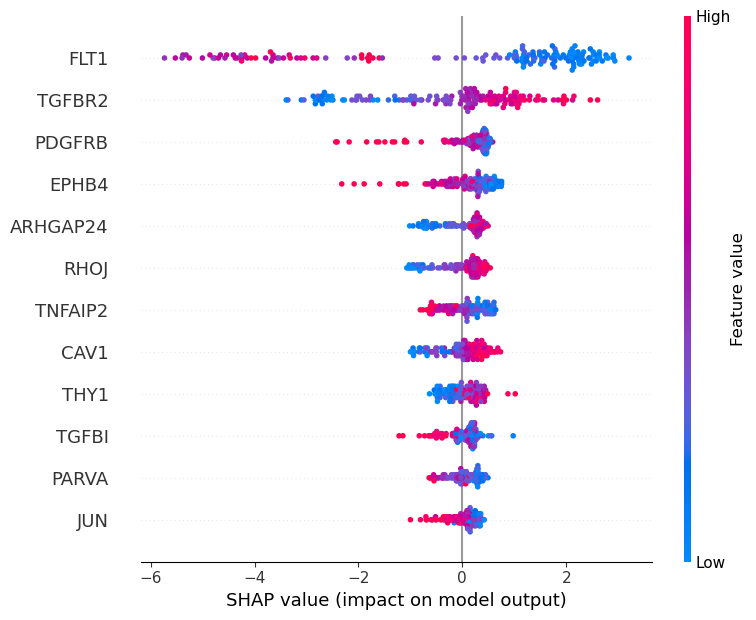

<Figure size 640x480 with 0 Axes>

In [14]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# 假设你有一个模型 model 和一些输入数据 X
# 请确保已经对模型进行了训练和拟合，并且 X 是一个 NumPy 数组或 Pandas DataFrame

# 创建一个 SHAP 解释器
explainer = shap.Explainer(catboost_model)

# 计算 SHAP 值
shap_values = explainer.shap_values(X)


# 绘制 SHAP 图
shap.summary_plot(shap_values, X)
plt.savefig("shap_summary.jpg", dpi=600, format='jpg')
plt.show()  # 显示图像

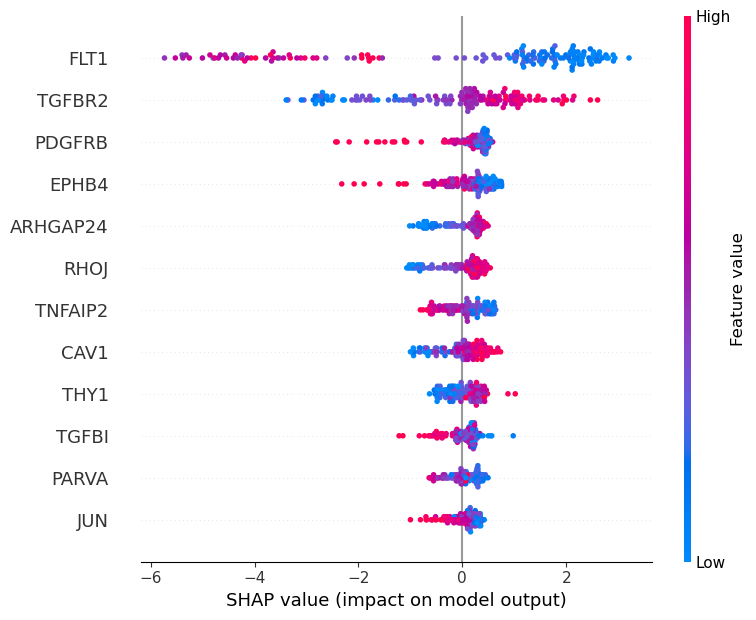

In [17]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Assume you have a model called model and some input data X
# Please make sure the model has been trained and fitted, and X is a NumPy array or Pandas DataFrame

# Create a SHAP interpreter
explainer = shap.Explainer(catboost_model)

# Calculate SHAP values
shap_values = explainer.shap_values(X)

# Create a new figure and axes
fig, ax = plt.subplots()

# Draw a SHAP diagram
shap.summary_plot(shap_values, X, show=False)

# Save the figure before displaying it
fig.savefig("shap_summary.jpg", dpi=600, format='jpg')

# Show the figure
plt.show()  # Display the figure

